In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

In [2]:
from local_explanations import *
import utils
import models

import matplotlib.pyplot as plt
import matplotlib.cm as cm

import numpy as np

import torch
import torch_geometric.transforms as T
from torch_geometric.data import InMemoryDataset, Data
from torch_geometric.utils import from_networkx, to_networkx
from torch_geometric.loader import DataLoader

from sklearn.model_selection import train_test_split

from collections import defaultdict
import copy

%load_ext autoreload
%autoreload 2

### read data

In [3]:
DATASET_NAME = "BAMultiShapes"

In [133]:
adjs_train , \
edge_weights_train , \
ori_classes_train , \
belonging_train , \
summary_predictions_train , \
le_classes_train = read_bamultishapes(evaluate_method=True, 
                                       remove_mix=False, 
                                       min_num_include=5, 
                                       split="TRAIN") #, manual_cut=0.47377795

print(len(adjs_train) , len(edge_weights_train), len(ori_classes_train) , len(belonging_train))
print(np.unique(summary_predictions_train["wrong"], return_counts=True) , np.unique(summary_predictions_train["correct"], return_counts=True))
print(np.unique(le_classes_train, return_counts=True))

Num shapes: 1032, Num Preserved: 1024, Ratio: 0.992, Num Multipleshapes: 305
num_class_relationship_broken:  7  num_multi_shapes_removed: 0
970 970 800 970
(array([], dtype=float64), array([], dtype=int64)) (array([0, 1, 2, 3, 4, 5, 6, 7]), array([ 34,  42,  45, 242, 124, 139, 137,  37], dtype=int64))
(array([0, 1, 2, 3, 4, 5, 6, 7]), array([121, 162, 157, 251,  78, 102,  73,  26], dtype=int64))


In [134]:
adjs_val , \
edge_weights_val , \
ori_classes_val , \
belonging_val , \
summary_predictions_val , \
le_classes_val = read_bamultishapes(evaluate_method=True, 
                                     remove_mix=False, 
                                     min_num_include=5, 
                                     split="VAL") #, manual_cut=0.47377795

print(len(adjs_val) , len(edge_weights_val), len(ori_classes_val) , len(belonging_val))
print(np.unique(summary_predictions_val["wrong"], return_counts=True) , np.unique(summary_predictions_val["correct"], return_counts=True))
print(np.unique(le_classes_val, return_counts=True))

Num shapes: 127, Num Preserved: 127, Ratio: 1.0, Num Multipleshapes: 43
num_class_relationship_broken:  0  num_multi_shapes_removed: 0
115 115 100 115
(array([], dtype=float64), array([], dtype=int64)) (array([0, 1, 2, 3, 4, 5, 6, 7]), array([ 2,  6,  7, 31, 10, 20, 20,  4], dtype=int64))
(array([0, 1, 2, 3, 4, 5, 6, 7]), array([ 9, 14, 19, 31, 10, 16, 15,  1], dtype=int64))


In [135]:
adjs_test , \
edge_weights_test , \
ori_classes_test , \
belonging_test , \
summary_predictions_test , \
le_classes_test = read_bamultishapes(evaluate_method=True, 
                                      remove_mix=False, 
                                      min_num_include=5, 
                                      split="TEST") #, manual_cut=0.47377795

print(len(adjs_test) , len(edge_weights_test), len(ori_classes_test) , len(belonging_test))
print(np.unique(summary_predictions_test["wrong"], return_counts=True) , np.unique(summary_predictions_test["correct"], return_counts=True))
print(np.unique(le_classes_test, return_counts=True))

Num shapes: 119, Num Preserved: 118, Ratio: 0.992, Num Multipleshapes: 31
num_class_relationship_broken:  1  num_multi_shapes_removed: 0
120 120 100 120
(array([], dtype=float64), array([], dtype=int64)) (array([0, 1, 2, 3, 4, 5, 6]), array([ 7,  5,  7, 31, 17, 14, 19], dtype=int64))
(array([0, 1, 2, 3, 4, 5, 6]), array([17, 21, 18, 33,  9, 11, 11], dtype=int64))


### dataset

C:\Users\Steve\Desktop\GNN\gnn_logic_global_expl\code\utils.py:51: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  edge_attr=torch.tensor(t.weight).reshape(-1, 1),


(array([0, 1, 2, 3, 4, 5, 6, 7]), array([121, 162, 157, 251,  78, 102,  73,  26], dtype=int64))
(tensor([0, 1]), tensor([369, 601]))


('grid', 12, tensor([12]))

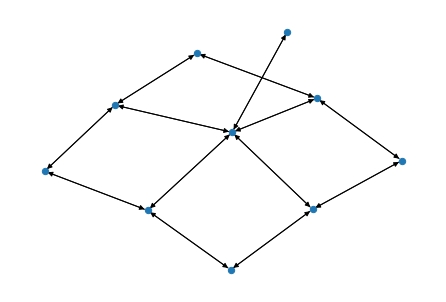

In [136]:
device = "cpu" #torch.device('cuda' if torch.cuda.is_available() else 'cpu')
transform = T.Compose([
    T.NormalizeFeatures(),
])     


dataset_train = utils.LocalExplanationsDataset("", adjs_train, edge_weights_train, "same", transform=transform, y=le_classes_train, belonging=belonging_train, task_y=ori_classes_train)
dataset_val = utils.LocalExplanationsDataset("", adjs_val, edge_weights_val, "same", transform=transform, y=le_classes_val, belonging=belonging_val, task_y=ori_classes_val)
dataset_test = utils.LocalExplanationsDataset("", adjs_test, edge_weights_test, "same", transform=transform, y=le_classes_test, belonging=belonging_test, task_y=ori_classes_test)


##
# debug Dataset
##
print(np.unique(le_classes_train, return_counts=True))
print(torch.unique(dataset_train.data.task_y, return_counts=True))
idx = 18
nx.draw(to_networkx(dataset_train[idx]), node_size=40)   # debug Dataset
bamultishapes_classes_names[dataset_train[idx].y] , belonging_train[idx] , dataset_train[idx].graph_id

(array([0., 1., 2., 3., 4., 5., 6., 7.], dtype=float32), array([121, 162, 157, 251,  78, 102,  73,  26], dtype=int64))


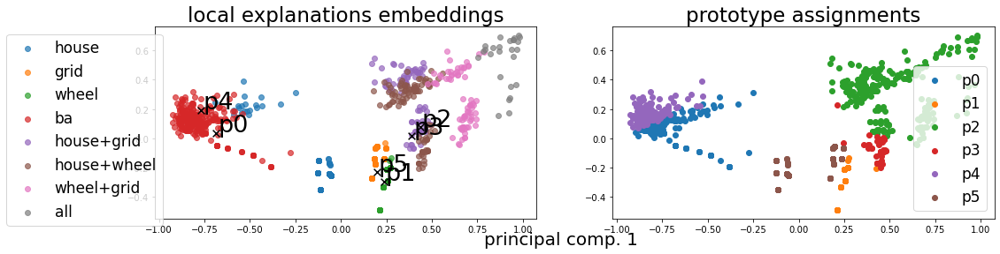

Alpha norms:
tensor([[0.2467, 0.2362, 1.0000, 0.4470, 0.2758, 0.3151],
        [0.0413, 0.0687, 1.0000, 0.2777, 0.0300, 0.0789]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.757217 +- 0.238384
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([140, 158, 239,  40, 131, 262], dtype=int64))
Logic formulas:
For class 0:
0.92375 (feature004) | (feature000) | ((feature001)
For class 1:
0.92375 (feature005) | (feature003) | (feature002) | (feature001 & feature005) | (feature005 & feature003) | (feature005 & feature002) | (feature001 & feature002) | (feature001 & feature003)
Accuracy as classifier:  0.9238
LEN fidelity:  tensor(0.9237)

(array([0., 1., 2., 3., 4., 5., 6., 7.], dtype=float32), array([121, 162, 157, 251,  78, 102,  73,  26], dtype=int64))


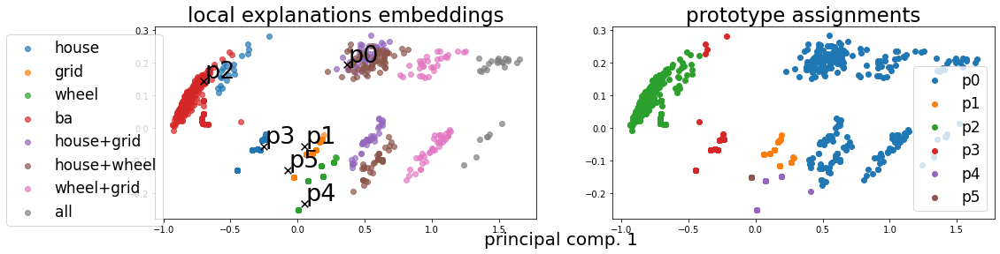

Alpha norms:
tensor([[1.0000, 0.1898, 0.1340, 0.1709, 0.1194, 0.1575],
        [1.0000, 0.3450, 0.1924, 0.1832, 0.2306, 0.2369]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.851345 +- 0.226665
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([278, 146, 266, 106, 132,  42], dtype=int64))
Logic formulas:
For class 0:
0.9625 (feature002) | (feature003) | ((feature004) | (feature005)
For class 1:
0.96125 (feature000) | (feature004 & feature001) | (feature004 & feature005) | (feature001 & feature000) | ((feature003 & feature001) | ((feature003 & feature005) | ((feature003 & feature004) | ((feature003 & feature000) | (feature004 & feature000)
Accuracy as classifier:  0.9388
LEN fidelity:  tensor(0.9388)

(array([0., 1., 2., 3., 4., 5., 6., 7.], dtype=float32), array([121, 162, 157, 251,  78, 102,  73,  26], dtype=int64))


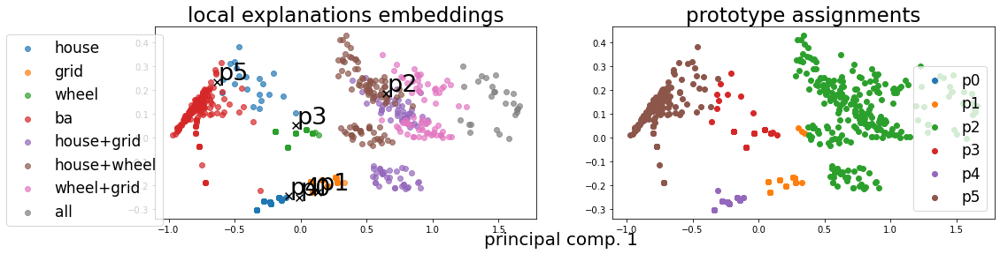

Alpha norms:
tensor([[0.3511, 0.4820, 1.0000, 0.3840, 0.2578, 0.1357],
        [0.5271, 0.7396, 1.0000, 0.4874, 0.3877, 0.3419]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.846103 +- 0.244266
Concept distribution:  (array([1, 2, 3, 4, 5], dtype=int64), array([165, 276, 166, 102, 261], dtype=int64))
Logic formulas:
For class 0:
0.97875 (feature001) | (feature003) | ((feature005) | (feature004)
For class 1:
0.97875 (feature002) | (feature004 & feature001) | (feature003 & feature001) | (feature004 & feature003) | (feature001 & feature002) | (feature004 & feature002) | (feature003 & feature002)
Accuracy as classifier:  0.9788
LEN fidelity:  tensor(0.9787)

(array([0., 1., 2., 3., 4., 5., 6., 7.], dtype=float32), array([121, 162, 157, 251,  78, 102,  73,  26], dtype=int64))


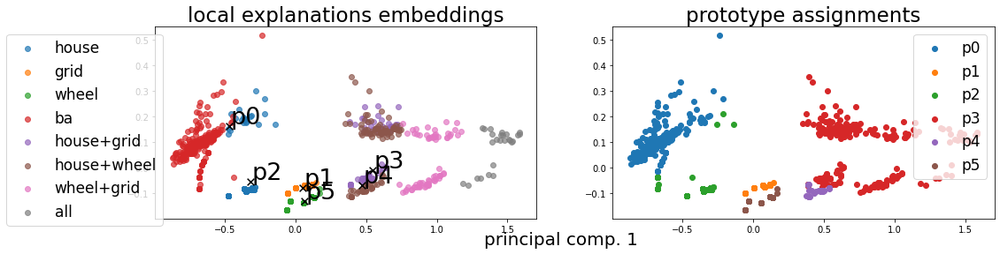

Alpha norms:
tensor([[1.0000, 0.6384, 0.3729, 0.4536, 0.4959, 0.3321],
        [0.0358, 0.1336, 0.0933, 1.0000, 0.2902, 0.1376]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.835676 +- 0.241034
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([254, 162, 118, 251,  28, 157], dtype=int64))
Logic formulas:
For class 0:
0.98 (feature000) | (feature001) | ((feature005) | (feature002 & feature000) | (feature002)
For class 1:
0.98 (feature004) | (feature003) | (feature002 & feature001) | (feature001 & feature005) | (feature002 & feature005) | (feature001 & feature004) | (feature002 & feature003) | (feature005 & feature003) | (feature005 & feature004)
Accuracy as classifier:  0.98
LEN fidelity:  tensor(0.9800)

(array([0., 1., 2., 3., 4., 5., 6., 7.], dtype=float32), array([121, 162, 157, 251,  78, 102,  73,  26], dtype=int64))


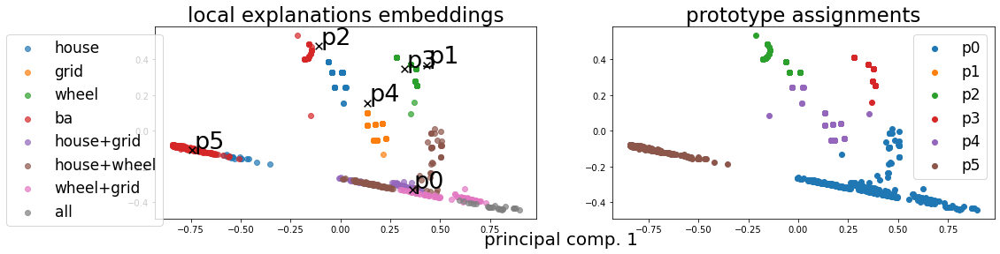

Alpha norms:
tensor([[1.0000, 0.2020, 0.3252, 0.1793, 0.5895, 0.0356],
        [1.0000, 0.2966, 0.3854, 0.5374, 0.6633, 0.2340]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.775901 +- 0.227122
Concept distribution:  (array([0, 2, 3, 4, 5], dtype=int64), array([280, 119, 156, 180, 235], dtype=int64))
Logic formulas:
For class 0:
0.975 (feature004) | (feature002) | ((feature005) | (feature003)
For class 1:
0.975 (feature000) | (feature002 & feature004) | (feature003 & feature004) | (feature002 & feature003) | (feature004 & feature000) | (feature002 & feature000) | (feature003 & feature000)
Accuracy as classifier:  0.975
LEN fidelity:  tensor(0.9750)



In [137]:
batch_sampler = utils.GroupBatchSampler(num_input_graphs=128, drop_last=False, belonging=np.array(belonging_train))
train_group_loader = DataLoader(dataset_train, batch_sampler=batch_sampler)

batch_sampler = utils.GroupBatchSampler(num_input_graphs=256, drop_last=False, belonging=np.array(belonging_val))
val_group_loader = DataLoader(dataset_val, batch_sampler=batch_sampler)

batch_sampler = utils.GroupBatchSampler(num_input_graphs=256, drop_last=False, belonging=np.array(belonging_test))
test_group_loader = DataLoader(dataset_test, batch_sampler=batch_sampler)


with open(f'bamultishapes_confidence_intervals.pkl', 'rb') as handle:
    mutag_expls = pickle.load(handle)
    
for e in mutag_expls:
    e.inspect_embedding(train_group_loader)

In [139]:
sa = [0.92, 0.9388, 0.9788, 0.9800, 0.9750]
np.mean(sa) , np.std(sa)

(0.95852, 0.024563908483789778)

### Ablation on Focal Loss

(array([0., 1., 2., 3., 4., 5., 6.], dtype=float32), array([117, 153, 151, 251,  73,  97,  70], dtype=int64))


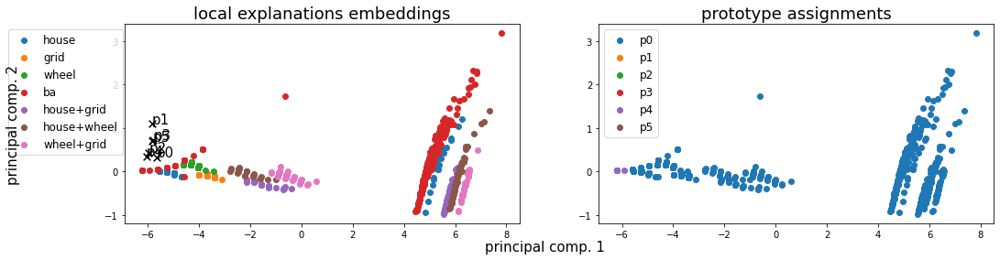

Alpha norms:
tensor([[0.8153, 0.7412, 1.0000, 0.9409, 0.6217, 0.7137],
        [0.9517, 0.9267, 0.9063, 0.9430, 1.0000, 0.9338]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.635210 +- 0.364790
Concept distribution:  (array([0, 4], dtype=int64), array([906,   6], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 0.20551, LEN: 0.073147, AccxC: 0.51, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.23186, V. LEN 0.10
  2: Loss: 0.15477, LEN: 0.072950, AccxC: 0.55, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.20301, V. LEN 0.10
  3: Loss: 0.14870, LEN: 0.072778, AccxC: 0.56, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.21151, V. LEN 0.10
  4: Loss: 0.14447, LEN: 0.072581, AccxC: 0.55, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.19266, V. LEN 0.10
  5: Loss: 0.12330, LEN: 0.072343, AccxC: 0.49, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.16196, V. LEN 0.10
  6: Loss: 0.10922, LEN: 0.072054, AccxC: 0.51, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.1

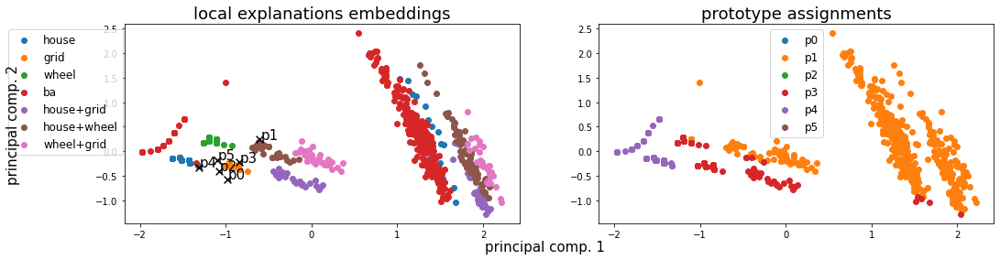

Alpha norms:
tensor([[0.7212, 0.7483, 0.7900, 1.0000, 0.5883, 0.6274],
        [0.8218, 0.9691, 0.7540, 1.0000, 0.9081, 0.8316]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.556837 +- 0.126125
Concept distribution:  (array([1, 3, 4], dtype=int64), array([446, 334, 132], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)


 20: Loss: 0.08037, LEN: 0.067259, AccxC: 0.57, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.11408, V. LEN 0.09
 21: Loss: 0.07842, LEN: 0.066951, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.11495, V. LEN 0.09
 22: Loss: 0.07938, LEN: 0.066780, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.11036, V. LEN 0.09
 23: Loss: 0.07745, LEN: 0.066346, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.11306, V. LEN 0.09
 24: Loss: 0.07734, LEN: 0.066023, AccxC: 0.62, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.11252, V. LEN 0.09
 25: Loss: 0.07791, LEN: 0.066118, AccxC: 0.57, AccO: 0.00, V. Acc: 0.00, V. 

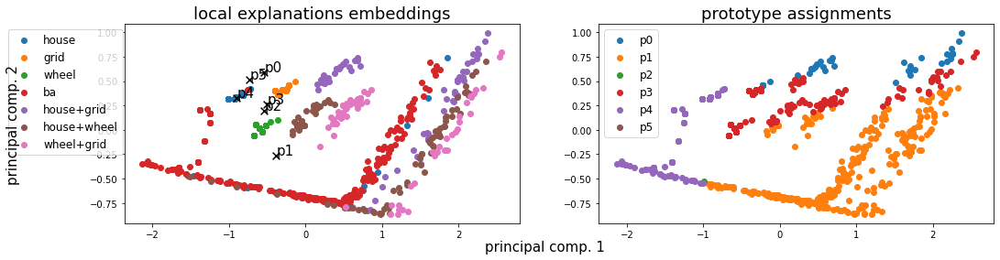

Alpha norms:
tensor([[0.5929, 0.5102, 0.3171, 1.0000, 0.4787, 0.6211],
        [0.5755, 0.7329, 0.4341, 1.0000, 0.6049, 0.6178]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.627431 +- 0.201932
Concept distribution:  (array([0, 1, 2, 3, 4], dtype=int64), array([ 41, 323,   1, 377, 170], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.5875331564986738 (feature003) | (feature004) | (feature000) | (feature004 & feature003) | (feature000 & feature003) | (feature000 & feature004)
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.3422)


 40: Loss: 0.06972, LEN: 0.063240, AccxC: 0.56, AccO: 0.28, V. Acc: 0.34, V. Loss: 0.10175, V. LEN 0.08
 41: Loss: 0.06965, LEN: 0.063856, AccxC: 0.51, AccO: 0.25, V. Acc: 0.34, V. Loss: 0.10157, V. LEN 0.08
 42: Loss: 0.06867, LEN: 0.063162, AccxC: 0.53, AccO: 0.29, V. Acc: 0.28, V. Loss: 0.10087, V. LEN 0.08
 43: Loss: 0.06908, LEN: 0.063002, AccxC: 0.53, AccO: 0.27, V. Acc: 0.32, V. Loss: 0.09982, V. LEN 0.08
 44: Loss: 0.06909, LE

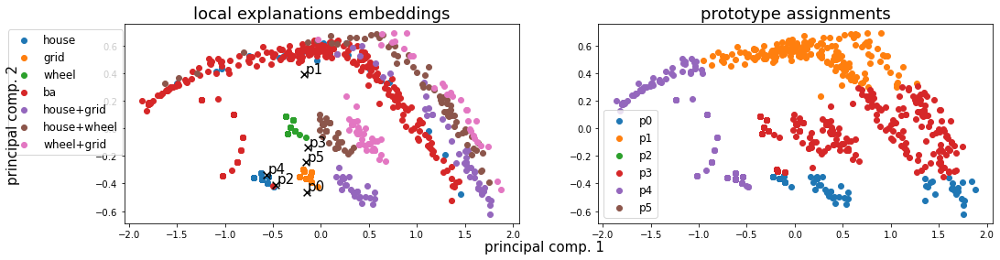

Alpha norms:
tensor([[0.6964, 0.2840, 0.2149, 1.0000, 0.2145, 0.7908],
        [0.4479, 0.3885, 0.2339, 1.0000, 0.4192, 0.4475]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.558105 +- 0.114479
Concept distribution:  (array([0, 1, 3, 4], dtype=int64), array([144, 181, 403, 184], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.7519893899204244 (feature003) | (feature004 & feature003) | (feature004 & feature000) | (feature000 & feature003) | (feature000)
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.4576)


 60: Loss: 0.06611, LEN: 0.061336, AccxC: 0.70, AccO: 0.37, V. Acc: 0.46, V. Loss: 0.09593, V. LEN 0.08
 61: Loss: 0.06503, LEN: 0.060470, AccxC: 0.75, AccO: 0.42, V. Acc: 0.46, V. Loss: 0.09338, V. LEN 0.08
 62: Loss: 0.06564, LEN: 0.061384, AccxC: 0.70, AccO: 0.33, V. Acc: 0.61, V. Loss: 0.09337, V. LEN 0.08
 63: Loss: 0.06459, LEN: 0.060787, AccxC: 0.71, AccO: 0.53, V. Acc: 0.62, V. Loss: 0.09161, V. LEN 0.08
 64: Loss: 0.06541, LEN: 0.061242, AccxC: 0.6

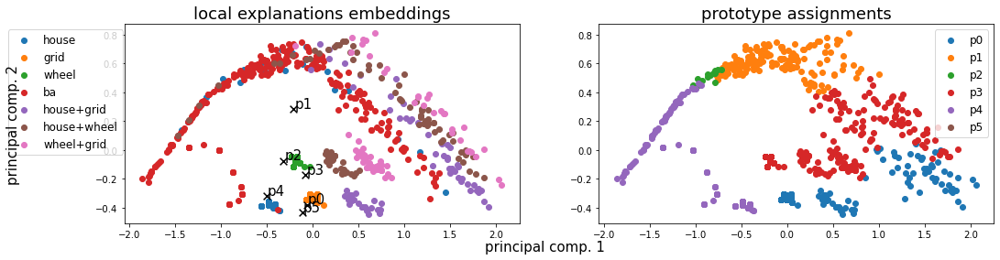

Alpha norms:
tensor([[0.6880, 0.1547, 0.1287, 1.0000, 0.0957, 0.7640],
        [0.5131, 0.2701, 0.1861, 1.0000, 0.3804, 0.4945]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.611082 +- 0.098103
Concept distribution:  (array([0, 1, 2, 3, 4], dtype=int64), array([232, 151,  15, 321, 193], dtype=int64))
Logic formulas:
For class 0:
0.7625994694960212 (feature001) | ((feature004) | (feature002)
For class 1:
0.7625994694960212 (feature003) | (feature000) | (feature004 & feature000) | (feature000 & feature003) | (feature004 & feature003)
Accuracy as classifier:  0.7626
LEN fidelity:  tensor(0.7626)


 80: Loss: 0.06089, LEN: 0.058000, AccxC: 0.71, AccO: 0.71, V. Acc: 0.76, V. Loss: 0.08720, V. LEN 0.08
 81: Loss: 0.06138, LEN: 0.058066, AccxC: 0.71, AccO: 0.71, V. Acc: 0.76, V. Loss: 0.08909, V. LEN 0.07
 82: Loss: 0.06059, LEN: 0.056943, AccxC: 0.74, AccO: 0.74, V. Acc: 0.76, V. Loss: 0.09031, V. LEN 0.07
 83: Loss: 0.06164, LEN: 0.058399, AccxC: 0.70, AccO: 0.70, V. Acc: 0.77, V. Loss:

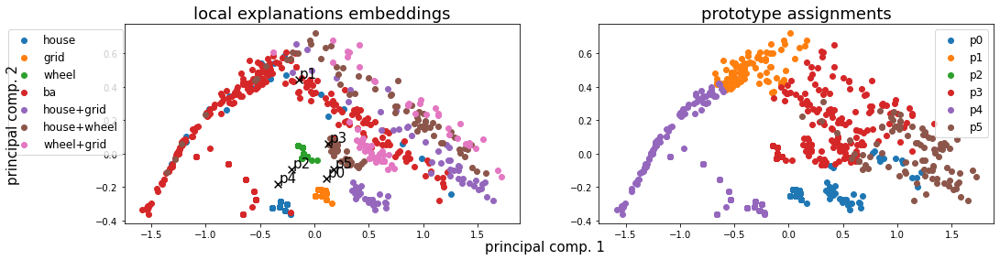

Alpha norms:
tensor([[0.6490, 0.1024, 0.0883, 1.0000, 0.0659, 0.6794],
        [0.5879, 0.2422, 0.1876, 1.0000, 0.3715, 0.6367]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.562999 +- 0.166349
Concept distribution:  (array([0, 1, 3, 4, 5], dtype=int64), array([197,  90, 314, 224,  87], dtype=int64))
Logic formulas:
For class 0:
0.7586206896551724 (feature001) | ((feature004)
For class 1:
0.7586206896551724 (feature003) | (feature005) | (feature000) | (feature004 & feature000) | (feature000 & feature003) | (feature004 & feature003)
Accuracy as classifier:  0.7586
LEN fidelity:  tensor(0.7586)


100: Loss: 0.05804, LEN: 0.055455, AccxC: 0.72, AccO: 0.72, V. Acc: 0.77, V. Loss: 0.08084, V. LEN 0.07
101: Loss: 0.05733, LEN: 0.054813, AccxC: 0.74, AccO: 0.74, V. Acc: 0.79, V. Loss: 0.07777, V. LEN 0.07
102: Loss: 0.05896, LEN: 0.056613, AccxC: 0.68, AccO: 0.68, V. Acc: 0.68, V. Loss: 0.08197, V. LEN 0.07
103: Loss: 0.05930, LEN: 0.057093, AccxC: 0.67, AccO: 0.67, V. Acc: 0.76, V. Loss:

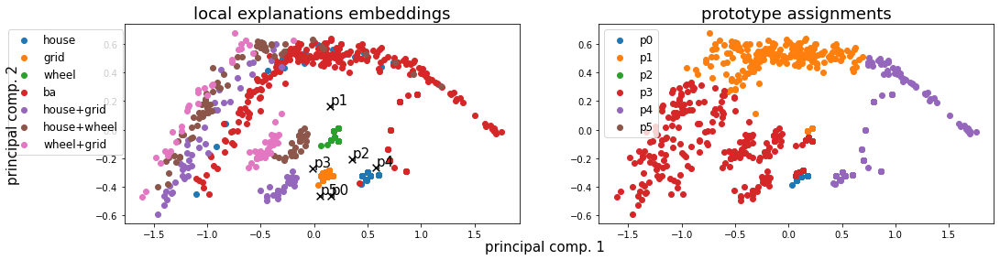

Alpha norms:
tensor([[0.6693, 0.1003, 0.0953, 1.0000, 0.0714, 0.7311],
        [0.6836, 0.2549, 0.2200, 1.0000, 0.4116, 0.8316]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.618522 +- 0.251196
Concept distribution:  (array([0, 1, 3, 4], dtype=int64), array([ 83, 219, 428, 182], dtype=int64))
Logic formulas:
For class 0:
0.7838196286472149 (feature001) | ((feature004)
For class 1:
0.8103448275862069 (feature003) | (feature004 & feature003) | (feature004 & feature000) | (feature000 & feature003) | (feature001 & feature000) | (feature001 & feature003)
Accuracy as classifier:  0.7732
LEN fidelity:  tensor(0.7732)


120: Loss: 0.05490, LEN: 0.052636, AccxC: 0.74, AccO: 0.74, V. Acc: 0.81, V. Loss: 0.07069, V. LEN 0.06
121: Loss: 0.05278, LEN: 0.050881, AccxC: 0.75, AccO: 0.75, V. Acc: 0.84, V. Loss: 0.06630, V. LEN 0.06
122: Loss: 0.05584, LEN: 0.053575, AccxC: 0.71, AccO: 0.71, V. Acc: 0.82, V. Loss: 0.07236, V. LEN 0.06
123: Loss: 0.05283, LEN: 0.050620, AccxC: 0.77, AccO: 0.76, V. A

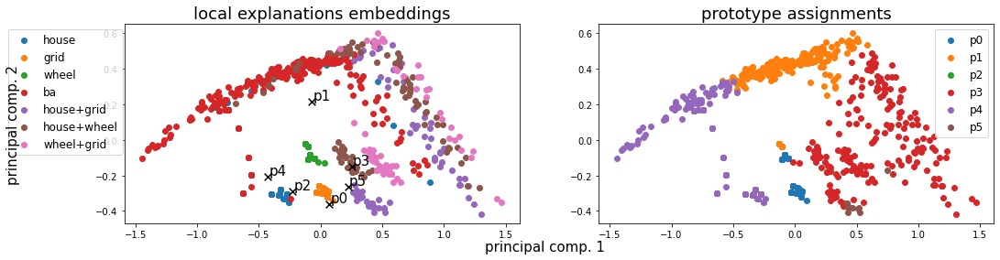

Alpha norms:
tensor([[0.4961, 0.0857, 0.1047, 1.0000, 0.0719, 0.6760],
        [0.6959, 0.2696, 0.2406, 1.0000, 0.3809, 0.8884]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.589016 +- 0.182994
Concept distribution:  (array([0, 1, 3, 4, 5], dtype=int64), array([279, 220, 209, 194,  10], dtype=int64))
Logic formulas:
For class 0:
0.8063660477453581 (feature001) | ((feature004)
For class 1:
0.8063660477453581 (feature003) | (feature000) | (feature005) | (feature004 & feature000) | (feature001 & feature000) | (feature000 & feature003) | (feature001 & feature004)
Accuracy as classifier:  0.8064
LEN fidelity:  tensor(0.8064)


140: Loss: 0.04854, LEN: 0.046749, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.06649, V. LEN 0.06
141: Loss: 0.05038, LEN: 0.048636, AccxC: 0.79, AccO: 0.78, V. Acc: 0.82, V. Loss: 0.06658, V. LEN 0.06
142: Loss: 0.04984, LEN: 0.047927, AccxC: 0.80, AccO: 0.79, V. Acc: 0.84, V. Loss: 0.06386, V. LEN 0.06
143: Loss: 0.05128, LEN: 0.049510, AccxC: 0.78, AccO: 

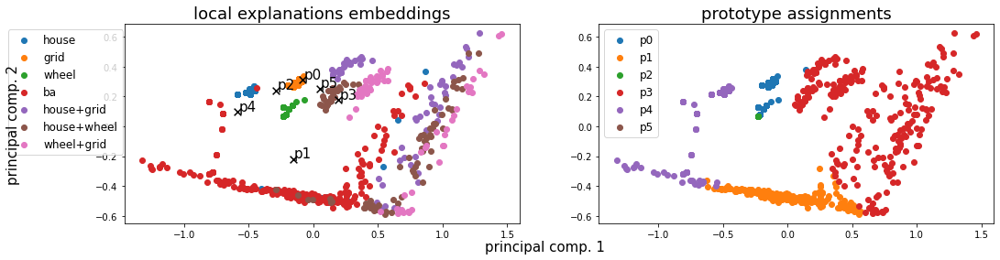

Alpha norms:
tensor([[0.3221, 0.0714, 0.1160, 1.0000, 0.0715, 0.4786],
        [0.6390, 0.2702, 0.2754, 1.0000, 0.3580, 0.7722]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.646560 +- 0.234971
Concept distribution:  (array([0, 1, 2, 3, 4], dtype=int64), array([291, 204,  14, 246, 157], dtype=int64))
Logic formulas:
For class 0:
0.8156498673740054 (feature004) | ((feature001) | (feature002)
For class 1:
0.8156498673740054 (feature003) | (feature000) | (feature004 & feature000) | (feature002 & feature000) | (feature002 & feature004)
Accuracy as classifier:  0.8156
LEN fidelity:  tensor(0.8156)


160: Loss: 0.04491, LEN: 0.043372, AccxC: 0.82, AccO: 0.82, V. Acc: 0.85, V. Loss: 0.05688, V. LEN 0.05
161: Loss: 0.04483, LEN: 0.043430, AccxC: 0.82, AccO: 0.82, V. Acc: 0.83, V. Loss: 0.05725, V. LEN 0.05
162: Loss: 0.04348, LEN: 0.041967, AccxC: 0.83, AccO: 0.83, V. Acc: 0.84, V. Loss: 0.05834, V. LEN 0.05
163: Loss: 0.04427, LEN: 0.042704, AccxC: 0.82, AccO: 0.82, V. Acc: 0.86, V. Loss:

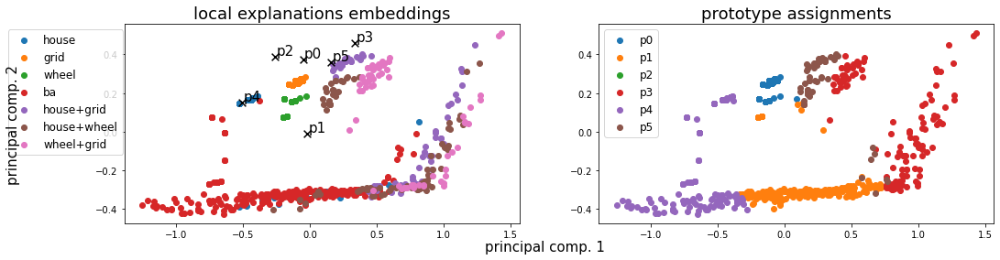

Alpha norms:
tensor([[0.2415, 0.0755, 0.1311, 1.0000, 0.0782, 0.4188],
        [0.6037, 0.2937, 0.3661, 1.0000, 0.4052, 0.7686]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.529242 +- 0.050865
Concept distribution:  (array([0, 1, 3, 4, 5], dtype=int64), array([282, 228, 135, 205,  62], dtype=int64))
Logic formulas:
For class 0:
0.8209549071618037 ((feature001) | (feature004)
For class 1:
0.8209549071618037 (feature005) | (feature003) | (feature000) | (feature004 & feature000) | ((feature001 & feature000) | ((feature001 & feature004)
Accuracy as classifier:  0.821
LEN fidelity:  tensor(0.8210)


180: Loss: 0.04113, LEN: 0.039680, AccxC: 0.84, AccO: 0.84, V. Acc: 0.83, V. Loss: 0.05532, V. LEN 0.05
181: Loss: 0.04263, LEN: 0.041262, AccxC: 0.82, AccO: 0.82, V. Acc: 0.85, V. Loss: 0.04917, V. LEN 0.04
182: Loss: 0.04036, LEN: 0.038959, AccxC: 0.84, AccO: 0.84, V. Acc: 0.88, V. Loss: 0.04886, V. LEN 0.05
183: Loss: 0.04030, LEN: 0.038988, AccxC: 0.84, AccO: 0.84, V. Acc: 0.84, V. Loss

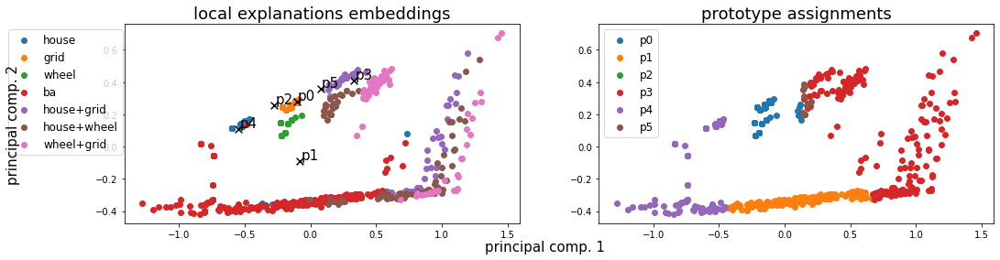

Alpha norms:
tensor([[0.2040, 0.0828, 0.1249, 1.0000, 0.0850, 0.3316],
        [0.5924, 0.2850, 0.4087, 1.0000, 0.4672, 0.7110]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.559917 +- 0.143870
Concept distribution:  (array([0, 1, 3, 4, 5], dtype=int64), array([309, 214, 202, 174,  13], dtype=int64))
Logic formulas:
For class 0:
0.850132625994695 (feature000) | ((feature001) | (feature004)
For class 1:
0.850132625994695 (feature003) | (feature004 & feature000) | (feature005)
Accuracy as classifier:  0.8501
LEN fidelity:  tensor(0.8501)


200: Loss: 0.03532, LEN: 0.034313, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.04582, V. LEN 0.04
201: Loss: 0.03446, LEN: 0.033498, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04358, V. LEN 0.04
202: Loss: 0.03510, LEN: 0.034086, AccxC: 0.88, AccO: 0.88, V. Acc: 0.88, V. Loss: 0.04479, V. LEN 0.04
203: Loss: 0.03463, LEN: 0.033667, AccxC: 0.88, AccO: 0.88, V. Acc: 0.93, V. Loss: 0.04104, V. LEN 0.04
204: Loss: 0.03627, LEN: 0.035320, A

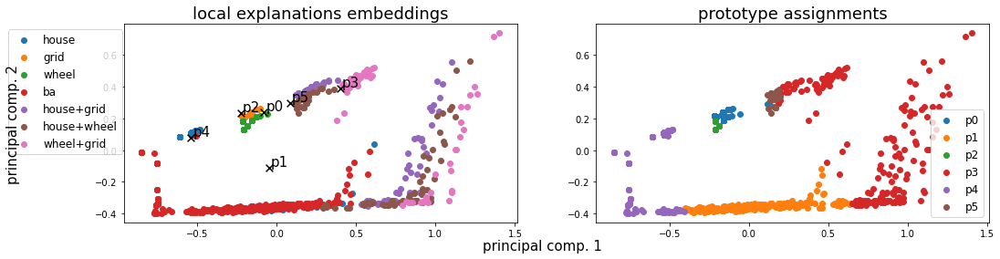

Alpha norms:
tensor([[0.1777, 0.0851, 0.1237, 1.0000, 0.0883, 0.2585],
        [0.6079, 0.2724, 0.4272, 1.0000, 0.5126, 0.6715]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.652656 +- 0.205046
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([239, 223,  67, 195, 165,  23], dtype=int64))
Logic formulas:
For class 0:
0.8912466843501327 (feature000) | (feature004) | ((feature001) | (feature002)
For class 1:
0.8912466843501327 (feature005) | (feature003) | (feature004 & feature000) | (feature002 & feature000) | (feature002 & feature004)
Accuracy as classifier:  0.8912
LEN fidelity:  tensor(0.8912)


220: Loss: 0.03021, LEN: 0.029463, AccxC: 0.91, AccO: 0.91, V. Acc: 0.91, V. Loss: 0.04120, V. LEN 0.04
221: Loss: 0.02995, LEN: 0.029045, AccxC: 0.90, AccO: 0.90, V. Acc: 0.93, V. Loss: 0.03804, V. LEN 0.04
222: Loss: 0.03083, LEN: 0.029965, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.04038, V. LEN 0.04
223: Loss: 0.02888, LEN: 0.027908, AccxC: 0.91, AccO: 0.91,

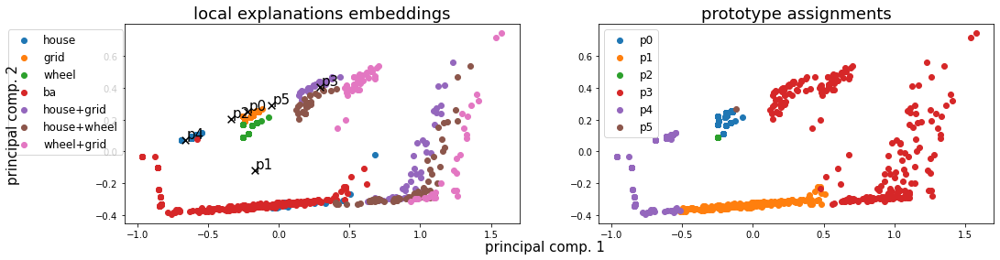

Alpha norms:
tensor([[0.1426, 0.0745, 0.0967, 1.0000, 0.0782, 0.1819],
        [0.6113, 0.2564, 0.3933, 1.0000, 0.5225, 0.6240]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.739389 +- 0.238315
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([289, 216,  14, 240, 152,   1], dtype=int64))
Logic formulas:
For class 0:
0.896551724137931 (feature000) | (feature004) | ((feature001) | (feature002)
For class 1:
0.8978779840848806 (feature003) | (feature004 & feature000) | (feature002 & feature000) | (feature002 & feature004)
Accuracy as classifier:  0.8966
LEN fidelity:  tensor(0.8966)


240: Loss: 0.02764, LEN: 0.026880, AccxC: 0.91, AccO: 0.91, V. Acc: 0.93, V. Loss: 0.03411, V. LEN 0.03
241: Loss: 0.03015, LEN: 0.029445, AccxC: 0.89, AccO: 0.89, V. Acc: 0.90, V. Loss: 0.04084, V. LEN 0.04
242: Loss: 0.02708, LEN: 0.026454, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03743, V. LEN 0.04
243: Loss: 0.02758, LEN: 0.026975, AccxC: 0.91, AccO: 0.91, V. Acc: 0.91, V

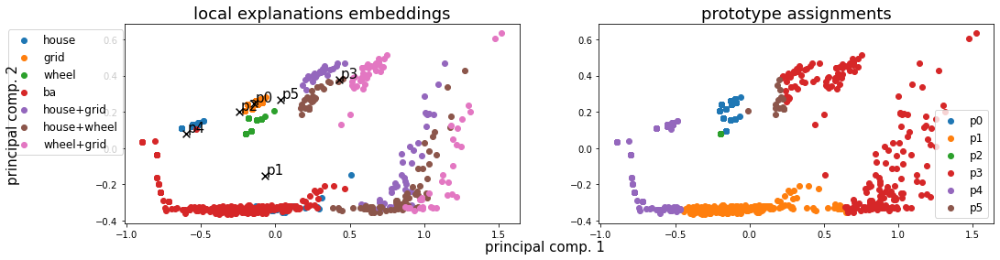

Alpha norms:
tensor([[0.1211, 0.0712, 0.0981, 1.0000, 0.0752, 0.1459],
        [0.5816, 0.2413, 0.3976, 1.0000, 0.5154, 0.5475]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.674120 +- 0.213069
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([289, 220,  14, 211, 163,  15], dtype=int64))
Logic formulas:
For class 0:
0.889920424403183 (feature000) | (feature004) | ((feature001) | (feature002)
For class 1:
0.889920424403183 (feature005) | (feature003) | (feature004 & feature000) | (feature002 & feature000) | (feature002 & feature004) | (feature005 & feature000)
Accuracy as classifier:  0.8899
LEN fidelity:  tensor(0.8714)


260: Loss: 0.02535, LEN: 0.024663, AccxC: 0.92, AccO: 0.88, V. Acc: 0.88, V. Loss: 0.03792, V. LEN 0.04
261: Loss: 0.02359, LEN: 0.022963, AccxC: 0.93, AccO: 0.92, V. Acc: 0.94, V. Loss: 0.03100, V. LEN 0.03
262: Loss: 0.02634, LEN: 0.025505, AccxC: 0.91, AccO: 0.91, V. Acc: 0.89, V. Loss: 0.03866, V. LEN 0.04
263: Loss: 0.02740, LEN: 0.026796

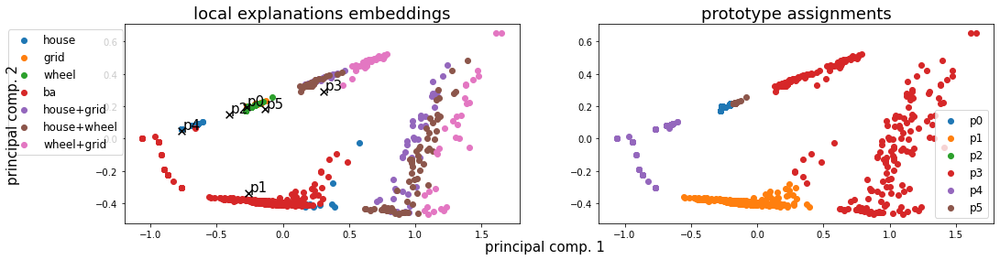

Alpha norms:
tensor([[0.0992, 0.0637, 0.0888, 1.0000, 0.0696, 0.1374],
        [0.5791, 0.2288, 0.3751, 1.0000, 0.4966, 0.5111]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.615656 +- 0.188885
Concept distribution:  (array([0, 1, 3, 4, 5], dtype=int64), array([272, 228, 248, 132,  32], dtype=int64))
Logic formulas:
For class 0:
0.9124668435013262 (feature000) | (feature004) | ((feature001) | (feature005)
For class 1:
0.9124668435013262 (feature003) | (feature004 & feature000) | (feature005 & feature000) | (feature004 & feature005)
Accuracy as classifier:  0.9125
LEN fidelity:  tensor(0.9125)


280: Loss: 0.02632, LEN: 0.025822, AccxC: 0.91, AccO: 0.91, V. Acc: 0.94, V. Loss: 0.02853, V. LEN 0.03
281: Loss: 0.02444, LEN: 0.023955, AccxC: 0.92, AccO: 0.92, V. Acc: 0.93, V. Loss: 0.02736, V. LEN 0.03
282: Loss: 0.02133, LEN: 0.020900, AccxC: 0.93, AccO: 0.93, V. Acc: 0.99, V. Loss: 0.02283, V. LEN 0.02
283: Loss: 0.02137, LEN: 0.020961, AccxC: 0.92, AccO: 0.92, V. Acc: 0.90, V. Loss:

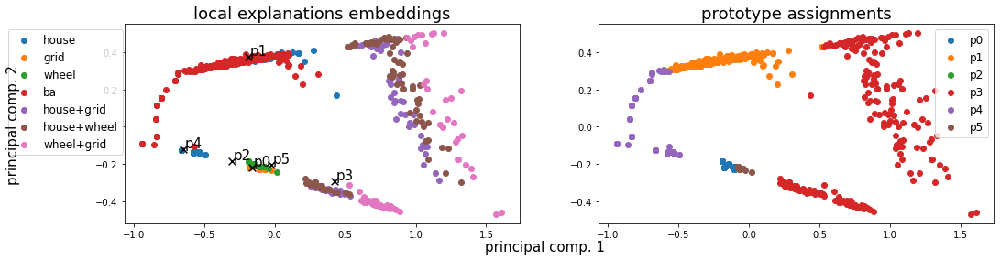

Alpha norms:
tensor([[0.0917, 0.0566, 0.0905, 1.0000, 0.0653, 0.1235],
        [0.5806, 0.2292, 0.3772, 1.0000, 0.4871, 0.4984]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.606218 +- 0.178631
Concept distribution:  (array([0, 1, 3, 4, 5], dtype=int64), array([272, 227, 240, 141,  32], dtype=int64))
Logic formulas:
For class 0:
0.9204244031830239 (feature000) | (feature004) | ((feature001) | (feature005)
For class 1:
0.9204244031830239 (feature003) | (feature004 & feature000) | (feature005 & feature000) | (feature004 & feature005)
Accuracy as classifier:  0.9204
LEN fidelity:  tensor(0.9204)


300: Loss: 0.01925, LEN: 0.018882, AccxC: 0.93, AccO: 0.93, V. Acc: 0.93, V. Loss: 0.03110, V. LEN 0.03
301: Loss: 0.01914, LEN: 0.018788, AccxC: 0.94, AccO: 0.94, V. Acc: 0.94, V. Loss: 0.02553, V. LEN 0.02
302: Loss: 0.01858, LEN: 0.018170, AccxC: 0.93, AccO: 0.93, V. Acc: 0.99, V. Loss: 0.01611, V. LEN 0.02
303: Loss: 0.01986, LEN: 0.019513, AccxC: 0.92, AccO: 0.92, V. Acc: 0.94, V. Loss:

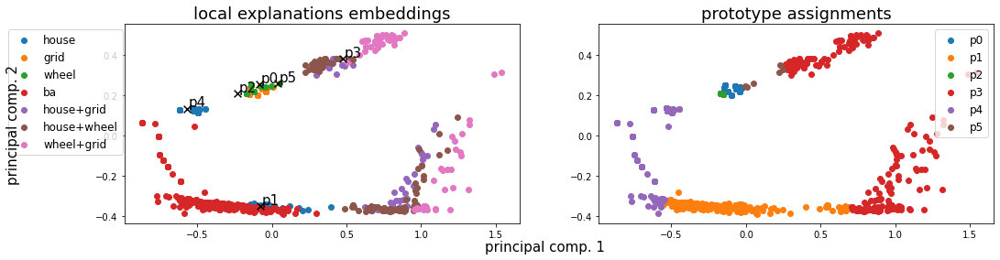

Alpha norms:
tensor([[0.1023, 0.0545, 0.0950, 1.0000, 0.0692, 0.1317],
        [0.6106, 0.2252, 0.3770, 1.0000, 0.4941, 0.5158]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.550010 +- 0.140782
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([272, 228,  29, 216, 161,   6], dtype=int64))
Logic formulas:
For class 0:
0.8872679045092838 (feature000) | (feature004) | (feature002) | ((feature001) | (feature005)
For class 1:
0.8872679045092838 (feature003) | (feature004 & feature000) | (feature002 & feature004) | (feature002 & feature000) | (feature005 & feature000) | (feature002 & feature005)
Accuracy as classifier:  0.8873
LEN fidelity:  tensor(0.8873)


320: Loss: 0.01881, LEN: 0.018389, AccxC: 0.95, AccO: 0.95, V. Acc: 0.93, V. Loss: 0.02857, V. LEN 0.03
321: Loss: 0.01945, LEN: 0.019070, AccxC: 0.93, AccO: 0.93, V. Acc: 0.99, V. Loss: 0.01634, V. LEN 0.02
322: Loss: 0.01831, LEN: 0.017965, AccxC: 0.94, AccO: 0.94, V. Acc: 0.94, V. Loss: 0.02974, V. LEN 0.03
323

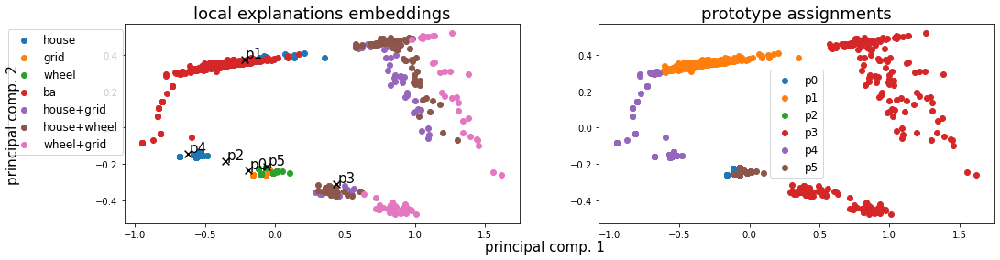

Alpha norms:
tensor([[0.0974, 0.0488, 0.0939, 1.0000, 0.0669, 0.1385],
        [0.6139, 0.2179, 0.3682, 1.0000, 0.4849, 0.5171]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.653838 +- 0.171389
Concept distribution:  (array([0, 1, 3, 4, 5], dtype=int64), array([ 55, 221, 240, 147, 249], dtype=int64))
Logic formulas:
For class 0:
0.9204244031830239 (feature005) | (feature004) | ((feature001) | (feature000)
For class 1:
0.9204244031830239 (feature003) | (feature004 & feature005) | (feature004 & feature000) | (feature005 & feature000)
Accuracy as classifier:  0.9204
LEN fidelity:  tensor(0.9204)


340: Loss: 0.02036, LEN: 0.019967, AccxC: 0.92, AccO: 0.92, V. Acc: 1.00, V. Loss: 0.01557, V. LEN 0.01
341: Loss: 0.01927, LEN: 0.018917, AccxC: 0.92, AccO: 0.92, V. Acc: 0.99, V. Loss: 0.01781, V. LEN 0.02
342: Loss: 0.01839, LEN: 0.018064, AccxC: 0.93, AccO: 0.93, V. Acc: 0.98, V. Loss: 0.01837, V. LEN 0.02
343: Loss: 0.01891, LEN: 0.018592, AccxC: 0.92, AccO: 0.92, V. Acc: 1.00, V. Loss:

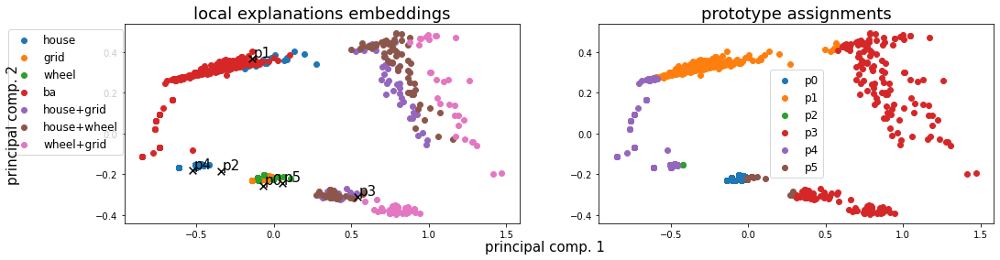

Alpha norms:
tensor([[0.0845, 0.0410, 0.0777, 1.0000, 0.0549, 0.1225],
        [0.6079, 0.2024, 0.3163, 1.0000, 0.4591, 0.4935]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.748710 +- 0.201880
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([213, 225,   2, 230, 148,  94], dtype=int64))
Logic formulas:
For class 0:
0.946949602122016 (feature000) | (feature004) | (feature005) | ((feature001) | (feature002)
For class 1:
0.946949602122016 (feature003) | (feature004 & feature000) | (feature005 & feature000) | (feature004 & feature005)
Accuracy as classifier:  0.9469
LEN fidelity:  tensor(0.9469)


360: Loss: 0.01936, LEN: 0.019089, AccxC: 0.93, AccO: 0.93, V. Acc: 0.98, V. Loss: 0.01722, V. LEN 0.02
361: Loss: 0.01820, LEN: 0.017937, AccxC: 0.92, AccO: 0.92, V. Acc: 0.99, V. Loss: 0.01293, V. LEN 0.01
362: Loss: 0.01521, LEN: 0.014969, AccxC: 0.93, AccO: 0.93, V. Acc: 0.94, V. Loss: 0.02422, V. LEN 0.02
363: Loss: 0.01867, LEN: 0.018434, AccxC: 0.94, AccO: 0.94, V

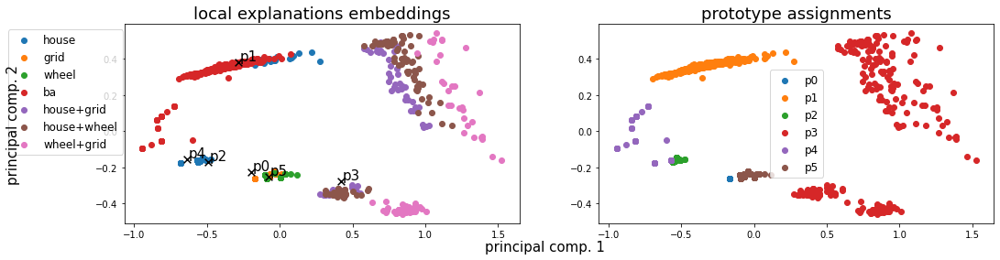

Alpha norms:
tensor([[0.0715, 0.0358, 0.0682, 1.0000, 0.0485, 0.1149],
        [0.5993, 0.1927, 0.2800, 1.0000, 0.4350, 0.4836]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.743578 +- 0.236554
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([ 41, 236,  51, 240,  81, 263], dtype=int64))
Logic formulas:
For class 0:
0.916445623342175 (feature005) | (feature004) | (feature002) | ((feature001) | (feature000)
For class 1:
0.916445623342175 (feature003) | (feature002 & feature005) | (feature004 & feature000) | (feature004 & feature005) | (feature002 & feature000) | (feature005 & feature000)
Accuracy as classifier:  0.9164
LEN fidelity:  tensor(0.9164)


380: Loss: 0.01676, LEN: 0.016510, AccxC: 0.92, AccO: 0.92, V. Acc: 1.00, V. Loss: 0.01439, V. LEN 0.01
381: Loss: 0.01819, LEN: 0.017921, AccxC: 0.92, AccO: 0.92, V. Acc: 0.99, V. Loss: 0.01428, V. LEN 0.01
382: Loss: 0.01571, LEN: 0.015499, AccxC: 0.93, AccO: 0.93, V. Acc: 1.00, V. Loss: 0.00939, V. LEN 0.01
383: 

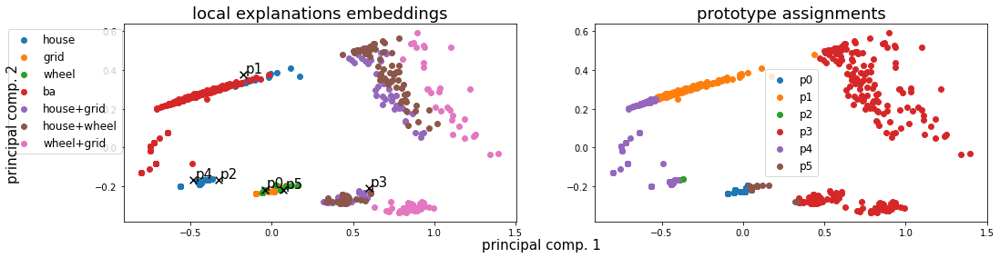

Alpha norms:
tensor([[0.0771, 0.0369, 0.0714, 1.0000, 0.0504, 0.1238],
        [0.6403, 0.1996, 0.2816, 1.0000, 0.4505, 0.5081]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.707037 +- 0.206737
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([198, 187,   7, 237, 175, 108], dtype=int64))
Logic formulas:
For class 0:
0.9509283819628647 (feature000) | (feature004) | (feature005) | ((feature001) | (feature002)
For class 1:
0.9509283819628647 (feature003) | (feature004 & feature000) | (feature005 & feature000) | (feature004 & feature005) | (feature002 & feature005)
Accuracy as classifier:  0.9509
LEN fidelity:  tensor(0.9509)


400: Loss: 0.01780, LEN: 0.017574, AccxC: 0.92, AccO: 0.92, V. Acc: 0.98, V. Loss: 0.01677, V. LEN 0.02
401: Loss: 0.01589, LEN: 0.015645, AccxC: 0.94, AccO: 0.94, V. Acc: 1.00, V. Loss: 0.01080, V. LEN 0.01
402: Loss: 0.01579, LEN: 0.015539, AccxC: 0.93, AccO: 0.93, V. Acc: 0.99, V. Loss: 0.01405, V. LEN 0.01
403: Loss: 0.01676, LEN: 0.0165

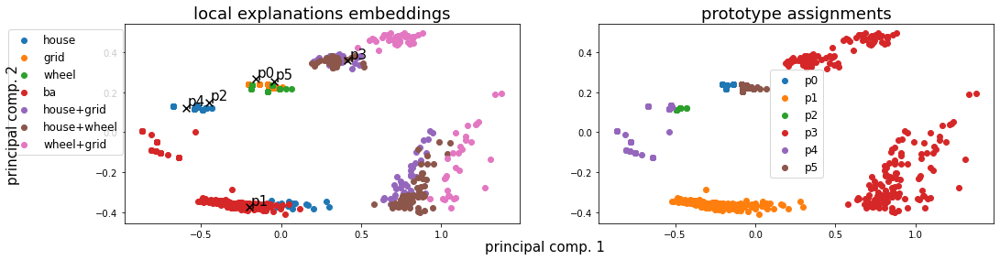

Alpha norms:
tensor([[0.0772, 0.0359, 0.0670, 1.0000, 0.0480, 0.1253],
        [0.6615, 0.1971, 0.2657, 1.0000, 0.4495, 0.5153]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.672395 +- 0.220517
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([114, 236,  17, 240, 115, 190], dtype=int64))
Logic formulas:
For class 0:
0.9350132625994695 (feature005) | (feature004) | (feature000) | ((feature001) | (feature002)
For class 1:
0.9350132625994695 (feature003) | (feature004 & feature005) | (feature004 & feature000) | (feature005 & feature000) | (feature002 & feature005) | (feature002 & feature000)
Accuracy as classifier:  0.935
LEN fidelity:  tensor(0.9350)


420: Loss: 0.01832, LEN: 0.018117, AccxC: 0.92, AccO: 0.92, V. Acc: 1.00, V. Loss: 0.01047, V. LEN 0.01
421: Loss: 0.01847, LEN: 0.018140, AccxC: 0.91, AccO: 0.91, V. Acc: 1.00, V. Loss: 0.01053, V. LEN 0.01
422: Loss: 0.01867, LEN: 0.018423, AccxC: 0.93, AccO: 0.93, V. Acc: 0.90, V. Loss: 0.03651, V. LEN 0.04
423:

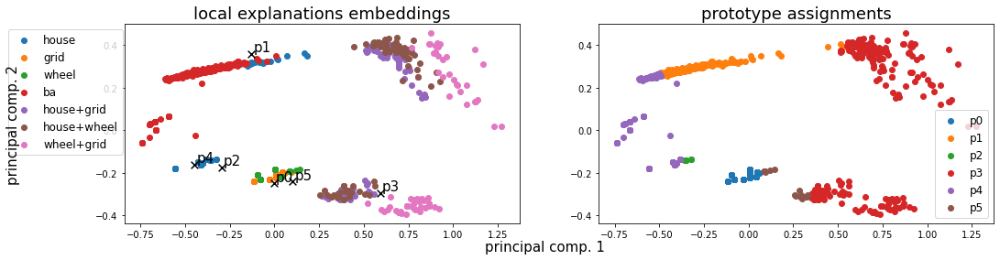

Alpha norms:
tensor([[0.0766, 0.0345, 0.0678, 1.0000, 0.0435, 0.1217],
        [0.6732, 0.1969, 0.2637, 1.0000, 0.4503, 0.5188]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.654628 +- 0.213877
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([288, 194,   9, 228, 168,  25], dtype=int64))
Logic formulas:
For class 0:
0.9005305039787799 (feature000) | (feature004) | (feature002) | ((feature001) | (feature005)
For class 1:
0.9005305039787799 (feature003) | (feature004 & feature000) | (feature002 & feature000) | (feature004 & feature005) | (feature005 & feature000)
Accuracy as classifier:  0.9005
LEN fidelity:  tensor(0.9005)


440: Loss: 0.01558, LEN: 0.015341, AccxC: 0.92, AccO: 0.92, V. Acc: 0.90, V. Loss: 0.03140, V. LEN 0.03
441: Loss: 0.01583, LEN: 0.015572, AccxC: 0.93, AccO: 0.93, V. Acc: 1.00, V. Loss: 0.01123, V. LEN 0.01
442: Loss: 0.01984, LEN: 0.019487, AccxC: 0.91, AccO: 0.91, V. Acc: 0.98, V. Loss: 0.02080, V. LEN 0.02
443: Loss: 0.01912, LEN: 0.0188

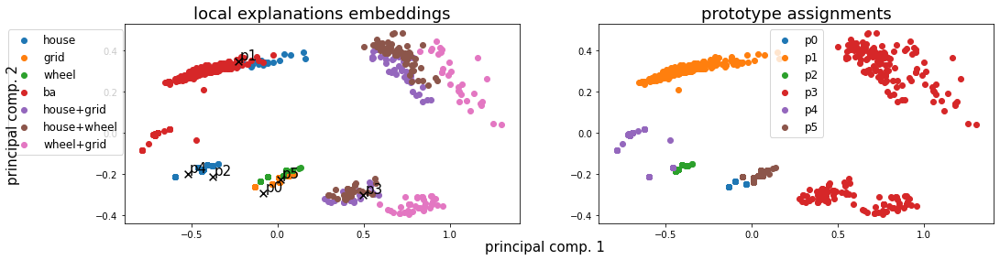

Alpha norms:
tensor([[0.0781, 0.0351, 0.0683, 1.0000, 0.0444, 0.1299],
        [0.7323, 0.2004, 0.2614, 1.0000, 0.4660, 0.5476]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.661972 +- 0.217187
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([100, 236,  51, 240,  81, 204], dtype=int64))
Logic formulas:
For class 0:
0.9310344827586207 (feature005) | (feature004) | (feature000) | ((feature001) | (feature002)
For class 1:
0.9310344827586207 (feature003) | (feature002 & feature005) | (feature004 & feature000) | (feature004 & feature005) | (feature002 & feature000) | (feature005 & feature000)
Accuracy as classifier:  0.931
LEN fidelity:  tensor(0.9310)


460: Loss: 0.01840, LEN: 0.018121, AccxC: 0.91, AccO: 0.91, V. Acc: 1.00, V. Loss: 0.01126, V. LEN 0.01
461: Loss: 0.01709, LEN: 0.016872, AccxC: 0.91, AccO: 0.91, V. Acc: 0.99, V. Loss: 0.01537, V. LEN 0.01
462: Loss: 0.01412, LEN: 0.013914, AccxC: 0.94, AccO: 0.94, V. Acc: 0.99, V. Loss: 0.01388, V. LEN 0.01
463:

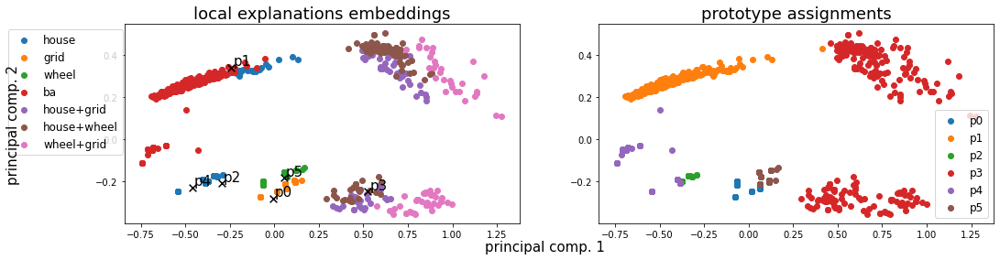

Alpha norms:
tensor([[0.0708, 0.0328, 0.0626, 1.0000, 0.0406, 0.1233],
        [0.7220, 0.1943, 0.2438, 1.0000, 0.4491, 0.5365]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.692049 +- 0.202557
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([149, 236,  36, 239,  97, 155], dtype=int64))
Logic formulas:
For class 0:
0.9456233421750663 (feature000) | (feature004) | (feature005) | ((feature001) | (feature002)
For class 1:
0.9456233421750663 (feature003) | (feature004 & feature005) | (feature004 & feature000) | (feature005 & feature000) | (feature002 & feature000) | (feature002 & feature005)
Accuracy as classifier:  0.9456
LEN fidelity:  tensor(0.9456)


480: Loss: 0.01582, LEN: 0.015583, AccxC: 0.92, AccO: 0.92, V. Acc: 1.00, V. Loss: 0.00780, V. LEN 0.01
481: Loss: 0.01570, LEN: 0.015462, AccxC: 0.93, AccO: 0.93, V. Acc: 1.00, V. Loss: 0.00766, V. LEN 0.01
482: Loss: 0.01324, LEN: 0.013028, AccxC: 0.94, AccO: 0.94, V. Acc: 1.00, V. Loss: 0.00747, V. LEN 0.01
483

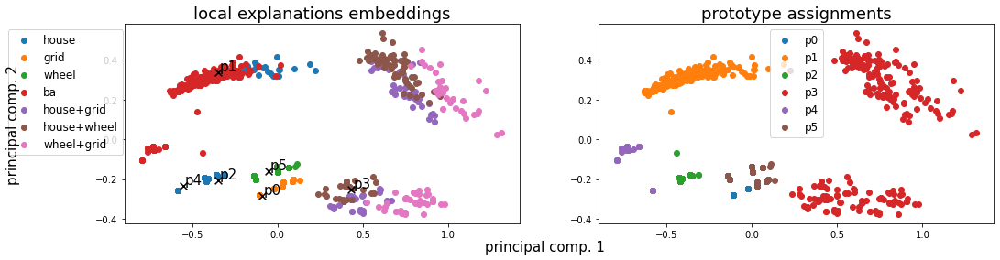

Alpha norms:
tensor([[0.0743, 0.0325, 0.0668, 1.0000, 0.0401, 0.1189],
        [0.7502, 0.1947, 0.2510, 1.0000, 0.4568, 0.5385]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.745506 +- 0.232366
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([ 56, 235,  71, 240,  61, 249], dtype=int64))
Logic formulas:
For class 0:
0.9230769230769231 (feature005) | (feature004) | (feature002) | ((feature001) | (feature000)
For class 1:
0.9230769230769231 (feature003) | (feature002 & feature005) | (feature004 & feature000) | (feature002 & feature000) | (feature005 & feature000) | (feature004 & feature005)
Accuracy as classifier:  0.9231
LEN fidelity:  tensor(0.9231)


500: Loss: 0.01825, LEN: 0.018002, AccxC: 0.93, AccO: 0.93, V. Acc: 1.00, V. Loss: 0.01215, V. LEN 0.01
501: Loss: 0.01439, LEN: 0.014154, AccxC: 0.93, AccO: 0.93, V. Acc: 1.00, V. Loss: 0.01219, V. LEN 0.01
502: Loss: 0.01455, LEN: 0.014345, AccxC: 0.92, AccO: 0.92, V. Acc: 1.00, V. Loss: 0.00882, V. LEN 0.01
503

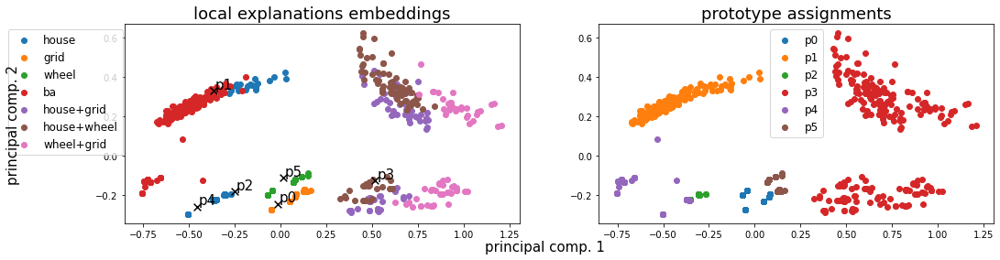

Alpha norms:
tensor([[0.0687, 0.0315, 0.0655, 1.0000, 0.0382, 0.1236],
        [0.7436, 0.1953, 0.2502, 1.0000, 0.4600, 0.5532]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.741624 +- 0.195884
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([189, 235,  36, 240,  97, 115], dtype=int64))
Logic formulas:
For class 0:
0.9562334217506632 (feature000) | (feature004) | (feature005) | ((feature001) | (feature002)
For class 1:
0.9562334217506632 (feature003) | (feature004 & feature000) | (feature005 & feature000) | (feature002 & feature000) | (feature002 & feature005) | (feature004 & feature005)
Accuracy as classifier:  0.9562
LEN fidelity:  tensor(0.9562)


520: Loss: 0.01464, LEN: 0.014457, AccxC: 0.93, AccO: 0.93, V. Acc: 1.00, V. Loss: 0.00707, V. LEN 0.01
521: Loss: 0.01329, LEN: 0.013096, AccxC: 0.94, AccO: 0.94, V. Acc: 1.00, V. Loss: 0.00711, V. LEN 0.01
522: Loss: 0.01458, LEN: 0.014432, AccxC: 0.93, AccO: 0.93, V. Acc: 1.00, V. Loss: 0.00705, V. LEN 0.01
523

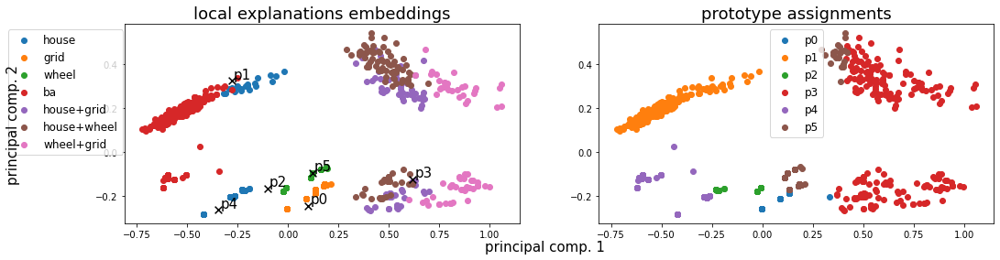

Alpha norms:
tensor([[0.0705, 0.0314, 0.0693, 1.0000, 0.0389, 0.1214],
        [0.7549, 0.1954, 0.2580, 1.0000, 0.4650, 0.5518]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.708870 +- 0.216539
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([ 92, 235,  75, 218, 116, 176], dtype=int64))
Logic formulas:
For class 0:
0.9297082228116711 (feature000) | (feature004) | (feature005) | ((feature001) | (feature002)
For class 1:
0.9297082228116711 (feature003) | (feature004 & feature005) | (feature004 & feature000) | (feature005 & feature000) | (feature002 & feature000) | (feature002 & feature005) | (feature002 & feature004)
Accuracy as classifier:  0.9297
LEN fidelity:  tensor(0.9297)


540: Loss: 0.01625, LEN: 0.016063, AccxC: 0.92, AccO: 0.92, V. Acc: 0.97, V. Loss: 0.01172, V. LEN 0.01
541: Loss: 0.01296, LEN: 0.012747, AccxC: 0.94, AccO: 0.94, V. Acc: 1.00, V. Loss: 0.00721, V. LEN 0.01
542: Loss: 0.01327, LEN: 0.013087, AccxC: 0.94, AccO: 0.94, V. Acc: 1.00, V. Lo

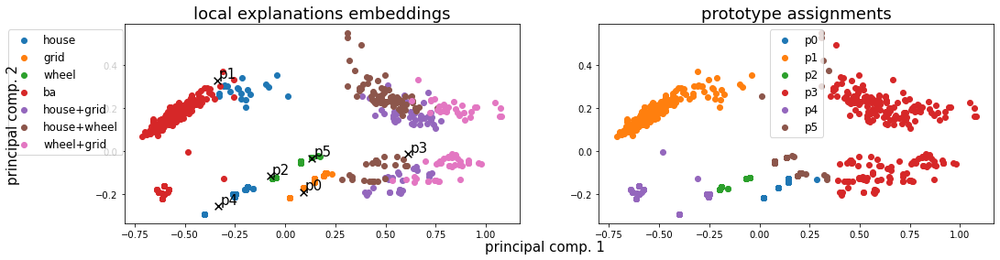

Alpha norms:
tensor([[0.0684, 0.0300, 0.0706, 1.0000, 0.0373, 0.1153],
        [0.7411, 0.1959, 0.2595, 1.0000, 0.4595, 0.5445]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.750861 +- 0.194783
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([132, 234,  75, 231, 116, 124], dtype=int64))
Logic formulas:
For class 0:
0.9641909814323607 (feature000) | (feature004) | (feature005) | ((feature001) | (feature002)
For class 1:
0.9641909814323607 (feature003) | (feature004 & feature000) | (feature005 & feature000) | (feature002 & feature000) | (feature004 & feature005) | (feature002 & feature005) | (feature002 & feature004)
Accuracy as classifier:  0.9642
LEN fidelity:  tensor(0.9642)


560: Loss: 0.01395, LEN: 0.013794, AccxC: 0.93, AccO: 0.93, V. Acc: 0.97, V. Loss: 0.01153, V. LEN 0.01
561: Loss: 0.01297, LEN: 0.012830, AccxC: 0.93, AccO: 0.93, V. Acc: 0.96, V. Loss: 0.01398, V. LEN 0.01
562: Loss: 0.01381, LEN: 0.013656, AccxC: 0.93, AccO: 0.93, V. Acc: 0.99, V. Lo

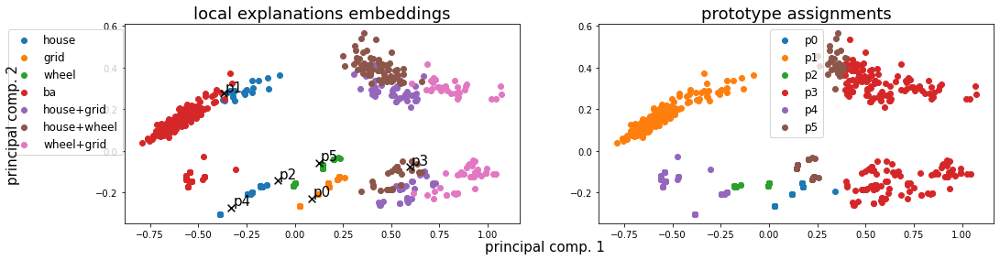

Alpha norms:
tensor([[0.0668, 0.0269, 0.0734, 1.0000, 0.0378, 0.1229],
        [0.7477, 0.2012, 0.2657, 1.0000, 0.4363, 0.5682]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.730064 +- 0.207561
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([132, 235,  75, 214, 116, 140], dtype=int64))
Logic formulas:
For class 0:
0.9416445623342176 (feature000) | (feature004) | (feature005) | ((feature001) | (feature002)
For class 1:
0.9416445623342176 (feature003) | (feature004 & feature000) | (feature005 & feature000) | (feature002 & feature000) | (feature004 & feature005) | (feature002 & feature005) | (feature002 & feature004)
Accuracy as classifier:  0.9416
LEN fidelity:  tensor(0.9416)


580: Loss: 0.01350, LEN: 0.013311, AccxC: 0.92, AccO: 0.92, V. Acc: 0.97, V. Loss: 0.01104, V. LEN 0.01
581: Loss: 0.01444, LEN: 0.014221, AccxC: 0.93, AccO: 0.93, V. Acc: 0.99, V. Loss: 0.00901, V. LEN 0.01
582: Loss: 0.01491, LEN: 0.014698, AccxC: 0.93, AccO: 0.93, V. Acc: 0.98, V. Lo

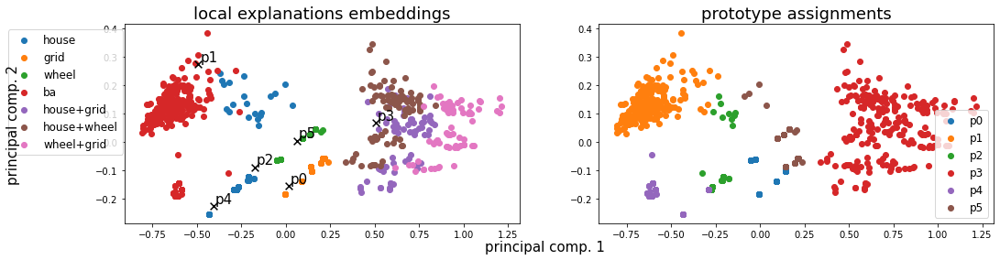

Alpha norms:
tensor([[0.0694, 0.0239, 0.0724, 1.0000, 0.0380, 0.1262],
        [0.7678, 0.2072, 0.2636, 1.0000, 0.4314, 0.5796]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.683148 +- 0.210380
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([149, 222,  61, 240,  81, 159], dtype=int64))
Logic formulas:
For class 0:
0.946949602122016 (feature000) | (feature004) | (feature005) | ((feature001) | (feature002)
For class 1:
0.946949602122016 (feature003) | (feature002 & feature005) | (feature004 & feature000) | (feature004 & feature005) | (feature005 & feature000) | (feature002 & feature000)
Accuracy as classifier:  0.9469
LEN fidelity:  tensor(0.9469)


600: Loss: 0.01321, LEN: 0.013050, AccxC: 0.93, AccO: 0.93, V. Acc: 1.00, V. Loss: 0.00578, V. LEN 0.01
601: Loss: 0.01749, LEN: 0.017286, AccxC: 0.91, AccO: 0.91, V. Acc: 0.84, V. Loss: 0.02848, V. LEN 0.03
602: Loss: 0.01569, LEN: 0.015456, AccxC: 0.92, AccO: 0.92, V. Acc: 1.00, V. Loss: 0.00595, V. LEN 0.01
603: 

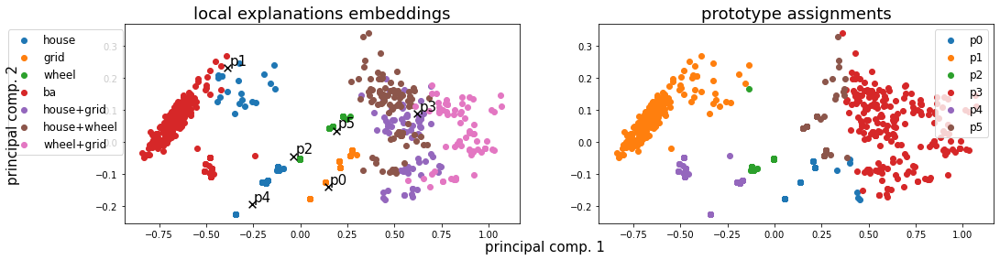

Alpha norms:
tensor([[0.0660, 0.0145, 0.0708, 1.0000, 0.0309, 0.1234],
        [0.7479, 0.2047, 0.2568, 1.0000, 0.3832, 0.5712]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.740053 +- 0.189495
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([137, 235,  76, 222, 115, 127], dtype=int64))
Logic formulas:
For class 0:
0.9522546419098143 (feature000) | (feature004) | (feature005) | ((feature001) | (feature002)
For class 1:
0.9522546419098143 (feature003) | (feature004 & feature000) | (feature005 & feature000) | (feature002 & feature000) | (feature004 & feature005) | (feature002 & feature005) | (feature002 & feature004)
Accuracy as classifier:  0.9523
LEN fidelity:  tensor(0.9523)


620: Loss: 0.01324, LEN: 0.013046, AccxC: 0.93, AccO: 0.93, V. Acc: 0.97, V. Loss: 0.01271, V. LEN 0.01
621: Loss: 0.01181, LEN: 0.011649, AccxC: 0.94, AccO: 0.94, V. Acc: 0.98, V. Loss: 0.01168, V. LEN 0.01
622: Loss: 0.01316, LEN: 0.012938, AccxC: 0.94, AccO: 0.94, V. Acc: 0.96, V. Lo

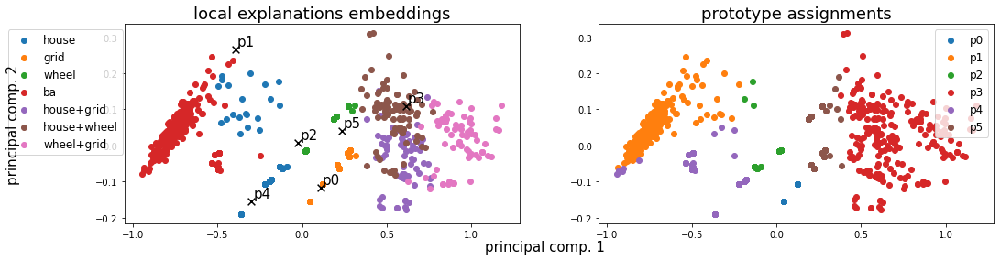

Alpha norms:
tensor([[0.0668, 0.0102, 0.0716, 1.0000, 0.0308, 0.1291],
        [0.7520, 0.2054, 0.2597, 1.0000, 0.3650, 0.5886]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.708224 +- 0.216899
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([ 56, 225,  78, 235, 123, 195], dtype=int64))
Logic formulas:
For class 0:
0.9429708222811671 (feature004) | (feature002) | ((feature001) | (feature000)
For class 1:
0.9429708222811671 (feature003) | (feature005) | (feature004 & feature005) | (feature004 & feature000) | (feature002 & feature005) | (feature005 & feature000) | (feature002 & feature004) | (feature002 & feature000)
Accuracy as classifier:  0.943
LEN fidelity:  tensor(0.9430)


640: Loss: 0.01253, LEN: 0.012317, AccxC: 0.93, AccO: 0.93, V. Acc: 0.95, V. Loss: 0.01127, V. LEN 0.01
641: Loss: 0.01230, LEN: 0.012094, AccxC: 0.94, AccO: 0.94, V. Acc: 0.95, V. Loss: 0.01121, V. LEN 0.01
642: Loss: 0.01350, LEN: 0.013278, AccxC: 0.92, AccO: 0.92, V. Acc: 0.98, V. Los

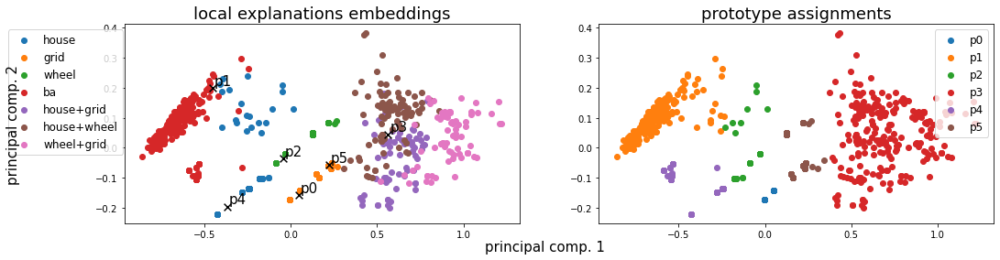

Alpha norms:
tensor([[0.0626, 0.0085, 0.0728, 1.0000, 0.0332, 0.1361],
        [0.7472, 0.2059, 0.2651, 1.0000, 0.3611, 0.6084]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.707697 +- 0.215756
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([ 56, 228,  83, 238, 115, 192], dtype=int64))
Logic formulas:
For class 0:
0.9429708222811671 (feature004) | (feature002) | ((feature001) | (feature000)
For class 1:
0.9429708222811671 (feature003) | (feature005) | (feature004 & feature005) | (feature004 & feature000) | (feature002 & feature005) | (feature005 & feature000) | (feature002 & feature004) | (feature002 & feature000)
Accuracy as classifier:  0.943
LEN fidelity:  tensor(0.9430)


660: Loss: 0.01432, LEN: 0.014046, AccxC: 0.92, AccO: 0.92, V. Acc: 0.95, V. Loss: 0.01124, V. LEN 0.01
661: Loss: 0.01150, LEN: 0.011274, AccxC: 0.94, AccO: 0.94, V. Acc: 0.97, V. Loss: 0.02087, V. LEN 0.02
662: Loss: 0.01231, LEN: 0.012092, AccxC: 0.94, AccO: 0.94, V. Acc: 0.95, V. Los

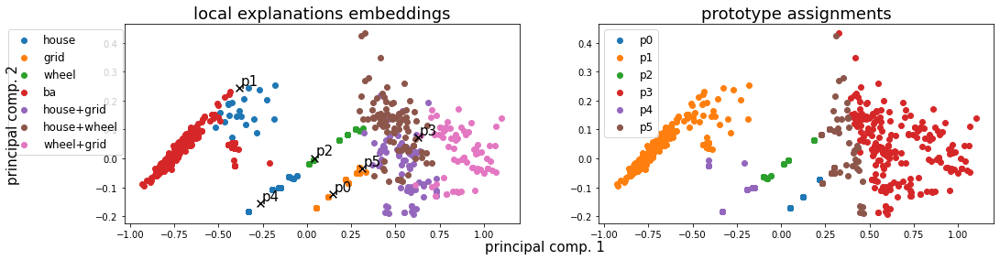

Alpha norms:
tensor([[0.0536, 0.0070, 0.0697, 1.0000, 0.0336, 0.1226],
        [0.7014, 0.1976, 0.2567, 1.0000, 0.3396, 0.5718]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.768327 +- 0.236061
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([ 96, 264, 144, 208,  87, 113], dtype=int64))
Logic formulas:
For class 0:
0.9761273209549072 (feature002) | (feature000) | ((feature001) | ((feature001 & feature004) | (feature004)
For class 1:
0.9761273209549072 (feature005) | (feature003) | (feature004 & feature000) | (feature002 & feature005) | (feature002 & feature000) | (feature004 & feature005) | (feature002 & feature004) | (feature005 & feature000)
Accuracy as classifier:  0.9761
LEN fidelity:  tensor(0.9761)


680: Loss: 0.01193, LEN: 0.011782, AccxC: 0.94, AccO: 0.94, V. Acc: 0.95, V. Loss: 0.01624, V. LEN 0.02
681: Loss: 0.00975, LEN: 0.009570, AccxC: 0.95, AccO: 0.95, V. Acc: 0.95, V. Loss: 0.01170, V. LEN 0.01
682: Loss: 0.01157, LEN: 0.011423, AccxC: 0.94, Ac

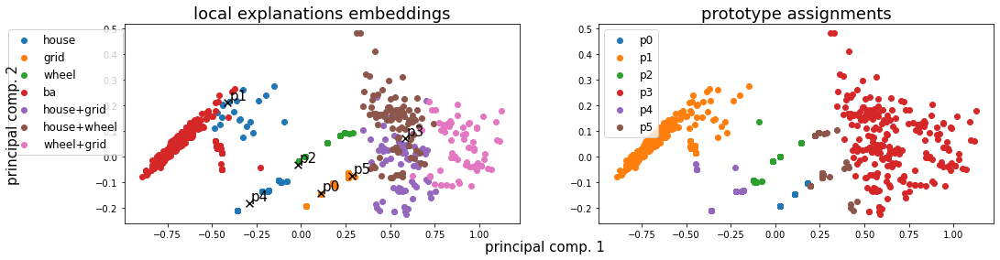

Alpha norms:
tensor([[0.0507, 0.0065, 0.0715, 1.0000, 0.0361, 0.1234],
        [0.7052, 0.1998, 0.2612, 1.0000, 0.3388, 0.5744]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.793903 +- 0.207536
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([ 96, 263, 145, 231,  87,  90], dtype=int64))
Logic formulas:
For class 0:
0.9761273209549072 (feature002) | (feature000) | ((feature001) | ((feature001 & feature004) | (feature004)
For class 1:
0.9761273209549072 (feature005) | (feature003) | (feature004 & feature000) | (feature002 & feature005) | (feature002 & feature000) | (feature004 & feature005) | (feature002 & feature004) | (feature005 & feature000)
Accuracy as classifier:  0.9761
LEN fidelity:  tensor(0.9761)


700: Loss: 0.01176, LEN: 0.011581, AccxC: 0.94, AccO: 0.94, V. Acc: 0.95, V. Loss: 0.01397, V. LEN 0.01
701: Loss: 0.01177, LEN: 0.011568, AccxC: 0.93, AccO: 0.93, V. Acc: 0.98, V. Loss: 0.01152, V. LEN 0.01
Early Stopping
Loading model at epoch 600
Best epo

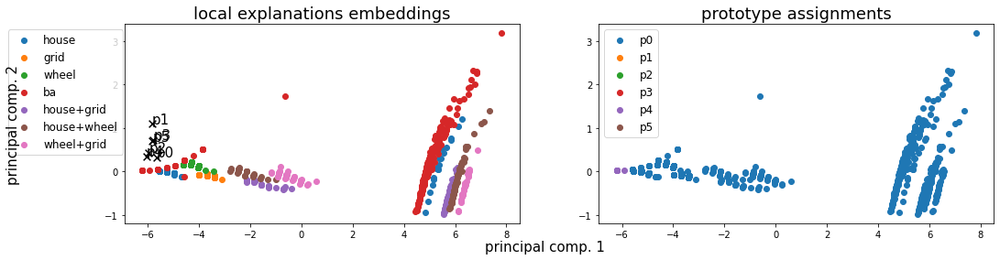

Alpha norms:
tensor([[0.8153, 0.7412, 1.0000, 0.9409, 0.6217, 0.7137],
        [0.9517, 0.9267, 0.9063, 0.9430, 1.0000, 0.9338]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.635210 +- 0.364790
Concept distribution:  (array([0, 4], dtype=int64), array([906,   6], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 0.39276, LEN: 0.265041, AccxC: 0.52, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.48409, V. LEN 0.35
  2: Loss: 0.34507, LEN: 0.264908, AccxC: 0.56, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.46222, V. LEN 0.35
  3: Loss: 0.33878, LEN: 0.264806, AccxC: 0.56, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.45638, V. LEN 0.35
  4: Loss: 0.33242, LEN: 0.264680, AccxC: 0.57, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.44369, V. LEN 0.35
  5: Loss: 0.31733, LEN: 0.264523, AccxC: 0.59, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.42067, V. LEN 0.35
  6: Loss: 0.30056, LEN: 0.264353, AccxC: 0.56, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.3

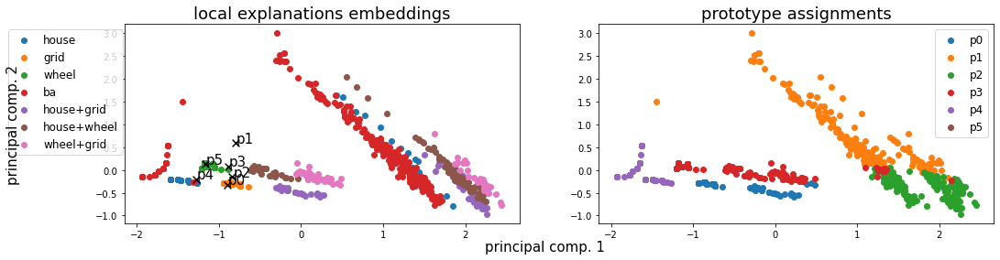

Alpha norms:
tensor([[0.7262, 0.6439, 0.7192, 1.0000, 0.5598, 0.5970],
        [0.8643, 0.9637, 0.7841, 1.0000, 0.9285, 0.8138]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.664558 +- 0.138798
Concept distribution:  (array([0, 1, 2, 3, 4], dtype=int64), array([186, 193, 171, 230, 132], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)


 20: Loss: 0.27350, LEN: 0.261009, AccxC: 0.61, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.37414, V. LEN 0.35
 21: Loss: 0.27216, LEN: 0.260528, AccxC: 0.63, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.37102, V. LEN 0.35
 22: Loss: 0.27140, LEN: 0.260114, AccxC: 0.62, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.36915, V. LEN 0.35
 23: Loss: 0.27115, LEN: 0.259957, AccxC: 0.63, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.36786, V. LEN 0.35
 24: Loss: 0.26985, LEN: 0.259687, AccxC: 0.60, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.36766, V. LEN 0.35
 25: Loss: 0.26956, LEN: 0.259481, AccxC: 0.61, AccO: 0.00, V

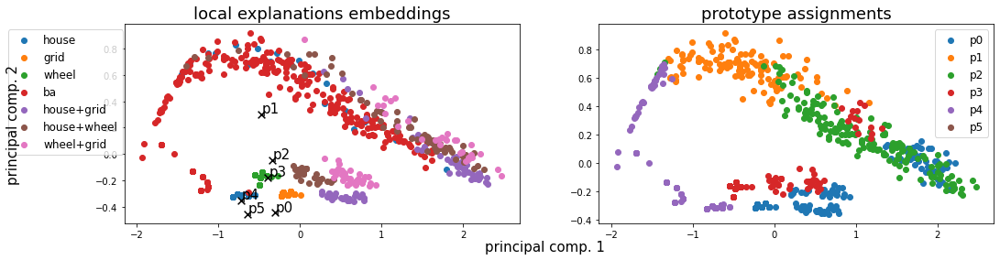

Alpha norms:
tensor([[0.5950, 0.3081, 0.2930, 1.0000, 0.4581, 0.5200],
        [0.5533, 0.7198, 0.4302, 1.0000, 0.4816, 0.4494]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.652602 +- 0.068322
Concept distribution:  (array([0, 1, 2, 3, 4], dtype=int64), array([260, 121, 162, 205, 164], dtype=int64))
Logic formulas:
For class 0:
0.6923076923076923 (feature001) | ((feature002)
For class 1:
0.6312997347480106 (feature003) | (feature000) | ((feature002) | (feature004 & feature000) | (feature000 & feature003) | (feature004 & feature003) | (feature004)

------------------------------------------------------------------------------------
Has double activations  tensor(162)
But only for wrong predictions

Accuracy as classifier:  0.5544
LEN fidelity:  tensor(0.5544)


------------------------------------------------------------------------------------
Has double activations  tensor(20)
But only for wrong predictions


 40: Loss: 0.26000, LEN: 0.253911, AccxC: 0.59, AccO: 0.51, V. Acc: 0.5

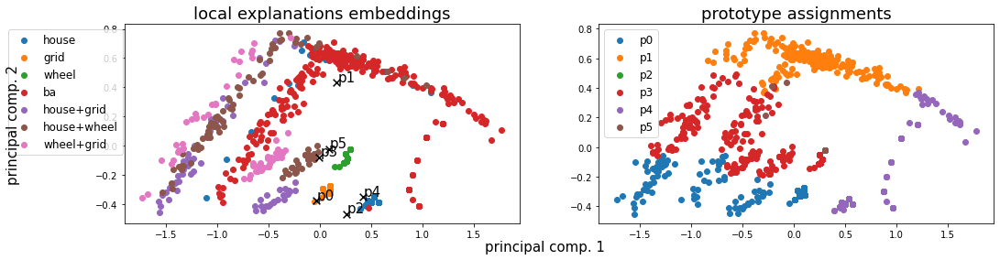

Alpha norms:
tensor([[0.6195, 0.1603, 0.1815, 1.0000, 0.1847, 0.4502],
        [0.5205, 0.5214, 0.2882, 1.0000, 0.3055, 0.2845]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.651203 +- 0.129900
Concept distribution:  (array([0, 1, 3, 4, 5], dtype=int64), array([245, 183, 314, 153,  17], dtype=int64))
Logic formulas:
For class 0:
0.6816976127320955 ((feature001)
For class 1:
0.7705570291777188 (feature003) | (feature000) | (feature004 & feature000) | (feature000 & feature003) | (feature004 & feature003) | ((feature005 & feature000) | ((feature005 & feature004)
Accuracy as classifier:  0.6804
LEN fidelity:  tensor(0.6804)


 60: Loss: 0.24849, LEN: 0.243965, AccxC: 0.64, AccO: 0.61, V. Acc: 0.69, V. Loss: 0.32597, V. LEN 0.31
 61: Loss: 0.24436, LEN: 0.240555, AccxC: 0.65, AccO: 0.61, V. Acc: 0.67, V. Loss: 0.32948, V. LEN 0.32
 62: Loss: 0.24407, LEN: 0.239777, AccxC: 0.66, AccO: 0.64, V. Acc: 0.70, V. Loss: 0.32220, V. LEN 0.31
 63: Loss: 0.24135, LEN: 0.237452, AccxC: 0.67, AccO: 

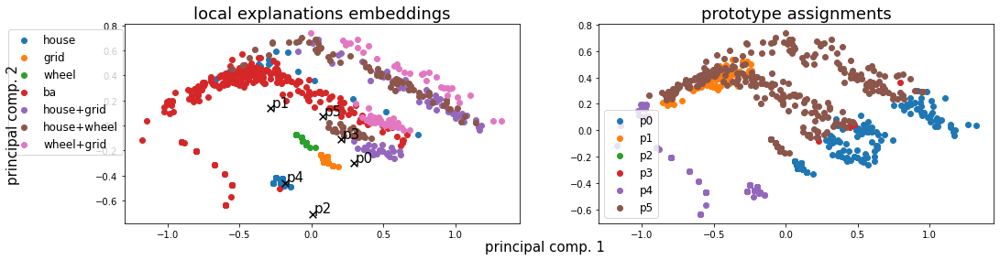

Alpha norms:
tensor([[0.5828, 0.1014, 0.0933, 1.0000, 0.0922, 0.3402],
        [0.5604, 0.6060, 0.2058, 1.0000, 0.1928, 0.2587]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.664985 +- 0.204014
Concept distribution:  (array([0, 1, 3, 4, 5], dtype=int64), array([277,  59,   5, 145, 426], dtype=int64))
Logic formulas:
For class 0:
0.6047745358090185 (feature001)
For class 1:
0.6737400530503979 (feature003) | (feature005) | (feature000) | (feature005 & feature000) | ((feature004 & feature000) | ((feature004 & feature005)
Accuracy as classifier:  0.6034
LEN fidelity:  tensor(0.6034)


 80: Loss: 0.22418, LEN: 0.220800, AccxC: 0.68, AccO: 0.64, V. Acc: 0.61, V. Loss: 0.32844, V. LEN 0.31
 81: Loss: 0.23186, LEN: 0.227974, AccxC: 0.65, AccO: 0.61, V. Acc: 0.77, V. Loss: 0.27787, V. LEN 0.27
 82: Loss: 0.21620, LEN: 0.212935, AccxC: 0.71, AccO: 0.68, V. Acc: 0.78, V. Loss: 0.26894, V. LEN 0.26
 83: Loss: 0.21277, LEN: 0.209455, AccxC: 0.74, AccO: 0.72, V. Acc: 0.79, V. Loss: 0.27272, V. L

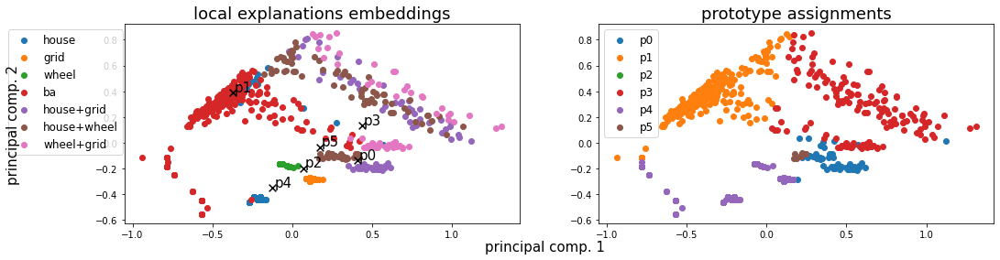

Alpha norms:
tensor([[0.4551, 0.0628, 0.0665, 1.0000, 0.0536, 0.1997],
        [0.4953, 0.6078, 0.1868, 1.0000, 0.1668, 0.1953]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.623914 +- 0.243498
Concept distribution:  (array([0, 1, 3, 4, 5], dtype=int64), array([ 59, 253, 158, 430,  12], dtype=int64))
Logic formulas:
For class 0:
0.7798408488063661 (feature001) | ((feature004 & feature001)
For class 1:
0.7241379310344828 (feature000) | (feature003) | (feature005)
Accuracy as classifier:  0.5716
LEN fidelity:  tensor(0.5716)


100: Loss: 0.19200, LEN: 0.189899, AccxC: 0.76, AccO: 0.69, V. Acc: 0.67, V. Loss: 0.22682, V. LEN 0.22
101: Loss: 0.18833, LEN: 0.186108, AccxC: 0.76, AccO: 0.68, V. Acc: 0.67, V. Loss: 0.23095, V. LEN 0.22
102: Loss: 0.18117, LEN: 0.178900, AccxC: 0.76, AccO: 0.71, V. Acc: 0.77, V. Loss: 0.22045, V. LEN 0.21
103: Loss: 0.17401, LEN: 0.171408, AccxC: 0.79, AccO: 0.75, V. Acc: 0.76, V. Loss: 0.22538, V. LEN 0.22
104: Loss: 0.16285, LEN: 0.160438, AccxC: 0.81, A

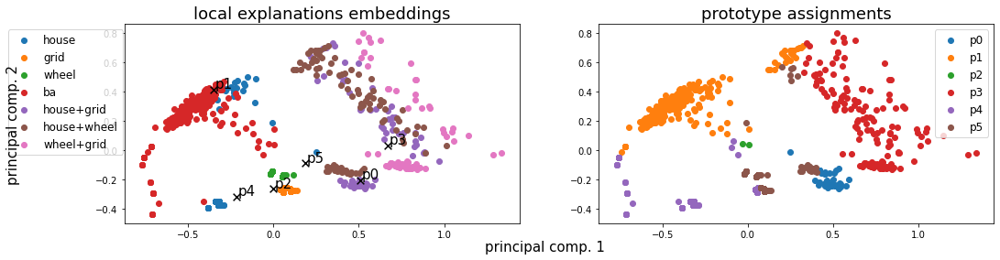

Alpha norms:
tensor([[0.2955, 0.0395, 0.0402, 1.0000, 0.0255, 0.0732],
        [0.4258, 0.5764, 0.1508, 1.0000, 0.1470, 0.1603]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.677236 +- 0.188752
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([ 44, 259,   2, 149, 190, 268], dtype=int64))
Logic formulas:
For class 0:
0.8063660477453581 (feature001) | ((feature004 & feature001)
For class 1:
0.830238726790451 (feature003) | ((feature004 & feature005) | (feature000)
Accuracy as classifier:  0.6698
LEN fidelity:  tensor(0.6698)


120: Loss: 0.13254, LEN: 0.131036, AccxC: 0.82, AccO: 0.79, V. Acc: 0.76, V. Loss: 0.17565, V. LEN 0.17
121: Loss: 0.13635, LEN: 0.134367, AccxC: 0.82, AccO: 0.72, V. Acc: 0.80, V. Loss: 0.15612, V. LEN 0.15
122: Loss: 0.13311, LEN: 0.131166, AccxC: 0.82, AccO: 0.75, V. Acc: 0.77, V. Loss: 0.14530, V. LEN 0.14
123: Loss: 0.12701, LEN: 0.125626, AccxC: 0.82, AccO: 0.73, V. Acc: 0.78, V. Loss: 0.13867, V. LEN 0.13
124: Loss: 0.11952, LEN: 0.1

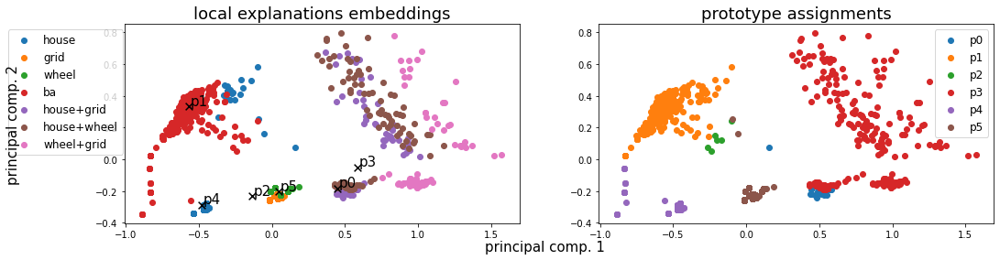

Alpha norms:
tensor([[0.2210, 0.0238, 0.0242, 1.0000, 0.0150, 0.0292],
        [0.3989, 0.5152, 0.1237, 1.0000, 0.1292, 0.1488]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.763701 +- 0.210834
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([ 33, 241,   6, 208, 118, 306], dtype=int64))
Logic formulas:
For class 0:
0.8793103448275862 (feature001) | ((feature004 & feature001) | ((feature004)
For class 1:
0.9005305039787799 (feature003) | (feature004 & feature005) | (feature000)
Accuracy as classifier:  0.7825
LEN fidelity:  tensor(0.7825)


140: Loss: 0.10082, LEN: 0.099976, AccxC: 0.87, AccO: 0.79, V. Acc: 0.82, V. Loss: 0.10943, V. LEN 0.11
141: Loss: 0.09974, LEN: 0.098812, AccxC: 0.87, AccO: 0.79, V. Acc: 0.79, V. Loss: 0.12909, V. LEN 0.13
142: Loss: 0.09128, LEN: 0.090533, AccxC: 0.87, AccO: 0.80, V. Acc: 0.82, V. Loss: 0.10709, V. LEN 0.10
143: Loss: 0.09720, LEN: 0.096455, AccxC: 0.87, AccO: 0.80, V. Acc: 0.81, V. Loss: 0.10921, V. LEN 0.11
144: Loss: 0

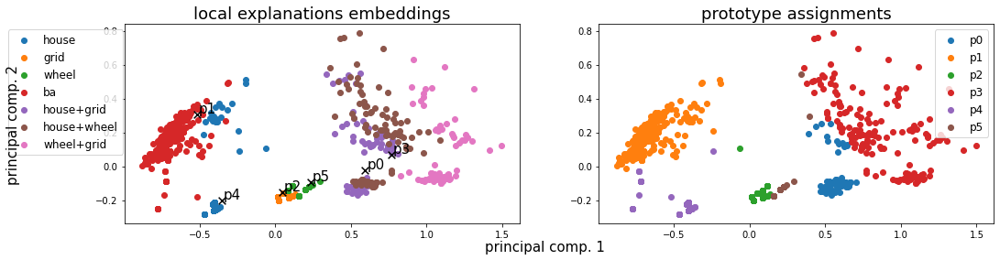

Alpha norms:
tensor([[0.2269, 0.0168, 0.0164, 1.0000, 0.0153, 0.0194],
        [0.4053, 0.4738, 0.1183, 1.0000, 0.1083, 0.1363]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.774779 +- 0.199126
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([ 72, 252, 177, 166, 115, 130], dtype=int64))
Logic formulas:
For class 0:
0.9323607427055703 (feature001) | (feature002) | ((feature004 & feature001) | ((feature004)
For class 1:
0.9748010610079576 (feature000) | (feature003) | (feature002 & feature005) | ((feature004 & feature002) | ((feature004 & feature005)
Accuracy as classifier:  0.9218
LEN fidelity:  tensor(0.9218)


160: Loss: 0.06947, LEN: 0.068918, AccxC: 0.91, AccO: 0.86, V. Acc: 0.94, V. Loss: 0.06801, V. LEN 0.07
161: Loss: 0.06523, LEN: 0.064577, AccxC: 0.94, AccO: 0.88, V. Acc: 0.80, V. Loss: 0.12216, V. LEN 0.12
162: Loss: 0.06640, LEN: 0.065827, AccxC: 0.93, AccO: 0.87, V. Acc: 0.93, V. Loss: 0.05970, V. LEN 0.06
163: Loss: 0.06446, LEN: 0.063996, AccxC: 0

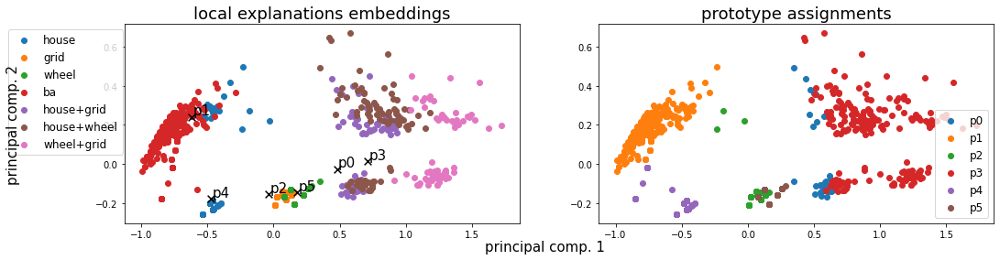

Alpha norms:
tensor([[0.2343, 0.0143, 0.0176, 1.0000, 0.0181, 0.0140],
        [0.4017, 0.4130, 0.1238, 1.0000, 0.1120, 0.1232]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.844971 +- 0.186268
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([ 36, 254, 156, 205, 111, 150], dtype=int64))
Logic formulas:
For class 0:
0.9907161803713528 (feature001) | (feature002) | ((feature005) | (feature001 & feature004) | (feature004)
For class 1:
0.9907161803713528 (feature003) | (feature000) | (feature005 & feature002) | ((feature004 & feature002) | ((feature004 & feature005) | (feature002 & feature000)
Accuracy as classifier:  0.9907
LEN fidelity:  tensor(0.9907)


180: Loss: 0.06020, LEN: 0.059641, AccxC: 0.94, AccO: 0.94, V. Acc: 1.00, V. Loss: 0.03984, V. LEN 0.04
181: Loss: 0.05168, LEN: 0.051005, AccxC: 0.95, AccO: 0.95, V. Acc: 0.99, V. Loss: 0.04584, V. LEN 0.04
182: Loss: 0.05490, LEN: 0.054346, AccxC: 0.96, AccO: 0.96, V. Acc: 1.00, V. Loss: 0.03986, V. LEN 0.04
1

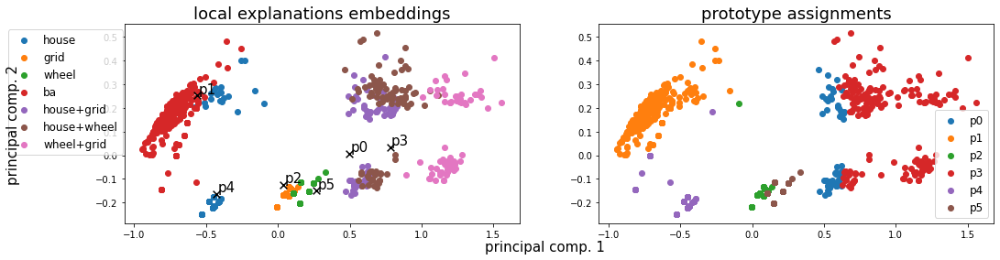

Alpha norms:
tensor([[0.1933, 0.0130, 0.0183, 1.0000, 0.0194, 0.0140],
        [0.3316, 0.3683, 0.1259, 1.0000, 0.1148, 0.1191]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.854377 +- 0.175237
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([ 58, 255, 154, 182, 112, 151], dtype=int64))
Logic formulas:
For class 0:
0.9907161803713528 (feature002) | (feature005) | ((feature001) | ((feature001 & feature004) | (feature004)
For class 1:
0.9907161803713528 (feature003) | (feature000) | (feature005 & feature002) | ((feature004 & feature002) | ((feature004 & feature005)
Accuracy as classifier:  0.9907
LEN fidelity:  tensor(0.9907)


200: Loss: 0.04748, LEN: 0.046855, AccxC: 0.96, AccO: 0.96, V. Acc: 1.00, V. Loss: 0.03150, V. LEN 0.03
201: Loss: 0.04356, LEN: 0.042942, AccxC: 0.97, AccO: 0.97, V. Acc: 0.99, V. Loss: 0.03908, V. LEN 0.04
202: Loss: 0.04368, LEN: 0.043213, AccxC: 0.96, AccO: 0.96, V. Acc: 1.00, V. Loss: 0.03135, V. LEN 0.03
203: Loss: 0.04285, LEN: 0.0

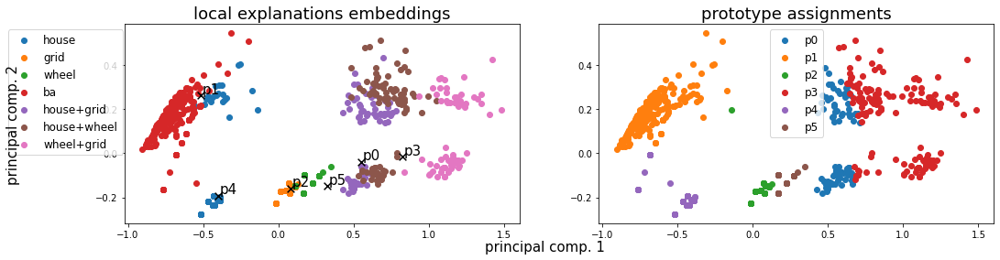

Alpha norms:
tensor([[0.1627, 0.0123, 0.0187, 1.0000, 0.0203, 0.0142],
        [0.3035, 0.3376, 0.1267, 1.0000, 0.1195, 0.1190]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.808871 +- 0.180598
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([ 93, 256, 168, 147, 111, 137], dtype=int64))
Logic formulas:
For class 0:
0.9814323607427056 (feature002) | (feature005) | ((feature001) | ((feature001 & feature004) | (feature004)
For class 1:
0.9814323607427056 (feature000) | (feature003) | (feature004 & feature002) | ((feature005 & feature002) | ((feature005 & feature004)
Accuracy as classifier:  0.9814
LEN fidelity:  tensor(0.9814)


220: Loss: 0.03704, LEN: 0.036492, AccxC: 0.97, AccO: 0.97, V. Acc: 1.00, V. Loss: 0.02623, V. LEN 0.03
221: Loss: 0.03569, LEN: 0.035176, AccxC: 0.97, AccO: 0.97, V. Acc: 0.99, V. Loss: 0.03518, V. LEN 0.03
222: Loss: 0.03411, LEN: 0.033607, AccxC: 0.97, AccO: 0.97, V. Acc: 1.00, V. Loss: 0.02365, V. LEN 0.02
223: Loss: 0.03687, LEN: 0.0

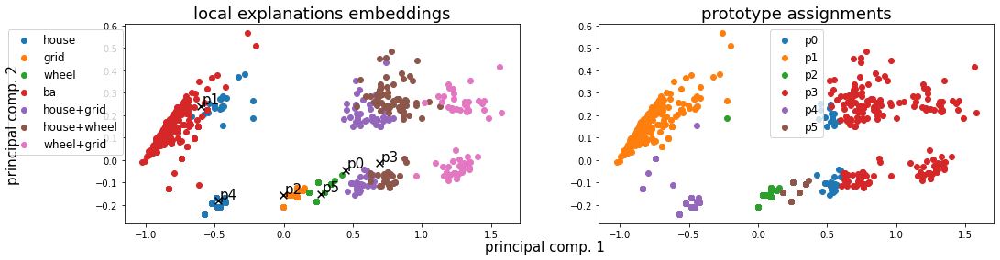

Alpha norms:
tensor([[0.1444, 0.0114, 0.0192, 1.0000, 0.0204, 0.0148],
        [0.2962, 0.3157, 0.1258, 1.0000, 0.1218, 0.1182]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.875918 +- 0.181021
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([ 40, 255, 154, 201, 112, 150], dtype=int64))
Logic formulas:
For class 0:
0.9907161803713528 (feature002) | (feature005) | ((feature001) | ((feature001 & feature004) | (feature004)
For class 1:
0.9907161803713528 (feature003) | (feature000) | (feature004 & feature002) | ((feature005 & feature002) | ((feature005 & feature004) | (feature002 & feature000)
Accuracy as classifier:  0.9907
LEN fidelity:  tensor(0.9907)


240: Loss: 0.04297, LEN: 0.042440, AccxC: 0.96, AccO: 0.96, V. Acc: 1.00, V. Loss: 0.02106, V. LEN 0.02
241: Loss: 0.03662, LEN: 0.036227, AccxC: 0.97, AccO: 0.97, V. Acc: 1.00, V. Loss: 0.02659, V. LEN 0.03
242: Loss: 0.03266, LEN: 0.032267, AccxC: 0.97, AccO: 0.97, V. Acc: 1.00, V. Loss: 0.02159, V. LEN 0.02


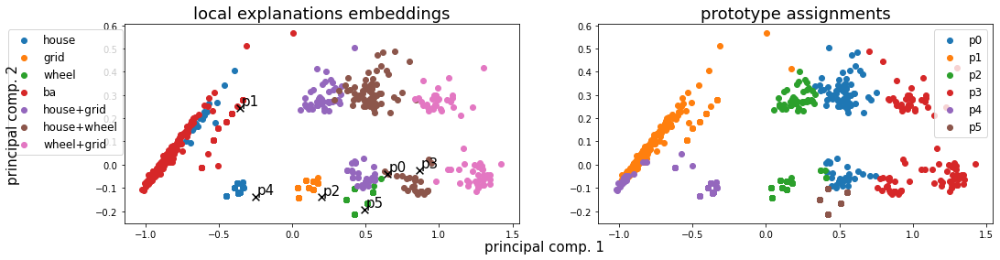

Alpha norms:
tensor([[0.1171, 0.0114, 0.0212, 1.0000, 0.0220, 0.0176],
        [0.2662, 0.3022, 0.1266, 1.0000, 0.1255, 0.1228]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.802463 +- 0.114336
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([ 94, 239, 200, 100, 130, 149], dtype=int64))
Logic formulas:
For class 0:
0.9270557029177718 (feature002) | (feature005) | ((feature001) | ((feature001 & feature004) | (feature004)
For class 1:
0.9270557029177718 (feature003) | (feature000) | (feature004 & feature002) | ((feature005 & feature002) | ((feature005 & feature004) | (feature002 & feature000)
Accuracy as classifier:  0.9271
LEN fidelity:  tensor(0.9271)


260: Loss: 0.06517, LEN: 0.064269, AccxC: 0.96, AccO: 0.96, V. Acc: 0.96, V. Loss: 0.06302, V. LEN 0.06
261: Loss: 0.03688, LEN: 0.036190, AccxC: 0.97, AccO: 0.97, V. Acc: 1.00, V. Loss: 0.02339, V. LEN 0.02
262: Loss: 0.04003, LEN: 0.039193, AccxC: 0.96, AccO: 0.96, V. Acc: 1.00, V. Loss: 0.02218, V. LEN 0.02


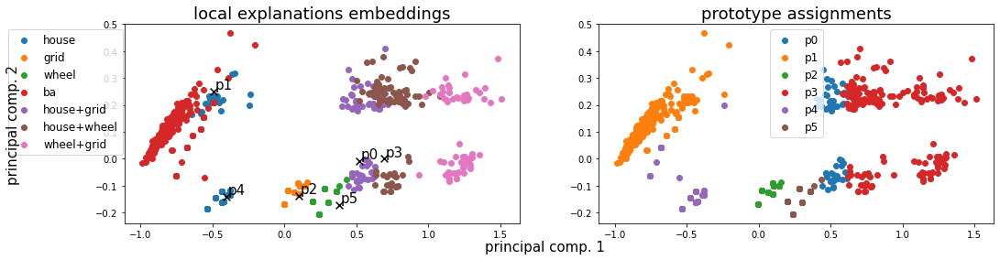

Alpha norms:
tensor([[0.0945, 0.0110, 0.0221, 1.0000, 0.0227, 0.0175],
        [0.2469, 0.2903, 0.1249, 1.0000, 0.1271, 0.1202]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.876347 +- 0.169071
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([ 56, 256, 153, 184, 112, 151], dtype=int64))
Logic formulas:
For class 0:
0.9907161803713528 (feature002) | (feature005) | ((feature001) | ((feature001 & feature004) | (feature004)
For class 1:
0.9907161803713528 (feature003) | (feature000) | (feature002 & feature004) | ((feature005 & feature002) | ((feature005 & feature004)
Accuracy as classifier:  0.9907
LEN fidelity:  tensor(0.9907)


280: Loss: 0.01994, LEN: 0.019556, AccxC: 0.99, AccO: 0.99, V. Acc: 1.00, V. Loss: 0.01731, V. LEN 0.02
281: Loss: 0.02622, LEN: 0.025818, AccxC: 0.99, AccO: 0.99, V. Acc: 1.00, V. Loss: 0.01869, V. LEN 0.02
282: Loss: 0.02622, LEN: 0.025841, AccxC: 0.98, AccO: 0.98, V. Acc: 1.00, V. Loss: 0.01838, V. LEN 0.02
283: Loss: 0.02433, LEN: 0.0

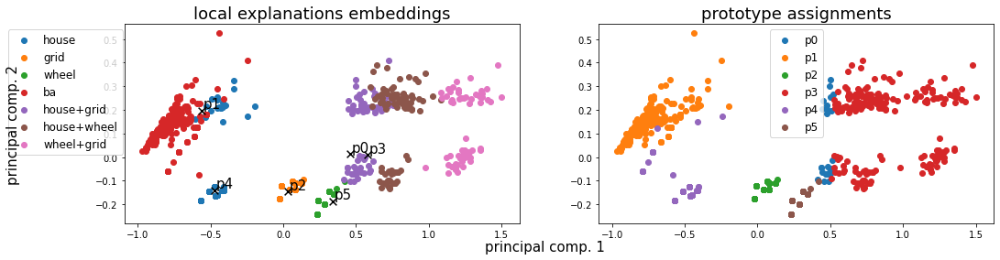

Alpha norms:
tensor([[0.0847, 0.0100, 0.0213, 1.0000, 0.0229, 0.0174],
        [0.2528, 0.2774, 0.1218, 1.0000, 0.1290, 0.1186]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.875850 +- 0.193266
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([ 28, 254, 153, 212, 114, 151], dtype=int64))
Logic formulas:
For class 0:
0.9907161803713528 (feature002) | (feature005) | ((feature001) | ((feature001 & feature004) | (feature004)
For class 1:
0.9907161803713528 (feature003) | (feature000) | (feature002 & feature004) | ((feature005 & feature002) | ((feature005 & feature004)
Accuracy as classifier:  0.9907
LEN fidelity:  tensor(0.9907)


300: Loss: 0.02101, LEN: 0.020616, AccxC: 0.99, AccO: 0.99, V. Acc: 1.00, V. Loss: 0.01462, V. LEN 0.01
301: Loss: 0.03536, LEN: 0.034961, AccxC: 0.97, AccO: 0.97, V. Acc: 1.00, V. Loss: 0.01880, V. LEN 0.02
302: Loss: 0.02473, LEN: 0.024329, AccxC: 0.98, AccO: 0.98, V. Acc: 1.00, V. Loss: 0.01380, V. LEN 0.01
303: Loss: 0.02785, LEN: 0.0

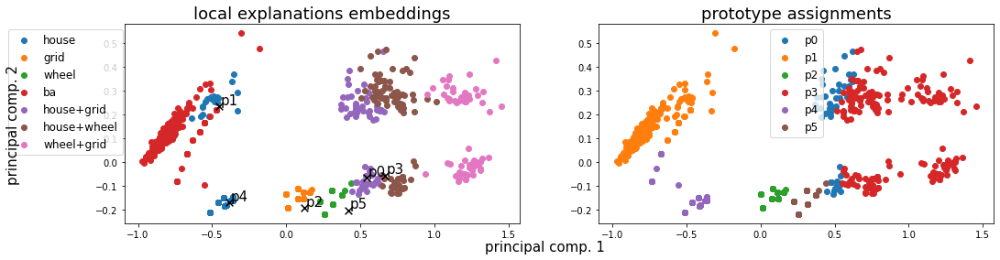

Alpha norms:
tensor([[0.0519, 0.0091, 0.0211, 1.0000, 0.0214, 0.0169],
        [0.2021, 0.2594, 0.1168, 1.0000, 0.1268, 0.1225]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.840621 +- 0.184825
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([ 56, 257, 153, 184, 111, 151], dtype=int64))
Logic formulas:
For class 0:
0.9907161803713528 (feature002) | (feature005) | ((feature001) | ((feature001 & feature004) | (feature004)
For class 1:
0.9907161803713528 (feature003) | (feature000) | ((feature002 & feature004) | ((feature002 & feature005) | (feature005 & feature004)
Accuracy as classifier:  0.9907
LEN fidelity:  tensor(0.9907)


320: Loss: 0.02822, LEN: 0.027722, AccxC: 0.98, AccO: 0.98, V. Acc: 1.00, V. Loss: 0.01745, V. LEN 0.02
321: Loss: 0.02450, LEN: 0.024018, AccxC: 0.98, AccO: 0.98, V. Acc: 1.00, V. Loss: 0.01807, V. LEN 0.02
322: Loss: 0.02621, LEN: 0.025802, AccxC: 0.98, AccO: 0.98, V. Acc: 1.00, V. Loss: 0.01667, V. LEN 0.02
323: Loss: 0.01927, LEN: 0.0

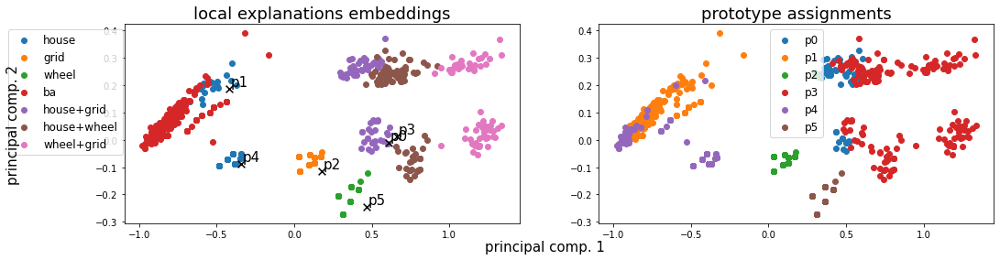

Alpha norms:
tensor([[0.0461, 0.0082, 0.0198, 1.0000, 0.0205, 0.0161],
        [0.2115, 0.2516, 0.1144, 1.0000, 0.1272, 0.1199]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.776976 +- 0.205125
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([ 54, 214, 156, 183, 154, 151], dtype=int64))
Logic formulas:
For class 0:
0.986737400530504 (feature002) | (feature005) | ((feature001) | ((feature001 & feature004) | (feature004)
For class 1:
0.986737400530504 (feature003) | (feature000) | ((feature002 & feature004) | ((feature002 & feature005) | (feature005 & feature004)
Accuracy as classifier:  0.9867
LEN fidelity:  tensor(0.9867)


340: Loss: 0.02121, LEN: 0.020643, AccxC: 0.98, AccO: 0.98, V. Acc: 1.00, V. Loss: 0.01828, V. LEN 0.02
341: Loss: 0.02414, LEN: 0.023655, AccxC: 0.98, AccO: 0.98, V. Acc: 1.00, V. Loss: 0.01469, V. LEN 0.01
342: Loss: 0.02557, LEN: 0.024996, AccxC: 0.98, AccO: 0.98, V. Acc: 1.00, V. Loss: 0.01132, V. LEN 0.01
343: Loss: 0.02308, LEN: 0.022

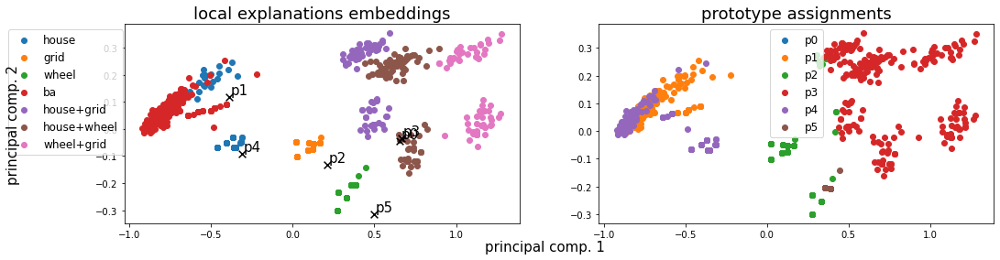

Alpha norms:
tensor([[0.0411, 0.0076, 0.0190, 1.0000, 0.0199, 0.0157],
        [0.2127, 0.2477, 0.1127, 1.0000, 0.1288, 0.1229]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.668745 +- 0.231589
Concept distribution:  (array([1, 2, 3, 4, 5], dtype=int64), array([169, 294, 227, 199,  23], dtype=int64))
Logic formulas:
For class 0:
0.9018567639257294 (feature002) | (feature004) | ((feature001) | ((feature001 & feature004) | (feature005)
For class 1:
0.9018567639257294 (feature003) | ((feature002 & feature004) | ((feature002 & feature005) | (feature005 & feature004)
Accuracy as classifier:  0.9019
LEN fidelity:  tensor(0.9019)


360: Loss: 0.02042, LEN: 0.020007, AccxC: 0.98, AccO: 0.98, V. Acc: 0.95, V. Loss: 0.07753, V. LEN 0.08
361: Loss: 0.02897, LEN: 0.028339, AccxC: 0.98, AccO: 0.98, V. Acc: 1.00, V. Loss: 0.01138, V. LEN 0.01
362: Loss: 0.02064, LEN: 0.020015, AccxC: 0.98, AccO: 0.98, V. Acc: 1.00, V. Loss: 0.01202, V. LEN 0.01
363: Loss: 0.02600, LEN: 0.025663, AccxC: 0.98, Acc

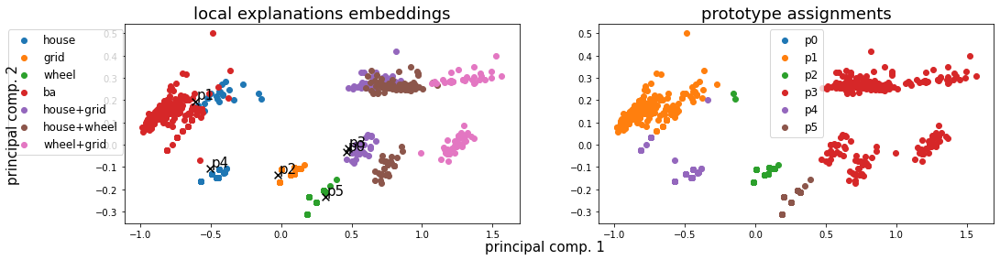

Alpha norms:
tensor([[0.0411, 0.0074, 0.0200, 1.0000, 0.0206, 0.0158],
        [0.2218, 0.2479, 0.1132, 1.0000, 0.1305, 0.1257]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.839867 +- 0.222295
Concept distribution:  (array([1, 2, 3, 4, 5], dtype=int64), array([254, 155, 240, 112, 151], dtype=int64))
Logic formulas:
For class 0:
0.9907161803713528 (feature002) | (feature005) | ((feature001) | ((feature001 & feature004) | (feature004)
For class 1:
0.9907161803713528 (feature003) | ((feature002 & feature004) | ((feature002 & feature005) | (feature005 & feature004)
Accuracy as classifier:  0.9907
LEN fidelity:  tensor(0.9907)


380: Loss: 0.03135, LEN: 0.030957, AccxC: 0.97, AccO: 0.97, V. Acc: 1.00, V. Loss: 0.01105, V. LEN 0.01
381: Loss: 0.04762, LEN: 0.046819, AccxC: 0.96, AccO: 0.96, V. Acc: 1.00, V. Loss: 0.01186, V. LEN 0.01
382: Loss: 0.03118, LEN: 0.030679, AccxC: 0.97, AccO: 0.97, V. Acc: 1.00, V. Loss: 0.01150, V. LEN 0.01
383: Loss: 0.01816, LEN: 0.017719, AccxC: 0.99, Acc

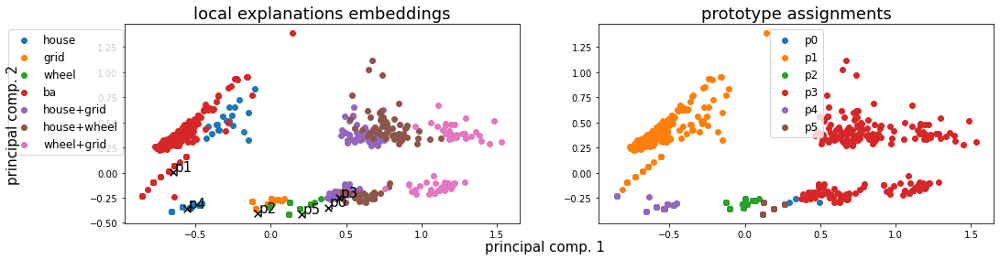

Alpha norms:
tensor([[0.0514, 0.0107, 0.0308, 1.0000, 0.0297, 0.0270],
        [0.2273, 0.2765, 0.1267, 1.0000, 0.1462, 0.1591]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.808464 +- 0.210201
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([  3, 265, 167, 239, 103, 135], dtype=int64))
Logic formulas:
For class 0:
0.9814323607427056 (feature002) | (feature005) | ((feature001) | ((feature001 & feature004) | (feature004)
For class 1:
0.9814323607427056 (feature003) | (feature000) | (feature004 & feature005) | ((feature002 & feature004) | ((feature002 & feature005) | ((feature002 & feature000)
Accuracy as classifier:  0.9814
LEN fidelity:  tensor(0.9814)


400: Loss: 0.04261, LEN: 0.041699, AccxC: 0.97, AccO: 0.97, V. Acc: 1.00, V. Loss: 0.01640, V. LEN 0.02
401: Loss: 0.04048, LEN: 0.039542, AccxC: 0.96, AccO: 0.96, V. Acc: 0.99, V. Loss: 0.03039, V. LEN 0.03
402: Loss: 0.03338, LEN: 0.032695, AccxC: 0.97, AccO: 0.97, V. Acc: 1.00, V. Loss: 0.01733, V. LEN 0.02

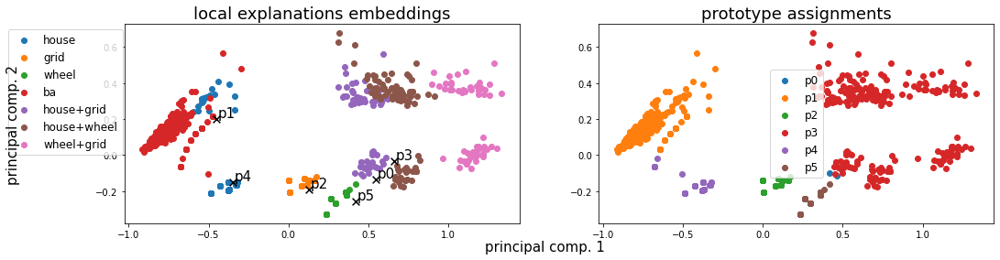

Alpha norms:
tensor([[0.0485, 0.0124, 0.0365, 1.0000, 0.0361, 0.0295],
        [0.2258, 0.2896, 0.1374, 1.0000, 0.1595, 0.1577]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.877416 +- 0.212560
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([  2, 264, 153, 238, 104, 151], dtype=int64))
Logic formulas:
For class 0:
0.9907161803713528 (feature002) | (feature005) | ((feature001) | ((feature001 & feature004) | (feature004)
For class 1:
0.9907161803713528 (feature003) | (feature005 & feature004) | ((feature002 & feature004) | ((feature002 & feature005) | (feature000)
Accuracy as classifier:  0.9907
LEN fidelity:  tensor(0.9907)


420: Loss: 0.02578, LEN: 0.025236, AccxC: 0.98, AccO: 0.98, V. Acc: 1.00, V. Loss: 0.01259, V. LEN 0.01
421: Loss: 0.02126, LEN: 0.020715, AccxC: 0.98, AccO: 0.98, V. Acc: 1.00, V. Loss: 0.01134, V. LEN 0.01
422: Loss: 0.02157, LEN: 0.021034, AccxC: 0.98, AccO: 0.98, V. Acc: 1.00, V. Loss: 0.01241, V. LEN 0.01
423: Loss: 0.02622, LEN: 0.0

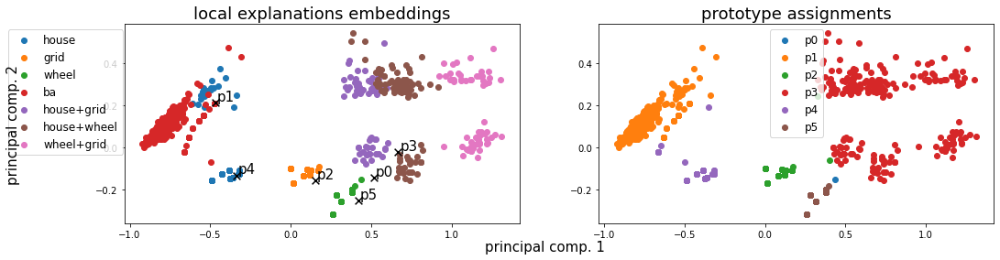

Alpha norms:
tensor([[0.0384, 0.0112, 0.0341, 1.0000, 0.0339, 0.0270],
        [0.1961, 0.2573, 0.1280, 1.0000, 0.1484, 0.1438]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.875958 +- 0.211539
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([  1, 263, 155, 238, 105, 150], dtype=int64))
Logic formulas:
For class 0:
0.9880636604774535 (feature002) | (feature005) | ((feature001) | ((feature001 & feature004) | (feature004)
For class 1:
0.9880636604774535 (feature003) | (feature005 & feature004) | ((feature002 & feature004) | ((feature002 & feature005) | ((feature002 & feature000)
Accuracy as classifier:  0.9881
LEN fidelity:  tensor(0.9881)


440: Loss: 0.01677, LEN: 0.016279, AccxC: 0.99, AccO: 0.99, V. Acc: 1.00, V. Loss: 0.01008, V. LEN 0.01
441: Loss: 0.01783, LEN: 0.017426, AccxC: 0.99, AccO: 0.99, V. Acc: 1.00, V. Loss: 0.00985, V. LEN 0.01
442: Loss: 0.02301, LEN: 0.022564, AccxC: 0.98, AccO: 0.98, V. Acc: 1.00, V. Loss: 0.00976, V. LEN 0.01
443: Loss: 0.0

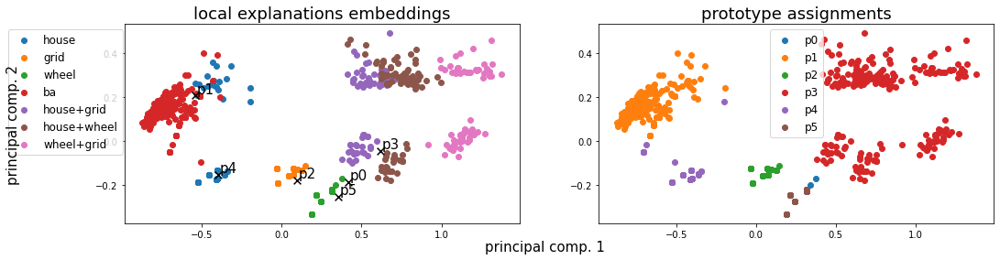

Alpha norms:
tensor([[0.0330, 0.0109, 0.0327, 1.0000, 0.0341, 0.0267],
        [0.1801, 0.2520, 0.1241, 1.0000, 0.1468, 0.1465]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.877543 +- 0.213973
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([  2, 263, 153, 240, 105, 149], dtype=int64))
Logic formulas:
For class 0:
0.9907161803713528 (feature002) | (feature005) | ((feature001) | ((feature001 & feature004) | (feature004)
For class 1:
0.9907161803713528 (feature003) | (feature005 & feature004) | ((feature002 & feature004) | ((feature002 & feature005) | ((feature002 & feature000)
Accuracy as classifier:  0.9907
LEN fidelity:  tensor(0.9907)


460: Loss: 0.01452, LEN: 0.014229, AccxC: 0.99, AccO: 0.99, V. Acc: 1.00, V. Loss: 0.00909, V. LEN 0.01
461: Loss: 0.02242, LEN: 0.022098, AccxC: 0.98, AccO: 0.98, V. Acc: 1.00, V. Loss: 0.00906, V. LEN 0.01
462: Loss: 0.01657, LEN: 0.016228, AccxC: 0.99, AccO: 0.99, V. Acc: 1.00, V. Loss: 0.00913, V. LEN 0.01
463: Loss: 0.0

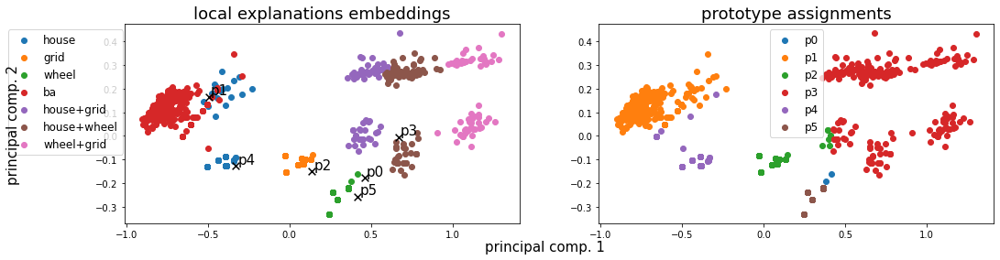

Alpha norms:
tensor([[0.0273, 0.0103, 0.0314, 1.0000, 0.0329, 0.0276],
        [0.1531, 0.2442, 0.1204, 1.0000, 0.1438, 0.1566]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.872970 +- 0.206103
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([  2, 262, 160, 233, 106, 149], dtype=int64))
Logic formulas:
For class 0:
0.9814323607427056 (feature002) | (feature005) | ((feature001) | ((feature001 & feature004) | (feature004)
For class 1:
0.9814323607427056 (feature003) | (feature004 & feature005) | ((feature002 & feature004) | ((feature002 & feature005) | ((feature002 & feature000)
Accuracy as classifier:  0.9814
LEN fidelity:  tensor(0.9814)


480: Loss: 0.01998, LEN: 0.019394, AccxC: 0.99, AccO: 0.98, V. Acc: 0.99, V. Loss: 0.02528, V. LEN 0.02
481: Loss: 0.03120, LEN: 0.030751, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.02873, V. LEN 0.03
482: Loss: 0.02377, LEN: 0.023415, AccxC: 0.99, AccO: 0.99, V. Acc: 1.00, V. Loss: 0.01099, V. LEN 0.01
483: Loss: 0.0

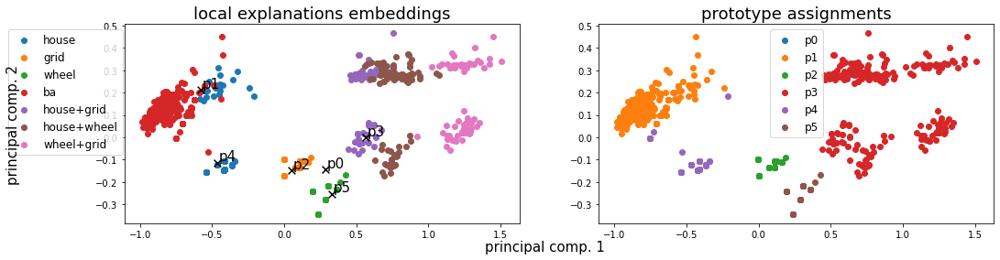

Alpha norms:
tensor([[0.0242, 0.0102, 0.0308, 1.0000, 0.0334, 0.0257],
        [0.1380, 0.2379, 0.1163, 1.0000, 0.1421, 0.1504]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.853051 +- 0.226588
Concept distribution:  (array([1, 2, 3, 4, 5], dtype=int64), array([263, 153, 240, 105, 151], dtype=int64))
Logic formulas:
For class 0:
0.9907161803713528 (feature002) | (feature005) | ((feature001) | ((feature001 & feature004) | (feature004)
For class 1:
0.9907161803713528 (feature003) | ((feature002 & feature004) | ((feature002 & feature005) | (feature004 & feature005)
Accuracy as classifier:  0.9907
LEN fidelity:  tensor(0.9907)


500: Loss: 0.01620, LEN: 0.015902, AccxC: 0.99, AccO: 0.99, V. Acc: 1.00, V. Loss: 0.00806, V. LEN 0.01
501: Loss: 0.01508, LEN: 0.014794, AccxC: 0.99, AccO: 0.99, V. Acc: 1.00, V. Loss: 0.01025, V. LEN 0.01
502: Loss: 0.01563, LEN: 0.015378, AccxC: 0.99, AccO: 0.99, V. Acc: 0.98, V. Loss: 0.02125, V. LEN 0.02
503: Loss: 0.02113, LEN: 0.020852, AccxC: 0.98, Acc

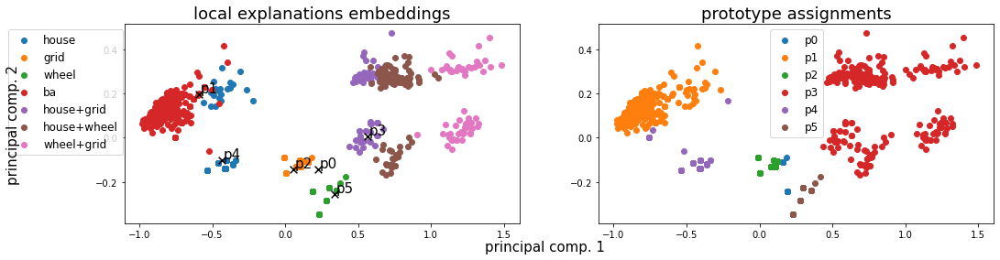

Alpha norms:
tensor([[0.0227, 0.0106, 0.0321, 1.0000, 0.0366, 0.0281],
        [0.1327, 0.2455, 0.1197, 1.0000, 0.1494, 0.1635]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.821987 +- 0.218197
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([ 21, 263, 146, 240, 105, 137], dtype=int64))
Logic formulas:
For class 0:
0.9893899204244032 (feature002) | (feature005) | (feature004) | ((feature001) | ((feature001 & feature004) | (feature000)
For class 1:
0.9893899204244032 (feature003) | (feature004 & feature005) | (feature000 & feature004) | ((feature002 & feature004) | ((feature002 & feature005) | ((feature002 & feature000) | (feature000 & feature005)
Accuracy as classifier:  0.9894
LEN fidelity:  tensor(0.9894)


520: Loss: 0.01908, LEN: 0.018864, AccxC: 0.98, AccO: 0.98, V. Acc: 1.00, V. Loss: 0.00858, V. LEN 0.01
521: Loss: 0.01970, LEN: 0.019440, AccxC: 0.99, AccO: 0.99, V. Acc: 1.00, V. Loss: 0.00855, V. LEN 0.01
522: Loss: 0.01638, LEN: 0.016173, AccxC: 0.99,

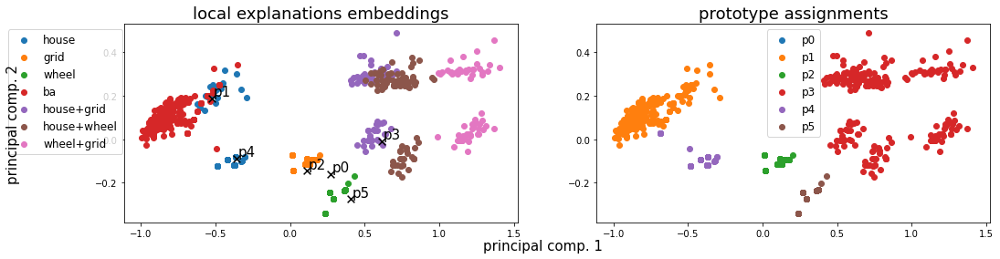

Alpha norms:
tensor([[0.0230, 0.0108, 0.0327, 1.0000, 0.0380, 0.0293],
        [0.1393, 0.2477, 0.1196, 1.0000, 0.1523, 0.1691]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.854089 +- 0.227005
Concept distribution:  (array([1, 2, 3, 4, 5], dtype=int64), array([265, 153, 240, 103, 151], dtype=int64))
Logic formulas:
For class 0:
0.9907161803713528 (feature002) | (feature005) | ((feature001) | ((feature001 & feature004) | (feature004)
For class 1:
0.9907161803713528 (feature003) | ((feature002 & feature004) | ((feature002 & feature005) | (feature004 & feature005)
Accuracy as classifier:  0.9907
LEN fidelity:  tensor(0.9907)


540: Loss: 0.01622, LEN: 0.015955, AccxC: 0.99, AccO: 0.99, V. Acc: 1.00, V. Loss: 0.00813, V. LEN 0.01
541: Loss: 0.01811, LEN: 0.017906, AccxC: 0.98, AccO: 0.98, V. Acc: 1.00, V. Loss: 0.01007, V. LEN 0.01
542: Loss: 0.02223, LEN: 0.021914, AccxC: 0.98, AccO: 0.98, V. Acc: 1.00, V. Loss: 0.00812, V. LEN 0.01
543: Loss: 0.01891, LEN: 0.018566, AccxC: 0.99, Acc

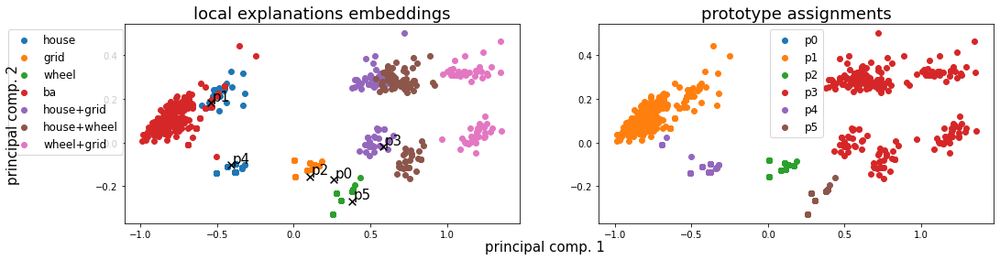

Alpha norms:
tensor([[0.0237, 0.0104, 0.0311, 1.0000, 0.0370, 0.0285],
        [0.1390, 0.2302, 0.1121, 1.0000, 0.1425, 0.1537]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.852220 +- 0.226315
Concept distribution:  (array([1, 2, 3, 4, 5], dtype=int64), array([264, 153, 240, 104, 151], dtype=int64))
Logic formulas:
For class 0:
0.9907161803713528 (feature002) | (feature005) | ((feature001) | ((feature001 & feature004) | (feature004)
For class 1:
0.9907161803713528 (feature003) | ((feature002 & feature004) | ((feature002 & feature005) | (feature004 & feature005)
Accuracy as classifier:  0.9907
LEN fidelity:  tensor(0.9907)


560: Loss: 0.02148, LEN: 0.021204, AccxC: 0.99, AccO: 0.99, V. Acc: 1.00, V. Loss: 0.00726, V. LEN 0.01
561: Loss: 0.01467, LEN: 0.014444, AccxC: 0.99, AccO: 0.99, V. Acc: 0.98, V. Loss: 0.02654, V. LEN 0.03
562: Loss: 0.02042, LEN: 0.020123, AccxC: 0.98, AccO: 0.98, V. Acc: 1.00, V. Loss: 0.01030, V. LEN 0.01
563: Loss: 0.02246, LEN: 0.021944, AccxC: 0.99, Acc

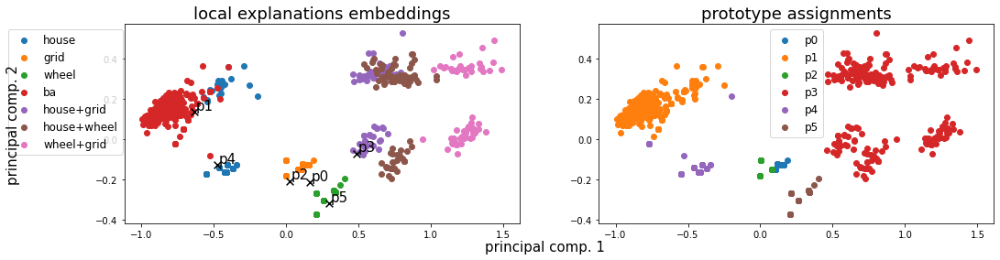

Alpha norms:
tensor([[0.0226, 0.0105, 0.0322, 1.0000, 0.0385, 0.0295],
        [0.1300, 0.2275, 0.1125, 1.0000, 0.1440, 0.1604]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.879084 +- 0.214399
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([ 57, 264,  96, 240, 104, 151], dtype=int64))
Logic formulas:
For class 0:
0.9907161803713528 (feature000) | (feature005) | (feature004) | ((feature001) | ((feature001 & feature004) | (feature002)
For class 1:
0.9907161803713528 (feature003) | (feature000 & feature005) | (feature000 & feature004) | ((feature002 & feature004) | ((feature002 & feature005) | (feature004 & feature005)
Accuracy as classifier:  0.9907
LEN fidelity:  tensor(0.9907)


580: Loss: 0.02417, LEN: 0.023689, AccxC: 0.98, AccO: 0.98, V. Acc: 1.00, V. Loss: 0.00942, V. LEN 0.01
581: Loss: 0.01959, LEN: 0.019277, AccxC: 0.99, AccO: 0.99, V. Acc: 0.93, V. Loss: 0.07871, V. LEN 0.08
582: Loss: 0.02226, LEN: 0.022007, AccxC: 0.98, AccO: 0.98, V. Acc: 1.00, V.

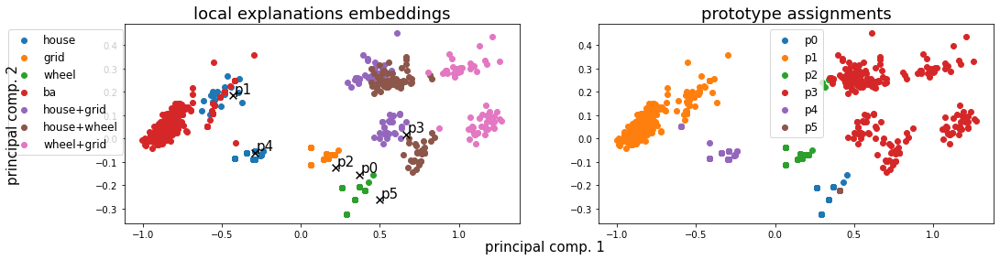

Alpha norms:
tensor([[0.0271, 0.0125, 0.0382, 1.0000, 0.0457, 0.0358],
        [0.1557, 0.2685, 0.1338, 1.0000, 0.1703, 0.1918]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.876055 +- 0.210646
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([138, 265, 156, 237, 103,  13], dtype=int64))
Logic formulas:
For class 0:
0.986737400530504 (feature002) | (feature000) | ((feature001) | ((feature001 & feature004) | (feature004)
For class 1:
0.986737400530504 (feature003) | (feature000 & feature004) | (feature004 & feature005) | ((feature002 & feature004) | ((feature002 & feature000) | ((feature002 & feature005)
Accuracy as classifier:  0.9867
LEN fidelity:  tensor(0.9867)


600: Loss: 0.01689, LEN: 0.016638, AccxC: 0.99, AccO: 0.99, V. Acc: 1.00, V. Loss: 0.00977, V. LEN 0.01
601: Loss: 0.01594, LEN: 0.015675, AccxC: 0.99, AccO: 0.99, V. Acc: 1.00, V. Loss: 0.00818, V. LEN 0.01
602: Loss: 0.01897, LEN: 0.018684, AccxC: 0.99, AccO: 0.99, V. Acc: 1.00, V. Loss: 0.00891, 

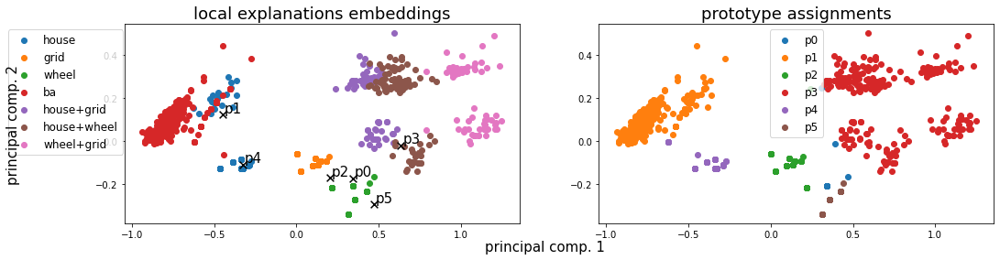

Alpha norms:
tensor([[0.0273, 0.0125, 0.0385, 1.0000, 0.0454, 0.0357],
        [0.1515, 0.2568, 0.1282, 1.0000, 0.1631, 0.1832]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.836601 +- 0.197311
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([ 12, 265, 168, 237, 103, 127], dtype=int64))
Logic formulas:
For class 0:
0.9774535809018567 (feature002) | (feature005) | (feature004) | ((feature001) | ((feature001 & feature004) | (feature000)
For class 1:
0.9774535809018567 (feature003) | (feature004 & feature005) | ((feature002 & feature004) | ((feature002 & feature005) | ((feature002 & feature000) | (feature000 & feature004)
Accuracy as classifier:  0.9775
LEN fidelity:  tensor(0.9775)


620: Loss: 0.01838, LEN: 0.018138, AccxC: 0.99, AccO: 0.99, V. Acc: 1.00, V. Loss: 0.00697, V. LEN 0.01
621: Loss: 0.02408, LEN: 0.023860, AccxC: 0.98, AccO: 0.98, V. Acc: 1.00, V. Loss: 0.00808, V. LEN 0.01
622: Loss: 0.01541, LEN: 0.015153, AccxC: 0.99, AccO: 0.99, V. Acc: 1.00, V

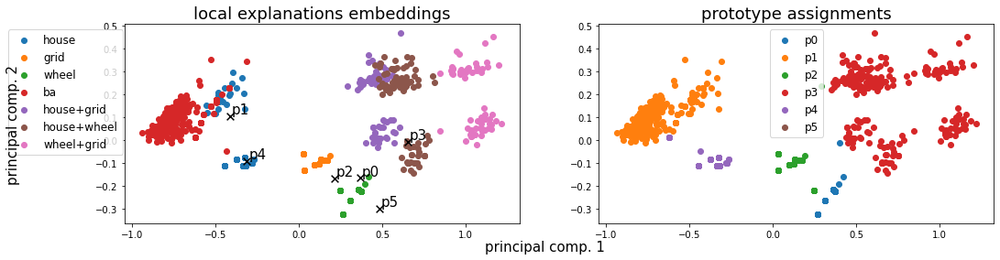

Alpha norms:
tensor([[0.0262, 0.0122, 0.0374, 1.0000, 0.0452, 0.0352],
        [0.1414, 0.2434, 0.1217, 1.0000, 0.1548, 0.1743]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.835461 +- 0.215745
Concept distribution:  (array([0, 1, 2, 3, 4], dtype=int64), array([138, 265, 168, 238, 103], dtype=int64))
Logic formulas:
For class 0:
0.9787798408488063 (feature002) | (feature000) | ((feature001) | ((feature001 & feature004) | (feature004)
For class 1:
0.9787798408488063 (feature003) | ((feature002 & feature004) | ((feature002 & feature000) | (feature000 & feature004)
Accuracy as classifier:  0.9788
LEN fidelity:  tensor(0.9788)


640: Loss: 0.01935, LEN: 0.019089, AccxC: 0.99, AccO: 0.99, V. Acc: 1.00, V. Loss: 0.00795, V. LEN 0.01
641: Loss: 0.02719, LEN: 0.026898, AccxC: 0.98, AccO: 0.98, V. Acc: 1.00, V. Loss: 0.00775, V. LEN 0.01
642: Loss: 0.03386, LEN: 0.032965, AccxC: 0.98, AccO: 0.98, V. Acc: 1.00, V. Loss: 0.01123, V. LEN 0.01
643: Loss: 0.03549, LEN: 0.034558, AccxC: 0.97, Acc

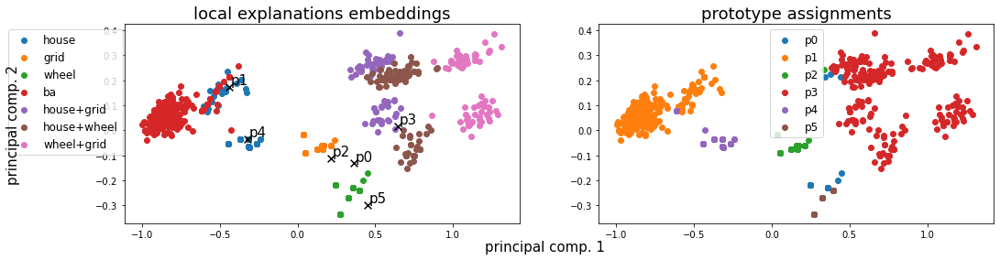

Alpha norms:
tensor([[0.0402, 0.0174, 0.0601, 1.0000, 0.0641, 0.0518],
        [0.2033, 0.2890, 0.1713, 1.0000, 0.2113, 0.2431]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.859903 +- 0.206058
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([ 28, 265, 154, 236, 103, 126], dtype=int64))
Logic formulas:
For class 0:
0.9854111405835544 (feature002) | (feature005) | (feature004) | ((feature001) | ((feature001 & feature004) | (feature000)
For class 1:
0.9854111405835544 (feature003) | (feature004 & feature005) | ((feature002 & feature004) | ((feature002 & feature005) | ((feature002 & feature000) | (feature000 & feature004)
Accuracy as classifier:  0.9854
LEN fidelity:  tensor(0.9854)


660: Loss: 0.01973, LEN: 0.019452, AccxC: 0.98, AccO: 0.98, V. Acc: 1.00, V. Loss: 0.01031, V. LEN 0.01
661: Loss: 0.01777, LEN: 0.017494, AccxC: 0.99, AccO: 0.99, V. Acc: 1.00, V. Loss: 0.01052, V. LEN 0.01
662: Loss: 0.01913, LEN: 0.018794, AccxC: 0.98, AccO: 0.98, V. Acc: 1.00, V

In [28]:
expls = []
for use_focal in [True, False]:
    batch_sampler = utils.GroupBatchSampler(num_input_graphs=128, drop_last=False, belonging=np.array(belonging_train))
    train_group_loader = DataLoader(dataset_train, batch_sampler=batch_sampler)

    batch_sampler = utils.GroupBatchSampler(num_input_graphs=256, drop_last=False, belonging=np.array(belonging_val))
    val_group_loader = DataLoader(dataset_val, batch_sampler=batch_sampler)

    batch_sampler = utils.GroupBatchSampler(num_input_graphs=256, drop_last=False, belonging=np.array(belonging_test))
    test_group_loader = DataLoader(dataset_test, batch_sampler=batch_sampler)


    torch.manual_seed(69+10000)
    hyper = {
        "len_lr": 0.0005,
        "proto_lr": 0.001,
        "le_emb_lr": 0.001,
        "coeff_divloss": 0.000,
        "coeff_pdist": 0.,
        "coeff_gae": 0.,
        "coeff_r1": 0.09,
        "coeff_r2": 0.00099,
        "coeff_ce": 0.0,
        "coeff_de": 0.,
        "coeff_logic_loss": 0.00,
        "focal_gamma": 2, #3
        "focal_alpha": -1,
        "ts": 1,
        "te": 1,
        "focal_loss": use_focal,
        "debug_prototypes": False,
        "num_prototypes": 6,
        "dim_prototypes": 10,
        "num_le_features": 5,
        "activation": "leaky",
        "assign_func": "straight_sim",
        "LEN_temperature": 1,
        "remove_attention": True,
        "log_images": True,
        "log_models": True,
        "num_epochs": 2000
    }

    len_model    = models.LEN(hyper["num_prototypes"], 
                              hyper["LEN_temperature"], 
                              remove_attention=hyper["remove_attention"]).to(device)
    le_model     = models.LEEmbedder(num_features=hyper["num_le_features"], 
                                     activation=hyper["activation"], 
                                     num_hidden=hyper["dim_prototypes"]).to(device)
    expl         = models.GlobalExplainer(len_model, 
                                   le_model, 
                                   train_group_loader, 
                                   val_group_loader, 
                                   device, 
                                   hyper_params=hyper,
                                   classes_names=bamultishapes_classes_names,
                                   dataset_name=DATASET_NAME).to(device)
    expl.iterate(num_epochs=hyper["num_epochs"], log_wandb=False, name_wandb="")
    expls.append(expl)
    
    #with open(f'../logs/model_focal_{use_focal}_BAMultiShapes.pkl', 'wb') as handle:
    #    pickle.dump(expl, handle)

##### plots

In [29]:
# with open(f'../logs/model_focal_True_BAMultiShapes.pkl', 'rb') as handle:
#     uno = pickle.load(handle)
# with open(f'../logs/model_focal_False_BAMultiShapes.pkl', 'rb') as handle:
#     due = pickle.load(handle)
uno, due = expls[0] , expls[1]

In [30]:
focal_loss_bamultishapes_over_runs = [
    [1, 728], # (fidelity, best_epoch)
    [1, 329],
    [1, 773],
]
no_focal_loss_bamultishapes_over_runs = [
    [1, 811],
    [1, 397],
    [1, 662]
]
print([e["acc_overall"] for e in uno.val_metrics][uno.early_stopping.best_epoch-1], "@", uno.early_stopping.best_epoch )
print([e["acc_overall"] for e in due.val_metrics][due.early_stopping.best_epoch-1], "@", due.early_stopping.best_epoch)

tensor(1.) @ 600
tensor(1.) @ 577


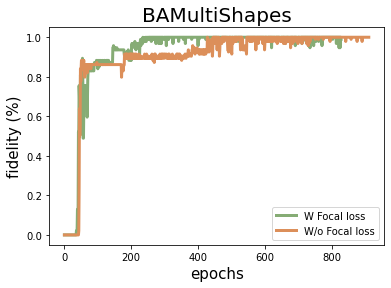

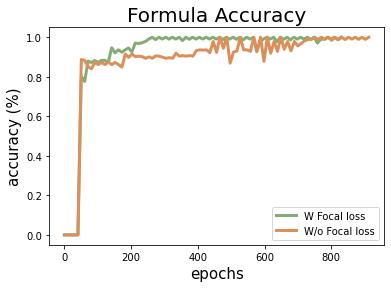

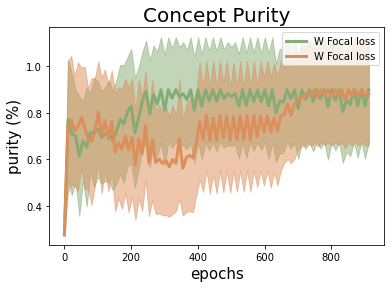

In [31]:
c1 = "#86ac75"
c2 = "#dc8f5a"

plt.plot([e["acc_overall"] for e in uno.val_metrics], label="W Focal loss", color=c1, linewidth=3)
plt.plot([e["acc_overall"] for e in due.val_metrics], label="W/o Focal loss", color=c2, linewidth=3)
plt.legend()
plt.title("BAMultiShapes", size=20)
plt.xlabel("epochs", size=15)
plt.ylabel("fidelity (%)", size=15)
plt.savefig("fidelity_focal_bamultishapes.pdf")
plt.show()

plt.plot(np.linspace(0, len([e["acc_overall"] for e in uno.val_metrics]), num=len([e["logic_acc_clf"] for e in uno.val_logic_metrics])), [e["logic_acc_clf"] for e in uno.val_logic_metrics], label="W Focal loss", color=c1, linewidth=3)
plt.plot(np.linspace(0, len([e["acc_overall"] for e in due.val_metrics]), num=len([e["logic_acc_clf"] for e in due.val_logic_metrics])), [e["logic_acc_clf"] for e in due.val_logic_metrics], label="W/o Focal loss", color=c2, linewidth=3)
plt.legend()
plt.title("Formula Accuracy", size=20)
plt.xlabel("epochs", size=15)
plt.ylabel("accuracy (%)", size=15)
plt.savefig("formula_acc_focal_bamultishapes.pdf")
plt.show()


purity     = np.array([e["concept_purity"] for e in uno.val_logic_metrics])
std_purity = np.array([e["concept_purity_std"] for e in uno.val_logic_metrics])
plt.plot(np.linspace(0, len([e["acc_overall"] for e in due.val_metrics]), num=len(purity)), purity, label="W Focal loss", color=c1, linewidth=3)
plt.fill_between(np.linspace(0, len([e["acc_overall"] for e in due.val_metrics]), num=len(purity)), purity-std_purity, purity+std_purity, alpha=0.5, color=c1)

purity     = np.array([e["concept_purity"] for e in due.val_logic_metrics])
std_purity = np.array([e["concept_purity_std"] for e in due.val_logic_metrics])
plt.plot(np.linspace(0, len([e["acc_overall"] for e in due.val_metrics]), num=len(purity)), purity, label="W Focal loss", color=c2, linewidth=3)
plt.fill_between(np.linspace(0, len([e["acc_overall"] for e in due.val_metrics]), num=len(purity)), purity-std_purity, purity+std_purity, alpha=0.5, color=c2)



plt.legend()
plt.title("Concept Purity", size=20)
plt.xlabel("epochs", size=15)
plt.ylabel("purity (%)", size=15)
plt.savefig("purity_focal_bamultishapes.pdf")
plt.show()

In [30]:
len(range(0, len([e["acc_overall"] for e in uno.val_metrics]), 20)) , len([e["logic_acc_clf"] for e in uno.val_logic_metrics])

(42, 83)

### Ablation study on num_proto

(array([0., 1., 2., 3., 4., 5., 6., 7.], dtype=float32), array([121, 162, 157, 251,  78, 102,  73,  26], dtype=int64))


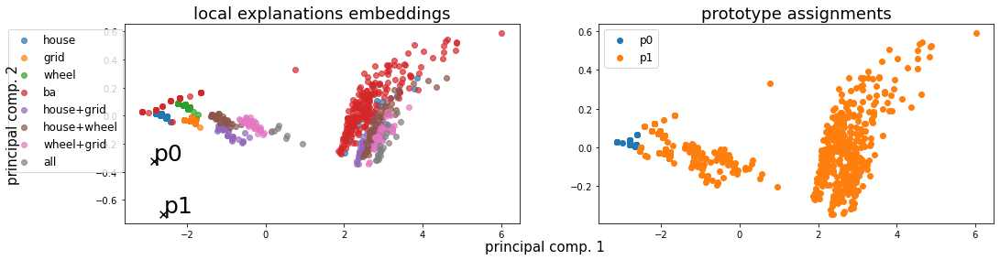

Alpha norms:
tensor([[1.0000, 0.6722],
        [0.7495, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.555057 +- 0.284943
Concept distribution:  (array([0, 1], dtype=int64), array([100, 870], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 0.26600, LEN: 0.075970, AccxC: 0.49, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.28451, V. LEN 0.09
  2: Loss: 0.22088, LEN: 0.075811, AccxC: 0.53, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.23730, V. LEN 0.09
  3: Loss: 0.16936, LEN: 0.075743, AccxC: 0.55, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.15218, V. LEN 0.09
  4: Loss: 0.12614, LEN: 0.075633, AccxC: 0.61, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.13983, V. LEN 0.09
  5: Loss: 0.10846, LEN: 0.075569, AccxC: 0.66, AccO: 0.14, V. Acc: 0.12, V. Loss: 0.13135, V. LEN 0.09
  6: Loss: 0.10559, LEN: 0.075846, AccxC: 0.52, AccO: 0.12, V. Acc: 0.08, V. Loss: 0.12520, V. LEN 0.09
  7: Loss: 0.10095, LEN: 0.075527, AccxC: 0.62, AccO:

 77: Loss: 0.05382, LEN: 0.051248, AccxC: 0.83, AccO: 0.83, V. Acc: 0.89, V. Loss: 0.05562, V. LEN 0.05
 78: Loss: 0.05393, LEN: 0.052146, AccxC: 0.83, AccO: 0.83, V. Acc: 0.89, V. Loss: 0.05370, V. LEN 0.05
 79: Loss: 0.05361, LEN: 0.051381, AccxC: 0.83, AccO: 0.83, V. Acc: 0.89, V. Loss: 0.05555, V. LEN 0.05


 80: Loss: 0.05458, LEN: 0.052258, AccxC: 0.84, AccO: 0.85, V. Acc: 0.89, V. Loss: 0.05336, V. LEN 0.05
 81: Loss: 0.05458, LEN: 0.052586, AccxC: 0.82, AccO: 0.82, V. Acc: 0.89, V. Loss: 0.05416, V. LEN 0.05
 82: Loss: 0.05263, LEN: 0.051085, AccxC: 0.83, AccO: 0.83, V. Acc: 0.88, V. Loss: 0.05488, V. LEN 0.05
 83: Loss: 0.05028, LEN: 0.047507, AccxC: 0.86, AccO: 0.86, V. Acc: 0.90, V. Loss: 0.05297, V. LEN 0.05
 84: Loss: 0.04812, LEN: 0.046057, AccxC: 0.86, AccO: 0.86, V. Acc: 0.88, V. Loss: 0.05524, V. LEN 0.05
 85: Loss: 0.04700, LEN: 0.045272, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.05385, V. LEN 0.05
 86: Loss: 0.05358, LEN: 0.051711, AccxC: 0.83, AccO: 0.83, V.

156: Loss: 0.04179, LEN: 0.040871, AccxC: 0.87, AccO: 0.87, V. Acc: 0.86, V. Loss: 0.04932, V. LEN 0.05
157: Loss: 0.03871, LEN: 0.037874, AccxC: 0.88, AccO: 0.88, V. Acc: 0.88, V. Loss: 0.04385, V. LEN 0.04
158: Loss: 0.04018, LEN: 0.039334, AccxC: 0.88, AccO: 0.88, V. Acc: 0.88, V. Loss: 0.04458, V. LEN 0.04
159: Loss: 0.03858, LEN: 0.037706, AccxC: 0.88, AccO: 0.88, V. Acc: 0.87, V. Loss: 0.04768, V. LEN 0.05


160: Loss: 0.03739, LEN: 0.036317, AccxC: 0.88, AccO: 0.88, V. Acc: 0.88, V. Loss: 0.04359, V. LEN 0.04
161: Loss: 0.04178, LEN: 0.040879, AccxC: 0.88, AccO: 0.88, V. Acc: 0.87, V. Loss: 0.04798, V. LEN 0.05
162: Loss: 0.04283, LEN: 0.041871, AccxC: 0.86, AccO: 0.87, V. Acc: 0.87, V. Loss: 0.04742, V. LEN 0.05
163: Loss: 0.04038, LEN: 0.039255, AccxC: 0.88, AccO: 0.88, V. Acc: 0.87, V. Loss: 0.04677, V. LEN 0.05
164: Loss: 0.03915, LEN: 0.038424, AccxC: 0.88, AccO: 0.88, V. Acc: 0.87, V. Loss: 0.04722, V. LEN 0.05
165: Loss: 0.03978, LEN: 0.038737, AccxC: 0.87, AccO: 0.87, V.

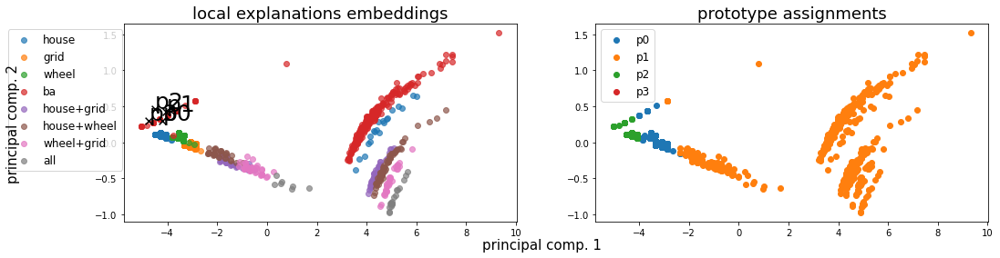

Alpha norms:
tensor([[1.0000, 0.8459, 0.8427, 0.9224],
        [0.8005, 0.7799, 1.0000, 0.8565]], grad_fn=<DivBackward0>)
Concept Purity: 0.589408 +- 0.193218
Concept distribution:  (array([0, 1, 2], dtype=int64), array([337, 518, 115], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 0.23152, LEN: 0.085419, AccxC: 0.55, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.24388, V. LEN 0.10
  2: Loss: 0.19940, LEN: 0.084766, AccxC: 0.56, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.22420, V. LEN 0.10
  3: Loss: 0.18297, LEN: 0.084120, AccxC: 0.55, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.21526, V. LEN 0.10
  4: Loss: 0.17543, LEN: 0.083559, AccxC: 0.55, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.21009, V. LEN 0.10
  5: Loss: 0.14955, LEN: 0.083030, AccxC: 0.55, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.14910, V. LEN 0.09
  6: Loss: 0.12178, LEN: 0.082667, AccxC: 0.55, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.14518, V. LEN 0.09
  7: Loss: 0.

 77: Loss: 0.07738, LEN: 0.073408, AccxC: 0.55, AccO: 0.51, V. Acc: 0.50, V. Loss: 0.09403, V. LEN 0.08
 78: Loss: 0.07594, LEN: 0.072590, AccxC: 0.55, AccO: 0.52, V. Acc: 0.56, V. Loss: 0.09248, V. LEN 0.08
 79: Loss: 0.07639, LEN: 0.072636, AccxC: 0.59, AccO: 0.54, V. Acc: 0.56, V. Loss: 0.09166, V. LEN 0.08


 80: Loss: 0.07776, LEN: 0.073600, AccxC: 0.58, AccO: 0.54, V. Acc: 0.55, V. Loss: 0.09188, V. LEN 0.08
 81: Loss: 0.07651, LEN: 0.073300, AccxC: 0.59, AccO: 0.52, V. Acc: 0.51, V. Loss: 0.09333, V. LEN 0.08
 82: Loss: 0.07553, LEN: 0.072610, AccxC: 0.60, AccO: 0.51, V. Acc: 0.56, V. Loss: 0.09809, V. LEN 0.08
 83: Loss: 0.07739, LEN: 0.073616, AccxC: 0.58, AccO: 0.52, V. Acc: 0.56, V. Loss: 0.10006, V. LEN 0.08
 84: Loss: 0.07540, LEN: 0.072147, AccxC: 0.66, AccO: 0.50, V. Acc: 0.39, V. Loss: 0.09435, V. LEN 0.08
 85: Loss: 0.07584, LEN: 0.072543, AccxC: 0.64, AccO: 0.51, V. Acc: 0.55, V. Loss: 0.08955, V. LEN 0.08
 86: Loss: 0.07613, LEN: 0.072583, AccxC: 0.60, AccO: 0.53, V.

156: Loss: 0.03638, LEN: 0.034715, AccxC: 0.76, AccO: 0.71, V. Acc: 0.87, V. Loss: 0.03340, V. LEN 0.03
157: Loss: 0.02821, LEN: 0.026816, AccxC: 0.86, AccO: 0.82, V. Acc: 0.87, V. Loss: 0.03529, V. LEN 0.03
158: Loss: 0.02926, LEN: 0.027780, AccxC: 0.85, AccO: 0.80, V. Acc: 0.87, V. Loss: 0.03728, V. LEN 0.03
159: Loss: 0.02860, LEN: 0.027169, AccxC: 0.86, AccO: 0.82, V. Acc: 0.87, V. Loss: 0.03406, V. LEN 0.03


160: Loss: 0.02687, LEN: 0.025654, AccxC: 0.85, AccO: 0.81, V. Acc: 0.87, V. Loss: 0.03186, V. LEN 0.03
161: Loss: 0.03385, LEN: 0.032424, AccxC: 0.84, AccO: 0.69, V. Acc: 0.57, V. Loss: 0.04447, V. LEN 0.04
162: Loss: 0.02763, LEN: 0.026483, AccxC: 0.86, AccO: 0.72, V. Acc: 0.72, V. Loss: 0.03024, V. LEN 0.03
163: Loss: 0.02757, LEN: 0.026323, AccxC: 0.86, AccO: 0.72, V. Acc: 0.68, V. Loss: 0.03344, V. LEN 0.03
164: Loss: 0.02876, LEN: 0.027808, AccxC: 0.86, AccO: 0.70, V. Acc: 0.67, V. Loss: 0.03481, V. LEN 0.03
165: Loss: 0.02517, LEN: 0.024046, AccxC: 0.88, AccO: 0.72, V.

235: Loss: 0.03144, LEN: 0.030786, AccxC: 0.87, AccO: 0.87, V. Acc: 0.87, V. Loss: 0.02849, V. LEN 0.03
236: Loss: 0.03385, LEN: 0.033299, AccxC: 0.86, AccO: 0.86, V. Acc: 0.82, V. Loss: 0.05543, V. LEN 0.05
237: Loss: 0.02809, LEN: 0.027594, AccxC: 0.88, AccO: 0.88, V. Acc: 0.87, V. Loss: 0.02862, V. LEN 0.03
238: Loss: 0.03048, LEN: 0.029839, AccxC: 0.88, AccO: 0.88, V. Acc: 0.83, V. Loss: 0.04574, V. LEN 0.04
239: Loss: 0.02976, LEN: 0.029201, AccxC: 0.87, AccO: 0.87, V. Acc: 0.87, V. Loss: 0.03122, V. LEN 0.03


240: Loss: 0.02838, LEN: 0.027777, AccxC: 0.87, AccO: 0.87, V. Acc: 0.85, V. Loss: 0.03812, V. LEN 0.04
241: Loss: 0.02747, LEN: 0.026887, AccxC: 0.87, AccO: 0.87, V. Acc: 0.87, V. Loss: 0.03135, V. LEN 0.03
242: Loss: 0.03753, LEN: 0.036821, AccxC: 0.87, AccO: 0.87, V. Acc: 0.84, V. Loss: 0.04230, V. LEN 0.04
243: Loss: 0.02851, LEN: 0.027983, AccxC: 0.88, AccO: 0.88, V. Acc: 0.87, V. Loss: 0.02965, V. LEN 0.03
244: Loss: 0.03394, LEN: 0.033259, AccxC: 0.87, AccO: 0.87, V.

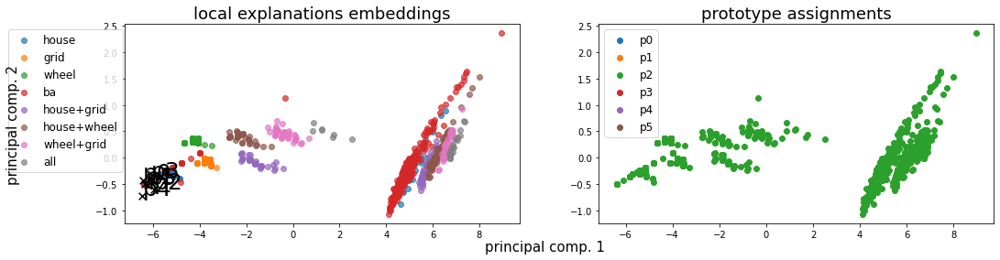

Alpha norms:
tensor([[0.9595, 1.0000, 0.9094, 0.7717, 0.9062, 0.8726],
        [0.8822, 0.8649, 0.8276, 1.0000, 0.9040, 0.7665]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.258763 +- 0.000000
Concept distribution:  (array([2], dtype=int64), array([970], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 0.24247, LEN: 0.088341, AccxC: 0.48, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.24807, V. LEN 0.10
  2: Loss: 0.18472, LEN: 0.087954, AccxC: 0.54, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.19910, V. LEN 0.10
  3: Loss: 0.14765, LEN: 0.087587, AccxC: 0.54, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.18689, V. LEN 0.10
  4: Loss: 0.14446, LEN: 0.087135, AccxC: 0.51, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.17576, V. LEN 0.10
  5: Loss: 0.13422, LEN: 0.086768, AccxC: 0.50, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.16677, V. LEN 0.10
  6: Loss: 0.12541, LEN: 0.086424, AccxC: 0.52, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.16157, V.

 74: Loss: 0.06536, LEN: 0.060362, AccxC: 0.76, AccO: 0.76, V. Acc: 0.83, V. Loss: 0.06932, V. LEN 0.06
 75: Loss: 0.06548, LEN: 0.060594, AccxC: 0.77, AccO: 0.76, V. Acc: 0.82, V. Loss: 0.07297, V. LEN 0.06
 76: Loss: 0.06292, LEN: 0.058659, AccxC: 0.78, AccO: 0.78, V. Acc: 0.82, V. Loss: 0.07457, V. LEN 0.06
 77: Loss: 0.06194, LEN: 0.057820, AccxC: 0.76, AccO: 0.76, V. Acc: 0.82, V. Loss: 0.07097, V. LEN 0.06
 78: Loss: 0.06125, LEN: 0.057909, AccxC: 0.77, AccO: 0.77, V. Acc: 0.82, V. Loss: 0.06810, V. LEN 0.06
 79: Loss: 0.06339, LEN: 0.059326, AccxC: 0.79, AccO: 0.79, V. Acc: 0.82, V. Loss: 0.06726, V. LEN 0.06


 80: Loss: 0.06087, LEN: 0.057039, AccxC: 0.77, AccO: 0.77, V. Acc: 0.83, V. Loss: 0.06627, V. LEN 0.06
 81: Loss: 0.06296, LEN: 0.058980, AccxC: 0.77, AccO: 0.77, V. Acc: 0.78, V. Loss: 0.08075, V. LEN 0.07
 82: Loss: 0.05967, LEN: 0.055963, AccxC: 0.76, AccO: 0.76, V. Acc: 0.83, V. Loss: 0.06582, V. LEN 0.06
 83: Loss: 0.06279, LEN: 0.059208, AccxC: 0.76, AccO: 0.76, V.

153: Loss: 0.03041, LEN: 0.028694, AccxC: 0.89, AccO: 0.89, V. Acc: 0.93, V. Loss: 0.02746, V. LEN 0.02
154: Loss: 0.02918, LEN: 0.027252, AccxC: 0.89, AccO: 0.89, V. Acc: 0.95, V. Loss: 0.02307, V. LEN 0.02
155: Loss: 0.02786, LEN: 0.025961, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.02828, V. LEN 0.02
156: Loss: 0.02799, LEN: 0.026183, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.02925, V. LEN 0.02
157: Loss: 0.02710, LEN: 0.025418, AccxC: 0.90, AccO: 0.90, V. Acc: 0.87, V. Loss: 0.03384, V. LEN 0.03
158: Loss: 0.03062, LEN: 0.029205, AccxC: 0.90, AccO: 0.89, V. Acc: 0.87, V. Loss: 0.03513, V. LEN 0.03
159: Loss: 0.02792, LEN: 0.026269, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.02523, V. LEN 0.02


160: Loss: 0.03053, LEN: 0.028961, AccxC: 0.88, AccO: 0.88, V. Acc: 0.94, V. Loss: 0.02301, V. LEN 0.02
161: Loss: 0.02820, LEN: 0.026483, AccxC: 0.89, AccO: 0.89, V. Acc: 0.96, V. Loss: 0.01949, V. LEN 0.02
162: Loss: 0.03254, LEN: 0.031203, AccxC: 0.87, AccO: 0.87, V.

232: Loss: 0.02052, LEN: 0.019823, AccxC: 0.92, AccO: 0.92, V. Acc: 0.90, V. Loss: 0.02293, V. LEN 0.02
233: Loss: 0.01840, LEN: 0.017786, AccxC: 0.92, AccO: 0.92, V. Acc: 0.89, V. Loss: 0.02482, V. LEN 0.02
234: Loss: 0.02021, LEN: 0.019486, AccxC: 0.92, AccO: 0.92, V. Acc: 0.91, V. Loss: 0.02087, V. LEN 0.02
235: Loss: 0.01933, LEN: 0.018657, AccxC: 0.92, AccO: 0.92, V. Acc: 0.91, V. Loss: 0.02067, V. LEN 0.02
236: Loss: 0.02020, LEN: 0.019507, AccxC: 0.92, AccO: 0.92, V. Acc: 0.89, V. Loss: 0.02612, V. LEN 0.02
237: Loss: 0.01757, LEN: 0.016981, AccxC: 0.93, AccO: 0.93, V. Acc: 0.93, V. Loss: 0.01723, V. LEN 0.02
238: Loss: 0.02033, LEN: 0.019629, AccxC: 0.93, AccO: 0.93, V. Acc: 0.91, V. Loss: 0.02232, V. LEN 0.02
239: Loss: 0.01722, LEN: 0.016651, AccxC: 0.93, AccO: 0.93, V. Acc: 0.91, V. Loss: 0.02107, V. LEN 0.02


240: Loss: 0.01708, LEN: 0.016501, AccxC: 0.92, AccO: 0.92, V. Acc: 0.86, V. Loss: 0.03545, V. LEN 0.03
241: Loss: 0.01711, LEN: 0.016440, AccxC: 0.93, AccO: 0.93, V.

305: Loss: 0.01455, LEN: 0.014112, AccxC: 0.94, AccO: 0.94, V. Acc: 0.90, V. Loss: 0.02153, V. LEN 0.02
306: Loss: 0.01664, LEN: 0.016030, AccxC: 0.95, AccO: 0.95, V. Acc: 0.89, V. Loss: 0.02209, V. LEN 0.02
307: Loss: 0.01463, LEN: 0.014180, AccxC: 0.94, AccO: 0.94, V. Acc: 0.89, V. Loss: 0.02176, V. LEN 0.02
308: Loss: 0.01383, LEN: 0.013308, AccxC: 0.94, AccO: 0.94, V. Acc: 0.89, V. Loss: 0.02212, V. LEN 0.02
309: Loss: 0.01589, LEN: 0.015502, AccxC: 0.94, AccO: 0.94, V. Acc: 0.90, V. Loss: 0.02068, V. LEN 0.02
310: Loss: 0.01625, LEN: 0.015768, AccxC: 0.93, AccO: 0.93, V. Acc: 0.81, V. Loss: 0.03258, V. LEN 0.03
311: Loss: 0.01423, LEN: 0.013779, AccxC: 0.94, AccO: 0.94, V. Acc: 0.91, V. Loss: 0.01851, V. LEN 0.02
312: Loss: 0.01482, LEN: 0.014251, AccxC: 0.95, AccO: 0.95, V. Acc: 0.94, V. Loss: 0.01363, V. LEN 0.01
313: Loss: 0.01488, LEN: 0.014469, AccxC: 0.94, AccO: 0.94, V. Acc: 0.89, V. Loss: 0.02148, V. LEN 0.02
314: Loss: 0.01470, LEN: 0.014253, AccxC: 0.95, AccO: 0.95, V. A

384: Loss: 0.01165, LEN: 0.011357, AccxC: 0.96, AccO: 0.96, V. Acc: 0.89, V. Loss: 0.01967, V. LEN 0.02
385: Loss: 0.01320, LEN: 0.012910, AccxC: 0.95, AccO: 0.95, V. Acc: 0.89, V. Loss: 0.02013, V. LEN 0.02
386: Loss: 0.01637, LEN: 0.016089, AccxC: 0.95, AccO: 0.95, V. Acc: 0.89, V. Loss: 0.02053, V. LEN 0.02
Early Stopping
Loading model at epoch 285
Best epoch: 285
Trained lasted for 199 seconds
(array([0., 1., 2., 3., 4., 5., 6., 7.], dtype=float32), array([121, 162, 157, 251,  78, 102,  73,  26], dtype=int64))


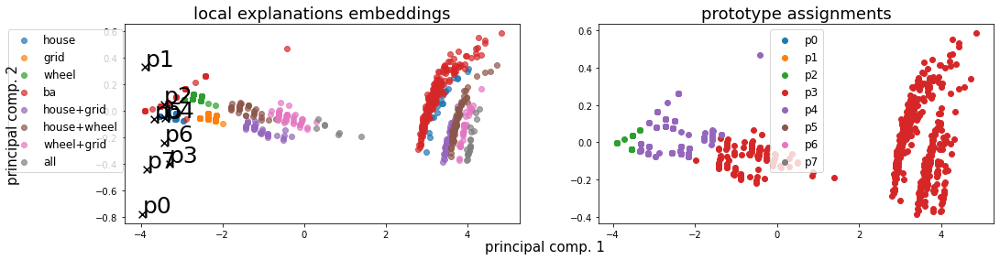

Alpha norms:
tensor([[1.0000, 0.7935, 0.9836, 0.9568, 0.8002, 0.8796, 0.8436, 0.8286],
        [0.8038, 0.9233, 0.9012, 0.9027, 1.0000, 0.9723, 0.8571, 0.9484]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.487284 +- 0.119514
Concept distribution:  (array([2, 3, 4], dtype=int64), array([ 46, 492, 432], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 0.21514, LEN: 0.075589, AccxC: 0.53, AccO: 0.07, V. Acc: 0.08, V. Loss: 0.22741, V. LEN 0.09
  2: Loss: 0.18535, LEN: 0.075485, AccxC: 0.55, AccO: 0.10, V. Acc: 0.01, V. Loss: 0.21124, V. LEN 0.09
  3: Loss: 0.15832, LEN: 0.075550, AccxC: 0.55, AccO: 0.35, V. Acc: 0.28, V. Loss: 0.17569, V. LEN 0.09
  4: Loss: 0.14487, LEN: 0.075432, AccxC: 0.59, AccO: 0.29, V. Acc: 0.38, V. Loss: 0.17744, V. LEN 0.09
  5: Loss: 0.12604, LEN: 0.075405, AccxC: 0.57, AccO: 0.29, V. Acc: 0.23, V. Loss: 0.14010, V. LEN 0.09
  6: Loss: 0.11242, LEN: 0.075760, AccxC: 0.55

 76: Loss: 0.06520, LEN: 0.060993, AccxC: 0.77, AccO: 0.75, V. Acc: 0.83, V. Loss: 0.06413, V. LEN 0.06
 77: Loss: 0.06294, LEN: 0.059556, AccxC: 0.76, AccO: 0.76, V. Acc: 0.87, V. Loss: 0.06202, V. LEN 0.06
 78: Loss: 0.06529, LEN: 0.061864, AccxC: 0.74, AccO: 0.74, V. Acc: 0.86, V. Loss: 0.06257, V. LEN 0.06
 79: Loss: 0.06134, LEN: 0.057679, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07207, V. LEN 0.06


 80: Loss: 0.06511, LEN: 0.061309, AccxC: 0.77, AccO: 0.77, V. Acc: 0.77, V. Loss: 0.06991, V. LEN 0.07
 81: Loss: 0.06590, LEN: 0.061763, AccxC: 0.74, AccO: 0.74, V. Acc: 0.77, V. Loss: 0.06999, V. LEN 0.06
 82: Loss: 0.06099, LEN: 0.057415, AccxC: 0.77, AccO: 0.77, V. Acc: 0.85, V. Loss: 0.06275, V. LEN 0.06
 83: Loss: 0.06179, LEN: 0.058564, AccxC: 0.76, AccO: 0.76, V. Acc: 0.77, V. Loss: 0.06807, V. LEN 0.06
 84: Loss: 0.06291, LEN: 0.059044, AccxC: 0.75, AccO: 0.75, V. Acc: 0.72, V. Loss: 0.07563, V. LEN 0.07
 85: Loss: 0.06619, LEN: 0.062470, AccxC: 0.73, AccO: 0.73, V.

152: Loss: 0.02899, LEN: 0.028008, AccxC: 0.91, AccO: 0.87, V. Acc: 0.91, V. Loss: 0.03056, V. LEN 0.03
153: Loss: 0.03467, LEN: 0.033859, AccxC: 0.90, AccO: 0.85, V. Acc: 0.93, V. Loss: 0.02320, V. LEN 0.02
154: Loss: 0.03388, LEN: 0.032913, AccxC: 0.90, AccO: 0.84, V. Acc: 0.83, V. Loss: 0.03992, V. LEN 0.04
155: Loss: 0.02985, LEN: 0.028933, AccxC: 0.92, AccO: 0.84, V. Acc: 0.93, V. Loss: 0.02302, V. LEN 0.02
156: Loss: 0.02726, LEN: 0.026415, AccxC: 0.92, AccO: 0.88, V. Acc: 0.91, V. Loss: 0.03082, V. LEN 0.03
157: Loss: 0.03130, LEN: 0.030420, AccxC: 0.92, AccO: 0.87, V. Acc: 0.86, V. Loss: 0.02467, V. LEN 0.02
158: Loss: 0.02956, LEN: 0.028745, AccxC: 0.91, AccO: 0.85, V. Acc: 0.89, V. Loss: 0.02225, V. LEN 0.02
159: Loss: 0.02622, LEN: 0.025359, AccxC: 0.92, AccO: 0.88, V. Acc: 0.94, V. Loss: 0.01766, V. LEN 0.02

------------------------------------------------------------------------------------
Has double activations  tensor(53)
But only for wrong predictions



-------------

228: Loss: 0.01373, LEN: 0.013101, AccxC: 0.97, AccO: 0.97, V. Acc: 0.97, V. Loss: 0.01786, V. LEN 0.02
229: Loss: 0.01277, LEN: 0.012116, AccxC: 0.97, AccO: 0.97, V. Acc: 0.97, V. Loss: 0.01860, V. LEN 0.02
230: Loss: 0.02155, LEN: 0.020987, AccxC: 0.94, AccO: 0.94, V. Acc: 0.98, V. Loss: 0.01459, V. LEN 0.01
231: Loss: 0.01687, LEN: 0.016331, AccxC: 0.95, AccO: 0.95, V. Acc: 0.98, V. Loss: 0.01136, V. LEN 0.01
232: Loss: 0.01974, LEN: 0.019208, AccxC: 0.94, AccO: 0.94, V. Acc: 0.97, V. Loss: 0.01299, V. LEN 0.01
233: Loss: 0.01658, LEN: 0.016101, AccxC: 0.95, AccO: 0.95, V. Acc: 0.98, V. Loss: 0.01104, V. LEN 0.01
234: Loss: 0.01286, LEN: 0.012354, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.01077, V. LEN 0.01
235: Loss: 0.01269, LEN: 0.012184, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.01073, V. LEN 0.01
236: Loss: 0.01625, LEN: 0.015672, AccxC: 0.95, AccO: 0.95, V. Acc: 0.97, V. Loss: 0.01861, V. LEN 0.02
237: Loss: 0.01888, LEN: 0.018490, AccxC: 0.96, AccO: 0.96, V. A

307: Loss: 0.01474, LEN: 0.014423, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.01066, V. LEN 0.01
308: Loss: 0.01098, LEN: 0.010610, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.01072, V. LEN 0.01
309: Loss: 0.01155, LEN: 0.011198, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.01044, V. LEN 0.01
310: Loss: 0.01117, LEN: 0.010828, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.01060, V. LEN 0.01
311: Loss: 0.01026, LEN: 0.009912, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01000, V. LEN 0.01
312: Loss: 0.01254, LEN: 0.012186, AccxC: 0.97, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.00972, V. LEN 0.01
313: Loss: 0.01099, LEN: 0.010535, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.00971, V. LEN 0.01
314: Loss: 0.01261, LEN: 0.012157, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.00986, V. LEN 0.01
315: Loss: 0.01213, LEN: 0.011784, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.01028, V. LEN 0.01
316: Loss: 0.01022, LEN: 0.009939, AccxC: 0.97, AccO: 0.98, V. A

386: Loss: 0.01297, LEN: 0.012629, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.00920, V. LEN 0.01
387: Loss: 0.01844, LEN: 0.017931, AccxC: 0.95, AccO: 0.95, V. Acc: 0.98, V. Loss: 0.00941, V. LEN 0.01
388: Loss: 0.02258, LEN: 0.022143, AccxC: 0.96, AccO: 0.96, V. Acc: 0.97, V. Loss: 0.01870, V. LEN 0.02
389: Loss: 0.01799, LEN: 0.017332, AccxC: 0.95, AccO: 0.95, V. Acc: 0.98, V. Loss: 0.00943, V. LEN 0.01
390: Loss: 0.01891, LEN: 0.018432, AccxC: 0.95, AccO: 0.95, V. Acc: 0.98, V. Loss: 0.01136, V. LEN 0.01
391: Loss: 0.01474, LEN: 0.014380, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.00998, V. LEN 0.01
392: Loss: 0.01152, LEN: 0.011091, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.01017, V. LEN 0.01
393: Loss: 0.01111, LEN: 0.010660, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.01122, V. LEN 0.01
394: Loss: 0.01171, LEN: 0.011360, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.00952, V. LEN 0.01
395: Loss: 0.01107, LEN: 0.010667, AccxC: 0.97, AccO: 0.97, V. A

465: Loss: 0.01138, LEN: 0.011118, AccxC: 0.97, AccO: 0.97, V. Acc: 0.97, V. Loss: 0.00963, V. LEN 0.01
466: Loss: 0.00984, LEN: 0.009515, AccxC: 0.97, AccO: 0.98, V. Acc: 0.96, V. Loss: 0.02047, V. LEN 0.02
467: Loss: 0.01419, LEN: 0.013929, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.00838, V. LEN 0.01
468: Loss: 0.01562, LEN: 0.015111, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.00831, V. LEN 0.01
469: Loss: 0.01491, LEN: 0.014458, AccxC: 0.97, AccO: 0.97, V. Acc: 0.97, V. Loss: 0.01137, V. LEN 0.01
470: Loss: 0.01190, LEN: 0.011609, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.00833, V. LEN 0.01
471: Loss: 0.01086, LEN: 0.010573, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.00807, V. LEN 0.01
472: Loss: 0.01162, LEN: 0.011151, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.00896, V. LEN 0.01
473: Loss: 0.01058, LEN: 0.010214, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.00812, V. LEN 0.01
474: Loss: 0.01460, LEN: 0.014379, AccxC: 0.97, AccO: 0.97, V. A

544: Loss: 0.01780, LEN: 0.017293, AccxC: 0.95, AccO: 0.95, V. Acc: 0.97, V. Loss: 0.01102, V. LEN 0.01
545: Loss: 0.01262, LEN: 0.012151, AccxC: 0.97, AccO: 0.97, V. Acc: 0.96, V. Loss: 0.02068, V. LEN 0.02
546: Loss: 0.01168, LEN: 0.011430, AccxC: 0.97, AccO: 0.97, V. Acc: 0.97, V. Loss: 0.01091, V. LEN 0.01
547: Loss: 0.01046, LEN: 0.010164, AccxC: 0.97, AccO: 0.97, V. Acc: 0.97, V. Loss: 0.01111, V. LEN 0.01
548: Loss: 0.01107, LEN: 0.010808, AccxC: 0.98, AccO: 0.98, V. Acc: 0.97, V. Loss: 0.01116, V. LEN 0.01
Early Stopping
Loading model at epoch 447
Best epoch: 447
Trained lasted for 884 seconds


In [8]:
expls = []
for num_proto in [2, 4, 6, 8]:
    batch_sampler = utils.GroupBatchSampler(num_input_graphs=128, drop_last=False, belonging=np.array(belonging_train))
    train_group_loader = DataLoader(dataset_train, batch_sampler=batch_sampler)

    batch_sampler = utils.GroupBatchSampler(num_input_graphs=256, drop_last=False, belonging=np.array(belonging_val))
    val_group_loader = DataLoader(dataset_val, batch_sampler=batch_sampler)

    batch_sampler = utils.GroupBatchSampler(num_input_graphs=256, drop_last=False, belonging=np.array(belonging_test))
    test_group_loader = DataLoader(dataset_test, batch_sampler=batch_sampler)


    torch.manual_seed(42)
    hyper = {
        "len_lr": 0.0005,
        "proto_lr": 0.001,
        "le_emb_lr": 0.001,
        "coeff_divloss": 0.000,
        "coeff_pdist": 0.,
        "coeff_gae": 0.,
        "coeff_r1": 0.09,
        "coeff_r2": 0.00099,
        "coeff_ce": 0.0,
        "coeff_de": 0.,
        "coeff_logic_loss": 0.00,
        "focal_gamma": 2, #3
        "focal_alpha": -1,
        "ts": 1,
        "te": 1,
        "focal_loss": True,
        "debug_prototypes": False,
        "num_prototypes": num_proto,
        "dim_prototypes": 10,
        "num_le_features": 5,
        "activation": "leaky",
        "assign_func": "straight_sim",
        "LEN_temperature": 1,
        "remove_attention": True,
        "log_images": True,
        "log_models": True,
        "num_epochs": 2000
    }

    len_model    = models.LEN(hyper["num_prototypes"], 
                              hyper["LEN_temperature"], 
                              remove_attention=hyper["remove_attention"]).to(device)
    le_model     = models.LEEmbedder(num_features=hyper["num_le_features"], 
                                     activation=hyper["activation"], 
                                     num_hidden=hyper["dim_prototypes"]).to(device)
    expl         = models.GlobalExplainer(len_model, 
                                   le_model, 
                                   train_group_loader, 
                                   val_group_loader, 
                                   device, 
                                   hyper_params=hyper,
                                   classes_names=bamultishapes_classes_names,
                                   dataset_name=DATASET_NAME).to(device)
    expl.iterate(num_epochs=hyper["num_epochs"], log_wandb=False, name_wandb="")
    with open(f'../logs/model_focal_num_proto_{hyper["num_prototypes"]}_BAMultiShapes_allsamples.pkl', 'wb') as handle:
        pickle.dump(expl, handle)

(array([0., 1., 2., 3., 4., 5., 6., 7.], dtype=float32), array([121, 162, 157, 251,  78, 102,  73,  26], dtype=int64))


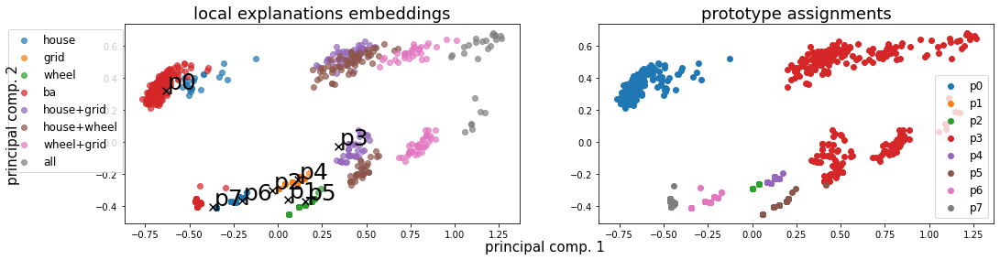

Alpha norms:
tensor([[0.0991, 0.4121, 1.0000, 0.7079, 0.6497, 0.7776, 0.4532, 0.5436],
        [0.2471, 0.5216, 0.7247, 1.0000, 0.4224, 0.3996, 0.4468, 0.4404]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.894581 +- 0.218751
Concept distribution:  (array([0, 2, 3, 4, 5, 6, 7], dtype=int64), array([235,  57, 278, 105, 158, 102,  35], dtype=int64))
Logic formulas:
For class 0:
0.965 (feature007) | (feature005) | (feature006) | ((feature000) | (feature002)
For class 1:
0.97875 (feature003) | (feature004 & feature006) | (feature006 & feature002) | (feature005 & feature004) | (feature005 & feature002) | (feature005 & feature006) | (feature004 & feature003) | (feature006 & feature003) | (feature005 & feature003)
Accuracy as classifier:  0.9588
LEN fidelity:  tensor(0.9588)



In [9]:
expl.inspect_embedding(train_group_loader)

#### plots

num_proto:  2 Fidelity: tensor(0.9300)
(array([0., 1., 2., 3., 4., 5., 6., 7.], dtype=float32), array([ 9, 14, 19, 31, 10, 16, 15,  1], dtype=int64))


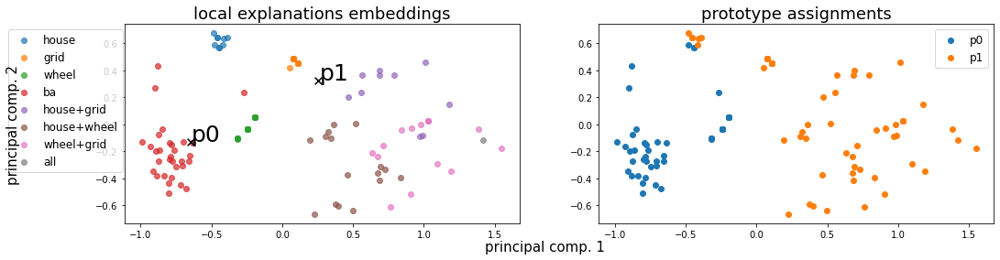

Alpha norms:
tensor([[0.4377, 1.0000],
        [0.2081, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.421485 +- 0.163421
Concept distribution:  (array([0, 1], dtype=int64), array([53, 62], dtype=int64))
Logic formulas:
For class 0:
0.93 ((feature000)
For class 1:
0.93 (feature001) | ((feature000 & feature001)
Accuracy as classifier:  0.93
LEN fidelity:  tensor(0.9300)

num_proto:  4 Fidelity: tensor(0.9300)
(array([0., 1., 2., 3., 4., 5., 6., 7.], dtype=float32), array([ 9, 14, 19, 31, 10, 16, 15,  1], dtype=int64))


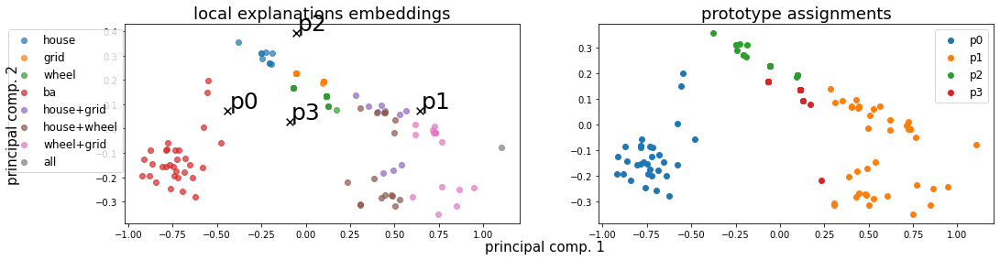

Alpha norms:
tensor([[0.3237, 1.0000, 0.2269, 0.3751],
        [0.4839, 1.0000, 0.3351, 0.4856]], grad_fn=<DivBackward0>)
Concept Purity: 0.731137 +- 0.259139
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([31, 41, 23, 20], dtype=int64))
Logic formulas:
For class 0:
0.93 (feature000) | (feature003)
For class 1:
0.93 (feature001) | ((feature002) | (feature003 & feature001) | ((feature002 & feature003) | ((feature002 & feature001)
Accuracy as classifier:  0.93
LEN fidelity:  tensor(0.9300)

num_proto:  6 Fidelity: tensor(0.9500)
(array([0., 1., 2., 3., 4., 5., 6., 7.], dtype=float32), array([ 9, 14, 19, 31, 10, 16, 15,  1], dtype=int64))


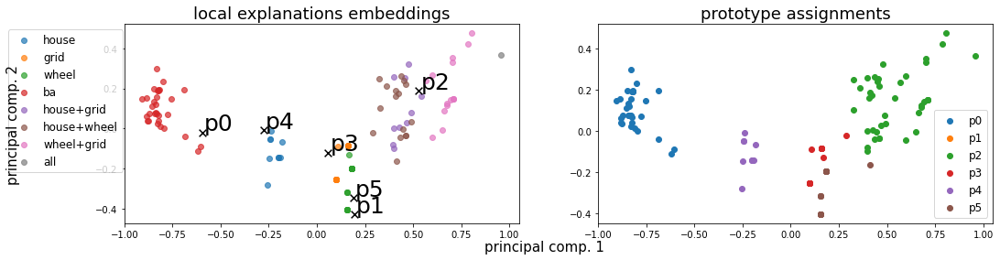

Alpha norms:
tensor([[0.4711, 0.2848, 1.0000, 0.4634, 0.2916, 0.4418],
        [0.0857, 0.1041, 1.0000, 0.1518, 0.0874, 0.1224]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.839474 +- 0.236718
Concept distribution:  (array([0, 2, 3, 4, 5], dtype=int64), array([31, 40, 16,  9, 19], dtype=int64))
Logic formulas:
For class 0:
0.95 (feature000) | (feature005) | (feature004)
For class 1:
0.95 (feature002) | (feature003) | (feature005 & feature003) | (feature004 & feature005) | (feature004 & feature003) | (feature005 & feature002) | (feature003 & feature002)
Accuracy as classifier:  0.95
LEN fidelity:  tensor(0.9500)

num_proto:  8 Fidelity: tensor(0.9500)
(array([0., 1., 2., 3., 4., 5., 6., 7.], dtype=float32), array([ 9, 14, 19, 31, 10, 16, 15,  1], dtype=int64))


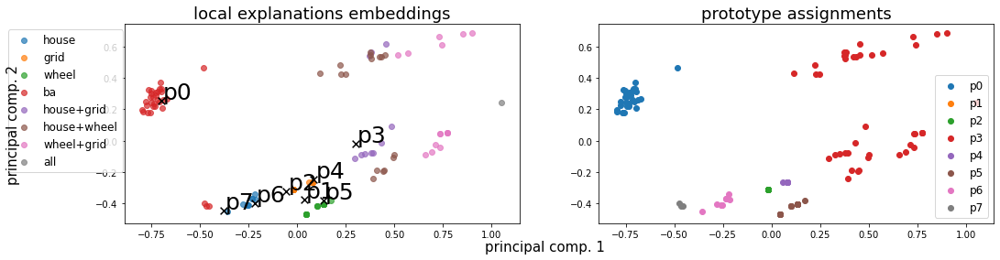

Alpha norms:
tensor([[0.0991, 0.4121, 1.0000, 0.7079, 0.6497, 0.7776, 0.4532, 0.5436],
        [0.2471, 0.5216, 0.7247, 1.0000, 0.4224, 0.3996, 0.4468, 0.4404]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.911565 +- 0.216622
Concept distribution:  (array([0, 2, 3, 4, 5, 6, 7], dtype=int64), array([28,  8, 42,  6, 19,  9,  3], dtype=int64))
Logic formulas:
For class 0:
0.97 (feature002) | (feature005) | (feature007) | ((feature000) | (feature006)
For class 1:
0.98 (feature003) | (feature005 & feature002) | (feature005 & feature006) | (feature004 & feature006) | (feature006 & feature002) | (feature005 & feature003) | (feature002 & feature003)
Accuracy as classifier:  0.95
LEN fidelity:  tensor(0.9500)



In [13]:
batch_sampler = utils.GroupBatchSampler(num_input_graphs=128, drop_last=False, belonging=np.array(belonging_train))
train_group_loader = DataLoader(dataset_train, batch_sampler=batch_sampler)

batch_sampler = utils.GroupBatchSampler(num_input_graphs=256, drop_last=False, belonging=np.array(belonging_val))
val_group_loader = DataLoader(dataset_val, batch_sampler=batch_sampler)

batch_sampler = utils.GroupBatchSampler(num_input_graphs=256, drop_last=False, belonging=np.array(belonging_test))
test_group_loader = DataLoader(dataset_test, batch_sampler=batch_sampler)

metrics = []
for num_p in [2, 4, 6, 8]:
    with open(f'../logs/model_focal_num_proto_{num_p}_BAMultiShapes_allsamples.pkl', 'rb') as handle:
        uno = pickle.load(handle)
        del uno.dataloader
        del uno.val_dataloader
        metrics.append(uno)
        print("num_proto: ", num_p, "Fidelity:", uno.val_metrics[uno.early_stopping.best_epoch-1]["acc_overall"])
        uno.inspect_embedding(val_group_loader)
#expls = [uno, due]

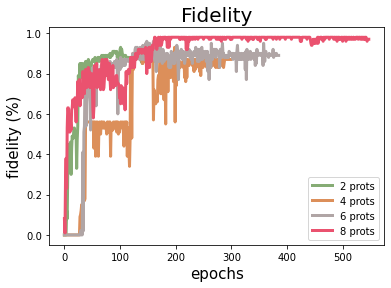

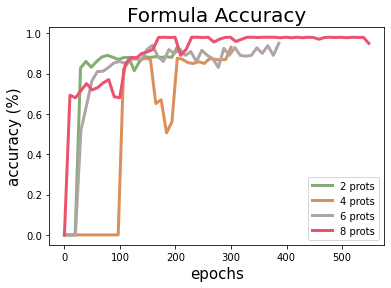

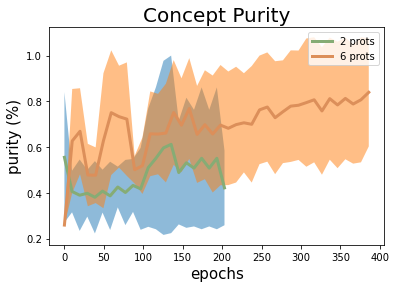

In [12]:
cs = ["#86ac75", "#dc8f5a", "#b0a5a5", "#ea526f", "blue", "red", "black", "purple"]

c = 0
for i , m in enumerate(metrics):
    #if i % 2 == 1: continue
    plt.plot([e["acc_overall"] for e in m.val_metrics], label=f"{m.hyper['num_prototypes']} prots", linewidth=3, color=cs[c])
    c += 1
plt.legend()
plt.title("Fidelity", size=20)
plt.xlabel("epochs", size=15)
plt.ylabel("fidelity (%)", size=15)
#plt.savefig("fidelity_num_proto_bamultishapes.pdf")
plt.show()

c = 0
for i , m in enumerate(metrics):
    #if i % 2 == 1: continue
    plt.plot(np.linspace(0, len([e["acc_overall"] for e in m.val_metrics]), num=len([e["logic_acc_clf"] for e in m.val_logic_metrics])), [e["logic_acc_clf"] for e in m.val_logic_metrics], label=f"{m.hyper['num_prototypes']} prots", linewidth=3, color=cs[c])
    c += 1
plt.legend()
plt.title("Formula Accuracy", size=20)
plt.xlabel("epochs", size=15)
plt.ylabel("accuracy (%)", size=15)
#plt.savefig("acc_num_proto_bamultishapes.pdf")
plt.show()

c = 0
for i , m in enumerate(metrics):
    if i % 2 == 1: continue
    purity     = np.array([e["concept_purity"] for e in m.val_logic_metrics])
    std_purity = np.array([e["concept_purity_std"] for e in m.val_logic_metrics])
    plt.plot(np.linspace(0, len([e["acc_overall"] for e in m.val_metrics]), num=len(purity)), purity, label=f"{m.hyper['num_prototypes']} prots", linewidth=3, color=cs[c])
    plt.fill_between(np.linspace(0, len([e["acc_overall"] for e in m.val_metrics]), num=len([e["logic_acc_clf"] for e in m.val_logic_metrics])), purity-std_purity, purity+std_purity, alpha=0.5)
    c += 1

plt.legend()
plt.title("Concept Purity", size=20)
plt.xlabel("epochs", size=15)
plt.ylabel("purity (%)", size=15)
#plt.savefig("purity_num_proto_bamultishapes.pdf")
plt.show()

In [50]:
del metrics

## Ablation on Deltas

(array([0., 1., 2., 3., 4., 5., 6., 7.], dtype=float32), array([121, 162, 157, 251,  78, 102,  73,  26], dtype=int64))


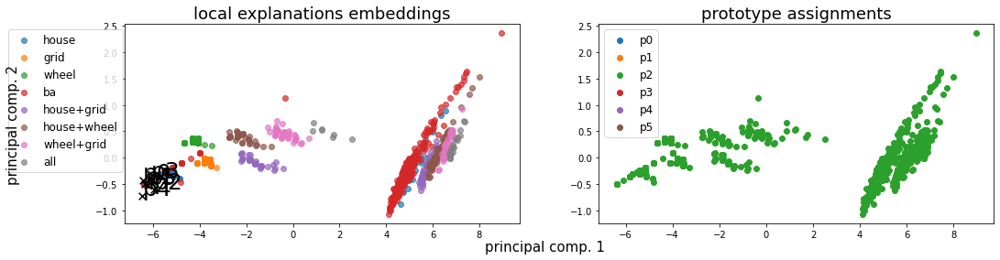

Alpha norms:
tensor([[0.9595, 1.0000, 0.9094, 0.7717, 0.9062, 0.8726],
        [0.8822, 0.8649, 0.8276, 1.0000, 0.9040, 0.7665]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.258763 +- 0.000000
Concept distribution:  (array([2], dtype=int64), array([970], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 0.12640, LEN: 0.088338, AccxC: 0.45, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.12433, V. LEN 0.10
  2: Loss: 0.10057, LEN: 0.087918, AccxC: 0.45, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.10597, V. LEN 0.10
  3: Loss: 0.09072, LEN: 0.087515, AccxC: 0.45, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.10222, V. LEN 0.10
  4: Loss: 0.08949, LEN: 0.087144, AccxC: 0.50, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.10200, V. LEN 0.10
  5: Loss: 0.08895, LEN: 0.086719, AccxC: 0.53, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.10151, V. LEN 0.10
  6: Loss: 0.08849, LEN: 0.086342, AccxC: 0.50, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.10084, V.

 77: Loss: 0.03899, LEN: 0.038825, AccxC: 0.87, AccO: 0.87, V. Acc: 0.87, V. Loss: 0.03990, V. LEN 0.04
 78: Loss: 0.03708, LEN: 0.036918, AccxC: 0.88, AccO: 0.88, V. Acc: 0.87, V. Loss: 0.03937, V. LEN 0.04
 79: Loss: 0.03765, LEN: 0.037490, AccxC: 0.87, AccO: 0.87, V. Acc: 0.87, V. Loss: 0.03874, V. LEN 0.04


 80: Loss: 0.03561, LEN: 0.035454, AccxC: 0.88, AccO: 0.88, V. Acc: 0.87, V. Loss: 0.03803, V. LEN 0.04
 81: Loss: 0.03601, LEN: 0.035848, AccxC: 0.87, AccO: 0.87, V. Acc: 0.87, V. Loss: 0.03746, V. LEN 0.04
 82: Loss: 0.03457, LEN: 0.034409, AccxC: 0.88, AccO: 0.88, V. Acc: 0.86, V. Loss: 0.04014, V. LEN 0.04
 83: Loss: 0.03567, LEN: 0.035527, AccxC: 0.87, AccO: 0.87, V. Acc: 0.87, V. Loss: 0.03633, V. LEN 0.04
 84: Loss: 0.03391, LEN: 0.033768, AccxC: 0.88, AccO: 0.88, V. Acc: 0.86, V. Loss: 0.03919, V. LEN 0.04
 85: Loss: 0.03312, LEN: 0.032982, AccxC: 0.87, AccO: 0.87, V. Acc: 0.87, V. Loss: 0.03513, V. LEN 0.04
 86: Loss: 0.03217, LEN: 0.032018, AccxC: 0.88, AccO: 0.88, V.

156: Loss: 0.02265, LEN: 0.022543, AccxC: 0.91, AccO: 0.91, V. Acc: 0.89, V. Loss: 0.02420, V. LEN 0.02
157: Loss: 0.02248, LEN: 0.022387, AccxC: 0.91, AccO: 0.91, V. Acc: 0.90, V. Loss: 0.02312, V. LEN 0.02
158: Loss: 0.02348, LEN: 0.023382, AccxC: 0.91, AccO: 0.91, V. Acc: 0.89, V. Loss: 0.02393, V. LEN 0.02
159: Loss: 0.02347, LEN: 0.023379, AccxC: 0.91, AccO: 0.91, V. Acc: 0.89, V. Loss: 0.02382, V. LEN 0.02


160: Loss: 0.02578, LEN: 0.025672, AccxC: 0.90, AccO: 0.90, V. Acc: 0.90, V. Loss: 0.02267, V. LEN 0.02
161: Loss: 0.02218, LEN: 0.022086, AccxC: 0.91, AccO: 0.91, V. Acc: 0.92, V. Loss: 0.02003, V. LEN 0.02
162: Loss: 0.02450, LEN: 0.024386, AccxC: 0.91, AccO: 0.91, V. Acc: 0.88, V. Loss: 0.03294, V. LEN 0.03
163: Loss: 0.02328, LEN: 0.023193, AccxC: 0.91, AccO: 0.91, V. Acc: 0.91, V. Loss: 0.02105, V. LEN 0.02
164: Loss: 0.02550, LEN: 0.025412, AccxC: 0.91, AccO: 0.91, V. Acc: 0.89, V. Loss: 0.03143, V. LEN 0.03
165: Loss: 0.02815, LEN: 0.028046, AccxC: 0.90, AccO: 0.90, V.

235: Loss: 0.01943, LEN: 0.019350, AccxC: 0.91, AccO: 0.91, V. Acc: 0.92, V. Loss: 0.01774, V. LEN 0.02
236: Loss: 0.02702, LEN: 0.026929, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.01748, V. LEN 0.02
237: Loss: 0.02166, LEN: 0.021559, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.01905, V. LEN 0.02
238: Loss: 0.01949, LEN: 0.019413, AccxC: 0.91, AccO: 0.91, V. Acc: 0.92, V. Loss: 0.01715, V. LEN 0.02
239: Loss: 0.02604, LEN: 0.025932, AccxC: 0.91, AccO: 0.91, V. Acc: 0.92, V. Loss: 0.01724, V. LEN 0.02


240: Loss: 0.02175, LEN: 0.021658, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.02095, V. LEN 0.02
241: Loss: 0.02295, LEN: 0.022870, AccxC: 0.91, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.01736, V. LEN 0.02
242: Loss: 0.02027, LEN: 0.020155, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.01745, V. LEN 0.02
243: Loss: 0.02108, LEN: 0.021002, AccxC: 0.91, AccO: 0.91, V. Acc: 0.92, V. Loss: 0.01746, V. LEN 0.02
244: Loss: 0.02160, LEN: 0.021502, AccxC: 0.91, AccO: 0.91, V.

314: Loss: 0.01573, LEN: 0.015640, AccxC: 0.93, AccO: 0.93, V. Acc: 0.91, V. Loss: 0.01953, V. LEN 0.02
315: Loss: 0.01492, LEN: 0.014846, AccxC: 0.93, AccO: 0.93, V. Acc: 0.91, V. Loss: 0.01942, V. LEN 0.02
316: Loss: 0.01696, LEN: 0.016874, AccxC: 0.94, AccO: 0.94, V. Acc: 0.91, V. Loss: 0.02019, V. LEN 0.02
317: Loss: 0.01700, LEN: 0.016929, AccxC: 0.93, AccO: 0.93, V. Acc: 0.92, V. Loss: 0.01818, V. LEN 0.02
318: Loss: 0.01821, LEN: 0.018126, AccxC: 0.93, AccO: 0.93, V. Acc: 0.92, V. Loss: 0.01821, V. LEN 0.02
319: Loss: 0.01324, LEN: 0.013163, AccxC: 0.94, AccO: 0.94, V. Acc: 0.91, V. Loss: 0.01944, V. LEN 0.02


320: Loss: 0.01571, LEN: 0.015626, AccxC: 0.93, AccO: 0.93, V. Acc: 0.92, V. Loss: 0.01814, V. LEN 0.02
321: Loss: 0.01760, LEN: 0.017517, AccxC: 0.92, AccO: 0.92, V. Acc: 0.91, V. Loss: 0.01939, V. LEN 0.02
322: Loss: 0.01493, LEN: 0.014855, AccxC: 0.92, AccO: 0.92, V. Acc: 0.92, V. Loss: 0.01800, V. LEN 0.02
323: Loss: 0.01620, LEN: 0.016102, AccxC: 0.93, AccO: 0.93, V.

390: Loss: 0.01615, LEN: 0.016085, AccxC: 0.93, AccO: 0.92, V. Acc: 0.88, V. Loss: 0.01885, V. LEN 0.02
391: Loss: 0.01626, LEN: 0.016180, AccxC: 0.93, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.01787, V. LEN 0.02
392: Loss: 0.01507, LEN: 0.015003, AccxC: 0.93, AccO: 0.91, V. Acc: 0.88, V. Loss: 0.01888, V. LEN 0.02
393: Loss: 0.01576, LEN: 0.015668, AccxC: 0.93, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.01763, V. LEN 0.02
394: Loss: 0.01682, LEN: 0.016744, AccxC: 0.93, AccO: 0.90, V. Acc: 0.88, V. Loss: 0.01886, V. LEN 0.02
395: Loss: 0.01617, LEN: 0.016081, AccxC: 0.93, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.01774, V. LEN 0.02
396: Loss: 0.01459, LEN: 0.014508, AccxC: 0.94, AccO: 0.92, V. Acc: 0.87, V. Loss: 0.02035, V. LEN 0.02
397: Loss: 0.01539, LEN: 0.015323, AccxC: 0.93, AccO: 0.92, V. Acc: 0.89, V. Loss: 0.01783, V. LEN 0.02
398: Loss: 0.01483, LEN: 0.014737, AccxC: 0.93, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.01799, V. LEN 0.02
399: Loss: 0.01555, LEN: 0.015476, AccxC: 0.93, AccO: 0.91, V. A

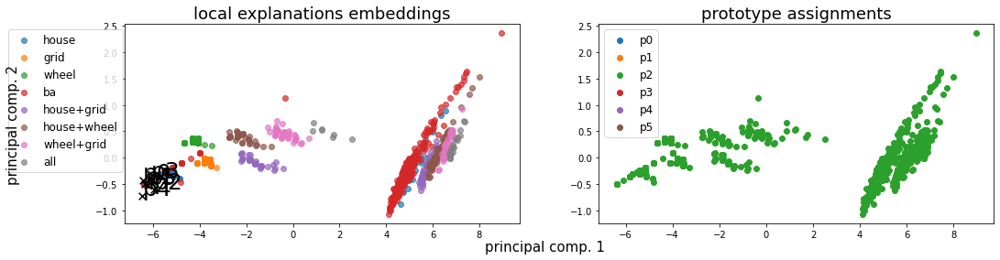

Alpha norms:
tensor([[0.9595, 1.0000, 0.9094, 0.7717, 0.9062, 0.8726],
        [0.8822, 0.8649, 0.8276, 1.0000, 0.9040, 0.7665]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.258763 +- 0.000000
Concept distribution:  (array([2], dtype=int64), array([970], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 0.12305, LEN: 0.088338, AccxC: 0.45, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.12232, V. LEN 0.10
  2: Loss: 0.09952, LEN: 0.087918, AccxC: 0.45, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.10556, V. LEN 0.10
  3: Loss: 0.09051, LEN: 0.087515, AccxC: 0.45, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.10212, V. LEN 0.10
  4: Loss: 0.08937, LEN: 0.087143, AccxC: 0.50, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.10187, V. LEN 0.10
  5: Loss: 0.08882, LEN: 0.086716, AccxC: 0.53, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.10139, V. LEN 0.10
  6: Loss: 0.08835, LEN: 0.086338, AccxC: 0.51, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.10074, V.

 77: Loss: 0.04437, LEN: 0.044036, AccxC: 0.86, AccO: 0.86, V. Acc: 0.82, V. Loss: 0.05727, V. LEN 0.06
 78: Loss: 0.04487, LEN: 0.044547, AccxC: 0.85, AccO: 0.85, V. Acc: 0.81, V. Loss: 0.05951, V. LEN 0.06
 79: Loss: 0.04478, LEN: 0.044444, AccxC: 0.85, AccO: 0.85, V. Acc: 0.82, V. Loss: 0.05693, V. LEN 0.06


 80: Loss: 0.04384, LEN: 0.043514, AccxC: 0.85, AccO: 0.85, V. Acc: 0.84, V. Loss: 0.05553, V. LEN 0.06
 81: Loss: 0.04352, LEN: 0.043191, AccxC: 0.85, AccO: 0.85, V. Acc: 0.87, V. Loss: 0.04753, V. LEN 0.05
 82: Loss: 0.04303, LEN: 0.042682, AccxC: 0.85, AccO: 0.85, V. Acc: 0.87, V. Loss: 0.04634, V. LEN 0.05
 83: Loss: 0.04279, LEN: 0.042461, AccxC: 0.86, AccO: 0.86, V. Acc: 0.87, V. Loss: 0.04582, V. LEN 0.05
 84: Loss: 0.04120, LEN: 0.040865, AccxC: 0.86, AccO: 0.86, V. Acc: 0.82, V. Loss: 0.05689, V. LEN 0.06
 85: Loss: 0.03888, LEN: 0.038536, AccxC: 0.86, AccO: 0.86, V. Acc: 0.87, V. Loss: 0.04479, V. LEN 0.04
 86: Loss: 0.03903, LEN: 0.038681, AccxC: 0.86, AccO: 0.86, V.

156: Loss: 0.02778, LEN: 0.027612, AccxC: 0.87, AccO: 0.87, V. Acc: 0.87, V. Loss: 0.02710, V. LEN 0.03
157: Loss: 0.02771, LEN: 0.027545, AccxC: 0.88, AccO: 0.88, V. Acc: 0.87, V. Loss: 0.02643, V. LEN 0.03
158: Loss: 0.03223, LEN: 0.032060, AccxC: 0.87, AccO: 0.87, V. Acc: 0.87, V. Loss: 0.02902, V. LEN 0.03
159: Loss: 0.02733, LEN: 0.027179, AccxC: 0.87, AccO: 0.87, V. Acc: 0.87, V. Loss: 0.02720, V. LEN 0.03


160: Loss: 0.02829, LEN: 0.028120, AccxC: 0.87, AccO: 0.87, V. Acc: 0.87, V. Loss: 0.02980, V. LEN 0.03
161: Loss: 0.02502, LEN: 0.024854, AccxC: 0.88, AccO: 0.88, V. Acc: 0.87, V. Loss: 0.02847, V. LEN 0.03
162: Loss: 0.03158, LEN: 0.031412, AccxC: 0.87, AccO: 0.87, V. Acc: 0.87, V. Loss: 0.02849, V. LEN 0.03
163: Loss: 0.02515, LEN: 0.024997, AccxC: 0.88, AccO: 0.88, V. Acc: 0.87, V. Loss: 0.02715, V. LEN 0.03
164: Loss: 0.02925, LEN: 0.029087, AccxC: 0.87, AccO: 0.87, V. Acc: 0.87, V. Loss: 0.03109, V. LEN 0.03
165: Loss: 0.03008, LEN: 0.029915, AccxC: 0.87, AccO: 0.87, V.

(array([0., 1., 2., 3., 4., 5., 6., 7.], dtype=float32), array([121, 162, 157, 251,  78, 102,  73,  26], dtype=int64))


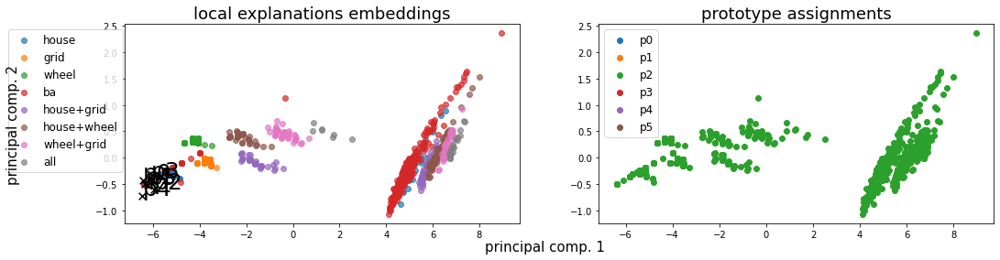

Alpha norms:
tensor([[0.9595, 1.0000, 0.9094, 0.7717, 0.9062, 0.8726],
        [0.8822, 0.8649, 0.8276, 1.0000, 0.9040, 0.7665]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.258763 +- 0.000000
Concept distribution:  (array([2], dtype=int64), array([970], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 3.43599, LEN: 0.088338, AccxC: 0.45, AccO: 0.00, V. Acc: 0.00, V. Loss: 2.11483, V. LEN 0.10
  2: Loss: 1.14419, LEN: 0.087919, AccxC: 0.46, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.50676, V. LEN 0.10
  3: Loss: 0.29654, LEN: 0.087503, AccxC: 0.45, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.20905, V. LEN 0.10
  4: Loss: 0.20523, LEN: 0.087130, AccxC: 0.51, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.23122, V. LEN 0.10
  5: Loss: 0.20256, LEN: 0.086745, AccxC: 0.53, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.21790, V. LEN 0.10
  6: Loss: 0.19561, LEN: 0.086370, AccxC: 0.48, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.19660, V.

 77: Loss: 0.07898, LEN: 0.072541, AccxC: 0.64, AccO: 0.63, V. Acc: 0.65, V. Loss: 0.08656, V. LEN 0.08
 78: Loss: 0.07899, LEN: 0.072729, AccxC: 0.65, AccO: 0.64, V. Acc: 0.77, V. Loss: 0.08250, V. LEN 0.08
 79: Loss: 0.07929, LEN: 0.073058, AccxC: 0.66, AccO: 0.65, V. Acc: 0.66, V. Loss: 0.08592, V. LEN 0.08


 80: Loss: 0.07884, LEN: 0.072617, AccxC: 0.64, AccO: 0.63, V. Acc: 0.66, V. Loss: 0.08548, V. LEN 0.08
 81: Loss: 0.07753, LEN: 0.071762, AccxC: 0.66, AccO: 0.65, V. Acc: 0.74, V. Loss: 0.08282, V. LEN 0.08
 82: Loss: 0.07847, LEN: 0.072316, AccxC: 0.64, AccO: 0.63, V. Acc: 0.68, V. Loss: 0.08450, V. LEN 0.08
 83: Loss: 0.07677, LEN: 0.071403, AccxC: 0.68, AccO: 0.68, V. Acc: 0.70, V. Loss: 0.08406, V. LEN 0.08
 84: Loss: 0.07646, LEN: 0.070999, AccxC: 0.68, AccO: 0.67, V. Acc: 0.66, V. Loss: 0.08528, V. LEN 0.08
 85: Loss: 0.07625, LEN: 0.070528, AccxC: 0.68, AccO: 0.67, V. Acc: 0.84, V. Loss: 0.07692, V. LEN 0.07
 86: Loss: 0.07642, LEN: 0.070814, AccxC: 0.67, AccO: 0.67, V.

156: Loss: 0.05086, LEN: 0.046477, AccxC: 0.83, AccO: 0.83, V. Acc: 0.87, V. Loss: 0.05198, V. LEN 0.05
157: Loss: 0.04982, LEN: 0.045805, AccxC: 0.83, AccO: 0.83, V. Acc: 0.83, V. Loss: 0.06462, V. LEN 0.06
158: Loss: 0.04829, LEN: 0.044310, AccxC: 0.85, AccO: 0.84, V. Acc: 0.87, V. Loss: 0.05270, V. LEN 0.05
159: Loss: 0.04665, LEN: 0.042711, AccxC: 0.85, AccO: 0.85, V. Acc: 0.87, V. Loss: 0.05220, V. LEN 0.05


160: Loss: 0.04818, LEN: 0.044388, AccxC: 0.84, AccO: 0.83, V. Acc: 0.87, V. Loss: 0.05214, V. LEN 0.05
161: Loss: 0.04467, LEN: 0.040926, AccxC: 0.85, AccO: 0.85, V. Acc: 0.87, V. Loss: 0.05190, V. LEN 0.05
162: Loss: 0.04538, LEN: 0.041672, AccxC: 0.86, AccO: 0.86, V. Acc: 0.91, V. Loss: 0.04574, V. LEN 0.04
163: Loss: 0.04748, LEN: 0.043809, AccxC: 0.85, AccO: 0.85, V. Acc: 0.90, V. Loss: 0.04640, V. LEN 0.04
164: Loss: 0.04660, LEN: 0.043084, AccxC: 0.85, AccO: 0.85, V. Acc: 0.87, V. Loss: 0.06033, V. LEN 0.06
165: Loss: 0.04433, LEN: 0.040861, AccxC: 0.87, AccO: 0.87, V.

235: Loss: 0.03346, LEN: 0.031184, AccxC: 0.87, AccO: 0.87, V. Acc: 0.87, V. Loss: 0.03125, V. LEN 0.03
236: Loss: 0.03778, LEN: 0.035374, AccxC: 0.87, AccO: 0.87, V. Acc: 0.87, V. Loss: 0.03465, V. LEN 0.03
237: Loss: 0.03427, LEN: 0.031875, AccxC: 0.86, AccO: 0.86, V. Acc: 0.87, V. Loss: 0.03498, V. LEN 0.03
238: Loss: 0.03385, LEN: 0.031495, AccxC: 0.87, AccO: 0.87, V. Acc: 0.87, V. Loss: 0.02965, V. LEN 0.03
239: Loss: 0.03281, LEN: 0.030740, AccxC: 0.86, AccO: 0.86, V. Acc: 0.87, V. Loss: 0.03533, V. LEN 0.03


240: Loss: 0.03580, LEN: 0.033716, AccxC: 0.86, AccO: 0.87, V. Acc: 0.87, V. Loss: 0.03114, V. LEN 0.03
241: Loss: 0.03607, LEN: 0.033798, AccxC: 0.86, AccO: 0.86, V. Acc: 0.87, V. Loss: 0.03978, V. LEN 0.04
242: Loss: 0.03401, LEN: 0.031862, AccxC: 0.86, AccO: 0.86, V. Acc: 0.87, V. Loss: 0.03621, V. LEN 0.03
243: Loss: 0.03604, LEN: 0.033769, AccxC: 0.87, AccO: 0.87, V. Acc: 0.87, V. Loss: 0.02977, V. LEN 0.03
244: Loss: 0.03284, LEN: 0.030634, AccxC: 0.86, AccO: 0.86, V.

314: Loss: 0.02977, LEN: 0.028189, AccxC: 0.88, AccO: 0.88, V. Acc: 0.91, V. Loss: 0.03087, V. LEN 0.03
315: Loss: 0.02966, LEN: 0.028128, AccxC: 0.88, AccO: 0.88, V. Acc: 0.92, V. Loss: 0.02679, V. LEN 0.02
316: Loss: 0.03379, LEN: 0.032107, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.02716, V. LEN 0.03
317: Loss: 0.03329, LEN: 0.031590, AccxC: 0.88, AccO: 0.88, V. Acc: 0.91, V. Loss: 0.03620, V. LEN 0.03
318: Loss: 0.03157, LEN: 0.029844, AccxC: 0.88, AccO: 0.88, V. Acc: 0.91, V. Loss: 0.02792, V. LEN 0.03
319: Loss: 0.03013, LEN: 0.028567, AccxC: 0.89, AccO: 0.88, V. Acc: 0.91, V. Loss: 0.02805, V. LEN 0.03


320: Loss: 0.03225, LEN: 0.030486, AccxC: 0.88, AccO: 0.87, V. Acc: 0.84, V. Loss: 0.07580, V. LEN 0.07
321: Loss: 0.03515, LEN: 0.033482, AccxC: 0.87, AccO: 0.87, V. Acc: 0.91, V. Loss: 0.02864, V. LEN 0.03
322: Loss: 0.03150, LEN: 0.029917, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.02516, V. LEN 0.02
323: Loss: 0.03064, LEN: 0.029048, AccxC: 0.88, AccO: 0.88, V.

393: Loss: 0.02703, LEN: 0.025773, AccxC: 0.90, AccO: 0.89, V. Acc: 0.88, V. Loss: 0.03446, V. LEN 0.03
394: Loss: 0.02894, LEN: 0.027674, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.02322, V. LEN 0.02
395: Loss: 0.02959, LEN: 0.028277, AccxC: 0.91, AccO: 0.91, V. Acc: 0.86, V. Loss: 0.04991, V. LEN 0.05
396: Loss: 0.02726, LEN: 0.026005, AccxC: 0.88, AccO: 0.88, V. Acc: 0.92, V. Loss: 0.02388, V. LEN 0.02
397: Loss: 0.02667, LEN: 0.025446, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.02264, V. LEN 0.02
398: Loss: 0.03124, LEN: 0.029922, AccxC: 0.90, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.04438, V. LEN 0.04
399: Loss: 0.02511, LEN: 0.023846, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.02181, V. LEN 0.02


400: Loss: 0.03001, LEN: 0.028650, AccxC: 0.88, AccO: 0.88, V. Acc: 0.83, V. Loss: 0.07717, V. LEN 0.07
401: Loss: 0.02962, LEN: 0.028189, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03194, V. LEN 0.03
402: Loss: 0.02800, LEN: 0.026693, AccxC: 0.89, AccO: 0.89, V.

472: Loss: 0.03162, LEN: 0.030540, AccxC: 0.88, AccO: 0.88, V. Acc: 0.92, V. Loss: 0.02108, V. LEN 0.02
473: Loss: 0.02817, LEN: 0.027105, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.02110, V. LEN 0.02
474: Loss: 0.02852, LEN: 0.027457, AccxC: 0.90, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.02139, V. LEN 0.02
475: Loss: 0.02512, LEN: 0.024114, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.02157, V. LEN 0.02
476: Loss: 0.02607, LEN: 0.025076, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.02143, V. LEN 0.02
477: Loss: 0.02289, LEN: 0.021848, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.02374, V. LEN 0.02
478: Loss: 0.02372, LEN: 0.022757, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.02234, V. LEN 0.02
479: Loss: 0.02893, LEN: 0.027791, AccxC: 0.89, AccO: 0.88, V. Acc: 0.92, V. Loss: 0.02134, V. LEN 0.02


480: Loss: 0.02780, LEN: 0.026741, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.02098, V. LEN 0.02
481: Loss: 0.02726, LEN: 0.026262, AccxC: 0.89, AccO: 0.89, V.

551: Loss: 0.02357, LEN: 0.022689, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.02006, V. LEN 0.02
552: Loss: 0.02365, LEN: 0.022678, AccxC: 0.90, AccO: 0.90, V. Acc: 0.84, V. Loss: 0.05752, V. LEN 0.06
553: Loss: 0.02469, LEN: 0.023849, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.02044, V. LEN 0.02
554: Loss: 0.02847, LEN: 0.027589, AccxC: 0.90, AccO: 0.90, V. Acc: 0.87, V. Loss: 0.03951, V. LEN 0.04
555: Loss: 0.03139, LEN: 0.030506, AccxC: 0.90, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.02353, V. LEN 0.02
556: Loss: 0.02399, LEN: 0.023140, AccxC: 0.91, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.02077, V. LEN 0.02
557: Loss: 0.02597, LEN: 0.025033, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.02107, V. LEN 0.02
558: Loss: 0.02548, LEN: 0.024630, AccxC: 0.91, AccO: 0.91, V. Acc: 0.92, V. Loss: 0.02084, V. LEN 0.02
559: Loss: 0.02662, LEN: 0.025704, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.02007, V. LEN 0.02


560: Loss: 0.03151, LEN: 0.030551, AccxC: 0.89, AccO: 0.89, V.

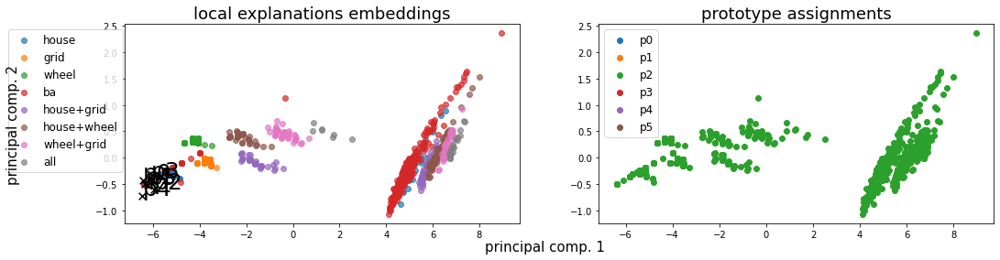

Alpha norms:
tensor([[0.9595, 1.0000, 0.9094, 0.7717, 0.9062, 0.8726],
        [0.8822, 0.8649, 0.8276, 1.0000, 0.9040, 0.7665]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.258763 +- 0.000000
Concept distribution:  (array([2], dtype=int64), array([970], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 33.55370, LEN: 0.088338, AccxC: 0.45, AccO: 0.00, V. Acc: 0.00, V. Loss: 20.22857, V. LEN 0.10
  2: Loss: 10.64147, LEN: 0.087919, AccxC: 0.45, AccO: 0.00, V. Acc: 0.00, V. Loss: 4.15471, V. LEN 0.10
  3: Loss: 2.16998, LEN: 0.087501, AccxC: 0.45, AccO: 0.00, V. Acc: 0.00, V. Loss: 1.18164, V. LEN 0.10
  4: Loss: 1.25909, LEN: 0.087130, AccxC: 0.51, AccO: 0.00, V. Acc: 0.00, V. Loss: 1.40809, V. LEN 0.10
  5: Loss: 1.23694, LEN: 0.086744, AccxC: 0.53, AccO: 0.00, V. Acc: 0.00, V. Loss: 1.27704, V. LEN 0.10
  6: Loss: 1.16988, LEN: 0.086369, AccxC: 0.48, AccO: 0.00, V. Acc: 0.00, V. Loss: 1.06632,

 76: Loss: 0.13977, LEN: 0.075100, AccxC: 0.57, AccO: 0.43, V. Acc: 0.43, V. Loss: 0.13610, V. LEN 0.09
 77: Loss: 0.13516, LEN: 0.074510, AccxC: 0.59, AccO: 0.43, V. Acc: 0.37, V. Loss: 0.12369, V. LEN 0.08
 78: Loss: 0.13124, LEN: 0.074977, AccxC: 0.59, AccO: 0.38, V. Acc: 0.42, V. Loss: 0.12424, V. LEN 0.09
 79: Loss: 0.13305, LEN: 0.074901, AccxC: 0.60, AccO: 0.43, V. Acc: 0.62, V. Loss: 0.12118, V. LEN 0.08


 80: Loss: 0.12847, LEN: 0.075048, AccxC: 0.56, AccO: 0.55, V. Acc: 0.65, V. Loss: 0.11531, V. LEN 0.08
 81: Loss: 0.12081, LEN: 0.074285, AccxC: 0.60, AccO: 0.58, V. Acc: 0.63, V. Loss: 0.11575, V. LEN 0.08
 82: Loss: 0.12744, LEN: 0.074842, AccxC: 0.57, AccO: 0.56, V. Acc: 0.63, V. Loss: 0.11973, V. LEN 0.08
 83: Loss: 0.12028, LEN: 0.074315, AccxC: 0.61, AccO: 0.59, V. Acc: 0.65, V. Loss: 0.11430, V. LEN 0.08
 84: Loss: 0.11925, LEN: 0.074669, AccxC: 0.59, AccO: 0.56, V. Acc: 0.64, V. Loss: 0.11809, V. LEN 0.08
 85: Loss: 0.11846, LEN: 0.073762, AccxC: 0.61, AccO: 0.59, V.

155: Loss: 0.08649, LEN: 0.069407, AccxC: 0.69, AccO: 0.68, V. Acc: 0.78, V. Loss: 0.08751, V. LEN 0.07
156: Loss: 0.08635, LEN: 0.069022, AccxC: 0.70, AccO: 0.69, V. Acc: 0.77, V. Loss: 0.08696, V. LEN 0.07
157: Loss: 0.08515, LEN: 0.067937, AccxC: 0.70, AccO: 0.70, V. Acc: 0.75, V. Loss: 0.08859, V. LEN 0.07
158: Loss: 0.08584, LEN: 0.069289, AccxC: 0.68, AccO: 0.68, V. Acc: 0.76, V. Loss: 0.08534, V. LEN 0.07
159: Loss: 0.08583, LEN: 0.068511, AccxC: 0.69, AccO: 0.68, V. Acc: 0.78, V. Loss: 0.08864, V. LEN 0.07


160: Loss: 0.08469, LEN: 0.068449, AccxC: 0.71, AccO: 0.70, V. Acc: 0.84, V. Loss: 0.07974, V. LEN 0.07
161: Loss: 0.08452, LEN: 0.068530, AccxC: 0.69, AccO: 0.69, V. Acc: 0.73, V. Loss: 0.09203, V. LEN 0.08
162: Loss: 0.08326, LEN: 0.067699, AccxC: 0.70, AccO: 0.69, V. Acc: 0.84, V. Loss: 0.07851, V. LEN 0.07
163: Loss: 0.08216, LEN: 0.065491, AccxC: 0.73, AccO: 0.73, V. Acc: 0.75, V. Loss: 0.08899, V. LEN 0.07
164: Loss: 0.08201, LEN: 0.066852, AccxC: 0.71, AccO: 0.70, V.

234: Loss: 0.06563, LEN: 0.054901, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.07496, V. LEN 0.06
235: Loss: 0.06634, LEN: 0.055472, AccxC: 0.79, AccO: 0.79, V. Acc: 0.87, V. Loss: 0.06039, V. LEN 0.05
236: Loss: 0.06512, LEN: 0.053301, AccxC: 0.82, AccO: 0.82, V. Acc: 0.87, V. Loss: 0.06480, V. LEN 0.05
237: Loss: 0.06601, LEN: 0.055426, AccxC: 0.81, AccO: 0.81, V. Acc: 0.87, V. Loss: 0.06010, V. LEN 0.05
238: Loss: 0.06301, LEN: 0.052776, AccxC: 0.81, AccO: 0.81, V. Acc: 0.87, V. Loss: 0.06209, V. LEN 0.05
239: Loss: 0.06277, LEN: 0.053062, AccxC: 0.82, AccO: 0.82, V. Acc: 0.87, V. Loss: 0.06025, V. LEN 0.05


240: Loss: 0.06235, LEN: 0.052465, AccxC: 0.81, AccO: 0.81, V. Acc: 0.87, V. Loss: 0.06217, V. LEN 0.05
241: Loss: 0.06359, LEN: 0.052818, AccxC: 0.80, AccO: 0.80, V. Acc: 0.87, V. Loss: 0.06131, V. LEN 0.05
242: Loss: 0.06553, LEN: 0.054697, AccxC: 0.80, AccO: 0.80, V. Acc: 0.81, V. Loss: 0.07605, V. LEN 0.06
243: Loss: 0.06442, LEN: 0.053951, AccxC: 0.80, AccO: 0.80, V.

313: Loss: 0.04987, LEN: 0.043093, AccxC: 0.86, AccO: 0.87, V. Acc: 0.87, V. Loss: 0.05715, V. LEN 0.05
314: Loss: 0.05240, LEN: 0.045386, AccxC: 0.86, AccO: 0.86, V. Acc: 0.92, V. Loss: 0.04976, V. LEN 0.04
315: Loss: 0.04776, LEN: 0.040774, AccxC: 0.88, AccO: 0.88, V. Acc: 0.87, V. Loss: 0.06651, V. LEN 0.06
316: Loss: 0.05341, LEN: 0.045885, AccxC: 0.86, AccO: 0.86, V. Acc: 0.92, V. Loss: 0.04757, V. LEN 0.04
317: Loss: 0.05309, LEN: 0.046336, AccxC: 0.87, AccO: 0.87, V. Acc: 0.92, V. Loss: 0.04804, V. LEN 0.04
318: Loss: 0.04987, LEN: 0.043337, AccxC: 0.88, AccO: 0.88, V. Acc: 0.92, V. Loss: 0.05059, V. LEN 0.04
319: Loss: 0.04899, LEN: 0.042332, AccxC: 0.87, AccO: 0.87, V. Acc: 0.92, V. Loss: 0.04848, V. LEN 0.04


320: Loss: 0.04857, LEN: 0.041324, AccxC: 0.87, AccO: 0.87, V. Acc: 0.89, V. Loss: 0.05888, V. LEN 0.05
321: Loss: 0.05124, LEN: 0.044652, AccxC: 0.87, AccO: 0.87, V. Acc: 0.92, V. Loss: 0.04843, V. LEN 0.04
322: Loss: 0.04847, LEN: 0.041835, AccxC: 0.88, AccO: 0.88, V.

392: Loss: 0.04470, LEN: 0.040610, AccxC: 0.87, AccO: 0.87, V. Acc: 0.89, V. Loss: 0.05044, V. LEN 0.05
393: Loss: 0.04882, LEN: 0.044545, AccxC: 0.88, AccO: 0.88, V. Acc: 0.87, V. Loss: 0.04981, V. LEN 0.05
394: Loss: 0.05370, LEN: 0.048620, AccxC: 0.85, AccO: 0.85, V. Acc: 0.90, V. Loss: 0.04595, V. LEN 0.04
395: Loss: 0.05646, LEN: 0.051057, AccxC: 0.81, AccO: 0.81, V. Acc: 0.83, V. Loss: 0.07945, V. LEN 0.07
396: Loss: 0.05630, LEN: 0.051264, AccxC: 0.84, AccO: 0.84, V. Acc: 0.87, V. Loss: 0.05044, V. LEN 0.05
397: Loss: 0.05036, LEN: 0.045924, AccxC: 0.85, AccO: 0.85, V. Acc: 0.87, V. Loss: 0.05087, V. LEN 0.05
398: Loss: 0.04441, LEN: 0.040193, AccxC: 0.87, AccO: 0.87, V. Acc: 0.82, V. Loss: 0.06924, V. LEN 0.06
399: Loss: 0.04401, LEN: 0.040038, AccxC: 0.87, AccO: 0.87, V. Acc: 0.87, V. Loss: 0.05036, V. LEN 0.05


400: Loss: 0.04690, LEN: 0.042665, AccxC: 0.87, AccO: 0.87, V. Acc: 0.87, V. Loss: 0.05813, V. LEN 0.05
401: Loss: 0.04353, LEN: 0.039361, AccxC: 0.88, AccO: 0.88, V.

471: Loss: 0.04273, LEN: 0.039714, AccxC: 0.88, AccO: 0.88, V. Acc: 0.87, V. Loss: 0.04827, V. LEN 0.05
472: Loss: 0.04239, LEN: 0.039457, AccxC: 0.87, AccO: 0.87, V. Acc: 0.87, V. Loss: 0.04817, V. LEN 0.05
473: Loss: 0.04312, LEN: 0.040389, AccxC: 0.87, AccO: 0.87, V. Acc: 0.87, V. Loss: 0.04771, V. LEN 0.04
474: Loss: 0.04283, LEN: 0.039929, AccxC: 0.88, AccO: 0.88, V. Acc: 0.87, V. Loss: 0.04808, V. LEN 0.04
475: Loss: 0.03945, LEN: 0.036603, AccxC: 0.88, AccO: 0.88, V. Acc: 0.87, V. Loss: 0.04761, V. LEN 0.04
476: Loss: 0.04308, LEN: 0.040297, AccxC: 0.88, AccO: 0.88, V. Acc: 0.87, V. Loss: 0.04769, V. LEN 0.04
477: Loss: 0.03950, LEN: 0.036798, AccxC: 0.88, AccO: 0.88, V. Acc: 0.87, V. Loss: 0.04769, V. LEN 0.04
478: Loss: 0.04404, LEN: 0.041066, AccxC: 0.88, AccO: 0.88, V. Acc: 0.87, V. Loss: 0.04780, V. LEN 0.04
479: Loss: 0.04013, LEN: 0.037456, AccxC: 0.88, AccO: 0.88, V. Acc: 0.87, V. Loss: 0.04791, V. LEN 0.05


480: Loss: 0.04150, LEN: 0.038839, AccxC: 0.88, AccO: 0.88, V.

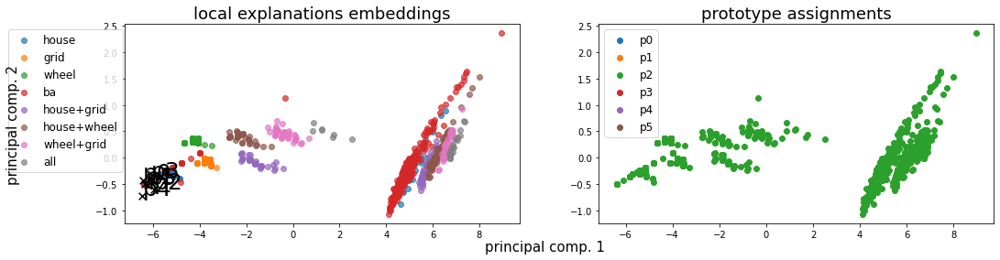

Alpha norms:
tensor([[0.9595, 1.0000, 0.9094, 0.7717, 0.9062, 0.8726],
        [0.8822, 0.8649, 0.8276, 1.0000, 0.9040, 0.7665]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.258763 +- 0.000000
Concept distribution:  (array([2], dtype=int64), array([970], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 74.45436, LEN: 0.088338, AccxC: 0.45, AccO: 0.00, V. Acc: 0.00, V. Loss: 44.82748, V. LEN 0.10
  2: Loss: 23.53902, LEN: 0.087919, AccxC: 0.45, AccO: 0.00, V. Acc: 0.00, V. Loss: 9.10890, V. LEN 0.10
  3: Loss: 4.71434, LEN: 0.087501, AccxC: 0.45, AccO: 0.00, V. Acc: 0.00, V. Loss: 2.50251, V. LEN 0.10
  4: Loss: 2.69092, LEN: 0.087131, AccxC: 0.51, AccO: 0.00, V. Acc: 0.00, V. Loss: 3.00706, V. LEN 0.10
  5: Loss: 2.64230, LEN: 0.086746, AccxC: 0.53, AccO: 0.00, V. Acc: 0.00, V. Loss: 2.71638, V. LEN 0.10
  6: Loss: 2.49349, LEN: 0.086371, AccxC: 0.48, AccO: 0.00, V. Acc: 0.00, V. Loss: 2.24792,

 76: Loss: 0.23875, LEN: 0.075112, AccxC: 0.56, AccO: 0.55, V. Acc: 0.56, V. Loss: 0.16520, V. LEN 0.09
 77: Loss: 0.23174, LEN: 0.074963, AccxC: 0.56, AccO: 0.54, V. Acc: 0.56, V. Loss: 0.17732, V. LEN 0.09
 78: Loss: 0.23280, LEN: 0.075207, AccxC: 0.57, AccO: 0.53, V. Acc: 0.56, V. Loss: 0.14509, V. LEN 0.09
 79: Loss: 0.23701, LEN: 0.075655, AccxC: 0.56, AccO: 0.54, V. Acc: 0.56, V. Loss: 0.13902, V. LEN 0.09


 80: Loss: 0.21945, LEN: 0.075108, AccxC: 0.56, AccO: 0.54, V. Acc: 0.56, V. Loss: 0.16067, V. LEN 0.09
 81: Loss: 0.20467, LEN: 0.075121, AccxC: 0.56, AccO: 0.53, V. Acc: 0.56, V. Loss: 0.13206, V. LEN 0.09
 82: Loss: 0.22340, LEN: 0.075074, AccxC: 0.57, AccO: 0.54, V. Acc: 0.56, V. Loss: 0.15074, V. LEN 0.09
 83: Loss: 0.19488, LEN: 0.075240, AccxC: 0.56, AccO: 0.52, V. Acc: 0.56, V. Loss: 0.15794, V. LEN 0.09
 84: Loss: 0.19725, LEN: 0.074996, AccxC: 0.57, AccO: 0.51, V. Acc: 0.56, V. Loss: 0.14493, V. LEN 0.09
 85: Loss: 0.20104, LEN: 0.074793, AccxC: 0.57, AccO: 0.50, V.

155: Loss: 0.10685, LEN: 0.072565, AccxC: 0.64, AccO: 0.64, V. Acc: 0.67, V. Loss: 0.11228, V. LEN 0.08
156: Loss: 0.10684, LEN: 0.073037, AccxC: 0.64, AccO: 0.63, V. Acc: 0.66, V. Loss: 0.10929, V. LEN 0.08
157: Loss: 0.10610, LEN: 0.072037, AccxC: 0.64, AccO: 0.64, V. Acc: 0.68, V. Loss: 0.11066, V. LEN 0.08
158: Loss: 0.10547, LEN: 0.072701, AccxC: 0.63, AccO: 0.63, V. Acc: 0.66, V. Loss: 0.10586, V. LEN 0.08
159: Loss: 0.10807, LEN: 0.073363, AccxC: 0.61, AccO: 0.61, V. Acc: 0.66, V. Loss: 0.11471, V. LEN 0.08


160: Loss: 0.10617, LEN: 0.073280, AccxC: 0.63, AccO: 0.63, V. Acc: 0.84, V. Loss: 0.10218, V. LEN 0.07
161: Loss: 0.10470, LEN: 0.072967, AccxC: 0.62, AccO: 0.62, V. Acc: 0.65, V. Loss: 0.11577, V. LEN 0.08
162: Loss: 0.10407, LEN: 0.072893, AccxC: 0.62, AccO: 0.62, V. Acc: 0.67, V. Loss: 0.10581, V. LEN 0.08
163: Loss: 0.10442, LEN: 0.071221, AccxC: 0.65, AccO: 0.65, V. Acc: 0.66, V. Loss: 0.11195, V. LEN 0.08
164: Loss: 0.10265, LEN: 0.071506, AccxC: 0.65, AccO: 0.65, V.

234: Loss: 0.08388, LEN: 0.065746, AccxC: 0.72, AccO: 0.72, V. Acc: 0.71, V. Loss: 0.09690, V. LEN 0.08
235: Loss: 0.08357, LEN: 0.065530, AccxC: 0.72, AccO: 0.71, V. Acc: 0.77, V. Loss: 0.08640, V. LEN 0.07
236: Loss: 0.08820, LEN: 0.068374, AccxC: 0.71, AccO: 0.70, V. Acc: 0.84, V. Loss: 0.08859, V. LEN 0.06
237: Loss: 0.08665, LEN: 0.068130, AccxC: 0.70, AccO: 0.70, V. Acc: 0.70, V. Loss: 0.09615, V. LEN 0.08
238: Loss: 0.08280, LEN: 0.065271, AccxC: 0.72, AccO: 0.72, V. Acc: 0.84, V. Loss: 0.08267, V. LEN 0.06
239: Loss: 0.08462, LEN: 0.067309, AccxC: 0.71, AccO: 0.71, V. Acc: 0.73, V. Loss: 0.09338, V. LEN 0.07


240: Loss: 0.08327, LEN: 0.066144, AccxC: 0.72, AccO: 0.71, V. Acc: 0.81, V. Loss: 0.08598, V. LEN 0.07
241: Loss: 0.08384, LEN: 0.065736, AccxC: 0.72, AccO: 0.71, V. Acc: 0.84, V. Loss: 0.08600, V. LEN 0.06
242: Loss: 0.08637, LEN: 0.067432, AccxC: 0.72, AccO: 0.71, V. Acc: 0.76, V. Loss: 0.08936, V. LEN 0.07
243: Loss: 0.08352, LEN: 0.066342, AccxC: 0.70, AccO: 0.70, V.

313: Loss: 0.07010, LEN: 0.058700, AccxC: 0.78, AccO: 0.78, V. Acc: 0.85, V. Loss: 0.07309, V. LEN 0.05
314: Loss: 0.06977, LEN: 0.057463, AccxC: 0.80, AccO: 0.80, V. Acc: 0.85, V. Loss: 0.07092, V. LEN 0.05
315: Loss: 0.07006, LEN: 0.057817, AccxC: 0.79, AccO: 0.79, V. Acc: 0.86, V. Loss: 0.06949, V. LEN 0.05
316: Loss: 0.06947, LEN: 0.056982, AccxC: 0.79, AccO: 0.79, V. Acc: 0.86, V. Loss: 0.06805, V. LEN 0.05
317: Loss: 0.07196, LEN: 0.060100, AccxC: 0.78, AccO: 0.78, V. Acc: 0.86, V. Loss: 0.07024, V. LEN 0.05
318: Loss: 0.07083, LEN: 0.058834, AccxC: 0.78, AccO: 0.78, V. Acc: 0.84, V. Loss: 0.07725, V. LEN 0.06
319: Loss: 0.06907, LEN: 0.056917, AccxC: 0.79, AccO: 0.79, V. Acc: 0.84, V. Loss: 0.07516, V. LEN 0.06


320: Loss: 0.06747, LEN: 0.055017, AccxC: 0.80, AccO: 0.80, V. Acc: 0.86, V. Loss: 0.06774, V. LEN 0.05
321: Loss: 0.06847, LEN: 0.056910, AccxC: 0.79, AccO: 0.79, V. Acc: 0.86, V. Loss: 0.06876, V. LEN 0.05
322: Loss: 0.07009, LEN: 0.057191, AccxC: 0.78, AccO: 0.78, V.

392: Loss: 0.05824, LEN: 0.050083, AccxC: 0.82, AccO: 0.82, V. Acc: 0.87, V. Loss: 0.05914, V. LEN 0.05
393: Loss: 0.05744, LEN: 0.049052, AccxC: 0.84, AccO: 0.84, V. Acc: 0.87, V. Loss: 0.05935, V. LEN 0.05
394: Loss: 0.06202, LEN: 0.052817, AccxC: 0.82, AccO: 0.82, V. Acc: 0.86, V. Loss: 0.06123, V. LEN 0.05
395: Loss: 0.06113, LEN: 0.051358, AccxC: 0.81, AccO: 0.81, V. Acc: 0.87, V. Loss: 0.05874, V. LEN 0.05
396: Loss: 0.05632, LEN: 0.047710, AccxC: 0.83, AccO: 0.83, V. Acc: 0.87, V. Loss: 0.05966, V. LEN 0.05
397: Loss: 0.05753, LEN: 0.049033, AccxC: 0.83, AccO: 0.83, V. Acc: 0.87, V. Loss: 0.05820, V. LEN 0.05
398: Loss: 0.05783, LEN: 0.049683, AccxC: 0.82, AccO: 0.82, V. Acc: 0.87, V. Loss: 0.05819, V. LEN 0.05
399: Loss: 0.05754, LEN: 0.049446, AccxC: 0.82, AccO: 0.82, V. Acc: 0.87, V. Loss: 0.05744, V. LEN 0.05


400: Loss: 0.06011, LEN: 0.052073, AccxC: 0.82, AccO: 0.82, V. Acc: 0.87, V. Loss: 0.05699, V. LEN 0.05
401: Loss: 0.05554, LEN: 0.047090, AccxC: 0.84, AccO: 0.84, V.

471: Loss: 0.04613, LEN: 0.040691, AccxC: 0.88, AccO: 0.88, V. Acc: 0.87, V. Loss: 0.05087, V. LEN 0.05
472: Loss: 0.04283, LEN: 0.037813, AccxC: 0.88, AccO: 0.88, V. Acc: 0.87, V. Loss: 0.05113, V. LEN 0.05
473: Loss: 0.04509, LEN: 0.040224, AccxC: 0.88, AccO: 0.88, V. Acc: 0.87, V. Loss: 0.05033, V. LEN 0.05
474: Loss: 0.04501, LEN: 0.039874, AccxC: 0.87, AccO: 0.87, V. Acc: 0.87, V. Loss: 0.05101, V. LEN 0.05
475: Loss: 0.04482, LEN: 0.039618, AccxC: 0.88, AccO: 0.88, V. Acc: 0.88, V. Loss: 0.04801, V. LEN 0.04
476: Loss: 0.04575, LEN: 0.040889, AccxC: 0.87, AccO: 0.87, V. Acc: 0.87, V. Loss: 0.05377, V. LEN 0.05
477: Loss: 0.04216, LEN: 0.037448, AccxC: 0.88, AccO: 0.88, V. Acc: 0.90, V. Loss: 0.04915, V. LEN 0.04
478: Loss: 0.05056, LEN: 0.045223, AccxC: 0.86, AccO: 0.86, V. Acc: 0.91, V. Loss: 0.04487, V. LEN 0.04
479: Loss: 0.04715, LEN: 0.042449, AccxC: 0.87, AccO: 0.87, V. Acc: 0.87, V. Loss: 0.05028, V. LEN 0.05


480: Loss: 0.05129, LEN: 0.046621, AccxC: 0.85, AccO: 0.85, V.

550: Loss: 0.04380, LEN: 0.040308, AccxC: 0.87, AccO: 0.87, V. Acc: 0.87, V. Loss: 0.04822, V. LEN 0.05
551: Loss: 0.04872, LEN: 0.045434, AccxC: 0.85, AccO: 0.85, V. Acc: 0.87, V. Loss: 0.04833, V. LEN 0.05
552: Loss: 0.05177, LEN: 0.048189, AccxC: 0.81, AccO: 0.81, V. Acc: 0.78, V. Loss: 0.10123, V. LEN 0.10
553: Loss: 0.06014, LEN: 0.056195, AccxC: 0.78, AccO: 0.78, V. Acc: 0.87, V. Loss: 0.04864, V. LEN 0.05
554: Loss: 0.05219, LEN: 0.048610, AccxC: 0.85, AccO: 0.85, V. Acc: 0.87, V. Loss: 0.04815, V. LEN 0.05
555: Loss: 0.04643, LEN: 0.042786, AccxC: 0.86, AccO: 0.86, V. Acc: 0.87, V. Loss: 0.04919, V. LEN 0.05
556: Loss: 0.04552, LEN: 0.041770, AccxC: 0.85, AccO: 0.85, V. Acc: 0.85, V. Loss: 0.07049, V. LEN 0.07
557: Loss: 0.06108, LEN: 0.057063, AccxC: 0.78, AccO: 0.78, V. Acc: 0.87, V. Loss: 0.05007, V. LEN 0.05
558: Loss: 0.04582, LEN: 0.041868, AccxC: 0.87, AccO: 0.87, V. Acc: 0.87, V. Loss: 0.04887, V. LEN 0.05
559: Loss: 0.04442, LEN: 0.040919, AccxC: 0.87, AccO: 0.87, V. A

629: Loss: 0.04394, LEN: 0.041482, AccxC: 0.86, AccO: 0.86, V. Acc: 0.87, V. Loss: 0.04742, V. LEN 0.04
630: Loss: 0.04210, LEN: 0.039530, AccxC: 0.87, AccO: 0.87, V. Acc: 0.87, V. Loss: 0.04735, V. LEN 0.04
631: Loss: 0.04522, LEN: 0.042460, AccxC: 0.85, AccO: 0.85, V. Acc: 0.91, V. Loss: 0.04236, V. LEN 0.04
632: Loss: 0.04395, LEN: 0.041207, AccxC: 0.88, AccO: 0.88, V. Acc: 0.87, V. Loss: 0.04755, V. LEN 0.04
633: Loss: 0.03976, LEN: 0.037159, AccxC: 0.88, AccO: 0.88, V. Acc: 0.88, V. Loss: 0.04548, V. LEN 0.04
634: Loss: 0.04192, LEN: 0.039343, AccxC: 0.88, AccO: 0.88, V. Acc: 0.87, V. Loss: 0.04708, V. LEN 0.04
635: Loss: 0.04173, LEN: 0.039059, AccxC: 0.88, AccO: 0.88, V. Acc: 0.87, V. Loss: 0.04775, V. LEN 0.04
636: Loss: 0.04070, LEN: 0.038240, AccxC: 0.88, AccO: 0.88, V. Acc: 0.87, V. Loss: 0.04736, V. LEN 0.04
637: Loss: 0.04093, LEN: 0.038323, AccxC: 0.88, AccO: 0.88, V. Acc: 0.87, V. Loss: 0.04747, V. LEN 0.04
638: Loss: 0.04122, LEN: 0.038598, AccxC: 0.89, AccO: 0.89, V. A

708: Loss: 0.06206, LEN: 0.059641, AccxC: 0.73, AccO: 0.73, V. Acc: 0.79, V. Loss: 0.10195, V. LEN 0.10
709: Loss: 0.06179, LEN: 0.059302, AccxC: 0.76, AccO: 0.76, V. Acc: 0.87, V. Loss: 0.04708, V. LEN 0.05
710: Loss: 0.04994, LEN: 0.047306, AccxC: 0.85, AccO: 0.85, V. Acc: 0.87, V. Loss: 0.04938, V. LEN 0.05
711: Loss: 0.04789, LEN: 0.045339, AccxC: 0.83, AccO: 0.83, V. Acc: 0.87, V. Loss: 0.04782, V. LEN 0.05
712: Loss: 0.04080, LEN: 0.038293, AccxC: 0.87, AccO: 0.87, V. Acc: 0.87, V. Loss: 0.04824, V. LEN 0.05
713: Loss: 0.03848, LEN: 0.036203, AccxC: 0.88, AccO: 0.88, V. Acc: 0.87, V. Loss: 0.04750, V. LEN 0.05
714: Loss: 0.04073, LEN: 0.038527, AccxC: 0.88, AccO: 0.88, V. Acc: 0.87, V. Loss: 0.04711, V. LEN 0.04
715: Loss: 0.03874, LEN: 0.036489, AccxC: 0.89, AccO: 0.89, V. Acc: 0.87, V. Loss: 0.04742, V. LEN 0.04
716: Loss: 0.03825, LEN: 0.036109, AccxC: 0.89, AccO: 0.89, V. Acc: 0.87, V. Loss: 0.04675, V. LEN 0.04
717: Loss: 0.04191, LEN: 0.039886, AccxC: 0.87, AccO: 0.87, V. A

787: Loss: 0.03729, LEN: 0.035481, AccxC: 0.87, AccO: 0.87, V. Acc: 0.91, V. Loss: 0.03756, V. LEN 0.04
788: Loss: 0.03301, LEN: 0.031302, AccxC: 0.89, AccO: 0.88, V. Acc: 0.91, V. Loss: 0.03458, V. LEN 0.03
789: Loss: 0.03555, LEN: 0.033864, AccxC: 0.87, AccO: 0.87, V. Acc: 0.93, V. Loss: 0.03285, V. LEN 0.03
790: Loss: 0.03448, LEN: 0.032480, AccxC: 0.88, AccO: 0.88, V. Acc: 0.81, V. Loss: 0.03897, V. LEN 0.04
791: Loss: 0.03479, LEN: 0.033056, AccxC: 0.83, AccO: 0.83, V. Acc: 0.93, V. Loss: 0.03279, V. LEN 0.03
792: Loss: 0.03489, LEN: 0.033019, AccxC: 0.89, AccO: 0.80, V. Acc: 0.87, V. Loss: 0.03776, V. LEN 0.04
793: Loss: 0.03296, LEN: 0.031170, AccxC: 0.85, AccO: 0.86, V. Acc: 0.87, V. Loss: 0.03314, V. LEN 0.03
794: Loss: 0.03358, LEN: 0.031659, AccxC: 0.87, AccO: 0.87, V. Acc: 0.87, V. Loss: 0.04204, V. LEN 0.04
795: Loss: 0.03806, LEN: 0.036093, AccxC: 0.85, AccO: 0.86, V. Acc: 0.87, V. Loss: 0.03312, V. LEN 0.03
796: Loss: 0.03707, LEN: 0.035085, AccxC: 0.87, AccO: 0.87, V. A

866: Loss: 0.03733, LEN: 0.035592, AccxC: 0.86, AccO: 0.86, V. Acc: 0.90, V. Loss: 0.03325, V. LEN 0.03
867: Loss: 0.03378, LEN: 0.031930, AccxC: 0.88, AccO: 0.88, V. Acc: 0.87, V. Loss: 0.03836, V. LEN 0.04
868: Loss: 0.02932, LEN: 0.027594, AccxC: 0.87, AccO: 0.87, V. Acc: 0.87, V. Loss: 0.03580, V. LEN 0.03
869: Loss: 0.03477, LEN: 0.032891, AccxC: 0.87, AccO: 0.87, V. Acc: 0.87, V. Loss: 0.03664, V. LEN 0.03
870: Loss: 0.03118, LEN: 0.029482, AccxC: 0.88, AccO: 0.88, V. Acc: 0.87, V. Loss: 0.03645, V. LEN 0.03
871: Loss: 0.03487, LEN: 0.033097, AccxC: 0.85, AccO: 0.85, V. Acc: 0.81, V. Loss: 0.08327, V. LEN 0.08
872: Loss: 0.03942, LEN: 0.037456, AccxC: 0.86, AccO: 0.86, V. Acc: 0.87, V. Loss: 0.03647, V. LEN 0.03
873: Loss: 0.03120, LEN: 0.029466, AccxC: 0.86, AccO: 0.87, V. Acc: 0.87, V. Loss: 0.03694, V. LEN 0.03
874: Loss: 0.03316, LEN: 0.031463, AccxC: 0.86, AccO: 0.87, V. Acc: 0.87, V. Loss: 0.03754, V. LEN 0.04
875: Loss: 0.03209, LEN: 0.030413, AccxC: 0.87, AccO: 0.87, V. A

945: Loss: 0.03273, LEN: 0.031233, AccxC: 0.87, AccO: 0.87, V. Acc: 0.87, V. Loss: 0.03629, V. LEN 0.03
946: Loss: 0.03191, LEN: 0.030459, AccxC: 0.86, AccO: 0.86, V. Acc: 0.87, V. Loss: 0.03646, V. LEN 0.03
947: Loss: 0.03218, LEN: 0.030797, AccxC: 0.88, AccO: 0.88, V. Acc: 0.87, V. Loss: 0.03756, V. LEN 0.04
948: Loss: 0.02888, LEN: 0.027547, AccxC: 0.87, AccO: 0.87, V. Acc: 0.86, V. Loss: 0.03362, V. LEN 0.03
949: Loss: 0.03554, LEN: 0.034074, AccxC: 0.86, AccO: 0.86, V. Acc: 0.89, V. Loss: 0.03291, V. LEN 0.03
950: Loss: 0.03252, LEN: 0.031122, AccxC: 0.87, AccO: 0.87, V. Acc: 0.89, V. Loss: 0.03300, V. LEN 0.03
951: Loss: 0.02944, LEN: 0.028053, AccxC: 0.86, AccO: 0.87, V. Acc: 0.86, V. Loss: 0.03778, V. LEN 0.04
952: Loss: 0.03543, LEN: 0.033991, AccxC: 0.86, AccO: 0.86, V. Acc: 0.86, V. Loss: 0.03627, V. LEN 0.03
953: Loss: 0.03117, LEN: 0.029703, AccxC: 0.86, AccO: 0.86, V. Acc: 0.86, V. Loss: 0.03715, V. LEN 0.04
954: Loss: 0.03114, LEN: 0.029703, AccxC: 0.86, AccO: 0.87, V. A

1024: Loss: 0.03156, LEN: 0.030337, AccxC: 0.88, AccO: 0.86, V. Acc: 0.87, V. Loss: 0.03521, V. LEN 0.03
1025: Loss: 0.03121, LEN: 0.030060, AccxC: 0.87, AccO: 0.82, V. Acc: 0.78, V. Loss: 0.03507, V. LEN 0.03
1026: Loss: 0.03090, LEN: 0.029689, AccxC: 0.88, AccO: 0.81, V. Acc: 0.77, V. Loss: 0.03566, V. LEN 0.03
1027: Loss: 0.03472, LEN: 0.033424, AccxC: 0.87, AccO: 0.81, V. Acc: 0.87, V. Loss: 0.03390, V. LEN 0.03
1028: Loss: 0.03304, LEN: 0.031826, AccxC: 0.90, AccO: 0.86, V. Acc: 0.84, V. Loss: 0.03164, V. LEN 0.03
1029: Loss: 0.03202, LEN: 0.030807, AccxC: 0.86, AccO: 0.81, V. Acc: 0.76, V. Loss: 0.03608, V. LEN 0.03
1030: Loss: 0.02966, LEN: 0.028436, AccxC: 0.86, AccO: 0.76, V. Acc: 0.76, V. Loss: 0.03590, V. LEN 0.03
1031: Loss: 0.03182, LEN: 0.030637, AccxC: 0.89, AccO: 0.86, V. Acc: 0.86, V. Loss: 0.03589, V. LEN 0.03
1032: Loss: 0.03292, LEN: 0.031688, AccxC: 0.89, AccO: 0.89, V. Acc: 0.86, V. Loss: 0.03591, V. LEN 0.03
1033: Loss: 0.03090, LEN: 0.029715, AccxC: 0.87, AccO: 

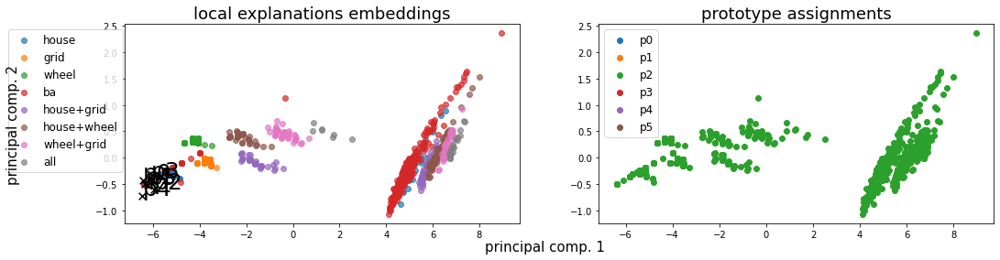

Alpha norms:
tensor([[0.9595, 1.0000, 0.9094, 0.7717, 0.9062, 0.8726],
        [0.8822, 0.8649, 0.8276, 1.0000, 0.9040, 0.7665]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.258763 +- 0.000000
Concept distribution:  (array([2], dtype=int64), array([970], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 0.24247, LEN: 0.088341, AccxC: 0.48, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.24807, V. LEN 0.10
  2: Loss: 0.18472, LEN: 0.087954, AccxC: 0.54, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.19910, V. LEN 0.10
  3: Loss: 0.14765, LEN: 0.087587, AccxC: 0.54, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.18689, V. LEN 0.10
  4: Loss: 0.14446, LEN: 0.087135, AccxC: 0.51, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.17576, V. LEN 0.10
  5: Loss: 0.13422, LEN: 0.086768, AccxC: 0.50, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.16677, V. LEN 0.10
  6: Loss: 0.12541, LEN: 0.086424, AccxC: 0.52, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.16157, V.

 72: Loss: 0.06665, LEN: 0.061998, AccxC: 0.73, AccO: 0.69, V. Acc: 0.76, V. Loss: 0.07728, V. LEN 0.07
 73: Loss: 0.06414, LEN: 0.059712, AccxC: 0.74, AccO: 0.72, V. Acc: 0.85, V. Loss: 0.06476, V. LEN 0.06
 74: Loss: 0.06513, LEN: 0.060002, AccxC: 0.74, AccO: 0.72, V. Acc: 0.81, V. Loss: 0.07512, V. LEN 0.06
 75: Loss: 0.06261, LEN: 0.058393, AccxC: 0.74, AccO: 0.72, V. Acc: 0.83, V. Loss: 0.06955, V. LEN 0.06
 76: Loss: 0.06540, LEN: 0.060802, AccxC: 0.71, AccO: 0.68, V. Acc: 0.78, V. Loss: 0.07483, V. LEN 0.06
 77: Loss: 0.06357, LEN: 0.059838, AccxC: 0.74, AccO: 0.68, V. Acc: 0.78, V. Loss: 0.07415, V. LEN 0.07
 78: Loss: 0.06339, LEN: 0.059837, AccxC: 0.73, AccO: 0.71, V. Acc: 0.84, V. Loss: 0.06400, V. LEN 0.06
 79: Loss: 0.06327, LEN: 0.059733, AccxC: 0.76, AccO: 0.73, V. Acc: 0.79, V. Loss: 0.06566, V. LEN 0.06


 80: Loss: 0.06028, LEN: 0.056631, AccxC: 0.75, AccO: 0.69, V. Acc: 0.78, V. Loss: 0.07098, V. LEN 0.06
 81: Loss: 0.06066, LEN: 0.057246, AccxC: 0.75, AccO: 0.71, V.

148: Loss: 0.02704, LEN: 0.025130, AccxC: 0.91, AccO: 0.91, V. Acc: 0.96, V. Loss: 0.02504, V. LEN 0.02
149: Loss: 0.03094, LEN: 0.029060, AccxC: 0.89, AccO: 0.89, V. Acc: 0.95, V. Loss: 0.02074, V. LEN 0.02
150: Loss: 0.02963, LEN: 0.028224, AccxC: 0.90, AccO: 0.89, V. Acc: 0.90, V. Loss: 0.02792, V. LEN 0.02
151: Loss: 0.02712, LEN: 0.025228, AccxC: 0.91, AccO: 0.91, V. Acc: 0.95, V. Loss: 0.02655, V. LEN 0.02
152: Loss: 0.03112, LEN: 0.028807, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.02582, V. LEN 0.02
153: Loss: 0.03120, LEN: 0.029422, AccxC: 0.90, AccO: 0.90, V. Acc: 0.84, V. Loss: 0.03721, V. LEN 0.03
154: Loss: 0.02480, LEN: 0.022949, AccxC: 0.91, AccO: 0.91, V. Acc: 0.96, V. Loss: 0.01901, V. LEN 0.02
155: Loss: 0.02359, LEN: 0.022018, AccxC: 0.92, AccO: 0.92, V. Acc: 0.95, V. Loss: 0.02528, V. LEN 0.02
156: Loss: 0.02648, LEN: 0.024844, AccxC: 0.89, AccO: 0.89, V. Acc: 0.86, V. Loss: 0.03088, V. LEN 0.03
157: Loss: 0.02898, LEN: 0.027335, AccxC: 0.90, AccO: 0.90, V. A

227: Loss: 0.01582, LEN: 0.015126, AccxC: 0.95, AccO: 0.95, V. Acc: 0.97, V. Loss: 0.01245, V. LEN 0.01
228: Loss: 0.01761, LEN: 0.016824, AccxC: 0.95, AccO: 0.95, V. Acc: 0.98, V. Loss: 0.01049, V. LEN 0.01
229: Loss: 0.01198, LEN: 0.011312, AccxC: 0.97, AccO: 0.97, V. Acc: 0.87, V. Loss: 0.03161, V. LEN 0.03
230: Loss: 0.01545, LEN: 0.014588, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.01022, V. LEN 0.01
231: Loss: 0.01565, LEN: 0.014872, AccxC: 0.94, AccO: 0.94, V. Acc: 0.98, V. Loss: 0.01103, V. LEN 0.01
232: Loss: 0.01364, LEN: 0.012948, AccxC: 0.96, AccO: 0.96, V. Acc: 0.93, V. Loss: 0.01993, V. LEN 0.02
233: Loss: 0.01389, LEN: 0.013224, AccxC: 0.96, AccO: 0.96, V. Acc: 0.97, V. Loss: 0.01377, V. LEN 0.01
234: Loss: 0.01746, LEN: 0.016594, AccxC: 0.95, AccO: 0.95, V. Acc: 0.91, V. Loss: 0.02362, V. LEN 0.02
235: Loss: 0.01525, LEN: 0.014443, AccxC: 0.96, AccO: 0.96, V. Acc: 0.95, V. Loss: 0.01659, V. LEN 0.02
236: Loss: 0.01615, LEN: 0.015395, AccxC: 0.96, AccO: 0.96, V. A

306: Loss: 0.01055, LEN: 0.010156, AccxC: 0.97, AccO: 0.97, V. Acc: 0.95, V. Loss: 0.01701, V. LEN 0.02
307: Loss: 0.01465, LEN: 0.014197, AccxC: 0.96, AccO: 0.96, V. Acc: 0.96, V. Loss: 0.01071, V. LEN 0.01
308: Loss: 0.01228, LEN: 0.011843, AccxC: 0.95, AccO: 0.95, V. Acc: 0.97, V. Loss: 0.01273, V. LEN 0.01
309: Loss: 0.01355, LEN: 0.013203, AccxC: 0.96, AccO: 0.96, V. Acc: 0.97, V. Loss: 0.01097, V. LEN 0.01
310: Loss: 0.01188, LEN: 0.011390, AccxC: 0.96, AccO: 0.96, V. Acc: 0.97, V. Loss: 0.01169, V. LEN 0.01
311: Loss: 0.01468, LEN: 0.014243, AccxC: 0.96, AccO: 0.96, V. Acc: 0.97, V. Loss: 0.01072, V. LEN 0.01
312: Loss: 0.01395, LEN: 0.013401, AccxC: 0.95, AccO: 0.95, V. Acc: 0.97, V. Loss: 0.01136, V. LEN 0.01
313: Loss: 0.01300, LEN: 0.012500, AccxC: 0.96, AccO: 0.96, V. Acc: 0.97, V. Loss: 0.01268, V. LEN 0.01
314: Loss: 0.01197, LEN: 0.011505, AccxC: 0.96, AccO: 0.96, V. Acc: 0.97, V. Loss: 0.00909, V. LEN 0.01
315: Loss: 0.01127, LEN: 0.010857, AccxC: 0.97, AccO: 0.97, V. A

385: Loss: 0.01041, LEN: 0.010131, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.00926, V. LEN 0.01
386: Loss: 0.01274, LEN: 0.012402, AccxC: 0.97, AccO: 0.97, V. Acc: 0.94, V. Loss: 0.01582, V. LEN 0.02
387: Loss: 0.01230, LEN: 0.011932, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.00795, V. LEN 0.01
388: Loss: 0.01070, LEN: 0.010219, AccxC: 0.97, AccO: 0.97, V. Acc: 0.95, V. Loss: 0.01335, V. LEN 0.01
389: Loss: 0.01294, LEN: 0.012570, AccxC: 0.97, AccO: 0.97, V. Acc: 0.97, V. Loss: 0.01171, V. LEN 0.01
390: Loss: 0.01106, LEN: 0.010782, AccxC: 0.97, AccO: 0.97, V. Acc: 0.94, V. Loss: 0.01732, V. LEN 0.02
391: Loss: 0.00965, LEN: 0.009316, AccxC: 0.97, AccO: 0.97, V. Acc: 0.97, V. Loss: 0.01158, V. LEN 0.01
392: Loss: 0.01013, LEN: 0.009770, AccxC: 0.97, AccO: 0.97, V. Acc: 0.96, V. Loss: 0.01265, V. LEN 0.01
393: Loss: 0.01026, LEN: 0.009867, AccxC: 0.97, AccO: 0.97, V. Acc: 0.97, V. Loss: 0.01042, V. LEN 0.01
394: Loss: 0.01167, LEN: 0.011385, AccxC: 0.97, AccO: 0.97, V. A

464: Loss: 0.01131, LEN: 0.010957, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.00783, V. LEN 0.01
465: Loss: 0.01076, LEN: 0.010470, AccxC: 0.97, AccO: 0.97, V. Acc: 0.95, V. Loss: 0.01482, V. LEN 0.01
466: Loss: 0.01184, LEN: 0.011552, AccxC: 0.96, AccO: 0.96, V. Acc: 0.97, V. Loss: 0.01005, V. LEN 0.01
467: Loss: 0.01015, LEN: 0.009906, AccxC: 0.97, AccO: 0.97, V. Acc: 0.96, V. Loss: 0.01143, V. LEN 0.01
468: Loss: 0.01425, LEN: 0.013923, AccxC: 0.96, AccO: 0.96, V. Acc: 0.95, V. Loss: 0.01527, V. LEN 0.01
469: Loss: 0.01207, LEN: 0.011690, AccxC: 0.97, AccO: 0.97, V. Acc: 0.97, V. Loss: 0.01161, V. LEN 0.01
470: Loss: 0.00908, LEN: 0.008781, AccxC: 0.97, AccO: 0.98, V. Acc: 0.95, V. Loss: 0.01538, V. LEN 0.01
471: Loss: 0.01076, LEN: 0.010523, AccxC: 0.97, AccO: 0.97, V. Acc: 0.96, V. Loss: 0.01291, V. LEN 0.01
472: Loss: 0.01057, LEN: 0.010314, AccxC: 0.96, AccO: 0.96, V. Acc: 0.96, V. Loss: 0.01296, V. LEN 0.01
473: Loss: 0.00982, LEN: 0.009533, AccxC: 0.97, AccO: 0.98, V. A

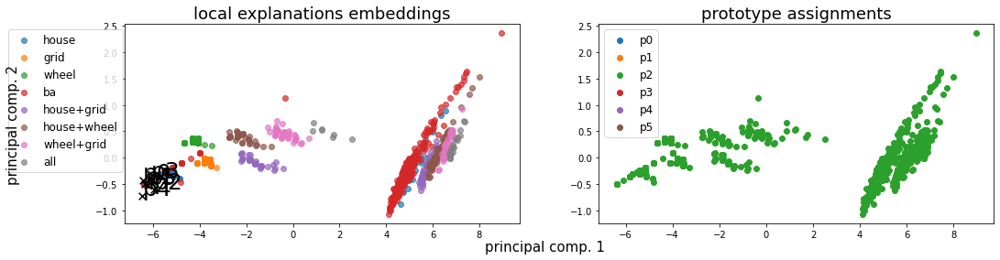

Alpha norms:
tensor([[0.9595, 1.0000, 0.9094, 0.7717, 0.9062, 0.8726],
        [0.8822, 0.8649, 0.8276, 1.0000, 0.9040, 0.7665]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.258763 +- 0.000000
Concept distribution:  (array([2], dtype=int64), array([970], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 0.23889, LEN: 0.088341, AccxC: 0.48, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.24549, V. LEN 0.10
  2: Loss: 0.18332, LEN: 0.087953, AccxC: 0.55, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.19864, V. LEN 0.10
  3: Loss: 0.14605, LEN: 0.087573, AccxC: 0.56, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.17577, V. LEN 0.10
  4: Loss: 0.14097, LEN: 0.087135, AccxC: 0.53, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.17065, V. LEN 0.10
  5: Loss: 0.13166, LEN: 0.086762, AccxC: 0.52, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.16337, V. LEN 0.10
  6: Loss: 0.12352, LEN: 0.086411, AccxC: 0.52, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.16135, V.

 71: Loss: 0.06735, LEN: 0.062616, AccxC: 0.76, AccO: 0.69, V. Acc: 0.71, V. Loss: 0.07370, V. LEN 0.06
 72: Loss: 0.06511, LEN: 0.060509, AccxC: 0.77, AccO: 0.72, V. Acc: 0.70, V. Loss: 0.07586, V. LEN 0.06
 73: Loss: 0.06569, LEN: 0.059828, AccxC: 0.78, AccO: 0.73, V. Acc: 0.75, V. Loss: 0.06808, V. LEN 0.06
 74: Loss: 0.06621, LEN: 0.061284, AccxC: 0.74, AccO: 0.69, V. Acc: 0.67, V. Loss: 0.07388, V. LEN 0.06
 75: Loss: 0.06309, LEN: 0.058457, AccxC: 0.77, AccO: 0.71, V. Acc: 0.81, V. Loss: 0.06548, V. LEN 0.06
 76: Loss: 0.06343, LEN: 0.058369, AccxC: 0.80, AccO: 0.77, V. Acc: 0.83, V. Loss: 0.06225, V. LEN 0.05
 77: Loss: 0.06295, LEN: 0.058541, AccxC: 0.79, AccO: 0.74, V. Acc: 0.70, V. Loss: 0.06853, V. LEN 0.06
 78: Loss: 0.06140, LEN: 0.057010, AccxC: 0.76, AccO: 0.70, V. Acc: 0.68, V. Loss: 0.06552, V. LEN 0.06
 79: Loss: 0.06087, LEN: 0.057330, AccxC: 0.77, AccO: 0.73, V. Acc: 0.70, V. Loss: 0.06548, V. LEN 0.06

---------------------------------------------------------------

144: Loss: 0.02864, LEN: 0.027128, AccxC: 0.90, AccO: 0.89, V. Acc: 0.85, V. Loss: 0.03261, V. LEN 0.03
145: Loss: 0.02644, LEN: 0.024866, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.02307, V. LEN 0.02
146: Loss: 0.03042, LEN: 0.029069, AccxC: 0.90, AccO: 0.90, V. Acc: 0.86, V. Loss: 0.03131, V. LEN 0.03
147: Loss: 0.02670, LEN: 0.025322, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.02272, V. LEN 0.02
148: Loss: 0.02791, LEN: 0.026550, AccxC: 0.91, AccO: 0.91, V. Acc: 0.86, V. Loss: 0.03070, V. LEN 0.03
149: Loss: 0.03387, LEN: 0.032175, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.02267, V. LEN 0.02
150: Loss: 0.02947, LEN: 0.028097, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.02215, V. LEN 0.02
151: Loss: 0.02801, LEN: 0.026218, AccxC: 0.89, AccO: 0.89, V. Acc: 0.85, V. Loss: 0.03112, V. LEN 0.03
152: Loss: 0.03067, LEN: 0.029155, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.02676, V. LEN 0.02
153: Loss: 0.02648, LEN: 0.024835, AccxC: 0.90, AccO: 0.90, V. A

223: Loss: 0.02057, LEN: 0.019961, AccxC: 0.92, AccO: 0.92, V. Acc: 0.94, V. Loss: 0.01404, V. LEN 0.01
224: Loss: 0.02062, LEN: 0.019937, AccxC: 0.92, AccO: 0.92, V. Acc: 0.93, V. Loss: 0.01604, V. LEN 0.02
225: Loss: 0.02065, LEN: 0.019967, AccxC: 0.92, AccO: 0.92, V. Acc: 0.93, V. Loss: 0.01598, V. LEN 0.02
226: Loss: 0.02050, LEN: 0.019660, AccxC: 0.91, AccO: 0.91, V. Acc: 0.93, V. Loss: 0.01705, V. LEN 0.02
227: Loss: 0.01870, LEN: 0.018061, AccxC: 0.92, AccO: 0.92, V. Acc: 0.93, V. Loss: 0.01558, V. LEN 0.02
228: Loss: 0.02410, LEN: 0.023325, AccxC: 0.91, AccO: 0.91, V. Acc: 0.94, V. Loss: 0.01377, V. LEN 0.01
229: Loss: 0.01878, LEN: 0.018154, AccxC: 0.92, AccO: 0.92, V. Acc: 0.92, V. Loss: 0.01898, V. LEN 0.02
230: Loss: 0.01959, LEN: 0.018789, AccxC: 0.92, AccO: 0.92, V. Acc: 0.93, V. Loss: 0.01624, V. LEN 0.02
231: Loss: 0.02447, LEN: 0.023709, AccxC: 0.91, AccO: 0.91, V. Acc: 0.94, V. Loss: 0.01384, V. LEN 0.01
232: Loss: 0.01954, LEN: 0.018556, AccxC: 0.92, AccO: 0.92, V. A

302: Loss: 0.01295, LEN: 0.012531, AccxC: 0.94, AccO: 0.94, V. Acc: 0.93, V. Loss: 0.01582, V. LEN 0.02
303: Loss: 0.01479, LEN: 0.014401, AccxC: 0.94, AccO: 0.94, V. Acc: 0.93, V. Loss: 0.01583, V. LEN 0.02
304: Loss: 0.01416, LEN: 0.013743, AccxC: 0.94, AccO: 0.94, V. Acc: 0.93, V. Loss: 0.01570, V. LEN 0.01
305: Loss: 0.01650, LEN: 0.016122, AccxC: 0.94, AccO: 0.92, V. Acc: 0.89, V. Loss: 0.01751, V. LEN 0.02
306: Loss: 0.01517, LEN: 0.014766, AccxC: 0.93, AccO: 0.91, V. Acc: 0.91, V. Loss: 0.01526, V. LEN 0.01
307: Loss: 0.01447, LEN: 0.014081, AccxC: 0.94, AccO: 0.92, V. Acc: 0.95, V. Loss: 0.01410, V. LEN 0.01
308: Loss: 0.01590, LEN: 0.015598, AccxC: 0.93, AccO: 0.93, V. Acc: 0.92, V. Loss: 0.01745, V. LEN 0.02
309: Loss: 0.01638, LEN: 0.015951, AccxC: 0.94, AccO: 0.94, V. Acc: 0.95, V. Loss: 0.01397, V. LEN 0.01
310: Loss: 0.01332, LEN: 0.012908, AccxC: 0.95, AccO: 0.95, V. Acc: 0.89, V. Loss: 0.02052, V. LEN 0.02
311: Loss: 0.01886, LEN: 0.018470, AccxC: 0.94, AccO: 0.94, V. A

381: Loss: 0.01448, LEN: 0.014175, AccxC: 0.94, AccO: 0.94, V. Acc: 0.92, V. Loss: 0.01764, V. LEN 0.02
382: Loss: 0.01678, LEN: 0.016428, AccxC: 0.93, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.01748, V. LEN 0.02
383: Loss: 0.01868, LEN: 0.018312, AccxC: 0.93, AccO: 0.93, V. Acc: 0.92, V. Loss: 0.02061, V. LEN 0.02
384: Loss: 0.01438, LEN: 0.014125, AccxC: 0.94, AccO: 0.94, V. Acc: 0.93, V. Loss: 0.01445, V. LEN 0.01
385: Loss: 0.01668, LEN: 0.016295, AccxC: 0.93, AccO: 0.93, V. Acc: 0.92, V. Loss: 0.02508, V. LEN 0.02
386: Loss: 0.01830, LEN: 0.017969, AccxC: 0.93, AccO: 0.93, V. Acc: 0.94, V. Loss: 0.01293, V. LEN 0.01
387: Loss: 0.01483, LEN: 0.014506, AccxC: 0.93, AccO: 0.93, V. Acc: 0.93, V. Loss: 0.01728, V. LEN 0.02
388: Loss: 0.01515, LEN: 0.014776, AccxC: 0.93, AccO: 0.93, V. Acc: 0.90, V. Loss: 0.01801, V. LEN 0.02
389: Loss: 0.01492, LEN: 0.014594, AccxC: 0.92, AccO: 0.92, V. Acc: 0.80, V. Loss: 0.02473, V. LEN 0.02
390: Loss: 0.01575, LEN: 0.015431, AccxC: 0.93, AccO: 0.88, V. A

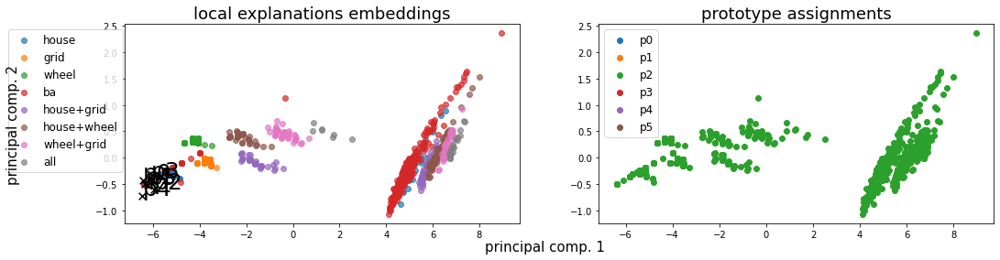

Alpha norms:
tensor([[0.9595, 1.0000, 0.9094, 0.7717, 0.9062, 0.8726],
        [0.8822, 0.8649, 0.8276, 1.0000, 0.9040, 0.7665]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.258763 +- 0.000000
Concept distribution:  (array([2], dtype=int64), array([970], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 3.55942, LEN: 0.088338, AccxC: 0.45, AccO: 0.00, V. Acc: 0.00, V. Loss: 2.26396, V. LEN 0.10
  2: Loss: 1.24781, LEN: 0.087918, AccxC: 0.45, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.63493, V. LEN 0.10
  3: Loss: 0.38734, LEN: 0.087515, AccxC: 0.45, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.33838, V. LEN 0.10
  4: Loss: 0.30989, LEN: 0.087143, AccxC: 0.50, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.35867, V. LEN 0.10
  5: Loss: 0.29699, LEN: 0.086716, AccxC: 0.53, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.35181, V. LEN 0.10
  6: Loss: 0.28738, LEN: 0.086339, AccxC: 0.51, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.32887, V.

 77: Loss: 0.08884, LEN: 0.068760, AccxC: 0.66, AccO: 0.63, V. Acc: 0.65, V. Loss: 0.10094, V. LEN 0.08
 78: Loss: 0.08658, LEN: 0.068462, AccxC: 0.66, AccO: 0.66, V. Acc: 0.83, V. Loss: 0.08609, V. LEN 0.07
 79: Loss: 0.08650, LEN: 0.067131, AccxC: 0.67, AccO: 0.67, V. Acc: 0.73, V. Loss: 0.08658, V. LEN 0.07


 80: Loss: 0.08270, LEN: 0.065208, AccxC: 0.69, AccO: 0.69, V. Acc: 0.71, V. Loss: 0.09615, V. LEN 0.08
 81: Loss: 0.08351, LEN: 0.066551, AccxC: 0.69, AccO: 0.69, V. Acc: 0.76, V. Loss: 0.09368, V. LEN 0.07
 82: Loss: 0.08298, LEN: 0.066256, AccxC: 0.68, AccO: 0.68, V. Acc: 0.72, V. Loss: 0.08781, V. LEN 0.07
 83: Loss: 0.08273, LEN: 0.066677, AccxC: 0.68, AccO: 0.68, V. Acc: 0.78, V. Loss: 0.08215, V. LEN 0.07
 84: Loss: 0.08245, LEN: 0.065960, AccxC: 0.67, AccO: 0.67, V. Acc: 0.79, V. Loss: 0.08220, V. LEN 0.07
 85: Loss: 0.08496, LEN: 0.067683, AccxC: 0.64, AccO: 0.64, V. Acc: 0.82, V. Loss: 0.08553, V. LEN 0.07
 86: Loss: 0.08324, LEN: 0.067308, AccxC: 0.67, AccO: 0.67, V.

156: Loss: 0.05671, LEN: 0.048859, AccxC: 0.79, AccO: 0.79, V. Acc: 0.84, V. Loss: 0.04555, V. LEN 0.04
157: Loss: 0.05670, LEN: 0.048984, AccxC: 0.79, AccO: 0.79, V. Acc: 0.84, V. Loss: 0.04488, V. LEN 0.04
158: Loss: 0.05557, LEN: 0.048029, AccxC: 0.80, AccO: 0.80, V. Acc: 0.84, V. Loss: 0.04493, V. LEN 0.04
159: Loss: 0.05666, LEN: 0.049120, AccxC: 0.79, AccO: 0.79, V. Acc: 0.84, V. Loss: 0.04649, V. LEN 0.04


160: Loss: 0.05682, LEN: 0.049128, AccxC: 0.79, AccO: 0.79, V. Acc: 0.84, V. Loss: 0.04533, V. LEN 0.04
161: Loss: 0.05358, LEN: 0.046441, AccxC: 0.80, AccO: 0.80, V. Acc: 0.84, V. Loss: 0.04459, V. LEN 0.04
162: Loss: 0.05712, LEN: 0.049775, AccxC: 0.80, AccO: 0.80, V. Acc: 0.84, V. Loss: 0.04305, V. LEN 0.04
163: Loss: 0.05408, LEN: 0.046989, AccxC: 0.80, AccO: 0.80, V. Acc: 0.84, V. Loss: 0.04439, V. LEN 0.04
164: Loss: 0.05141, LEN: 0.043859, AccxC: 0.81, AccO: 0.81, V. Acc: 0.84, V. Loss: 0.04388, V. LEN 0.04
165: Loss: 0.05616, LEN: 0.048818, AccxC: 0.79, AccO: 0.79, V.

235: Loss: 0.03606, LEN: 0.032222, AccxC: 0.88, AccO: 0.88, V. Acc: 0.93, V. Loss: 0.03386, V. LEN 0.03
236: Loss: 0.04150, LEN: 0.037521, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03458, V. LEN 0.03
237: Loss: 0.03636, LEN: 0.032613, AccxC: 0.88, AccO: 0.88, V. Acc: 0.92, V. Loss: 0.03450, V. LEN 0.03
238: Loss: 0.03323, LEN: 0.029609, AccxC: 0.89, AccO: 0.88, V. Acc: 0.93, V. Loss: 0.03339, V. LEN 0.03
239: Loss: 0.03677, LEN: 0.033110, AccxC: 0.89, AccO: 0.89, V. Acc: 0.93, V. Loss: 0.03332, V. LEN 0.03


240: Loss: 0.03470, LEN: 0.031304, AccxC: 0.89, AccO: 0.89, V. Acc: 0.93, V. Loss: 0.03453, V. LEN 0.03
241: Loss: 0.03508, LEN: 0.031551, AccxC: 0.90, AccO: 0.90, V. Acc: 0.93, V. Loss: 0.03359, V. LEN 0.03
242: Loss: 0.03615, LEN: 0.032628, AccxC: 0.90, AccO: 0.90, V. Acc: 0.93, V. Loss: 0.03483, V. LEN 0.03
243: Loss: 0.03720, LEN: 0.033640, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03499, V. LEN 0.03
244: Loss: 0.03700, LEN: 0.033405, AccxC: 0.89, AccO: 0.89, V.

314: Loss: 0.02734, LEN: 0.023837, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.03020, V. LEN 0.02
315: Loss: 0.02643, LEN: 0.023241, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.02717, V. LEN 0.02
316: Loss: 0.02645, LEN: 0.023174, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.02757, V. LEN 0.02
317: Loss: 0.02637, LEN: 0.023181, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.02520, V. LEN 0.02
318: Loss: 0.02607, LEN: 0.022774, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.02582, V. LEN 0.02
319: Loss: 0.02800, LEN: 0.024618, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.02705, V. LEN 0.02


320: Loss: 0.02859, LEN: 0.025259, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.02492, V. LEN 0.02
321: Loss: 0.02613, LEN: 0.022810, AccxC: 0.89, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.02579, V. LEN 0.02
322: Loss: 0.02703, LEN: 0.023789, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.02604, V. LEN 0.02
323: Loss: 0.02563, LEN: 0.022670, AccxC: 0.89, AccO: 0.89, V.

393: Loss: 0.02573, LEN: 0.023377, AccxC: 0.89, AccO: 0.89, V. Acc: 0.93, V. Loss: 0.02018, V. LEN 0.02
394: Loss: 0.02592, LEN: 0.023598, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.02233, V. LEN 0.02
395: Loss: 0.02335, LEN: 0.020974, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.02255, V. LEN 0.02
396: Loss: 0.02475, LEN: 0.022445, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.02291, V. LEN 0.02
397: Loss: 0.02207, LEN: 0.019860, AccxC: 0.91, AccO: 0.91, V. Acc: 0.92, V. Loss: 0.02170, V. LEN 0.02
398: Loss: 0.02172, LEN: 0.019714, AccxC: 0.90, AccO: 0.90, V. Acc: 0.93, V. Loss: 0.02278, V. LEN 0.02
399: Loss: 0.02016, LEN: 0.018153, AccxC: 0.90, AccO: 0.90, V. Acc: 0.93, V. Loss: 0.02048, V. LEN 0.02


400: Loss: 0.02313, LEN: 0.021007, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.02166, V. LEN 0.02
401: Loss: 0.02095, LEN: 0.018903, AccxC: 0.91, AccO: 0.91, V. Acc: 0.92, V. Loss: 0.02150, V. LEN 0.02
402: Loss: 0.02175, LEN: 0.019719, AccxC: 0.91, AccO: 0.91, V.

472: Loss: 0.02368, LEN: 0.021830, AccxC: 0.89, AccO: 0.89, V. Acc: 0.93, V. Loss: 0.01940, V. LEN 0.02
473: Loss: 0.02013, LEN: 0.018159, AccxC: 0.90, AccO: 0.90, V. Acc: 0.93, V. Loss: 0.02215, V. LEN 0.02
474: Loss: 0.02233, LEN: 0.020552, AccxC: 0.90, AccO: 0.90, V. Acc: 0.93, V. Loss: 0.01911, V. LEN 0.02
475: Loss: 0.02212, LEN: 0.019903, AccxC: 0.91, AccO: 0.91, V. Acc: 0.93, V. Loss: 0.02302, V. LEN 0.02
476: Loss: 0.02193, LEN: 0.020197, AccxC: 0.91, AccO: 0.91, V. Acc: 0.92, V. Loss: 0.02198, V. LEN 0.02
477: Loss: 0.02200, LEN: 0.019795, AccxC: 0.91, AccO: 0.91, V. Acc: 0.92, V. Loss: 0.02443, V. LEN 0.02
478: Loss: 0.02011, LEN: 0.018314, AccxC: 0.91, AccO: 0.91, V. Acc: 0.92, V. Loss: 0.02103, V. LEN 0.02
479: Loss: 0.02347, LEN: 0.021561, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.02409, V. LEN 0.02


480: Loss: 0.02114, LEN: 0.019005, AccxC: 0.92, AccO: 0.92, V. Acc: 0.92, V. Loss: 0.02242, V. LEN 0.02
481: Loss: 0.02203, LEN: 0.019991, AccxC: 0.91, AccO: 0.91, V.

551: Loss: 0.01960, LEN: 0.018037, AccxC: 0.93, AccO: 0.93, V. Acc: 0.91, V. Loss: 0.02184, V. LEN 0.02
552: Loss: 0.01935, LEN: 0.017863, AccxC: 0.93, AccO: 0.93, V. Acc: 0.90, V. Loss: 0.03962, V. LEN 0.04
553: Loss: 0.01868, LEN: 0.017281, AccxC: 0.93, AccO: 0.93, V. Acc: 0.95, V. Loss: 0.01478, V. LEN 0.01
554: Loss: 0.02260, LEN: 0.021031, AccxC: 0.91, AccO: 0.91, V. Acc: 0.89, V. Loss: 0.04348, V. LEN 0.04
555: Loss: 0.02307, LEN: 0.021607, AccxC: 0.92, AccO: 0.92, V. Acc: 0.91, V. Loss: 0.02568, V. LEN 0.02
556: Loss: 0.02090, LEN: 0.019526, AccxC: 0.94, AccO: 0.94, V. Acc: 0.91, V. Loss: 0.02199, V. LEN 0.02
557: Loss: 0.02084, LEN: 0.018971, AccxC: 0.92, AccO: 0.92, V. Acc: 0.89, V. Loss: 0.04218, V. LEN 0.04
558: Loss: 0.01865, LEN: 0.016879, AccxC: 0.93, AccO: 0.93, V. Acc: 0.95, V. Loss: 0.01528, V. LEN 0.01
559: Loss: 0.01959, LEN: 0.017850, AccxC: 0.93, AccO: 0.93, V. Acc: 0.90, V. Loss: 0.02633, V. LEN 0.02


560: Loss: 0.01783, LEN: 0.016324, AccxC: 0.94, AccO: 0.94, V.

630: Loss: 0.01629, LEN: 0.015391, AccxC: 0.94, AccO: 0.94, V. Acc: 0.96, V. Loss: 0.02090, V. LEN 0.02
631: Loss: 0.01672, LEN: 0.015750, AccxC: 0.93, AccO: 0.93, V. Acc: 0.92, V. Loss: 0.02815, V. LEN 0.03
632: Loss: 0.01682, LEN: 0.015928, AccxC: 0.93, AccO: 0.93, V. Acc: 0.92, V. Loss: 0.02111, V. LEN 0.02
633: Loss: 0.01692, LEN: 0.016071, AccxC: 0.95, AccO: 0.95, V. Acc: 0.94, V. Loss: 0.02636, V. LEN 0.02
634: Loss: 0.01412, LEN: 0.013315, AccxC: 0.94, AccO: 0.94, V. Acc: 0.94, V. Loss: 0.02479, V. LEN 0.02
635: Loss: 0.01548, LEN: 0.014701, AccxC: 0.94, AccO: 0.94, V. Acc: 0.93, V. Loss: 0.02038, V. LEN 0.02
636: Loss: 0.01679, LEN: 0.015981, AccxC: 0.94, AccO: 0.94, V. Acc: 0.94, V. Loss: 0.02694, V. LEN 0.02
637: Loss: 0.01465, LEN: 0.013880, AccxC: 0.94, AccO: 0.94, V. Acc: 0.92, V. Loss: 0.02027, V. LEN 0.02
638: Loss: 0.01465, LEN: 0.013792, AccxC: 0.93, AccO: 0.93, V. Acc: 0.94, V. Loss: 0.02524, V. LEN 0.02
639: Loss: 0.01826, LEN: 0.017569, AccxC: 0.94, AccO: 0.94, V. A

706: Loss: 0.01751, LEN: 0.016728, AccxC: 0.93, AccO: 0.93, V. Acc: 0.89, V. Loss: 0.10854, V. LEN 0.11
707: Loss: 0.01601, LEN: 0.015283, AccxC: 0.94, AccO: 0.94, V. Acc: 0.95, V. Loss: 0.01360, V. LEN 0.01
708: Loss: 0.01938, LEN: 0.018706, AccxC: 0.93, AccO: 0.93, V. Acc: 0.96, V. Loss: 0.01116, V. LEN 0.01
709: Loss: 0.01643, LEN: 0.015734, AccxC: 0.94, AccO: 0.94, V. Acc: 0.95, V. Loss: 0.01293, V. LEN 0.01
710: Loss: 0.01614, LEN: 0.015383, AccxC: 0.93, AccO: 0.93, V. Acc: 0.95, V. Loss: 0.01293, V. LEN 0.01
711: Loss: 0.01628, LEN: 0.015627, AccxC: 0.94, AccO: 0.94, V. Acc: 0.95, V. Loss: 0.01214, V. LEN 0.01
712: Loss: 0.01446, LEN: 0.013804, AccxC: 0.94, AccO: 0.94, V. Acc: 0.93, V. Loss: 0.02034, V. LEN 0.02
713: Loss: 0.01584, LEN: 0.015203, AccxC: 0.94, AccO: 0.94, V. Acc: 0.92, V. Loss: 0.03656, V. LEN 0.03
714: Loss: 0.01854, LEN: 0.017899, AccxC: 0.93, AccO: 0.93, V. Acc: 0.95, V. Loss: 0.01228, V. LEN 0.01
715: Loss: 0.01833, LEN: 0.017549, AccxC: 0.93, AccO: 0.93, V. A

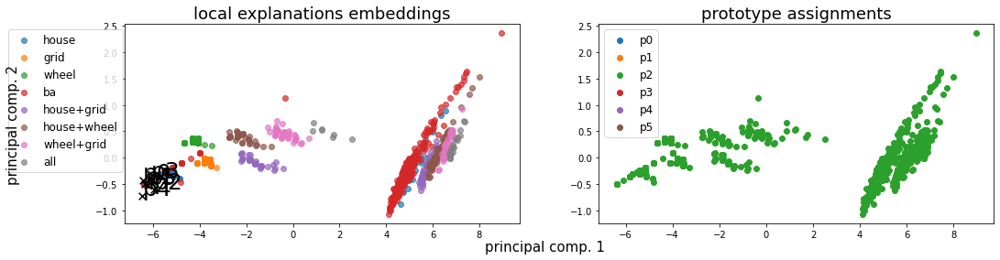

Alpha norms:
tensor([[0.9595, 1.0000, 0.9094, 0.7717, 0.9062, 0.8726],
        [0.8822, 0.8649, 0.8276, 1.0000, 0.9040, 0.7665]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.258763 +- 0.000000
Concept distribution:  (array([2], dtype=int64), array([970], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 33.67701, LEN: 0.088338, AccxC: 0.45, AccO: 0.00, V. Acc: 0.00, V. Loss: 20.37766, V. LEN 0.10
  2: Loss: 10.74329, LEN: 0.087918, AccxC: 0.46, AccO: 0.00, V. Acc: 0.00, V. Loss: 4.27773, V. LEN 0.10
  3: Loss: 2.26200, LEN: 0.087508, AccxC: 0.45, AccO: 0.00, V. Acc: 0.00, V. Loss: 1.31300, V. LEN 0.10
  4: Loss: 1.36844, LEN: 0.087130, AccxC: 0.52, AccO: 0.00, V. Acc: 0.00, V. Loss: 1.54515, V. LEN 0.10
  5: Loss: 1.34152, LEN: 0.086745, AccxC: 0.53, AccO: 0.00, V. Acc: 0.00, V. Loss: 1.40677, V. LEN 0.10
  6: Loss: 1.29529, LEN: 0.086364, AccxC: 0.49, AccO: 0.00, V. Acc: 0.00, V. Loss: 1.28084,

 76: Loss: 0.17991, LEN: 0.075380, AccxC: 0.55, AccO: 0.55, V. Acc: 0.60, V. Loss: 0.18261, V. LEN 0.08
 77: Loss: 0.17345, LEN: 0.074392, AccxC: 0.58, AccO: 0.58, V. Acc: 0.63, V. Loss: 0.17389, V. LEN 0.08
 78: Loss: 0.17245, LEN: 0.074492, AccxC: 0.59, AccO: 0.59, V. Acc: 0.61, V. Loss: 0.17566, V. LEN 0.08
 79: Loss: 0.17531, LEN: 0.075356, AccxC: 0.58, AccO: 0.58, V. Acc: 0.60, V. Loss: 0.17997, V. LEN 0.08


 80: Loss: 0.17100, LEN: 0.075075, AccxC: 0.55, AccO: 0.55, V. Acc: 0.65, V. Loss: 0.17409, V. LEN 0.08
 81: Loss: 0.16528, LEN: 0.074474, AccxC: 0.58, AccO: 0.58, V. Acc: 0.65, V. Loss: 0.16810, V. LEN 0.08
 82: Loss: 0.17262, LEN: 0.075086, AccxC: 0.55, AccO: 0.55, V. Acc: 0.57, V. Loss: 0.18041, V. LEN 0.09
 83: Loss: 0.16225, LEN: 0.074392, AccxC: 0.60, AccO: 0.60, V. Acc: 0.65, V. Loss: 0.17014, V. LEN 0.08
 84: Loss: 0.16107, LEN: 0.074390, AccxC: 0.58, AccO: 0.58, V. Acc: 0.65, V. Loss: 0.17028, V. LEN 0.08
 85: Loss: 0.16106, LEN: 0.073820, AccxC: 0.60, AccO: 0.60, V.

155: Loss: 0.10679, LEN: 0.070271, AccxC: 0.68, AccO: 0.68, V. Acc: 0.76, V. Loss: 0.11546, V. LEN 0.07
156: Loss: 0.10666, LEN: 0.070849, AccxC: 0.68, AccO: 0.68, V. Acc: 0.77, V. Loss: 0.11598, V. LEN 0.07
157: Loss: 0.10436, LEN: 0.068848, AccxC: 0.69, AccO: 0.69, V. Acc: 0.82, V. Loss: 0.11008, V. LEN 0.07
158: Loss: 0.10453, LEN: 0.069787, AccxC: 0.68, AccO: 0.68, V. Acc: 0.68, V. Loss: 0.11824, V. LEN 0.08
159: Loss: 0.10534, LEN: 0.069566, AccxC: 0.68, AccO: 0.68, V. Acc: 0.82, V. Loss: 0.11360, V. LEN 0.07


160: Loss: 0.10341, LEN: 0.069965, AccxC: 0.69, AccO: 0.69, V. Acc: 0.84, V. Loss: 0.10817, V. LEN 0.07
161: Loss: 0.10440, LEN: 0.070197, AccxC: 0.67, AccO: 0.67, V. Acc: 0.69, V. Loss: 0.12002, V. LEN 0.08
162: Loss: 0.10196, LEN: 0.068793, AccxC: 0.69, AccO: 0.69, V. Acc: 0.82, V. Loss: 0.10906, V. LEN 0.07
163: Loss: 0.10254, LEN: 0.067737, AccxC: 0.70, AccO: 0.70, V. Acc: 0.71, V. Loss: 0.11810, V. LEN 0.08
164: Loss: 0.10157, LEN: 0.068689, AccxC: 0.69, AccO: 0.69, V.

231: Loss: 0.06965, LEN: 0.049912, AccxC: 0.82, AccO: 0.82, V. Acc: 0.89, V. Loss: 0.06535, V. LEN 0.04
232: Loss: 0.06851, LEN: 0.050431, AccxC: 0.84, AccO: 0.84, V. Acc: 0.89, V. Loss: 0.06532, V. LEN 0.04
233: Loss: 0.06727, LEN: 0.048868, AccxC: 0.84, AccO: 0.84, V. Acc: 0.89, V. Loss: 0.06816, V. LEN 0.04
234: Loss: 0.06902, LEN: 0.051300, AccxC: 0.82, AccO: 0.82, V. Acc: 0.87, V. Loss: 0.06886, V. LEN 0.05
235: Loss: 0.06716, LEN: 0.048408, AccxC: 0.82, AccO: 0.82, V. Acc: 0.89, V. Loss: 0.06492, V. LEN 0.04
236: Loss: 0.06913, LEN: 0.050279, AccxC: 0.83, AccO: 0.83, V. Acc: 0.89, V. Loss: 0.06450, V. LEN 0.04
237: Loss: 0.06877, LEN: 0.050898, AccxC: 0.82, AccO: 0.82, V. Acc: 0.89, V. Loss: 0.06305, V. LEN 0.04
238: Loss: 0.06449, LEN: 0.046587, AccxC: 0.84, AccO: 0.84, V. Acc: 0.89, V. Loss: 0.06504, V. LEN 0.04
239: Loss: 0.06586, LEN: 0.048074, AccxC: 0.84, AccO: 0.84, V. Acc: 0.89, V. Loss: 0.06075, V. LEN 0.04


240: Loss: 0.06750, LEN: 0.049929, AccxC: 0.83, AccO: 0.83, V.

310: Loss: 0.05408, LEN: 0.044688, AccxC: 0.84, AccO: 0.85, V. Acc: 0.89, V. Loss: 0.05114, V. LEN 0.04
311: Loss: 0.05320, LEN: 0.043127, AccxC: 0.87, AccO: 0.87, V. Acc: 0.89, V. Loss: 0.05383, V. LEN 0.04
312: Loss: 0.04964, LEN: 0.039727, AccxC: 0.87, AccO: 0.87, V. Acc: 0.92, V. Loss: 0.04964, V. LEN 0.04
313: Loss: 0.04861, LEN: 0.039854, AccxC: 0.87, AccO: 0.87, V. Acc: 0.89, V. Loss: 0.05307, V. LEN 0.04
314: Loss: 0.05096, LEN: 0.041010, AccxC: 0.87, AccO: 0.87, V. Acc: 0.89, V. Loss: 0.05310, V. LEN 0.04
315: Loss: 0.04895, LEN: 0.039926, AccxC: 0.87, AccO: 0.87, V. Acc: 0.92, V. Loss: 0.04868, V. LEN 0.04
316: Loss: 0.05120, LEN: 0.041302, AccxC: 0.87, AccO: 0.87, V. Acc: 0.89, V. Loss: 0.05201, V. LEN 0.04
317: Loss: 0.05376, LEN: 0.044138, AccxC: 0.86, AccO: 0.86, V. Acc: 0.89, V. Loss: 0.05086, V. LEN 0.04
318: Loss: 0.05214, LEN: 0.043587, AccxC: 0.85, AccO: 0.85, V. Acc: 0.85, V. Loss: 0.07885, V. LEN 0.06
319: Loss: 0.04989, LEN: 0.040599, AccxC: 0.86, AccO: 0.86, V. A

389: Loss: 0.04637, LEN: 0.040408, AccxC: 0.85, AccO: 0.85, V. Acc: 0.79, V. Loss: 0.09894, V. LEN 0.09
390: Loss: 0.04829, LEN: 0.042144, AccxC: 0.86, AccO: 0.86, V. Acc: 0.89, V. Loss: 0.04548, V. LEN 0.04
391: Loss: 0.04883, LEN: 0.042030, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.04714, V. LEN 0.04
392: Loss: 0.04252, LEN: 0.037292, AccxC: 0.88, AccO: 0.88, V. Acc: 0.90, V. Loss: 0.05042, V. LEN 0.04
393: Loss: 0.04469, LEN: 0.037291, AccxC: 0.88, AccO: 0.88, V. Acc: 0.91, V. Loss: 0.04755, V. LEN 0.04
394: Loss: 0.04321, LEN: 0.037541, AccxC: 0.88, AccO: 0.88, V. Acc: 0.92, V. Loss: 0.04460, V. LEN 0.04
395: Loss: 0.04372, LEN: 0.037909, AccxC: 0.88, AccO: 0.88, V. Acc: 0.91, V. Loss: 0.04510, V. LEN 0.04
396: Loss: 0.04108, LEN: 0.035577, AccxC: 0.88, AccO: 0.88, V. Acc: 0.91, V. Loss: 0.04600, V. LEN 0.04
397: Loss: 0.04255, LEN: 0.037073, AccxC: 0.89, AccO: 0.88, V. Acc: 0.92, V. Loss: 0.03953, V. LEN 0.03
398: Loss: 0.03967, LEN: 0.034246, AccxC: 0.89, AccO: 0.89, V. A

468: Loss: 0.04258, LEN: 0.038411, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.04415, V. LEN 0.04
469: Loss: 0.03856, LEN: 0.034148, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04270, V. LEN 0.04
470: Loss: 0.03921, LEN: 0.035842, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.04344, V. LEN 0.04
471: Loss: 0.03732, LEN: 0.034091, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04359, V. LEN 0.04
472: Loss: 0.03634, LEN: 0.032711, AccxC: 0.89, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.04282, V. LEN 0.04
473: Loss: 0.03722, LEN: 0.033750, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04208, V. LEN 0.04
474: Loss: 0.03563, LEN: 0.032194, AccxC: 0.90, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.04253, V. LEN 0.04
475: Loss: 0.03769, LEN: 0.034005, AccxC: 0.88, AccO: 0.88, V. Acc: 0.88, V. Loss: 0.04851, V. LEN 0.04
476: Loss: 0.04555, LEN: 0.041299, AccxC: 0.85, AccO: 0.85, V. Acc: 0.89, V. Loss: 0.04283, V. LEN 0.04
477: Loss: 0.03747, LEN: 0.034178, AccxC: 0.91, AccO: 0.91, V. A

547: Loss: 0.03930, LEN: 0.036603, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.04212, V. LEN 0.04
548: Loss: 0.03876, LEN: 0.035913, AccxC: 0.88, AccO: 0.88, V. Acc: 0.92, V. Loss: 0.03431, V. LEN 0.03
549: Loss: 0.04111, LEN: 0.037772, AccxC: 0.88, AccO: 0.87, V. Acc: 0.89, V. Loss: 0.04278, V. LEN 0.04
550: Loss: 0.03622, LEN: 0.033146, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04207, V. LEN 0.04
551: Loss: 0.03570, LEN: 0.032466, AccxC: 0.90, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03548, V. LEN 0.03
552: Loss: 0.03590, LEN: 0.033082, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.03506, V. LEN 0.03
553: Loss: 0.03345, LEN: 0.030918, AccxC: 0.90, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03448, V. LEN 0.03
554: Loss: 0.03859, LEN: 0.036051, AccxC: 0.90, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04238, V. LEN 0.04
555: Loss: 0.03691, LEN: 0.034559, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04232, V. LEN 0.04
556: Loss: 0.03576, LEN: 0.033443, AccxC: 0.90, AccO: 0.90, V. A

625: Loss: 0.03620, LEN: 0.033712, AccxC: 0.89, AccO: 0.89, V. Acc: 0.93, V. Loss: 0.03391, V. LEN 0.03
626: Loss: 0.03797, LEN: 0.035762, AccxC: 0.90, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.04082, V. LEN 0.04
627: Loss: 0.03762, LEN: 0.035293, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.04082, V. LEN 0.04
628: Loss: 0.03834, LEN: 0.035919, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.04254, V. LEN 0.04
629: Loss: 0.03739, LEN: 0.035086, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.04123, V. LEN 0.04
630: Loss: 0.03366, LEN: 0.031809, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04098, V. LEN 0.04
631: Loss: 0.03748, LEN: 0.034836, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.04124, V. LEN 0.04
632: Loss: 0.03627, LEN: 0.034189, AccxC: 0.90, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04101, V. LEN 0.04
633: Loss: 0.03629, LEN: 0.034241, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03352, V. LEN 0.03
634: Loss: 0.03328, LEN: 0.031208, AccxC: 0.91, AccO: 0.90, V. A

704: Loss: 0.03551, LEN: 0.034038, AccxC: 0.90, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.04045, V. LEN 0.04
705: Loss: 0.03276, LEN: 0.031337, AccxC: 0.90, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.04030, V. LEN 0.04
706: Loss: 0.03888, LEN: 0.036754, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04028, V. LEN 0.04
707: Loss: 0.03699, LEN: 0.034951, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04024, V. LEN 0.04
708: Loss: 0.03460, LEN: 0.032884, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04038, V. LEN 0.04
709: Loss: 0.03169, LEN: 0.029698, AccxC: 0.92, AccO: 0.92, V. Acc: 0.89, V. Loss: 0.04036, V. LEN 0.04
710: Loss: 0.03625, LEN: 0.034640, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04049, V. LEN 0.04
711: Loss: 0.03533, LEN: 0.033624, AccxC: 0.90, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04098, V. LEN 0.04
712: Loss: 0.03421, LEN: 0.032320, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04081, V. LEN 0.04
713: Loss: 0.03342, LEN: 0.031803, AccxC: 0.90, AccO: 0.90, V. A

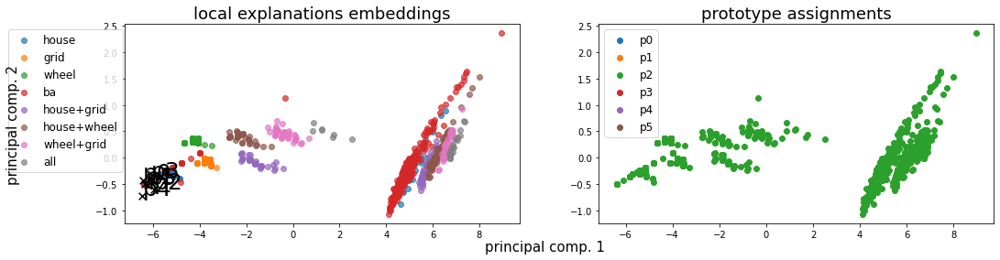

Alpha norms:
tensor([[0.9595, 1.0000, 0.9094, 0.7717, 0.9062, 0.8726],
        [0.8822, 0.8649, 0.8276, 1.0000, 0.9040, 0.7665]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.258763 +- 0.000000
Concept distribution:  (array([2], dtype=int64), array([970], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 74.57745, LEN: 0.088338, AccxC: 0.45, AccO: 0.00, V. Acc: 0.00, V. Loss: 44.97666, V. LEN 0.10
  2: Loss: 23.64073, LEN: 0.087919, AccxC: 0.46, AccO: 0.00, V. Acc: 0.00, V. Loss: 9.23031, V. LEN 0.10
  3: Loss: 4.80432, LEN: 0.087508, AccxC: 0.45, AccO: 0.00, V. Acc: 0.00, V. Loss: 2.63311, V. LEN 0.10
  4: Loss: 2.80023, LEN: 0.087128, AccxC: 0.52, AccO: 0.00, V. Acc: 0.00, V. Loss: 3.14483, V. LEN 0.10
  5: Loss: 2.74484, LEN: 0.086746, AccxC: 0.52, AccO: 0.00, V. Acc: 0.00, V. Loss: 2.85637, V. LEN 0.10
  6: Loss: 2.62330, LEN: 0.086362, AccxC: 0.49, AccO: 0.00, V. Acc: 0.00, V. Loss: 2.51805,

 76: Loss: 0.26747, LEN: 0.075395, AccxC: 0.55, AccO: 0.55, V. Acc: 0.60, V. Loss: 0.24898, V. LEN 0.08
 77: Loss: 0.25718, LEN: 0.074243, AccxC: 0.58, AccO: 0.58, V. Acc: 0.57, V. Loss: 0.22722, V. LEN 0.08
 78: Loss: 0.25510, LEN: 0.074542, AccxC: 0.59, AccO: 0.59, V. Acc: 0.61, V. Loss: 0.23248, V. LEN 0.08
 79: Loss: 0.26013, LEN: 0.075283, AccxC: 0.59, AccO: 0.59, V. Acc: 0.61, V. Loss: 0.24914, V. LEN 0.08


 80: Loss: 0.25319, LEN: 0.075357, AccxC: 0.54, AccO: 0.54, V. Acc: 0.64, V. Loss: 0.22007, V. LEN 0.08
 81: Loss: 0.24008, LEN: 0.074591, AccxC: 0.57, AccO: 0.57, V. Acc: 0.64, V. Loss: 0.22222, V. LEN 0.08
 82: Loss: 0.25524, LEN: 0.075179, AccxC: 0.55, AccO: 0.55, V. Acc: 0.61, V. Loss: 0.23785, V. LEN 0.08
 83: Loss: 0.23659, LEN: 0.074622, AccxC: 0.59, AccO: 0.59, V. Acc: 0.61, V. Loss: 0.23134, V. LEN 0.08
 84: Loss: 0.23277, LEN: 0.074289, AccxC: 0.59, AccO: 0.59, V. Acc: 0.64, V. Loss: 0.21834, V. LEN 0.08
 85: Loss: 0.23339, LEN: 0.073955, AccxC: 0.59, AccO: 0.59, V.

155: Loss: 0.14033, LEN: 0.073687, AccxC: 0.61, AccO: 0.61, V. Acc: 0.66, V. Loss: 0.15023, V. LEN 0.08
156: Loss: 0.13823, LEN: 0.073637, AccxC: 0.61, AccO: 0.61, V. Acc: 0.70, V. Loss: 0.15692, V. LEN 0.08
157: Loss: 0.13739, LEN: 0.072466, AccxC: 0.63, AccO: 0.63, V. Acc: 0.64, V. Loss: 0.15179, V. LEN 0.08
158: Loss: 0.13731, LEN: 0.073846, AccxC: 0.61, AccO: 0.60, V. Acc: 0.68, V. Loss: 0.14999, V. LEN 0.08
159: Loss: 0.14003, LEN: 0.073642, AccxC: 0.61, AccO: 0.61, V. Acc: 0.65, V. Loss: 0.15323, V. LEN 0.08


160: Loss: 0.13972, LEN: 0.073649, AccxC: 0.62, AccO: 0.62, V. Acc: 0.74, V. Loss: 0.14876, V. LEN 0.08
161: Loss: 0.13729, LEN: 0.074476, AccxC: 0.59, AccO: 0.59, V. Acc: 0.66, V. Loss: 0.15477, V. LEN 0.08
162: Loss: 0.13359, LEN: 0.073182, AccxC: 0.61, AccO: 0.61, V. Acc: 0.65, V. Loss: 0.14793, V. LEN 0.08
163: Loss: 0.13719, LEN: 0.072283, AccxC: 0.64, AccO: 0.63, V. Acc: 0.66, V. Loss: 0.15269, V. LEN 0.08
164: Loss: 0.13258, LEN: 0.072206, AccxC: 0.64, AccO: 0.64, V.

234: Loss: 0.09486, LEN: 0.063085, AccxC: 0.74, AccO: 0.74, V. Acc: 0.74, V. Loss: 0.10821, V. LEN 0.07
235: Loss: 0.09516, LEN: 0.063659, AccxC: 0.72, AccO: 0.72, V. Acc: 0.87, V. Loss: 0.09106, V. LEN 0.06
236: Loss: 0.09822, LEN: 0.064925, AccxC: 0.74, AccO: 0.74, V. Acc: 0.85, V. Loss: 0.10054, V. LEN 0.06
237: Loss: 0.09576, LEN: 0.065768, AccxC: 0.71, AccO: 0.71, V. Acc: 0.73, V. Loss: 0.10770, V. LEN 0.07
238: Loss: 0.09283, LEN: 0.061625, AccxC: 0.75, AccO: 0.75, V. Acc: 0.85, V. Loss: 0.09807, V. LEN 0.06
239: Loss: 0.09271, LEN: 0.062792, AccxC: 0.75, AccO: 0.75, V. Acc: 0.77, V. Loss: 0.10230, V. LEN 0.07


240: Loss: 0.09300, LEN: 0.063162, AccxC: 0.74, AccO: 0.75, V. Acc: 0.81, V. Loss: 0.09975, V. LEN 0.06
241: Loss: 0.09304, LEN: 0.063069, AccxC: 0.74, AccO: 0.74, V. Acc: 0.85, V. Loss: 0.09681, V. LEN 0.06
242: Loss: 0.09434, LEN: 0.063761, AccxC: 0.74, AccO: 0.74, V. Acc: 0.80, V. Loss: 0.09854, V. LEN 0.07
243: Loss: 0.09353, LEN: 0.062679, AccxC: 0.71, AccO: 0.71, V.

313: Loss: 0.07095, LEN: 0.053438, AccxC: 0.81, AccO: 0.81, V. Acc: 0.87, V. Loss: 0.07545, V. LEN 0.05
314: Loss: 0.07050, LEN: 0.051336, AccxC: 0.82, AccO: 0.82, V. Acc: 0.88, V. Loss: 0.07571, V. LEN 0.05
315: Loss: 0.06978, LEN: 0.052265, AccxC: 0.81, AccO: 0.81, V. Acc: 0.88, V. Loss: 0.07529, V. LEN 0.05
316: Loss: 0.06902, LEN: 0.050141, AccxC: 0.82, AccO: 0.82, V. Acc: 0.89, V. Loss: 0.07040, V. LEN 0.05
317: Loss: 0.07424, LEN: 0.056510, AccxC: 0.79, AccO: 0.79, V. Acc: 0.88, V. Loss: 0.07736, V. LEN 0.05
318: Loss: 0.07041, LEN: 0.052729, AccxC: 0.81, AccO: 0.81, V. Acc: 0.85, V. Loss: 0.08309, V. LEN 0.05
319: Loss: 0.06974, LEN: 0.052379, AccxC: 0.81, AccO: 0.81, V. Acc: 0.87, V. Loss: 0.07598, V. LEN 0.05


320: Loss: 0.06707, LEN: 0.049346, AccxC: 0.83, AccO: 0.83, V. Acc: 0.87, V. Loss: 0.07389, V. LEN 0.05
321: Loss: 0.06851, LEN: 0.051053, AccxC: 0.81, AccO: 0.81, V. Acc: 0.89, V. Loss: 0.07407, V. LEN 0.05
322: Loss: 0.06933, LEN: 0.050427, AccxC: 0.81, AccO: 0.81, V.

392: Loss: 0.05351, LEN: 0.043143, AccxC: 0.85, AccO: 0.85, V. Acc: 0.89, V. Loss: 0.05829, V. LEN 0.04
393: Loss: 0.06023, LEN: 0.046390, AccxC: 0.84, AccO: 0.84, V. Acc: 0.89, V. Loss: 0.05890, V. LEN 0.04
394: Loss: 0.06101, LEN: 0.048863, AccxC: 0.82, AccO: 0.82, V. Acc: 0.86, V. Loss: 0.06877, V. LEN 0.05
395: Loss: 0.05190, LEN: 0.040291, AccxC: 0.86, AccO: 0.86, V. Acc: 0.82, V. Loss: 0.08310, V. LEN 0.06
396: Loss: 0.05728, LEN: 0.045642, AccxC: 0.83, AccO: 0.83, V. Acc: 0.87, V. Loss: 0.06468, V. LEN 0.05
397: Loss: 0.05615, LEN: 0.044988, AccxC: 0.84, AccO: 0.84, V. Acc: 0.89, V. Loss: 0.05523, V. LEN 0.04
398: Loss: 0.05268, LEN: 0.041867, AccxC: 0.85, AccO: 0.85, V. Acc: 0.89, V. Loss: 0.05721, V. LEN 0.04
399: Loss: 0.05301, LEN: 0.042919, AccxC: 0.84, AccO: 0.84, V. Acc: 0.89, V. Loss: 0.05718, V. LEN 0.04


400: Loss: 0.05506, LEN: 0.045098, AccxC: 0.84, AccO: 0.84, V. Acc: 0.86, V. Loss: 0.06732, V. LEN 0.05
401: Loss: 0.05425, LEN: 0.042846, AccxC: 0.84, AccO: 0.84, V.

471: Loss: 0.04164, LEN: 0.035435, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.04092, V. LEN 0.03
472: Loss: 0.04197, LEN: 0.035100, AccxC: 0.88, AccO: 0.88, V. Acc: 0.91, V. Loss: 0.04550, V. LEN 0.04
473: Loss: 0.04149, LEN: 0.034824, AccxC: 0.90, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04667, V. LEN 0.04
474: Loss: 0.04401, LEN: 0.037414, AccxC: 0.87, AccO: 0.87, V. Acc: 0.89, V. Loss: 0.04813, V. LEN 0.04
475: Loss: 0.04007, LEN: 0.033258, AccxC: 0.90, AccO: 0.89, V. Acc: 0.87, V. Loss: 0.05566, V. LEN 0.05
476: Loss: 0.04659, LEN: 0.039301, AccxC: 0.87, AccO: 0.87, V. Acc: 0.90, V. Loss: 0.05021, V. LEN 0.04
477: Loss: 0.04395, LEN: 0.037388, AccxC: 0.89, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.04635, V. LEN 0.04
478: Loss: 0.04310, LEN: 0.035916, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.04771, V. LEN 0.04
479: Loss: 0.04610, LEN: 0.039530, AccxC: 0.87, AccO: 0.87, V. Acc: 0.88, V. Loss: 0.05899, V. LEN 0.05


480: Loss: 0.04461, LEN: 0.038492, AccxC: 0.88, AccO: 0.88, V.

550: Loss: 0.03669, LEN: 0.031409, AccxC: 0.90, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.04426, V. LEN 0.04
551: Loss: 0.03951, LEN: 0.034287, AccxC: 0.89, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.04484, V. LEN 0.04
552: Loss: 0.04105, LEN: 0.036014, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.04442, V. LEN 0.04
553: Loss: 0.04079, LEN: 0.036274, AccxC: 0.88, AccO: 0.87, V. Acc: 0.92, V. Loss: 0.03673, V. LEN 0.03
554: Loss: 0.04179, LEN: 0.037080, AccxC: 0.89, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.04465, V. LEN 0.04
555: Loss: 0.03998, LEN: 0.035558, AccxC: 0.89, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.04550, V. LEN 0.04
556: Loss: 0.04282, LEN: 0.038431, AccxC: 0.86, AccO: 0.86, V. Acc: 0.89, V. Loss: 0.04320, V. LEN 0.04
557: Loss: 0.04257, LEN: 0.038311, AccxC: 0.86, AccO: 0.86, V. Acc: 0.89, V. Loss: 0.04394, V. LEN 0.04
558: Loss: 0.04067, LEN: 0.036077, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.04438, V. LEN 0.04
559: Loss: 0.03982, LEN: 0.035794, AccxC: 0.88, AccO: 0.88, V. A

629: Loss: 0.04074, LEN: 0.037476, AccxC: 0.87, AccO: 0.87, V. Acc: 0.89, V. Loss: 0.04190, V. LEN 0.04
630: Loss: 0.03902, LEN: 0.035522, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.04213, V. LEN 0.04
631: Loss: 0.05449, LEN: 0.049615, AccxC: 0.79, AccO: 0.78, V. Acc: 0.89, V. Loss: 0.04138, V. LEN 0.04
632: Loss: 0.04119, LEN: 0.037590, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.04382, V. LEN 0.04
633: Loss: 0.04581, LEN: 0.041959, AccxC: 0.82, AccO: 0.82, V. Acc: 0.89, V. Loss: 0.04261, V. LEN 0.04
634: Loss: 0.03761, LEN: 0.034294, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04236, V. LEN 0.04
635: Loss: 0.03965, LEN: 0.035886, AccxC: 0.88, AccO: 0.87, V. Acc: 0.89, V. Loss: 0.04266, V. LEN 0.04
636: Loss: 0.04040, LEN: 0.036193, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.04173, V. LEN 0.04
637: Loss: 0.03828, LEN: 0.034461, AccxC: 0.89, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.04249, V. LEN 0.04
638: Loss: 0.03669, LEN: 0.033587, AccxC: 0.89, AccO: 0.89, V. A

708: Loss: 0.03660, LEN: 0.033671, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04272, V. LEN 0.04
709: Loss: 0.03588, LEN: 0.032897, AccxC: 0.90, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.04167, V. LEN 0.04
710: Loss: 0.03772, LEN: 0.035091, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04148, V. LEN 0.04
711: Loss: 0.03847, LEN: 0.035776, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04134, V. LEN 0.04
712: Loss: 0.03907, LEN: 0.036064, AccxC: 0.86, AccO: 0.86, V. Acc: 0.89, V. Loss: 0.04099, V. LEN 0.04
713: Loss: 0.04138, LEN: 0.038784, AccxC: 0.87, AccO: 0.87, V. Acc: 0.89, V. Loss: 0.04128, V. LEN 0.04
714: Loss: 0.03866, LEN: 0.035414, AccxC: 0.88, AccO: 0.88, V. Acc: 0.86, V. Loss: 0.05763, V. LEN 0.06
715: Loss: 0.03842, LEN: 0.035418, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04143, V. LEN 0.04
716: Loss: 0.03730, LEN: 0.034043, AccxC: 0.89, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.04113, V. LEN 0.04
717: Loss: 0.03572, LEN: 0.032714, AccxC: 0.90, AccO: 0.89, V. A

787: Loss: 0.03796, LEN: 0.035413, AccxC: 0.89, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.04100, V. LEN 0.04
788: Loss: 0.03705, LEN: 0.033800, AccxC: 0.90, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03363, V. LEN 0.03
789: Loss: 0.03565, LEN: 0.032745, AccxC: 0.89, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.04045, V. LEN 0.04
790: Loss: 0.03912, LEN: 0.036286, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.04096, V. LEN 0.04
791: Loss: 0.03744, LEN: 0.034847, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.04035, V. LEN 0.04
792: Loss: 0.03900, LEN: 0.036508, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04060, V. LEN 0.04
793: Loss: 0.03488, LEN: 0.032166, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04036, V. LEN 0.04
794: Loss: 0.03681, LEN: 0.034382, AccxC: 0.89, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.04042, V. LEN 0.04
795: Loss: 0.03677, LEN: 0.034399, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04011, V. LEN 0.04
796: Loss: 0.03577, LEN: 0.033741, AccxC: 0.89, AccO: 0.89, V. A

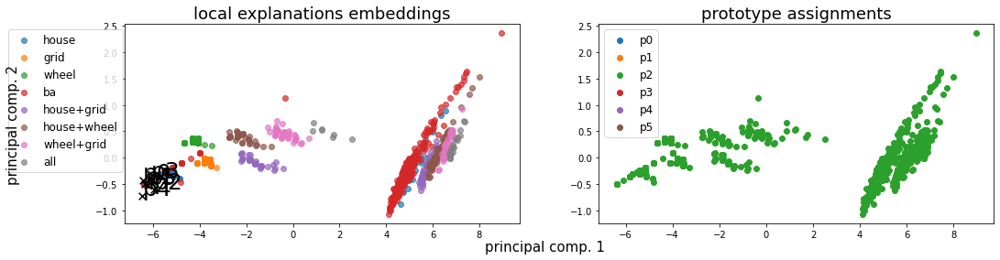

Alpha norms:
tensor([[0.9595, 1.0000, 0.9094, 0.7717, 0.9062, 0.8726],
        [0.8822, 0.8649, 0.8276, 1.0000, 0.9040, 0.7665]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.258763 +- 0.000000
Concept distribution:  (array([2], dtype=int64), array([970], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 1.27359, LEN: 0.088345, AccxC: 0.52, AccO: 0.00, V. Acc: 0.00, V. Loss: 1.30593, V. LEN 0.10
  2: Loss: 0.91734, LEN: 0.087956, AccxC: 0.57, AccO: 0.00, V. Acc: 0.00, V. Loss: 1.05963, V. LEN 0.10
  3: Loss: 0.71113, LEN: 0.087555, AccxC: 0.62, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.76309, V. LEN 0.10
  4: Loss: 0.56352, LEN: 0.087154, AccxC: 0.55, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.79545, V. LEN 0.10
  5: Loss: 0.52989, LEN: 0.086756, AccxC: 0.54, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.75037, V. LEN 0.10
  6: Loss: 0.43714, LEN: 0.086415, AccxC: 0.52, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.71125, V.

 74: Loss: 0.10444, LEN: 0.068086, AccxC: 0.70, AccO: 0.59, V. Acc: 0.58, V. Loss: 0.18120, V. LEN 0.07
 75: Loss: 0.10640, LEN: 0.069247, AccxC: 0.68, AccO: 0.56, V. Acc: 0.49, V. Loss: 0.19867, V. LEN 0.08
 76: Loss: 0.11224, LEN: 0.068409, AccxC: 0.69, AccO: 0.58, V. Acc: 0.53, V. Loss: 0.18340, V. LEN 0.08
 77: Loss: 0.11037, LEN: 0.068856, AccxC: 0.66, AccO: 0.58, V. Acc: 0.51, V. Loss: 0.17580, V. LEN 0.08
 78: Loss: 0.10043, LEN: 0.066809, AccxC: 0.69, AccO: 0.61, V. Acc: 0.70, V. Loss: 0.16450, V. LEN 0.07
 79: Loss: 0.10094, LEN: 0.069697, AccxC: 0.69, AccO: 0.58, V. Acc: 0.71, V. Loss: 0.16786, V. LEN 0.06

------------------------------------------------------------------------------------
Has double activations  tensor(98)
But only for wrong predictions



 80: Loss: 0.10106, LEN: 0.065829, AccxC: 0.73, AccO: 0.62, V. Acc: 0.72, V. Loss: 0.15251, V. LEN 0.06
 81: Loss: 0.10531, LEN: 0.064413, AccxC: 0.74, AccO: 0.64, V. Acc: 0.68, V. Loss: 0.15475, V. LEN 0.07
 82: Loss: 0.

147: Loss: 0.06609, LEN: 0.051348, AccxC: 0.78, AccO: 0.76, V. Acc: 0.69, V. Loss: 0.09671, V. LEN 0.06
148: Loss: 0.07099, LEN: 0.055826, AccxC: 0.74, AccO: 0.71, V. Acc: 0.71, V. Loss: 0.09367, V. LEN 0.06
149: Loss: 0.06825, LEN: 0.054002, AccxC: 0.77, AccO: 0.74, V. Acc: 0.81, V. Loss: 0.08947, V. LEN 0.05
150: Loss: 0.06915, LEN: 0.053512, AccxC: 0.75, AccO: 0.73, V. Acc: 0.70, V. Loss: 0.09784, V. LEN 0.06
151: Loss: 0.06791, LEN: 0.054142, AccxC: 0.76, AccO: 0.73, V. Acc: 0.76, V. Loss: 0.09663, V. LEN 0.05
152: Loss: 0.07174, LEN: 0.052893, AccxC: 0.76, AccO: 0.72, V. Acc: 0.76, V. Loss: 0.09157, V. LEN 0.05
153: Loss: 0.06735, LEN: 0.052164, AccxC: 0.78, AccO: 0.72, V. Acc: 0.61, V. Loss: 0.11463, V. LEN 0.06
154: Loss: 0.06882, LEN: 0.051795, AccxC: 0.78, AccO: 0.71, V. Acc: 0.64, V. Loss: 0.08701, V. LEN 0.06
155: Loss: 0.06815, LEN: 0.053053, AccxC: 0.76, AccO: 0.71, V. Acc: 0.65, V. Loss: 0.09527, V. LEN 0.05
156: Loss: 0.06998, LEN: 0.052139, AccxC: 0.76, AccO: 0.71, V. A

223: Loss: 0.05516, LEN: 0.047857, AccxC: 0.80, AccO: 0.80, V. Acc: 0.87, V. Loss: 0.07733, V. LEN 0.05
224: Loss: 0.05573, LEN: 0.049813, AccxC: 0.79, AccO: 0.79, V. Acc: 0.83, V. Loss: 0.07697, V. LEN 0.05
225: Loss: 0.05644, LEN: 0.049893, AccxC: 0.78, AccO: 0.78, V. Acc: 0.78, V. Loss: 0.09400, V. LEN 0.06
226: Loss: 0.05755, LEN: 0.050767, AccxC: 0.74, AccO: 0.75, V. Acc: 0.82, V. Loss: 0.08733, V. LEN 0.06
227: Loss: 0.06030, LEN: 0.051942, AccxC: 0.75, AccO: 0.73, V. Acc: 0.82, V. Loss: 0.09086, V. LEN 0.06
228: Loss: 0.05762, LEN: 0.049906, AccxC: 0.78, AccO: 0.69, V. Acc: 0.68, V. Loss: 0.09104, V. LEN 0.06
229: Loss: 0.05292, LEN: 0.046213, AccxC: 0.79, AccO: 0.73, V. Acc: 0.72, V. Loss: 0.07698, V. LEN 0.05
230: Loss: 0.05927, LEN: 0.051673, AccxC: 0.77, AccO: 0.67, V. Acc: 0.58, V. Loss: 0.09743, V. LEN 0.06
231: Loss: 0.05750, LEN: 0.050585, AccxC: 0.76, AccO: 0.70, V. Acc: 0.72, V. Loss: 0.08311, V. LEN 0.05
232: Loss: 0.05799, LEN: 0.051025, AccxC: 0.80, AccO: 0.80, V. A

302: Loss: 0.04154, LEN: 0.037815, AccxC: 0.85, AccO: 0.84, V. Acc: 0.72, V. Loss: 0.04922, V. LEN 0.04
303: Loss: 0.03919, LEN: 0.034475, AccxC: 0.82, AccO: 0.78, V. Acc: 0.57, V. Loss: 0.06075, V. LEN 0.04
304: Loss: 0.03961, LEN: 0.032946, AccxC: 0.82, AccO: 0.77, V. Acc: 0.74, V. Loss: 0.05032, V. LEN 0.04
305: Loss: 0.04144, LEN: 0.036087, AccxC: 0.87, AccO: 0.84, V. Acc: 0.81, V. Loss: 0.03793, V. LEN 0.03
306: Loss: 0.03825, LEN: 0.034393, AccxC: 0.86, AccO: 0.83, V. Acc: 0.78, V. Loss: 0.03483, V. LEN 0.03
307: Loss: 0.03937, LEN: 0.033684, AccxC: 0.85, AccO: 0.84, V. Acc: 0.82, V. Loss: 0.04123, V. LEN 0.03
308: Loss: 0.03849, LEN: 0.033060, AccxC: 0.85, AccO: 0.82, V. Acc: 0.76, V. Loss: 0.04482, V. LEN 0.04
309: Loss: 0.03837, LEN: 0.034452, AccxC: 0.88, AccO: 0.79, V. Acc: 0.82, V. Loss: 0.03798, V. LEN 0.03
310: Loss: 0.03471, LEN: 0.031510, AccxC: 0.89, AccO: 0.80, V. Acc: 0.79, V. Loss: 0.04811, V. LEN 0.04
311: Loss: 0.03510, LEN: 0.031231, AccxC: 0.88, AccO: 0.87, V. A

378: Loss: 0.03087, LEN: 0.028327, AccxC: 0.86, AccO: 0.74, V. Acc: 0.59, V. Loss: 0.04653, V. LEN 0.04
379: Loss: 0.02686, LEN: 0.024551, AccxC: 0.89, AccO: 0.84, V. Acc: 0.67, V. Loss: 0.04696, V. LEN 0.04


380: Loss: 0.02691, LEN: 0.024344, AccxC: 0.86, AccO: 0.83, V. Acc: 0.70, V. Loss: 0.04744, V. LEN 0.04
381: Loss: 0.02911, LEN: 0.025807, AccxC: 0.87, AccO: 0.85, V. Acc: 0.87, V. Loss: 0.04369, V. LEN 0.04
382: Loss: 0.02693, LEN: 0.024126, AccxC: 0.89, AccO: 0.89, V. Acc: 0.87, V. Loss: 0.04241, V. LEN 0.04
383: Loss: 0.02730, LEN: 0.024972, AccxC: 0.88, AccO: 0.88, V. Acc: 0.86, V. Loss: 0.04080, V. LEN 0.03
384: Loss: 0.02702, LEN: 0.023649, AccxC: 0.89, AccO: 0.89, V. Acc: 0.87, V. Loss: 0.03242, V. LEN 0.03
385: Loss: 0.02639, LEN: 0.023838, AccxC: 0.87, AccO: 0.87, V. Acc: 0.67, V. Loss: 0.04799, V. LEN 0.04
386: Loss: 0.02744, LEN: 0.024445, AccxC: 0.88, AccO: 0.88, V. Acc: 0.82, V. Loss: 0.03720, V. LEN 0.03
387: Loss: 0.03206, LEN: 0.029279, AccxC: 0.88, AccO: 0.88, V.

457: Loss: 0.02785, LEN: 0.025983, AccxC: 0.86, AccO: 0.86, V. Acc: 0.78, V. Loss: 0.04002, V. LEN 0.03
458: Loss: 0.02655, LEN: 0.024486, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.02505, V. LEN 0.02
459: Loss: 0.02427, LEN: 0.022524, AccxC: 0.89, AccO: 0.89, V. Acc: 0.79, V. Loss: 0.03942, V. LEN 0.03


460: Loss: 0.02508, LEN: 0.022992, AccxC: 0.87, AccO: 0.87, V. Acc: 0.65, V. Loss: 0.05533, V. LEN 0.05
461: Loss: 0.02735, LEN: 0.025247, AccxC: 0.88, AccO: 0.88, V. Acc: 0.78, V. Loss: 0.03783, V. LEN 0.03
462: Loss: 0.02516, LEN: 0.023291, AccxC: 0.90, AccO: 0.90, V. Acc: 0.79, V. Loss: 0.03677, V. LEN 0.03
463: Loss: 0.02782, LEN: 0.025895, AccxC: 0.90, AccO: 0.89, V. Acc: 0.85, V. Loss: 0.03083, V. LEN 0.03
464: Loss: 0.02769, LEN: 0.025033, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.02579, V. LEN 0.02
465: Loss: 0.02666, LEN: 0.024855, AccxC: 0.88, AccO: 0.88, V. Acc: 0.81, V. Loss: 0.03792, V. LEN 0.03
466: Loss: 0.02595, LEN: 0.023698, AccxC: 0.87, AccO: 0.87, V.

536: Loss: 0.02402, LEN: 0.022744, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.02337, V. LEN 0.02
537: Loss: 0.02038, LEN: 0.019042, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.02082, V. LEN 0.02
538: Loss: 0.02570, LEN: 0.024394, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.02960, V. LEN 0.03
539: Loss: 0.02677, LEN: 0.025260, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.03854, V. LEN 0.03


540: Loss: 0.02375, LEN: 0.022116, AccxC: 0.90, AccO: 0.90, V. Acc: 0.90, V. Loss: 0.03022, V. LEN 0.03
541: Loss: 0.02185, LEN: 0.020589, AccxC: 0.91, AccO: 0.91, V. Acc: 0.89, V. Loss: 0.02672, V. LEN 0.02
542: Loss: 0.02236, LEN: 0.020957, AccxC: 0.90, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.02503, V. LEN 0.02
543: Loss: 0.02229, LEN: 0.020780, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.02392, V. LEN 0.02
544: Loss: 0.02304, LEN: 0.021612, AccxC: 0.90, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.02865, V. LEN 0.02
545: Loss: 0.02344, LEN: 0.021584, AccxC: 0.89, AccO: 0.87, V.

612: Loss: 0.02125, LEN: 0.020034, AccxC: 0.89, AccO: 0.89, V. Acc: 0.85, V. Loss: 0.03014, V. LEN 0.03
613: Loss: 0.02211, LEN: 0.021102, AccxC: 0.90, AccO: 0.89, V. Acc: 0.84, V. Loss: 0.02539, V. LEN 0.02
614: Loss: 0.02138, LEN: 0.020040, AccxC: 0.89, AccO: 0.82, V. Acc: 0.69, V. Loss: 0.04492, V. LEN 0.04
615: Loss: 0.02418, LEN: 0.022962, AccxC: 0.86, AccO: 0.80, V. Acc: 0.80, V. Loss: 0.02773, V. LEN 0.02
616: Loss: 0.02525, LEN: 0.024029, AccxC: 0.93, AccO: 0.88, V. Acc: 0.84, V. Loss: 0.02578, V. LEN 0.02
617: Loss: 0.02429, LEN: 0.022678, AccxC: 0.86, AccO: 0.84, V. Acc: 0.71, V. Loss: 0.04910, V. LEN 0.04
618: Loss: 0.02565, LEN: 0.024181, AccxC: 0.86, AccO: 0.84, V. Acc: 0.91, V. Loss: 0.01997, V. LEN 0.02
619: Loss: 0.02601, LEN: 0.024212, AccxC: 0.90, AccO: 0.90, V. Acc: 0.93, V. Loss: 0.01694, V. LEN 0.02


620: Loss: 0.02618, LEN: 0.024515, AccxC: 0.91, AccO: 0.87, V. Acc: 0.89, V. Loss: 0.02400, V. LEN 0.02
621: Loss: 0.02514, LEN: 0.023685, AccxC: 0.89, AccO: 0.89, V.

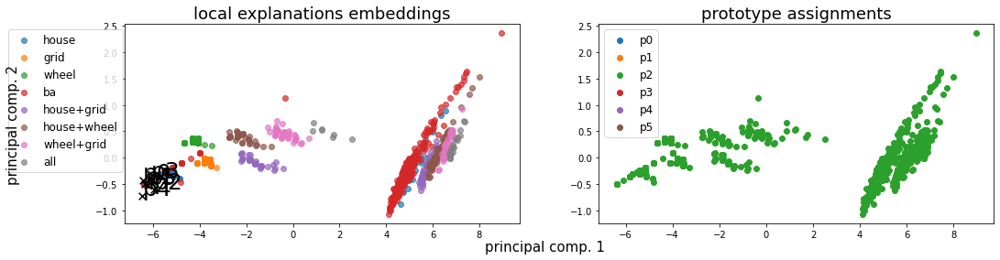

Alpha norms:
tensor([[0.9595, 1.0000, 0.9094, 0.7717, 0.9062, 0.8726],
        [0.8822, 0.8649, 0.8276, 1.0000, 0.9040, 0.7665]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.258763 +- 0.000000
Concept distribution:  (array([2], dtype=int64), array([970], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 1.26603, LEN: 0.088346, AccxC: 0.51, AccO: 0.00, V. Acc: 0.00, V. Loss: 1.29862, V. LEN 0.10
  2: Loss: 0.91530, LEN: 0.087959, AccxC: 0.56, AccO: 0.00, V. Acc: 0.00, V. Loss: 1.06462, V. LEN 0.10
  3: Loss: 0.71796, LEN: 0.087557, AccxC: 0.61, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.76047, V. LEN 0.10
  4: Loss: 0.57144, LEN: 0.087174, AccxC: 0.55, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.75409, V. LEN 0.10
  5: Loss: 0.51953, LEN: 0.086774, AccxC: 0.52, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.76217, V. LEN 0.10
  6: Loss: 0.45577, LEN: 0.086408, AccxC: 0.54, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.70722, V.

 77: Loss: 0.10669, LEN: 0.064954, AccxC: 0.70, AccO: 0.48, V. Acc: 0.49, V. Loss: 0.18167, V. LEN 0.07
 78: Loss: 0.10621, LEN: 0.065917, AccxC: 0.69, AccO: 0.45, V. Acc: 0.55, V. Loss: 0.16774, V. LEN 0.07
 79: Loss: 0.09769, LEN: 0.066051, AccxC: 0.71, AccO: 0.52, V. Acc: 0.65, V. Loss: 0.14704, V. LEN 0.06

------------------------------------------------------------------------------------
Has double activations  tensor(197)
But only for wrong predictions



------------------------------------------------------------------------------------
Has double activations  tensor(8)
But only for wrong predictions


 80: Loss: 0.09971, LEN: 0.064465, AccxC: 0.68, AccO: 0.52, V. Acc: 0.66, V. Loss: 0.14972, V. LEN 0.06
 81: Loss: 0.10033, LEN: 0.061605, AccxC: 0.76, AccO: 0.53, V. Acc: 0.60, V. Loss: 0.15030, V. LEN 0.06
 82: Loss: 0.10147, LEN: 0.062052, AccxC: 0.72, AccO: 0.47, V. Acc: 0.51, V. Loss: 0.16898, V. LEN 0.07
 83: Loss: 0.09561, LEN: 0.064194, AccxC: 0.70, AccO: 0.43, V. Acc: 

149: Loss: 0.06787, LEN: 0.052726, AccxC: 0.77, AccO: 0.66, V. Acc: 0.81, V. Loss: 0.09905, V. LEN 0.05
150: Loss: 0.06707, LEN: 0.053004, AccxC: 0.76, AccO: 0.76, V. Acc: 0.79, V. Loss: 0.09170, V. LEN 0.05
151: Loss: 0.06677, LEN: 0.050343, AccxC: 0.76, AccO: 0.75, V. Acc: 0.87, V. Loss: 0.09668, V. LEN 0.05
152: Loss: 0.07351, LEN: 0.047931, AccxC: 0.79, AccO: 0.79, V. Acc: 0.83, V. Loss: 0.11276, V. LEN 0.05
153: Loss: 0.06630, LEN: 0.050746, AccxC: 0.79, AccO: 0.79, V. Acc: 0.80, V. Loss: 0.09830, V. LEN 0.05
154: Loss: 0.06409, LEN: 0.049694, AccxC: 0.76, AccO: 0.76, V. Acc: 0.80, V. Loss: 0.08663, V. LEN 0.05
155: Loss: 0.06759, LEN: 0.052578, AccxC: 0.74, AccO: 0.70, V. Acc: 0.69, V. Loss: 0.09399, V. LEN 0.05
156: Loss: 0.06708, LEN: 0.050740, AccxC: 0.75, AccO: 0.57, V. Acc: 0.67, V. Loss: 0.09537, V. LEN 0.05
157: Loss: 0.06617, LEN: 0.053908, AccxC: 0.72, AccO: 0.55, V. Acc: 0.60, V. Loss: 0.10450, V. LEN 0.06
158: Loss: 0.06839, LEN: 0.052686, AccxC: 0.73, AccO: 0.56, V. A

227: Loss: 0.05528, LEN: 0.046014, AccxC: 0.81, AccO: 0.81, V. Acc: 0.84, V. Loss: 0.07162, V. LEN 0.05
228: Loss: 0.05981, LEN: 0.050027, AccxC: 0.79, AccO: 0.79, V. Acc: 0.87, V. Loss: 0.06068, V. LEN 0.04
229: Loss: 0.05469, LEN: 0.047397, AccxC: 0.80, AccO: 0.80, V. Acc: 0.86, V. Loss: 0.06535, V. LEN 0.04
230: Loss: 0.05367, LEN: 0.046219, AccxC: 0.81, AccO: 0.80, V. Acc: 0.80, V. Loss: 0.07311, V. LEN 0.05
231: Loss: 0.05318, LEN: 0.044567, AccxC: 0.79, AccO: 0.77, V. Acc: 0.78, V. Loss: 0.07724, V. LEN 0.05
232: Loss: 0.05856, LEN: 0.050709, AccxC: 0.76, AccO: 0.73, V. Acc: 0.78, V. Loss: 0.06999, V. LEN 0.05
233: Loss: 0.05465, LEN: 0.047640, AccxC: 0.80, AccO: 0.79, V. Acc: 0.89, V. Loss: 0.06221, V. LEN 0.05
234: Loss: 0.05732, LEN: 0.049398, AccxC: 0.79, AccO: 0.79, V. Acc: 0.88, V. Loss: 0.06771, V. LEN 0.05
235: Loss: 0.05530, LEN: 0.048476, AccxC: 0.79, AccO: 0.79, V. Acc: 0.84, V. Loss: 0.07190, V. LEN 0.05
236: Loss: 0.05640, LEN: 0.050142, AccxC: 0.77, AccO: 0.76, V. A

303: Loss: 0.05545, LEN: 0.050925, AccxC: 0.78, AccO: 0.78, V. Acc: 0.88, V. Loss: 0.06021, V. LEN 0.05
304: Loss: 0.05079, LEN: 0.045888, AccxC: 0.83, AccO: 0.83, V. Acc: 0.95, V. Loss: 0.05172, V. LEN 0.04
305: Loss: 0.04875, LEN: 0.043928, AccxC: 0.84, AccO: 0.84, V. Acc: 0.92, V. Loss: 0.05184, V. LEN 0.04
306: Loss: 0.04990, LEN: 0.044904, AccxC: 0.84, AccO: 0.84, V. Acc: 0.92, V. Loss: 0.05315, V. LEN 0.04
307: Loss: 0.04656, LEN: 0.040694, AccxC: 0.86, AccO: 0.86, V. Acc: 0.94, V. Loss: 0.04990, V. LEN 0.04
308: Loss: 0.04897, LEN: 0.043186, AccxC: 0.85, AccO: 0.85, V. Acc: 0.93, V. Loss: 0.05159, V. LEN 0.04
309: Loss: 0.05216, LEN: 0.046748, AccxC: 0.81, AccO: 0.81, V. Acc: 0.89, V. Loss: 0.06311, V. LEN 0.04
310: Loss: 0.05168, LEN: 0.047219, AccxC: 0.80, AccO: 0.80, V. Acc: 0.91, V. Loss: 0.05548, V. LEN 0.04
311: Loss: 0.05196, LEN: 0.046615, AccxC: 0.82, AccO: 0.82, V. Acc: 0.91, V. Loss: 0.05845, V. LEN 0.04
312: Loss: 0.05624, LEN: 0.050857, AccxC: 0.81, AccO: 0.81, V. A

382: Loss: 0.04667, LEN: 0.043888, AccxC: 0.87, AccO: 0.87, V. Acc: 0.94, V. Loss: 0.03720, V. LEN 0.03
383: Loss: 0.04304, LEN: 0.039291, AccxC: 0.87, AccO: 0.87, V. Acc: 0.95, V. Loss: 0.03440, V. LEN 0.03
384: Loss: 0.04457, LEN: 0.040952, AccxC: 0.83, AccO: 0.83, V. Acc: 0.94, V. Loss: 0.03673, V. LEN 0.03
385: Loss: 0.03937, LEN: 0.036895, AccxC: 0.87, AccO: 0.87, V. Acc: 0.95, V. Loss: 0.03763, V. LEN 0.03
386: Loss: 0.04035, LEN: 0.036708, AccxC: 0.88, AccO: 0.88, V. Acc: 0.95, V. Loss: 0.04146, V. LEN 0.03
387: Loss: 0.03586, LEN: 0.032649, AccxC: 0.89, AccO: 0.89, V. Acc: 0.95, V. Loss: 0.03769, V. LEN 0.03
388: Loss: 0.03684, LEN: 0.033454, AccxC: 0.88, AccO: 0.88, V. Acc: 0.92, V. Loss: 0.04470, V. LEN 0.03
389: Loss: 0.04179, LEN: 0.038649, AccxC: 0.87, AccO: 0.87, V. Acc: 0.87, V. Loss: 0.06018, V. LEN 0.05
390: Loss: 0.05062, LEN: 0.046969, AccxC: 0.81, AccO: 0.81, V. Acc: 0.87, V. Loss: 0.04831, V. LEN 0.04
391: Loss: 0.04727, LEN: 0.042366, AccxC: 0.83, AccO: 0.83, V. A

461: Loss: 0.02670, LEN: 0.023149, AccxC: 0.93, AccO: 0.93, V. Acc: 0.91, V. Loss: 0.03484, V. LEN 0.03
462: Loss: 0.03015, LEN: 0.026036, AccxC: 0.93, AccO: 0.93, V. Acc: 0.92, V. Loss: 0.03374, V. LEN 0.03
463: Loss: 0.02907, LEN: 0.026280, AccxC: 0.92, AccO: 0.92, V. Acc: 0.93, V. Loss: 0.02907, V. LEN 0.02
464: Loss: 0.02498, LEN: 0.022046, AccxC: 0.92, AccO: 0.92, V. Acc: 0.86, V. Loss: 0.03893, V. LEN 0.03
465: Loss: 0.03110, LEN: 0.027820, AccxC: 0.90, AccO: 0.90, V. Acc: 0.93, V. Loss: 0.02572, V. LEN 0.02
466: Loss: 0.02675, LEN: 0.024142, AccxC: 0.92, AccO: 0.92, V. Acc: 0.88, V. Loss: 0.03302, V. LEN 0.03
467: Loss: 0.02656, LEN: 0.023964, AccxC: 0.91, AccO: 0.90, V. Acc: 0.93, V. Loss: 0.02828, V. LEN 0.02
468: Loss: 0.02921, LEN: 0.026901, AccxC: 0.91, AccO: 0.91, V. Acc: 0.93, V. Loss: 0.02893, V. LEN 0.02
469: Loss: 0.02670, LEN: 0.024015, AccxC: 0.91, AccO: 0.91, V. Acc: 0.93, V. Loss: 0.02692, V. LEN 0.02
470: Loss: 0.02881, LEN: 0.025175, AccxC: 0.91, AccO: 0.90, V. A



540: Loss: 0.02170, LEN: 0.020071, AccxC: 0.93, AccO: 0.93, V. Acc: 0.87, V. Loss: 0.03261, V. LEN 0.03
541: Loss: 0.02021, LEN: 0.018643, AccxC: 0.93, AccO: 0.93, V. Acc: 0.96, V. Loss: 0.01435, V. LEN 0.01
542: Loss: 0.02131, LEN: 0.019455, AccxC: 0.92, AccO: 0.92, V. Acc: 0.90, V. Loss: 0.02459, V. LEN 0.02
543: Loss: 0.02253, LEN: 0.020579, AccxC: 0.93, AccO: 0.93, V. Acc: 0.91, V. Loss: 0.02512, V. LEN 0.02
544: Loss: 0.02050, LEN: 0.018822, AccxC: 0.92, AccO: 0.92, V. Acc: 0.91, V. Loss: 0.02331, V. LEN 0.02
545: Loss: 0.01974, LEN: 0.017500, AccxC: 0.93, AccO: 0.93, V. Acc: 0.92, V. Loss: 0.02064, V. LEN 0.02
546: Loss: 0.01871, LEN: 0.016877, AccxC: 0.93, AccO: 0.93, V. Acc: 0.91, V. Loss: 0.02291, V. LEN 0.02
547: Loss: 0.01888, LEN: 0.017160, AccxC: 0.93, AccO: 0.93, V. Acc: 0.89, V. Loss: 0.02646, V. LEN 0.02
548: Loss: 0.02201, LEN: 0.019602, AccxC: 0.93, AccO: 0.93, V. Acc: 0.89, V. Loss: 0.02846, V. LEN 0.03
549: Loss: 0.01976, LEN: 0.017760, AccxC: 0.94, AccO: 0.94, V.

619: Loss: 0.01918, LEN: 0.017723, AccxC: 0.92, AccO: 0.92, V. Acc: 0.89, V. Loss: 0.02593, V. LEN 0.02


620: Loss: 0.01876, LEN: 0.017697, AccxC: 0.93, AccO: 0.93, V. Acc: 0.94, V. Loss: 0.01563, V. LEN 0.01
621: Loss: 0.01937, LEN: 0.018122, AccxC: 0.92, AccO: 0.92, V. Acc: 0.94, V. Loss: 0.01507, V. LEN 0.01
622: Loss: 0.01959, LEN: 0.018171, AccxC: 0.93, AccO: 0.93, V. Acc: 0.94, V. Loss: 0.01573, V. LEN 0.01
623: Loss: 0.02034, LEN: 0.018548, AccxC: 0.92, AccO: 0.92, V. Acc: 0.93, V. Loss: 0.01935, V. LEN 0.02
624: Loss: 0.02300, LEN: 0.021897, AccxC: 0.90, AccO: 0.90, V. Acc: 0.94, V. Loss: 0.01750, V. LEN 0.01
625: Loss: 0.01909, LEN: 0.017661, AccxC: 0.92, AccO: 0.92, V. Acc: 0.97, V. Loss: 0.01138, V. LEN 0.01
626: Loss: 0.02030, LEN: 0.018766, AccxC: 0.92, AccO: 0.92, V. Acc: 0.97, V. Loss: 0.01278, V. LEN 0.01
627: Loss: 0.02058, LEN: 0.019235, AccxC: 0.93, AccO: 0.93, V. Acc: 0.96, V. Loss: 0.01519, V. LEN 0.01
628: Loss: 0.01962, LEN: 0.018520, AccxC: 0.92, AccO: 0.92, V.

698: Loss: 0.01555, LEN: 0.014384, AccxC: 0.96, AccO: 0.96, V. Acc: 0.96, V. Loss: 0.01495, V. LEN 0.01
699: Loss: 0.02091, LEN: 0.019907, AccxC: 0.91, AccO: 0.91, V. Acc: 0.88, V. Loss: 0.02827, V. LEN 0.02


700: Loss: 0.01873, LEN: 0.017541, AccxC: 0.92, AccO: 0.92, V. Acc: 0.96, V. Loss: 0.01430, V. LEN 0.01
701: Loss: 0.01463, LEN: 0.013716, AccxC: 0.96, AccO: 0.96, V. Acc: 0.96, V. Loss: 0.01553, V. LEN 0.01
702: Loss: 0.01796, LEN: 0.016959, AccxC: 0.94, AccO: 0.94, V. Acc: 0.94, V. Loss: 0.01818, V. LEN 0.01
703: Loss: 0.01547, LEN: 0.014720, AccxC: 0.95, AccO: 0.95, V. Acc: 0.96, V. Loss: 0.01332, V. LEN 0.01
704: Loss: 0.01539, LEN: 0.014397, AccxC: 0.95, AccO: 0.95, V. Acc: 0.93, V. Loss: 0.01931, V. LEN 0.02
705: Loss: 0.01956, LEN: 0.018508, AccxC: 0.92, AccO: 0.92, V. Acc: 0.82, V. Loss: 0.03394, V. LEN 0.03
706: Loss: 0.01924, LEN: 0.018173, AccxC: 0.93, AccO: 0.93, V. Acc: 0.96, V. Loss: 0.01360, V. LEN 0.01
707: Loss: 0.01842, LEN: 0.017080, AccxC: 0.94, AccO: 0.94, V.

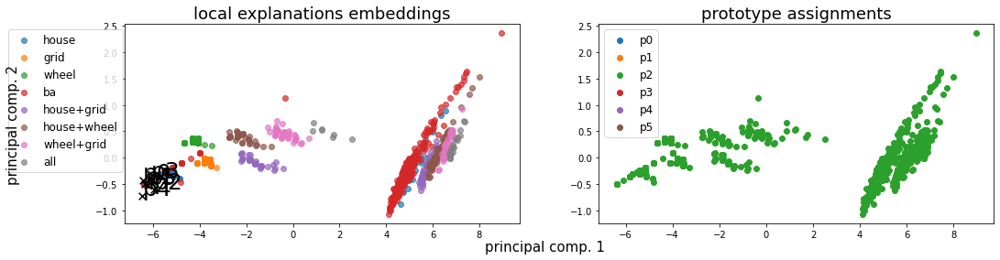

Alpha norms:
tensor([[0.9595, 1.0000, 0.9094, 0.7717, 0.9062, 0.8726],
        [0.8822, 0.8649, 0.8276, 1.0000, 0.9040, 0.7665]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.258763 +- 0.000000
Concept distribution:  (array([2], dtype=int64), array([970], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 4.65252, LEN: 0.088339, AccxC: 0.45, AccO: 0.00, V. Acc: 0.00, V. Loss: 3.52829, V. LEN 0.10
  2: Loss: 2.11766, LEN: 0.087913, AccxC: 0.46, AccO: 0.00, V. Acc: 0.00, V. Loss: 1.70944, V. LEN 0.10
  3: Loss: 0.99926, LEN: 0.087510, AccxC: 0.45, AccO: 0.00, V. Acc: 0.00, V. Loss: 1.23853, V. LEN 0.10
  4: Loss: 0.92641, LEN: 0.087165, AccxC: 0.52, AccO: 0.00, V. Acc: 0.00, V. Loss: 1.03228, V. LEN 0.10
  5: Loss: 0.76388, LEN: 0.086823, AccxC: 0.56, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.85776, V. LEN 0.10
  6: Loss: 0.67990, LEN: 0.086426, AccxC: 0.54, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.90710, V.

 77: Loss: 0.14015, LEN: 0.069844, AccxC: 0.61, AccO: 0.61, V. Acc: 0.56, V. Loss: 0.19904, V. LEN 0.08
 78: Loss: 0.13563, LEN: 0.069928, AccxC: 0.63, AccO: 0.63, V. Acc: 0.56, V. Loss: 0.18702, V. LEN 0.08
 79: Loss: 0.13736, LEN: 0.071291, AccxC: 0.60, AccO: 0.60, V. Acc: 0.56, V. Loss: 0.18953, V. LEN 0.08


 80: Loss: 0.13490, LEN: 0.070343, AccxC: 0.60, AccO: 0.60, V. Acc: 0.56, V. Loss: 0.22050, V. LEN 0.08
 81: Loss: 0.13271, LEN: 0.070273, AccxC: 0.59, AccO: 0.59, V. Acc: 0.56, V. Loss: 0.21443, V. LEN 0.08
 82: Loss: 0.13285, LEN: 0.069551, AccxC: 0.59, AccO: 0.59, V. Acc: 0.56, V. Loss: 0.18748, V. LEN 0.08
 83: Loss: 0.13121, LEN: 0.068925, AccxC: 0.62, AccO: 0.62, V. Acc: 0.57, V. Loss: 0.16845, V. LEN 0.08
 84: Loss: 0.12840, LEN: 0.069685, AccxC: 0.61, AccO: 0.61, V. Acc: 0.56, V. Loss: 0.18740, V. LEN 0.08
 85: Loss: 0.12532, LEN: 0.068016, AccxC: 0.63, AccO: 0.63, V. Acc: 0.56, V. Loss: 0.19015, V. LEN 0.08
 86: Loss: 0.13248, LEN: 0.069616, AccxC: 0.60, AccO: 0.60, V.

156: Loss: 0.09228, LEN: 0.064280, AccxC: 0.68, AccO: 0.68, V. Acc: 0.78, V. Loss: 0.10731, V. LEN 0.07
157: Loss: 0.09511, LEN: 0.066400, AccxC: 0.67, AccO: 0.67, V. Acc: 0.78, V. Loss: 0.10985, V. LEN 0.07
158: Loss: 0.08976, LEN: 0.062662, AccxC: 0.72, AccO: 0.72, V. Acc: 0.78, V. Loss: 0.11101, V. LEN 0.07
159: Loss: 0.09676, LEN: 0.065806, AccxC: 0.68, AccO: 0.68, V. Acc: 0.69, V. Loss: 0.11689, V. LEN 0.08


160: Loss: 0.09412, LEN: 0.066274, AccxC: 0.66, AccO: 0.66, V. Acc: 0.65, V. Loss: 0.11892, V. LEN 0.08
161: Loss: 0.09188, LEN: 0.066194, AccxC: 0.65, AccO: 0.65, V. Acc: 0.66, V. Loss: 0.11749, V. LEN 0.07
162: Loss: 0.09083, LEN: 0.064327, AccxC: 0.67, AccO: 0.67, V. Acc: 0.77, V. Loss: 0.11409, V. LEN 0.07
163: Loss: 0.09383, LEN: 0.065423, AccxC: 0.66, AccO: 0.66, V. Acc: 0.78, V. Loss: 0.11192, V. LEN 0.07
164: Loss: 0.09197, LEN: 0.064801, AccxC: 0.66, AccO: 0.66, V. Acc: 0.63, V. Loss: 0.12324, V. LEN 0.08
165: Loss: 0.09360, LEN: 0.065084, AccxC: 0.65, AccO: 0.65, V.

235: Loss: 0.07265, LEN: 0.056918, AccxC: 0.76, AccO: 0.74, V. Acc: 0.83, V. Loss: 0.07567, V. LEN 0.05
236: Loss: 0.06857, LEN: 0.053952, AccxC: 0.79, AccO: 0.76, V. Acc: 0.90, V. Loss: 0.06396, V. LEN 0.05
237: Loss: 0.07057, LEN: 0.052274, AccxC: 0.78, AccO: 0.76, V. Acc: 0.89, V. Loss: 0.06796, V. LEN 0.05
238: Loss: 0.06902, LEN: 0.053201, AccxC: 0.76, AccO: 0.75, V. Acc: 0.86, V. Loss: 0.07795, V. LEN 0.05
239: Loss: 0.07147, LEN: 0.054348, AccxC: 0.79, AccO: 0.78, V. Acc: 0.86, V. Loss: 0.07777, V. LEN 0.05


240: Loss: 0.06708, LEN: 0.050439, AccxC: 0.79, AccO: 0.77, V. Acc: 0.88, V. Loss: 0.07321, V. LEN 0.05
241: Loss: 0.06116, LEN: 0.046581, AccxC: 0.80, AccO: 0.78, V. Acc: 0.89, V. Loss: 0.06614, V. LEN 0.04
242: Loss: 0.06154, LEN: 0.047602, AccxC: 0.79, AccO: 0.78, V. Acc: 0.88, V. Loss: 0.06501, V. LEN 0.04
243: Loss: 0.06082, LEN: 0.047024, AccxC: 0.81, AccO: 0.78, V. Acc: 0.89, V. Loss: 0.06603, V. LEN 0.04
244: Loss: 0.06312, LEN: 0.044667, AccxC: 0.82, AccO: 0.80, V.

313: Loss: 0.03587, LEN: 0.026973, AccxC: 0.89, AccO: 0.89, V. Acc: 0.96, V. Loss: 0.03057, V. LEN 0.02
314: Loss: 0.03545, LEN: 0.027226, AccxC: 0.89, AccO: 0.89, V. Acc: 0.96, V. Loss: 0.03887, V. LEN 0.02
315: Loss: 0.03302, LEN: 0.024693, AccxC: 0.90, AccO: 0.90, V. Acc: 0.94, V. Loss: 0.03988, V. LEN 0.02
316: Loss: 0.03387, LEN: 0.025610, AccxC: 0.90, AccO: 0.90, V. Acc: 0.96, V. Loss: 0.02984, V. LEN 0.02
317: Loss: 0.03259, LEN: 0.024437, AccxC: 0.90, AccO: 0.90, V. Acc: 0.93, V. Loss: 0.04070, V. LEN 0.02
318: Loss: 0.03839, LEN: 0.028916, AccxC: 0.89, AccO: 0.88, V. Acc: 0.96, V. Loss: 0.03588, V. LEN 0.01
319: Loss: 0.03508, LEN: 0.024988, AccxC: 0.90, AccO: 0.89, V. Acc: 0.96, V. Loss: 0.02836, V. LEN 0.02


320: Loss: 0.03641, LEN: 0.028159, AccxC: 0.89, AccO: 0.89, V. Acc: 0.94, V. Loss: 0.03690, V. LEN 0.02
321: Loss: 0.03197, LEN: 0.024407, AccxC: 0.90, AccO: 0.90, V. Acc: 0.96, V. Loss: 0.03104, V. LEN 0.02
322: Loss: 0.03224, LEN: 0.023618, AccxC: 0.91, AccO: 0.90, V.

391: Loss: 0.02239, LEN: 0.017202, AccxC: 0.95, AccO: 0.90, V. Acc: 0.94, V. Loss: 0.01957, V. LEN 0.01
392: Loss: 0.02280, LEN: 0.018167, AccxC: 0.92, AccO: 0.86, V. Acc: 0.94, V. Loss: 0.01797, V. LEN 0.01
393: Loss: 0.02131, LEN: 0.016145, AccxC: 0.94, AccO: 0.89, V. Acc: 0.94, V. Loss: 0.01728, V. LEN 0.01
394: Loss: 0.02064, LEN: 0.015967, AccxC: 0.93, AccO: 0.88, V. Acc: 0.94, V. Loss: 0.01600, V. LEN 0.01
395: Loss: 0.02087, LEN: 0.015579, AccxC: 0.93, AccO: 0.88, V. Acc: 0.94, V. Loss: 0.01794, V. LEN 0.01
396: Loss: 0.02165, LEN: 0.015859, AccxC: 0.93, AccO: 0.87, V. Acc: 0.94, V. Loss: 0.01596, V. LEN 0.01
397: Loss: 0.02012, LEN: 0.015336, AccxC: 0.93, AccO: 0.88, V. Acc: 0.94, V. Loss: 0.01722, V. LEN 0.01
398: Loss: 0.01970, LEN: 0.015010, AccxC: 0.94, AccO: 0.91, V. Acc: 0.98, V. Loss: 0.01918, V. LEN 0.01
399: Loss: 0.01994, LEN: 0.015524, AccxC: 0.93, AccO: 0.93, V. Acc: 0.98, V. Loss: 0.01765, V. LEN 0.01


400: Loss: 0.02227, LEN: 0.017390, AccxC: 0.94, AccO: 0.94, V.

470: Loss: 0.01731, LEN: 0.013807, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.01496, V. LEN 0.01
471: Loss: 0.01753, LEN: 0.014054, AccxC: 0.95, AccO: 0.95, V. Acc: 0.98, V. Loss: 0.01368, V. LEN 0.01
472: Loss: 0.01733, LEN: 0.013738, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.01360, V. LEN 0.01
473: Loss: 0.01551, LEN: 0.012168, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.01678, V. LEN 0.01
474: Loss: 0.01811, LEN: 0.014966, AccxC: 0.95, AccO: 0.95, V. Acc: 0.98, V. Loss: 0.01681, V. LEN 0.01
475: Loss: 0.01907, LEN: 0.015463, AccxC: 0.95, AccO: 0.95, V. Acc: 0.98, V. Loss: 0.01417, V. LEN 0.01
476: Loss: 0.01696, LEN: 0.013184, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.01615, V. LEN 0.01
477: Loss: 0.01460, LEN: 0.011248, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.01537, V. LEN 0.01
478: Loss: 0.01555, LEN: 0.012249, AccxC: 0.95, AccO: 0.95, V. Acc: 0.98, V. Loss: 0.01567, V. LEN 0.01
479: Loss: 0.01536, LEN: 0.012404, AccxC: 0.96, AccO: 0.96, V. A

549: Loss: 0.01589, LEN: 0.013666, AccxC: 0.95, AccO: 0.95, V. Acc: 0.98, V. Loss: 0.01541, V. LEN 0.01
550: Loss: 0.01335, LEN: 0.011041, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.01389, V. LEN 0.01
551: Loss: 0.01243, LEN: 0.010124, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.01256, V. LEN 0.01
552: Loss: 0.01157, LEN: 0.009424, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01469, V. LEN 0.01
553: Loss: 0.01219, LEN: 0.010214, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.01253, V. LEN 0.01
554: Loss: 0.01525, LEN: 0.012961, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.01347, V. LEN 0.01
555: Loss: 0.01715, LEN: 0.014715, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.01320, V. LEN 0.01
556: Loss: 0.01244, LEN: 0.010243, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.01327, V. LEN 0.01
557: Loss: 0.01394, LEN: 0.011999, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.01295, V. LEN 0.01
558: Loss: 0.01423, LEN: 0.011962, AccxC: 0.97, AccO: 0.97, V. A

628: Loss: 0.01186, LEN: 0.010253, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.01179, V. LEN 0.01
629: Loss: 0.01410, LEN: 0.012600, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.01094, V. LEN 0.01
630: Loss: 0.01188, LEN: 0.010385, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.01147, V. LEN 0.01
631: Loss: 0.01168, LEN: 0.010018, AccxC: 0.97, AccO: 0.97, V. Acc: 0.97, V. Loss: 0.01453, V. LEN 0.01
632: Loss: 0.01135, LEN: 0.009699, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.01116, V. LEN 0.01
633: Loss: 0.01254, LEN: 0.010903, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.01111, V. LEN 0.01
634: Loss: 0.01156, LEN: 0.010057, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.01110, V. LEN 0.01
635: Loss: 0.01263, LEN: 0.011159, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.01177, V. LEN 0.01
636: Loss: 0.01251, LEN: 0.011144, AccxC: 0.97, AccO: 0.97, V. Acc: 0.97, V. Loss: 0.01385, V. LEN 0.01
637: Loss: 0.01214, LEN: 0.010643, AccxC: 0.96, AccO: 0.96, V. A

707: Loss: 0.01225, LEN: 0.011198, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.01097, V. LEN 0.01
708: Loss: 0.01292, LEN: 0.011947, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.00969, V. LEN 0.01
709: Loss: 0.01119, LEN: 0.010121, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.00972, V. LEN 0.01
710: Loss: 0.01058, LEN: 0.009425, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.00995, V. LEN 0.01
711: Loss: 0.01195, LEN: 0.010955, AccxC: 0.97, AccO: 0.97, V. Acc: 0.97, V. Loss: 0.01135, V. LEN 0.01
712: Loss: 0.01163, LEN: 0.010519, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.01042, V. LEN 0.01
713: Loss: 0.01003, LEN: 0.008964, AccxC: 0.97, AccO: 0.98, V. Acc: 0.97, V. Loss: 0.01248, V. LEN 0.01
714: Loss: 0.01301, LEN: 0.011943, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.01012, V. LEN 0.01
715: Loss: 0.01168, LEN: 0.010514, AccxC: 0.97, AccO: 0.97, V. Acc: 0.97, V. Loss: 0.01436, V. LEN 0.01
716: Loss: 0.01201, LEN: 0.010766, AccxC: 0.97, AccO: 0.97, V. A

786: Loss: 0.01515, LEN: 0.014167, AccxC: 0.96, AccO: 0.96, V. Acc: 0.97, V. Loss: 0.01106, V. LEN 0.01
787: Loss: 0.01544, LEN: 0.014746, AccxC: 0.96, AccO: 0.96, V. Acc: 0.97, V. Loss: 0.01083, V. LEN 0.01
788: Loss: 0.01404, LEN: 0.012985, AccxC: 0.96, AccO: 0.96, V. Acc: 0.97, V. Loss: 0.01102, V. LEN 0.01
789: Loss: 0.01408, LEN: 0.013064, AccxC: 0.96, AccO: 0.96, V. Acc: 0.97, V. Loss: 0.01236, V. LEN 0.01
790: Loss: 0.01122, LEN: 0.010189, AccxC: 0.97, AccO: 0.97, V. Acc: 0.97, V. Loss: 0.01085, V. LEN 0.01
791: Loss: 0.01068, LEN: 0.009780, AccxC: 0.97, AccO: 0.97, V. Acc: 0.97, V. Loss: 0.01177, V. LEN 0.01
792: Loss: 0.01039, LEN: 0.009663, AccxC: 0.97, AccO: 0.97, V. Acc: 0.97, V. Loss: 0.01112, V. LEN 0.01
793: Loss: 0.01009, LEN: 0.009248, AccxC: 0.97, AccO: 0.97, V. Acc: 0.97, V. Loss: 0.01111, V. LEN 0.01
794: Loss: 0.00987, LEN: 0.009114, AccxC: 0.97, AccO: 0.97, V. Acc: 0.97, V. Loss: 0.01128, V. LEN 0.01
795: Loss: 0.01009, LEN: 0.009335, AccxC: 0.97, AccO: 0.97, V. A

865: Loss: 0.00932, LEN: 0.008531, AccxC: 0.97, AccO: 0.98, V. Acc: 0.97, V. Loss: 0.01081, V. LEN 0.01
866: Loss: 0.01062, LEN: 0.010040, AccxC: 0.97, AccO: 0.97, V. Acc: 0.97, V. Loss: 0.01041, V. LEN 0.01
867: Loss: 0.01215, LEN: 0.011564, AccxC: 0.97, AccO: 0.97, V. Acc: 0.97, V. Loss: 0.01073, V. LEN 0.01
868: Loss: 0.01012, LEN: 0.008926, AccxC: 0.97, AccO: 0.97, V. Acc: 0.97, V. Loss: 0.01091, V. LEN 0.01
869: Loss: 0.01142, LEN: 0.010838, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.00903, V. LEN 0.01
870: Loss: 0.00922, LEN: 0.008640, AccxC: 0.97, AccO: 0.97, V. Acc: 0.97, V. Loss: 0.01096, V. LEN 0.01
871: Loss: 0.01079, LEN: 0.010212, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.00916, V. LEN 0.01
872: Loss: 0.01020, LEN: 0.009632, AccxC: 0.97, AccO: 0.97, V. Acc: 0.97, V. Loss: 0.01065, V. LEN 0.01
873: Loss: 0.01129, LEN: 0.010626, AccxC: 0.97, AccO: 0.97, V. Acc: 0.97, V. Loss: 0.01095, V. LEN 0.01
874: Loss: 0.01197, LEN: 0.011363, AccxC: 0.96, AccO: 0.96, V. A

944: Loss: 0.01276, LEN: 0.012138, AccxC: 0.95, AccO: 0.95, V. Acc: 0.97, V. Loss: 0.01102, V. LEN 0.01
945: Loss: 0.01204, LEN: 0.011515, AccxC: 0.96, AccO: 0.96, V. Acc: 0.97, V. Loss: 0.01124, V. LEN 0.01
946: Loss: 0.01509, LEN: 0.014571, AccxC: 0.95, AccO: 0.95, V. Acc: 0.97, V. Loss: 0.01120, V. LEN 0.01
947: Loss: 0.01405, LEN: 0.013546, AccxC: 0.95, AccO: 0.95, V. Acc: 0.97, V. Loss: 0.01133, V. LEN 0.01
948: Loss: 0.01368, LEN: 0.013221, AccxC: 0.95, AccO: 0.95, V. Acc: 0.97, V. Loss: 0.01104, V. LEN 0.01
949: Loss: 0.01408, LEN: 0.013600, AccxC: 0.95, AccO: 0.95, V. Acc: 0.97, V. Loss: 0.01124, V. LEN 0.01
950: Loss: 0.01203, LEN: 0.011548, AccxC: 0.96, AccO: 0.96, V. Acc: 0.97, V. Loss: 0.01067, V. LEN 0.01
951: Loss: 0.01242, LEN: 0.011900, AccxC: 0.95, AccO: 0.95, V. Acc: 0.97, V. Loss: 0.01078, V. LEN 0.01
952: Loss: 0.01124, LEN: 0.010630, AccxC: 0.96, AccO: 0.96, V. Acc: 0.97, V. Loss: 0.01144, V. LEN 0.01
953: Loss: 0.01239, LEN: 0.011738, AccxC: 0.95, AccO: 0.95, V. A

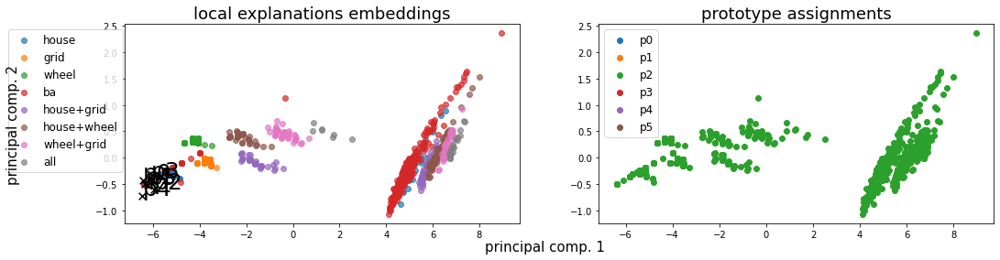

Alpha norms:
tensor([[0.9595, 1.0000, 0.9094, 0.7717, 0.9062, 0.8726],
        [0.8822, 0.8649, 0.8276, 1.0000, 0.9040, 0.7665]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.258763 +- 0.000000
Concept distribution:  (array([2], dtype=int64), array([970], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 34.79912, LEN: 0.088338, AccxC: 0.45, AccO: 0.00, V. Acc: 0.00, V. Loss: 21.73341, V. LEN 0.10
  2: Loss: 11.68686, LEN: 0.087918, AccxC: 0.45, AccO: 0.00, V. Acc: 0.00, V. Loss: 5.44734, V. LEN 0.10
  3: Loss: 3.08581, LEN: 0.087515, AccxC: 0.45, AccO: 0.00, V. Acc: 0.00, V. Loss: 2.48624, V. LEN 0.10
  4: Loss: 2.31456, LEN: 0.087143, AccxC: 0.50, AccO: 0.00, V. Acc: 0.00, V. Loss: 2.69321, V. LEN 0.10
  5: Loss: 2.18941, LEN: 0.086716, AccxC: 0.53, AccO: 0.00, V. Acc: 0.00, V. Loss: 2.62834, V. LEN 0.10
  6: Loss: 2.09673, LEN: 0.086339, AccxC: 0.51, AccO: 0.00, V. Acc: 0.00, V. Loss: 2.40306,

 76: Loss: 0.26036, LEN: 0.068795, AccxC: 0.64, AccO: 0.59, V. Acc: 0.69, V. Loss: 0.27597, V. LEN 0.07
 77: Loss: 0.25477, LEN: 0.068709, AccxC: 0.64, AccO: 0.61, V. Acc: 0.80, V. Loss: 0.31311, V. LEN 0.07
 78: Loss: 0.24579, LEN: 0.069239, AccxC: 0.65, AccO: 0.62, V. Acc: 0.77, V. Loss: 0.29641, V. LEN 0.07
 79: Loss: 0.25401, LEN: 0.070336, AccxC: 0.62, AccO: 0.58, V. Acc: 0.78, V. Loss: 0.29984, V. LEN 0.08


 80: Loss: 0.24128, LEN: 0.068307, AccxC: 0.64, AccO: 0.60, V. Acc: 0.66, V. Loss: 0.29698, V. LEN 0.08
 81: Loss: 0.22675, LEN: 0.068579, AccxC: 0.64, AccO: 0.60, V. Acc: 0.71, V. Loss: 0.27615, V. LEN 0.08
 82: Loss: 0.23866, LEN: 0.068200, AccxC: 0.64, AccO: 0.60, V. Acc: 0.45, V. Loss: 0.30507, V. LEN 0.08
 83: Loss: 0.22103, LEN: 0.069325, AccxC: 0.63, AccO: 0.50, V. Acc: 0.62, V. Loss: 0.26912, V. LEN 0.07
 84: Loss: 0.24240, LEN: 0.068775, AccxC: 0.64, AccO: 0.54, V. Acc: 0.61, V. Loss: 0.26857, V. LEN 0.07
 85: Loss: 0.23529, LEN: 0.069179, AccxC: 0.61, AccO: 0.52, V.

155: Loss: 0.13603, LEN: 0.068684, AccxC: 0.65, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.17517, V. LEN 0.07
156: Loss: 0.13625, LEN: 0.068582, AccxC: 0.65, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.17258, V. LEN 0.07
157: Loss: 0.13922, LEN: 0.070335, AccxC: 0.65, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.18240, V. LEN 0.08
158: Loss: 0.13863, LEN: 0.069688, AccxC: 0.64, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.17630, V. LEN 0.08
159: Loss: 0.13240, LEN: 0.069015, AccxC: 0.65, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.17530, V. LEN 0.07


160: Loss: 0.13452, LEN: 0.069709, AccxC: 0.64, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.17211, V. LEN 0.08
161: Loss: 0.13186, LEN: 0.067108, AccxC: 0.65, AccO: 0.65, V. Acc: 0.65, V. Loss: 0.17661, V. LEN 0.07
162: Loss: 0.13135, LEN: 0.068942, AccxC: 0.64, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.16759, V. LEN 0.08
163: Loss: 0.13143, LEN: 0.069058, AccxC: 0.64, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.17600, V. LEN 0.08
164: Loss: 0.12463, LEN: 0.067961, AccxC: 0.65, AccO: 0.65, V.

234: Loss: 0.09953, LEN: 0.069530, AccxC: 0.65, AccO: 0.65, V. Acc: 0.65, V. Loss: 0.12200, V. LEN 0.07
235: Loss: 0.10026, LEN: 0.068267, AccxC: 0.65, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.12154, V. LEN 0.07
236: Loss: 0.10123, LEN: 0.068682, AccxC: 0.65, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.12010, V. LEN 0.07
237: Loss: 0.09814, LEN: 0.068550, AccxC: 0.65, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.11885, V. LEN 0.07
238: Loss: 0.10007, LEN: 0.068566, AccxC: 0.65, AccO: 0.65, V. Acc: 0.65, V. Loss: 0.12428, V. LEN 0.07
239: Loss: 0.09670, LEN: 0.067709, AccxC: 0.65, AccO: 0.65, V. Acc: 0.65, V. Loss: 0.11986, V. LEN 0.07


240: Loss: 0.09556, LEN: 0.068222, AccxC: 0.65, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.12086, V. LEN 0.07
241: Loss: 0.09680, LEN: 0.067960, AccxC: 0.65, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.11738, V. LEN 0.07
242: Loss: 0.09855, LEN: 0.069847, AccxC: 0.65, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.12086, V. LEN 0.07
243: Loss: 0.09805, LEN: 0.068713, AccxC: 0.65, AccO: 0.64, V.

313: Loss: 0.08149, LEN: 0.063688, AccxC: 0.65, AccO: 0.62, V. Acc: 0.65, V. Loss: 0.09158, V. LEN 0.07
314: Loss: 0.07943, LEN: 0.062962, AccxC: 0.65, AccO: 0.60, V. Acc: 0.65, V. Loss: 0.10225, V. LEN 0.07
315: Loss: 0.08063, LEN: 0.063617, AccxC: 0.65, AccO: 0.62, V. Acc: 0.65, V. Loss: 0.09833, V. LEN 0.07
316: Loss: 0.07872, LEN: 0.062880, AccxC: 0.65, AccO: 0.61, V. Acc: 0.65, V. Loss: 0.09412, V. LEN 0.07
317: Loss: 0.07922, LEN: 0.062811, AccxC: 0.65, AccO: 0.60, V. Acc: 0.65, V. Loss: 0.09397, V. LEN 0.07
318: Loss: 0.07974, LEN: 0.063018, AccxC: 0.65, AccO: 0.62, V. Acc: 0.44, V. Loss: 0.09766, V. LEN 0.07
319: Loss: 0.07971, LEN: 0.062686, AccxC: 0.65, AccO: 0.55, V. Acc: 0.44, V. Loss: 0.09317, V. LEN 0.07

------------------------------------------------------------------------------------
Has double activations  tensor(242)
But only for wrong predictions



------------------------------------------------------------------------------------
Has double activations  tensor(

389: Loss: 0.05616, LEN: 0.042849, AccxC: 0.80, AccO: 0.70, V. Acc: 0.70, V. Loss: 0.05158, V. LEN 0.04
390: Loss: 0.05685, LEN: 0.044462, AccxC: 0.81, AccO: 0.76, V. Acc: 0.83, V. Loss: 0.06428, V. LEN 0.05
391: Loss: 0.05858, LEN: 0.045910, AccxC: 0.80, AccO: 0.80, V. Acc: 0.83, V. Loss: 0.05642, V. LEN 0.04
392: Loss: 0.05692, LEN: 0.045205, AccxC: 0.80, AccO: 0.80, V. Acc: 0.84, V. Loss: 0.05296, V. LEN 0.04
393: Loss: 0.05588, LEN: 0.045053, AccxC: 0.80, AccO: 0.80, V. Acc: 0.70, V. Loss: 0.05228, V. LEN 0.04
394: Loss: 0.05651, LEN: 0.044685, AccxC: 0.79, AccO: 0.64, V. Acc: 0.69, V. Loss: 0.05830, V. LEN 0.04
395: Loss: 0.05166, LEN: 0.039425, AccxC: 0.83, AccO: 0.79, V. Acc: 0.85, V. Loss: 0.05378, V. LEN 0.04
396: Loss: 0.05433, LEN: 0.042297, AccxC: 0.80, AccO: 0.77, V. Acc: 0.84, V. Loss: 0.05077, V. LEN 0.04
397: Loss: 0.05145, LEN: 0.041321, AccxC: 0.81, AccO: 0.81, V. Acc: 0.84, V. Loss: 0.05146, V. LEN 0.04
398: Loss: 0.05031, LEN: 0.039072, AccxC: 0.82, AccO: 0.82, V. A

468: Loss: 0.04756, LEN: 0.039412, AccxC: 0.85, AccO: 0.85, V. Acc: 0.86, V. Loss: 0.04646, V. LEN 0.03
469: Loss: 0.04387, LEN: 0.036155, AccxC: 0.85, AccO: 0.86, V. Acc: 0.86, V. Loss: 0.04777, V. LEN 0.03
470: Loss: 0.04536, LEN: 0.036566, AccxC: 0.83, AccO: 0.83, V. Acc: 0.86, V. Loss: 0.04418, V. LEN 0.03
471: Loss: 0.04465, LEN: 0.036504, AccxC: 0.83, AccO: 0.83, V. Acc: 0.85, V. Loss: 0.05002, V. LEN 0.04
472: Loss: 0.04255, LEN: 0.035224, AccxC: 0.85, AccO: 0.85, V. Acc: 0.86, V. Loss: 0.04553, V. LEN 0.03
473: Loss: 0.04535, LEN: 0.037432, AccxC: 0.84, AccO: 0.84, V. Acc: 0.86, V. Loss: 0.04895, V. LEN 0.03
474: Loss: 0.04435, LEN: 0.036764, AccxC: 0.85, AccO: 0.85, V. Acc: 0.86, V. Loss: 0.04399, V. LEN 0.03
475: Loss: 0.04416, LEN: 0.035787, AccxC: 0.84, AccO: 0.84, V. Acc: 0.86, V. Loss: 0.04620, V. LEN 0.03
476: Loss: 0.04444, LEN: 0.037152, AccxC: 0.84, AccO: 0.84, V. Acc: 0.86, V. Loss: 0.04229, V. LEN 0.03
477: Loss: 0.04926, LEN: 0.041044, AccxC: 0.86, AccO: 0.86, V. A

547: Loss: 0.03766, LEN: 0.031342, AccxC: 0.90, AccO: 0.90, V. Acc: 0.93, V. Loss: 0.04271, V. LEN 0.03
548: Loss: 0.03849, LEN: 0.032103, AccxC: 0.89, AccO: 0.89, V. Acc: 0.93, V. Loss: 0.04089, V. LEN 0.03
549: Loss: 0.04060, LEN: 0.033522, AccxC: 0.88, AccO: 0.88, V. Acc: 0.92, V. Loss: 0.04124, V. LEN 0.03
550: Loss: 0.03927, LEN: 0.032726, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.04480, V. LEN 0.03
551: Loss: 0.03552, LEN: 0.029271, AccxC: 0.89, AccO: 0.89, V. Acc: 0.93, V. Loss: 0.04143, V. LEN 0.03
552: Loss: 0.03895, LEN: 0.032663, AccxC: 0.90, AccO: 0.90, V. Acc: 0.93, V. Loss: 0.03983, V. LEN 0.03
553: Loss: 0.04024, LEN: 0.034719, AccxC: 0.88, AccO: 0.88, V. Acc: 0.93, V. Loss: 0.04287, V. LEN 0.03
554: Loss: 0.03625, LEN: 0.030526, AccxC: 0.90, AccO: 0.90, V. Acc: 0.93, V. Loss: 0.04370, V. LEN 0.03
555: Loss: 0.03709, LEN: 0.031084, AccxC: 0.89, AccO: 0.89, V. Acc: 0.93, V. Loss: 0.03977, V. LEN 0.03
556: Loss: 0.03658, LEN: 0.030537, AccxC: 0.90, AccO: 0.90, V. A

626: Loss: 0.03825, LEN: 0.033416, AccxC: 0.86, AccO: 0.87, V. Acc: 0.89, V. Loss: 0.04369, V. LEN 0.03
627: Loss: 0.03836, LEN: 0.034160, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.03934, V. LEN 0.03
628: Loss: 0.03749, LEN: 0.032657, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.04220, V. LEN 0.03
629: Loss: 0.03836, LEN: 0.033629, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.03884, V. LEN 0.03
630: Loss: 0.03753, LEN: 0.032839, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.04130, V. LEN 0.03
631: Loss: 0.03695, LEN: 0.032566, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.04113, V. LEN 0.03
632: Loss: 0.03782, LEN: 0.033573, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.03964, V. LEN 0.03
633: Loss: 0.03449, LEN: 0.029906, AccxC: 0.89, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.04357, V. LEN 0.03
634: Loss: 0.03496, LEN: 0.030902, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.03989, V. LEN 0.03
635: Loss: 0.04036, LEN: 0.035852, AccxC: 0.87, AccO: 0.87, V. A

705: Loss: 0.03481, LEN: 0.031380, AccxC: 0.87, AccO: 0.87, V. Acc: 0.89, V. Loss: 0.03897, V. LEN 0.03
706: Loss: 0.03829, LEN: 0.034822, AccxC: 0.87, AccO: 0.87, V. Acc: 0.89, V. Loss: 0.03642, V. LEN 0.03
707: Loss: 0.03376, LEN: 0.030431, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.03837, V. LEN 0.03
708: Loss: 0.03531, LEN: 0.031800, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.03642, V. LEN 0.03
709: Loss: 0.03284, LEN: 0.029418, AccxC: 0.87, AccO: 0.87, V. Acc: 0.89, V. Loss: 0.03855, V. LEN 0.03
710: Loss: 0.03348, LEN: 0.030275, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.03524, V. LEN 0.03
711: Loss: 0.03371, LEN: 0.030791, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.03759, V. LEN 0.03
712: Loss: 0.03052, LEN: 0.027453, AccxC: 0.89, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.03606, V. LEN 0.03
713: Loss: 0.03300, LEN: 0.030032, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.03604, V. LEN 0.03
714: Loss: 0.03243, LEN: 0.029259, AccxC: 0.88, AccO: 0.88, V. A

784: Loss: 0.03270, LEN: 0.030507, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.03534, V. LEN 0.03
785: Loss: 0.03735, LEN: 0.033888, AccxC: 0.87, AccO: 0.87, V. Acc: 0.86, V. Loss: 0.04371, V. LEN 0.04
786: Loss: 0.03767, LEN: 0.033939, AccxC: 0.86, AccO: 0.86, V. Acc: 0.87, V. Loss: 0.03975, V. LEN 0.04
787: Loss: 0.03546, LEN: 0.032869, AccxC: 0.87, AccO: 0.87, V. Acc: 0.89, V. Loss: 0.03523, V. LEN 0.03
788: Loss: 0.02993, LEN: 0.027416, AccxC: 0.89, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.03533, V. LEN 0.03
789: Loss: 0.03165, LEN: 0.029422, AccxC: 0.88, AccO: 0.88, V. Acc: 0.88, V. Loss: 0.03644, V. LEN 0.03
790: Loss: 0.03194, LEN: 0.029520, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.03637, V. LEN 0.03
791: Loss: 0.03094, LEN: 0.028768, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.03507, V. LEN 0.03
792: Loss: 0.03430, LEN: 0.031949, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.03498, V. LEN 0.03
793: Loss: 0.02979, LEN: 0.027437, AccxC: 0.89, AccO: 0.89, V. A

863: Loss: 0.03051, LEN: 0.028318, AccxC: 0.88, AccO: 0.88, V. Acc: 0.88, V. Loss: 0.03617, V. LEN 0.03
864: Loss: 0.03003, LEN: 0.028071, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.03416, V. LEN 0.03
865: Loss: 0.02851, LEN: 0.026805, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.03358, V. LEN 0.03
866: Loss: 0.02741, LEN: 0.025751, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.03324, V. LEN 0.03
867: Loss: 0.03162, LEN: 0.029937, AccxC: 0.89, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.03374, V. LEN 0.03
868: Loss: 0.03640, LEN: 0.034303, AccxC: 0.87, AccO: 0.87, V. Acc: 0.89, V. Loss: 0.03344, V. LEN 0.03
869: Loss: 0.03414, LEN: 0.031487, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.03628, V. LEN 0.03
870: Loss: 0.03121, LEN: 0.029037, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.03333, V. LEN 0.03
871: Loss: 0.03072, LEN: 0.028498, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.03606, V. LEN 0.03
872: Loss: 0.03487, LEN: 0.032441, AccxC: 0.87, AccO: 0.87, V. A

942: Loss: 0.03084, LEN: 0.028685, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.03343, V. LEN 0.03
943: Loss: 0.03593, LEN: 0.033832, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.03423, V. LEN 0.03
944: Loss: 0.03431, LEN: 0.031465, AccxC: 0.86, AccO: 0.86, V. Acc: 0.88, V. Loss: 0.03632, V. LEN 0.03
945: Loss: 0.03238, LEN: 0.030159, AccxC: 0.88, AccO: 0.88, V. Acc: 0.88, V. Loss: 0.03478, V. LEN 0.03
946: Loss: 0.02820, LEN: 0.026437, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.03354, V. LEN 0.03
947: Loss: 0.02984, LEN: 0.028301, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.03345, V. LEN 0.03
948: Loss: 0.02898, LEN: 0.027240, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.03429, V. LEN 0.03
949: Loss: 0.03058, LEN: 0.028839, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.03339, V. LEN 0.03
950: Loss: 0.02867, LEN: 0.026848, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.03380, V. LEN 0.03
951: Loss: 0.02939, LEN: 0.027522, AccxC: 0.89, AccO: 0.89, V. A

1021: Loss: 0.03178, LEN: 0.029768, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.03453, V. LEN 0.03
1022: Loss: 0.02996, LEN: 0.027766, AccxC: 0.88, AccO: 0.88, V. Acc: 0.88, V. Loss: 0.03720, V. LEN 0.03
1023: Loss: 0.03173, LEN: 0.029393, AccxC: 0.88, AccO: 0.88, V. Acc: 0.87, V. Loss: 0.03743, V. LEN 0.04
1024: Loss: 0.02998, LEN: 0.028034, AccxC: 0.88, AccO: 0.88, V. Acc: 0.88, V. Loss: 0.03666, V. LEN 0.03
1025: Loss: 0.03062, LEN: 0.028669, AccxC: 0.88, AccO: 0.88, V. Acc: 0.88, V. Loss: 0.03528, V. LEN 0.03
1026: Loss: 0.02962, LEN: 0.027907, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.03470, V. LEN 0.03
1027: Loss: 0.03156, LEN: 0.029648, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.03395, V. LEN 0.03
1028: Loss: 0.02947, LEN: 0.027521, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.03517, V. LEN 0.03
1029: Loss: 0.02938, LEN: 0.027286, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.03445, V. LEN 0.03
1030: Loss: 0.02897, LEN: 0.026953, AccxC: 0.88, AccO: 

1097: Loss: 0.02816, LEN: 0.025822, AccxC: 0.87, AccO: 0.87, V. Acc: 0.90, V. Loss: 0.02549, V. LEN 0.02
1098: Loss: 0.02490, LEN: 0.022463, AccxC: 0.87, AccO: 0.87, V. Acc: 0.91, V. Loss: 0.02176, V. LEN 0.02
1099: Loss: 0.02279, LEN: 0.020507, AccxC: 0.88, AccO: 0.82, V. Acc: 0.79, V. Loss: 0.02202, V. LEN 0.02


1100: Loss: 0.02439, LEN: 0.022013, AccxC: 0.88, AccO: 0.86, V. Acc: 0.91, V. Loss: 0.02177, V. LEN 0.02
1101: Loss: 0.02183, LEN: 0.019608, AccxC: 0.89, AccO: 0.79, V. Acc: 0.79, V. Loss: 0.02184, V. LEN 0.02
1102: Loss: 0.02259, LEN: 0.020627, AccxC: 0.89, AccO: 0.83, V. Acc: 0.91, V. Loss: 0.02230, V. LEN 0.02
1103: Loss: 0.02363, LEN: 0.021532, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.02156, V. LEN 0.02
1104: Loss: 0.02333, LEN: 0.021347, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.02284, V. LEN 0.02
1105: Loss: 0.02487, LEN: 0.022870, AccxC: 0.88, AccO: 0.88, V. Acc: 0.90, V. Loss: 0.02276, V. LEN 0.02
1106: Loss: 0.02356, LEN: 0.021684, AccxC: 0.88, AccO

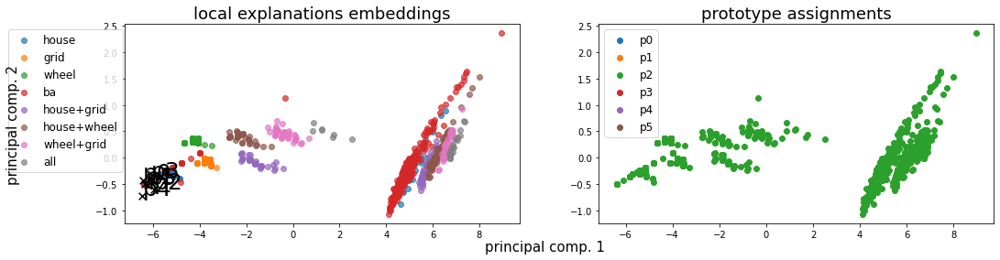

Alpha norms:
tensor([[0.9595, 1.0000, 0.9094, 0.7717, 0.9062, 0.8726],
        [0.8822, 0.8649, 0.8276, 1.0000, 0.9040, 0.7665]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.258763 +- 0.000000
Concept distribution:  (array([2], dtype=int64), array([970], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 75.69996, LEN: 0.088338, AccxC: 0.45, AccO: 0.00, V. Acc: 0.00, V. Loss: 46.32979, V. LEN 0.10
  2: Loss: 24.57998, LEN: 0.087918, AccxC: 0.46, AccO: 0.00, V. Acc: 0.00, V. Loss: 10.39055, V. LEN 0.10
  3: Loss: 5.64816, LEN: 0.087510, AccxC: 0.45, AccO: 0.00, V. Acc: 0.00, V. Loss: 3.77183, V. LEN 0.10
  4: Loss: 3.75291, LEN: 0.087138, AccxC: 0.51, AccO: 0.00, V. Acc: 0.00, V. Loss: 4.36666, V. LEN 0.10
  5: Loss: 3.67890, LEN: 0.086719, AccxC: 0.54, AccO: 0.00, V. Acc: 0.00, V. Loss: 4.12579, V. LEN 0.10
  6: Loss: 3.59877, LEN: 0.086346, AccxC: 0.49, AccO: 0.00, V. Acc: 0.00, V. Loss: 3.77754

 76: Loss: 0.40671, LEN: 0.068569, AccxC: 0.66, AccO: 0.57, V. Acc: 0.64, V. Loss: 0.41654, V. LEN 0.08
 77: Loss: 0.41139, LEN: 0.069640, AccxC: 0.65, AccO: 0.60, V. Acc: 0.63, V. Loss: 0.42637, V. LEN 0.08
 78: Loss: 0.38976, LEN: 0.069665, AccxC: 0.62, AccO: 0.53, V. Acc: 0.48, V. Loss: 0.37187, V. LEN 0.08
 79: Loss: 0.40852, LEN: 0.069986, AccxC: 0.62, AccO: 0.52, V. Acc: 0.56, V. Loss: 0.37446, V. LEN 0.07

------------------------------------------------------------------------------------
Has double activations  tensor(199)
But only for wrong predictions



------------------------------------------------------------------------------------
Has double activations  tensor(25)
But only for wrong predictions


 80: Loss: 0.37930, LEN: 0.067937, AccxC: 0.65, AccO: 0.56, V. Acc: 0.59, V. Loss: 0.39681, V. LEN 0.07
 81: Loss: 0.35135, LEN: 0.068695, AccxC: 0.64, AccO: 0.56, V. Acc: 0.55, V. Loss: 0.35587, V. LEN 0.07
 82: Loss: 0.37706, LEN: 0.069182, AccxC: 0.62, AccO: 0.55, V. Acc:

152: Loss: 0.18548, LEN: 0.070345, AccxC: 0.65, AccO: 0.65, V. Acc: 0.65, V. Loss: 0.24314, V. LEN 0.08
153: Loss: 0.17132, LEN: 0.068262, AccxC: 0.65, AccO: 0.65, V. Acc: 0.65, V. Loss: 0.21723, V. LEN 0.08
154: Loss: 0.17722, LEN: 0.068999, AccxC: 0.65, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.21834, V. LEN 0.08
155: Loss: 0.17631, LEN: 0.069682, AccxC: 0.65, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.22125, V. LEN 0.08
156: Loss: 0.17413, LEN: 0.069599, AccxC: 0.65, AccO: 0.65, V. Acc: 0.65, V. Loss: 0.23151, V. LEN 0.08
157: Loss: 0.17856, LEN: 0.069558, AccxC: 0.65, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.22380, V. LEN 0.08
158: Loss: 0.17345, LEN: 0.069637, AccxC: 0.65, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.20572, V. LEN 0.08
159: Loss: 0.18016, LEN: 0.069171, AccxC: 0.65, AccO: 0.65, V. Acc: 0.65, V. Loss: 0.21698, V. LEN 0.08


160: Loss: 0.17665, LEN: 0.070175, AccxC: 0.65, AccO: 0.65, V. Acc: 0.65, V. Loss: 0.23187, V. LEN 0.08
161: Loss: 0.16938, LEN: 0.068384, AccxC: 0.65, AccO: 0.65, V.

231: Loss: 0.12204, LEN: 0.069455, AccxC: 0.65, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.15840, V. LEN 0.08
232: Loss: 0.12581, LEN: 0.069482, AccxC: 0.65, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.14877, V. LEN 0.08
233: Loss: 0.12278, LEN: 0.069519, AccxC: 0.65, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.17358, V. LEN 0.08
234: Loss: 0.12443, LEN: 0.070906, AccxC: 0.65, AccO: 0.65, V. Acc: 0.65, V. Loss: 0.14886, V. LEN 0.08
235: Loss: 0.12056, LEN: 0.068453, AccxC: 0.65, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.15827, V. LEN 0.08
236: Loss: 0.12534, LEN: 0.069644, AccxC: 0.65, AccO: 0.65, V. Acc: 0.65, V. Loss: 0.15404, V. LEN 0.08
237: Loss: 0.11758, LEN: 0.068863, AccxC: 0.65, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.15260, V. LEN 0.08
238: Loss: 0.11950, LEN: 0.069592, AccxC: 0.65, AccO: 0.65, V. Acc: 0.65, V. Loss: 0.15098, V. LEN 0.08
239: Loss: 0.11979, LEN: 0.069757, AccxC: 0.65, AccO: 0.65, V. Acc: 0.65, V. Loss: 0.13563, V. LEN 0.08


240: Loss: 0.11802, LEN: 0.068802, AccxC: 0.65, AccO: 0.64, V.

310: Loss: 0.09441, LEN: 0.067901, AccxC: 0.65, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.11697, V. LEN 0.08
311: Loss: 0.09368, LEN: 0.066576, AccxC: 0.65, AccO: 0.65, V. Acc: 0.65, V. Loss: 0.11751, V. LEN 0.08
312: Loss: 0.09406, LEN: 0.068775, AccxC: 0.65, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.11854, V. LEN 0.08
313: Loss: 0.09628, LEN: 0.069074, AccxC: 0.65, AccO: 0.65, V. Acc: 0.65, V. Loss: 0.11563, V. LEN 0.08
314: Loss: 0.09512, LEN: 0.067003, AccxC: 0.65, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.11953, V. LEN 0.08
315: Loss: 0.09831, LEN: 0.070126, AccxC: 0.65, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.11571, V. LEN 0.08
316: Loss: 0.09598, LEN: 0.068349, AccxC: 0.65, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.11618, V. LEN 0.08
317: Loss: 0.09646, LEN: 0.068556, AccxC: 0.65, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.11420, V. LEN 0.08
318: Loss: 0.09550, LEN: 0.068912, AccxC: 0.65, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.11560, V. LEN 0.08
319: Loss: 0.09404, LEN: 0.068204, AccxC: 0.65, AccO: 0.65, V. A

389: Loss: 0.07712, LEN: 0.059710, AccxC: 0.73, AccO: 0.73, V. Acc: 0.56, V. Loss: 0.12119, V. LEN 0.07
390: Loss: 0.07866, LEN: 0.062077, AccxC: 0.69, AccO: 0.69, V. Acc: 0.80, V. Loss: 0.08797, V. LEN 0.06
391: Loss: 0.07513, LEN: 0.058693, AccxC: 0.74, AccO: 0.74, V. Acc: 0.75, V. Loss: 0.09375, V. LEN 0.05
392: Loss: 0.07307, LEN: 0.059283, AccxC: 0.71, AccO: 0.71, V. Acc: 0.75, V. Loss: 0.08578, V. LEN 0.05
393: Loss: 0.07210, LEN: 0.058330, AccxC: 0.72, AccO: 0.72, V. Acc: 0.70, V. Loss: 0.09337, V. LEN 0.06
394: Loss: 0.07521, LEN: 0.057736, AccxC: 0.69, AccO: 0.69, V. Acc: 0.81, V. Loss: 0.08087, V. LEN 0.05
395: Loss: 0.06989, LEN: 0.055183, AccxC: 0.75, AccO: 0.75, V. Acc: 0.82, V. Loss: 0.07911, V. LEN 0.05
396: Loss: 0.07172, LEN: 0.055785, AccxC: 0.73, AccO: 0.73, V. Acc: 0.68, V. Loss: 0.09186, V. LEN 0.06
397: Loss: 0.06962, LEN: 0.056211, AccxC: 0.72, AccO: 0.73, V. Acc: 0.82, V. Loss: 0.07452, V. LEN 0.05
398: Loss: 0.06777, LEN: 0.053596, AccxC: 0.75, AccO: 0.75, V. A

468: Loss: 0.05850, LEN: 0.046207, AccxC: 0.78, AccO: 0.78, V. Acc: 0.84, V. Loss: 0.06400, V. LEN 0.04
469: Loss: 0.05406, LEN: 0.042467, AccxC: 0.80, AccO: 0.80, V. Acc: 0.70, V. Loss: 0.04985, V. LEN 0.04
470: Loss: 0.05528, LEN: 0.043701, AccxC: 0.78, AccO: 0.70, V. Acc: 0.84, V. Loss: 0.04987, V. LEN 0.04
471: Loss: 0.05157, LEN: 0.040172, AccxC: 0.80, AccO: 0.80, V. Acc: 0.84, V. Loss: 0.04978, V. LEN 0.04
472: Loss: 0.05640, LEN: 0.045545, AccxC: 0.80, AccO: 0.80, V. Acc: 0.84, V. Loss: 0.05326, V. LEN 0.04
473: Loss: 0.05393, LEN: 0.042710, AccxC: 0.80, AccO: 0.68, V. Acc: 0.70, V. Loss: 0.04860, V. LEN 0.04
474: Loss: 0.05462, LEN: 0.043610, AccxC: 0.81, AccO: 0.70, V. Acc: 0.85, V. Loss: 0.05311, V. LEN 0.04
475: Loss: 0.05390, LEN: 0.042547, AccxC: 0.78, AccO: 0.76, V. Acc: 0.84, V. Loss: 0.04982, V. LEN 0.04
476: Loss: 0.05187, LEN: 0.041483, AccxC: 0.80, AccO: 0.80, V. Acc: 0.84, V. Loss: 0.05218, V. LEN 0.04
477: Loss: 0.05435, LEN: 0.043197, AccxC: 0.81, AccO: 0.81, V. A

547: Loss: 0.04292, LEN: 0.034966, AccxC: 0.88, AccO: 0.88, V. Acc: 0.93, V. Loss: 0.04183, V. LEN 0.03
548: Loss: 0.04220, LEN: 0.033985, AccxC: 0.87, AccO: 0.87, V. Acc: 0.93, V. Loss: 0.03815, V. LEN 0.03
549: Loss: 0.04536, LEN: 0.036918, AccxC: 0.87, AccO: 0.87, V. Acc: 0.93, V. Loss: 0.03967, V. LEN 0.03
550: Loss: 0.04375, LEN: 0.035459, AccxC: 0.87, AccO: 0.87, V. Acc: 0.93, V. Loss: 0.03974, V. LEN 0.03
551: Loss: 0.04418, LEN: 0.036067, AccxC: 0.86, AccO: 0.86, V. Acc: 0.93, V. Loss: 0.04057, V. LEN 0.03
552: Loss: 0.04177, LEN: 0.034009, AccxC: 0.88, AccO: 0.88, V. Acc: 0.93, V. Loss: 0.03879, V. LEN 0.03
553: Loss: 0.04495, LEN: 0.037367, AccxC: 0.86, AccO: 0.86, V. Acc: 0.93, V. Loss: 0.04099, V. LEN 0.03
554: Loss: 0.04263, LEN: 0.035052, AccxC: 0.88, AccO: 0.88, V. Acc: 0.92, V. Loss: 0.03942, V. LEN 0.03
555: Loss: 0.04367, LEN: 0.035722, AccxC: 0.86, AccO: 0.87, V. Acc: 0.93, V. Loss: 0.04042, V. LEN 0.03
556: Loss: 0.04349, LEN: 0.036004, AccxC: 0.88, AccO: 0.88, V. A

626: Loss: 0.04002, LEN: 0.034741, AccxC: 0.87, AccO: 0.87, V. Acc: 0.92, V. Loss: 0.03855, V. LEN 0.03
627: Loss: 0.04503, LEN: 0.039863, AccxC: 0.86, AccO: 0.86, V. Acc: 0.87, V. Loss: 0.04351, V. LEN 0.04
628: Loss: 0.04025, LEN: 0.034597, AccxC: 0.87, AccO: 0.87, V. Acc: 0.87, V. Loss: 0.04642, V. LEN 0.04
629: Loss: 0.04101, LEN: 0.034541, AccxC: 0.87, AccO: 0.87, V. Acc: 0.88, V. Loss: 0.04265, V. LEN 0.04
630: Loss: 0.04034, LEN: 0.034769, AccxC: 0.87, AccO: 0.87, V. Acc: 0.89, V. Loss: 0.04002, V. LEN 0.03
631: Loss: 0.03966, LEN: 0.034449, AccxC: 0.86, AccO: 0.86, V. Acc: 0.88, V. Loss: 0.04250, V. LEN 0.04
632: Loss: 0.04495, LEN: 0.038722, AccxC: 0.85, AccO: 0.86, V. Acc: 0.87, V. Loss: 0.04358, V. LEN 0.04
633: Loss: 0.04073, LEN: 0.034601, AccxC: 0.87, AccO: 0.87, V. Acc: 0.89, V. Loss: 0.04367, V. LEN 0.03
634: Loss: 0.03773, LEN: 0.031985, AccxC: 0.87, AccO: 0.87, V. Acc: 0.89, V. Loss: 0.03870, V. LEN 0.03
635: Loss: 0.03829, LEN: 0.032716, AccxC: 0.87, AccO: 0.87, V. A

705: Loss: 0.03700, LEN: 0.032503, AccxC: 0.87, AccO: 0.87, V. Acc: 0.88, V. Loss: 0.04037, V. LEN 0.03
706: Loss: 0.03809, LEN: 0.033954, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.03689, V. LEN 0.03
707: Loss: 0.03688, LEN: 0.032704, AccxC: 0.87, AccO: 0.87, V. Acc: 0.88, V. Loss: 0.04054, V. LEN 0.03
708: Loss: 0.03604, LEN: 0.031311, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.03681, V. LEN 0.03
709: Loss: 0.03449, LEN: 0.030314, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.03693, V. LEN 0.03
710: Loss: 0.03275, LEN: 0.028495, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.03625, V. LEN 0.03
711: Loss: 0.03311, LEN: 0.029220, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.03843, V. LEN 0.03
712: Loss: 0.03300, LEN: 0.029109, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.03692, V. LEN 0.03
713: Loss: 0.03546, LEN: 0.031899, AccxC: 0.88, AccO: 0.88, V. Acc: 0.88, V. Loss: 0.03703, V. LEN 0.03
714: Loss: 0.03476, LEN: 0.030992, AccxC: 0.88, AccO: 0.88, V. A

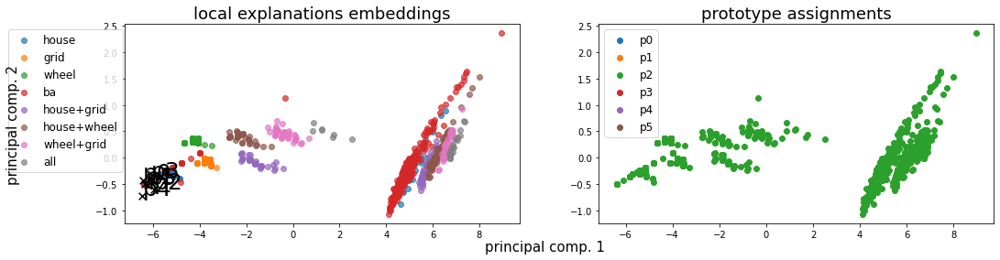

Alpha norms:
tensor([[0.9595, 1.0000, 0.9094, 0.7717, 0.9062, 0.8726],
        [0.8822, 0.8649, 0.8276, 1.0000, 0.9040, 0.7665]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.258763 +- 0.000000
Concept distribution:  (array([2], dtype=int64), array([970], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 2.65188, LEN: 0.088350, AccxC: 0.51, AccO: 0.00, V. Acc: 0.00, V. Loss: 2.72330, V. LEN 0.10
  2: Loss: 1.89447, LEN: 0.087959, AccxC: 0.56, AccO: 0.00, V. Acc: 0.00, V. Loss: 2.22344, V. LEN 0.10
  3: Loss: 1.46553, LEN: 0.087558, AccxC: 0.61, AccO: 0.00, V. Acc: 0.00, V. Loss: 1.54687, V. LEN 0.10
  4: Loss: 1.14536, LEN: 0.087172, AccxC: 0.55, AccO: 0.00, V. Acc: 0.00, V. Loss: 1.53236, V. LEN 0.10
  5: Loss: 1.03516, LEN: 0.086779, AccxC: 0.52, AccO: 0.00, V. Acc: 0.00, V. Loss: 1.55701, V. LEN 0.10
  6: Loss: 0.88070, LEN: 0.086414, AccxC: 0.53, AccO: 0.00, V. Acc: 0.00, V. Loss: 1.42826, V.

 75: Loss: 0.15454, LEN: 0.066145, AccxC: 0.66, AccO: 0.63, V. Acc: 0.69, V. Loss: 0.27046, V. LEN 0.07
 76: Loss: 0.13906, LEN: 0.065085, AccxC: 0.68, AccO: 0.66, V. Acc: 0.59, V. Loss: 0.27592, V. LEN 0.07
 77: Loss: 0.15795, LEN: 0.067574, AccxC: 0.63, AccO: 0.61, V. Acc: 0.58, V. Loss: 0.31455, V. LEN 0.08
 78: Loss: 0.15583, LEN: 0.068787, AccxC: 0.62, AccO: 0.60, V. Acc: 0.56, V. Loss: 0.29665, V. LEN 0.08
 79: Loss: 0.14247, LEN: 0.068197, AccxC: 0.63, AccO: 0.62, V. Acc: 0.69, V. Loss: 0.22770, V. LEN 0.07

------------------------------------------------------------------------------------
Has double activations  tensor(72)
But only for wrong predictions



 80: Loss: 0.13559, LEN: 0.064079, AccxC: 0.68, AccO: 0.67, V. Acc: 0.77, V. Loss: 0.24217, V. LEN 0.06
 81: Loss: 0.14370, LEN: 0.062286, AccxC: 0.69, AccO: 0.67, V. Acc: 0.67, V. Loss: 0.25490, V. LEN 0.07
 82: Loss: 0.14972, LEN: 0.063811, AccxC: 0.70, AccO: 0.62, V. Acc: 0.56, V. Loss: 0.27768, V. LEN 0.07
 83: Loss: 0.

148: Loss: 0.09413, LEN: 0.059217, AccxC: 0.71, AccO: 0.71, V. Acc: 0.71, V. Loss: 0.17588, V. LEN 0.06
149: Loss: 0.08851, LEN: 0.057042, AccxC: 0.71, AccO: 0.71, V. Acc: 0.74, V. Loss: 0.15431, V. LEN 0.06
150: Loss: 0.08802, LEN: 0.055559, AccxC: 0.74, AccO: 0.74, V. Acc: 0.68, V. Loss: 0.14305, V. LEN 0.06
151: Loss: 0.08803, LEN: 0.055499, AccxC: 0.75, AccO: 0.73, V. Acc: 0.75, V. Loss: 0.14160, V. LEN 0.06
152: Loss: 0.10329, LEN: 0.055193, AccxC: 0.74, AccO: 0.73, V. Acc: 0.73, V. Loss: 0.14752, V. LEN 0.06
153: Loss: 0.08492, LEN: 0.055342, AccxC: 0.74, AccO: 0.71, V. Acc: 0.72, V. Loss: 0.13757, V. LEN 0.06
154: Loss: 0.08513, LEN: 0.054928, AccxC: 0.79, AccO: 0.77, V. Acc: 0.76, V. Loss: 0.10894, V. LEN 0.05
155: Loss: 0.08813, LEN: 0.055798, AccxC: 0.76, AccO: 0.74, V. Acc: 0.69, V. Loss: 0.14495, V. LEN 0.06
156: Loss: 0.09010, LEN: 0.054994, AccxC: 0.73, AccO: 0.72, V. Acc: 0.70, V. Loss: 0.16864, V. LEN 0.06
157: Loss: 0.08746, LEN: 0.059118, AccxC: 0.69, AccO: 0.69, V. A

223: Loss: 0.06872, LEN: 0.054109, AccxC: 0.71, AccO: 0.68, V. Acc: 0.63, V. Loss: 0.10354, V. LEN 0.06
224: Loss: 0.07092, LEN: 0.054030, AccxC: 0.73, AccO: 0.56, V. Acc: 0.64, V. Loss: 0.09474, V. LEN 0.06
225: Loss: 0.06803, LEN: 0.052055, AccxC: 0.76, AccO: 0.69, V. Acc: 0.79, V. Loss: 0.09432, V. LEN 0.06
226: Loss: 0.06726, LEN: 0.051759, AccxC: 0.75, AccO: 0.75, V. Acc: 0.79, V. Loss: 0.09961, V. LEN 0.06
227: Loss: 0.06836, LEN: 0.051197, AccxC: 0.78, AccO: 0.77, V. Acc: 0.78, V. Loss: 0.10227, V. LEN 0.06
228: Loss: 0.07228, LEN: 0.054173, AccxC: 0.75, AccO: 0.75, V. Acc: 0.77, V. Loss: 0.09260, V. LEN 0.06
229: Loss: 0.06718, LEN: 0.053026, AccxC: 0.75, AccO: 0.75, V. Acc: 0.75, V. Loss: 0.09895, V. LEN 0.06
230: Loss: 0.06671, LEN: 0.053451, AccxC: 0.75, AccO: 0.75, V. Acc: 0.77, V. Loss: 0.10545, V. LEN 0.05
231: Loss: 0.06643, LEN: 0.049255, AccxC: 0.75, AccO: 0.75, V. Acc: 0.76, V. Loss: 0.11815, V. LEN 0.05
232: Loss: 0.06946, LEN: 0.052823, AccxC: 0.73, AccO: 0.73, V. A

302: Loss: 0.06384, LEN: 0.053548, AccxC: 0.77, AccO: 0.77, V. Acc: 0.82, V. Loss: 0.10081, V. LEN 0.06
303: Loss: 0.06544, LEN: 0.054549, AccxC: 0.77, AccO: 0.77, V. Acc: 0.83, V. Loss: 0.10073, V. LEN 0.05
304: Loss: 0.06384, LEN: 0.054666, AccxC: 0.78, AccO: 0.78, V. Acc: 0.85, V. Loss: 0.08507, V. LEN 0.05
305: Loss: 0.06584, LEN: 0.053555, AccxC: 0.76, AccO: 0.76, V. Acc: 0.86, V. Loss: 0.08334, V. LEN 0.05
306: Loss: 0.06212, LEN: 0.052664, AccxC: 0.77, AccO: 0.77, V. Acc: 0.86, V. Loss: 0.11121, V. LEN 0.05
307: Loss: 0.06993, LEN: 0.054135, AccxC: 0.77, AccO: 0.75, V. Acc: 0.85, V. Loss: 0.12210, V. LEN 0.05
308: Loss: 0.06950, LEN: 0.056144, AccxC: 0.78, AccO: 0.71, V. Acc: 0.84, V. Loss: 0.07631, V. LEN 0.05
309: Loss: 0.06597, LEN: 0.055675, AccxC: 0.77, AccO: 0.73, V. Acc: 0.85, V. Loss: 0.09118, V. LEN 0.05
310: Loss: 0.06049, LEN: 0.051229, AccxC: 0.80, AccO: 0.80, V. Acc: 0.90, V. Loss: 0.08505, V. LEN 0.04
311: Loss: 0.06096, LEN: 0.051328, AccxC: 0.79, AccO: 0.79, V. A

381: Loss: 0.06627, LEN: 0.057798, AccxC: 0.79, AccO: 0.79, V. Acc: 0.85, V. Loss: 0.07996, V. LEN 0.06
382: Loss: 0.06049, LEN: 0.054433, AccxC: 0.81, AccO: 0.81, V. Acc: 0.92, V. Loss: 0.06101, V. LEN 0.05
383: Loss: 0.06376, LEN: 0.054320, AccxC: 0.82, AccO: 0.82, V. Acc: 0.90, V. Loss: 0.05514, V. LEN 0.04
384: Loss: 0.05994, LEN: 0.052573, AccxC: 0.76, AccO: 0.76, V. Acc: 0.82, V. Loss: 0.07197, V. LEN 0.05
385: Loss: 0.05730, LEN: 0.052036, AccxC: 0.76, AccO: 0.76, V. Acc: 0.76, V. Loss: 0.08144, V. LEN 0.06
386: Loss: 0.06569, LEN: 0.059744, AccxC: 0.73, AccO: 0.73, V. Acc: 0.81, V. Loss: 0.06275, V. LEN 0.05
387: Loss: 0.05623, LEN: 0.050966, AccxC: 0.75, AccO: 0.64, V. Acc: 0.69, V. Loss: 0.06387, V. LEN 0.05
388: Loss: 0.05757, LEN: 0.050817, AccxC: 0.74, AccO: 0.54, V. Acc: 0.70, V. Loss: 0.06914, V. LEN 0.04
389: Loss: 0.05823, LEN: 0.052035, AccxC: 0.74, AccO: 0.61, V. Acc: 0.68, V. Loss: 0.07396, V. LEN 0.05
390: Loss: 0.05767, LEN: 0.052466, AccxC: 0.75, AccO: 0.52, V. A



460: Loss: 0.05282, LEN: 0.049641, AccxC: 0.80, AccO: 0.72, V. Acc: 0.83, V. Loss: 0.06104, V. LEN 0.04
461: Loss: 0.04883, LEN: 0.045008, AccxC: 0.81, AccO: 0.74, V. Acc: 0.88, V. Loss: 0.05479, V. LEN 0.04
462: Loss: 0.04789, LEN: 0.044459, AccxC: 0.84, AccO: 0.77, V. Acc: 0.88, V. Loss: 0.05871, V. LEN 0.04
463: Loss: 0.05535, LEN: 0.050580, AccxC: 0.81, AccO: 0.74, V. Acc: 0.88, V. Loss: 0.05272, V. LEN 0.04
464: Loss: 0.05460, LEN: 0.048574, AccxC: 0.78, AccO: 0.71, V. Acc: 0.82, V. Loss: 0.04852, V. LEN 0.04
465: Loss: 0.05504, LEN: 0.050171, AccxC: 0.80, AccO: 0.72, V. Acc: 0.92, V. Loss: 0.05502, V. LEN 0.04
466: Loss: 0.04785, LEN: 0.042404, AccxC: 0.83, AccO: 0.83, V. Acc: 0.90, V. Loss: 0.05706, V. LEN 0.04
467: Loss: 0.04606, LEN: 0.041788, AccxC: 0.85, AccO: 0.85, V. Acc: 0.90, V. Loss: 0.05525, V. LEN 0.04
468: Loss: 0.05282, LEN: 0.047588, AccxC: 0.83, AccO: 0.83, V. Acc: 0.92, V. Loss: 0.05066, V. LEN 0.03
469: Loss: 0.05170, LEN: 0.043594, AccxC: 0.83, AccO: 0.83, V.

539: Loss: 0.03482, LEN: 0.032443, AccxC: 0.89, AccO: 0.88, V. Acc: 0.94, V. Loss: 0.03864, V. LEN 0.02


540: Loss: 0.03415, LEN: 0.030879, AccxC: 0.88, AccO: 0.88, V. Acc: 0.93, V. Loss: 0.04168, V. LEN 0.02
541: Loss: 0.03513, LEN: 0.031920, AccxC: 0.86, AccO: 0.86, V. Acc: 0.89, V. Loss: 0.04711, V. LEN 0.03
542: Loss: 0.03598, LEN: 0.032441, AccxC: 0.87, AccO: 0.86, V. Acc: 0.94, V. Loss: 0.04523, V. LEN 0.02
543: Loss: 0.04293, LEN: 0.038971, AccxC: 0.89, AccO: 0.88, V. Acc: 0.95, V. Loss: 0.04837, V. LEN 0.02
544: Loss: 0.03463, LEN: 0.028740, AccxC: 0.92, AccO: 0.92, V. Acc: 0.90, V. Loss: 0.04315, V. LEN 0.03
545: Loss: 0.03838, LEN: 0.032708, AccxC: 0.88, AccO: 0.88, V. Acc: 0.96, V. Loss: 0.04265, V. LEN 0.02
546: Loss: 0.03469, LEN: 0.030946, AccxC: 0.90, AccO: 0.89, V. Acc: 0.96, V. Loss: 0.03209, V. LEN 0.02
547: Loss: 0.03489, LEN: 0.031073, AccxC: 0.89, AccO: 0.89, V. Acc: 0.95, V. Loss: 0.03273, V. LEN 0.02
548: Loss: 0.03296, LEN: 0.029299, AccxC: 0.90, AccO: 0.90, V.

618: Loss: 0.02548, LEN: 0.023557, AccxC: 0.92, AccO: 0.90, V. Acc: 0.97, V. Loss: 0.03364, V. LEN 0.01
619: Loss: 0.02232, LEN: 0.019651, AccxC: 0.91, AccO: 0.91, V. Acc: 0.98, V. Loss: 0.03396, V. LEN 0.01


620: Loss: 0.02841, LEN: 0.025970, AccxC: 0.91, AccO: 0.91, V. Acc: 0.96, V. Loss: 0.02923, V. LEN 0.01
621: Loss: 0.02750, LEN: 0.024982, AccxC: 0.89, AccO: 0.89, V. Acc: 0.98, V. Loss: 0.02145, V. LEN 0.01
622: Loss: 0.02396, LEN: 0.019833, AccxC: 0.93, AccO: 0.93, V. Acc: 0.98, V. Loss: 0.02156, V. LEN 0.01
623: Loss: 0.02476, LEN: 0.020980, AccxC: 0.93, AccO: 0.93, V. Acc: 0.93, V. Loss: 0.03873, V. LEN 0.02
624: Loss: 0.02803, LEN: 0.024240, AccxC: 0.91, AccO: 0.91, V. Acc: 0.97, V. Loss: 0.02749, V. LEN 0.01
625: Loss: 0.02571, LEN: 0.021313, AccxC: 0.92, AccO: 0.92, V. Acc: 0.94, V. Loss: 0.03359, V. LEN 0.02
626: Loss: 0.02572, LEN: 0.022772, AccxC: 0.90, AccO: 0.90, V. Acc: 0.97, V. Loss: 0.02606, V. LEN 0.01
627: Loss: 0.02757, LEN: 0.024161, AccxC: 0.92, AccO: 0.92, V.

697: Loss: 0.01888, LEN: 0.016163, AccxC: 0.93, AccO: 0.93, V. Acc: 0.90, V. Loss: 0.03198, V. LEN 0.02
698: Loss: 0.02133, LEN: 0.018605, AccxC: 0.92, AccO: 0.92, V. Acc: 0.87, V. Loss: 0.04010, V. LEN 0.03
699: Loss: 0.02305, LEN: 0.019017, AccxC: 0.90, AccO: 0.90, V. Acc: 0.94, V. Loss: 0.02388, V. LEN 0.01


700: Loss: 0.02406, LEN: 0.020215, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.01433, V. LEN 0.01
701: Loss: 0.01939, LEN: 0.016606, AccxC: 0.93, AccO: 0.87, V. Acc: 0.91, V. Loss: 0.01799, V. LEN 0.01
702: Loss: 0.02090, LEN: 0.018560, AccxC: 0.93, AccO: 0.87, V. Acc: 0.95, V. Loss: 0.02017, V. LEN 0.01
703: Loss: 0.02140, LEN: 0.019404, AccxC: 0.92, AccO: 0.92, V. Acc: 0.95, V. Loss: 0.01757, V. LEN 0.01
704: Loss: 0.02177, LEN: 0.018800, AccxC: 0.93, AccO: 0.93, V. Acc: 0.96, V. Loss: 0.02297, V. LEN 0.01
705: Loss: 0.02011, LEN: 0.016746, AccxC: 0.94, AccO: 0.94, V. Acc: 0.95, V. Loss: 0.02410, V. LEN 0.01
706: Loss: 0.02269, LEN: 0.019952, AccxC: 0.93, AccO: 0.93, V.

776: Loss: 0.02125, LEN: 0.019007, AccxC: 0.92, AccO: 0.88, V. Acc: 0.90, V. Loss: 0.01672, V. LEN 0.01
777: Loss: 0.01946, LEN: 0.017641, AccxC: 0.92, AccO: 0.87, V. Acc: 0.92, V. Loss: 0.02722, V. LEN 0.02
778: Loss: 0.02239, LEN: 0.020948, AccxC: 0.92, AccO: 0.92, V. Acc: 0.94, V. Loss: 0.01972, V. LEN 0.01
779: Loss: 0.01850, LEN: 0.016890, AccxC: 0.92, AccO: 0.92, V. Acc: 0.92, V. Loss: 0.02372, V. LEN 0.02


780: Loss: 0.02140, LEN: 0.019175, AccxC: 0.93, AccO: 0.93, V. Acc: 0.96, V. Loss: 0.01502, V. LEN 0.01
781: Loss: 0.02561, LEN: 0.023702, AccxC: 0.89, AccO: 0.89, V. Acc: 0.86, V. Loss: 0.02732, V. LEN 0.02
782: Loss: 0.02039, LEN: 0.018174, AccxC: 0.91, AccO: 0.91, V. Acc: 0.93, V. Loss: 0.02955, V. LEN 0.02
783: Loss: 0.02781, LEN: 0.025538, AccxC: 0.92, AccO: 0.92, V. Acc: 0.93, V. Loss: 0.02575, V. LEN 0.02
784: Loss: 0.02217, LEN: 0.020351, AccxC: 0.92, AccO: 0.92, V. Acc: 0.96, V. Loss: 0.01590, V. LEN 0.01
785: Loss: 0.02242, LEN: 0.020184, AccxC: 0.89, AccO: 0.89, V.

855: Loss: 0.02546, LEN: 0.022286, AccxC: 0.87, AccO: 0.85, V. Acc: 0.91, V. Loss: 0.02392, V. LEN 0.02
856: Loss: 0.02651, LEN: 0.023863, AccxC: 0.91, AccO: 0.88, V. Acc: 0.86, V. Loss: 0.01974, V. LEN 0.02
857: Loss: 0.02594, LEN: 0.024597, AccxC: 0.84, AccO: 0.81, V. Acc: 0.86, V. Loss: 0.02830, V. LEN 0.02
858: Loss: 0.03013, LEN: 0.028981, AccxC: 0.80, AccO: 0.78, V. Acc: 0.90, V. Loss: 0.02368, V. LEN 0.02
859: Loss: 0.02410, LEN: 0.022532, AccxC: 0.91, AccO: 0.89, V. Acc: 0.93, V. Loss: 0.01793, V. LEN 0.02


860: Loss: 0.02707, LEN: 0.025355, AccxC: 0.90, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.02722, V. LEN 0.02
861: Loss: 0.02440, LEN: 0.023005, AccxC: 0.90, AccO: 0.90, V. Acc: 0.94, V. Loss: 0.01738, V. LEN 0.01
862: Loss: 0.02373, LEN: 0.022141, AccxC: 0.87, AccO: 0.87, V. Acc: 0.91, V. Loss: 0.02834, V. LEN 0.02
863: Loss: 0.02565, LEN: 0.024213, AccxC: 0.89, AccO: 0.89, V. Acc: 0.86, V. Loss: 0.03424, V. LEN 0.03
864: Loss: 0.02474, LEN: 0.023301, AccxC: 0.88, AccO: 0.88, V.

934: Loss: 0.02101, LEN: 0.019703, AccxC: 0.89, AccO: 0.89, V. Acc: 0.88, V. Loss: 0.02664, V. LEN 0.02
935: Loss: 0.02526, LEN: 0.024303, AccxC: 0.88, AccO: 0.88, V. Acc: 0.88, V. Loss: 0.02794, V. LEN 0.03
936: Loss: 0.01822, LEN: 0.017465, AccxC: 0.91, AccO: 0.89, V. Acc: 0.74, V. Loss: 0.03105, V. LEN 0.03
937: Loss: 0.02173, LEN: 0.020277, AccxC: 0.88, AccO: 0.83, V. Acc: 0.74, V. Loss: 0.03270, V. LEN 0.03
938: Loss: 0.01925, LEN: 0.018090, AccxC: 0.92, AccO: 0.87, V. Acc: 0.74, V. Loss: 0.03197, V. LEN 0.03
939: Loss: 0.02342, LEN: 0.022430, AccxC: 0.90, AccO: 0.86, V. Acc: 0.83, V. Loss: 0.03277, V. LEN 0.03


940: Loss: 0.01928, LEN: 0.018507, AccxC: 0.91, AccO: 0.91, V. Acc: 0.95, V. Loss: 0.01873, V. LEN 0.02
941: Loss: 0.02064, LEN: 0.019848, AccxC: 0.94, AccO: 0.94, V. Acc: 0.86, V. Loss: 0.02820, V. LEN 0.03
942: Loss: 0.02008, LEN: 0.019179, AccxC: 0.92, AccO: 0.92, V. Acc: 0.82, V. Loss: 0.03567, V. LEN 0.03
943: Loss: 0.02672, LEN: 0.025435, AccxC: 0.85, AccO: 0.85, V.

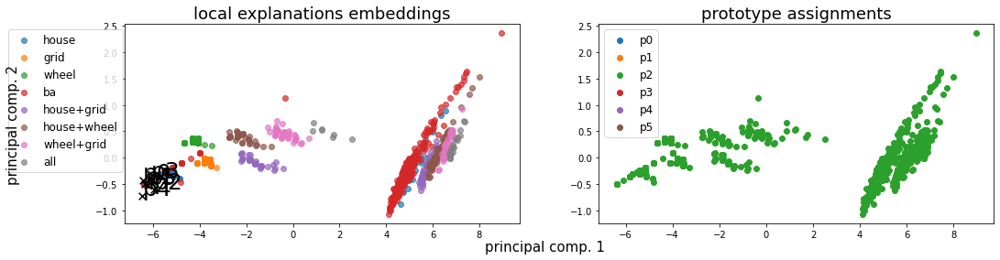

Alpha norms:
tensor([[0.9595, 1.0000, 0.9094, 0.7717, 0.9062, 0.8726],
        [0.8822, 0.8649, 0.8276, 1.0000, 0.9040, 0.7665]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.258763 +- 0.000000
Concept distribution:  (array([2], dtype=int64), array([970], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 2.64805, LEN: 0.088350, AccxC: 0.51, AccO: 0.00, V. Acc: 0.00, V. Loss: 2.72015, V. LEN 0.10
  2: Loss: 1.89198, LEN: 0.087959, AccxC: 0.56, AccO: 0.00, V. Acc: 0.00, V. Loss: 2.22178, V. LEN 0.10
  3: Loss: 1.46427, LEN: 0.087558, AccxC: 0.61, AccO: 0.00, V. Acc: 0.00, V. Loss: 1.54530, V. LEN 0.10
  4: Loss: 1.14385, LEN: 0.087172, AccxC: 0.55, AccO: 0.00, V. Acc: 0.00, V. Loss: 1.53026, V. LEN 0.10
  5: Loss: 1.03406, LEN: 0.086780, AccxC: 0.52, AccO: 0.00, V. Acc: 0.00, V. Loss: 1.55587, V. LEN 0.10
  6: Loss: 0.87954, LEN: 0.086414, AccxC: 0.53, AccO: 0.00, V. Acc: 0.00, V. Loss: 1.42503, V.

 74: Loss: 0.14330, LEN: 0.067098, AccxC: 0.70, AccO: 0.57, V. Acc: 0.68, V. Loss: 0.31144, V. LEN 0.07
 75: Loss: 0.15853, LEN: 0.065789, AccxC: 0.72, AccO: 0.60, V. Acc: 0.61, V. Loss: 0.30790, V. LEN 0.08
 76: Loss: 0.14724, LEN: 0.065937, AccxC: 0.71, AccO: 0.62, V. Acc: 0.59, V. Loss: 0.27925, V. LEN 0.07
 77: Loss: 0.15473, LEN: 0.065016, AccxC: 0.72, AccO: 0.63, V. Acc: 0.72, V. Loss: 0.23915, V. LEN 0.06
 78: Loss: 0.13742, LEN: 0.062667, AccxC: 0.78, AccO: 0.67, V. Acc: 0.71, V. Loss: 0.24263, V. LEN 0.06
 79: Loss: 0.13664, LEN: 0.067365, AccxC: 0.72, AccO: 0.62, V. Acc: 0.83, V. Loss: 0.24023, V. LEN 0.06

------------------------------------------------------------------------------------
Has double activations  tensor(50)
But only for wrong predictions



 80: Loss: 0.13731, LEN: 0.064670, AccxC: 0.74, AccO: 0.73, V. Acc: 0.83, V. Loss: 0.22973, V. LEN 0.06
 81: Loss: 0.15942, LEN: 0.062813, AccxC: 0.76, AccO: 0.74, V. Acc: 0.80, V. Loss: 0.24203, V. LEN 0.06
 82: Loss: 0.

149: Loss: 0.08856, LEN: 0.055555, AccxC: 0.74, AccO: 0.72, V. Acc: 0.82, V. Loss: 0.16708, V. LEN 0.06
150: Loss: 0.08702, LEN: 0.054561, AccxC: 0.74, AccO: 0.73, V. Acc: 0.81, V. Loss: 0.15565, V. LEN 0.06
151: Loss: 0.08385, LEN: 0.055109, AccxC: 0.76, AccO: 0.75, V. Acc: 0.84, V. Loss: 0.16013, V. LEN 0.05
152: Loss: 0.10768, LEN: 0.053261, AccxC: 0.75, AccO: 0.74, V. Acc: 0.76, V. Loss: 0.12880, V. LEN 0.06
153: Loss: 0.08317, LEN: 0.054012, AccxC: 0.75, AccO: 0.72, V. Acc: 0.70, V. Loss: 0.12952, V. LEN 0.06
154: Loss: 0.08644, LEN: 0.054617, AccxC: 0.77, AccO: 0.72, V. Acc: 0.76, V. Loss: 0.12565, V. LEN 0.05
155: Loss: 0.08450, LEN: 0.054139, AccxC: 0.78, AccO: 0.75, V. Acc: 0.89, V. Loss: 0.12913, V. LEN 0.05
156: Loss: 0.09394, LEN: 0.052882, AccxC: 0.77, AccO: 0.75, V. Acc: 0.79, V. Loss: 0.13088, V. LEN 0.05
157: Loss: 0.08448, LEN: 0.056682, AccxC: 0.75, AccO: 0.72, V. Acc: 0.70, V. Loss: 0.14638, V. LEN 0.06
158: Loss: 0.08829, LEN: 0.055130, AccxC: 0.76, AccO: 0.72, V. A

222: Loss: 0.07327, LEN: 0.055642, AccxC: 0.74, AccO: 0.72, V. Acc: 0.75, V. Loss: 0.11283, V. LEN 0.05
223: Loss: 0.06939, LEN: 0.051128, AccxC: 0.74, AccO: 0.71, V. Acc: 0.74, V. Loss: 0.10237, V. LEN 0.05
224: Loss: 0.07107, LEN: 0.052844, AccxC: 0.73, AccO: 0.67, V. Acc: 0.72, V. Loss: 0.11167, V. LEN 0.05
225: Loss: 0.06737, LEN: 0.051246, AccxC: 0.77, AccO: 0.61, V. Acc: 0.87, V. Loss: 0.09507, V. LEN 0.04
226: Loss: 0.06598, LEN: 0.050360, AccxC: 0.77, AccO: 0.75, V. Acc: 0.88, V. Loss: 0.08840, V. LEN 0.04
227: Loss: 0.06662, LEN: 0.048604, AccxC: 0.80, AccO: 0.78, V. Acc: 0.88, V. Loss: 0.09477, V. LEN 0.04
228: Loss: 0.07072, LEN: 0.051987, AccxC: 0.78, AccO: 0.74, V. Acc: 0.83, V. Loss: 0.08076, V. LEN 0.05
229: Loss: 0.06657, LEN: 0.051415, AccxC: 0.78, AccO: 0.74, V. Acc: 0.84, V. Loss: 0.08263, V. LEN 0.05
230: Loss: 0.06712, LEN: 0.052472, AccxC: 0.78, AccO: 0.75, V. Acc: 0.85, V. Loss: 0.10057, V. LEN 0.05
231: Loss: 0.06765, LEN: 0.051776, AccxC: 0.78, AccO: 0.74, V. A

301: Loss: 0.06152, LEN: 0.052194, AccxC: 0.78, AccO: 0.78, V. Acc: 0.89, V. Loss: 0.06359, V. LEN 0.05
302: Loss: 0.06349, LEN: 0.051114, AccxC: 0.80, AccO: 0.80, V. Acc: 0.89, V. Loss: 0.06486, V. LEN 0.05
303: Loss: 0.05948, LEN: 0.049511, AccxC: 0.81, AccO: 0.81, V. Acc: 0.92, V. Loss: 0.05987, V. LEN 0.04
304: Loss: 0.05843, LEN: 0.048247, AccxC: 0.83, AccO: 0.83, V. Acc: 0.91, V. Loss: 0.06815, V. LEN 0.04
305: Loss: 0.06202, LEN: 0.051479, AccxC: 0.82, AccO: 0.82, V. Acc: 0.89, V. Loss: 0.07548, V. LEN 0.04
306: Loss: 0.05890, LEN: 0.049709, AccxC: 0.81, AccO: 0.81, V. Acc: 0.91, V. Loss: 0.06378, V. LEN 0.04
307: Loss: 0.05961, LEN: 0.048116, AccxC: 0.82, AccO: 0.82, V. Acc: 0.92, V. Loss: 0.06158, V. LEN 0.04
308: Loss: 0.06299, LEN: 0.051140, AccxC: 0.81, AccO: 0.81, V. Acc: 0.90, V. Loss: 0.05573, V. LEN 0.04
309: Loss: 0.06091, LEN: 0.052173, AccxC: 0.79, AccO: 0.79, V. Acc: 0.88, V. Loss: 0.06909, V. LEN 0.05
310: Loss: 0.06224, LEN: 0.051916, AccxC: 0.80, AccO: 0.80, V. A



380: Loss: 0.04869, LEN: 0.043679, AccxC: 0.85, AccO: 0.85, V. Acc: 0.91, V. Loss: 0.04918, V. LEN 0.04
381: Loss: 0.05230, LEN: 0.046482, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.07016, V. LEN 0.05
382: Loss: 0.05838, LEN: 0.052811, AccxC: 0.78, AccO: 0.78, V. Acc: 0.77, V. Loss: 0.06619, V. LEN 0.05
383: Loss: 0.05887, LEN: 0.052261, AccxC: 0.77, AccO: 0.76, V. Acc: 0.64, V. Loss: 0.09134, V. LEN 0.07
384: Loss: 0.07026, LEN: 0.056159, AccxC: 0.71, AccO: 0.71, V. Acc: 0.67, V. Loss: 0.10410, V. LEN 0.06
385: Loss: 0.05189, LEN: 0.046270, AccxC: 0.78, AccO: 0.78, V. Acc: 0.81, V. Loss: 0.05951, V. LEN 0.04
386: Loss: 0.05735, LEN: 0.052057, AccxC: 0.76, AccO: 0.75, V. Acc: 0.89, V. Loss: 0.05132, V. LEN 0.04
387: Loss: 0.06323, LEN: 0.052789, AccxC: 0.78, AccO: 0.78, V. Acc: 0.90, V. Loss: 0.05480, V. LEN 0.04
388: Loss: 0.05864, LEN: 0.051906, AccxC: 0.83, AccO: 0.83, V. Acc: 0.89, V. Loss: 0.07348, V. LEN 0.05
389: Loss: 0.05557, LEN: 0.050791, AccxC: 0.79, AccO: 0.79, V.

459: Loss: 0.04513, LEN: 0.041335, AccxC: 0.84, AccO: 0.84, V. Acc: 0.93, V. Loss: 0.04304, V. LEN 0.03


460: Loss: 0.04478, LEN: 0.041412, AccxC: 0.82, AccO: 0.82, V. Acc: 0.96, V. Loss: 0.03576, V. LEN 0.03
461: Loss: 0.04584, LEN: 0.041172, AccxC: 0.85, AccO: 0.85, V. Acc: 0.95, V. Loss: 0.04166, V. LEN 0.03
462: Loss: 0.04246, LEN: 0.038401, AccxC: 0.87, AccO: 0.87, V. Acc: 0.96, V. Loss: 0.04941, V. LEN 0.03
463: Loss: 0.04390, LEN: 0.039342, AccxC: 0.87, AccO: 0.86, V. Acc: 0.95, V. Loss: 0.03601, V. LEN 0.03
464: Loss: 0.04612, LEN: 0.040536, AccxC: 0.85, AccO: 0.83, V. Acc: 0.95, V. Loss: 0.03450, V. LEN 0.02
465: Loss: 0.04561, LEN: 0.040847, AccxC: 0.85, AccO: 0.84, V. Acc: 0.92, V. Loss: 0.05227, V. LEN 0.03
466: Loss: 0.04483, LEN: 0.040145, AccxC: 0.84, AccO: 0.84, V. Acc: 0.92, V. Loss: 0.04786, V. LEN 0.04
467: Loss: 0.04437, LEN: 0.039191, AccxC: 0.85, AccO: 0.85, V. Acc: 0.88, V. Loss: 0.04474, V. LEN 0.03
468: Loss: 0.04512, LEN: 0.038985, AccxC: 0.85, AccO: 0.84, V.

538: Loss: 0.03601, LEN: 0.033300, AccxC: 0.90, AccO: 0.90, V. Acc: 0.93, V. Loss: 0.03615, V. LEN 0.03
539: Loss: 0.03347, LEN: 0.030801, AccxC: 0.90, AccO: 0.89, V. Acc: 0.95, V. Loss: 0.02929, V. LEN 0.02


540: Loss: 0.03523, LEN: 0.031629, AccxC: 0.89, AccO: 0.89, V. Acc: 0.95, V. Loss: 0.03916, V. LEN 0.02
541: Loss: 0.03410, LEN: 0.030403, AccxC: 0.88, AccO: 0.88, V. Acc: 0.94, V. Loss: 0.03544, V. LEN 0.02
542: Loss: 0.03568, LEN: 0.031379, AccxC: 0.86, AccO: 0.86, V. Acc: 0.96, V. Loss: 0.02718, V. LEN 0.02
543: Loss: 0.03575, LEN: 0.032363, AccxC: 0.89, AccO: 0.89, V. Acc: 0.96, V. Loss: 0.03682, V. LEN 0.02
544: Loss: 0.03011, LEN: 0.026650, AccxC: 0.91, AccO: 0.91, V. Acc: 0.96, V. Loss: 0.03477, V. LEN 0.02
545: Loss: 0.02993, LEN: 0.026017, AccxC: 0.92, AccO: 0.92, V. Acc: 0.95, V. Loss: 0.04022, V. LEN 0.02
546: Loss: 0.03146, LEN: 0.027921, AccxC: 0.90, AccO: 0.90, V. Acc: 0.95, V. Loss: 0.02961, V. LEN 0.02
547: Loss: 0.03312, LEN: 0.029582, AccxC: 0.91, AccO: 0.90, V.

616: Loss: 0.02332, LEN: 0.020876, AccxC: 0.93, AccO: 0.93, V. Acc: 0.97, V. Loss: 0.02699, V. LEN 0.01
617: Loss: 0.02456, LEN: 0.021300, AccxC: 0.92, AccO: 0.92, V. Acc: 0.94, V. Loss: 0.03662, V. LEN 0.02
618: Loss: 0.02465, LEN: 0.022054, AccxC: 0.93, AccO: 0.93, V. Acc: 0.97, V. Loss: 0.02764, V. LEN 0.01
619: Loss: 0.02079, LEN: 0.018062, AccxC: 0.92, AccO: 0.92, V. Acc: 0.94, V. Loss: 0.02360, V. LEN 0.02


620: Loss: 0.02585, LEN: 0.023023, AccxC: 0.93, AccO: 0.93, V. Acc: 0.94, V. Loss: 0.04044, V. LEN 0.02
621: Loss: 0.02698, LEN: 0.023320, AccxC: 0.93, AccO: 0.93, V. Acc: 0.94, V. Loss: 0.03517, V. LEN 0.02
622: Loss: 0.02589, LEN: 0.020784, AccxC: 0.91, AccO: 0.90, V. Acc: 0.98, V. Loss: 0.02201, V. LEN 0.01
623: Loss: 0.02337, LEN: 0.020298, AccxC: 0.92, AccO: 0.92, V. Acc: 0.94, V. Loss: 0.02815, V. LEN 0.02
624: Loss: 0.02295, LEN: 0.019775, AccxC: 0.92, AccO: 0.92, V. Acc: 0.98, V. Loss: 0.02138, V. LEN 0.01
625: Loss: 0.02454, LEN: 0.020706, AccxC: 0.92, AccO: 0.92, V.

695: Loss: 0.01970, LEN: 0.016798, AccxC: 0.94, AccO: 0.94, V. Acc: 0.93, V. Loss: 0.03094, V. LEN 0.02
696: Loss: 0.01849, LEN: 0.016551, AccxC: 0.95, AccO: 0.95, V. Acc: 0.98, V. Loss: 0.01532, V. LEN 0.01
697: Loss: 0.01809, LEN: 0.016048, AccxC: 0.95, AccO: 0.95, V. Acc: 0.96, V. Loss: 0.01931, V. LEN 0.01
698: Loss: 0.01780, LEN: 0.015600, AccxC: 0.95, AccO: 0.95, V. Acc: 0.96, V. Loss: 0.01946, V. LEN 0.01
699: Loss: 0.02204, LEN: 0.019049, AccxC: 0.95, AccO: 0.95, V. Acc: 0.97, V. Loss: 0.01600, V. LEN 0.01


700: Loss: 0.02129, LEN: 0.018225, AccxC: 0.93, AccO: 0.93, V. Acc: 0.97, V. Loss: 0.01640, V. LEN 0.01
701: Loss: 0.02602, LEN: 0.022841, AccxC: 0.95, AccO: 0.95, V. Acc: 0.96, V. Loss: 0.01941, V. LEN 0.01
702: Loss: 0.02369, LEN: 0.021202, AccxC: 0.92, AccO: 0.92, V. Acc: 0.95, V. Loss: 0.01951, V. LEN 0.01
703: Loss: 0.01904, LEN: 0.016207, AccxC: 0.95, AccO: 0.95, V. Acc: 0.98, V. Loss: 0.01235, V. LEN 0.01
704: Loss: 0.01889, LEN: 0.016587, AccxC: 0.94, AccO: 0.94, V.

774: Loss: 0.01944, LEN: 0.017737, AccxC: 0.93, AccO: 0.93, V. Acc: 0.97, V. Loss: 0.02024, V. LEN 0.01
775: Loss: 0.01873, LEN: 0.016215, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.01634, V. LEN 0.01
776: Loss: 0.01706, LEN: 0.015190, AccxC: 0.95, AccO: 0.95, V. Acc: 0.95, V. Loss: 0.01860, V. LEN 0.01
777: Loss: 0.01591, LEN: 0.013695, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.01167, V. LEN 0.01
778: Loss: 0.01779, LEN: 0.015221, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.01227, V. LEN 0.01
779: Loss: 0.01477, LEN: 0.012617, AccxC: 0.97, AccO: 0.97, V. Acc: 0.92, V. Loss: 0.03031, V. LEN 0.02


780: Loss: 0.01562, LEN: 0.013663, AccxC: 0.95, AccO: 0.95, V. Acc: 0.96, V. Loss: 0.01744, V. LEN 0.01
781: Loss: 0.01633, LEN: 0.014395, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.01193, V. LEN 0.01
782: Loss: 0.01736, LEN: 0.015008, AccxC: 0.95, AccO: 0.95, V. Acc: 0.98, V. Loss: 0.01484, V. LEN 0.01
783: Loss: 0.02195, LEN: 0.018548, AccxC: 0.97, AccO: 0.97, V.

853: Loss: 0.01408, LEN: 0.012537, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.01156, V. LEN 0.01
854: Loss: 0.01321, LEN: 0.011539, AccxC: 0.96, AccO: 0.96, V. Acc: 0.94, V. Loss: 0.02118, V. LEN 0.02
855: Loss: 0.01428, LEN: 0.013142, AccxC: 0.95, AccO: 0.95, V. Acc: 0.98, V. Loss: 0.01346, V. LEN 0.01
856: Loss: 0.01538, LEN: 0.013819, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.01322, V. LEN 0.01
857: Loss: 0.01396, LEN: 0.012486, AccxC: 0.96, AccO: 0.96, V. Acc: 0.96, V. Loss: 0.01835, V. LEN 0.01
858: Loss: 0.01513, LEN: 0.013811, AccxC: 0.96, AccO: 0.96, V. Acc: 0.96, V. Loss: 0.01623, V. LEN 0.01
859: Loss: 0.01754, LEN: 0.015663, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.01210, V. LEN 0.01


860: Loss: 0.01375, LEN: 0.011882, AccxC: 0.96, AccO: 0.96, V. Acc: 0.86, V. Loss: 0.04383, V. LEN 0.03
861: Loss: 0.01629, LEN: 0.014759, AccxC: 0.94, AccO: 0.94, V. Acc: 0.98, V. Loss: 0.01237, V. LEN 0.01
862: Loss: 0.01455, LEN: 0.013061, AccxC: 0.96, AccO: 0.96, V.

932: Loss: 0.01676, LEN: 0.015170, AccxC: 0.95, AccO: 0.95, V. Acc: 0.97, V. Loss: 0.01467, V. LEN 0.01
933: Loss: 0.01527, LEN: 0.013901, AccxC: 0.95, AccO: 0.95, V. Acc: 0.97, V. Loss: 0.01331, V. LEN 0.01
934: Loss: 0.01633, LEN: 0.014873, AccxC: 0.94, AccO: 0.94, V. Acc: 0.97, V. Loss: 0.01426, V. LEN 0.01
935: Loss: 0.02072, LEN: 0.019521, AccxC: 0.94, AccO: 0.94, V. Acc: 0.95, V. Loss: 0.02026, V. LEN 0.01
936: Loss: 0.01646, LEN: 0.015288, AccxC: 0.94, AccO: 0.94, V. Acc: 0.96, V. Loss: 0.01645, V. LEN 0.01
937: Loss: 0.01446, LEN: 0.013468, AccxC: 0.95, AccO: 0.95, V. Acc: 0.98, V. Loss: 0.01153, V. LEN 0.01
938: Loss: 0.02041, LEN: 0.019019, AccxC: 0.94, AccO: 0.94, V. Acc: 0.96, V. Loss: 0.01412, V. LEN 0.01
939: Loss: 0.01665, LEN: 0.015615, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.01265, V. LEN 0.01


940: Loss: 0.01619, LEN: 0.014962, AccxC: 0.95, AccO: 0.95, V. Acc: 0.96, V. Loss: 0.01529, V. LEN 0.01
941: Loss: 0.01758, LEN: 0.016575, AccxC: 0.95, AccO: 0.95, V.

1011: Loss: 0.01908, LEN: 0.018124, AccxC: 0.92, AccO: 0.92, V. Acc: 0.93, V. Loss: 0.02391, V. LEN 0.02
1012: Loss: 0.01873, LEN: 0.017947, AccxC: 0.91, AccO: 0.91, V. Acc: 0.93, V. Loss: 0.02218, V. LEN 0.02
1013: Loss: 0.01999, LEN: 0.019137, AccxC: 0.91, AccO: 0.85, V. Acc: 0.90, V. Loss: 0.01428, V. LEN 0.01
1014: Loss: 0.01709, LEN: 0.016497, AccxC: 0.92, AccO: 0.88, V. Acc: 0.93, V. Loss: 0.02202, V. LEN 0.02
1015: Loss: 0.01842, LEN: 0.017613, AccxC: 0.91, AccO: 0.91, V. Acc: 0.96, V. Loss: 0.01404, V. LEN 0.01
1016: Loss: 0.02283, LEN: 0.021909, AccxC: 0.92, AccO: 0.92, V. Acc: 0.96, V. Loss: 0.01397, V. LEN 0.01
1017: Loss: 0.01733, LEN: 0.015997, AccxC: 0.92, AccO: 0.92, V. Acc: 0.90, V. Loss: 0.02437, V. LEN 0.02
1018: Loss: 0.01944, LEN: 0.018781, AccxC: 0.91, AccO: 0.90, V. Acc: 0.96, V. Loss: 0.01477, V. LEN 0.01
1019: Loss: 0.01941, LEN: 0.018697, AccxC: 0.91, AccO: 0.91, V. Acc: 0.96, V. Loss: 0.01458, V. LEN 0.01


1020: Loss: 0.01745, LEN: 0.016571, AccxC: 0.91, AccO

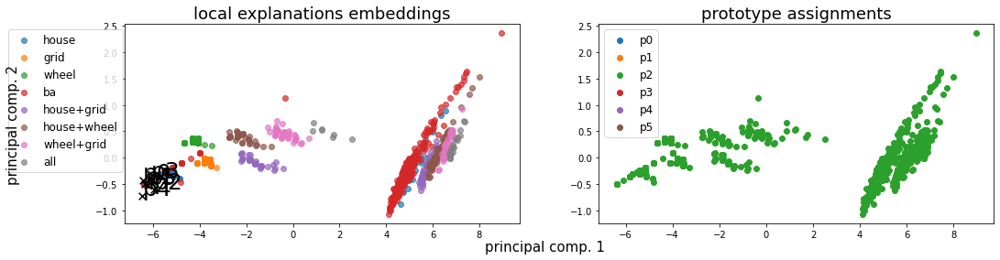

Alpha norms:
tensor([[0.9595, 1.0000, 0.9094, 0.7717, 0.9062, 0.8726],
        [0.8822, 0.8649, 0.8276, 1.0000, 0.9040, 0.7665]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.258763 +- 0.000000
Concept distribution:  (array([2], dtype=int64), array([970], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 6.09571, LEN: 0.088338, AccxC: 0.46, AccO: 0.00, V. Acc: 0.00, V. Loss: 5.14899, V. LEN 0.10
  2: Loss: 3.18296, LEN: 0.087922, AccxC: 0.49, AccO: 0.00, V. Acc: 0.00, V. Loss: 2.82485, V. LEN 0.10
  3: Loss: 1.67730, LEN: 0.087560, AccxC: 0.47, AccO: 0.00, V. Acc: 0.00, V. Loss: 2.22196, V. LEN 0.10
  4: Loss: 1.62938, LEN: 0.087197, AccxC: 0.54, AccO: 0.00, V. Acc: 0.00, V. Loss: 1.98849, V. LEN 0.10
  5: Loss: 1.31676, LEN: 0.086803, AccxC: 0.55, AccO: 0.00, V. Acc: 0.00, V. Loss: 1.66928, V. LEN 0.10
  6: Loss: 1.24013, LEN: 0.086374, AccxC: 0.55, AccO: 0.00, V. Acc: 0.00, V. Loss: 1.48954, V.

 77: Loss: 0.20330, LEN: 0.071234, AccxC: 0.58, AccO: 0.54, V. Acc: 0.56, V. Loss: 0.30212, V. LEN 0.08
 78: Loss: 0.17804, LEN: 0.071719, AccxC: 0.59, AccO: 0.56, V. Acc: 0.56, V. Loss: 0.31203, V. LEN 0.08
 79: Loss: 0.20438, LEN: 0.072527, AccxC: 0.57, AccO: 0.56, V. Acc: 0.56, V. Loss: 0.27089, V. LEN 0.08


 80: Loss: 0.18813, LEN: 0.072142, AccxC: 0.57, AccO: 0.52, V. Acc: 0.56, V. Loss: 0.34204, V. LEN 0.08
 81: Loss: 0.19543, LEN: 0.071305, AccxC: 0.63, AccO: 0.52, V. Acc: 0.56, V. Loss: 0.31484, V. LEN 0.08
 82: Loss: 0.19190, LEN: 0.071054, AccxC: 0.64, AccO: 0.52, V. Acc: 0.57, V. Loss: 0.24930, V. LEN 0.08
 83: Loss: 0.18552, LEN: 0.070978, AccxC: 0.65, AccO: 0.57, V. Acc: 0.56, V. Loss: 0.27957, V. LEN 0.08
 84: Loss: 0.18324, LEN: 0.070242, AccxC: 0.63, AccO: 0.54, V. Acc: 0.56, V. Loss: 0.30473, V. LEN 0.08
 85: Loss: 0.17165, LEN: 0.070422, AccxC: 0.62, AccO: 0.52, V. Acc: 0.56, V. Loss: 0.26978, V. LEN 0.08
 86: Loss: 0.18024, LEN: 0.070687, AccxC: 0.64, AccO: 0.55, V.

150: Loss: 0.11903, LEN: 0.067195, AccxC: 0.63, AccO: 0.63, V. Acc: 0.63, V. Loss: 0.15142, V. LEN 0.08
151: Loss: 0.11784, LEN: 0.065972, AccxC: 0.65, AccO: 0.65, V. Acc: 0.64, V. Loss: 0.16039, V. LEN 0.08
152: Loss: 0.12174, LEN: 0.065694, AccxC: 0.65, AccO: 0.65, V. Acc: 0.64, V. Loss: 0.17286, V. LEN 0.08
153: Loss: 0.11417, LEN: 0.064662, AccxC: 0.63, AccO: 0.63, V. Acc: 0.63, V. Loss: 0.16472, V. LEN 0.07
154: Loss: 0.12796, LEN: 0.065286, AccxC: 0.66, AccO: 0.65, V. Acc: 0.61, V. Loss: 0.20265, V. LEN 0.08
155: Loss: 0.12347, LEN: 0.066141, AccxC: 0.60, AccO: 0.60, V. Acc: 0.60, V. Loss: 0.18208, V. LEN 0.08
156: Loss: 0.12191, LEN: 0.065436, AccxC: 0.62, AccO: 0.62, V. Acc: 0.60, V. Loss: 0.17085, V. LEN 0.08
157: Loss: 0.11889, LEN: 0.065805, AccxC: 0.59, AccO: 0.59, V. Acc: 0.60, V. Loss: 0.19571, V. LEN 0.08
158: Loss: 0.11916, LEN: 0.065317, AccxC: 0.63, AccO: 0.63, V. Acc: 0.47, V. Loss: 0.19804, V. LEN 0.08
159: Loss: 0.12157, LEN: 0.066041, AccxC: 0.64, AccO: 0.56, V. A

229: Loss: 0.09438, LEN: 0.061967, AccxC: 0.69, AccO: 0.69, V. Acc: 0.75, V. Loss: 0.12526, V. LEN 0.07
230: Loss: 0.09033, LEN: 0.061335, AccxC: 0.70, AccO: 0.69, V. Acc: 0.75, V. Loss: 0.12271, V. LEN 0.07
231: Loss: 0.08918, LEN: 0.062025, AccxC: 0.71, AccO: 0.70, V. Acc: 0.75, V. Loss: 0.11450, V. LEN 0.07
232: Loss: 0.09142, LEN: 0.061257, AccxC: 0.69, AccO: 0.69, V. Acc: 0.76, V. Loss: 0.11426, V. LEN 0.07
233: Loss: 0.08762, LEN: 0.061173, AccxC: 0.70, AccO: 0.70, V. Acc: 0.63, V. Loss: 0.11634, V. LEN 0.07
234: Loss: 0.09671, LEN: 0.064546, AccxC: 0.66, AccO: 0.64, V. Acc: 0.62, V. Loss: 0.13072, V. LEN 0.07
235: Loss: 0.09199, LEN: 0.064201, AccxC: 0.65, AccO: 0.62, V. Acc: 0.61, V. Loss: 0.13761, V. LEN 0.07
236: Loss: 0.09908, LEN: 0.064415, AccxC: 0.63, AccO: 0.63, V. Acc: 0.60, V. Loss: 0.13832, V. LEN 0.07
237: Loss: 0.09060, LEN: 0.063236, AccxC: 0.63, AccO: 0.57, V. Acc: 0.57, V. Loss: 0.11914, V. LEN 0.07
238: Loss: 0.09249, LEN: 0.063868, AccxC: 0.65, AccO: 0.56, V. A

308: Loss: 0.06710, LEN: 0.046812, AccxC: 0.82, AccO: 0.82, V. Acc: 0.87, V. Loss: 0.07634, V. LEN 0.04
309: Loss: 0.07153, LEN: 0.051091, AccxC: 0.78, AccO: 0.78, V. Acc: 0.89, V. Loss: 0.07369, V. LEN 0.04
310: Loss: 0.06632, LEN: 0.046975, AccxC: 0.80, AccO: 0.80, V. Acc: 0.89, V. Loss: 0.09312, V. LEN 0.05
311: Loss: 0.06956, LEN: 0.047725, AccxC: 0.83, AccO: 0.83, V. Acc: 0.94, V. Loss: 0.08629, V. LEN 0.04
312: Loss: 0.07263, LEN: 0.047161, AccxC: 0.82, AccO: 0.82, V. Acc: 0.93, V. Loss: 0.07805, V. LEN 0.04
313: Loss: 0.07689, LEN: 0.052047, AccxC: 0.77, AccO: 0.77, V. Acc: 0.86, V. Loss: 0.08803, V. LEN 0.04
314: Loss: 0.06657, LEN: 0.045669, AccxC: 0.82, AccO: 0.82, V. Acc: 0.89, V. Loss: 0.09761, V. LEN 0.05
315: Loss: 0.07180, LEN: 0.051283, AccxC: 0.79, AccO: 0.79, V. Acc: 0.94, V. Loss: 0.07110, V. LEN 0.04
316: Loss: 0.06959, LEN: 0.048347, AccxC: 0.81, AccO: 0.81, V. Acc: 0.89, V. Loss: 0.06436, V. LEN 0.04
317: Loss: 0.05980, LEN: 0.041188, AccxC: 0.84, AccO: 0.85, V. A

387: Loss: 0.03803, LEN: 0.027721, AccxC: 0.87, AccO: 0.87, V. Acc: 0.95, V. Loss: 0.03252, V. LEN 0.02
388: Loss: 0.03940, LEN: 0.024473, AccxC: 0.90, AccO: 0.90, V. Acc: 0.96, V. Loss: 0.02784, V. LEN 0.01
389: Loss: 0.03731, LEN: 0.025111, AccxC: 0.89, AccO: 0.89, V. Acc: 0.94, V. Loss: 0.03774, V. LEN 0.02
390: Loss: 0.03919, LEN: 0.025675, AccxC: 0.88, AccO: 0.88, V. Acc: 0.94, V. Loss: 0.04148, V. LEN 0.02
391: Loss: 0.04035, LEN: 0.027775, AccxC: 0.89, AccO: 0.89, V. Acc: 0.93, V. Loss: 0.03795, V. LEN 0.02
392: Loss: 0.03805, LEN: 0.028021, AccxC: 0.88, AccO: 0.88, V. Acc: 0.93, V. Loss: 0.04069, V. LEN 0.02
393: Loss: 0.03954, LEN: 0.028035, AccxC: 0.88, AccO: 0.88, V. Acc: 0.95, V. Loss: 0.03194, V. LEN 0.02
394: Loss: 0.03714, LEN: 0.025605, AccxC: 0.90, AccO: 0.90, V. Acc: 0.95, V. Loss: 0.03515, V. LEN 0.02
395: Loss: 0.03557, LEN: 0.023025, AccxC: 0.89, AccO: 0.89, V. Acc: 0.96, V. Loss: 0.03160, V. LEN 0.01
396: Loss: 0.04038, LEN: 0.027968, AccxC: 0.89, AccO: 0.89, V. A

466: Loss: 0.02483, LEN: 0.017795, AccxC: 0.91, AccO: 0.91, V. Acc: 0.96, V. Loss: 0.02386, V. LEN 0.01
467: Loss: 0.02498, LEN: 0.018455, AccxC: 0.92, AccO: 0.92, V. Acc: 0.96, V. Loss: 0.02520, V. LEN 0.01
468: Loss: 0.02727, LEN: 0.020345, AccxC: 0.91, AccO: 0.90, V. Acc: 0.96, V. Loss: 0.02325, V. LEN 0.01
469: Loss: 0.02642, LEN: 0.017766, AccxC: 0.91, AccO: 0.91, V. Acc: 0.96, V. Loss: 0.02451, V. LEN 0.01
470: Loss: 0.02590, LEN: 0.020177, AccxC: 0.92, AccO: 0.92, V. Acc: 0.92, V. Loss: 0.02514, V. LEN 0.01
471: Loss: 0.02487, LEN: 0.017890, AccxC: 0.91, AccO: 0.91, V. Acc: 0.92, V. Loss: 0.02438, V. LEN 0.01
472: Loss: 0.02277, LEN: 0.016964, AccxC: 0.91, AccO: 0.91, V. Acc: 0.91, V. Loss: 0.02609, V. LEN 0.01
473: Loss: 0.02340, LEN: 0.017006, AccxC: 0.92, AccO: 0.90, V. Acc: 0.95, V. Loss: 0.02151, V. LEN 0.01
474: Loss: 0.02681, LEN: 0.020776, AccxC: 0.91, AccO: 0.90, V. Acc: 0.95, V. Loss: 0.02397, V. LEN 0.01
475: Loss: 0.02604, LEN: 0.018595, AccxC: 0.91, AccO: 0.91, V. A

545: Loss: 0.02069, LEN: 0.016467, AccxC: 0.91, AccO: 0.91, V. Acc: 0.97, V. Loss: 0.02627, V. LEN 0.01
546: Loss: 0.01809, LEN: 0.014087, AccxC: 0.93, AccO: 0.93, V. Acc: 0.94, V. Loss: 0.02017, V. LEN 0.01
547: Loss: 0.01806, LEN: 0.013985, AccxC: 0.96, AccO: 0.93, V. Acc: 0.98, V. Loss: 0.01756, V. LEN 0.01
548: Loss: 0.02037, LEN: 0.016212, AccxC: 0.93, AccO: 0.93, V. Acc: 0.97, V. Loss: 0.01922, V. LEN 0.01
549: Loss: 0.01926, LEN: 0.015068, AccxC: 0.93, AccO: 0.93, V. Acc: 0.98, V. Loss: 0.02033, V. LEN 0.01
550: Loss: 0.01559, LEN: 0.011421, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.02345, V. LEN 0.01
551: Loss: 0.01971, LEN: 0.015324, AccxC: 0.94, AccO: 0.94, V. Acc: 0.98, V. Loss: 0.02155, V. LEN 0.01
552: Loss: 0.01653, LEN: 0.012455, AccxC: 0.95, AccO: 0.95, V. Acc: 0.98, V. Loss: 0.01882, V. LEN 0.01
553: Loss: 0.01628, LEN: 0.012620, AccxC: 0.95, AccO: 0.95, V. Acc: 0.98, V. Loss: 0.02067, V. LEN 0.01
554: Loss: 0.01931, LEN: 0.015543, AccxC: 0.94, AccO: 0.94, V. A

624: Loss: 0.01634, LEN: 0.013277, AccxC: 0.94, AccO: 0.94, V. Acc: 0.98, V. Loss: 0.02045, V. LEN 0.01
625: Loss: 0.01829, LEN: 0.013976, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.01437, V. LEN 0.01
626: Loss: 0.01774, LEN: 0.014675, AccxC: 0.95, AccO: 0.95, V. Acc: 0.98, V. Loss: 0.01760, V. LEN 0.01
627: Loss: 0.01489, LEN: 0.012314, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.01754, V. LEN 0.01
628: Loss: 0.01449, LEN: 0.011655, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.01518, V. LEN 0.01
629: Loss: 0.01612, LEN: 0.013303, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.01687, V. LEN 0.01
630: Loss: 0.01557, LEN: 0.012960, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.01730, V. LEN 0.01
631: Loss: 0.01565, LEN: 0.013082, AccxC: 0.95, AccO: 0.95, V. Acc: 0.98, V. Loss: 0.01391, V. LEN 0.01
632: Loss: 0.01551, LEN: 0.013204, AccxC: 0.95, AccO: 0.95, V. Acc: 0.98, V. Loss: 0.01408, V. LEN 0.01
633: Loss: 0.01561, LEN: 0.012767, AccxC: 0.96, AccO: 0.96, V. A

703: Loss: 0.01336, LEN: 0.011333, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.01284, V. LEN 0.01
704: Loss: 0.01250, LEN: 0.010691, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.01685, V. LEN 0.01
705: Loss: 0.01125, LEN: 0.009534, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.01191, V. LEN 0.01
706: Loss: 0.01269, LEN: 0.010788, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.01476, V. LEN 0.01
707: Loss: 0.01600, LEN: 0.014102, AccxC: 0.95, AccO: 0.95, V. Acc: 0.97, V. Loss: 0.01743, V. LEN 0.01
708: Loss: 0.01560, LEN: 0.013736, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.01277, V. LEN 0.01
709: Loss: 0.01286, LEN: 0.011031, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.01276, V. LEN 0.01
710: Loss: 0.01312, LEN: 0.011446, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.01314, V. LEN 0.01
711: Loss: 0.01258, LEN: 0.010936, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.01318, V. LEN 0.01
712: Loss: 0.01188, LEN: 0.009838, AccxC: 0.97, AccO: 0.97, V. A

782: Loss: 0.01235, LEN: 0.010922, AccxC: 0.97, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01172, V. LEN 0.01
783: Loss: 0.01400, LEN: 0.012606, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.01393, V. LEN 0.01
784: Loss: 0.01488, LEN: 0.013265, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.01317, V. LEN 0.01
785: Loss: 0.01224, LEN: 0.010736, AccxC: 0.97, AccO: 0.97, V. Acc: 0.97, V. Loss: 0.01469, V. LEN 0.01
786: Loss: 0.01171, LEN: 0.010348, AccxC: 0.97, AccO: 0.97, V. Acc: 0.97, V. Loss: 0.01470, V. LEN 0.01
787: Loss: 0.01550, LEN: 0.014153, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.01301, V. LEN 0.01
788: Loss: 0.01119, LEN: 0.009857, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.01269, V. LEN 0.01
789: Loss: 0.01212, LEN: 0.010784, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.01303, V. LEN 0.01
790: Loss: 0.01271, LEN: 0.011526, AccxC: 0.96, AccO: 0.96, V. Acc: 0.97, V. Loss: 0.01530, V. LEN 0.01
791: Loss: 0.01215, LEN: 0.010856, AccxC: 0.97, AccO: 0.97, V. A

861: Loss: 0.01438, LEN: 0.013058, AccxC: 0.96, AccO: 0.96, V. Acc: 0.96, V. Loss: 0.01566, V. LEN 0.01
862: Loss: 0.01096, LEN: 0.009908, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.01203, V. LEN 0.01
863: Loss: 0.01251, LEN: 0.011429, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.01309, V. LEN 0.01
864: Loss: 0.00972, LEN: 0.008826, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.01263, V. LEN 0.01
865: Loss: 0.00959, LEN: 0.008704, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.01175, V. LEN 0.01
866: Loss: 0.01071, LEN: 0.009766, AccxC: 0.97, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01213, V. LEN 0.01
867: Loss: 0.01337, LEN: 0.012333, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.01229, V. LEN 0.01
868: Loss: 0.01125, LEN: 0.009216, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.01331, V. LEN 0.01
869: Loss: 0.01378, LEN: 0.012379, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.01164, V. LEN 0.01
870: Loss: 0.01069, LEN: 0.009641, AccxC: 0.97, AccO: 0.97, V. A



940: Loss: 0.01029, LEN: 0.009308, AccxC: 0.97, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01021, V. LEN 0.01
941: Loss: 0.01111, LEN: 0.010298, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.00928, V. LEN 0.01
942: Loss: 0.00904, LEN: 0.008314, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01131, V. LEN 0.01
943: Loss: 0.00974, LEN: 0.009067, AccxC: 0.97, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01057, V. LEN 0.01
944: Loss: 0.00939, LEN: 0.008658, AccxC: 0.97, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01058, V. LEN 0.01
945: Loss: 0.01274, LEN: 0.012024, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01063, V. LEN 0.01
946: Loss: 0.01292, LEN: 0.011963, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.01226, V. LEN 0.01
947: Loss: 0.01279, LEN: 0.012002, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.01064, V. LEN 0.01
948: Loss: 0.01426, LEN: 0.013275, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.01158, V. LEN 0.01
949: Loss: 0.01607, LEN: 0.014808, AccxC: 0.95, AccO: 0.95, V.

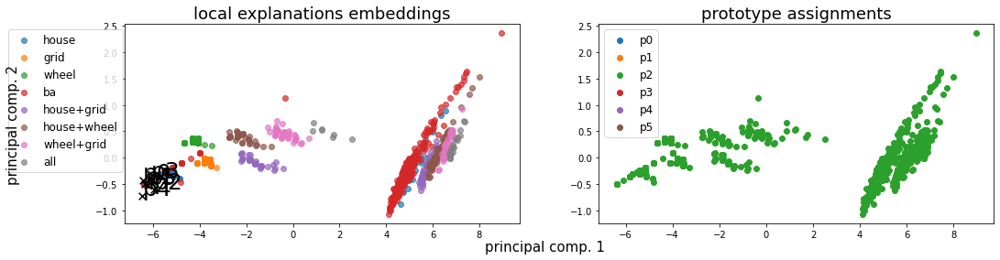

Alpha norms:
tensor([[0.9595, 1.0000, 0.9094, 0.7717, 0.9062, 0.8726],
        [0.8822, 0.8649, 0.8276, 1.0000, 0.9040, 0.7665]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.258763 +- 0.000000
Concept distribution:  (array([2], dtype=int64), array([970], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 36.31442, LEN: 0.088340, AccxC: 0.44, AccO: 0.00, V. Acc: 0.00, V. Loss: 23.55528, V. LEN 0.10
  2: Loss: 12.94867, LEN: 0.087915, AccxC: 0.46, AccO: 0.00, V. Acc: 0.00, V. Loss: 7.02530, V. LEN 0.10
  3: Loss: 4.09480, LEN: 0.087516, AccxC: 0.45, AccO: 0.00, V. Acc: 0.00, V. Loss: 3.98126, V. LEN 0.10
  4: Loss: 3.38828, LEN: 0.087138, AccxC: 0.49, AccO: 0.00, V. Acc: 0.00, V. Loss: 3.92742, V. LEN 0.10
  5: Loss: 2.95513, LEN: 0.086716, AccxC: 0.53, AccO: 0.00, V. Acc: 0.00, V. Loss: 3.95652, V. LEN 0.10
  6: Loss: 2.74388, LEN: 0.086371, AccxC: 0.56, AccO: 0.00, V. Acc: 0.00, V. Loss: 3.19126,

 74: Loss: 0.33742, LEN: 0.068707, AccxC: 0.63, AccO: 0.55, V. Acc: 0.55, V. Loss: 0.40879, V. LEN 0.07
 75: Loss: 0.35403, LEN: 0.067927, AccxC: 0.64, AccO: 0.56, V. Acc: 0.49, V. Loss: 0.39266, V. LEN 0.07
 76: Loss: 0.36150, LEN: 0.067231, AccxC: 0.66, AccO: 0.58, V. Acc: 0.66, V. Loss: 0.35119, V. LEN 0.07
 77: Loss: 0.34973, LEN: 0.068082, AccxC: 0.66, AccO: 0.62, V. Acc: 0.66, V. Loss: 0.36027, V. LEN 0.07
 78: Loss: 0.30662, LEN: 0.067285, AccxC: 0.66, AccO: 0.61, V. Acc: 0.69, V. Loss: 0.34670, V. LEN 0.07
 79: Loss: 0.32536, LEN: 0.068617, AccxC: 0.64, AccO: 0.59, V. Acc: 0.69, V. Loss: 0.35650, V. LEN 0.07

------------------------------------------------------------------------------------
Has double activations  tensor(264)
But only for wrong predictions



------------------------------------------------------------------------------------
Has double activations  tensor(27)
But only for wrong predictions


 80: Loss: 0.31951, LEN: 0.066905, AccxC: 0.68, AccO: 0.61, V. Acc:

150: Loss: 0.16706, LEN: 0.068198, AccxC: 0.66, AccO: 0.66, V. Acc: 0.65, V. Loss: 0.20373, V. LEN 0.07
151: Loss: 0.16973, LEN: 0.066858, AccxC: 0.66, AccO: 0.66, V. Acc: 0.64, V. Loss: 0.26399, V. LEN 0.07
152: Loss: 0.16943, LEN: 0.067987, AccxC: 0.66, AccO: 0.66, V. Acc: 0.78, V. Loss: 0.22407, V. LEN 0.07
153: Loss: 0.17337, LEN: 0.067677, AccxC: 0.64, AccO: 0.64, V. Acc: 0.66, V. Loss: 0.21081, V. LEN 0.07
154: Loss: 0.17512, LEN: 0.066838, AccxC: 0.67, AccO: 0.67, V. Acc: 0.65, V. Loss: 0.29821, V. LEN 0.07
155: Loss: 0.17439, LEN: 0.067175, AccxC: 0.65, AccO: 0.65, V. Acc: 0.65, V. Loss: 0.23106, V. LEN 0.08
156: Loss: 0.16563, LEN: 0.068053, AccxC: 0.66, AccO: 0.66, V. Acc: 0.65, V. Loss: 0.21629, V. LEN 0.07
157: Loss: 0.16542, LEN: 0.070859, AccxC: 0.64, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.26875, V. LEN 0.07
158: Loss: 0.15986, LEN: 0.068098, AccxC: 0.66, AccO: 0.66, V. Acc: 0.65, V. Loss: 0.20740, V. LEN 0.07
159: Loss: 0.17120, LEN: 0.069516, AccxC: 0.66, AccO: 0.66, V. A

229: Loss: 0.11568, LEN: 0.066860, AccxC: 0.65, AccO: 0.65, V. Acc: 0.67, V. Loss: 0.18786, V. LEN 0.07
230: Loss: 0.12104, LEN: 0.067491, AccxC: 0.65, AccO: 0.65, V. Acc: 0.67, V. Loss: 0.16568, V. LEN 0.07
231: Loss: 0.11700, LEN: 0.066630, AccxC: 0.64, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.16840, V. LEN 0.07
232: Loss: 0.11380, LEN: 0.068127, AccxC: 0.65, AccO: 0.65, V. Acc: 0.67, V. Loss: 0.17625, V. LEN 0.07
233: Loss: 0.11064, LEN: 0.065841, AccxC: 0.66, AccO: 0.66, V. Acc: 0.65, V. Loss: 0.14619, V. LEN 0.07
234: Loss: 0.11229, LEN: 0.069567, AccxC: 0.64, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.18149, V. LEN 0.07
235: Loss: 0.11846, LEN: 0.068505, AccxC: 0.65, AccO: 0.65, V. Acc: 0.65, V. Loss: 0.16550, V. LEN 0.07
236: Loss: 0.11722, LEN: 0.068863, AccxC: 0.65, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.14151, V. LEN 0.07
237: Loss: 0.11112, LEN: 0.067529, AccxC: 0.64, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.17100, V. LEN 0.07
238: Loss: 0.11139, LEN: 0.066900, AccxC: 0.64, AccO: 0.64, V. A

308: Loss: 0.09159, LEN: 0.066104, AccxC: 0.65, AccO: 0.65, V. Acc: 0.65, V. Loss: 0.11677, V. LEN 0.07
309: Loss: 0.09114, LEN: 0.066799, AccxC: 0.65, AccO: 0.65, V. Acc: 0.65, V. Loss: 0.12336, V. LEN 0.07
310: Loss: 0.09116, LEN: 0.065899, AccxC: 0.65, AccO: 0.65, V. Acc: 0.65, V. Loss: 0.11656, V. LEN 0.07
311: Loss: 0.09138, LEN: 0.066935, AccxC: 0.65, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.11559, V. LEN 0.07
312: Loss: 0.08934, LEN: 0.066415, AccxC: 0.65, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.11845, V. LEN 0.07
313: Loss: 0.09099, LEN: 0.066279, AccxC: 0.65, AccO: 0.65, V. Acc: 0.65, V. Loss: 0.12284, V. LEN 0.07
314: Loss: 0.09244, LEN: 0.067893, AccxC: 0.65, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.10947, V. LEN 0.07
315: Loss: 0.09202, LEN: 0.067708, AccxC: 0.65, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.11651, V. LEN 0.07
316: Loss: 0.08862, LEN: 0.065243, AccxC: 0.65, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.12373, V. LEN 0.07
317: Loss: 0.09020, LEN: 0.066151, AccxC: 0.65, AccO: 0.64, V. A

384: Loss: 0.07714, LEN: 0.061279, AccxC: 0.71, AccO: 0.71, V. Acc: 0.74, V. Loss: 0.09612, V. LEN 0.07
385: Loss: 0.07650, LEN: 0.060485, AccxC: 0.71, AccO: 0.71, V. Acc: 0.80, V. Loss: 0.09709, V. LEN 0.06
386: Loss: 0.07839, LEN: 0.063549, AccxC: 0.69, AccO: 0.69, V. Acc: 0.76, V. Loss: 0.09840, V. LEN 0.07
387: Loss: 0.08019, LEN: 0.064615, AccxC: 0.70, AccO: 0.70, V. Acc: 0.81, V. Loss: 0.09946, V. LEN 0.06
388: Loss: 0.07788, LEN: 0.061691, AccxC: 0.70, AccO: 0.70, V. Acc: 0.75, V. Loss: 0.10307, V. LEN 0.06
389: Loss: 0.07568, LEN: 0.059396, AccxC: 0.72, AccO: 0.72, V. Acc: 0.75, V. Loss: 0.10193, V. LEN 0.06
390: Loss: 0.07783, LEN: 0.061182, AccxC: 0.71, AccO: 0.71, V. Acc: 0.82, V. Loss: 0.08925, V. LEN 0.06
391: Loss: 0.07781, LEN: 0.062378, AccxC: 0.69, AccO: 0.69, V. Acc: 0.82, V. Loss: 0.10333, V. LEN 0.06
392: Loss: 0.07803, LEN: 0.062879, AccxC: 0.69, AccO: 0.69, V. Acc: 0.79, V. Loss: 0.08906, V. LEN 0.06
393: Loss: 0.07518, LEN: 0.059841, AccxC: 0.72, AccO: 0.72, V. A

463: Loss: 0.05146, LEN: 0.040297, AccxC: 0.84, AccO: 0.84, V. Acc: 0.92, V. Loss: 0.06528, V. LEN 0.03
464: Loss: 0.04855, LEN: 0.037525, AccxC: 0.86, AccO: 0.86, V. Acc: 0.92, V. Loss: 0.05493, V. LEN 0.03
465: Loss: 0.05707, LEN: 0.045781, AccxC: 0.84, AccO: 0.84, V. Acc: 0.92, V. Loss: 0.05439, V. LEN 0.03
466: Loss: 0.05168, LEN: 0.041758, AccxC: 0.83, AccO: 0.83, V. Acc: 0.90, V. Loss: 0.05838, V. LEN 0.04
467: Loss: 0.04943, LEN: 0.038158, AccxC: 0.87, AccO: 0.87, V. Acc: 0.93, V. Loss: 0.05303, V. LEN 0.03
468: Loss: 0.05037, LEN: 0.040176, AccxC: 0.86, AccO: 0.86, V. Acc: 0.90, V. Loss: 0.05703, V. LEN 0.03
469: Loss: 0.05071, LEN: 0.040822, AccxC: 0.84, AccO: 0.84, V. Acc: 0.90, V. Loss: 0.05200, V. LEN 0.03
470: Loss: 0.04877, LEN: 0.038123, AccxC: 0.85, AccO: 0.85, V. Acc: 0.90, V. Loss: 0.05128, V. LEN 0.03
471: Loss: 0.04903, LEN: 0.038895, AccxC: 0.86, AccO: 0.86, V. Acc: 0.90, V. Loss: 0.05603, V. LEN 0.04
472: Loss: 0.05631, LEN: 0.045078, AccxC: 0.85, AccO: 0.85, V. A

542: Loss: 0.04388, LEN: 0.035600, AccxC: 0.88, AccO: 0.88, V. Acc: 0.92, V. Loss: 0.04823, V. LEN 0.03
543: Loss: 0.04471, LEN: 0.037361, AccxC: 0.86, AccO: 0.86, V. Acc: 0.92, V. Loss: 0.04869, V. LEN 0.03
544: Loss: 0.04381, LEN: 0.036733, AccxC: 0.88, AccO: 0.88, V. Acc: 0.92, V. Loss: 0.04543, V. LEN 0.03
545: Loss: 0.04252, LEN: 0.034828, AccxC: 0.88, AccO: 0.88, V. Acc: 0.92, V. Loss: 0.04879, V. LEN 0.03
546: Loss: 0.04061, LEN: 0.033548, AccxC: 0.88, AccO: 0.88, V. Acc: 0.92, V. Loss: 0.04716, V. LEN 0.03
547: Loss: 0.03916, LEN: 0.031645, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.04356, V. LEN 0.03
548: Loss: 0.04197, LEN: 0.034563, AccxC: 0.88, AccO: 0.88, V. Acc: 0.91, V. Loss: 0.04873, V. LEN 0.03
549: Loss: 0.04143, LEN: 0.034480, AccxC: 0.87, AccO: 0.87, V. Acc: 0.92, V. Loss: 0.04326, V. LEN 0.03
550: Loss: 0.04011, LEN: 0.032618, AccxC: 0.89, AccO: 0.88, V. Acc: 0.92, V. Loss: 0.04512, V. LEN 0.03
551: Loss: 0.03654, LEN: 0.029423, AccxC: 0.90, AccO: 0.89, V. A

621: Loss: 0.03837, LEN: 0.032376, AccxC: 0.89, AccO: 0.88, V. Acc: 0.92, V. Loss: 0.04034, V. LEN 0.03
622: Loss: 0.03715, LEN: 0.031680, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03926, V. LEN 0.03
623: Loss: 0.03793, LEN: 0.031871, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03723, V. LEN 0.03
624: Loss: 0.03899, LEN: 0.033204, AccxC: 0.88, AccO: 0.88, V. Acc: 0.92, V. Loss: 0.03828, V. LEN 0.03
625: Loss: 0.04022, LEN: 0.034690, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03891, V. LEN 0.03
626: Loss: 0.04217, LEN: 0.036015, AccxC: 0.87, AccO: 0.87, V. Acc: 0.92, V. Loss: 0.03836, V. LEN 0.03
627: Loss: 0.04331, LEN: 0.037136, AccxC: 0.87, AccO: 0.87, V. Acc: 0.91, V. Loss: 0.04059, V. LEN 0.03
628: Loss: 0.03738, LEN: 0.031425, AccxC: 0.88, AccO: 0.88, V. Acc: 0.92, V. Loss: 0.03740, V. LEN 0.03
629: Loss: 0.04402, LEN: 0.036824, AccxC: 0.87, AccO: 0.87, V. Acc: 0.92, V. Loss: 0.04144, V. LEN 0.03
630: Loss: 0.03950, LEN: 0.033146, AccxC: 0.89, AccO: 0.88, V. A



700: Loss: 0.03720, LEN: 0.032659, AccxC: 0.88, AccO: 0.88, V. Acc: 0.88, V. Loss: 0.03935, V. LEN 0.03
701: Loss: 0.03345, LEN: 0.029473, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.04114, V. LEN 0.03
702: Loss: 0.03634, LEN: 0.032225, AccxC: 0.88, AccO: 0.88, V. Acc: 0.88, V. Loss: 0.03984, V. LEN 0.04
703: Loss: 0.03784, LEN: 0.033311, AccxC: 0.87, AccO: 0.87, V. Acc: 0.88, V. Loss: 0.04334, V. LEN 0.04
704: Loss: 0.04004, LEN: 0.035278, AccxC: 0.87, AccO: 0.87, V. Acc: 0.88, V. Loss: 0.04640, V. LEN 0.03
705: Loss: 0.04099, LEN: 0.035983, AccxC: 0.86, AccO: 0.86, V. Acc: 0.88, V. Loss: 0.04474, V. LEN 0.04
706: Loss: 0.04142, LEN: 0.036593, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.04286, V. LEN 0.03
707: Loss: 0.04136, LEN: 0.036862, AccxC: 0.86, AccO: 0.86, V. Acc: 0.88, V. Loss: 0.04489, V. LEN 0.04
708: Loss: 0.03754, LEN: 0.033191, AccxC: 0.88, AccO: 0.88, V. Acc: 0.88, V. Loss: 0.04236, V. LEN 0.03
709: Loss: 0.03796, LEN: 0.033574, AccxC: 0.87, AccO: 0.87, V.

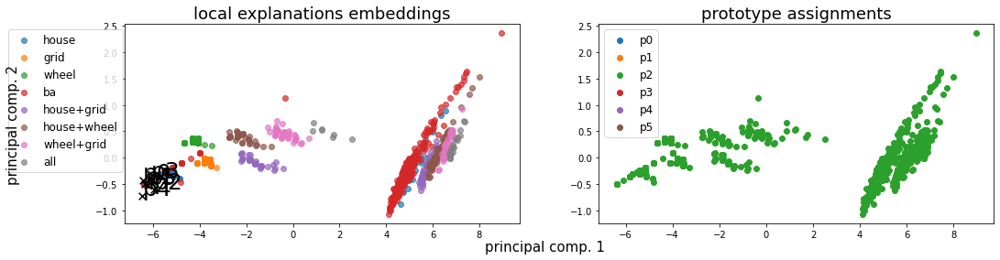

Alpha norms:
tensor([[0.9595, 1.0000, 0.9094, 0.7717, 0.9062, 0.8726],
        [0.8822, 0.8649, 0.8276, 1.0000, 0.9040, 0.7665]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.258763 +- 0.000000
Concept distribution:  (array([2], dtype=int64), array([970], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 77.22342, LEN: 0.088338, AccxC: 0.45, AccO: 0.00, V. Acc: 0.00, V. Loss: 48.17340, V. LEN 0.10
  2: Loss: 25.86335, LEN: 0.087918, AccxC: 0.45, AccO: 0.00, V. Acc: 0.00, V. Loss: 11.98272, V. LEN 0.10
  3: Loss: 6.75037, LEN: 0.087515, AccxC: 0.45, AccO: 0.00, V. Acc: 0.00, V. Loss: 5.40311, V. LEN 0.10
  4: Loss: 5.03690, LEN: 0.087143, AccxC: 0.50, AccO: 0.00, V. Acc: 0.00, V. Loss: 5.86350, V. LEN 0.10
  5: Loss: 4.75934, LEN: 0.086716, AccxC: 0.53, AccO: 0.00, V. Acc: 0.00, V. Loss: 5.71977, V. LEN 0.10
  6: Loss: 4.55382, LEN: 0.086339, AccxC: 0.51, AccO: 0.00, V. Acc: 0.00, V. Loss: 5.21976

 76: Loss: 0.49741, LEN: 0.068244, AccxC: 0.66, AccO: 0.62, V. Acc: 0.82, V. Loss: 0.50768, V. LEN 0.07
 77: Loss: 0.48782, LEN: 0.069113, AccxC: 0.64, AccO: 0.61, V. Acc: 0.79, V. Loss: 0.54929, V. LEN 0.07
 78: Loss: 0.46885, LEN: 0.068608, AccxC: 0.65, AccO: 0.62, V. Acc: 0.76, V. Loss: 0.55925, V. LEN 0.07
 79: Loss: 0.48112, LEN: 0.069525, AccxC: 0.64, AccO: 0.60, V. Acc: 0.65, V. Loss: 0.49289, V. LEN 0.08


 80: Loss: 0.46301, LEN: 0.067364, AccxC: 0.65, AccO: 0.62, V. Acc: 0.68, V. Loss: 0.56206, V. LEN 0.08
 81: Loss: 0.42234, LEN: 0.068161, AccxC: 0.64, AccO: 0.60, V. Acc: 0.66, V. Loss: 0.52956, V. LEN 0.08
 82: Loss: 0.44539, LEN: 0.068412, AccxC: 0.64, AccO: 0.60, V. Acc: 0.60, V. Loss: 0.56301, V. LEN 0.08
 83: Loss: 0.44206, LEN: 0.068825, AccxC: 0.63, AccO: 0.59, V. Acc: 0.65, V. Loss: 0.49279, V. LEN 0.07
 84: Loss: 0.45971, LEN: 0.068056, AccxC: 0.66, AccO: 0.62, V. Acc: 0.67, V. Loss: 0.48561, V. LEN 0.08
 85: Loss: 0.44770, LEN: 0.069119, AccxC: 0.62, AccO: 0.57, V.

155: Loss: 0.22156, LEN: 0.068785, AccxC: 0.65, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.32908, V. LEN 0.08
156: Loss: 0.22140, LEN: 0.068792, AccxC: 0.65, AccO: 0.65, V. Acc: 0.65, V. Loss: 0.32588, V. LEN 0.08
157: Loss: 0.22681, LEN: 0.070540, AccxC: 0.65, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.32868, V. LEN 0.08
158: Loss: 0.21742, LEN: 0.069835, AccxC: 0.64, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.34589, V. LEN 0.08
159: Loss: 0.21560, LEN: 0.069348, AccxC: 0.65, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.32105, V. LEN 0.08


160: Loss: 0.21247, LEN: 0.070369, AccxC: 0.64, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.30252, V. LEN 0.08
161: Loss: 0.21909, LEN: 0.067922, AccxC: 0.65, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.28801, V. LEN 0.08
162: Loss: 0.20680, LEN: 0.069467, AccxC: 0.65, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.30665, V. LEN 0.08
163: Loss: 0.21487, LEN: 0.069519, AccxC: 0.65, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.31265, V. LEN 0.08
164: Loss: 0.19783, LEN: 0.068087, AccxC: 0.65, AccO: 0.65, V.

234: Loss: 0.13755, LEN: 0.069699, AccxC: 0.65, AccO: 0.65, V. Acc: 0.65, V. Loss: 0.18369, V. LEN 0.08
235: Loss: 0.13799, LEN: 0.068847, AccxC: 0.65, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.18247, V. LEN 0.08
236: Loss: 0.14311, LEN: 0.069646, AccxC: 0.65, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.18879, V. LEN 0.08
237: Loss: 0.13229, LEN: 0.068545, AccxC: 0.65, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.18416, V. LEN 0.08
238: Loss: 0.13803, LEN: 0.068706, AccxC: 0.65, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.17553, V. LEN 0.08
239: Loss: 0.13836, LEN: 0.068644, AccxC: 0.65, AccO: 0.65, V. Acc: 0.65, V. Loss: 0.18010, V. LEN 0.08


240: Loss: 0.13006, LEN: 0.068782, AccxC: 0.65, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.19114, V. LEN 0.08
241: Loss: 0.13605, LEN: 0.068815, AccxC: 0.65, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.19004, V. LEN 0.08
242: Loss: 0.13353, LEN: 0.069072, AccxC: 0.65, AccO: 0.64, V. Acc: 0.65, V. Loss: 0.17004, V. LEN 0.08
243: Loss: 0.13396, LEN: 0.068927, AccxC: 0.65, AccO: 0.64, V.

313: Loss: 0.10540, LEN: 0.065367, AccxC: 0.65, AccO: 0.59, V. Acc: 0.65, V. Loss: 0.14978, V. LEN 0.07
314: Loss: 0.10222, LEN: 0.065043, AccxC: 0.65, AccO: 0.62, V. Acc: 0.65, V. Loss: 0.14574, V. LEN 0.07
315: Loss: 0.10198, LEN: 0.065970, AccxC: 0.65, AccO: 0.61, V. Acc: 0.65, V. Loss: 0.13823, V. LEN 0.07
316: Loss: 0.09995, LEN: 0.065297, AccxC: 0.65, AccO: 0.61, V. Acc: 0.65, V. Loss: 0.14084, V. LEN 0.07
317: Loss: 0.10241, LEN: 0.066063, AccxC: 0.65, AccO: 0.61, V. Acc: 0.65, V. Loss: 0.14349, V. LEN 0.08
318: Loss: 0.10290, LEN: 0.065681, AccxC: 0.65, AccO: 0.61, V. Acc: 0.65, V. Loss: 0.13603, V. LEN 0.07
319: Loss: 0.10304, LEN: 0.065418, AccxC: 0.65, AccO: 0.62, V. Acc: 0.65, V. Loss: 0.14413, V. LEN 0.07


320: Loss: 0.10566, LEN: 0.065556, AccxC: 0.65, AccO: 0.59, V. Acc: 0.65, V. Loss: 0.13344, V. LEN 0.07
321: Loss: 0.10303, LEN: 0.067177, AccxC: 0.65, AccO: 0.61, V. Acc: 0.65, V. Loss: 0.14299, V. LEN 0.07
322: Loss: 0.10517, LEN: 0.068077, AccxC: 0.65, AccO: 0.59, V.

392: Loss: 0.08045, LEN: 0.055705, AccxC: 0.76, AccO: 0.76, V. Acc: 0.73, V. Loss: 0.10637, V. LEN 0.06
393: Loss: 0.07696, LEN: 0.054773, AccxC: 0.76, AccO: 0.76, V. Acc: 0.74, V. Loss: 0.10071, V. LEN 0.06
394: Loss: 0.07806, LEN: 0.054270, AccxC: 0.76, AccO: 0.76, V. Acc: 0.70, V. Loss: 0.10730, V. LEN 0.06
395: Loss: 0.07686, LEN: 0.053703, AccxC: 0.74, AccO: 0.74, V. Acc: 0.81, V. Loss: 0.08774, V. LEN 0.05
396: Loss: 0.07806, LEN: 0.052081, AccxC: 0.78, AccO: 0.77, V. Acc: 0.83, V. Loss: 0.10138, V. LEN 0.05
397: Loss: 0.07627, LEN: 0.054077, AccxC: 0.76, AccO: 0.76, V. Acc: 0.73, V. Loss: 0.10482, V. LEN 0.06
398: Loss: 0.07531, LEN: 0.052713, AccxC: 0.75, AccO: 0.75, V. Acc: 0.74, V. Loss: 0.09786, V. LEN 0.06
399: Loss: 0.07816, LEN: 0.055266, AccxC: 0.75, AccO: 0.75, V. Acc: 0.74, V. Loss: 0.09380, V. LEN 0.06


400: Loss: 0.07865, LEN: 0.056860, AccxC: 0.76, AccO: 0.76, V. Acc: 0.81, V. Loss: 0.09809, V. LEN 0.05
401: Loss: 0.07843, LEN: 0.054764, AccxC: 0.76, AccO: 0.76, V.

471: Loss: 0.06698, LEN: 0.050259, AccxC: 0.77, AccO: 0.77, V. Acc: 0.83, V. Loss: 0.06888, V. LEN 0.04
472: Loss: 0.06161, LEN: 0.046853, AccxC: 0.80, AccO: 0.80, V. Acc: 0.84, V. Loss: 0.06280, V. LEN 0.04
473: Loss: 0.06278, LEN: 0.046825, AccxC: 0.78, AccO: 0.78, V. Acc: 0.83, V. Loss: 0.06670, V. LEN 0.04
474: Loss: 0.06239, LEN: 0.046543, AccxC: 0.80, AccO: 0.80, V. Acc: 0.83, V. Loss: 0.06413, V. LEN 0.04
475: Loss: 0.06269, LEN: 0.044894, AccxC: 0.80, AccO: 0.80, V. Acc: 0.84, V. Loss: 0.06217, V. LEN 0.04
476: Loss: 0.05836, LEN: 0.043617, AccxC: 0.79, AccO: 0.79, V. Acc: 0.83, V. Loss: 0.06570, V. LEN 0.04
477: Loss: 0.06517, LEN: 0.049557, AccxC: 0.78, AccO: 0.78, V. Acc: 0.84, V. Loss: 0.06019, V. LEN 0.04
478: Loss: 0.06072, LEN: 0.045634, AccxC: 0.78, AccO: 0.78, V. Acc: 0.84, V. Loss: 0.06363, V. LEN 0.04
479: Loss: 0.06231, LEN: 0.046276, AccxC: 0.80, AccO: 0.80, V. Acc: 0.84, V. Loss: 0.06393, V. LEN 0.04


480: Loss: 0.06148, LEN: 0.046426, AccxC: 0.78, AccO: 0.78, V.

550: Loss: 0.05067, LEN: 0.038959, AccxC: 0.81, AccO: 0.81, V. Acc: 0.83, V. Loss: 0.06017, V. LEN 0.04
551: Loss: 0.05207, LEN: 0.039860, AccxC: 0.81, AccO: 0.81, V. Acc: 0.84, V. Loss: 0.05108, V. LEN 0.03
552: Loss: 0.05412, LEN: 0.041202, AccxC: 0.81, AccO: 0.81, V. Acc: 0.84, V. Loss: 0.05925, V. LEN 0.04
553: Loss: 0.05089, LEN: 0.039608, AccxC: 0.81, AccO: 0.81, V. Acc: 0.84, V. Loss: 0.05476, V. LEN 0.04
554: Loss: 0.05218, LEN: 0.041291, AccxC: 0.81, AccO: 0.81, V. Acc: 0.83, V. Loss: 0.05693, V. LEN 0.04
555: Loss: 0.04926, LEN: 0.037928, AccxC: 0.82, AccO: 0.82, V. Acc: 0.84, V. Loss: 0.05623, V. LEN 0.04
556: Loss: 0.04984, LEN: 0.038470, AccxC: 0.81, AccO: 0.81, V. Acc: 0.84, V. Loss: 0.05510, V. LEN 0.03
557: Loss: 0.05182, LEN: 0.041347, AccxC: 0.80, AccO: 0.80, V. Acc: 0.84, V. Loss: 0.05667, V. LEN 0.04
558: Loss: 0.05128, LEN: 0.039866, AccxC: 0.82, AccO: 0.82, V. Acc: 0.84, V. Loss: 0.05197, V. LEN 0.04
559: Loss: 0.05038, LEN: 0.039772, AccxC: 0.81, AccO: 0.81, V. A

629: Loss: 0.04690, LEN: 0.035818, AccxC: 0.86, AccO: 0.86, V. Acc: 0.86, V. Loss: 0.05066, V. LEN 0.04
630: Loss: 0.04124, LEN: 0.031996, AccxC: 0.86, AccO: 0.86, V. Acc: 0.85, V. Loss: 0.04992, V. LEN 0.04
631: Loss: 0.04428, LEN: 0.035570, AccxC: 0.85, AccO: 0.85, V. Acc: 0.84, V. Loss: 0.05851, V. LEN 0.04
632: Loss: 0.04597, LEN: 0.037219, AccxC: 0.84, AccO: 0.84, V. Acc: 0.85, V. Loss: 0.04665, V. LEN 0.04
633: Loss: 0.04177, LEN: 0.032418, AccxC: 0.87, AccO: 0.87, V. Acc: 0.86, V. Loss: 0.05056, V. LEN 0.04
634: Loss: 0.04218, LEN: 0.033848, AccxC: 0.86, AccO: 0.86, V. Acc: 0.86, V. Loss: 0.04343, V. LEN 0.04
635: Loss: 0.04316, LEN: 0.034581, AccxC: 0.85, AccO: 0.85, V. Acc: 0.86, V. Loss: 0.04750, V. LEN 0.03
636: Loss: 0.04056, LEN: 0.032354, AccxC: 0.88, AccO: 0.88, V. Acc: 0.85, V. Loss: 0.05323, V. LEN 0.04
637: Loss: 0.04173, LEN: 0.033502, AccxC: 0.85, AccO: 0.85, V. Acc: 0.85, V. Loss: 0.04337, V. LEN 0.03
638: Loss: 0.04075, LEN: 0.032081, AccxC: 0.85, AccO: 0.86, V. A

708: Loss: 0.03799, LEN: 0.031618, AccxC: 0.88, AccO: 0.88, V. Acc: 0.93, V. Loss: 0.03666, V. LEN 0.03
709: Loss: 0.03802, LEN: 0.032082, AccxC: 0.88, AccO: 0.88, V. Acc: 0.93, V. Loss: 0.04101, V. LEN 0.03
710: Loss: 0.03712, LEN: 0.031079, AccxC: 0.90, AccO: 0.90, V. Acc: 0.93, V. Loss: 0.03837, V. LEN 0.03
711: Loss: 0.03632, LEN: 0.030631, AccxC: 0.90, AccO: 0.90, V. Acc: 0.92, V. Loss: 0.04098, V. LEN 0.03
712: Loss: 0.03814, LEN: 0.032245, AccxC: 0.88, AccO: 0.88, V. Acc: 0.93, V. Loss: 0.03624, V. LEN 0.03
713: Loss: 0.03952, LEN: 0.033777, AccxC: 0.88, AccO: 0.88, V. Acc: 0.93, V. Loss: 0.04077, V. LEN 0.03
714: Loss: 0.03850, LEN: 0.032636, AccxC: 0.88, AccO: 0.88, V. Acc: 0.92, V. Loss: 0.04079, V. LEN 0.03
715: Loss: 0.03702, LEN: 0.030279, AccxC: 0.89, AccO: 0.89, V. Acc: 0.93, V. Loss: 0.03611, V. LEN 0.03
716: Loss: 0.03916, LEN: 0.032880, AccxC: 0.88, AccO: 0.88, V. Acc: 0.93, V. Loss: 0.03950, V. LEN 0.03
717: Loss: 0.04016, LEN: 0.033526, AccxC: 0.88, AccO: 0.88, V. A

787: Loss: 0.03700, LEN: 0.032734, AccxC: 0.88, AccO: 0.88, V. Acc: 0.92, V. Loss: 0.03906, V. LEN 0.03
788: Loss: 0.03402, LEN: 0.029254, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03467, V. LEN 0.03
789: Loss: 0.03463, LEN: 0.030107, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03874, V. LEN 0.03
790: Loss: 0.03385, LEN: 0.029597, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03697, V. LEN 0.03
791: Loss: 0.03294, LEN: 0.028724, AccxC: 0.90, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.03585, V. LEN 0.03
792: Loss: 0.03650, LEN: 0.032214, AccxC: 0.89, AccO: 0.89, V. Acc: 0.92, V. Loss: 0.03839, V. LEN 0.03
793: Loss: 0.03532, LEN: 0.031067, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03629, V. LEN 0.03
794: Loss: 0.03183, LEN: 0.028020, AccxC: 0.90, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.04115, V. LEN 0.03
795: Loss: 0.03662, LEN: 0.032523, AccxC: 0.89, AccO: 0.89, V. Acc: 0.91, V. Loss: 0.03507, V. LEN 0.03
796: Loss: 0.03858, LEN: 0.033922, AccxC: 0.89, AccO: 0.89, V. A

866: Loss: 0.03082, LEN: 0.027535, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.03810, V. LEN 0.03
867: Loss: 0.03338, LEN: 0.030460, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.03692, V. LEN 0.03
868: Loss: 0.03412, LEN: 0.030781, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.03559, V. LEN 0.03
869: Loss: 0.03719, LEN: 0.033833, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.03958, V. LEN 0.03
870: Loss: 0.03440, LEN: 0.031214, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.03622, V. LEN 0.03
871: Loss: 0.03382, LEN: 0.030557, AccxC: 0.89, AccO: 0.89, V. Acc: 0.89, V. Loss: 0.03788, V. LEN 0.03
872: Loss: 0.03413, LEN: 0.031013, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.03587, V. LEN 0.03
873: Loss: 0.03279, LEN: 0.029834, AccxC: 0.88, AccO: 0.88, V. Acc: 0.89, V. Loss: 0.03756, V. LEN 0.03
874: Loss: 0.03566, LEN: 0.032613, AccxC: 0.86, AccO: 0.87, V. Acc: 0.89, V. Loss: 0.03737, V. LEN 0.03
875: Loss: 0.03075, LEN: 0.027420, AccxC: 0.89, AccO: 0.89, V. A

In [14]:
for r1 in [9e-4, 9e-2, 0.9, 2]:
    for r2 in [9.9e-4, 9e-4, 9e-2, 0.9, 2]: 
        batch_sampler = utils.GroupBatchSampler(num_input_graphs=128, drop_last=False, belonging=np.array(belonging_train))
        train_group_loader = DataLoader(dataset_train, batch_sampler=batch_sampler)

        batch_sampler = utils.GroupBatchSampler(num_input_graphs=256, drop_last=False, belonging=np.array(belonging_val))
        val_group_loader = DataLoader(dataset_val, batch_sampler=batch_sampler)

        batch_sampler = utils.GroupBatchSampler(num_input_graphs=256, drop_last=False, belonging=np.array(belonging_test))
        test_group_loader = DataLoader(dataset_test, batch_sampler=batch_sampler)


        torch.manual_seed(42)
        hyper = {
            "len_lr": 0.0005,
            "proto_lr": 0.001,
            "le_emb_lr": 0.001,
            "coeff_divloss": 0.000,
            "coeff_pdist": 0.,
            "coeff_gae": 0.,
            "coeff_r1": r1,
            "coeff_r2": r2,
            "coeff_ce": 0.0,
            "coeff_de": 0.,
            "coeff_logic_loss": 0.00,
            "focal_gamma": 2, #3
            "focal_alpha": -1,
            "ts": 1,
            "te": 1,
            "focal_loss": True,
            "debug_prototypes": False,
            "num_prototypes": 6,
            "dim_prototypes": 10,
            "num_le_features": 5,
            "activation": "leaky",
            "assign_func": "straight_sim",
            "LEN_temperature": 1,
            "remove_attention": True,
            "log_images": True,
            "log_models": True,
            "num_epochs": 2000
        }

        len_model    = models.LEN(hyper["num_prototypes"], 
                                  hyper["LEN_temperature"], 
                                  remove_attention=hyper["remove_attention"]).to(device)
        le_model     = models.LEEmbedder(num_features=hyper["num_le_features"], 
                                         activation=hyper["activation"], 
                                         num_hidden=hyper["dim_prototypes"]).to(device)
        expl         = models.GlobalExplainer(len_model, 
                                       le_model, 
                                       train_group_loader, 
                                       val_group_loader, 
                                       device, 
                                       hyper_params=hyper,
                                       classes_names=bamultishapes_classes_names,
                                       dataset_name="BAMultiShapes").to(device)
        expl.iterate(num_epochs=hyper["num_epochs"], log_wandb=False, name_wandb="")

        with open(f'../logs/model_focal_num_proto_6_r1_{r1}_r2_{r2}_BAMultiShapes.pkl', 'wb') as handle:
            pickle.dump(expl, handle)

In [17]:
# steve
import plotly.graph_objects as go
import pandas as pd
import numpy as np

z = np.zeros((4,5))
for i , r1 in enumerate([9e-4, 9e-2, 0.9, 2]):
    for j , r2 in enumerate([9.9e-4, 9e-4, 9e-2, 0.9, 2]):
        with open(f'../logs/model_focal_num_proto_6_r1_{r1}_r2_{r2}_BAMultiShapes.pkl', 'rb') as handle:
            uno = pickle.load(handle)
            z[i,j] = uno.val_metrics[uno.early_stopping.best_epoch-1]["acc_overall"]
        
sh_0, sh_1 = z.shape
x, y = [9.9e-4, 9e-4, 9e-2, 0.9, 2] , [9e-4, 9e-2, 0.9, 2]

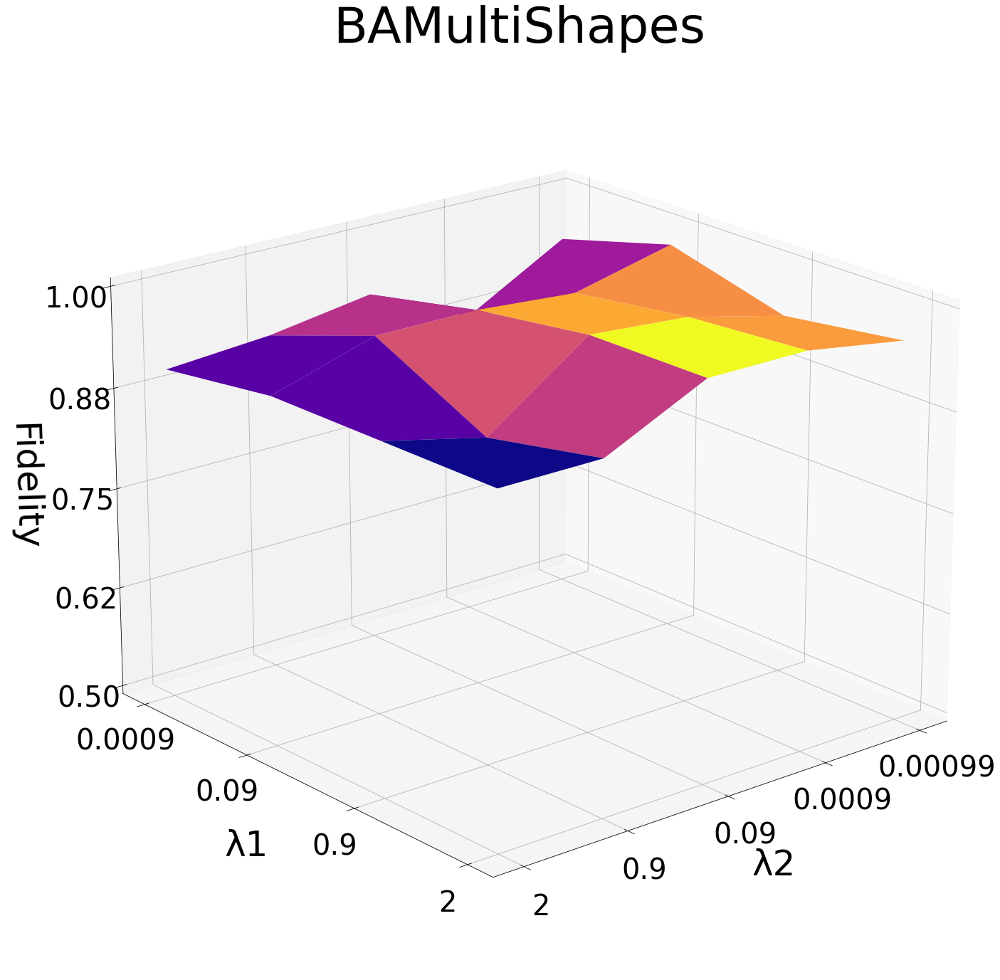

In [18]:
from matplotlib.ticker import LinearLocator

fig, ax = plt.subplots(figsize=(20,20), subplot_kw={"projection": "3d"})

x3, y3 = [1, 2, 3, 4, 5] , [1, 2, 3, 4]
X, Y = np.meshgrid(x3, y3)
Z = z

surf = ax.plot_surface(X, Y, Z, cmap=cm.plasma, linewidth=0, antialiased=True)
ax.set_zlim(0.5, 1.0)
ax.zaxis.set_major_locator(LinearLocator(5))
ax.zaxis.set_major_formatter('{x:.02f}')
ax.view_init(elev=20, azim=50)
ax.set_yticks([1,2,3,4], [str(a) for a in y], size=40)
ax.set_xticks([1,2,3,4,5], [str(a) for a in x], size=40)
ax.tick_params(axis='both', which='major', labelsize=40)
ax.tick_params(axis='both', which='major', pad=20)

mysize = 50
labelpad = 55
ax.set_xlabel("λ2", size=mysize, labelpad=labelpad)
ax.set_ylabel("λ1", size=mysize, labelpad=labelpad)
ax.set_zlabel("Fidelity", size=mysize, labelpad=labelpad, rotation=180)
plt.subplots_adjust(bottom=0.001, left=0.05, right=0.95, top=0.99)

# Add a color bar which maps values to colors.
#cbar = fig.colorbar(surf, shrink=0.5, aspect=6)
#cbar.ax.tick_params(labelsize=mysize) 
plt.title("BAMultiShapes", size=mysize+20)
plt.savefig("surface_bamultishapes.pdf")
plt.show()

In [ ]:
layout = go.Layout(
    scene=dict(xaxis = dict(
                    tickmode = 'array',
                    tickvals = [9.9e-4, 9e-4, 9e-2, 0.9, 2, 3],
                    type='category',
                    title="λ2"
                ),
               yaxis = dict(
                    tickmode = 'array',
                    tickvals = [9e-4, 9e-2, 0.9, 2, 3],
                    type='category',
                    title="λ1"
                ),
               zaxis = dict(
                   title="LEN fidelity",
                   range=[0.5, 1],
                   dtick=0.1
                )
              ),
    
)
fig = go.Figure(data=[go.Surface(z=z, x=x, y=y)], layout=layout)
fig.update_layout(autosize=False, width=700, height=700)
fig.update_yaxes(automargin=True, )
fig.show()
fig.write_image("hyper_surface_bamultishapes.pdf")

## Ablation on Discretization trick

(array([0., 1., 2., 3., 4., 5., 6., 7.], dtype=float32), array([121, 162, 157, 251,  78, 102,  73,  26], dtype=int64))


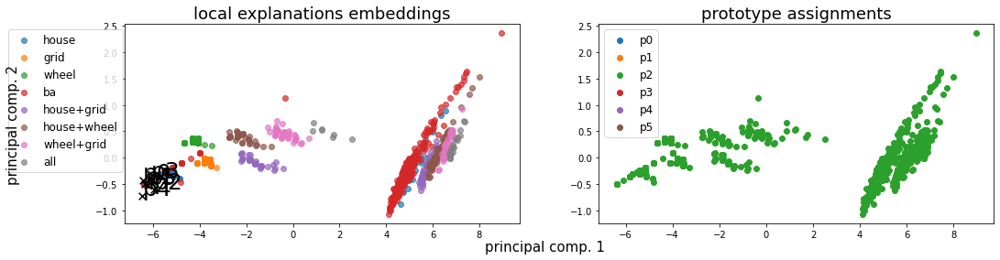

Alpha norms:
tensor([[0.9595, 1.0000, 0.9094, 0.7717, 0.9062, 0.8726],
        [0.8822, 0.8649, 0.8276, 1.0000, 0.9040, 0.7665]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.258763 +- 0.000000
Concept distribution:  (array([2], dtype=int64), array([970], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 0.25815, LEN: 0.088356, AccxC: 0.45, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.26596, V. LEN 0.10
  2: Loss: 0.20036, LEN: 0.087956, AccxC: 0.45, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.21689, V. LEN 0.10
  3: Loss: 0.16323, LEN: 0.087553, AccxC: 0.45, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.20475, V. LEN 0.10
  4: Loss: 0.16011, LEN: 0.087171, AccxC: 0.45, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.19374, V. LEN 0.10
  5: Loss: 0.14984, LEN: 0.086784, AccxC: 0.45, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.18461, V. LEN 0.10
  6: Loss: 0.14094, LEN: 0.086420, AccxC: 0.45, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.17932, V.

 77: Loss: 0.09209, LEN: 0.074012, AccxC: 0.55, AccO: 0.55, V. Acc: 0.56, V. Loss: 0.11157, V. LEN 0.08
 78: Loss: 0.09223, LEN: 0.074464, AccxC: 0.55, AccO: 0.55, V. Acc: 0.56, V. Loss: 0.10846, V. LEN 0.08
 79: Loss: 0.09306, LEN: 0.074931, AccxC: 0.55, AccO: 0.55, V. Acc: 0.56, V. Loss: 0.10761, V. LEN 0.08


 80: Loss: 0.09199, LEN: 0.074422, AccxC: 0.55, AccO: 0.55, V. Acc: 0.56, V. Loss: 0.11114, V. LEN 0.08
 81: Loss: 0.09216, LEN: 0.074179, AccxC: 0.55, AccO: 0.55, V. Acc: 0.56, V. Loss: 0.10813, V. LEN 0.08
 82: Loss: 0.09201, LEN: 0.074202, AccxC: 0.55, AccO: 0.55, V. Acc: 0.56, V. Loss: 0.11133, V. LEN 0.08
 83: Loss: 0.09160, LEN: 0.074291, AccxC: 0.55, AccO: 0.55, V. Acc: 0.56, V. Loss: 0.11462, V. LEN 0.08
 84: Loss: 0.09254, LEN: 0.074140, AccxC: 0.55, AccO: 0.55, V. Acc: 0.56, V. Loss: 0.11697, V. LEN 0.08
 85: Loss: 0.09131, LEN: 0.073720, AccxC: 0.55, AccO: 0.55, V. Acc: 0.56, V. Loss: 0.11229, V. LEN 0.08
 86: Loss: 0.09143, LEN: 0.073919, AccxC: 0.55, AccO: 0.55, V.

151: Loss: 0.03717, LEN: 0.024699, AccxC: 0.91, AccO: 0.90, V. Acc: 0.96, V. Loss: 0.03712, V. LEN 0.02
152: Loss: 0.03593, LEN: 0.023201, AccxC: 0.92, AccO: 0.92, V. Acc: 0.96, V. Loss: 0.03431, V. LEN 0.02
153: Loss: 0.03542, LEN: 0.022847, AccxC: 0.92, AccO: 0.91, V. Acc: 0.96, V. Loss: 0.03390, V. LEN 0.02
154: Loss: 0.03553, LEN: 0.023027, AccxC: 0.93, AccO: 0.93, V. Acc: 0.96, V. Loss: 0.03317, V. LEN 0.02
155: Loss: 0.03422, LEN: 0.021375, AccxC: 0.93, AccO: 0.93, V. Acc: 0.96, V. Loss: 0.03542, V. LEN 0.02
156: Loss: 0.03204, LEN: 0.019060, AccxC: 0.94, AccO: 0.94, V. Acc: 0.95, V. Loss: 0.03788, V. LEN 0.02
157: Loss: 0.03254, LEN: 0.020547, AccxC: 0.93, AccO: 0.92, V. Acc: 0.96, V. Loss: 0.03259, V. LEN 0.02
158: Loss: 0.03196, LEN: 0.020046, AccxC: 0.93, AccO: 0.93, V. Acc: 0.96, V. Loss: 0.03054, V. LEN 0.02
159: Loss: 0.03246, LEN: 0.020169, AccxC: 0.93, AccO: 0.92, V. Acc: 0.96, V. Loss: 0.03070, V. LEN 0.02

---------------------------------------------------------------

221: Loss: 0.02131, LEN: 0.012054, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.01853, V. LEN 0.01
222: Loss: 0.02043, LEN: 0.011121, AccxC: 0.98, AccO: 0.98, V. Acc: 0.97, V. Loss: 0.02247, V. LEN 0.01
223: Loss: 0.01897, LEN: 0.009971, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.02025, V. LEN 0.01
224: Loss: 0.02000, LEN: 0.010908, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01987, V. LEN 0.01
225: Loss: 0.02058, LEN: 0.011515, AccxC: 0.97, AccO: 0.97, V. Acc: 0.97, V. Loss: 0.02327, V. LEN 0.01
226: Loss: 0.01849, LEN: 0.009708, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01927, V. LEN 0.01
227: Loss: 0.01969, LEN: 0.011049, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.02092, V. LEN 0.01
228: Loss: 0.02131, LEN: 0.012209, AccxC: 0.97, AccO: 0.97, V. Acc: 0.97, V. Loss: 0.02157, V. LEN 0.01
229: Loss: 0.02020, LEN: 0.011104, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.02007, V. LEN 0.01
230: Loss: 0.01916, LEN: 0.010034, AccxC: 0.98, AccO: 0.98, V. A

293: Loss: 0.01607, LEN: 0.008416, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.02073, V. LEN 0.01
294: Loss: 0.01745, LEN: 0.009563, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01800, V. LEN 0.01
295: Loss: 0.01754, LEN: 0.009756, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01764, V. LEN 0.01
296: Loss: 0.01779, LEN: 0.009669, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.02126, V. LEN 0.01
297: Loss: 0.01691, LEN: 0.009171, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01573, V. LEN 0.01
298: Loss: 0.01805, LEN: 0.010214, AccxC: 0.97, AccO: 0.97, V. Acc: 0.97, V. Loss: 0.02450, V. LEN 0.01
299: Loss: 0.01736, LEN: 0.009394, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01608, V. LEN 0.01

------------------------------------------------------------------------------------
Has double activations  tensor(426)



------------------------------------------------------------------------------------
Has double activations  tensor(50)


300: Loss: 0.01905, LEN: 

363: Loss: 0.01732, LEN: 0.009079, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.02129, V. LEN 0.01
364: Loss: 0.01757, LEN: 0.010292, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01594, V. LEN 0.01
365: Loss: 0.01658, LEN: 0.009205, AccxC: 0.98, AccO: 0.98, V. Acc: 0.97, V. Loss: 0.02113, V. LEN 0.01
366: Loss: 0.01710, LEN: 0.009748, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01919, V. LEN 0.01
367: Loss: 0.01609, LEN: 0.008774, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01741, V. LEN 0.01
368: Loss: 0.01765, LEN: 0.010300, AccxC: 0.98, AccO: 0.98, V. Acc: 0.97, V. Loss: 0.02362, V. LEN 0.01
369: Loss: 0.01547, LEN: 0.008303, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01676, V. LEN 0.01
370: Loss: 0.01675, LEN: 0.009800, AccxC: 0.98, AccO: 0.98, V. Acc: 0.97, V. Loss: 0.02129, V. LEN 0.01
371: Loss: 0.01662, LEN: 0.009564, AccxC: 0.97, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01624, V. LEN 0.01
372: Loss: 0.01545, LEN: 0.008170, AccxC: 0.98, AccO: 0.98, V. A

435: Loss: 0.01426, LEN: 0.007926, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01702, V. LEN 0.01
436: Loss: 0.01790, LEN: 0.011424, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01699, V. LEN 0.01
437: Loss: 0.01552, LEN: 0.008759, AccxC: 0.97, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01721, V. LEN 0.01
438: Loss: 0.01505, LEN: 0.008348, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01520, V. LEN 0.01
439: Loss: 0.01543, LEN: 0.008149, AccxC: 0.98, AccO: 0.98, V. Acc: 0.97, V. Loss: 0.02227, V. LEN 0.01

------------------------------------------------------------------------------------
Has double activations  tensor(295)



------------------------------------------------------------------------------------
Has double activations  tensor(34)


440: Loss: 0.01517, LEN: 0.008305, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01604, V. LEN 0.01
441: Loss: 0.01475, LEN: 0.008186, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01835, V. LEN 0.01
442: Loss: 0.01753, LEN: 

505: Loss: 0.01701, LEN: 0.010767, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01656, V. LEN 0.01
506: Loss: 0.01392, LEN: 0.007786, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01629, V. LEN 0.01
507: Loss: 0.01415, LEN: 0.007982, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01541, V. LEN 0.01
508: Loss: 0.01392, LEN: 0.007803, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01349, V. LEN 0.01
509: Loss: 0.01418, LEN: 0.007938, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01771, V. LEN 0.01
510: Loss: 0.01529, LEN: 0.008644, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01511, V. LEN 0.01
511: Loss: 0.01484, LEN: 0.008510, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01625, V. LEN 0.01
512: Loss: 0.01596, LEN: 0.009927, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01526, V. LEN 0.01
513: Loss: 0.01566, LEN: 0.009369, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01466, V. LEN 0.01
514: Loss: 0.01538, LEN: 0.008453, AccxC: 0.98, AccO: 0.98, V. A

577: Loss: 0.01455, LEN: 0.008694, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01546, V. LEN 0.01
578: Loss: 0.01598, LEN: 0.009917, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.01238, V. LEN 0.01
579: Loss: 0.02064, LEN: 0.013236, AccxC: 0.97, AccO: 0.97, V. Acc: 0.93, V. Loss: 0.04935, V. LEN 0.04

------------------------------------------------------------------------------------
Has double activations  tensor(279)



------------------------------------------------------------------------------------
Has double activations  tensor(29)


580: Loss: 0.01638, LEN: 0.009669, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.01386, V. LEN 0.01
581: Loss: 0.01405, LEN: 0.007721, AccxC: 0.98, AccO: 0.98, V. Acc: 0.97, V. Loss: 0.02045, V. LEN 0.01
582: Loss: 0.01500, LEN: 0.008836, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01319, V. LEN 0.01
583: Loss: 0.01427, LEN: 0.008198, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01614, V. LEN 0.01
584: Loss: 0.01458, LEN: 

647: Loss: 0.01289, LEN: 0.007576, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01360, V. LEN 0.01
648: Loss: 0.01254, LEN: 0.007429, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01367, V. LEN 0.01
649: Loss: 0.01259, LEN: 0.007304, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01418, V. LEN 0.01
650: Loss: 0.01237, LEN: 0.007257, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01322, V. LEN 0.01
651: Loss: 0.01284, LEN: 0.007577, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01399, V. LEN 0.01
652: Loss: 0.01291, LEN: 0.007831, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01463, V. LEN 0.01
653: Loss: 0.01408, LEN: 0.008896, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01321, V. LEN 0.01
654: Loss: 0.01327, LEN: 0.008030, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01371, V. LEN 0.01
655: Loss: 0.01249, LEN: 0.007353, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01460, V. LEN 0.01
656: Loss: 0.01526, LEN: 0.009852, AccxC: 0.98, AccO: 0.98, V. A

719: Loss: 0.01331, LEN: 0.007931, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01248, V. LEN 0.01

------------------------------------------------------------------------------------
Has double activations  tensor(252)



------------------------------------------------------------------------------------
Has double activations  tensor(15)


720: Loss: 0.01223, LEN: 0.006878, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01260, V. LEN 0.01
721: Loss: 0.01254, LEN: 0.007452, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01279, V. LEN 0.01
722: Loss: 0.01232, LEN: 0.007232, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01257, V. LEN 0.01
723: Loss: 0.01196, LEN: 0.007004, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01272, V. LEN 0.01
724: Loss: 0.01201, LEN: 0.006984, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01350, V. LEN 0.01
725: Loss: 0.01240, LEN: 0.007352, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01222, V. LEN 0.01
726: Loss: 0.01335, LEN: 

789: Loss: 0.01299, LEN: 0.007856, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01377, V. LEN 0.01
790: Loss: 0.01333, LEN: 0.008141, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01293, V. LEN 0.01
791: Loss: 0.01261, LEN: 0.007527, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01211, V. LEN 0.01
792: Loss: 0.01231, LEN: 0.007339, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01267, V. LEN 0.01
793: Loss: 0.01171, LEN: 0.006633, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01276, V. LEN 0.01
794: Loss: 0.01184, LEN: 0.006868, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01189, V. LEN 0.01
795: Loss: 0.01289, LEN: 0.007969, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01234, V. LEN 0.01
796: Loss: 0.01243, LEN: 0.007393, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01460, V. LEN 0.01
797: Loss: 0.01251, LEN: 0.007433, AccxC: 0.98, AccO: 0.98, V. Acc: 0.98, V. Loss: 0.01266, V. LEN 0.01
798: Loss: 0.01183, LEN: 0.006823, AccxC: 0.98, AccO: 0.98, V. A

In [24]:
for assign in ["sim"]:
    batch_sampler = utils.GroupBatchSampler(num_input_graphs=128, drop_last=False, belonging=np.array(belonging_train))
    train_group_loader = DataLoader(dataset_train, batch_sampler=batch_sampler)

    batch_sampler = utils.GroupBatchSampler(num_input_graphs=256, drop_last=False, belonging=np.array(belonging_val))
    val_group_loader = DataLoader(dataset_val, batch_sampler=batch_sampler)

    batch_sampler = utils.GroupBatchSampler(num_input_graphs=256, drop_last=False, belonging=np.array(belonging_test))
    test_group_loader = DataLoader(dataset_test, batch_sampler=batch_sampler)


    torch.manual_seed(42)
    hyper = {
        "len_lr": 0.0005,
        "proto_lr": 0.001,
        "le_emb_lr": 0.001,
        "coeff_divloss": 0.000,
        "coeff_pdist": 0.,
        "coeff_gae": 0.,
        "coeff_r1": 0.09,
        "coeff_r2": 0.00099,
        "coeff_ce": 0.01,
        "coeff_de": 0.,
        "coeff_logic_loss": 0.00,
        "focal_gamma": 2, #3
        "focal_alpha": -1,
        "ts": 1,
        "te": 1,
        "focal_loss": True,
        "debug_prototypes": False,
        "num_prototypes": 6,
        "dim_prototypes": 10,
        "num_le_features": 5,
        "activation": "leaky",
        "assign_func": assign,
        "LEN_temperature": 1,
        "remove_attention": True,
        "log_images": True,
        "log_models": True,
        "num_epochs": 2000
    }

    len_model    = models.LEN(hyper["num_prototypes"], 
                              hyper["LEN_temperature"], 
                              remove_attention=hyper["remove_attention"]).to(device)
    le_model     = models.LEEmbedder(num_features=hyper["num_le_features"], 
                                     activation=hyper["activation"], 
                                     num_hidden=hyper["dim_prototypes"]).to(device)
    expl         = models.GlobalExplainer(len_model, 
                                   le_model, 
                                   train_group_loader, 
                                   val_group_loader, 
                                   device, 
                                   hyper_params=hyper,
                                   classes_names=bamultishapes_classes_names,
                                   dataset_name=DATASET_NAME).to(device)
    expl.iterate(num_epochs=hyper["num_epochs"], log_wandb=False, name_wandb="")
    #expls.append(expl)
    
    with open(f'../logs/model_assign_{assign}_withCE2_BAMultiShapes.pkl', 'wb') as handle:
        pickle.dump(expl, handle)

#### plots

In [54]:
metrics = []
for assign in ["straight_sim", "sim"]:
    with open(f'../logs/model_assign_{assign}_BAMultiShapes.pkl', 'rb') as handle:
        uno = pickle.load(handle)
        del uno.dataloader
        del uno.val_dataloader
        metrics.append(uno)
        
with open(f'../logs/model_assign_sim_withCE2_BAMultiShapes.pkl', 'rb') as handle:
        uno = pickle.load(handle)
        del uno.dataloader
        del uno.val_dataloader
        metrics.append(uno)
with open(f'../logs/model_assign_sim_withCE_BAMultiShapes.pkl', 'rb') as handle:
        uno = pickle.load(handle)
        del uno.dataloader
        del uno.val_dataloader
        metrics.append(uno)

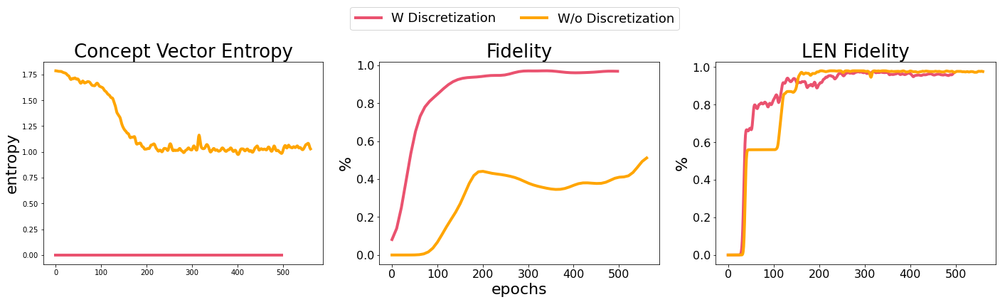

In [102]:
c2 = "orange"
c1 = "#ea526f"
c3 = "#A0E7E5"
c4 = "#B4F8C8"

title_size=26
lbel_size=22
line_size=4

fig = plt.figure(figsize=(20,3*2.2))



def smooth(v, k=5):
    from scipy.ndimage.filters import gaussian_filter1d

    return gaussian_filter1d(v, sigma=2)
    return np.convolve(v, np.ones(k), 'valid') / k


ax = plt.subplot(1,3,1)
ax.plot(smooth([e["concept_vector_entropy"].detach() for e in metrics[0].val_metrics]), label="W Discretization", color=c1, linewidth=line_size)
ax.plot(smooth([e["concept_vector_entropy"].detach() for e in metrics[1].val_metrics]), label="W/o Discretization", color=c2, linewidth=line_size)
#ax.plot(smooth([e["concept_vector_entropy"].detach() for e in metrics[2].val_metrics]), label="W CE loss 0.01", color=c3, linewidth=line_size)
#ax.plot(smooth([e["concept_vector_entropy"].detach() for e in metrics[3].val_metrics]), label="W CE loss 0.1", color=c4, linewidth=line_size)
#plt.legend()
ax.set_title("Concept Vector Entropy", size=title_size)
#plt.xlabel("epochs", size=15)
ax.set_ylabel("entropy", size=lbel_size)

ax = plt.subplot(1,3,2)
ax.plot(np.linspace(0, len([e["acc_overall"] for e in metrics[0].val_metrics]), num=len([e["logic_acc_clf"] for e in metrics[0].val_logic_metrics])), smooth([e["logic_acc_clf"] for e in metrics[0].val_logic_metrics]), label="W Discretization", color=c1, linewidth=line_size)
ax.plot(np.linspace(0, len([e["acc_overall"] for e in metrics[1].val_metrics]), num=len([e["logic_acc_clf"] for e in metrics[1].val_logic_metrics])), smooth([e["logic_acc_clf"] for e in metrics[1].val_logic_metrics]), label="W/o Discretization", color=c2, linewidth=line_size)
#ax.plot(np.linspace(0, len([e["acc_overall"] for e in metrics[2].val_metrics]), num=len([e["logic_acc_clf"] for e in metrics[2].val_logic_metrics])), smooth([e["logic_acc_clf"] for e in metrics[2].val_logic_metrics]), label="W CE loss 0.01", color=c3, linewidth=line_size)
#ax.plot(np.linspace(0, len([e["acc_overall"] for e in metrics[3].val_metrics]), num=len([e["logic_acc_clf"] for e in metrics[3].val_logic_metrics])), smooth([e["logic_acc_clf"] for e in metrics[3].val_logic_metrics]), label="W CE loss 0.1", color=c4, linewidth=line_size)
#plt.legend()
ax.set_title("Fidelity", size=title_size)
ax.set_ylabel("%", size=lbel_size)
ax.set_xlabel("epochs", size=lbel_size)
ax.tick_params(axis='both', which='major', labelsize=16)
#plt.savefig("accuracy_discretization_multishapes.pdf")
#plt.show()


ax = plt.subplot(1,3,3)  
ax.plot(smooth([e["acc_overall"] for e in metrics[0].val_metrics]), label="W Discretization", color=c1, linewidth=line_size)
ax.plot(smooth([e["acc_overall"] for e in metrics[1].val_metrics]), label="W/o Discretization", color=c2, linewidth=line_size)
#ax.plot(smooth([e["acc_overall"] for e in metrics[2].val_metrics]), label="W CE loss 0.01", color=c3, linewidth=line_size)
#ax.plot(smooth([e["acc_overall"] for e in metrics[3].val_metrics]), label="W CE loss 0.1", color=c4, linewidth=line_size)
#plt.legend()
ax.set_title("LEN Fidelity", size=title_size)
#ax.xlabel("epochs", size=15)
#ax.set_xlabel("epochs", size=lbel_size)
ax.set_ylabel("%", size=lbel_size)
ax.tick_params(axis='both', which='major', labelsize=16)
#plt.savefig("fidelity_discretization_multishapes.pdf")
#plt.show()


ax.tick_params(axis='both', which='major', labelsize=16)
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc=(0.35, 0.90), ncol=4, prop={'size': 18})

#plt.margins(x=15, y=5)
plt.subplots_adjust(bottom=0.2, left=0.05, right=0.98, top=0.8)
plt.savefig("discretization_multishapes.pdf")
plt.show()


# purity     = np.array([e["concept_purity"] for e in metrics[0].val_logic_metrics])
# std_purity = np.array([e["concept_purity_std"] for e in metrics[0].val_logic_metrics])
# plt.plot(np.linspace(0, len([e["acc_overall"] for e in metrics[0].val_metrics]), num=len(purity)), purity, label="W Discretization", color=c1, linewidth=3)
# plt.fill_between(np.linspace(0, len([e["acc_overall"] for e in metrics[0].val_metrics]), num=len(purity)), purity-std_purity, purity+std_purity, alpha=0.5, color=c1)

# purity     = np.array([e["concept_purity"] for e in metrics[1].val_logic_metrics])
# std_purity = np.array([e["concept_purity_std"] for e in metrics[1].val_logic_metrics])
# plt.plot(np.linspace(0, len([e["acc_overall"] for e in metrics[1].val_metrics]), num=len(purity)), purity, label="W/o Discretization", color=c2, linewidth=3)
# plt.fill_between(np.linspace(0, len([e["acc_overall"] for e in metrics[1].val_metrics]), num=len(purity)), purity-std_purity, purity+std_purity, alpha=0.5, color=c2)

# purity     = np.array([e["concept_purity"] for e in metrics[2].val_logic_metrics])
# std_purity = np.array([e["concept_purity_std"] for e in metrics[2].val_logic_metrics])
# plt.plot(np.linspace(0, len([e["acc_overall"] for e in metrics[2].val_metrics]), num=len(purity)), purity, label="W CE loss 0.01", color=c3, linewidth=3)
# plt.fill_between(np.linspace(0, len([e["acc_overall"] for e in metrics[2].val_metrics]), num=len(purity)), purity-std_purity, purity+std_purity, alpha=0.5, color=c3)

# purity     = np.array([e["concept_purity"] for e in metrics[3].val_logic_metrics])
# std_purity = np.array([e["concept_purity_std"] for e in metrics[3].val_logic_metrics])
# plt.plot(np.linspace(0, len([e["acc_overall"] for e in metrics[3].val_metrics]), num=len(purity)), purity, label="W CE loss 0.1", color=c4, linewidth=3)
# plt.fill_between(np.linspace(0, len([e["acc_overall"] for e in metrics[3].val_metrics]), num=len(purity)), purity-std_purity, purity+std_purity, alpha=0.5, color=c4)

# plt.legend()
# plt.title("Concept Purity", size=20)
# plt.xlabel("epochs", size=15)
# plt.ylabel("purity (%)", size=15)
# plt.savefig("purity_discretization_multishapes.pdf")
# plt.show()

## Confidence Intervals

(array([0., 1., 2., 3., 4., 5., 6., 7.], dtype=float32), array([121, 162, 157, 251,  78, 102,  73,  26], dtype=int64))


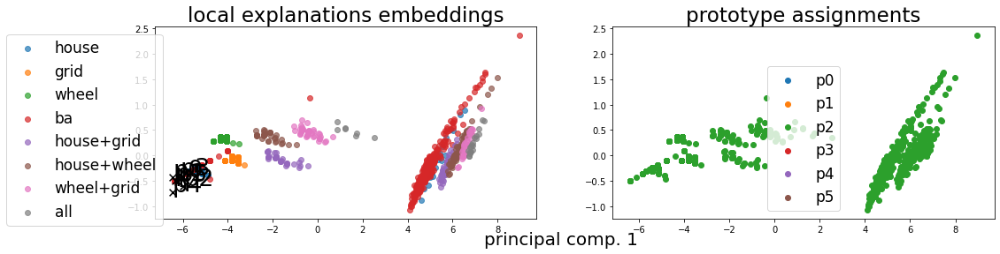

Alpha norms:
tensor([[0.9595, 1.0000, 0.9094, 0.7717, 0.9062, 0.8726],
        [0.8822, 0.8649, 0.8276, 1.0000, 0.9040, 0.7665]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.258763 +- 0.000000
Concept distribution:  (array([2], dtype=int64), array([970], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 0.24242, LEN: 0.088338, AccxC: 0.51, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.24877, V. LEN 0.10
  2: Loss: 0.18444, LEN: 0.087952, AccxC: 0.57, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.20241, V. LEN 0.10
  3: Loss: 0.15243, LEN: 0.087569, AccxC: 0.57, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.18477, V. LEN 0.10
  4: Loss: 0.14076, LEN: 0.087166, AccxC: 0.53, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.16889, V. LEN 0.10
  5: Loss: 0.12937, LEN: 0.086757, AccxC: 0.53, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.16472, V. LEN 0.10
  6: Loss: 0.12639, LEN: 0.086400, AccxC: 0.53, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.15684, V.

 75: Loss: 0.06338, LEN: 0.058811, AccxC: 0.79, AccO: 0.79, V. Acc: 0.82, V. Loss: 0.08027, V. LEN 0.07
 76: Loss: 0.06465, LEN: 0.060542, AccxC: 0.76, AccO: 0.76, V. Acc: 0.81, V. Loss: 0.07789, V. LEN 0.06
 77: Loss: 0.06354, LEN: 0.059571, AccxC: 0.76, AccO: 0.75, V. Acc: 0.86, V. Loss: 0.06814, V. LEN 0.06
 78: Loss: 0.06571, LEN: 0.060961, AccxC: 0.74, AccO: 0.74, V. Acc: 0.83, V. Loss: 0.07085, V. LEN 0.06
 79: Loss: 0.06460, LEN: 0.060666, AccxC: 0.75, AccO: 0.75, V. Acc: 0.82, V. Loss: 0.07396, V. LEN 0.06


 80: Loss: 0.06123, LEN: 0.057797, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07529, V. LEN 0.06
 81: Loss: 0.06148, LEN: 0.057936, AccxC: 0.76, AccO: 0.76, V. Acc: 0.83, V. Loss: 0.06903, V. LEN 0.06
 82: Loss: 0.06527, LEN: 0.061752, AccxC: 0.75, AccO: 0.75, V. Acc: 0.83, V. Loss: 0.06888, V. LEN 0.06
 83: Loss: 0.05978, LEN: 0.056423, AccxC: 0.77, AccO: 0.77, V. Acc: 0.85, V. Loss: 0.06898, V. LEN 0.06
 84: Loss: 0.06300, LEN: 0.058293, AccxC: 0.75, AccO: 0.75, V.

154: Loss: 0.02418, LEN: 0.023002, AccxC: 0.91, AccO: 0.91, V. Acc: 0.93, V. Loss: 0.02057, V. LEN 0.02
155: Loss: 0.02478, LEN: 0.023559, AccxC: 0.91, AccO: 0.91, V. Acc: 0.92, V. Loss: 0.02151, V. LEN 0.02
156: Loss: 0.02402, LEN: 0.022701, AccxC: 0.90, AccO: 0.90, V. Acc: 0.93, V. Loss: 0.01937, V. LEN 0.02
157: Loss: 0.02245, LEN: 0.021279, AccxC: 0.92, AccO: 0.92, V. Acc: 0.89, V. Loss: 0.02692, V. LEN 0.02
158: Loss: 0.02465, LEN: 0.023543, AccxC: 0.90, AccO: 0.90, V. Acc: 0.93, V. Loss: 0.01878, V. LEN 0.02
159: Loss: 0.02233, LEN: 0.021234, AccxC: 0.92, AccO: 0.92, V. Acc: 0.93, V. Loss: 0.02085, V. LEN 0.02


160: Loss: 0.02375, LEN: 0.022358, AccxC: 0.91, AccO: 0.91, V. Acc: 0.94, V. Loss: 0.01661, V. LEN 0.02
161: Loss: 0.02458, LEN: 0.023506, AccxC: 0.92, AccO: 0.92, V. Acc: 0.93, V. Loss: 0.01837, V. LEN 0.02
162: Loss: 0.02286, LEN: 0.021653, AccxC: 0.91, AccO: 0.91, V. Acc: 0.93, V. Loss: 0.01968, V. LEN 0.02
163: Loss: 0.02494, LEN: 0.023629, AccxC: 0.91, AccO: 0.91, V.

233: Loss: 0.01799, LEN: 0.017456, AccxC: 0.92, AccO: 0.92, V. Acc: 0.93, V. Loss: 0.01727, V. LEN 0.02
234: Loss: 0.02076, LEN: 0.020046, AccxC: 0.92, AccO: 0.92, V. Acc: 0.94, V. Loss: 0.01292, V. LEN 0.01
235: Loss: 0.01903, LEN: 0.018086, AccxC: 0.92, AccO: 0.92, V. Acc: 0.93, V. Loss: 0.01594, V. LEN 0.01
236: Loss: 0.02071, LEN: 0.020070, AccxC: 0.92, AccO: 0.92, V. Acc: 0.93, V. Loss: 0.01626, V. LEN 0.02
237: Loss: 0.01898, LEN: 0.018323, AccxC: 0.91, AccO: 0.91, V. Acc: 0.94, V. Loss: 0.01460, V. LEN 0.01
238: Loss: 0.02375, LEN: 0.023104, AccxC: 0.91, AccO: 0.91, V. Acc: 0.94, V. Loss: 0.01400, V. LEN 0.01
239: Loss: 0.01921, LEN: 0.018640, AccxC: 0.91, AccO: 0.91, V. Acc: 0.93, V. Loss: 0.01568, V. LEN 0.01


240: Loss: 0.01923, LEN: 0.018655, AccxC: 0.91, AccO: 0.91, V. Acc: 0.93, V. Loss: 0.01674, V. LEN 0.02
241: Loss: 0.02019, LEN: 0.019558, AccxC: 0.91, AccO: 0.85, V. Acc: 0.94, V. Loss: 0.01361, V. LEN 0.01
242: Loss: 0.02390, LEN: 0.023062, AccxC: 0.91, AccO: 0.90, V.

312: Loss: 0.01544, LEN: 0.015014, AccxC: 0.93, AccO: 0.93, V. Acc: 0.94, V. Loss: 0.01739, V. LEN 0.02
313: Loss: 0.01481, LEN: 0.014279, AccxC: 0.93, AccO: 0.91, V. Acc: 0.92, V. Loss: 0.01451, V. LEN 0.01
314: Loss: 0.01372, LEN: 0.013274, AccxC: 0.93, AccO: 0.92, V. Acc: 0.84, V. Loss: 0.02493, V. LEN 0.02
315: Loss: 0.02027, LEN: 0.019637, AccxC: 0.91, AccO: 0.88, V. Acc: 0.92, V. Loss: 0.01536, V. LEN 0.01
316: Loss: 0.01618, LEN: 0.015587, AccxC: 0.92, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.01707, V. LEN 0.02
317: Loss: 0.01769, LEN: 0.017226, AccxC: 0.93, AccO: 0.90, V. Acc: 0.90, V. Loss: 0.01651, V. LEN 0.02
318: Loss: 0.01636, LEN: 0.015883, AccxC: 0.93, AccO: 0.90, V. Acc: 0.89, V. Loss: 0.02057, V. LEN 0.02
319: Loss: 0.01455, LEN: 0.014117, AccxC: 0.93, AccO: 0.90, V. Acc: 0.90, V. Loss: 0.01631, V. LEN 0.02

------------------------------------------------------------------------------------
Has double activations  tensor(56)
But only for wrong predictions



-------------

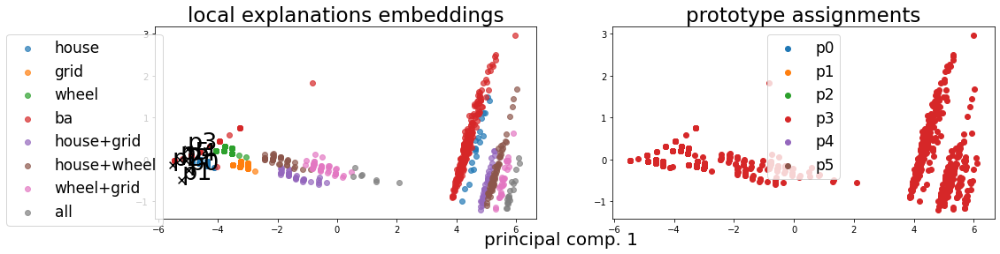

Alpha norms:
tensor([[0.7899, 1.0000, 0.9285, 0.6672, 0.7957, 0.6967],
        [0.8957, 0.7130, 0.8363, 0.8655, 0.8126, 1.0000]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.258763 +- 0.000000
Concept distribution:  (array([3], dtype=int64), array([970], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 0.20339, LEN: 0.077715, AccxC: 0.49, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.21442, V. LEN 0.09
  2: Loss: 0.17768, LEN: 0.077586, AccxC: 0.45, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.20121, V. LEN 0.09
  3: Loss: 0.16435, LEN: 0.077344, AccxC: 0.56, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.19371, V. LEN 0.09
  4: Loss: 0.15361, LEN: 0.077081, AccxC: 0.74, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.17257, V. LEN 0.09
  5: Loss: 0.13913, LEN: 0.077020, AccxC: 0.65, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.16500, V. LEN 0.09
  6: Loss: 0.12511, LEN: 0.076952, AccxC: 0.53, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.13670, V.

 77: Loss: 0.05113, LEN: 0.048535, AccxC: 0.81, AccO: 0.79, V. Acc: 0.85, V. Loss: 0.05279, V. LEN 0.05
 78: Loss: 0.06218, LEN: 0.059380, AccxC: 0.76, AccO: 0.73, V. Acc: 0.83, V. Loss: 0.06061, V. LEN 0.06
 79: Loss: 0.05592, LEN: 0.053407, AccxC: 0.78, AccO: 0.76, V. Acc: 0.79, V. Loss: 0.06859, V. LEN 0.06


 80: Loss: 0.05919, LEN: 0.056900, AccxC: 0.76, AccO: 0.73, V. Acc: 0.82, V. Loss: 0.05920, V. LEN 0.05
 81: Loss: 0.05195, LEN: 0.049582, AccxC: 0.80, AccO: 0.77, V. Acc: 0.82, V. Loss: 0.05796, V. LEN 0.05
 82: Loss: 0.05196, LEN: 0.049669, AccxC: 0.80, AccO: 0.78, V. Acc: 0.83, V. Loss: 0.05637, V. LEN 0.05
 83: Loss: 0.05226, LEN: 0.050143, AccxC: 0.79, AccO: 0.77, V. Acc: 0.82, V. Loss: 0.05544, V. LEN 0.05
 84: Loss: 0.05179, LEN: 0.049492, AccxC: 0.80, AccO: 0.78, V. Acc: 0.82, V. Loss: 0.05718, V. LEN 0.05
 85: Loss: 0.05066, LEN: 0.048706, AccxC: 0.80, AccO: 0.80, V. Acc: 0.83, V. Loss: 0.05612, V. LEN 0.05
 86: Loss: 0.05124, LEN: 0.049113, AccxC: 0.81, AccO: 0.79, V.

156: Loss: 0.02579, LEN: 0.025163, AccxC: 0.88, AccO: 0.84, V. Acc: 0.87, V. Loss: 0.02733, V. LEN 0.03
157: Loss: 0.02628, LEN: 0.025604, AccxC: 0.89, AccO: 0.85, V. Acc: 0.92, V. Loss: 0.01789, V. LEN 0.02
158: Loss: 0.03012, LEN: 0.029315, AccxC: 0.86, AccO: 0.85, V. Acc: 0.90, V. Loss: 0.03266, V. LEN 0.03
159: Loss: 0.02635, LEN: 0.025802, AccxC: 0.89, AccO: 0.87, V. Acc: 0.91, V. Loss: 0.02662, V. LEN 0.03


160: Loss: 0.02505, LEN: 0.024479, AccxC: 0.89, AccO: 0.85, V. Acc: 0.92, V. Loss: 0.01798, V. LEN 0.02
161: Loss: 0.02611, LEN: 0.025530, AccxC: 0.91, AccO: 0.87, V. Acc: 0.91, V. Loss: 0.03160, V. LEN 0.03
162: Loss: 0.02488, LEN: 0.024269, AccxC: 0.88, AccO: 0.86, V. Acc: 0.93, V. Loss: 0.01674, V. LEN 0.02
163: Loss: 0.02561, LEN: 0.024960, AccxC: 0.89, AccO: 0.87, V. Acc: 0.92, V. Loss: 0.02558, V. LEN 0.02
164: Loss: 0.02669, LEN: 0.026035, AccxC: 0.88, AccO: 0.86, V. Acc: 0.91, V. Loss: 0.02511, V. LEN 0.02
165: Loss: 0.02827, LEN: 0.027660, AccxC: 0.90, AccO: 0.88, V.

235: Loss: 0.01993, LEN: 0.019256, AccxC: 0.92, AccO: 0.90, V. Acc: 0.91, V. Loss: 0.02029, V. LEN 0.02
236: Loss: 0.01697, LEN: 0.016449, AccxC: 0.93, AccO: 0.93, V. Acc: 0.92, V. Loss: 0.02762, V. LEN 0.03
237: Loss: 0.01937, LEN: 0.018839, AccxC: 0.94, AccO: 0.94, V. Acc: 0.96, V. Loss: 0.01265, V. LEN 0.01
238: Loss: 0.02089, LEN: 0.020381, AccxC: 0.91, AccO: 0.91, V. Acc: 0.93, V. Loss: 0.01671, V. LEN 0.02
239: Loss: 0.01990, LEN: 0.019491, AccxC: 0.92, AccO: 0.92, V. Acc: 0.94, V. Loss: 0.01248, V. LEN 0.01


240: Loss: 0.01922, LEN: 0.018615, AccxC: 0.93, AccO: 0.93, V. Acc: 0.96, V. Loss: 0.01335, V. LEN 0.01
241: Loss: 0.02020, LEN: 0.019617, AccxC: 0.92, AccO: 0.92, V. Acc: 0.94, V. Loss: 0.01201, V. LEN 0.01
242: Loss: 0.01897, LEN: 0.018300, AccxC: 0.93, AccO: 0.93, V. Acc: 0.96, V. Loss: 0.01146, V. LEN 0.01
243: Loss: 0.01900, LEN: 0.018341, AccxC: 0.92, AccO: 0.92, V. Acc: 0.95, V. Loss: 0.01196, V. LEN 0.01
244: Loss: 0.01975, LEN: 0.019190, AccxC: 0.91, AccO: 0.91, V.

314: Loss: 0.01693, LEN: 0.016389, AccxC: 0.93, AccO: 0.93, V. Acc: 0.96, V. Loss: 0.01400, V. LEN 0.01
315: Loss: 0.01408, LEN: 0.013646, AccxC: 0.94, AccO: 0.94, V. Acc: 0.94, V. Loss: 0.01591, V. LEN 0.02
316: Loss: 0.01757, LEN: 0.017139, AccxC: 0.93, AccO: 0.93, V. Acc: 0.96, V. Loss: 0.01600, V. LEN 0.02
317: Loss: 0.01647, LEN: 0.016137, AccxC: 0.94, AccO: 0.94, V. Acc: 0.96, V. Loss: 0.01591, V. LEN 0.02
318: Loss: 0.01656, LEN: 0.016211, AccxC: 0.94, AccO: 0.94, V. Acc: 0.95, V. Loss: 0.01447, V. LEN 0.01
319: Loss: 0.01674, LEN: 0.016317, AccxC: 0.93, AccO: 0.93, V. Acc: 0.94, V. Loss: 0.02287, V. LEN 0.02


320: Loss: 0.01648, LEN: 0.016055, AccxC: 0.94, AccO: 0.94, V. Acc: 0.96, V. Loss: 0.01421, V. LEN 0.01
321: Loss: 0.01512, LEN: 0.014790, AccxC: 0.95, AccO: 0.95, V. Acc: 0.95, V. Loss: 0.01607, V. LEN 0.02
322: Loss: 0.01536, LEN: 0.015036, AccxC: 0.94, AccO: 0.94, V. Acc: 0.96, V. Loss: 0.01426, V. LEN 0.01
323: Loss: 0.01492, LEN: 0.014446, AccxC: 0.94, AccO: 0.94, V.

393: Loss: 0.01970, LEN: 0.019314, AccxC: 0.94, AccO: 0.94, V. Acc: 0.96, V. Loss: 0.01206, V. LEN 0.01
394: Loss: 0.01641, LEN: 0.016087, AccxC: 0.94, AccO: 0.94, V. Acc: 0.90, V. Loss: 0.01829, V. LEN 0.02
395: Loss: 0.01495, LEN: 0.014628, AccxC: 0.95, AccO: 0.95, V. Acc: 0.92, V. Loss: 0.01590, V. LEN 0.02
396: Loss: 0.01469, LEN: 0.014393, AccxC: 0.94, AccO: 0.94, V. Acc: 0.96, V. Loss: 0.01183, V. LEN 0.01
397: Loss: 0.01122, LEN: 0.010929, AccxC: 0.96, AccO: 0.96, V. Acc: 0.94, V. Loss: 0.01404, V. LEN 0.01
398: Loss: 0.01375, LEN: 0.013500, AccxC: 0.94, AccO: 0.94, V. Acc: 0.96, V. Loss: 0.01197, V. LEN 0.01
399: Loss: 0.01697, LEN: 0.016446, AccxC: 0.94, AccO: 0.94, V. Acc: 0.94, V. Loss: 0.01397, V. LEN 0.01


400: Loss: 0.01404, LEN: 0.013588, AccxC: 0.95, AccO: 0.95, V. Acc: 0.92, V. Loss: 0.01631, V. LEN 0.02
401: Loss: 0.01503, LEN: 0.014606, AccxC: 0.95, AccO: 0.95, V. Acc: 0.96, V. Loss: 0.01232, V. LEN 0.01
402: Loss: 0.01442, LEN: 0.014083, AccxC: 0.94, AccO: 0.94, V.

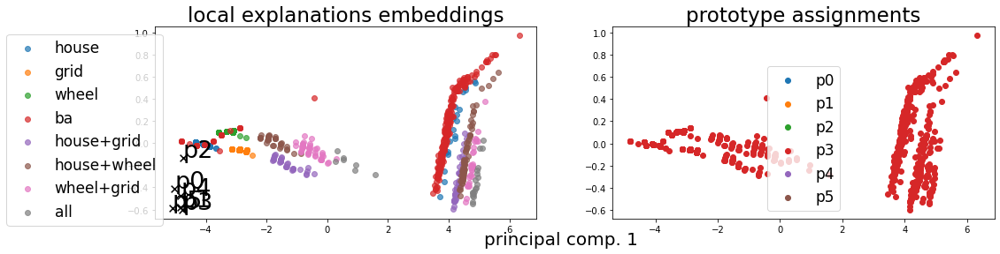

Alpha norms:
tensor([[0.8474, 0.8847, 0.7412, 0.8458, 0.6691, 1.0000],
        [0.8215, 0.7630, 0.8320, 0.9867, 0.8885, 1.0000]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.258763 +- 0.000000
Concept distribution:  (array([3], dtype=int64), array([970], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 0.25493, LEN: 0.075781, AccxC: 0.55, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.24627, V. LEN 0.09
  2: Loss: 0.19783, LEN: 0.075700, AccxC: 0.57, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.22489, V. LEN 0.09
  3: Loss: 0.17977, LEN: 0.075669, AccxC: 0.57, AccO: 0.32, V. Acc: 0.56, V. Loss: 0.21053, V. LEN 0.09
  4: Loss: 0.14697, LEN: 0.075540, AccxC: 0.59, AccO: 0.54, V. Acc: 0.46, V. Loss: 0.16344, V. LEN 0.09
  5: Loss: 0.11943, LEN: 0.075810, AccxC: 0.51, AccO: 0.29, V. Acc: 0.43, V. Loss: 0.14674, V. LEN 0.09
  6: Loss: 0.11612, LEN: 0.075672, AccxC: 0.53, AccO: 0.46, V. Acc: 0.57, V. Loss: 0.14025, V.

 77: Loss: 0.06643, LEN: 0.063077, AccxC: 0.75, AccO: 0.68, V. Acc: 0.82, V. Loss: 0.06999, V. LEN 0.06
 78: Loss: 0.06520, LEN: 0.061799, AccxC: 0.76, AccO: 0.68, V. Acc: 0.81, V. Loss: 0.06938, V. LEN 0.06
 79: Loss: 0.06439, LEN: 0.061535, AccxC: 0.76, AccO: 0.71, V. Acc: 0.81, V. Loss: 0.07147, V. LEN 0.06


 80: Loss: 0.06257, LEN: 0.059285, AccxC: 0.77, AccO: 0.72, V. Acc: 0.84, V. Loss: 0.06758, V. LEN 0.06
 81: Loss: 0.06366, LEN: 0.060437, AccxC: 0.76, AccO: 0.71, V. Acc: 0.80, V. Loss: 0.06617, V. LEN 0.06
 82: Loss: 0.06420, LEN: 0.061083, AccxC: 0.77, AccO: 0.68, V. Acc: 0.78, V. Loss: 0.07105, V. LEN 0.06
 83: Loss: 0.06174, LEN: 0.058824, AccxC: 0.79, AccO: 0.72, V. Acc: 0.81, V. Loss: 0.06735, V. LEN 0.06
 84: Loss: 0.06268, LEN: 0.059824, AccxC: 0.77, AccO: 0.72, V. Acc: 0.79, V. Loss: 0.06931, V. LEN 0.06
 85: Loss: 0.06453, LEN: 0.061283, AccxC: 0.75, AccO: 0.67, V. Acc: 0.79, V. Loss: 0.06864, V. LEN 0.06
 86: Loss: 0.06056, LEN: 0.057676, AccxC: 0.76, AccO: 0.70, V.

156: Loss: 0.02496, LEN: 0.023951, AccxC: 0.92, AccO: 0.92, V. Acc: 0.93, V. Loss: 0.02237, V. LEN 0.02
157: Loss: 0.02828, LEN: 0.027480, AccxC: 0.89, AccO: 0.89, V. Acc: 0.93, V. Loss: 0.02163, V. LEN 0.02
158: Loss: 0.02187, LEN: 0.021021, AccxC: 0.94, AccO: 0.94, V. Acc: 0.91, V. Loss: 0.02971, V. LEN 0.03
159: Loss: 0.02374, LEN: 0.023008, AccxC: 0.91, AccO: 0.91, V. Acc: 0.93, V. Loss: 0.02134, V. LEN 0.02


160: Loss: 0.02199, LEN: 0.021114, AccxC: 0.93, AccO: 0.93, V. Acc: 0.95, V. Loss: 0.02508, V. LEN 0.02
161: Loss: 0.02552, LEN: 0.024623, AccxC: 0.91, AccO: 0.91, V. Acc: 0.93, V. Loss: 0.02402, V. LEN 0.02
162: Loss: 0.02856, LEN: 0.027875, AccxC: 0.91, AccO: 0.91, V. Acc: 0.94, V. Loss: 0.02046, V. LEN 0.02
163: Loss: 0.02248, LEN: 0.021751, AccxC: 0.94, AccO: 0.94, V. Acc: 0.88, V. Loss: 0.04383, V. LEN 0.04
164: Loss: 0.02836, LEN: 0.027657, AccxC: 0.90, AccO: 0.90, V. Acc: 0.98, V. Loss: 0.01567, V. LEN 0.01
165: Loss: 0.02147, LEN: 0.020791, AccxC: 0.94, AccO: 0.94, V.

235: Loss: 0.01512, LEN: 0.014603, AccxC: 0.95, AccO: 0.95, V. Acc: 0.98, V. Loss: 0.00922, V. LEN 0.01
236: Loss: 0.01293, LEN: 0.012484, AccxC: 0.96, AccO: 0.96, V. Acc: 0.96, V. Loss: 0.01268, V. LEN 0.01
237: Loss: 0.01519, LEN: 0.014470, AccxC: 0.95, AccO: 0.95, V. Acc: 0.98, V. Loss: 0.00894, V. LEN 0.01
238: Loss: 0.01588, LEN: 0.015079, AccxC: 0.97, AccO: 0.97, V. Acc: 0.91, V. Loss: 0.02331, V. LEN 0.02
239: Loss: 0.02006, LEN: 0.019537, AccxC: 0.93, AccO: 0.93, V. Acc: 0.96, V. Loss: 0.01296, V. LEN 0.01


240: Loss: 0.01266, LEN: 0.012027, AccxC: 0.96, AccO: 0.96, V. Acc: 0.91, V. Loss: 0.02154, V. LEN 0.02
241: Loss: 0.01859, LEN: 0.018198, AccxC: 0.94, AccO: 0.94, V. Acc: 0.95, V. Loss: 0.01424, V. LEN 0.01
242: Loss: 0.01347, LEN: 0.013108, AccxC: 0.96, AccO: 0.96, V. Acc: 0.95, V. Loss: 0.01449, V. LEN 0.01
243: Loss: 0.01262, LEN: 0.012187, AccxC: 0.96, AccO: 0.96, V. Acc: 0.94, V. Loss: 0.01613, V. LEN 0.02
244: Loss: 0.01352, LEN: 0.013154, AccxC: 0.96, AccO: 0.96, V.

314: Loss: 0.01421, LEN: 0.013876, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.00856, V. LEN 0.01
315: Loss: 0.01588, LEN: 0.015527, AccxC: 0.96, AccO: 0.96, V. Acc: 0.90, V. Loss: 0.02191, V. LEN 0.02
316: Loss: 0.01194, LEN: 0.011589, AccxC: 0.96, AccO: 0.96, V. Acc: 0.97, V. Loss: 0.00984, V. LEN 0.01
317: Loss: 0.01226, LEN: 0.011890, AccxC: 0.97, AccO: 0.97, V. Acc: 0.91, V. Loss: 0.02000, V. LEN 0.02
318: Loss: 0.01639, LEN: 0.015940, AccxC: 0.96, AccO: 0.96, V. Acc: 0.97, V. Loss: 0.00959, V. LEN 0.01
319: Loss: 0.01403, LEN: 0.013570, AccxC: 0.95, AccO: 0.95, V. Acc: 0.95, V. Loss: 0.01428, V. LEN 0.01


320: Loss: 0.01282, LEN: 0.012421, AccxC: 0.97, AccO: 0.97, V. Acc: 0.97, V. Loss: 0.00985, V. LEN 0.01
321: Loss: 0.01717, LEN: 0.016825, AccxC: 0.94, AccO: 0.94, V. Acc: 0.97, V. Loss: 0.00990, V. LEN 0.01
322: Loss: 0.01494, LEN: 0.014498, AccxC: 0.96, AccO: 0.96, V. Acc: 0.93, V. Loss: 0.01682, V. LEN 0.02
323: Loss: 0.01137, LEN: 0.011029, AccxC: 0.96, AccO: 0.96, V.

393: Loss: 0.00982, LEN: 0.009478, AccxC: 0.98, AccO: 0.98, V. Acc: 0.96, V. Loss: 0.01039, V. LEN 0.01
394: Loss: 0.01083, LEN: 0.010572, AccxC: 0.96, AccO: 0.96, V. Acc: 0.96, V. Loss: 0.01044, V. LEN 0.01
395: Loss: 0.00996, LEN: 0.009602, AccxC: 0.97, AccO: 0.97, V. Acc: 0.97, V. Loss: 0.00929, V. LEN 0.01
396: Loss: 0.01138, LEN: 0.011068, AccxC: 0.97, AccO: 0.97, V. Acc: 0.95, V. Loss: 0.01305, V. LEN 0.01
397: Loss: 0.01181, LEN: 0.011538, AccxC: 0.96, AccO: 0.96, V. Acc: 0.95, V. Loss: 0.01289, V. LEN 0.01
398: Loss: 0.00964, LEN: 0.009313, AccxC: 0.97, AccO: 0.97, V. Acc: 0.97, V. Loss: 0.00898, V. LEN 0.01
399: Loss: 0.00954, LEN: 0.009199, AccxC: 0.98, AccO: 0.98, V. Acc: 0.93, V. Loss: 0.01778, V. LEN 0.02


400: Loss: 0.01004, LEN: 0.009794, AccxC: 0.96, AccO: 0.96, V. Acc: 0.96, V. Loss: 0.01011, V. LEN 0.01
401: Loss: 0.01029, LEN: 0.010005, AccxC: 0.97, AccO: 0.98, V. Acc: 0.96, V. Loss: 0.01139, V. LEN 0.01
402: Loss: 0.01069, LEN: 0.010316, AccxC: 0.97, AccO: 0.97, V.

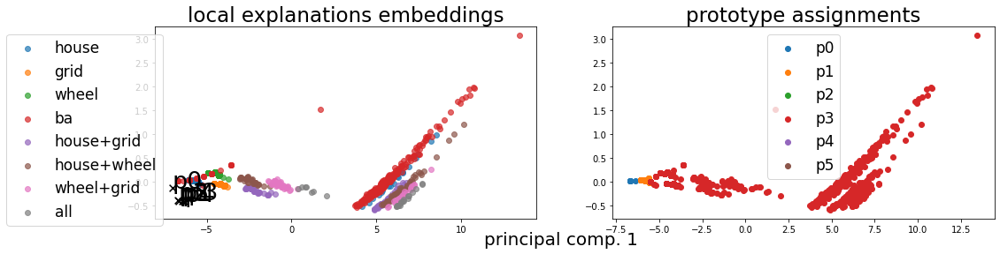

Alpha norms:
tensor([[0.8844, 1.0000, 0.8383, 0.8310, 0.8924, 0.8378],
        [0.9102, 0.8125, 1.0000, 0.8293, 0.8741, 0.8708]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.724432 +- 0.322247
Concept distribution:  (array([0, 1, 3], dtype=int64), array([  6, 101, 863], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 0.27823, LEN: 0.091232, AccxC: 0.55, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.28939, V. LEN 0.10
  2: Loss: 0.19665, LEN: 0.090748, AccxC: 0.55, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.21255, V. LEN 0.10
  3: Loss: 0.16206, LEN: 0.090249, AccxC: 0.55, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.19535, V. LEN 0.10
  4: Loss: 0.14569, LEN: 0.089762, AccxC: 0.54, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.18786, V. LEN 0.10
  5: Loss: 0.13278, LEN: 0.089423, AccxC: 0.52, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.18098, V. LEN 0.10
  6: Loss: 0.12811, LEN: 0.089151, AccxC: 0.47, AccO: 0.00, V. Acc: 0.00, V. L

 76: Loss: 0.06463, LEN: 0.060556, AccxC: 0.72, AccO: 0.70, V. Acc: 0.81, V. Loss: 0.06994, V. LEN 0.06
 77: Loss: 0.06371, LEN: 0.059754, AccxC: 0.76, AccO: 0.73, V. Acc: 0.83, V. Loss: 0.06880, V. LEN 0.06
 78: Loss: 0.06368, LEN: 0.059410, AccxC: 0.76, AccO: 0.74, V. Acc: 0.78, V. Loss: 0.07373, V. LEN 0.06
 79: Loss: 0.06206, LEN: 0.058126, AccxC: 0.77, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.07319, V. LEN 0.06

------------------------------------------------------------------------------------
Has double activations  tensor(27)
But only for wrong predictions



 80: Loss: 0.06387, LEN: 0.059778, AccxC: 0.75, AccO: 0.74, V. Acc: 0.73, V. Loss: 0.07473, V. LEN 0.07
 81: Loss: 0.06619, LEN: 0.062331, AccxC: 0.72, AccO: 0.69, V. Acc: 0.74, V. Loss: 0.07369, V. LEN 0.07
 82: Loss: 0.06472, LEN: 0.061262, AccxC: 0.74, AccO: 0.72, V. Acc: 0.77, V. Loss: 0.07113, V. LEN 0.06
 83: Loss: 0.06267, LEN: 0.058628, AccxC: 0.75, AccO: 0.73, V. Acc: 0.79, V. Loss: 0.06910, V. LEN 0.06
 84: Loss: 0.

154: Loss: 0.03159, LEN: 0.029906, AccxC: 0.85, AccO: 0.83, V. Acc: 0.89, V. Loss: 0.02955, V. LEN 0.03
155: Loss: 0.03149, LEN: 0.029702, AccxC: 0.85, AccO: 0.83, V. Acc: 0.86, V. Loss: 0.03437, V. LEN 0.03
156: Loss: 0.03557, LEN: 0.033780, AccxC: 0.80, AccO: 0.75, V. Acc: 0.89, V. Loss: 0.03193, V. LEN 0.03
157: Loss: 0.02873, LEN: 0.027009, AccxC: 0.91, AccO: 0.86, V. Acc: 0.90, V. Loss: 0.02855, V. LEN 0.03
158: Loss: 0.03002, LEN: 0.028379, AccxC: 0.91, AccO: 0.86, V. Acc: 0.93, V. Loss: 0.02297, V. LEN 0.02
159: Loss: 0.02986, LEN: 0.028131, AccxC: 0.89, AccO: 0.84, V. Acc: 0.90, V. Loss: 0.03037, V. LEN 0.03

------------------------------------------------------------------------------------
Has double activations  tensor(16)
But only for wrong predictions



160: Loss: 0.02996, LEN: 0.028319, AccxC: 0.90, AccO: 0.86, V. Acc: 0.90, V. Loss: 0.03306, V. LEN 0.03
161: Loss: 0.03192, LEN: 0.030296, AccxC: 0.89, AccO: 0.85, V. Acc: 0.90, V. Loss: 0.02821, V. LEN 0.03
162: Loss: 0.

223: Loss: 0.01839, LEN: 0.017760, AccxC: 0.92, AccO: 0.92, V. Acc: 0.98, V. Loss: 0.01081, V. LEN 0.01
224: Loss: 0.01587, LEN: 0.015341, AccxC: 0.93, AccO: 0.93, V. Acc: 0.98, V. Loss: 0.01037, V. LEN 0.01
225: Loss: 0.01441, LEN: 0.013816, AccxC: 0.95, AccO: 0.95, V. Acc: 0.92, V. Loss: 0.01661, V. LEN 0.02
226: Loss: 0.01732, LEN: 0.016739, AccxC: 0.94, AccO: 0.94, V. Acc: 0.97, V. Loss: 0.01119, V. LEN 0.01
227: Loss: 0.01549, LEN: 0.014901, AccxC: 0.96, AccO: 0.96, V. Acc: 0.90, V. Loss: 0.01874, V. LEN 0.02
228: Loss: 0.01727, LEN: 0.016523, AccxC: 0.93, AccO: 0.93, V. Acc: 0.98, V. Loss: 0.01111, V. LEN 0.01
229: Loss: 0.02005, LEN: 0.019484, AccxC: 0.94, AccO: 0.94, V. Acc: 0.93, V. Loss: 0.01531, V. LEN 0.01
230: Loss: 0.01599, LEN: 0.015272, AccxC: 0.96, AccO: 0.96, V. Acc: 0.89, V. Loss: 0.02078, V. LEN 0.02
231: Loss: 0.01970, LEN: 0.019019, AccxC: 0.93, AccO: 0.93, V. Acc: 0.98, V. Loss: 0.01006, V. LEN 0.01
232: Loss: 0.01570, LEN: 0.015031, AccxC: 0.95, AccO: 0.95, V. A

302: Loss: 0.01250, LEN: 0.011982, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.00964, V. LEN 0.01
303: Loss: 0.01075, LEN: 0.010291, AccxC: 0.97, AccO: 0.97, V. Acc: 0.97, V. Loss: 0.01190, V. LEN 0.01
304: Loss: 0.01160, LEN: 0.011233, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.00903, V. LEN 0.01
305: Loss: 0.01222, LEN: 0.011788, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.00859, V. LEN 0.01
306: Loss: 0.01187, LEN: 0.011415, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.00938, V. LEN 0.01
307: Loss: 0.01276, LEN: 0.012316, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.00957, V. LEN 0.01
308: Loss: 0.01255, LEN: 0.012118, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.00943, V. LEN 0.01
309: Loss: 0.01242, LEN: 0.011953, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.01000, V. LEN 0.01
310: Loss: 0.01160, LEN: 0.011029, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.00882, V. LEN 0.01
311: Loss: 0.01193, LEN: 0.011470, AccxC: 0.97, AccO: 0.97, V. A

381: Loss: 0.01328, LEN: 0.013007, AccxC: 0.96, AccO: 0.96, V. Acc: 0.90, V. Loss: 0.02423, V. LEN 0.02
382: Loss: 0.01130, LEN: 0.010933, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.00812, V. LEN 0.01
383: Loss: 0.01001, LEN: 0.009595, AccxC: 0.97, AccO: 0.97, V. Acc: 0.89, V. Loss: 0.02637, V. LEN 0.03
384: Loss: 0.01047, LEN: 0.010079, AccxC: 0.96, AccO: 0.96, V. Acc: 0.89, V. Loss: 0.02635, V. LEN 0.03
385: Loss: 0.01379, LEN: 0.013351, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.00992, V. LEN 0.01
386: Loss: 0.01497, LEN: 0.014645, AccxC: 0.95, AccO: 0.95, V. Acc: 0.93, V. Loss: 0.01862, V. LEN 0.02
387: Loss: 0.00947, LEN: 0.009047, AccxC: 0.97, AccO: 0.97, V. Acc: 0.97, V. Loss: 0.01220, V. LEN 0.01
388: Loss: 0.01124, LEN: 0.010854, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.00909, V. LEN 0.01
389: Loss: 0.01144, LEN: 0.011085, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.00859, V. LEN 0.01
390: Loss: 0.00942, LEN: 0.009098, AccxC: 0.97, AccO: 0.97, V. A



460: Loss: 0.01127, LEN: 0.010972, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.01025, V. LEN 0.01
461: Loss: 0.01075, LEN: 0.010400, AccxC: 0.97, AccO: 0.97, V. Acc: 0.95, V. Loss: 0.01568, V. LEN 0.01
462: Loss: 0.01282, LEN: 0.012513, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.00869, V. LEN 0.01
463: Loss: 0.01405, LEN: 0.013747, AccxC: 0.96, AccO: 0.96, V. Acc: 0.94, V. Loss: 0.01822, V. LEN 0.02
464: Loss: 0.00975, LEN: 0.009465, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.00880, V. LEN 0.01
465: Loss: 0.01243, LEN: 0.012056, AccxC: 0.97, AccO: 0.97, V. Acc: 0.97, V. Loss: 0.01097, V. LEN 0.01
466: Loss: 0.01091, LEN: 0.010602, AccxC: 0.96, AccO: 0.96, V. Acc: 0.97, V. Loss: 0.01224, V. LEN 0.01
467: Loss: 0.01212, LEN: 0.011817, AccxC: 0.97, AccO: 0.97, V. Acc: 0.98, V. Loss: 0.00862, V. LEN 0.01
468: Loss: 0.01096, LEN: 0.010574, AccxC: 0.97, AccO: 0.97, V. Acc: 0.86, V. Loss: 0.03214, V. LEN 0.03
469: Loss: 0.01261, LEN: 0.012164, AccxC: 0.95, AccO: 0.95, V.

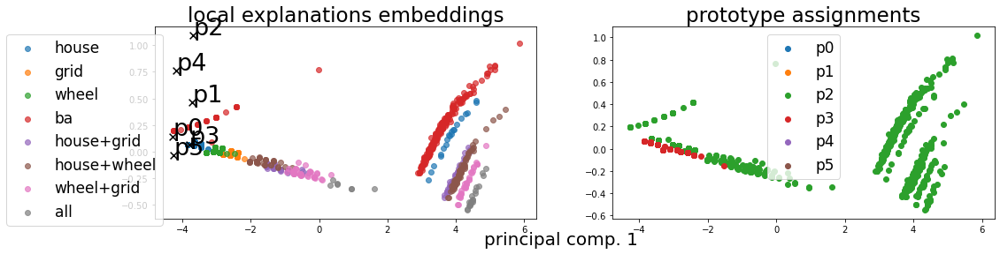

Alpha norms:
tensor([[0.9113, 0.7725, 0.9524, 0.9966, 1.0000, 0.9389],
        [0.6779, 0.8375, 1.0000, 0.8435, 0.9047, 0.7998]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.409917 +- 0.040255
Concept distribution:  (array([2, 3], dtype=int64), array([679, 291], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 0.25545, LEN: 0.082085, AccxC: 0.41, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.28372, V. LEN 0.09
  2: Loss: 0.21400, LEN: 0.081912, AccxC: 0.37, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.24105, V. LEN 0.09
  3: Loss: 0.16244, LEN: 0.081202, AccxC: 0.36, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.19043, V. LEN 0.09
  4: Loss: 0.15521, LEN: 0.080386, AccxC: 0.45, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.18896, V. LEN 0.09
  5: Loss: 0.13602, LEN: 0.080356, AccxC: 0.45, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.15958, V. LEN 0.09
  6: Loss: 0.12943, LEN: 0.080289, AccxC: 0.45, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.1

 76: Loss: 0.07941, LEN: 0.071587, AccxC: 0.63, AccO: 0.63, V. Acc: 0.62, V. Loss: 0.09233, V. LEN 0.08
 77: Loss: 0.07885, LEN: 0.071903, AccxC: 0.61, AccO: 0.61, V. Acc: 0.60, V. Loss: 0.09117, V. LEN 0.08
 78: Loss: 0.07951, LEN: 0.071552, AccxC: 0.60, AccO: 0.60, V. Acc: 0.62, V. Loss: 0.09235, V. LEN 0.08
 79: Loss: 0.07850, LEN: 0.071591, AccxC: 0.62, AccO: 0.62, V. Acc: 0.57, V. Loss: 0.09434, V. LEN 0.08


 80: Loss: 0.07808, LEN: 0.071591, AccxC: 0.59, AccO: 0.59, V. Acc: 0.56, V. Loss: 0.09799, V. LEN 0.08
 81: Loss: 0.07777, LEN: 0.070974, AccxC: 0.58, AccO: 0.58, V. Acc: 0.74, V. Loss: 0.09438, V. LEN 0.08
 82: Loss: 0.07752, LEN: 0.070038, AccxC: 0.68, AccO: 0.67, V. Acc: 0.74, V. Loss: 0.09368, V. LEN 0.08
 83: Loss: 0.07681, LEN: 0.070473, AccxC: 0.65, AccO: 0.65, V. Acc: 0.63, V. Loss: 0.08851, V. LEN 0.08
 84: Loss: 0.07863, LEN: 0.071764, AccxC: 0.60, AccO: 0.60, V. Acc: 0.56, V. Loss: 0.08855, V. LEN 0.08
 85: Loss: 0.07786, LEN: 0.071609, AccxC: 0.59, AccO: 0.59, V.

155: Loss: 0.06269, LEN: 0.060399, AccxC: 0.69, AccO: 0.65, V. Acc: 0.68, V. Loss: 0.06743, V. LEN 0.06
156: Loss: 0.06302, LEN: 0.060839, AccxC: 0.71, AccO: 0.66, V. Acc: 0.68, V. Loss: 0.06607, V. LEN 0.06
157: Loss: 0.06197, LEN: 0.059918, AccxC: 0.72, AccO: 0.65, V. Acc: 0.68, V. Loss: 0.06614, V. LEN 0.06
158: Loss: 0.06136, LEN: 0.059146, AccxC: 0.71, AccO: 0.65, V. Acc: 0.68, V. Loss: 0.06600, V. LEN 0.06
159: Loss: 0.06402, LEN: 0.062069, AccxC: 0.69, AccO: 0.64, V. Acc: 0.68, V. Loss: 0.06496, V. LEN 0.06


160: Loss: 0.06231, LEN: 0.060190, AccxC: 0.71, AccO: 0.65, V. Acc: 0.68, V. Loss: 0.06571, V. LEN 0.06
161: Loss: 0.06030, LEN: 0.058255, AccxC: 0.72, AccO: 0.68, V. Acc: 0.68, V. Loss: 0.06698, V. LEN 0.06
162: Loss: 0.06056, LEN: 0.058149, AccxC: 0.72, AccO: 0.67, V. Acc: 0.69, V. Loss: 0.06602, V. LEN 0.06
163: Loss: 0.06055, LEN: 0.058379, AccxC: 0.71, AccO: 0.66, V. Acc: 0.68, V. Loss: 0.06421, V. LEN 0.06
164: Loss: 0.06173, LEN: 0.059459, AccxC: 0.71, AccO: 0.66, V.

234: Loss: 0.01949, LEN: 0.018603, AccxC: 0.95, AccO: 0.95, V. Acc: 0.98, V. Loss: 0.01366, V. LEN 0.01
235: Loss: 0.01681, LEN: 0.015987, AccxC: 0.95, AccO: 0.95, V. Acc: 0.98, V. Loss: 0.01382, V. LEN 0.01
236: Loss: 0.01900, LEN: 0.018301, AccxC: 0.95, AccO: 0.95, V. Acc: 0.98, V. Loss: 0.01336, V. LEN 0.01
237: Loss: 0.01575, LEN: 0.014770, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.01353, V. LEN 0.01
238: Loss: 0.02231, LEN: 0.021574, AccxC: 0.94, AccO: 0.94, V. Acc: 0.98, V. Loss: 0.01310, V. LEN 0.01
239: Loss: 0.01775, LEN: 0.016862, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.01302, V. LEN 0.01


240: Loss: 0.02412, LEN: 0.023226, AccxC: 0.94, AccO: 0.94, V. Acc: 0.98, V. Loss: 0.01359, V. LEN 0.01
241: Loss: 0.01597, LEN: 0.014905, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.01339, V. LEN 0.01
242: Loss: 0.02491, LEN: 0.024202, AccxC: 0.92, AccO: 0.92, V. Acc: 0.98, V. Loss: 0.01341, V. LEN 0.01
243: Loss: 0.01980, LEN: 0.018936, AccxC: 0.96, AccO: 0.96, V.

313: Loss: 0.01505, LEN: 0.014569, AccxC: 0.95, AccO: 0.95, V. Acc: 0.98, V. Loss: 0.01058, V. LEN 0.01
314: Loss: 0.01568, LEN: 0.015186, AccxC: 0.95, AccO: 0.95, V. Acc: 0.98, V. Loss: 0.01062, V. LEN 0.01
315: Loss: 0.01773, LEN: 0.017255, AccxC: 0.95, AccO: 0.95, V. Acc: 0.98, V. Loss: 0.01058, V. LEN 0.01
316: Loss: 0.01504, LEN: 0.014552, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.01055, V. LEN 0.01
317: Loss: 0.01617, LEN: 0.015627, AccxC: 0.96, AccO: 0.96, V. Acc: 0.96, V. Loss: 0.01313, V. LEN 0.01
318: Loss: 0.01609, LEN: 0.015636, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.01086, V. LEN 0.01
319: Loss: 0.01418, LEN: 0.013708, AccxC: 0.95, AccO: 0.95, V. Acc: 0.98, V. Loss: 0.01038, V. LEN 0.01


320: Loss: 0.01661, LEN: 0.016148, AccxC: 0.95, AccO: 0.95, V. Acc: 0.98, V. Loss: 0.01031, V. LEN 0.01
321: Loss: 0.01538, LEN: 0.014927, AccxC: 0.95, AccO: 0.95, V. Acc: 0.98, V. Loss: 0.01094, V. LEN 0.01
322: Loss: 0.01763, LEN: 0.017135, AccxC: 0.95, AccO: 0.95, V.

392: Loss: 0.01708, LEN: 0.016717, AccxC: 0.95, AccO: 0.95, V. Acc: 0.96, V. Loss: 0.01286, V. LEN 0.01
393: Loss: 0.01691, LEN: 0.016369, AccxC: 0.96, AccO: 0.96, V. Acc: 0.96, V. Loss: 0.01249, V. LEN 0.01
394: Loss: 0.01904, LEN: 0.018675, AccxC: 0.95, AccO: 0.95, V. Acc: 0.97, V. Loss: 0.01769, V. LEN 0.02
395: Loss: 0.01556, LEN: 0.015052, AccxC: 0.95, AccO: 0.95, V. Acc: 0.96, V. Loss: 0.01309, V. LEN 0.01
396: Loss: 0.01420, LEN: 0.013838, AccxC: 0.95, AccO: 0.95, V. Acc: 0.96, V. Loss: 0.01957, V. LEN 0.02
397: Loss: 0.01417, LEN: 0.013794, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.01022, V. LEN 0.01
398: Loss: 0.01320, LEN: 0.012790, AccxC: 0.96, AccO: 0.96, V. Acc: 0.96, V. Loss: 0.01275, V. LEN 0.01
399: Loss: 0.01541, LEN: 0.015005, AccxC: 0.95, AccO: 0.95, V. Acc: 0.97, V. Loss: 0.01818, V. LEN 0.02


400: Loss: 0.02082, LEN: 0.020441, AccxC: 0.94, AccO: 0.94, V. Acc: 0.96, V. Loss: 0.01316, V. LEN 0.01
401: Loss: 0.02007, LEN: 0.019630, AccxC: 0.94, AccO: 0.94, V.

471: Loss: 0.01220, LEN: 0.011916, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.00965, V. LEN 0.01
472: Loss: 0.01109, LEN: 0.010793, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.00946, V. LEN 0.01
473: Loss: 0.01233, LEN: 0.011980, AccxC: 0.96, AccO: 0.96, V. Acc: 0.97, V. Loss: 0.01124, V. LEN 0.01
474: Loss: 0.01501, LEN: 0.014707, AccxC: 0.95, AccO: 0.95, V. Acc: 0.98, V. Loss: 0.00934, V. LEN 0.01
475: Loss: 0.01184, LEN: 0.011559, AccxC: 0.96, AccO: 0.96, V. Acc: 0.96, V. Loss: 0.01188, V. LEN 0.01
476: Loss: 0.01147, LEN: 0.011179, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.00941, V. LEN 0.01
477: Loss: 0.01550, LEN: 0.015202, AccxC: 0.95, AccO: 0.95, V. Acc: 0.96, V. Loss: 0.01250, V. LEN 0.01
478: Loss: 0.01366, LEN: 0.013326, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.00968, V. LEN 0.01
479: Loss: 0.01144, LEN: 0.011188, AccxC: 0.96, AccO: 0.96, V. Acc: 0.97, V. Loss: 0.01088, V. LEN 0.01


480: Loss: 0.01171, LEN: 0.011417, AccxC: 0.97, AccO: 0.97, V.

550: Loss: 0.01372, LEN: 0.013443, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.00923, V. LEN 0.01
551: Loss: 0.01334, LEN: 0.013101, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.00915, V. LEN 0.01
552: Loss: 0.01295, LEN: 0.012655, AccxC: 0.95, AccO: 0.95, V. Acc: 0.96, V. Loss: 0.01206, V. LEN 0.01
553: Loss: 0.01377, LEN: 0.013544, AccxC: 0.95, AccO: 0.95, V. Acc: 0.96, V. Loss: 0.01229, V. LEN 0.01
554: Loss: 0.01193, LEN: 0.011665, AccxC: 0.96, AccO: 0.96, V. Acc: 0.96, V. Loss: 0.01193, V. LEN 0.01
555: Loss: 0.01408, LEN: 0.013881, AccxC: 0.95, AccO: 0.95, V. Acc: 0.97, V. Loss: 0.01086, V. LEN 0.01
556: Loss: 0.01149, LEN: 0.011260, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.00948, V. LEN 0.01
557: Loss: 0.01502, LEN: 0.014787, AccxC: 0.96, AccO: 0.96, V. Acc: 0.98, V. Loss: 0.00943, V. LEN 0.01
558: Loss: 0.01285, LEN: 0.012622, AccxC: 0.96, AccO: 0.96, V. Acc: 0.96, V. Loss: 0.01193, V. LEN 0.01
559: Loss: 0.01152, LEN: 0.011293, AccxC: 0.97, AccO: 0.97, V. A

629: Loss: 0.01603, LEN: 0.015809, AccxC: 0.93, AccO: 0.93, V. Acc: 0.95, V. Loss: 0.01250, V. LEN 0.01
630: Loss: 0.01425, LEN: 0.014022, AccxC: 0.94, AccO: 0.94, V. Acc: 0.95, V. Loss: 0.01230, V. LEN 0.01
631: Loss: 0.01288, LEN: 0.012655, AccxC: 0.94, AccO: 0.94, V. Acc: 0.95, V. Loss: 0.01263, V. LEN 0.01
632: Loss: 0.01404, LEN: 0.013876, AccxC: 0.94, AccO: 0.94, V. Acc: 0.95, V. Loss: 0.01260, V. LEN 0.01
633: Loss: 0.01392, LEN: 0.013733, AccxC: 0.94, AccO: 0.94, V. Acc: 0.95, V. Loss: 0.01268, V. LEN 0.01
634: Loss: 0.01388, LEN: 0.013722, AccxC: 0.94, AccO: 0.94, V. Acc: 0.95, V. Loss: 0.01263, V. LEN 0.01
635: Loss: 0.01492, LEN: 0.014640, AccxC: 0.94, AccO: 0.94, V. Acc: 0.95, V. Loss: 0.01277, V. LEN 0.01
636: Loss: 0.01576, LEN: 0.015254, AccxC: 0.93, AccO: 0.93, V. Acc: 0.96, V. Loss: 0.01159, V. LEN 0.01
637: Loss: 0.01765, LEN: 0.017432, AccxC: 0.93, AccO: 0.93, V. Acc: 0.94, V. Loss: 0.01388, V. LEN 0.01
638: Loss: 0.01572, LEN: 0.015532, AccxC: 0.93, AccO: 0.93, V. A

In [88]:
expls = []
for ITERATION_NUM in range(5):
    batch_sampler = utils.GroupBatchSampler(num_input_graphs=128, drop_last=False, belonging=np.array(belonging_train))
    train_group_loader = DataLoader(dataset_train, batch_sampler=batch_sampler)

    batch_sampler = utils.GroupBatchSampler(num_input_graphs=256, drop_last=False, belonging=np.array(belonging_val))
    val_group_loader = DataLoader(dataset_val, batch_sampler=batch_sampler)

    batch_sampler = utils.GroupBatchSampler(num_input_graphs=256, drop_last=False, belonging=np.array(belonging_test))
    test_group_loader = DataLoader(dataset_test, batch_sampler=batch_sampler)


    torch.manual_seed(42 + 10*ITERATION_NUM)
    hyper = {
        "len_lr": 0.0005,
        "proto_lr": 0.001,
        "le_emb_lr": 0.001,
        "coeff_divloss": 0.000,
        "coeff_pdist": 0.,
        "coeff_gae": 0.,
        "coeff_r1": 0.09,
        "coeff_r2": 0.00099,
        "coeff_ce": 0.0,
        "coeff_de": 0.,
        "coeff_logic_loss": 0.00,
        "focal_gamma": 2, #3
        "focal_alpha": -1,
        "ts": 1,
        "te": 1,
        "focal_loss": True,
        "debug_prototypes": False,
        "num_prototypes": 6,
        "dim_prototypes": 10,
        "num_le_features": 5,
        "activation": "leaky",
        "assign_func": "straight_sim",
        "LEN_temperature": 1,
        "remove_attention": True,
        "log_images": True,
        "log_models": True,
        "num_epochs": 2000
    }

    len_model    = models.LEN(hyper["num_prototypes"], 
                              hyper["LEN_temperature"], 
                              remove_attention=hyper["remove_attention"]).to(device)
    le_model     = models.LEEmbedder(num_features=hyper["num_le_features"], 
                                     activation=hyper["activation"], 
                                     num_hidden=hyper["dim_prototypes"]).to(device)
    expl         = models.GlobalExplainer(len_model, 
                                   le_model, 
                                   train_group_loader, 
                                   val_group_loader, 
                                   device, 
                                   hyper_params=hyper,
                                   classes_names=bamultishapes_classes_names,
                                   dataset_name=DATASET_NAME).to(device)
    expl.iterate(num_epochs=hyper["num_epochs"], log_wandb=False, name_wandb=ITERATION_NUM)
    expls.append(expl)
    
    #with open(f'../logs/model_focal_{use_focal}_BAMultiShapes.pkl', 'wb') as handle:
    #    pickle.dump(expl, handle)

In [100]:
import numpy as np
sa = [0.92, 0.93, 0.99, 0.99, 0.99]
np.mean(sa) , np.std(sa)

(0.9640000000000001, 0.03199999999999997)

In [118]:
print("Fidelity:")
for i , m in enumerate(expls):
    print("\t", [e["acc_overall"] for e in m.val_metrics][m.early_stopping.best_epoch-1].item(), " @ ", m.early_stopping.best_epoch)
    
for i , m in enumerate(expls):
    m.inspect_embedding(test_group_loader)

Fidelity:
	 0.9399999976158142  @  234
	 0.949999988079071  @  327
	 0.9800000190734863  @  341
	 0.9800000190734863  @  374
	 0.9800000190734863  @  549


RuntimeError: mat1 and mat2 shapes cannot be multiplied (454x14 and 5x20)

,count,mean,std,min,25%,50%,75%,max,Median
0,5.0,0.9892,0.01862,0.957,0.989,1.0,1.0,1.0,1.0


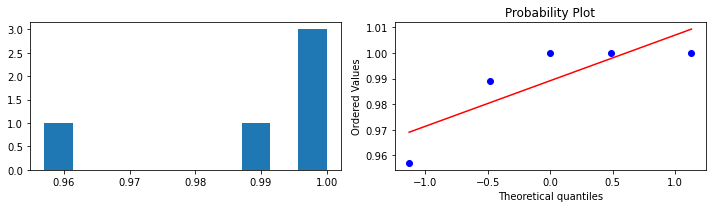

In [24]:
from scipy import stats
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

x = [0.9899, 0.9899, 0.9899, 0.9899, 0.9899]


# plot
fig, axes = plt.subplots(1, 2, figsize=(10, 3))
axes[0].hist(x)
stats.probplot(x, dist=stats.norm, plot=axes[1])
fig.tight_layout()

# summary statistics
df = pd.DataFrame(x).describe().T
df['Median'] = np.median(x)
df

,count,mean,std,min,25%,50%,75%,max,Median
0,5.0,-0.004302,0.006266,-0.013777,-0.007733,0.0,0.0,0.0,0.0


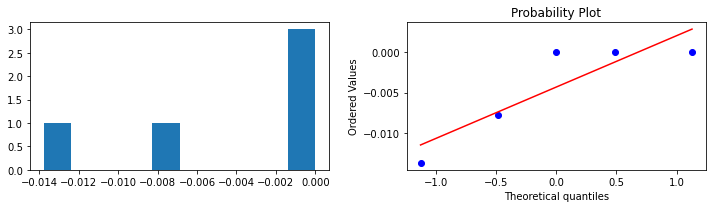

In [25]:
# box-cox transform
xt, lmbda = stats.boxcox(x)

# plot
fig, axes = plt.subplots(1, 2, figsize=(10, 3))
axes[0].hist(xt)
stats.probplot(xt, dist=stats.norm, plot=axes[1])
fig.tight_layout()

# summary statistics
df = pd.DataFrame(xt).describe().T
df['Median'] = np.median(xt)
df

In [27]:
lo_xt, hi_xt = stats.t.interval(1 - 0.05, len(xt) - 1, loc=np.mean(xt), scale=stats.sem(xt))
(lo_xt, hi_xt)

(-0.012082553989301182, 0.0034786850765962107)

In [28]:
from scipy.special import inv_boxcox

# inverse transform
lo_x, hi_x = inv_boxcox(lo_xt, lmbda), inv_boxcox(hi_xt, lmbda)

(lo_x, hi_x)

(0.9742673576187272, 1.0031222930494488)

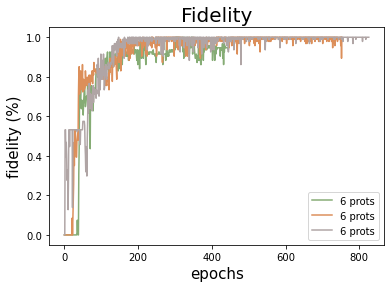

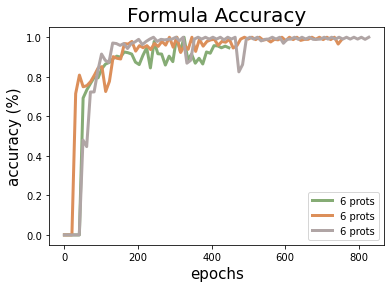

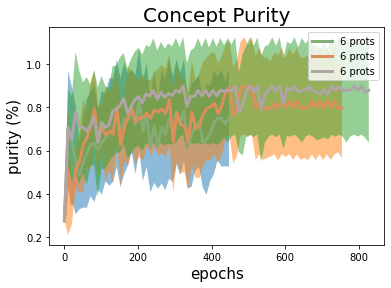

In [16]:
cs = ["#86ac75", "#dc8f5a", "#b0a5a5", "#ea526f", "blue"]

c = 0
for i , m in enumerate(expls):
    plt.plot([e["acc_overall"] for e in m.val_metrics], label=f"{m.hyper['num_prototypes']} prots", color=cs[c])
    c += 1
plt.legend()
plt.title("Fidelity", size=20)
plt.xlabel("epochs", size=15)
plt.ylabel("fidelity (%)", size=15)
plt.savefig("fidelity_num_proto_bamultishapes.pdf")
plt.show()

c = 0
for i , m in enumerate(expls):
    plt.plot(np.linspace(0, len([e["acc_overall"] for e in m.val_metrics]), num=len([e["logic_acc_clf"] for e in m.val_logic_metrics])), [e["logic_acc_clf"] for e in m.val_logic_metrics], label=f"{m.hyper['num_prototypes']} prots", linewidth=3, color=cs[c])
    c += 1
plt.legend()
plt.title("Formula Accuracy", size=20)
plt.xlabel("epochs", size=15)
plt.ylabel("accuracy (%)", size=15)
plt.savefig("acc_num_proto_bamultishapes.pdf")
plt.show()

c = 0
for i , m in enumerate(expls):
    purity     = np.array([e["concept_purity"] for e in m.val_logic_metrics])
    std_purity = np.array([e["concept_purity_std"] for e in m.val_logic_metrics])
    plt.plot(np.linspace(0, len([e["acc_overall"] for e in m.val_metrics]), num=len(purity)), purity, label=f"{m.hyper['num_prototypes']} prots", linewidth=3, color=cs[c])
    plt.fill_between(np.linspace(0, len([e["acc_overall"] for e in m.val_metrics]), num=len([e["logic_acc_clf"] for e in m.val_logic_metrics])), purity-std_purity, purity+std_purity, alpha=0.5)
    c += 1

plt.legend()
plt.title("Concept Purity", size=20)
plt.xlabel("epochs", size=15)
plt.ylabel("purity (%)", size=15)
plt.savefig("purity_num_proto_bamultishapes.pdf")
plt.show()

# MUTAG

In [140]:
DATASET_NAME = "Mutag"

In [146]:
adjs_train , \
edge_weights_train , \
ori_adjs_train , \
ori_classes_train , \
belonging_train , \
summary_predictions_train , \
le_classes_train ,\
embeddings_train = read_mutagenicity(evaluate_method=False, 
                                     manual_cut=0.37731856, #0.42392886
                                     split="TRAIN")

print(np.unique(le_classes_train, return_counts=True))

belonging_train2 = np.array(belonging_train)
le_classes_train = np.array(le_classes_train)
c = 0
for b in np.unique(belonging_train):
    if ori_classes_train[b] == 1 and 0 in le_classes_train[belonging_train2 == b]:
        c += 1
print("Samples of class 1 containing NO2: ", c/len(ori_classes_train))
c = 0
for b in np.unique(belonging_train):
    if ori_classes_train[b] == 0 and 0 not in le_classes_train[belonging_train2 == b]:
        c += 1
print("Samples of class 0 not containing NO2: ", c/len(ori_classes_train))

print(len(adjs_train) , len(edge_weights_train), len(ori_adjs_train) , len(ori_classes_train) , len(belonging_train))
np.unique(summary_predictions_train["wrong"], return_counts=True) , np.unique(summary_predictions_train["correct"], return_counts=True)

This is a NH2 local explanation
This is a NH2 local explanation
(array([0, 1]), array([675, 451], dtype=int64))
Samples of class 1 containing NO2:  0.0
Samples of class 0 not containing NO2:  0.0
1126 1126 797 797 1126


((array([], dtype=float64), array([], dtype=int64)),
 (array([0, 1]), array([1921, 1548], dtype=int64)))

In [147]:
adjs_val , \
edge_weights_val , \
ori_adjs_val , \
ori_classes_val , \
belonging_val , \
summary_predictions_val , \
le_classes_val ,\
embeddings_val = read_mutagenicity(evaluate_method=False, 
                                   manual_cut=0.37731856,
                                   split="VAL")

print(np.unique(le_classes_val, return_counts=True))

belonging_val2 = np.array(belonging_val)
le_classes_val = np.array(le_classes_val)
c = 0
for b in np.unique(belonging_val):
    if ori_classes_val[b] == 1 and 0 in le_classes_val[belonging_val2 == b]:
        c += 1
print("Samples of class 1 containing NO2: ", c/len(ori_classes_val))
c = 0
for b in np.unique(belonging_val):
    if ori_classes_val[b] == 0 and 0 not in le_classes_val[belonging_val2 == b]:
        c += 1
print("Samples of class 0 not containing NO2: ", c/len(ori_classes_val))

print(len(adjs_val) , len(edge_weights_val), len(ori_adjs_val) , len(ori_classes_val) , len(belonging_val))
np.unique(summary_predictions_val["wrong"], return_counts=True) , np.unique(summary_predictions_val["correct"], return_counts=True)

(array([0, 1]), array([93, 62], dtype=int64))
Samples of class 1 containing NO2:  0.0
Samples of class 0 not containing NO2:  0.0
155 155 105 105 155


((array([], dtype=float64), array([], dtype=int64)),
 (array([0, 1]), array([245, 189], dtype=int64)))

In [148]:
adjs_test , \
edge_weights_test , \
ori_adjs_test , \
ori_classes_test , \
belonging_test , \
summary_predictions_test , \
le_classes_test ,\
embeddings_test = read_mutagenicity(evaluate_method=False, 
                                   manual_cut=0.37731856,
                                   split="TEST")

print(np.unique(le_classes_test, return_counts=True))

belonging_test2 = np.array(belonging_test)
le_classes_test = np.array(le_classes_test)
c = 0
for b in np.unique(belonging_test):
    if ori_classes_test[b] == 1 and 0 in le_classes_test[belonging_test2 == b]:
        c += 1
print("Samples of class 1 containing NO2: ", c/len(ori_classes_test))
c = 0
for b in np.unique(belonging_test):
    if ori_classes_test[b] == 0 and 0 not in le_classes_test[belonging_test2 == b]:
        c += 1
print("Samples of class 0 not containing NO2: ", c/len(ori_classes_test))

print(len(adjs_test) , len(edge_weights_test), len(ori_adjs_test) , len(ori_classes_test) , len(belonging_test))
np.unique(summary_predictions_test["wrong"], return_counts=True) , np.unique(summary_predictions_test["correct"], return_counts=True)

(array([0, 1]), array([74, 65], dtype=int64))
Samples of class 1 containing NO2:  0.0
Samples of class 0 not containing NO2:  0.0
139 139 98 98 139


((array([], dtype=float64), array([], dtype=int64)),
 (array([0, 1]), array([235, 199], dtype=int64)))

C:\Users\Steve\Desktop\GNN\gnn_logic_global_expl\code\utils.py:51: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  edge_attr=torch.tensor(t.weight).reshape(-1, 1),


(array([0, 1]), array([675, 451], dtype=int64))
(tensor([0, 1]), tensor([766, 360]))


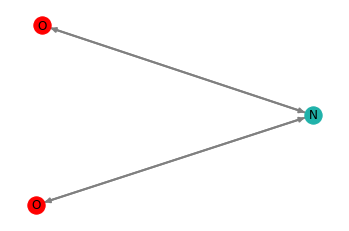

(15, tensor([15]))

In [149]:
device = "cpu" #torch.device('cuda' if torch.cuda.is_available() else 'cpu')
transform = None  

dataset_train = utils.LocalExplanationsDataset("", adjs_train, edge_weights_test, "embeddings", transform=transform, y=le_classes_train, belonging=belonging_train, task_y=ori_classes_train, precomputed_embeddings=embeddings_train)
dataset_val = utils.LocalExplanationsDataset("", adjs_val, edge_weights_val, "embeddings", transform=transform, y=le_classes_val, belonging=belonging_val, task_y=ori_classes_val, precomputed_embeddings=embeddings_val)
dataset_test = utils.LocalExplanationsDataset("", adjs_test, edge_weights_test, "embeddings", transform=transform, y=le_classes_test, belonging=belonging_test, task_y=ori_classes_test, precomputed_embeddings=embeddings_test)


##
# debug Dataset
##
print(np.unique(le_classes_train, return_counts=True))
print(torch.unique(dataset_train.data.task_y, return_counts=True))
idx = 18
utils.plot_molecule(dataset_train[idx])
belonging_train[idx] , dataset_train[idx].graph_id

(array([0., 1.], dtype=float32), array([675, 451], dtype=int64))


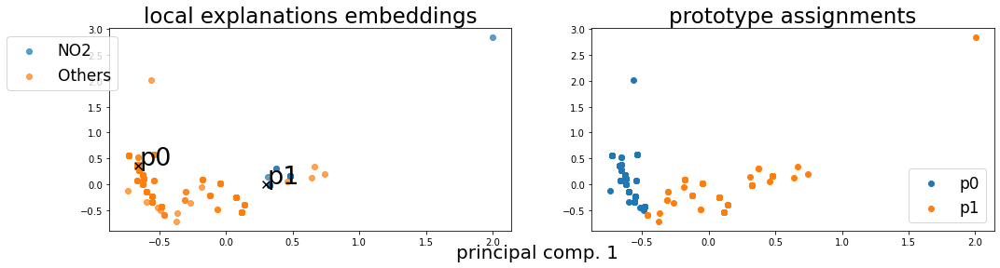

Alpha norms:
tensor([[0.9823, 1.0000],
        [1.0000, 0.4271]], grad_fn=<DivBackward0>)
Concept Purity: 0.957938 +- 0.042062
Concept distribution:  (array([0, 1], dtype=int64), array([389, 737], dtype=int64))
Logic formulas:
For class 0:
0.7867001254705144 (feature001) | ((feature000 & feature001)
For class 1:
0.7867001254705144 (feature000)
Accuracy as classifier:  0.7867
LEN fidelity:  tensor(0.7867)

(array([0., 1.], dtype=float32), array([675, 451], dtype=int64))


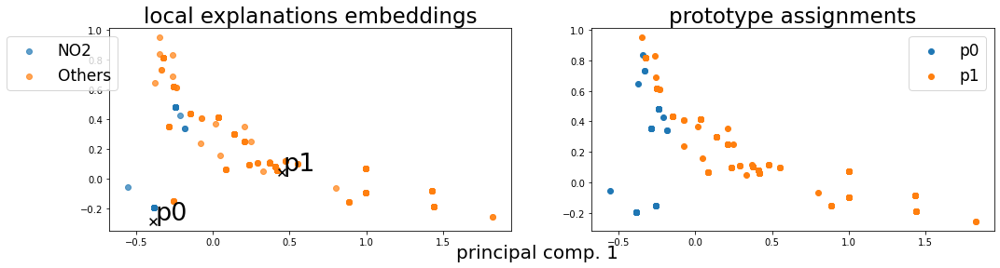

Alpha norms:
tensor([[1.0000, 0.9934],
        [0.9752, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.989130 +- 0.010870
Concept distribution:  (array([0, 1], dtype=int64), array([690, 436], dtype=int64))
Logic formulas:
For class 0:
0.7879548306148055 (feature000) | ((feature001 & feature000)
For class 1:
0.7879548306148055 (feature001)
Accuracy as classifier:  0.788
LEN fidelity:  tensor(0.7880)

(array([0., 1.], dtype=float32), array([675, 451], dtype=int64))


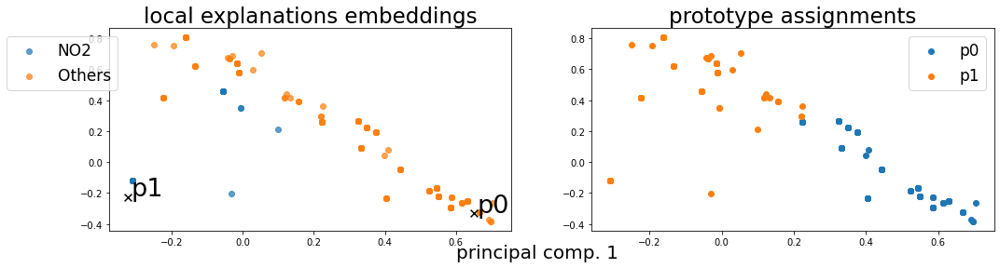

Alpha norms:
tensor([[1.0000, 0.8461],
        [1.0000, 0.8671]], grad_fn=<DivBackward0>)
Concept Purity: 0.960437 +- 0.039563
Concept distribution:  (array([0, 1], dtype=int64), array([393, 733], dtype=int64))
Logic formulas:
For class 0:
0.7879548306148055 ((feature001) | ((feature001 & feature000)
For class 1:
0.7879548306148055 (feature000)
Accuracy as classifier:  0.788
LEN fidelity:  tensor(0.7880)

(array([0., 1.], dtype=float32), array([675, 451], dtype=int64))


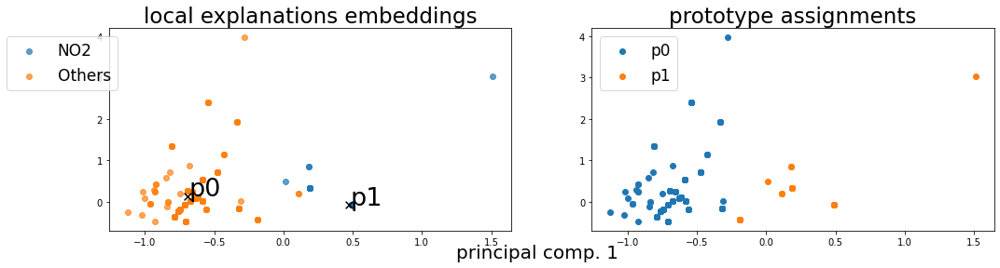

Alpha norms:
tensor([[0.6318, 1.0000],
        [0.3954, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.994143 +- 0.005857
Concept distribution:  (array([0, 1], dtype=int64), array([443, 683], dtype=int64))
Logic formulas:
For class 0:
0.7841907151819323 (feature001) | ((feature000 & feature001)
For class 1:
0.7841907151819323 ((feature000)
Accuracy as classifier:  0.7842
LEN fidelity:  tensor(0.7842)

(array([0., 1.], dtype=float32), array([675, 451], dtype=int64))


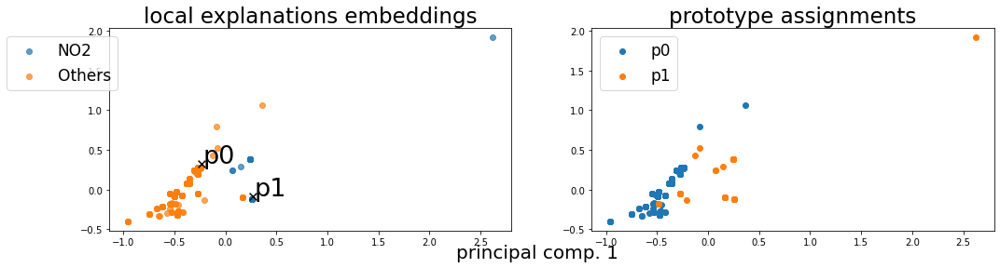

Alpha norms:
tensor([[1.0000, 0.9514],
        [0.6670, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.988423 +- 0.011577
Concept distribution:  (array([0, 1], dtype=int64), array([435, 691], dtype=int64))
Logic formulas:
For class 0:
0.7879548306148055 ((feature001) | ((feature001 & feature000)
For class 1:
0.7879548306148055 ((feature000)
Accuracy as classifier:  0.788
LEN fidelity:  tensor(0.7880)



In [150]:
batch_sampler = utils.GroupBatchSampler(num_input_graphs=128, drop_last=False, belonging=np.array(belonging_train))
train_group_loader = DataLoader(dataset_train, batch_sampler=batch_sampler)

batch_sampler = utils.GroupBatchSampler(num_input_graphs=256, drop_last=False, belonging=np.array(belonging_val))
val_group_loader = DataLoader(dataset_val, batch_sampler=batch_sampler)

batch_sampler = utils.GroupBatchSampler(num_input_graphs=256, drop_last=False, belonging=np.array(belonging_test))
test_group_loader = DataLoader(dataset_test, batch_sampler=batch_sampler)


with open(f'mutagenicity_confidence_intervals.pkl', 'rb') as handle:
    mutag_expls = pickle.load(handle)
    
for e in mutag_expls:
    e.inspect_embedding(train_group_loader)

In [151]:
sa = [0.7867, 0.788, 0.788, 0.784, 0.788]
np.std(sa)

0.0015538339679644062

### Ablation on Focal loss

(array([0., 1.], dtype=float32), array([619, 400], dtype=int64))


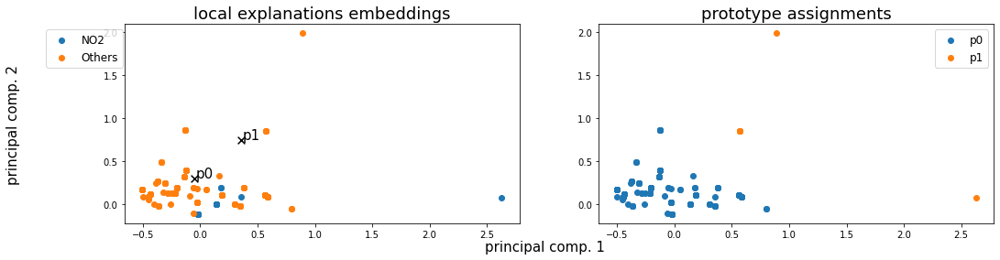

Alpha norms:
tensor([[1.0000, 0.9355],
        [0.9896, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.721701 +- 0.111632
Concept distribution:  (array([0, 1], dtype=int64), array([1013,    6], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 0.15834, LEN: 0.074775, AccxC: 0.73, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.18901, V. LEN 0.10
  2: Loss: 0.13162, LEN: 0.074355, AccxC: 0.73, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.16039, V. LEN 0.10
  3: Loss: 0.11470, LEN: 0.073970, AccxC: 0.73, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.15302, V. LEN 0.10
  4: Loss: 0.10460, LEN: 0.073563, AccxC: 0.76, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.13790, V. LEN 0.10
  5: Loss: 0.09385, LEN: 0.073205, AccxC: 0.74, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.12405, V. LEN 0.10
  6: Loss: 0.08739, LEN: 0.072845, AccxC: 0.71, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.11550, V. LEN 0.10
  7: Loss: 0.08313, LEN: 0.072493, AccxC: 0.73, Acc

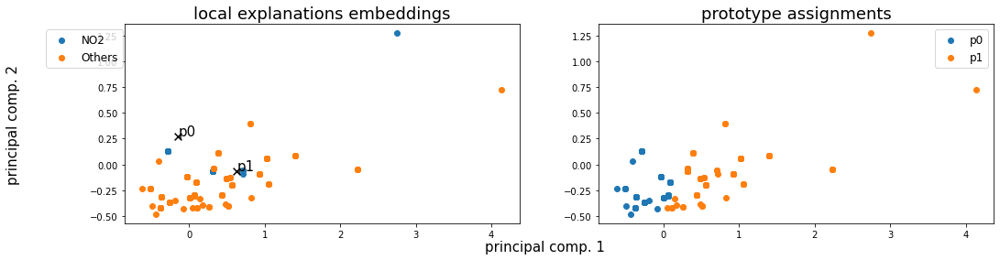

Alpha norms:
tensor([[1.0000, 0.6171],
        [0.8699, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.685727 +- 0.019060
Concept distribution:  (array([0, 1], dtype=int64), array([752, 267], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)


 20: Loss: 0.06938, LEN: 0.068262, AccxC: 0.73, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.09743, V. LEN 0.09
 21: Loss: 0.06926, LEN: 0.068066, AccxC: 0.72, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.09647, V. LEN 0.09
 22: Loss: 0.06858, LEN: 0.067585, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.09485, V. LEN 0.09
 23: Loss: 0.06814, LEN: 0.067309, AccxC: 0.73, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.09377, V. LEN 0.09
 24: Loss: 0.06782, LEN: 0.067049, AccxC: 0.73, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.09287, V. LEN 0.09
 25: Loss: 0.06775, LEN: 0.066938, AccxC: 0.73, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.09279, V. LEN 0.09
 26: Loss: 0.06752, LEN: 0.066565, AccxC: 0.73, AccO

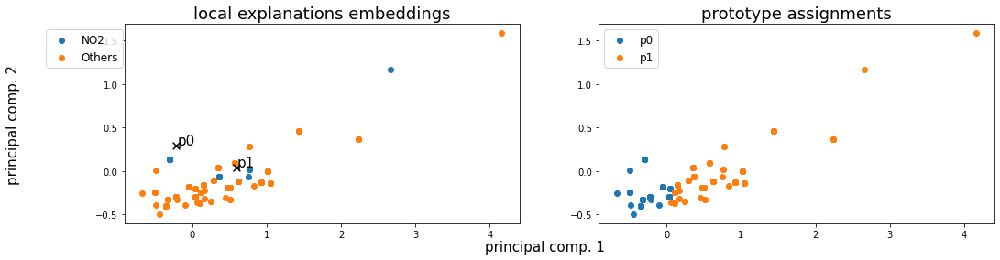

Alpha norms:
tensor([[1.0000, 0.4877],
        [0.8974, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.745892 +- 0.018898
Concept distribution:  (array([0, 1], dtype=int64), array([693, 326], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.7396)


 40: Loss: 0.05899, LEN: 0.058178, AccxC: 0.74, AccO: 0.63, V. Acc: 0.77, V. Loss: 0.08011, V. LEN 0.08
 41: Loss: 0.05807, LEN: 0.057463, AccxC: 0.74, AccO: 0.74, V. Acc: 0.77, V. Loss: 0.07851, V. LEN 0.07
 42: Loss: 0.05771, LEN: 0.057149, AccxC: 0.74, AccO: 0.68, V. Acc: 0.66, V. Loss: 0.07713, V. LEN 0.07
 43: Loss: 0.05742, LEN: 0.056825, AccxC: 0.74, AccO: 0.63, V. Acc: 0.66, V. Loss: 0.07792, V. LEN 0.07
 44: Loss: 0.05714, LEN: 0.056383, AccxC: 0.74, AccO: 0.62, V. Acc: 0.66, V. Loss: 0.07869, V. LEN 0.07
 45: Loss: 0.05699, LEN: 0.056258, AccxC: 0.74, AccO: 0.61, V. Acc: 0.66, V. Loss: 0.07796, V. LEN 0.07
 46: Loss: 0.05638, LEN: 0.055509, AccxC: 0.74, 

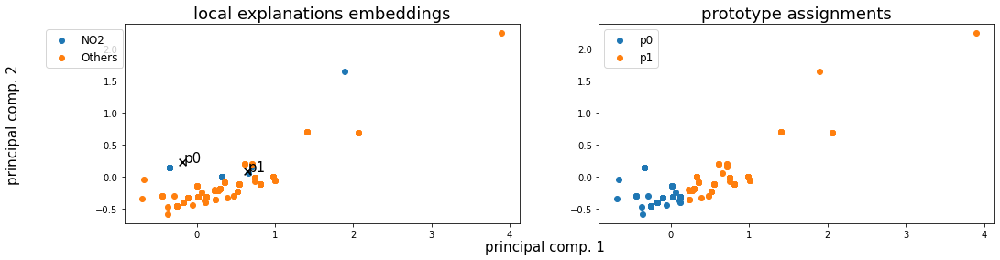

Alpha norms:
tensor([[1.0000, 0.4557],
        [1.0000, 0.7905]], grad_fn=<DivBackward0>)
Concept Purity: 0.742002 +- 0.018400
Concept distribution:  (array([0, 1], dtype=int64), array([697, 322], dtype=int64))
Logic formulas:
For class 0:
0.7340720221606648 (feature000) | ((feature001 & feature000)
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.6025)


 60: Loss: 0.05318, LEN: 0.052463, AccxC: 0.74, AccO: 0.61, V. Acc: 0.66, V. Loss: 0.07124, V. LEN 0.07
 61: Loss: 0.05299, LEN: 0.051881, AccxC: 0.74, AccO: 0.62, V. Acc: 0.66, V. Loss: 0.07085, V. LEN 0.07
 62: Loss: 0.05310, LEN: 0.052467, AccxC: 0.74, AccO: 0.62, V. Acc: 0.66, V. Loss: 0.07108, V. LEN 0.07
 63: Loss: 0.05200, LEN: 0.051327, AccxC: 0.74, AccO: 0.62, V. Acc: 0.66, V. Loss: 0.06831, V. LEN 0.06
 64: Loss: 0.05254, LEN: 0.051726, AccxC: 0.74, AccO: 0.61, V. Acc: 0.66, V. Loss: 0.06740, V. LEN 0.06
 65: Loss: 0.05144, LEN: 0.050773, AccxC: 0.74, AccO: 0.62, V. Acc: 0.66, V. Loss: 0.06830, V. LEN

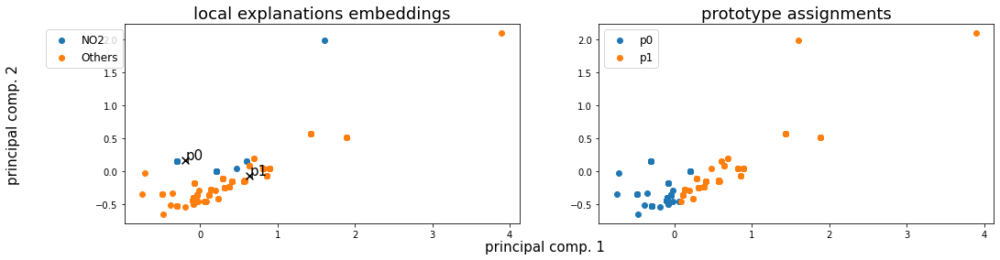

Alpha norms:
tensor([[1.0000, 0.4803],
        [1.0000, 0.6228]], grad_fn=<DivBackward0>)
Concept Purity: 0.889671 +- 0.094069
Concept distribution:  (array([0, 1], dtype=int64), array([773, 246], dtype=int64))
Logic formulas:
For class 0:
0.796398891966759 (feature000) | ((feature001 & feature000)
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.6704)


 80: Loss: 0.05023, LEN: 0.049661, AccxC: 0.74, AccO: 0.63, V. Acc: 0.72, V. Loss: 0.06027, V. LEN 0.06
 81: Loss: 0.05046, LEN: 0.049536, AccxC: 0.74, AccO: 0.64, V. Acc: 0.72, V. Loss: 0.06027, V. LEN 0.06
 82: Loss: 0.04901, LEN: 0.048628, AccxC: 0.74, AccO: 0.66, V. Acc: 0.72, V. Loss: 0.06251, V. LEN 0.06
 83: Loss: 0.05000, LEN: 0.049239, AccxC: 0.74, AccO: 0.67, V. Acc: 0.72, V. Loss: 0.06197, V. LEN 0.06
 84: Loss: 0.04975, LEN: 0.049225, AccxC: 0.74, AccO: 0.66, V. Acc: 0.72, V. Loss: 0.05939, V. LEN 0.06
 85: Loss: 0.04837, LEN: 0.047788, AccxC: 0.74, AccO: 0.64, V. Acc: 0.72, V. Loss: 0.05866, V. LEN 

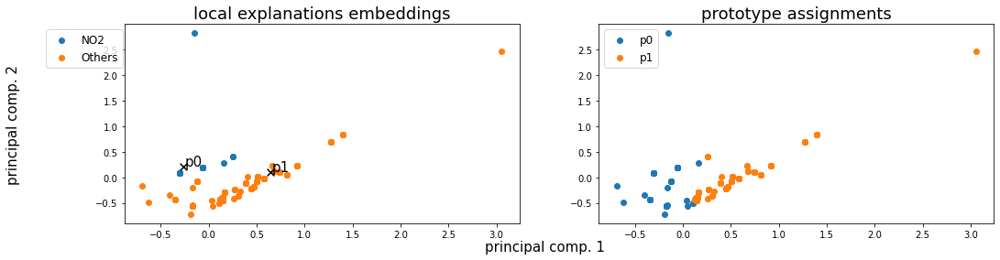

Alpha norms:
tensor([[1.0000, 0.6097],
        [1.0000, 0.6667]], grad_fn=<DivBackward0>)
Concept Purity: 0.976371 +- 0.018296
Concept distribution:  (array([0, 1], dtype=int64), array([644, 375], dtype=int64))
Logic formulas:
For class 0:
0.8199445983379502 (feature000) | ((feature001 & feature000)
For class 1:
0.8199445983379502 ((feature001)
Accuracy as classifier:  0.8199
LEN fidelity:  tensor(0.8199)


100: Loss: 0.04296, LEN: 0.042508, AccxC: 0.82, AccO: 0.82, V. Acc: 0.88, V. Loss: 0.04935, V. LEN 0.05
101: Loss: 0.04342, LEN: 0.042939, AccxC: 0.80, AccO: 0.80, V. Acc: 0.88, V. Loss: 0.04833, V. LEN 0.05
102: Loss: 0.04341, LEN: 0.042894, AccxC: 0.81, AccO: 0.81, V. Acc: 0.88, V. Loss: 0.04829, V. LEN 0.05
103: Loss: 0.04336, LEN: 0.042908, AccxC: 0.80, AccO: 0.80, V. Acc: 0.87, V. Loss: 0.05135, V. LEN 0.05
104: Loss: 0.04378, LEN: 0.043146, AccxC: 0.81, AccO: 0.81, V. Acc: 0.88, V. Loss: 0.04877, V. LEN 0.05
105: Loss: 0.04226, LEN: 0.041802, AccxC: 0.81, AccO: 0.81, V. Acc: 0

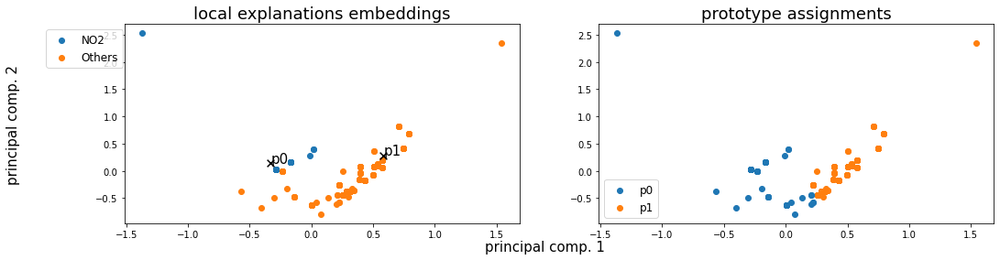

Alpha norms:
tensor([[1.0000, 0.7900],
        [1.0000, 0.7995]], grad_fn=<DivBackward0>)
Concept Purity: 0.977623 +- 0.022377
Concept distribution:  (array([0, 1], dtype=int64), array([648, 371], dtype=int64))
Logic formulas:
For class 0:
0.8254847645429363 (feature000) | ((feature001 & feature000)
For class 1:
0.8254847645429363 ((feature001)
Accuracy as classifier:  0.8255
LEN fidelity:  tensor(0.8255)


120: Loss: 0.04118, LEN: 0.040725, AccxC: 0.82, AccO: 0.82, V. Acc: 0.89, V. Loss: 0.04505, V. LEN 0.04
121: Loss: 0.04064, LEN: 0.040285, AccxC: 0.82, AccO: 0.82, V. Acc: 0.89, V. Loss: 0.04484, V. LEN 0.04
122: Loss: 0.03962, LEN: 0.039266, AccxC: 0.82, AccO: 0.82, V. Acc: 0.89, V. Loss: 0.04402, V. LEN 0.04
123: Loss: 0.04057, LEN: 0.040237, AccxC: 0.82, AccO: 0.82, V. Acc: 0.89, V. Loss: 0.04446, V. LEN 0.04
124: Loss: 0.03926, LEN: 0.038958, AccxC: 0.83, AccO: 0.83, V. Acc: 0.89, V. Loss: 0.04445, V. LEN 0.04
125: Loss: 0.04105, LEN: 0.040761, AccxC: 0.82, AccO: 0.82, V. Acc: 0

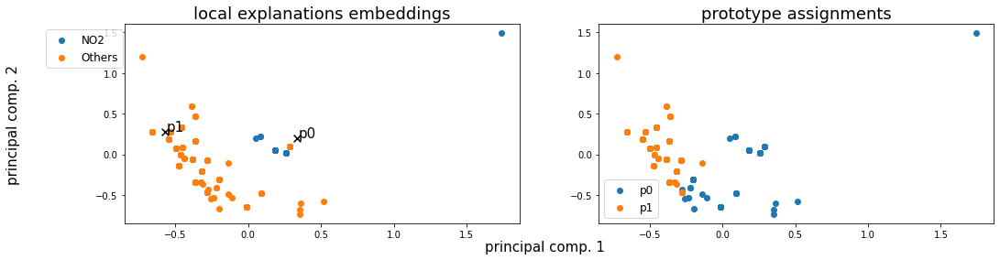

Alpha norms:
tensor([[1.0000, 0.8934],
        [1.0000, 0.9367]], grad_fn=<DivBackward0>)
Concept Purity: 0.968939 +- 0.031061
Concept distribution:  (array([0, 1], dtype=int64), array([660, 359], dtype=int64))
Logic formulas:
For class 0:
0.8337950138504155 (feature000) | ((feature001 & feature000)
For class 1:
0.8337950138504155 ((feature001)
Accuracy as classifier:  0.8338
LEN fidelity:  tensor(0.8338)


140: Loss: 0.03805, LEN: 0.037617, AccxC: 0.83, AccO: 0.83, V. Acc: 0.88, V. Loss: 0.04716, V. LEN 0.04
141: Loss: 0.03872, LEN: 0.038379, AccxC: 0.84, AccO: 0.84, V. Acc: 0.89, V. Loss: 0.04428, V. LEN 0.04
142: Loss: 0.04015, LEN: 0.039794, AccxC: 0.82, AccO: 0.82, V. Acc: 0.87, V. Loss: 0.04618, V. LEN 0.05
143: Loss: 0.03963, LEN: 0.039122, AccxC: 0.83, AccO: 0.83, V. Acc: 0.88, V. Loss: 0.04440, V. LEN 0.04
144: Loss: 0.03912, LEN: 0.038637, AccxC: 0.83, AccO: 0.83, V. Acc: 0.88, V. Loss: 0.04555, V. LEN 0.04
145: Loss: 0.03998, LEN: 0.039601, AccxC: 0.83, AccO: 0.83, V. Acc: 0

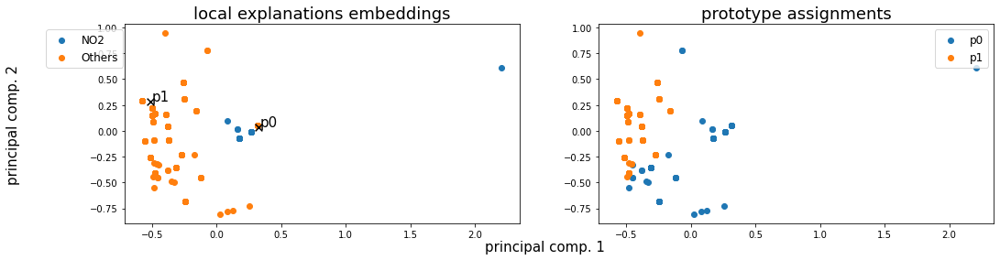

Alpha norms:
tensor([[1.0000, 0.9819],
        [0.9373, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.967523 +- 0.032477
Concept distribution:  (array([0, 1], dtype=int64), array([662, 357], dtype=int64))
Logic formulas:
For class 0:
0.8337950138504155 (feature000) | ((feature001 & feature000)
For class 1:
0.8337950138504155 (feature001)
Accuracy as classifier:  0.8338
LEN fidelity:  tensor(0.8338)


160: Loss: 0.04153, LEN: 0.041250, AccxC: 0.82, AccO: 0.82, V. Acc: 0.88, V. Loss: 0.04561, V. LEN 0.04
161: Loss: 0.03899, LEN: 0.038642, AccxC: 0.83, AccO: 0.83, V. Acc: 0.87, V. Loss: 0.04664, V. LEN 0.05
162: Loss: 0.03899, LEN: 0.038683, AccxC: 0.83, AccO: 0.83, V. Acc: 0.87, V. Loss: 0.04667, V. LEN 0.05
163: Loss: 0.03911, LEN: 0.038787, AccxC: 0.84, AccO: 0.84, V. Acc: 0.88, V. Loss: 0.04794, V. LEN 0.05
164: Loss: 0.03908, LEN: 0.038624, AccxC: 0.83, AccO: 0.83, V. Acc: 0.88, V. Loss: 0.04838, V. LEN 0.05
165: Loss: 0.03904, LEN: 0.038630, AccxC: 0.83, AccO: 0.83, V. Acc: 0.

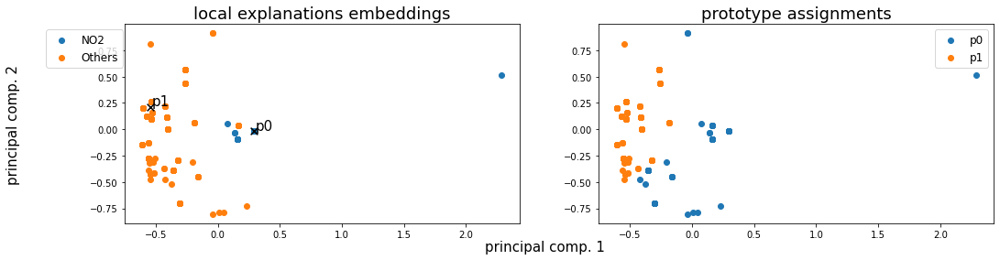

Alpha norms:
tensor([[0.9626, 1.0000],
        [0.8551, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.971799 +- 0.028201
Concept distribution:  (array([0, 1], dtype=int64), array([656, 363], dtype=int64))
Logic formulas:
For class 0:
0.832409972299169 ((feature000) | ((feature000 & feature001)
For class 1:
0.832409972299169 (feature001)
Accuracy as classifier:  0.8324
LEN fidelity:  tensor(0.8324)


180: Loss: 0.03978, LEN: 0.039458, AccxC: 0.83, AccO: 0.83, V. Acc: 0.87, V. Loss: 0.04598, V. LEN 0.05
181: Loss: 0.03941, LEN: 0.039019, AccxC: 0.83, AccO: 0.83, V. Acc: 0.87, V. Loss: 0.04599, V. LEN 0.05
182: Loss: 0.03896, LEN: 0.038613, AccxC: 0.83, AccO: 0.83, V. Acc: 0.87, V. Loss: 0.04710, V. LEN 0.05
183: Loss: 0.03744, LEN: 0.037126, AccxC: 0.84, AccO: 0.84, V. Acc: 0.87, V. Loss: 0.04708, V. LEN 0.05
184: Loss: 0.03903, LEN: 0.038674, AccxC: 0.83, AccO: 0.83, V. Acc: 0.87, V. Loss: 0.04606, V. LEN 0.05
185: Loss: 0.03862, LEN: 0.038234, AccxC: 0.83, AccO: 0.83, V. Acc: 0.8

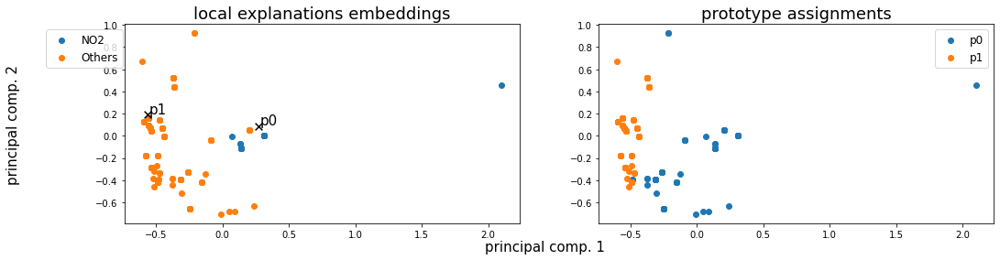

Alpha norms:
tensor([[0.9314, 1.0000],
        [0.8139, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.961940 +- 0.038060
Concept distribution:  (array([0, 1], dtype=int64), array([670, 349], dtype=int64))
Logic formulas:
For class 0:
0.832409972299169 ((feature000) | ((feature000 & feature001)
For class 1:
0.832409972299169 (feature001)
Accuracy as classifier:  0.8324
LEN fidelity:  tensor(0.8324)


200: Loss: 0.03942, LEN: 0.039101, AccxC: 0.83, AccO: 0.83, V. Acc: 0.88, V. Loss: 0.04702, V. LEN 0.05
201: Loss: 0.03748, LEN: 0.037232, AccxC: 0.84, AccO: 0.84, V. Acc: 0.87, V. Loss: 0.04770, V. LEN 0.05
202: Loss: 0.03753, LEN: 0.037260, AccxC: 0.84, AccO: 0.84, V. Acc: 0.87, V. Loss: 0.04783, V. LEN 0.05
203: Loss: 0.03789, LEN: 0.037635, AccxC: 0.84, AccO: 0.84, V. Acc: 0.87, V. Loss: 0.04803, V. LEN 0.05
204: Loss: 0.03853, LEN: 0.038265, AccxC: 0.83, AccO: 0.83, V. Acc: 0.87, V. Loss: 0.04779, V. LEN 0.05
205: Loss: 0.03851, LEN: 0.038258, AccxC: 0.84, AccO: 0.84, V. Acc: 0.8

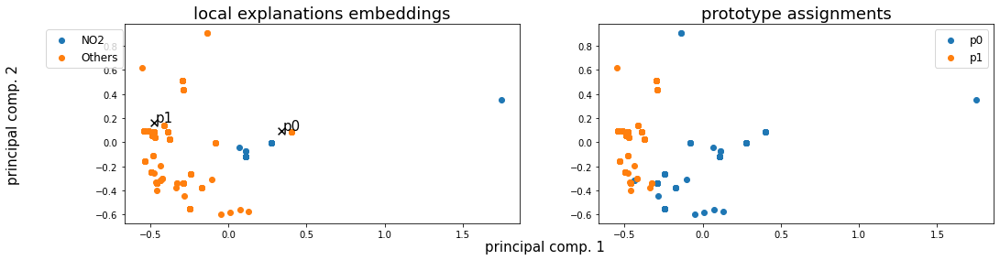

Alpha norms:
tensor([[0.9167, 1.0000],
        [0.7783, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.964018 +- 0.035982
Concept distribution:  (array([0, 1], dtype=int64), array([667, 352], dtype=int64))
Logic formulas:
For class 0:
0.8310249307479224 ((feature000) | ((feature000 & feature001)
For class 1:
0.8310249307479224 (feature001)
Accuracy as classifier:  0.831
LEN fidelity:  tensor(0.8310)


220: Loss: 0.03802, LEN: 0.037752, AccxC: 0.83, AccO: 0.83, V. Acc: 0.87, V. Loss: 0.04873, V. LEN 0.05
221: Loss: 0.04024, LEN: 0.039910, AccxC: 0.83, AccO: 0.83, V. Acc: 0.87, V. Loss: 0.04661, V. LEN 0.05
222: Loss: 0.03935, LEN: 0.039062, AccxC: 0.82, AccO: 0.82, V. Acc: 0.88, V. Loss: 0.04359, V. LEN 0.04
223: Loss: 0.03814, LEN: 0.037912, AccxC: 0.83, AccO: 0.83, V. Acc: 0.88, V. Loss: 0.04361, V. LEN 0.04
224: Loss: 0.03752, LEN: 0.037280, AccxC: 0.83, AccO: 0.83, V. Acc: 0.88, V. Loss: 0.04489, V. LEN 0.04
225: Loss: 0.03821, LEN: 0.037986, AccxC: 0.83, AccO: 0.83, V. Acc: 0.

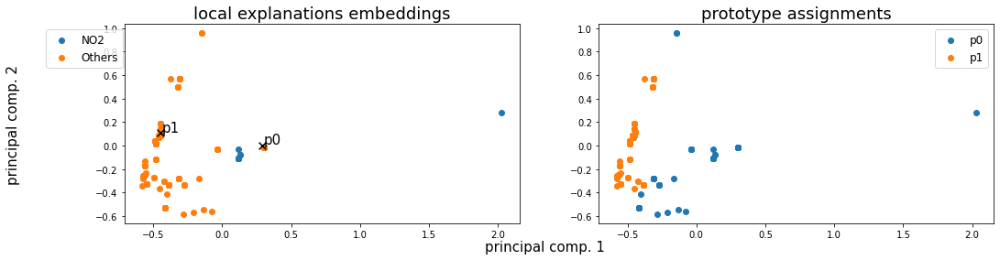

Alpha norms:
tensor([[0.9012, 1.0000],
        [0.7490, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.973242 +- 0.026758
Concept distribution:  (array([0, 1], dtype=int64), array([654, 365], dtype=int64))
Logic formulas:
For class 0:
0.8296398891966759 ((feature000) | ((feature000 & feature001)
For class 1:
0.8296398891966759 (feature001)
Accuracy as classifier:  0.8296
LEN fidelity:  tensor(0.8296)


240: Loss: 0.03699, LEN: 0.036730, AccxC: 0.84, AccO: 0.84, V. Acc: 0.88, V. Loss: 0.04428, V. LEN 0.04
241: Loss: 0.04029, LEN: 0.040022, AccxC: 0.84, AccO: 0.84, V. Acc: 0.87, V. Loss: 0.04783, V. LEN 0.05
242: Loss: 0.03831, LEN: 0.038059, AccxC: 0.83, AccO: 0.83, V. Acc: 0.88, V. Loss: 0.04608, V. LEN 0.04
243: Loss: 0.03884, LEN: 0.038588, AccxC: 0.83, AccO: 0.83, V. Acc: 0.87, V. Loss: 0.04821, V. LEN 0.05
244: Loss: 0.04011, LEN: 0.039882, AccxC: 0.83, AccO: 0.83, V. Acc: 0.88, V. Loss: 0.04739, V. LEN 0.05
245: Loss: 0.03863, LEN: 0.038386, AccxC: 0.84, AccO: 0.84, V. Acc: 0

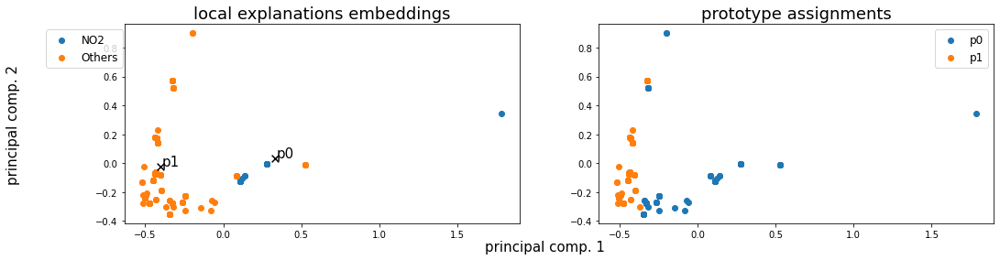

Alpha norms:
tensor([[0.8998, 1.0000],
        [0.7408, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.960565 +- 0.039435
Concept distribution:  (array([0, 1], dtype=int64), array([672, 347], dtype=int64))
Logic formulas:
For class 0:
0.8351800554016621 ((feature000) | ((feature000 & feature001)
For class 1:
0.8351800554016621 (feature001)
Accuracy as classifier:  0.8352
LEN fidelity:  tensor(0.8352)


260: Loss: 0.04062, LEN: 0.040368, AccxC: 0.82, AccO: 0.82, V. Acc: 0.88, V. Loss: 0.04700, V. LEN 0.05
261: Loss: 0.03882, LEN: 0.038577, AccxC: 0.84, AccO: 0.84, V. Acc: 0.88, V. Loss: 0.04493, V. LEN 0.04
262: Loss: 0.03779, LEN: 0.037543, AccxC: 0.83, AccO: 0.83, V. Acc: 0.88, V. Loss: 0.04530, V. LEN 0.04
263: Loss: 0.03806, LEN: 0.037772, AccxC: 0.83, AccO: 0.83, V. Acc: 0.89, V. Loss: 0.04418, V. LEN 0.04
264: Loss: 0.03854, LEN: 0.038290, AccxC: 0.84, AccO: 0.84, V. Acc: 0.88, V. Loss: 0.04675, V. LEN 0.05
265: Loss: 0.03893, LEN: 0.038687, AccxC: 0.83, AccO: 0.83, V. Acc: 0

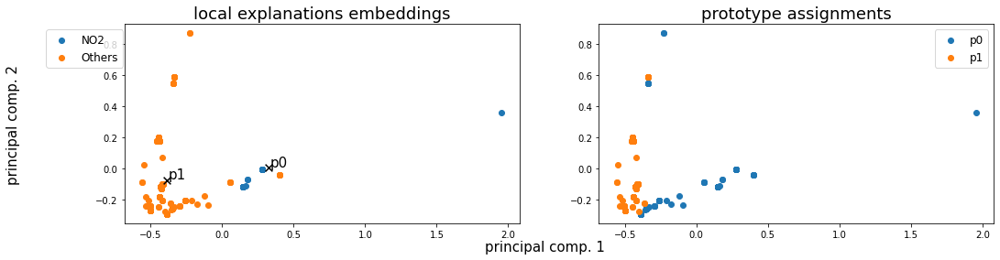

Alpha norms:
tensor([[0.8945, 1.0000],
        [0.7336, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.961940 +- 0.038060
Concept distribution:  (array([0, 1], dtype=int64), array([670, 349], dtype=int64))
Logic formulas:
For class 0:
0.832409972299169 ((feature000) | ((feature000 & feature001)
For class 1:
0.832409972299169 (feature001)
Accuracy as classifier:  0.8324
LEN fidelity:  tensor(0.8324)


280: Loss: 0.03921, LEN: 0.038935, AccxC: 0.83, AccO: 0.83, V. Acc: 0.87, V. Loss: 0.04832, V. LEN 0.05
281: Loss: 0.03868, LEN: 0.038459, AccxC: 0.84, AccO: 0.84, V. Acc: 0.88, V. Loss: 0.04503, V. LEN 0.04
282: Loss: 0.03813, LEN: 0.037880, AccxC: 0.83, AccO: 0.83, V. Acc: 0.88, V. Loss: 0.04461, V. LEN 0.04
283: Loss: 0.03750, LEN: 0.037193, AccxC: 0.84, AccO: 0.84, V. Acc: 0.88, V. Loss: 0.04642, V. LEN 0.05
284: Loss: 0.03767, LEN: 0.037448, AccxC: 0.85, AccO: 0.85, V. Acc: 0.89, V. Loss: 0.04416, V. LEN 0.04
285: Loss: 0.03915, LEN: 0.038906, AccxC: 0.83, AccO: 0.83, V. Acc: 0.8

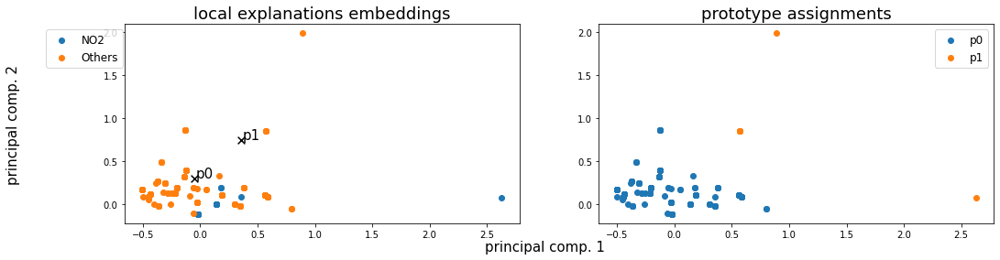

Alpha norms:
tensor([[1.0000, 0.9355],
        [0.9896, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.721701 +- 0.111632
Concept distribution:  (array([0, 1], dtype=int64), array([1013,    6], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 0.34941, LEN: 0.265846, AccxC: 0.73, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.44371, V. LEN 0.35
  2: Loss: 0.32268, LEN: 0.265421, AccxC: 0.73, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.41505, V. LEN 0.35
  3: Loss: 0.30576, LEN: 0.265034, AccxC: 0.74, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.40763, V. LEN 0.35
  4: Loss: 0.29561, LEN: 0.264572, AccxC: 0.74, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.39243, V. LEN 0.35
  5: Loss: 0.28483, LEN: 0.264214, AccxC: 0.74, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.37813, V. LEN 0.35
  6: Loss: 0.27821, LEN: 0.263854, AccxC: 0.74, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.36967, V. LEN 0.35
  7: Loss: 0.27386, LEN: 0.263456, AccxC: 0.74, Acc

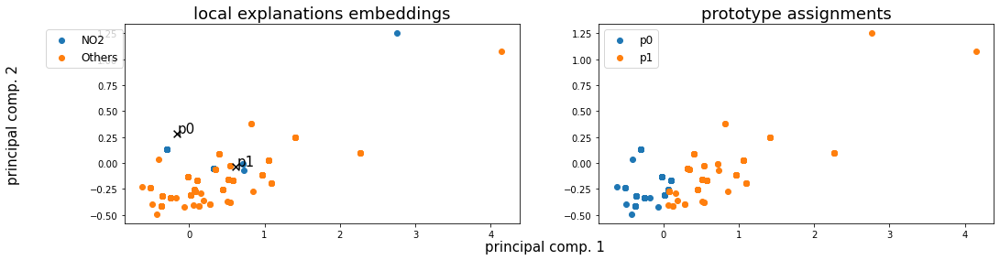

Alpha norms:
tensor([[1.0000, 0.6435],
        [0.8398, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.691149 +- 0.018355
Concept distribution:  (array([0, 1], dtype=int64), array([747, 272], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)


 20: Loss: 0.25891, LEN: 0.257844, AccxC: 0.74, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.34906, V. LEN 0.34
 21: Loss: 0.25875, LEN: 0.257584, AccxC: 0.74, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.34757, V. LEN 0.34
 22: Loss: 0.25775, LEN: 0.256873, AccxC: 0.74, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.34587, V. LEN 0.34
 23: Loss: 0.25721, LEN: 0.256328, AccxC: 0.74, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.34439, V. LEN 0.34
 24: Loss: 0.25655, LEN: 0.255775, AccxC: 0.74, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.34322, V. LEN 0.34
 25: Loss: 0.25642, LEN: 0.255633, AccxC: 0.74, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.34231, V. LEN 0.34
 26: Loss: 0.25599, LEN: 0.254949, AccxC: 0.74, AccO

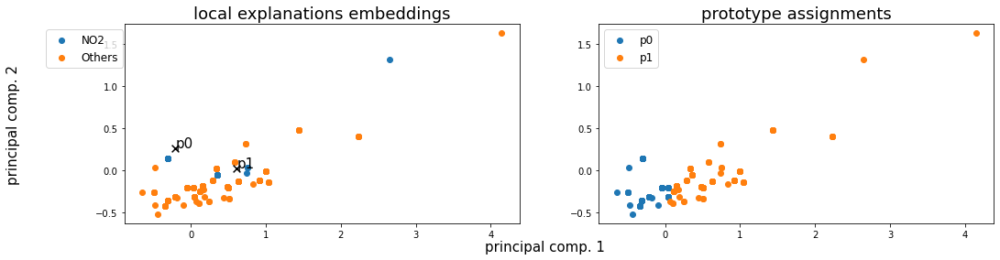

Alpha norms:
tensor([[1.0000, 0.4448],
        [0.8520, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.745892 +- 0.018898
Concept distribution:  (array([0, 1], dtype=int64), array([693, 326], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.7396)


 40: Loss: 0.24054, LEN: 0.239660, AccxC: 0.74, AccO: 0.74, V. Acc: 0.77, V. Loss: 0.31883, V. LEN 0.31
 41: Loss: 0.23871, LEN: 0.238116, AccxC: 0.74, AccO: 0.74, V. Acc: 0.77, V. Loss: 0.31677, V. LEN 0.31
 42: Loss: 0.23773, LEN: 0.237144, AccxC: 0.74, AccO: 0.74, V. Acc: 0.77, V. Loss: 0.31364, V. LEN 0.31
 43: Loss: 0.23684, LEN: 0.236254, AccxC: 0.74, AccO: 0.74, V. Acc: 0.77, V. Loss: 0.31320, V. LEN 0.31
 44: Loss: 0.23550, LEN: 0.234701, AccxC: 0.74, AccO: 0.74, V. Acc: 0.77, V. Loss: 0.31297, V. LEN 0.31
 45: Loss: 0.23485, LEN: 0.234036, AccxC: 0.74, AccO: 0.74, V. Acc: 0.77, V. Loss: 0.31096, V. LEN 0.30
 46: Loss: 0.23300, LEN: 0.232140, AccxC: 0.74, 

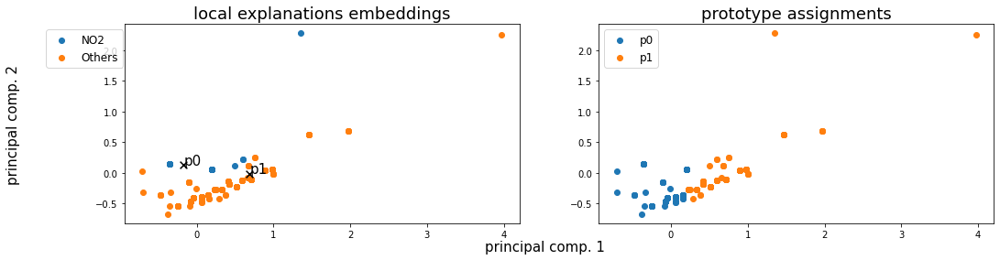

Alpha norms:
tensor([[1.0000, 0.3129],
        [1.0000, 0.7177]], grad_fn=<DivBackward0>)
Concept Purity: 0.883709 +- 0.099270
Concept distribution:  (array([0, 1], dtype=int64), array([784, 235], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.7396)


 60: Loss: 0.21482, LEN: 0.214026, AccxC: 0.74, AccO: 0.74, V. Acc: 0.77, V. Loss: 0.27311, V. LEN 0.27
 61: Loss: 0.21223, LEN: 0.211671, AccxC: 0.74, AccO: 0.74, V. Acc: 0.77, V. Loss: 0.27068, V. LEN 0.27
 62: Loss: 0.21363, LEN: 0.212931, AccxC: 0.74, AccO: 0.74, V. Acc: 0.77, V. Loss: 0.26868, V. LEN 0.27
 63: Loss: 0.20824, LEN: 0.207669, AccxC: 0.74, AccO: 0.73, V. Acc: 0.72, V. Loss: 0.26558, V. LEN 0.26
 64: Loss: 0.20886, LEN: 0.208382, AccxC: 0.74, AccO: 0.66, V. Acc: 0.72, V. Loss: 0.26394, V. LEN 0.26
 65: Loss: 0.20532, LEN: 0.204775, AccxC: 0.74, AccO: 0.67, V. Acc: 0.72, V. Loss: 0.26167, V. LEN 0.26
 66: Loss: 0.20426, LEN: 0.203587, AccxC: 0.74, 

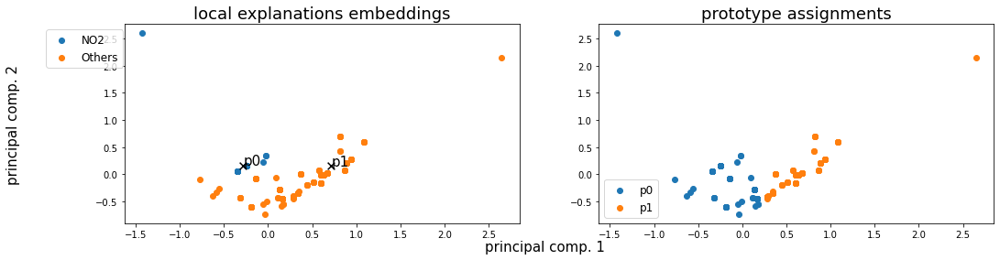

Alpha norms:
tensor([[1.0000, 0.3335],
        [1.0000, 0.4341]], grad_fn=<DivBackward0>)
Concept Purity: 0.961252 +- 0.038748
Concept distribution:  (array([0, 1], dtype=int64), array([671, 348], dtype=int64))
Logic formulas:
For class 0:
0.8310249307479224 (feature000) | ((feature001 & feature000)
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.6413)


 80: Loss: 0.17570, LEN: 0.175301, AccxC: 0.81, AccO: 0.64, V. Acc: 0.68, V. Loss: 0.20444, V. LEN 0.20
 81: Loss: 0.16968, LEN: 0.169102, AccxC: 0.83, AccO: 0.65, V. Acc: 0.68, V. Loss: 0.20159, V. LEN 0.20
 82: Loss: 0.16983, LEN: 0.169468, AccxC: 0.83, AccO: 0.64, V. Acc: 0.68, V. Loss: 0.19903, V. LEN 0.20
 83: Loss: 0.16582, LEN: 0.165403, AccxC: 0.83, AccO: 0.64, V. Acc: 0.68, V. Loss: 0.19677, V. LEN 0.20
 84: Loss: 0.16738, LEN: 0.166985, AccxC: 0.82, AccO: 0.64, V. Acc: 0.68, V. Loss: 0.19485, V. LEN 0.19
 85: Loss: 0.16613, LEN: 0.165734, AccxC: 0.83, AccO: 0.70, V. Acc: 0.88, V. Loss: 0.19308, V. LEN

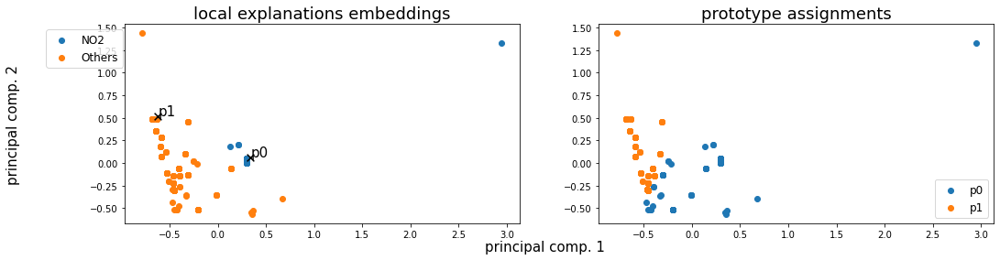

Alpha norms:
tensor([[1.0000, 0.5222],
        [1.0000, 0.5711]], grad_fn=<DivBackward0>)
Concept Purity: 0.966817 +- 0.033183
Concept distribution:  (array([0, 1], dtype=int64), array([663, 356], dtype=int64))
Logic formulas:
For class 0:
0.832409972299169 (feature000) | ((feature001 & feature000)
For class 1:
0.832409972299169 ((feature001)
Accuracy as classifier:  0.8324
LEN fidelity:  tensor(0.8324)


100: Loss: 0.15299, LEN: 0.152594, AccxC: 0.83, AccO: 0.83, V. Acc: 0.88, V. Loss: 0.17296, V. LEN 0.17
101: Loss: 0.15547, LEN: 0.155052, AccxC: 0.83, AccO: 0.83, V. Acc: 0.88, V. Loss: 0.17268, V. LEN 0.17
102: Loss: 0.15233, LEN: 0.151950, AccxC: 0.84, AccO: 0.84, V. Acc: 0.87, V. Loss: 0.17690, V. LEN 0.18
103: Loss: 0.14885, LEN: 0.148453, AccxC: 0.84, AccO: 0.84, V. Acc: 0.87, V. Loss: 0.17646, V. LEN 0.18
104: Loss: 0.15517, LEN: 0.154573, AccxC: 0.83, AccO: 0.83, V. Acc: 0.88, V. Loss: 0.17069, V. LEN 0.17
105: Loss: 0.15512, LEN: 0.154737, AccxC: 0.83, AccO: 0.83, V. Acc: 0.8

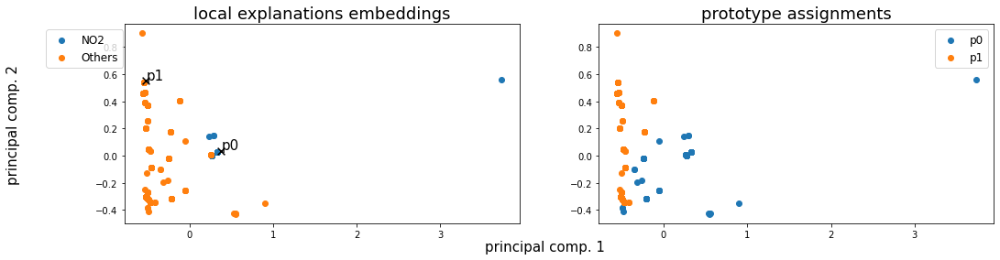

Alpha norms:
tensor([[1.0000, 0.6688],
        [1.0000, 0.6013]], grad_fn=<DivBackward0>)
Concept Purity: 0.969651 +- 0.030349
Concept distribution:  (array([0, 1], dtype=int64), array([659, 360], dtype=int64))
Logic formulas:
For class 0:
0.8379501385041551 (feature000) | ((feature001 & feature000)
For class 1:
0.8379501385041551 ((feature001)
Accuracy as classifier:  0.838
LEN fidelity:  tensor(0.8380)


120: Loss: 0.15189, LEN: 0.151615, AccxC: 0.83, AccO: 0.83, V. Acc: 0.88, V. Loss: 0.16717, V. LEN 0.17
121: Loss: 0.15248, LEN: 0.152184, AccxC: 0.83, AccO: 0.83, V. Acc: 0.88, V. Loss: 0.16716, V. LEN 0.17
122: Loss: 0.14881, LEN: 0.148498, AccxC: 0.84, AccO: 0.84, V. Acc: 0.88, V. Loss: 0.16682, V. LEN 0.17
123: Loss: 0.15266, LEN: 0.152341, AccxC: 0.83, AccO: 0.83, V. Acc: 0.88, V. Loss: 0.16688, V. LEN 0.17
124: Loss: 0.15577, LEN: 0.155468, AccxC: 0.83, AccO: 0.83, V. Acc: 0.88, V. Loss: 0.16692, V. LEN 0.17
125: Loss: 0.15169, LEN: 0.151360, AccxC: 0.83, AccO: 0.83, V. Acc: 0.

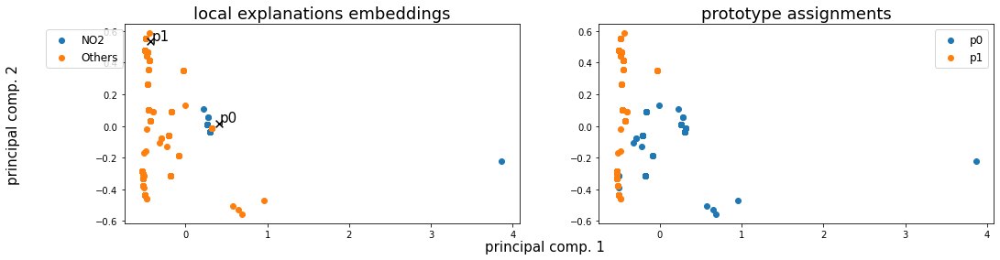

Alpha norms:
tensor([[1.0000, 0.7534],
        [1.0000, 0.6544]], grad_fn=<DivBackward0>)
Concept Purity: 0.965414 +- 0.034586
Concept distribution:  (array([0, 1], dtype=int64), array([665, 354], dtype=int64))
Logic formulas:
For class 0:
0.8365650969529086 (feature000) | ((feature001 & feature000)
For class 1:
0.8365650969529086 ((feature001)
Accuracy as classifier:  0.8366
LEN fidelity:  tensor(0.8366)


140: Loss: 0.14692, LEN: 0.146538, AccxC: 0.84, AccO: 0.84, V. Acc: 0.88, V. Loss: 0.17205, V. LEN 0.17
141: Loss: 0.14257, LEN: 0.142302, AccxC: 0.84, AccO: 0.84, V. Acc: 0.88, V. Loss: 0.17109, V. LEN 0.17
142: Loss: 0.14937, LEN: 0.149040, AccxC: 0.83, AccO: 0.83, V. Acc: 0.88, V. Loss: 0.17074, V. LEN 0.17
143: Loss: 0.15354, LEN: 0.153195, AccxC: 0.83, AccO: 0.83, V. Acc: 0.87, V. Loss: 0.18987, V. LEN 0.19
144: Loss: 0.15209, LEN: 0.151747, AccxC: 0.84, AccO: 0.84, V. Acc: 0.87, V. Loss: 0.19009, V. LEN 0.19
145: Loss: 0.15622, LEN: 0.155889, AccxC: 0.83, AccO: 0.83, V. Acc: 0

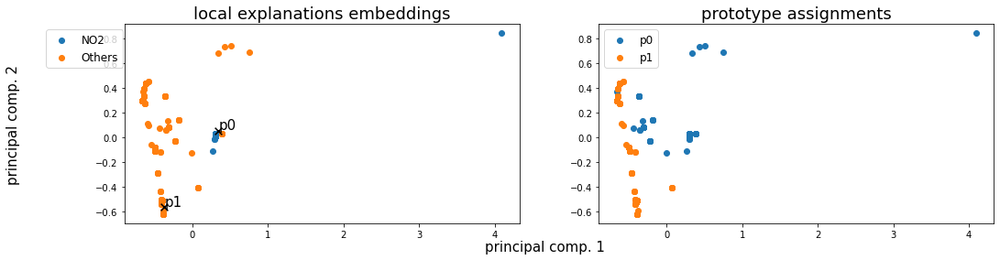

Alpha norms:
tensor([[1.0000, 0.8147],
        [1.0000, 0.7353]], grad_fn=<DivBackward0>)
Concept Purity: 0.965414 +- 0.034586
Concept distribution:  (array([0, 1], dtype=int64), array([665, 354], dtype=int64))
Logic formulas:
For class 0:
0.8365650969529086 (feature000) | ((feature001 & feature000)
For class 1:
0.8365650969529086 ((feature001)
Accuracy as classifier:  0.8366
LEN fidelity:  tensor(0.8366)


160: Loss: 0.15485, LEN: 0.154508, AccxC: 0.84, AccO: 0.84, V. Acc: 0.88, V. Loss: 0.17086, V. LEN 0.17
161: Loss: 0.14708, LEN: 0.146726, AccxC: 0.84, AccO: 0.84, V. Acc: 0.88, V. Loss: 0.17117, V. LEN 0.17
162: Loss: 0.15206, LEN: 0.151774, AccxC: 0.83, AccO: 0.83, V. Acc: 0.87, V. Loss: 0.19140, V. LEN 0.19
163: Loss: 0.15380, LEN: 0.153490, AccxC: 0.83, AccO: 0.83, V. Acc: 0.88, V. Loss: 0.17169, V. LEN 0.17
164: Loss: 0.15120, LEN: 0.150838, AccxC: 0.84, AccO: 0.84, V. Acc: 0.88, V. Loss: 0.17105, V. LEN 0.17
165: Loss: 0.14733, LEN: 0.147000, AccxC: 0.84, AccO: 0.84, V. Acc: 0

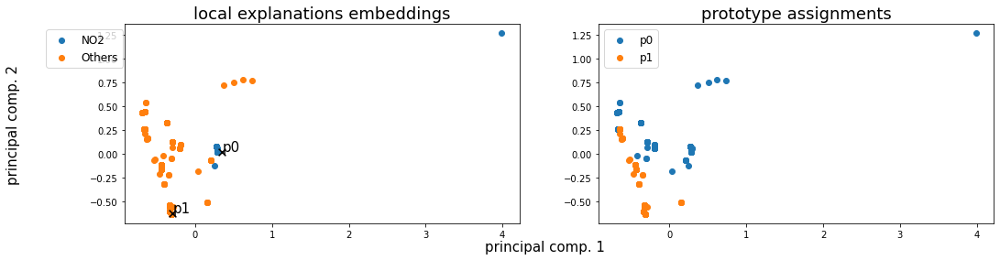

Alpha norms:
tensor([[1.0000, 0.8377],
        [1.0000, 0.8293]], grad_fn=<DivBackward0>)
Concept Purity: 0.899871 +- 0.100129
Concept distribution:  (array([0, 1], dtype=int64), array([774, 245], dtype=int64))
Logic formulas:
For class 0:
0.8282548476454293 (feature000) | ((feature001 & feature000)
For class 1:
0.8282548476454293 ((feature001)
Accuracy as classifier:  0.8283
LEN fidelity:  tensor(0.8283)


180: Loss: 0.15582, LEN: 0.155494, AccxC: 0.83, AccO: 0.83, V. Acc: 0.87, V. Loss: 0.19044, V. LEN 0.19
181: Loss: 0.15356, LEN: 0.153249, AccxC: 0.84, AccO: 0.84, V. Acc: 0.87, V. Loss: 0.19026, V. LEN 0.19
182: Loss: 0.15025, LEN: 0.149906, AccxC: 0.83, AccO: 0.83, V. Acc: 0.87, V. Loss: 0.19111, V. LEN 0.19
183: Loss: 0.14949, LEN: 0.149192, AccxC: 0.84, AccO: 0.84, V. Acc: 0.87, V. Loss: 0.19034, V. LEN 0.19
184: Loss: 0.15066, LEN: 0.150315, AccxC: 0.83, AccO: 0.83, V. Acc: 0.88, V. Loss: 0.17179, V. LEN 0.17
185: Loss: 0.14483, LEN: 0.144496, AccxC: 0.84, AccO: 0.84, V. Acc: 0

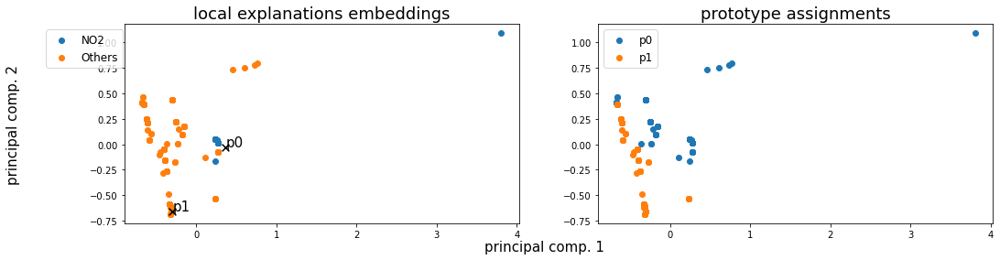

Alpha norms:
tensor([[1.0000, 0.8962],
        [1.0000, 0.9541]], grad_fn=<DivBackward0>)
Concept Purity: 0.962631 +- 0.037369
Concept distribution:  (array([0, 1], dtype=int64), array([669, 350], dtype=int64))
Logic formulas:
For class 0:
0.8337950138504155 (feature000) | ((feature001 & feature000)
For class 1:
0.8337950138504155 ((feature001)
Accuracy as classifier:  0.8338
LEN fidelity:  tensor(0.8338)


200: Loss: 0.14989, LEN: 0.149556, AccxC: 0.83, AccO: 0.83, V. Acc: 0.88, V. Loss: 0.17278, V. LEN 0.17
201: Loss: 0.14448, LEN: 0.144201, AccxC: 0.83, AccO: 0.83, V. Acc: 0.88, V. Loss: 0.17238, V. LEN 0.17
202: Loss: 0.15214, LEN: 0.151860, AccxC: 0.83, AccO: 0.83, V. Acc: 0.87, V. Loss: 0.19071, V. LEN 0.19
203: Loss: 0.16291, LEN: 0.162612, AccxC: 0.83, AccO: 0.83, V. Acc: 0.87, V. Loss: 0.19097, V. LEN 0.19
204: Loss: 0.15073, LEN: 0.150447, AccxC: 0.83, AccO: 0.83, V. Acc: 0.87, V. Loss: 0.19133, V. LEN 0.19
205: Loss: 0.14861, LEN: 0.148290, AccxC: 0.84, AccO: 0.84, V. Acc: 0

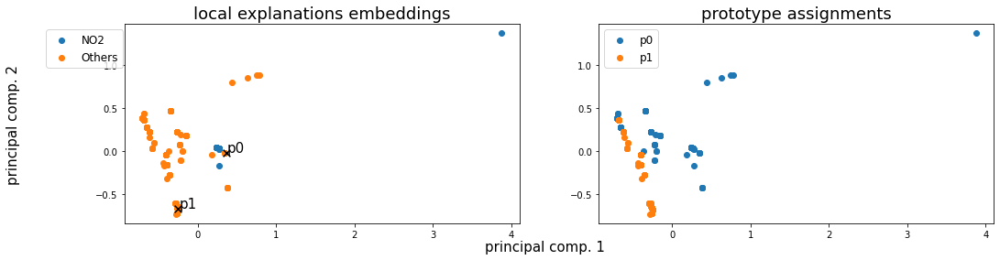

Alpha norms:
tensor([[1.0000, 0.9204],
        [0.9546, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.952485 +- 0.047515
Concept distribution:  (array([0, 1], dtype=int64), array([684, 335], dtype=int64))
Logic formulas:
For class 0:
0.8296398891966759 (feature000) | ((feature001 & feature000)
For class 1:
0.8296398891966759 (feature001)
Accuracy as classifier:  0.8296
LEN fidelity:  tensor(0.8296)


220: Loss: 0.14178, LEN: 0.141476, AccxC: 0.84, AccO: 0.84, V. Acc: 0.87, V. Loss: 0.18344, V. LEN 0.18
221: Loss: 0.15649, LEN: 0.156186, AccxC: 0.82, AccO: 0.82, V. Acc: 0.87, V. Loss: 0.19107, V. LEN 0.19
222: Loss: 0.15388, LEN: 0.153576, AccxC: 0.83, AccO: 0.83, V. Acc: 0.87, V. Loss: 0.19105, V. LEN 0.19
223: Loss: 0.15187, LEN: 0.151594, AccxC: 0.83, AccO: 0.83, V. Acc: 0.87, V. Loss: 0.19152, V. LEN 0.19
224: Loss: 0.14640, LEN: 0.146115, AccxC: 0.83, AccO: 0.83, V. Acc: 0.87, V. Loss: 0.18310, V. LEN 0.18
225: Loss: 0.14680, LEN: 0.146503, AccxC: 0.83, AccO: 0.83, V. Acc: 0.

In [48]:
expls = []
for use_focal in [True, False]:
    batch_sampler = utils.GroupBatchSampler(num_input_graphs=128, drop_last=False, belonging=np.array(belonging_train))
    train_group_loader = DataLoader(dataset_train, batch_sampler=batch_sampler)

    batch_sampler = utils.GroupBatchSampler(num_input_graphs=256, drop_last=False, belonging=np.array(belonging_val))
    val_group_loader = DataLoader(dataset_val, batch_sampler=batch_sampler)

    batch_sampler = utils.GroupBatchSampler(num_input_graphs=256, drop_last=False, belonging=np.array(belonging_test))
    test_group_loader = DataLoader(dataset_test, batch_sampler=batch_sampler)


    torch.manual_seed(42 + 700)
    hyper = {
        "len_lr": 0.0005,
        "proto_lr": 0.001,
        "le_emb_lr": 0.001,
        "coeff_divloss": 0.000,
        "coeff_pdist": 0.,
        "coeff_gae": 0.,
        "coeff_r1": 0.09,
        "coeff_r2": 0.00099,
        "coeff_ce": 0.0,
        "coeff_de": 0.,
        "coeff_logic_loss": 0.00,
        "focal_gamma": 2, #3
        "focal_alpha": -1,
        "ts": 1,
        "te": 1,
        "focal_loss": use_focal,
        "debug_prototypes": False,
        "num_prototypes": 2,
        "dim_prototypes": 10,
        "num_le_features": 14,
        "activation": "leaky",
        "assign_func": "straight_sim",
        "LEN_temperature": 1,
        "remove_attention": True,
        "log_images": True,
        "log_models": True,
        "num_epochs": 2000
    }

    len_model    = models.LEN(hyper["num_prototypes"], 
                              hyper["LEN_temperature"], 
                              remove_attention=hyper["remove_attention"]).to(device)
    le_model     = models.LEEmbedder(num_features=hyper["num_le_features"], 
                                     activation=hyper["activation"], 
                                     num_hidden=hyper["dim_prototypes"]).to(device)
    expl         = models.GlobalExplainer(len_model, 
                                   le_model, 
                                   train_group_loader, 
                                   val_group_loader, 
                                   device, 
                                   hyper_params=hyper,
                                   classes_names=mutag_classes_names,
                                   dataset_name="Mutagenicity").to(device)
    expl.iterate(num_epochs=hyper["num_epochs"], log_wandb=False, name_wandb="")
    expls.append(expl)
    
    #with open(f'../logs/model_focal_{use_focal}_Mutagenicity.pkl', 'wb') as handle:
    #    pickle.dump(expl, handle)

#### plots

In [49]:
# with open(f'../logs/model_focal_True_Mutagenicity.pkl', 'rb') as handle:
#     uno = pickle.load(handle)
# with open(f'../logs/model_focal_False_Mutagenicity.pkl', 'rb') as handle:
#     due = pickle.load(handle)
uno, due = expls[0] , expls[1]

In [50]:
focal_loss_mutagenicity_over_runs = [
    [0.88, 194],
    [0.89, 538],
    [0.88, 341]
]
no_focal_loss_mutagenicity_over_runs = [
    [0.88, 168],
    [0.89, 612],
    [0.89, 395]
]
print([e["acc_overall"] for e in uno.val_metrics][uno.early_stopping.best_epoch-1], "@", uno.early_stopping.best_epoch )
print([e["acc_overall"] for e in due.val_metrics][due.early_stopping.best_epoch-1], "@", due.early_stopping.best_epoch)

tensor(0.8830) @ 194
tensor(0.8830) @ 133


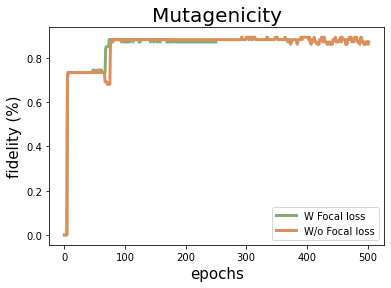

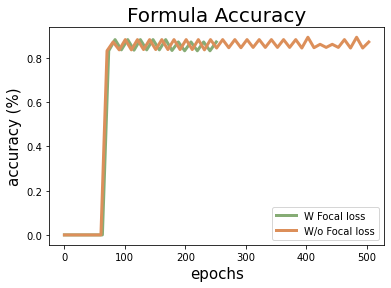

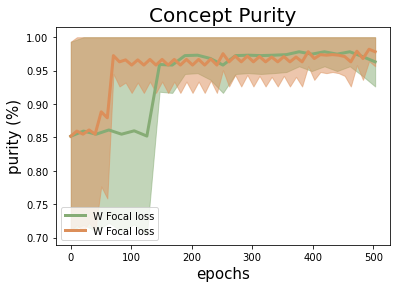

In [29]:
c1 = "#86ac75"
c2 = "#dc8f5a"

plt.plot([e["acc_overall"] for e in uno.val_metrics], label="W Focal loss", color=c1, linewidth=3)
plt.plot([e["acc_overall"] for e in due.val_metrics], label="W/o Focal loss", color=c2, linewidth=3)
plt.legend()
plt.title("Mutagenicity", size=20)
plt.xlabel("epochs", size=15)
plt.ylabel("fidelity (%)", size=15)
plt.savefig("fidelity_focal_bamultishapes.pdf")
plt.show()

plt.plot(np.linspace(0, len([e["acc_overall"] for e in uno.val_metrics]), num=len([e["logic_acc_clf"] for e in uno.val_logic_metrics])), [e["logic_acc_clf"] for e in uno.val_logic_metrics], label="W Focal loss", color=c1, linewidth=3)
plt.plot(np.linspace(0, len([e["acc_overall"] for e in due.val_metrics]), num=len([e["logic_acc_clf"] for e in due.val_logic_metrics])), [e["logic_acc_clf"] for e in due.val_logic_metrics], label="W/o Focal loss", color=c2, linewidth=3)
plt.legend()
plt.title("Formula Accuracy", size=20)
plt.xlabel("epochs", size=15)
plt.ylabel("accuracy (%)", size=15)
plt.savefig("formula_acc_focal_bamultishapes.pdf")
plt.show()


purity     = np.array([e["concept_purity"] for e in uno.val_logic_metrics])
std_purity = np.array([e["concept_purity_std"] for e in uno.val_logic_metrics])
plt.plot(np.linspace(0, len([e["acc_overall"] for e in due.val_metrics]), num=len(purity)), purity, label="W Focal loss", color=c1, linewidth=3)
plt.fill_between(np.linspace(0, len([e["acc_overall"] for e in due.val_metrics]), num=len(purity)), purity-std_purity, purity+std_purity, alpha=0.5, color=c1)

purity     = np.array([e["concept_purity"] for e in due.val_logic_metrics])
std_purity = np.array([e["concept_purity_std"] for e in due.val_logic_metrics])
plt.plot(np.linspace(0, len([e["acc_overall"] for e in due.val_metrics]), num=len(purity)), purity, label="W Focal loss", color=c2, linewidth=3)
plt.fill_between(np.linspace(0, len([e["acc_overall"] for e in due.val_metrics]), num=len(purity)), purity-std_purity, purity+std_purity, alpha=0.5, color=c2)

plt.legend()
plt.title("Concept Purity", size=20)
plt.xlabel("epochs", size=15)
plt.ylabel("purity (%)", size=15)
plt.savefig("purity_focal_bamultishapes.pdf")
plt.show()

## Ablation on num_prototypes

(array([0., 1.], dtype=float32), array([675, 451], dtype=int64))


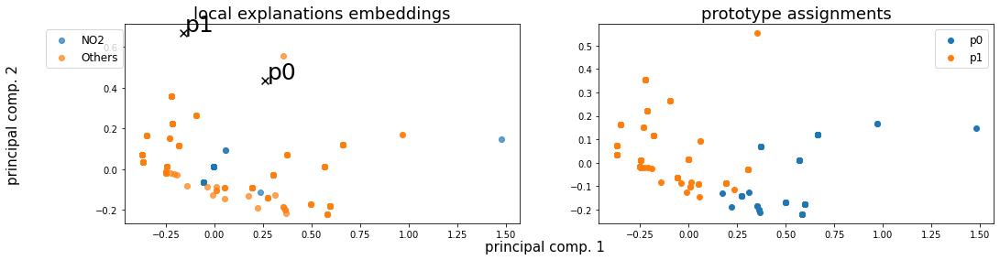

Alpha norms:
tensor([[1.0000, 0.6722],
        [0.7495, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.848798 +- 0.145249
Concept distribution:  (array([0, 1], dtype=int64), array([168, 958], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 0.16914, LEN: 0.067577, AccxC: 0.27, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.19108, V. LEN 0.09
  2: Loss: 0.13664, LEN: 0.067317, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.16226, V. LEN 0.09
  3: Loss: 0.11553, LEN: 0.067085, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.14404, V. LEN 0.09
  4: Loss: 0.09352, LEN: 0.066858, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.11209, V. LEN 0.09
  5: Loss: 0.07810, LEN: 0.066632, AccxC: 0.75, AccO: 0.00, V. Acc: 0.73, V. Loss: 0.10390, V. LEN 0.09
  6: Loss: 0.07527, LEN: 0.066423, AccxC: 0.75, AccO: 0.69, V. Acc: 0.75, V. Loss: 0.09484, V. LEN 0.08
  7: Loss: 0.07253, LEN: 0.066238, AccxC: 0.75, AccO:

 77: Loss: 0.04230, LEN: 0.041900, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.05424, V. LEN 0.05
 78: Loss: 0.04252, LEN: 0.042175, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05414, V. LEN 0.05
 79: Loss: 0.04349, LEN: 0.043040, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05401, V. LEN 0.05


 80: Loss: 0.04141, LEN: 0.041017, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.05399, V. LEN 0.05
 81: Loss: 0.04110, LEN: 0.040671, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.05352, V. LEN 0.05
 82: Loss: 0.04303, LEN: 0.042648, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.05337, V. LEN 0.05
 83: Loss: 0.04219, LEN: 0.041727, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.05341, V. LEN 0.05
 84: Loss: 0.04159, LEN: 0.041130, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.05343, V. LEN 0.05
 85: Loss: 0.04216, LEN: 0.041739, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05315, V. LEN 0.05
 86: Loss: 0.04256, LEN: 0.041454, AccxC: 0.82, AccO: 0.82, V.

156: Loss: 0.04200, LEN: 0.041707, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05333, V. LEN 0.05
157: Loss: 0.04142, LEN: 0.040909, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05432, V. LEN 0.05
158: Loss: 0.04090, LEN: 0.040441, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05250, V. LEN 0.05
159: Loss: 0.03998, LEN: 0.039494, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05427, V. LEN 0.05


160: Loss: 0.04064, LEN: 0.040304, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05411, V. LEN 0.05
161: Loss: 0.03986, LEN: 0.039424, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05297, V. LEN 0.05
162: Loss: 0.04077, LEN: 0.040411, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05302, V. LEN 0.05
163: Loss: 0.03952, LEN: 0.039200, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05150, V. LEN 0.05
164: Loss: 0.03893, LEN: 0.038634, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05152, V. LEN 0.05
165: Loss: 0.03993, LEN: 0.039599, AccxC: 0.82, AccO: 0.82, V.

235: Loss: 0.04174, LEN: 0.041397, AccxC: 0.82, AccO: 0.82, V. Acc: 0.83, V. Loss: 0.05048, V. LEN 0.05
236: Loss: 0.04132, LEN: 0.040987, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05148, V. LEN 0.05
237: Loss: 0.03930, LEN: 0.038931, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05167, V. LEN 0.05
238: Loss: 0.04059, LEN: 0.040278, AccxC: 0.82, AccO: 0.82, V. Acc: 0.83, V. Loss: 0.05089, V. LEN 0.05
239: Loss: 0.03850, LEN: 0.038166, AccxC: 0.83, AccO: 0.83, V. Acc: 0.83, V. Loss: 0.05003, V. LEN 0.05


240: Loss: 0.04132, LEN: 0.040966, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05093, V. LEN 0.05
241: Loss: 0.03941, LEN: 0.039075, AccxC: 0.82, AccO: 0.82, V. Acc: 0.83, V. Loss: 0.04997, V. LEN 0.05
242: Loss: 0.03808, LEN: 0.037640, AccxC: 0.82, AccO: 0.82, V. Acc: 0.83, V. Loss: 0.05014, V. LEN 0.05
243: Loss: 0.03920, LEN: 0.038899, AccxC: 0.83, AccO: 0.83, V. Acc: 0.83, V. Loss: 0.05018, V. LEN 0.05
244: Loss: 0.04035, LEN: 0.040058, AccxC: 0.82, AccO: 0.82, V.

314: Loss: 0.04000, LEN: 0.038570, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05060, V. LEN 0.05
315: Loss: 0.04159, LEN: 0.041267, AccxC: 0.83, AccO: 0.83, V. Acc: 0.82, V. Loss: 0.05104, V. LEN 0.05
316: Loss: 0.03908, LEN: 0.038666, AccxC: 0.83, AccO: 0.83, V. Acc: 0.82, V. Loss: 0.05077, V. LEN 0.05
317: Loss: 0.04095, LEN: 0.040471, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05081, V. LEN 0.05
318: Loss: 0.04244, LEN: 0.042164, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05186, V. LEN 0.05
319: Loss: 0.03900, LEN: 0.038740, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05203, V. LEN 0.05


320: Loss: 0.04111, LEN: 0.040868, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05155, V. LEN 0.05
321: Loss: 0.04003, LEN: 0.039779, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05107, V. LEN 0.05
Early Stopping
Loading model at epoch 220
Best epoch: 220
Trained lasted for 80 seconds
(array([0., 1.], dtype=float32), array([675, 451], dtype=int64))


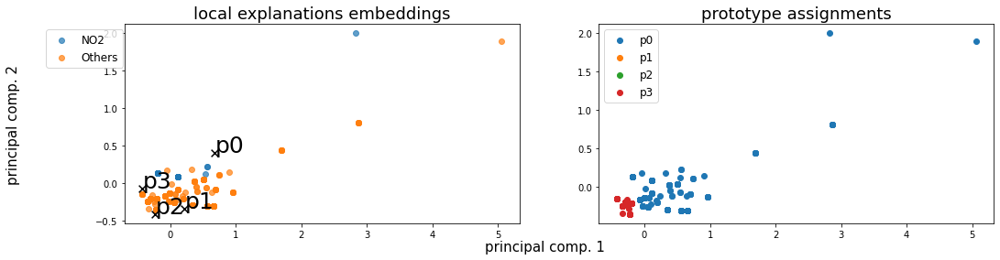

Alpha norms:
tensor([[1.0000, 0.8459, 0.8427, 0.9224],
        [0.8005, 0.7799, 1.0000, 0.8565]], grad_fn=<DivBackward0>)
Concept Purity: 0.850467 +- 0.149533
Concept distribution:  (array([0, 3], dtype=int64), array([963, 163], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 0.18129, LEN: 0.075071, AccxC: 0.60, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.21749, V. LEN 0.10
  2: Loss: 0.14536, LEN: 0.075182, AccxC: 0.43, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.17772, V. LEN 0.10
  3: Loss: 0.12764, LEN: 0.075328, AccxC: 0.31, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.16460, V. LEN 0.10
  4: Loss: 0.11928, LEN: 0.075087, AccxC: 0.28, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.16022, V. LEN 0.10
  5: Loss: 0.11183, LEN: 0.074688, AccxC: 0.27, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.14787, V. LEN 0.10
  6: Loss: 0.10283, LEN: 0.074230, AccxC: 0.26, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.13937, V. LEN 0.10
  7: Loss: 0.09657, L

 74: Loss: 0.04394, LEN: 0.042893, AccxC: 0.80, AccO: 0.62, V. Acc: 0.61, V. Loss: 0.05173, V. LEN 0.05
 75: Loss: 0.04362, LEN: 0.042565, AccxC: 0.80, AccO: 0.62, V. Acc: 0.61, V. Loss: 0.05134, V. LEN 0.05
 76: Loss: 0.04355, LEN: 0.042704, AccxC: 0.82, AccO: 0.62, V. Acc: 0.61, V. Loss: 0.05076, V. LEN 0.05
 77: Loss: 0.04283, LEN: 0.041617, AccxC: 0.81, AccO: 0.62, V. Acc: 0.63, V. Loss: 0.04886, V. LEN 0.05
 78: Loss: 0.04377, LEN: 0.042323, AccxC: 0.81, AccO: 0.62, V. Acc: 0.61, V. Loss: 0.05098, V. LEN 0.05
 79: Loss: 0.04346, LEN: 0.042432, AccxC: 0.81, AccO: 0.62, V. Acc: 0.63, V. Loss: 0.04925, V. LEN 0.05


 80: Loss: 0.04242, LEN: 0.041195, AccxC: 0.81, AccO: 0.64, V. Acc: 0.63, V. Loss: 0.05033, V. LEN 0.05
 81: Loss: 0.04257, LEN: 0.041525, AccxC: 0.81, AccO: 0.66, V. Acc: 0.63, V. Loss: 0.05005, V. LEN 0.05
 82: Loss: 0.04419, LEN: 0.042581, AccxC: 0.80, AccO: 0.65, V. Acc: 0.63, V. Loss: 0.05035, V. LEN 0.05
 83: Loss: 0.04213, LEN: 0.041337, AccxC: 0.80, AccO: 0.65, V.

154: Loss: 0.04183, LEN: 0.041092, AccxC: 0.81, AccO: 0.81, V. Acc: 0.83, V. Loss: 0.04793, V. LEN 0.05
155: Loss: 0.04047, LEN: 0.039923, AccxC: 0.82, AccO: 0.82, V. Acc: 0.83, V. Loss: 0.04853, V. LEN 0.05
156: Loss: 0.04227, LEN: 0.041368, AccxC: 0.82, AccO: 0.82, V. Acc: 0.83, V. Loss: 0.04855, V. LEN 0.05
157: Loss: 0.04159, LEN: 0.041206, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05166, V. LEN 0.05
158: Loss: 0.04083, LEN: 0.040244, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.05145, V. LEN 0.05
159: Loss: 0.04066, LEN: 0.040035, AccxC: 0.81, AccO: 0.81, V. Acc: 0.83, V. Loss: 0.04834, V. LEN 0.05


160: Loss: 0.04136, LEN: 0.040783, AccxC: 0.82, AccO: 0.82, V. Acc: 0.83, V. Loss: 0.04805, V. LEN 0.05
161: Loss: 0.04014, LEN: 0.039097, AccxC: 0.82, AccO: 0.82, V. Acc: 0.83, V. Loss: 0.04837, V. LEN 0.05
162: Loss: 0.04097, LEN: 0.040501, AccxC: 0.82, AccO: 0.82, V. Acc: 0.83, V. Loss: 0.04837, V. LEN 0.05
163: Loss: 0.04020, LEN: 0.039264, AccxC: 0.82, AccO: 0.82, V.

233: Loss: 0.04149, LEN: 0.040995, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05124, V. LEN 0.05
234: Loss: 0.04136, LEN: 0.040883, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05072, V. LEN 0.05
235: Loss: 0.04053, LEN: 0.040102, AccxC: 0.82, AccO: 0.82, V. Acc: 0.83, V. Loss: 0.04810, V. LEN 0.05
236: Loss: 0.04157, LEN: 0.041250, AccxC: 0.81, AccO: 0.81, V. Acc: 0.83, V. Loss: 0.04652, V. LEN 0.05
Early Stopping
Loading model at epoch 135
Best epoch: 135
Trained lasted for 63 seconds
(array([0., 1.], dtype=float32), array([675, 451], dtype=int64))


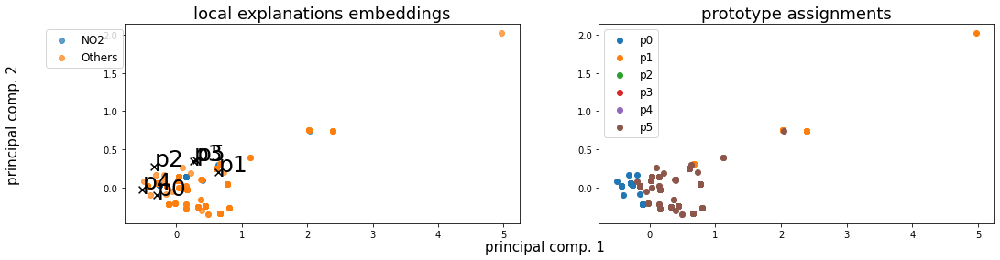

Alpha norms:
tensor([[0.9595, 1.0000, 0.9094, 0.7717, 0.9062, 0.8726],
        [0.8822, 0.8649, 0.8276, 1.0000, 0.9040, 0.7665]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.912534 +- 0.090468
Concept distribution:  (array([0, 1, 5], dtype=int64), array([596,  16, 514], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 0.17513, LEN: 0.078407, AccxC: 0.74, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.22553, V. LEN 0.10
  2: Loss: 0.16334, LEN: 0.078035, AccxC: 0.76, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.20480, V. LEN 0.10
  3: Loss: 0.14561, LEN: 0.077629, AccxC: 0.77, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.17692, V. LEN 0.10
  4: Loss: 0.12486, LEN: 0.077274, AccxC: 0.76, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.15521, V. LEN 0.10
  5: Loss: 0.11392, LEN: 0.076930, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.14921, V. LEN 0.10
  6: Loss: 0.10739, LEN: 0.076594, AccxC: 0.74, AccO: 0.00, V. Acc: 0.00, V. L

 74: Loss: 0.04496, LEN: 0.043351, AccxC: 0.80, AccO: 0.73, V. Acc: 0.75, V. Loss: 0.05452, V. LEN 0.05
 75: Loss: 0.04606, LEN: 0.044322, AccxC: 0.79, AccO: 0.72, V. Acc: 0.75, V. Loss: 0.05660, V. LEN 0.05
 76: Loss: 0.04497, LEN: 0.043456, AccxC: 0.80, AccO: 0.73, V. Acc: 0.75, V. Loss: 0.05624, V. LEN 0.05
 77: Loss: 0.04347, LEN: 0.042293, AccxC: 0.80, AccO: 0.72, V. Acc: 0.75, V. Loss: 0.05464, V. LEN 0.05
 78: Loss: 0.04407, LEN: 0.042844, AccxC: 0.79, AccO: 0.72, V. Acc: 0.75, V. Loss: 0.05400, V. LEN 0.05
 79: Loss: 0.04428, LEN: 0.043145, AccxC: 0.80, AccO: 0.72, V. Acc: 0.78, V. Loss: 0.05223, V. LEN 0.05

------------------------------------------------------------------------------------
Has double activations  tensor(54)
But only for wrong predictions



------------------------------------------------------------------------------------
Has double activations  tensor(3)
But only for wrong predictions


 80: Loss: 0.04340, LEN: 0.041927, AccxC: 0.78, AccO: 0.72, V. Acc: 0

141: Loss: 0.04099, LEN: 0.040350, AccxC: 0.81, AccO: 0.78, V. Acc: 0.77, V. Loss: 0.04802, V. LEN 0.05
142: Loss: 0.04088, LEN: 0.040278, AccxC: 0.81, AccO: 0.78, V. Acc: 0.77, V. Loss: 0.04783, V. LEN 0.05
143: Loss: 0.04065, LEN: 0.040184, AccxC: 0.81, AccO: 0.78, V. Acc: 0.77, V. Loss: 0.04735, V. LEN 0.05
144: Loss: 0.04175, LEN: 0.041043, AccxC: 0.81, AccO: 0.77, V. Acc: 0.77, V. Loss: 0.04728, V. LEN 0.04
145: Loss: 0.04057, LEN: 0.040028, AccxC: 0.81, AccO: 0.77, V. Acc: 0.77, V. Loss: 0.04787, V. LEN 0.04
146: Loss: 0.04157, LEN: 0.041103, AccxC: 0.82, AccO: 0.79, V. Acc: 0.77, V. Loss: 0.04801, V. LEN 0.05
147: Loss: 0.04082, LEN: 0.040269, AccxC: 0.82, AccO: 0.79, V. Acc: 0.77, V. Loss: 0.04761, V. LEN 0.05
148: Loss: 0.03959, LEN: 0.039070, AccxC: 0.82, AccO: 0.78, V. Acc: 0.77, V. Loss: 0.04800, V. LEN 0.05
149: Loss: 0.04091, LEN: 0.040214, AccxC: 0.82, AccO: 0.78, V. Acc: 0.77, V. Loss: 0.04830, V. LEN 0.04
150: Loss: 0.04137, LEN: 0.040377, AccxC: 0.82, AccO: 0.77, V. A



220: Loss: 0.03957, LEN: 0.039155, AccxC: 0.82, AccO: 0.81, V. Acc: 0.84, V. Loss: 0.04592, V. LEN 0.04
221: Loss: 0.03928, LEN: 0.038884, AccxC: 0.82, AccO: 0.82, V. Acc: 0.83, V. Loss: 0.04857, V. LEN 0.05
222: Loss: 0.04070, LEN: 0.040320, AccxC: 0.82, AccO: 0.82, V. Acc: 0.83, V. Loss: 0.04807, V. LEN 0.05
223: Loss: 0.03904, LEN: 0.038615, AccxC: 0.83, AccO: 0.83, V. Acc: 0.84, V. Loss: 0.04660, V. LEN 0.04
224: Loss: 0.03977, LEN: 0.039052, AccxC: 0.82, AccO: 0.82, V. Acc: 0.84, V. Loss: 0.04622, V. LEN 0.04
225: Loss: 0.03858, LEN: 0.038246, AccxC: 0.82, AccO: 0.82, V. Acc: 0.84, V. Loss: 0.04564, V. LEN 0.04
226: Loss: 0.03848, LEN: 0.038032, AccxC: 0.82, AccO: 0.82, V. Acc: 0.84, V. Loss: 0.04641, V. LEN 0.05
227: Loss: 0.04036, LEN: 0.040028, AccxC: 0.82, AccO: 0.82, V. Acc: 0.84, V. Loss: 0.04557, V. LEN 0.04
228: Loss: 0.03898, LEN: 0.038549, AccxC: 0.82, AccO: 0.82, V. Acc: 0.84, V. Loss: 0.04667, V. LEN 0.05
229: Loss: 0.03936, LEN: 0.039072, AccxC: 0.83, AccO: 0.83, V.

299: Loss: 0.03921, LEN: 0.038909, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.04628, V. LEN 0.04


300: Loss: 0.03792, LEN: 0.037631, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.04754, V. LEN 0.05
301: Loss: 0.04075, LEN: 0.040532, AccxC: 0.82, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.04882, V. LEN 0.05
302: Loss: 0.04069, LEN: 0.040448, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.04754, V. LEN 0.05
303: Loss: 0.04027, LEN: 0.039918, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.04769, V. LEN 0.04
304: Loss: 0.04077, LEN: 0.040382, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.04752, V. LEN 0.05
305: Loss: 0.03867, LEN: 0.038236, AccxC: 0.82, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.04762, V. LEN 0.05
306: Loss: 0.04019, LEN: 0.039926, AccxC: 0.82, AccO: 0.81, V. Acc: 0.80, V. Loss: 0.04924, V. LEN 0.05
307: Loss: 0.03985, LEN: 0.039599, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.04814, V. LEN 0.05
308: Loss: 0.03947, LEN: 0.039157, AccxC: 0.83, AccO: 0.82, V.

374: Loss: 0.04105, LEN: 0.040606, AccxC: 0.82, AccO: 0.82, V. Acc: 0.83, V. Loss: 0.04757, V. LEN 0.05
375: Loss: 0.03857, LEN: 0.038117, AccxC: 0.82, AccO: 0.82, V. Acc: 0.83, V. Loss: 0.04447, V. LEN 0.04
376: Loss: 0.03946, LEN: 0.039207, AccxC: 0.82, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.04576, V. LEN 0.04
377: Loss: 0.03811, LEN: 0.037765, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.04634, V. LEN 0.05
378: Loss: 0.04049, LEN: 0.040263, AccxC: 0.83, AccO: 0.82, V. Acc: 0.83, V. Loss: 0.04393, V. LEN 0.04
379: Loss: 0.03831, LEN: 0.038014, AccxC: 0.82, AccO: 0.82, V. Acc: 0.84, V. Loss: 0.04299, V. LEN 0.04


380: Loss: 0.04012, LEN: 0.039728, AccxC: 0.82, AccO: 0.81, V. Acc: 0.84, V. Loss: 0.04371, V. LEN 0.04
381: Loss: 0.04006, LEN: 0.039648, AccxC: 0.82, AccO: 0.81, V. Acc: 0.84, V. Loss: 0.04345, V. LEN 0.04
382: Loss: 0.03862, LEN: 0.038389, AccxC: 0.82, AccO: 0.82, V. Acc: 0.84, V. Loss: 0.04415, V. LEN 0.04
383: Loss: 0.03824, LEN: 0.037910, AccxC: 0.82, AccO: 0.81, V.

449: Loss: 0.03968, LEN: 0.039469, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.04607, V. LEN 0.04
450: Loss: 0.03959, LEN: 0.039350, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.04484, V. LEN 0.04
451: Loss: 0.03807, LEN: 0.037814, AccxC: 0.83, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.04555, V. LEN 0.05
452: Loss: 0.03753, LEN: 0.037256, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.04604, V. LEN 0.05
453: Loss: 0.03867, LEN: 0.038498, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.04615, V. LEN 0.05
454: Loss: 0.03724, LEN: 0.037029, AccxC: 0.82, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.04580, V. LEN 0.05
455: Loss: 0.04058, LEN: 0.040427, AccxC: 0.83, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.04525, V. LEN 0.04
456: Loss: 0.03792, LEN: 0.037658, AccxC: 0.82, AccO: 0.82, V. Acc: 0.84, V. Loss: 0.04452, V. LEN 0.04
457: Loss: 0.04005, LEN: 0.039774, AccxC: 0.83, AccO: 0.82, V. Acc: 0.84, V. Loss: 0.04405, V. LEN 0.04
458: Loss: 0.03909, LEN: 0.038841, AccxC: 0.82, AccO: 0.82, V. A

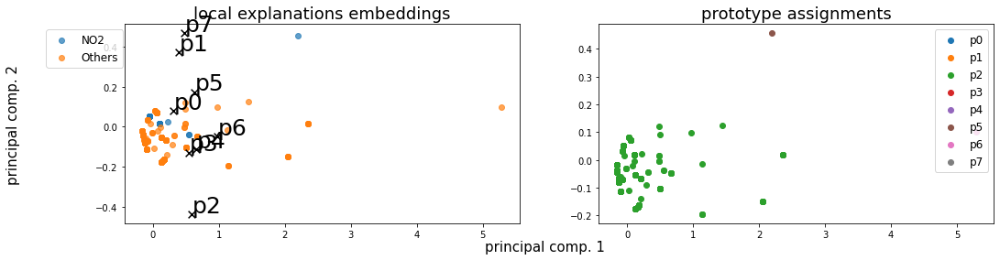

Alpha norms:
tensor([[1.0000, 0.7935, 0.9836, 0.9568, 0.8002, 0.8796, 0.8436, 0.8286],
        [0.8038, 0.9233, 0.9012, 0.9027, 1.0000, 0.9723, 0.8571, 0.9484]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.866548 +- 0.188730
Concept distribution:  (array([2, 5, 6], dtype=int64), array([1124,    1,    1], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 0.22518, LEN: 0.067318, AccxC: 0.65, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.27525, V. LEN 0.09
  2: Loss: 0.19137, LEN: 0.066941, AccxC: 0.74, AccO: 0.06, V. Acc: 0.78, V. Loss: 0.23239, V. LEN 0.09
  3: Loss: 0.16266, LEN: 0.066104, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.18711, V. LEN 0.08
  4: Loss: 0.13099, LEN: 0.065943, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.15756, V. LEN 0.08
  5: Loss: 0.11341, LEN: 0.065704, AccxC: 0.75, AccO: 0.74, V. Acc: 0.77, V. Loss: 0.13538, V. LEN 0.08
  6: Loss: 0.09856, LEN: 0.065475, AccxC: 0

 76: Loss: 0.04445, LEN: 0.043165, AccxC: 0.80, AccO: 0.79, V. Acc: 0.79, V. Loss: 0.05394, V. LEN 0.05
 77: Loss: 0.04328, LEN: 0.042044, AccxC: 0.80, AccO: 0.80, V. Acc: 0.79, V. Loss: 0.05434, V. LEN 0.05
 78: Loss: 0.04221, LEN: 0.040900, AccxC: 0.81, AccO: 0.80, V. Acc: 0.78, V. Loss: 0.05451, V. LEN 0.05
 79: Loss: 0.04308, LEN: 0.041987, AccxC: 0.81, AccO: 0.81, V. Acc: 0.79, V. Loss: 0.05448, V. LEN 0.05


 80: Loss: 0.04230, LEN: 0.041360, AccxC: 0.80, AccO: 0.79, V. Acc: 0.79, V. Loss: 0.05314, V. LEN 0.05
 81: Loss: 0.04308, LEN: 0.042073, AccxC: 0.80, AccO: 0.79, V. Acc: 0.79, V. Loss: 0.05271, V. LEN 0.05
 82: Loss: 0.04411, LEN: 0.042108, AccxC: 0.81, AccO: 0.80, V. Acc: 0.79, V. Loss: 0.05317, V. LEN 0.05
 83: Loss: 0.04263, LEN: 0.041155, AccxC: 0.81, AccO: 0.80, V. Acc: 0.79, V. Loss: 0.05301, V. LEN 0.05
 84: Loss: 0.04225, LEN: 0.040981, AccxC: 0.80, AccO: 0.79, V. Acc: 0.79, V. Loss: 0.05394, V. LEN 0.05
 85: Loss: 0.04255, LEN: 0.041738, AccxC: 0.80, AccO: 0.80, V.

154: Loss: 0.04053, LEN: 0.040181, AccxC: 0.82, AccO: 0.82, V. Acc: 0.78, V. Loss: 0.05207, V. LEN 0.05
155: Loss: 0.04026, LEN: 0.039824, AccxC: 0.81, AccO: 0.81, V. Acc: 0.80, V. Loss: 0.04912, V. LEN 0.05
156: Loss: 0.04262, LEN: 0.042239, AccxC: 0.80, AccO: 0.80, V. Acc: 0.79, V. Loss: 0.05220, V. LEN 0.05
157: Loss: 0.04177, LEN: 0.041064, AccxC: 0.80, AccO: 0.77, V. Acc: 0.76, V. Loss: 0.05204, V. LEN 0.05
158: Loss: 0.04055, LEN: 0.040214, AccxC: 0.81, AccO: 0.78, V. Acc: 0.79, V. Loss: 0.05153, V. LEN 0.05
159: Loss: 0.03968, LEN: 0.039251, AccxC: 0.82, AccO: 0.80, V. Acc: 0.79, V. Loss: 0.05209, V. LEN 0.05

------------------------------------------------------------------------------------
Has double activations  tensor(23)
But only for wrong predictions



160: Loss: 0.04053, LEN: 0.040008, AccxC: 0.82, AccO: 0.81, V. Acc: 0.80, V. Loss: 0.04953, V. LEN 0.05
161: Loss: 0.03970, LEN: 0.039195, AccxC: 0.81, AccO: 0.79, V. Acc: 0.78, V. Loss: 0.04832, V. LEN 0.05
162: Loss: 0.

229: Loss: 0.04034, LEN: 0.040002, AccxC: 0.82, AccO: 0.79, V. Acc: 0.83, V. Loss: 0.04641, V. LEN 0.05
230: Loss: 0.03995, LEN: 0.039663, AccxC: 0.82, AccO: 0.80, V. Acc: 0.83, V. Loss: 0.04648, V. LEN 0.05
231: Loss: 0.03976, LEN: 0.039324, AccxC: 0.82, AccO: 0.80, V. Acc: 0.83, V. Loss: 0.04641, V. LEN 0.05
232: Loss: 0.04114, LEN: 0.040811, AccxC: 0.82, AccO: 0.80, V. Acc: 0.83, V. Loss: 0.04632, V. LEN 0.05
233: Loss: 0.04045, LEN: 0.040100, AccxC: 0.82, AccO: 0.80, V. Acc: 0.83, V. Loss: 0.04634, V. LEN 0.05
234: Loss: 0.03954, LEN: 0.039175, AccxC: 0.82, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.04695, V. LEN 0.05
235: Loss: 0.04113, LEN: 0.040857, AccxC: 0.82, AccO: 0.80, V. Acc: 0.82, V. Loss: 0.04763, V. LEN 0.05
236: Loss: 0.04152, LEN: 0.040490, AccxC: 0.82, AccO: 0.81, V. Acc: 0.83, V. Loss: 0.04767, V. LEN 0.05
237: Loss: 0.04010, LEN: 0.039631, AccxC: 0.81, AccO: 0.80, V. Acc: 0.83, V. Loss: 0.04706, V. LEN 0.05
238: Loss: 0.03995, LEN: 0.039664, AccxC: 0.82, AccO: 0.81, V. A

306: Loss: 0.04034, LEN: 0.040044, AccxC: 0.83, AccO: 0.80, V. Acc: 0.79, V. Loss: 0.04701, V. LEN 0.05
307: Loss: 0.04012, LEN: 0.039847, AccxC: 0.83, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.04745, V. LEN 0.05
308: Loss: 0.03956, LEN: 0.039182, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.04707, V. LEN 0.05
309: Loss: 0.03808, LEN: 0.037804, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.04730, V. LEN 0.05
310: Loss: 0.03908, LEN: 0.038761, AccxC: 0.83, AccO: 0.83, V. Acc: 0.82, V. Loss: 0.04706, V. LEN 0.05
311: Loss: 0.03822, LEN: 0.037716, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.04758, V. LEN 0.05
312: Loss: 0.03930, LEN: 0.039035, AccxC: 0.82, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.04697, V. LEN 0.05
313: Loss: 0.03896, LEN: 0.038587, AccxC: 0.83, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.04875, V. LEN 0.05
314: Loss: 0.03908, LEN: 0.038538, AccxC: 0.82, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.04671, V. LEN 0.05
315: Loss: 0.04172, LEN: 0.041377, AccxC: 0.82, AccO: 0.82, V. A

In [45]:
expls = []
for num_proto in [2, 4, 6, 8]:
    batch_sampler = utils.GroupBatchSampler(num_input_graphs=128, drop_last=False, belonging=np.array(belonging_train))
    train_group_loader = DataLoader(dataset_train, batch_sampler=batch_sampler)

    batch_sampler = utils.GroupBatchSampler(num_input_graphs=256, drop_last=False, belonging=np.array(belonging_val))
    val_group_loader = DataLoader(dataset_val, batch_sampler=batch_sampler)

    batch_sampler = utils.GroupBatchSampler(num_input_graphs=256, drop_last=False, belonging=np.array(belonging_test))
    test_group_loader = DataLoader(dataset_test, batch_sampler=batch_sampler)


    torch.manual_seed(42)
    hyper = {
        "len_lr": 0.0005,
        "proto_lr": 0.001,
        "le_emb_lr": 0.001,
        "coeff_divloss": 0.000,
        "coeff_pdist": 0.,
        "coeff_gae": 0.,
        "coeff_r1": 0.09,
        "coeff_r2": 0.00099,
        "coeff_ce": 0.0,
        "coeff_de": 0.,
        "coeff_logic_loss": 0.00,
        "focal_gamma": 2, #3
        "focal_alpha": -1,
        "ts": 1,
        "te": 1,
        "focal_loss": True,
        "debug_prototypes": False,
        "num_prototypes": num_proto,
        "dim_prototypes": 10,
        "num_le_features": 14,
        "activation": "leaky",
        "assign_func": "straight_sim",
        "LEN_temperature": 1,
        "remove_attention": True,
        "log_images": True,
        "log_models": True,
        "num_epochs": 2000
    }

    len_model    = models.LEN(hyper["num_prototypes"], 
                              hyper["LEN_temperature"], 
                              remove_attention=hyper["remove_attention"]).to(device)
    le_model     = models.LEEmbedder(num_features=hyper["num_le_features"], 
                                     activation=hyper["activation"], 
                                     num_hidden=hyper["dim_prototypes"]).to(device)
    expl         = models.GlobalExplainer(len_model, 
                                   le_model, 
                                   train_group_loader, 
                                   val_group_loader, 
                                   device, 
                                   hyper_params=hyper,
                                   classes_names=mutag_classes_names,
                                   dataset_name="Mutagenicity").to(device)
    expl.iterate(num_epochs=hyper["num_epochs"], log_wandb=False, name_wandb="")
    expls.append(expl)
    
    with open(f'../logs/model_focal_num_proto_{num_proto}_Mutagenicity.pkl', 'wb') as handle:
        pickle.dump(expl, handle)

### plots

num_proto:  2 Fidelity: tensor(0.8286)
(array([0., 1.], dtype=float32), array([93, 62], dtype=int64))


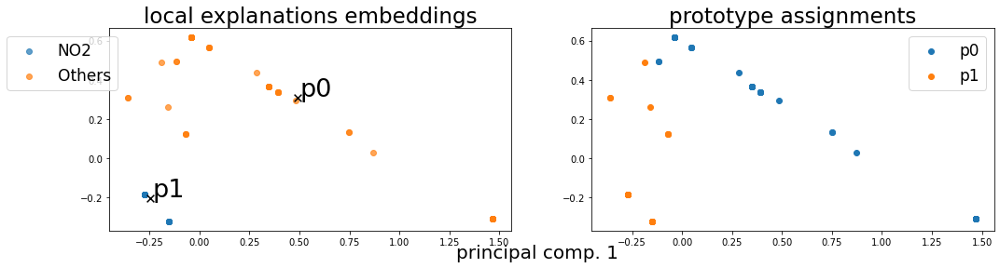

Alpha norms:
tensor([[0.9913, 1.0000],
        [1.0000, 0.4302]], grad_fn=<DivBackward0>)
Concept Purity: 0.965000 +- 0.035000
Concept distribution:  (array([0, 1], dtype=int64), array([ 55, 100], dtype=int64))
Logic formulas:
For class 0:
0.8285714285714286 (feature001) | ((feature000 & feature001)
For class 1:
0.8285714285714286 (feature000)
Accuracy as classifier:  0.8286
LEN fidelity:  tensor(0.8286)

num_proto:  4 Fidelity: tensor(0.8286)
(array([0., 1.], dtype=float32), array([93, 62], dtype=int64))


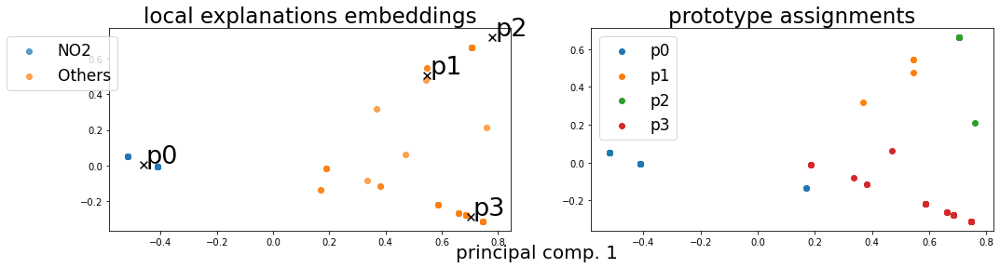

Alpha norms:
tensor([[1.0000, 0.8854, 0.9706, 0.6826],
        [1.0000, 0.2302, 0.2322, 0.1928]], grad_fn=<DivBackward0>)
Concept Purity: 0.994737 +- 0.009116
Concept distribution:  (array([0, 1, 2, 3], dtype=int64), array([95,  4, 14, 42], dtype=int64))
Logic formulas:
For class 0:
0.8285714285714286 (feature000) | (feature002 & feature000) | ((feature003 & feature000) | (feature001 & feature000)
For class 1:
0.8285714285714286 (feature002) | ((feature003) | (feature001)
Accuracy as classifier:  0.8286
LEN fidelity:  tensor(0.8286)

num_proto:  6 Fidelity: tensor(0.8381)
(array([0., 1.], dtype=float32), array([93, 62], dtype=int64))


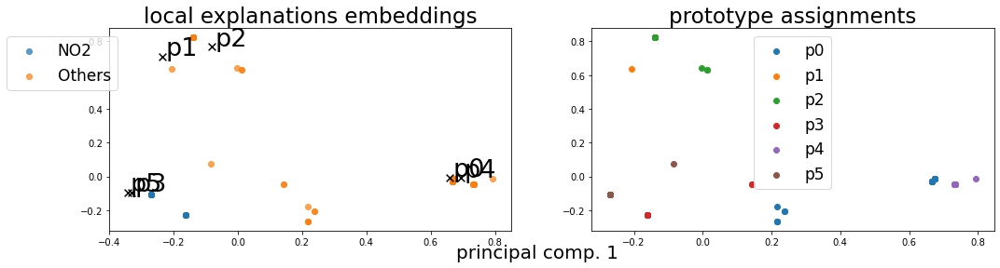

Alpha norms:
tensor([[0.2158, 0.4391, 0.3203, 1.0000, 0.3702, 0.8767],
        [0.0984, 1.0000, 0.1851, 0.2594, 0.1162, 0.2658]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.961047 +- 0.082068
Concept distribution:  (array([0, 1, 2, 3, 4, 5], dtype=int64), array([32,  1, 16,  9, 10, 87], dtype=int64))
Logic formulas:
For class 0:
0.8380952380952381 (feature005) | (feature003) | (feature005 & feature003) | ((feature000 & feature005) | (feature002 & feature005)
For class 1:
0.8380952380952381 (feature002) | (feature004) | ((feature000) | ((feature000 & feature004) | (feature001)
Accuracy as classifier:  0.8381
LEN fidelity:  tensor(0.8381)

num_proto:  8 Fidelity: tensor(0.7905)
(array([0., 1.], dtype=float32), array([93, 62], dtype=int64))


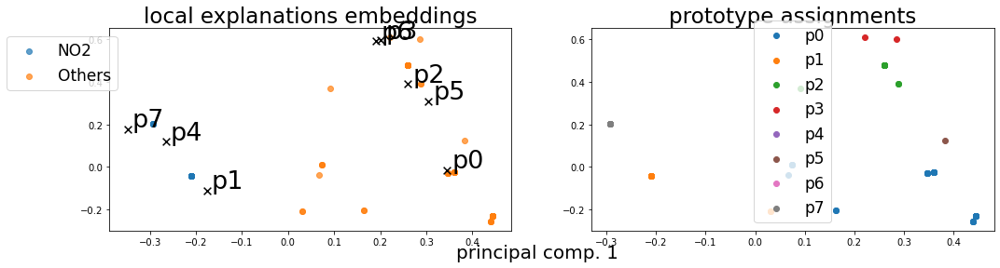

Alpha norms:
tensor([[0.6158, 1.0000, 0.7548, 0.9656, 0.7167, 0.7016, 0.6598, 0.7582],
        [0.2958, 1.0000, 0.2318, 0.3925, 0.2594, 0.2728, 0.2840, 0.4769]],
       grad_fn=<DivBackward0>)
Concept Purity: 0.996212 +- 0.008470
Concept distribution:  (array([0, 1, 2, 3, 5, 7], dtype=int64), array([41, 88, 16,  2,  1,  7], dtype=int64))
Logic formulas:
For class 0:
0.8380952380952381 (feature001) | (feature002) | (feature007) | (feature007 & feature001) | ((feature000 & feature001) | (feature002 & feature001)
For class 1:
0.819047619047619 (feature000) | ((feature002) | (feature003)

------------------------------------------------------------------------------------
Has double activations  tensor(7)
But only for wrong predictions

Accuracy as classifier:  0.7905
LEN fidelity:  tensor(0.7905)



In [52]:
batch_sampler = utils.GroupBatchSampler(num_input_graphs=128, drop_last=False, belonging=np.array(belonging_train))
train_group_loader = DataLoader(dataset_train, batch_sampler=batch_sampler)

batch_sampler = utils.GroupBatchSampler(num_input_graphs=256, drop_last=False, belonging=np.array(belonging_val))
val_group_loader = DataLoader(dataset_val, batch_sampler=batch_sampler)

batch_sampler = utils.GroupBatchSampler(num_input_graphs=256, drop_last=False, belonging=np.array(belonging_test))
test_group_loader = DataLoader(dataset_test, batch_sampler=batch_sampler)

metrics = []
for num_p in [2, 4, 6, 8]:
    with open(f'../logs/model_focal_num_proto_{num_p}_Mutagenicity.pkl', 'rb') as handle:
        uno = pickle.load(handle)
        del uno.dataloader
        del uno.val_dataloader
        metrics.append(uno)
        print("num_proto: ", num_p, "Fidelity:", uno.val_metrics[uno.early_stopping.best_epoch-1]["acc_overall"])
        uno.inspect_embedding(val_group_loader)

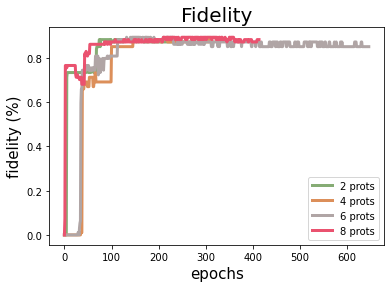

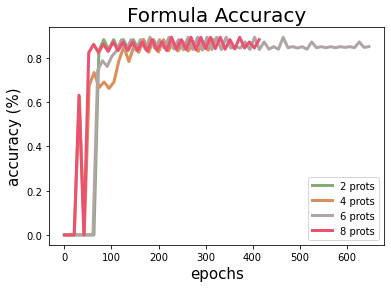

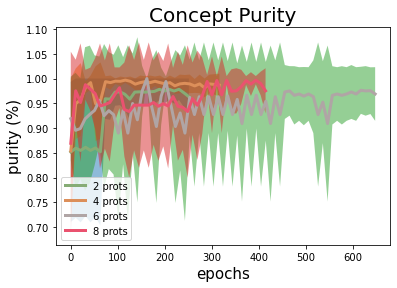

In [36]:
cs = ["#86ac75", "#dc8f5a", "#b0a5a5", "#ea526f", "blue"]

c = 0
for i , m in enumerate(metrics):
    #if i % 2 == 1: continue
    plt.plot([e["acc_overall"] for e in m.val_metrics], label=f"{m.hyper['num_prototypes']} prots", linewidth=3, color=cs[c])
    c += 1
plt.legend()
plt.title("Fidelity", size=20)
plt.xlabel("epochs", size=15)
plt.ylabel("fidelity (%)", size=15)
plt.savefig("fidelity_num_proto_mutagenicity.pdf")
plt.show()

c = 0
for i , m in enumerate(metrics):
    #if i % 2 == 1: continue
    plt.plot(np.linspace(0, len([e["acc_overall"] for e in m.val_metrics]), num=len([e["logic_acc_clf"] for e in m.val_logic_metrics])), [e["logic_acc_clf"] for e in m.val_logic_metrics], label=f"{m.hyper['num_prototypes']} prots", linewidth=3, color=cs[c])
    c += 1
plt.legend()
plt.title("Formula Accuracy", size=20)
plt.xlabel("epochs", size=15)
plt.ylabel("accuracy (%)", size=15)
plt.savefig("acc_num_proto_mutagenicity.pdf")
plt.show()

c = 0
for i , m in enumerate(metrics):
    #if i % 2 == 1: continue
    purity     = np.array([e["concept_purity"] for e in m.val_logic_metrics])
    std_purity = np.array([e["concept_purity_std"] for e in m.val_logic_metrics])
    plt.plot(np.linspace(0, len([e["acc_overall"] for e in m.val_metrics]), num=len(purity)), purity, label=f"{m.hyper['num_prototypes']} prots", linewidth=3, color=cs[c])
    plt.fill_between(np.linspace(0, len([e["acc_overall"] for e in m.val_metrics]), num=len([e["logic_acc_clf"] for e in m.val_logic_metrics])), purity-std_purity, purity+std_purity, alpha=0.5)
    c += 1

plt.legend()
plt.title("Concept Purity", size=20)
plt.xlabel("epochs", size=15)
plt.ylabel("purity (%)", size=15)
plt.savefig("purity_num_proto_mutagenicity.pdf")
plt.show()

## Ablation on Deltas params

(array([0., 1.], dtype=float32), array([675, 451], dtype=int64))


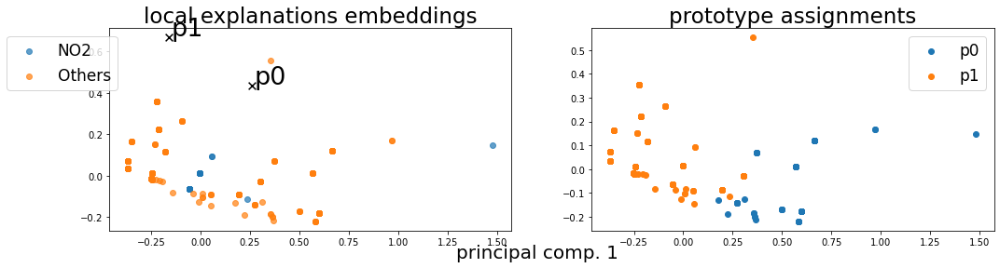

Alpha norms:
tensor([[1.0000, 0.6722],
        [0.7495, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.848798 +- 0.145249
Concept distribution:  (array([0, 1], dtype=int64), array([168, 958], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 0.06981, LEN: 0.067593, AccxC: 0.27, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.08887, V. LEN 0.09
  2: Loss: 0.06875, LEN: 0.067306, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.08796, V. LEN 0.09
  3: Loss: 0.06806, LEN: 0.067078, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.08704, V. LEN 0.09
  4: Loss: 0.06748, LEN: 0.066864, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.08637, V. LEN 0.09
  5: Loss: 0.06709, LEN: 0.066625, AccxC: 0.75, AccO: 0.00, V. Acc: 0.73, V. Loss: 0.08592, V. LEN 0.09
  6: Loss: 0.06746, LEN: 0.067037, AccxC: 0.75, AccO: 0.24, V. Acc: 0.11, V. Loss: 0.08670, V. LEN 0.09
  7: Loss: 0.06727, LEN: 0.066927, AccxC: 0.75, AccO:

 77: Loss: 0.04031, LEN: 0.040224, AccxC: 0.83, AccO: 0.83, V. Acc: 0.82, V. Loss: 0.05113, V. LEN 0.05
 78: Loss: 0.04067, LEN: 0.040576, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05202, V. LEN 0.05
 79: Loss: 0.04111, LEN: 0.041005, AccxC: 0.83, AccO: 0.83, V. Acc: 0.82, V. Loss: 0.05225, V. LEN 0.05


 80: Loss: 0.03969, LEN: 0.039591, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05219, V. LEN 0.05
 81: Loss: 0.03972, LEN: 0.039590, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05215, V. LEN 0.05
 82: Loss: 0.04070, LEN: 0.040580, AccxC: 0.83, AccO: 0.83, V. Acc: 0.82, V. Loss: 0.05214, V. LEN 0.05
 83: Loss: 0.03981, LEN: 0.039685, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.04909, V. LEN 0.05
 84: Loss: 0.04001, LEN: 0.039906, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05204, V. LEN 0.05
 85: Loss: 0.04041, LEN: 0.040293, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05201, V. LEN 0.05
 86: Loss: 0.04052, LEN: 0.040378, AccxC: 0.82, AccO: 0.82, V.

156: Loss: 0.04167, LEN: 0.041548, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05239, V. LEN 0.05
157: Loss: 0.04231, LEN: 0.042159, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.04932, V. LEN 0.05
158: Loss: 0.04024, LEN: 0.040065, AccxC: 0.83, AccO: 0.83, V. Acc: 0.82, V. Loss: 0.04932, V. LEN 0.05
159: Loss: 0.03995, LEN: 0.039785, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.05187, V. LEN 0.05


160: Loss: 0.03995, LEN: 0.039806, AccxC: 0.83, AccO: 0.83, V. Acc: 0.83, V. Loss: 0.04975, V. LEN 0.05
161: Loss: 0.04035, LEN: 0.040209, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.05184, V. LEN 0.05
162: Loss: 0.04034, LEN: 0.040168, AccxC: 0.83, AccO: 0.83, V. Acc: 0.80, V. Loss: 0.05445, V. LEN 0.05
163: Loss: 0.04070, LEN: 0.040526, AccxC: 0.83, AccO: 0.83, V. Acc: 0.81, V. Loss: 0.05189, V. LEN 0.05
164: Loss: 0.03889, LEN: 0.038733, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.04932, V. LEN 0.05
165: Loss: 0.04216, LEN: 0.042013, AccxC: 0.82, AccO: 0.82, V.

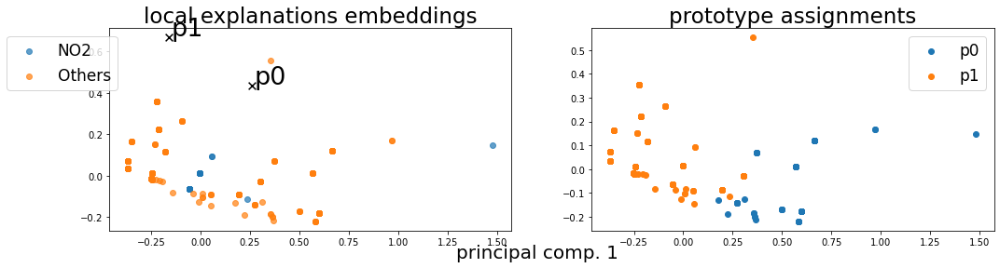

Alpha norms:
tensor([[1.0000, 0.6722],
        [0.7495, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.848798 +- 0.145249
Concept distribution:  (array([0, 1], dtype=int64), array([168, 958], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 0.06970, LEN: 0.067593, AccxC: 0.27, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.08876, V. LEN 0.09
  2: Loss: 0.06870, LEN: 0.067310, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.08789, V. LEN 0.09
  3: Loss: 0.06803, LEN: 0.067076, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.08702, V. LEN 0.09
  4: Loss: 0.06745, LEN: 0.066864, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.08634, V. LEN 0.09
  5: Loss: 0.06709, LEN: 0.066649, AccxC: 0.75, AccO: 0.00, V. Acc: 0.19, V. Loss: 0.08683, V. LEN 0.09
  6: Loss: 0.06744, LEN: 0.067068, AccxC: 0.75, AccO: 0.17, V. Acc: 0.11, V. Loss: 0.08649, V. LEN 0.09
  7: Loss: 0.06711, LEN: 0.066802, AccxC: 0.75, AccO:

 77: Loss: 0.04046, LEN: 0.040381, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05113, V. LEN 0.05
 78: Loss: 0.04054, LEN: 0.040465, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05202, V. LEN 0.05
 79: Loss: 0.04101, LEN: 0.040914, AccxC: 0.83, AccO: 0.83, V. Acc: 0.82, V. Loss: 0.05225, V. LEN 0.05


 80: Loss: 0.03965, LEN: 0.039560, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05218, V. LEN 0.05
 81: Loss: 0.03977, LEN: 0.039661, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05213, V. LEN 0.05
 82: Loss: 0.04081, LEN: 0.040702, AccxC: 0.83, AccO: 0.83, V. Acc: 0.82, V. Loss: 0.05212, V. LEN 0.05
 83: Loss: 0.03979, LEN: 0.039678, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.04812, V. LEN 0.05
 84: Loss: 0.03968, LEN: 0.039582, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05203, V. LEN 0.05
 85: Loss: 0.04031, LEN: 0.040197, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05201, V. LEN 0.05
 86: Loss: 0.04048, LEN: 0.040347, AccxC: 0.82, AccO: 0.82, V.

156: Loss: 0.04140, LEN: 0.041279, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05243, V. LEN 0.05
157: Loss: 0.04223, LEN: 0.042083, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.04939, V. LEN 0.05
158: Loss: 0.04007, LEN: 0.039902, AccxC: 0.83, AccO: 0.83, V. Acc: 0.82, V. Loss: 0.04938, V. LEN 0.05
159: Loss: 0.03937, LEN: 0.039208, AccxC: 0.82, AccO: 0.82, V. Acc: 0.80, V. Loss: 0.05449, V. LEN 0.05


160: Loss: 0.04045, LEN: 0.040307, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05239, V. LEN 0.05
161: Loss: 0.03989, LEN: 0.039747, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05192, V. LEN 0.05
162: Loss: 0.03996, LEN: 0.039796, AccxC: 0.83, AccO: 0.83, V. Acc: 0.81, V. Loss: 0.05192, V. LEN 0.05
163: Loss: 0.04045, LEN: 0.040281, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05196, V. LEN 0.05
164: Loss: 0.03819, LEN: 0.038036, AccxC: 0.83, AccO: 0.83, V. Acc: 0.83, V. Loss: 0.04985, V. LEN 0.05
165: Loss: 0.04282, LEN: 0.042672, AccxC: 0.82, AccO: 0.82, V.

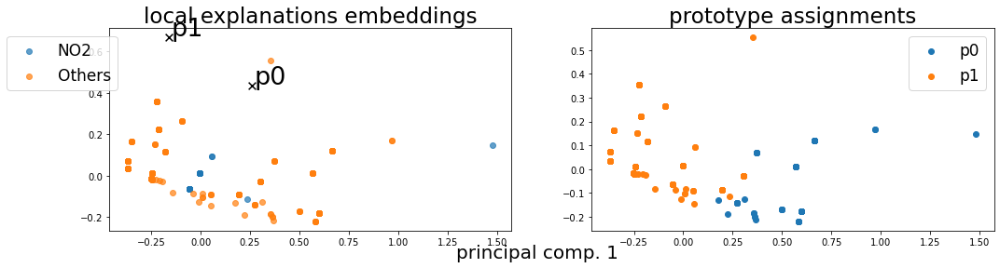

Alpha norms:
tensor([[1.0000, 0.6722],
        [0.7495, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.848798 +- 0.145249
Concept distribution:  (array([0, 1], dtype=int64), array([168, 958], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 0.17852, LEN: 0.067577, AccxC: 0.28, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.19167, V. LEN 0.09
  2: Loss: 0.13464, LEN: 0.067310, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.15139, V. LEN 0.09
  3: Loss: 0.10939, LEN: 0.067076, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.12025, V. LEN 0.09
  4: Loss: 0.09108, LEN: 0.066871, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.10272, V. LEN 0.09
  5: Loss: 0.08492, LEN: 0.066618, AccxC: 0.75, AccO: 0.00, V. Acc: 0.78, V. Loss: 0.09972, V. LEN 0.09
  6: Loss: 0.08142, LEN: 0.066436, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.09791, V. LEN 0.09
  7: Loss: 0.07872, LEN: 0.066240, AccxC: 0.75, AccO:

 77: Loss: 0.05542, LEN: 0.054901, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.06870, V. LEN 0.07
 78: Loss: 0.05577, LEN: 0.055279, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.06872, V. LEN 0.07
 79: Loss: 0.05540, LEN: 0.054887, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.06862, V. LEN 0.07


 80: Loss: 0.05650, LEN: 0.056038, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.06870, V. LEN 0.07
 81: Loss: 0.05691, LEN: 0.056432, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.06854, V. LEN 0.07
 82: Loss: 0.05612, LEN: 0.055657, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.06867, V. LEN 0.07
 83: Loss: 0.05648, LEN: 0.056041, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.06857, V. LEN 0.07
 84: Loss: 0.05572, LEN: 0.055269, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.06855, V. LEN 0.07
 85: Loss: 0.05529, LEN: 0.054868, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.06859, V. LEN 0.07
 86: Loss: 0.05567, LEN: 0.055254, AccxC: 0.75, AccO: 0.75, V.

156: Loss: 0.04192, LEN: 0.041431, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05406, V. LEN 0.05
157: Loss: 0.04095, LEN: 0.040357, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05291, V. LEN 0.05
158: Loss: 0.04056, LEN: 0.040084, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05376, V. LEN 0.05
159: Loss: 0.04065, LEN: 0.040157, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05324, V. LEN 0.05


160: Loss: 0.04353, LEN: 0.043027, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05616, V. LEN 0.06
161: Loss: 0.04036, LEN: 0.039874, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05334, V. LEN 0.05
162: Loss: 0.04102, LEN: 0.040424, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05361, V. LEN 0.05
163: Loss: 0.03954, LEN: 0.038997, AccxC: 0.83, AccO: 0.83, V. Acc: 0.82, V. Loss: 0.05310, V. LEN 0.05
164: Loss: 0.03931, LEN: 0.038855, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05368, V. LEN 0.05
165: Loss: 0.04018, LEN: 0.039593, AccxC: 0.82, AccO: 0.82, V.

235: Loss: 0.04314, LEN: 0.042597, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05600, V. LEN 0.06
236: Loss: 0.04082, LEN: 0.040364, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05376, V. LEN 0.05
237: Loss: 0.03963, LEN: 0.039194, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05625, V. LEN 0.06
238: Loss: 0.04366, LEN: 0.043074, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.05628, V. LEN 0.06
239: Loss: 0.03931, LEN: 0.038821, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05376, V. LEN 0.05


240: Loss: 0.04104, LEN: 0.040501, AccxC: 0.83, AccO: 0.83, V. Acc: 0.81, V. Loss: 0.05611, V. LEN 0.06
241: Loss: 0.03974, LEN: 0.039263, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05626, V. LEN 0.06
242: Loss: 0.04126, LEN: 0.040703, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.05627, V. LEN 0.06
243: Loss: 0.03990, LEN: 0.039439, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05579, V. LEN 0.06
244: Loss: 0.03998, LEN: 0.039436, AccxC: 0.83, AccO: 0.83, V.

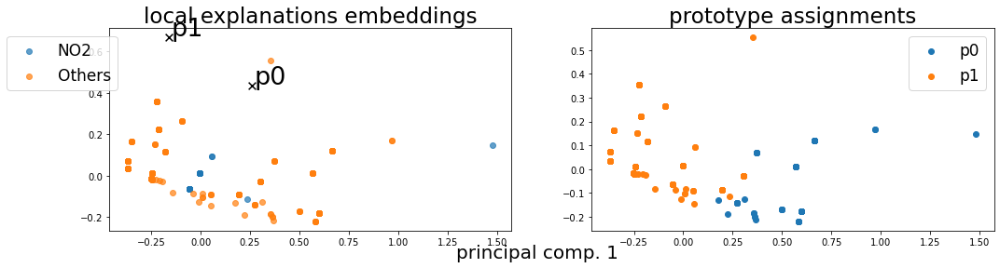

Alpha norms:
tensor([[1.0000, 0.6722],
        [0.7495, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.848798 +- 0.145249
Concept distribution:  (array([0, 1], dtype=int64), array([168, 958], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 1.16792, LEN: 0.067577, AccxC: 0.28, AccO: 0.00, V. Acc: 0.00, V. Loss: 1.12684, V. LEN 0.09
  2: Loss: 0.73366, LEN: 0.067310, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.72775, V. LEN 0.09
  3: Loss: 0.48495, LEN: 0.067076, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.42243, V. LEN 0.09
  4: Loss: 0.30537, LEN: 0.066871, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.25096, V. LEN 0.09
  5: Loss: 0.24639, LEN: 0.066618, AccxC: 0.75, AccO: 0.00, V. Acc: 0.78, V. Loss: 0.22415, V. LEN 0.09
  6: Loss: 0.21281, LEN: 0.066436, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.20921, V. LEN 0.09
  7: Loss: 0.18762, LEN: 0.066240, AccxC: 0.75, AccO:

 77: Loss: 0.05879, LEN: 0.054956, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.07317, V. LEN 0.07
 78: Loss: 0.05905, LEN: 0.055335, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.07382, V. LEN 0.07
 79: Loss: 0.05890, LEN: 0.054945, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.07313, V. LEN 0.07


 80: Loss: 0.05967, LEN: 0.056091, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.07402, V. LEN 0.07
 81: Loss: 0.06013, LEN: 0.056485, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.07273, V. LEN 0.07
 82: Loss: 0.05920, LEN: 0.055713, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.07357, V. LEN 0.07
 83: Loss: 0.05949, LEN: 0.056097, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.07273, V. LEN 0.07
 84: Loss: 0.05875, LEN: 0.055327, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.07323, V. LEN 0.07
 85: Loss: 0.05835, LEN: 0.054925, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.07314, V. LEN 0.07
 86: Loss: 0.05856, LEN: 0.055313, AccxC: 0.75, AccO: 0.75, V.

156: Loss: 0.05733, LEN: 0.055712, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.07435, V. LEN 0.07
157: Loss: 0.05969, LEN: 0.058016, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.07307, V. LEN 0.07
158: Loss: 0.05767, LEN: 0.056099, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.07438, V. LEN 0.07
159: Loss: 0.05761, LEN: 0.056100, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.07402, V. LEN 0.07


160: Loss: 0.05859, LEN: 0.056864, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.07476, V. LEN 0.07
161: Loss: 0.05647, LEN: 0.054958, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.07354, V. LEN 0.07
162: Loss: 0.05885, LEN: 0.057237, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.07346, V. LEN 0.07
163: Loss: 0.05808, LEN: 0.056485, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.07416, V. LEN 0.07
164: Loss: 0.05685, LEN: 0.055332, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.07440, V. LEN 0.07
165: Loss: 0.05840, LEN: 0.056863, AccxC: 0.75, AccO: 0.75, V.

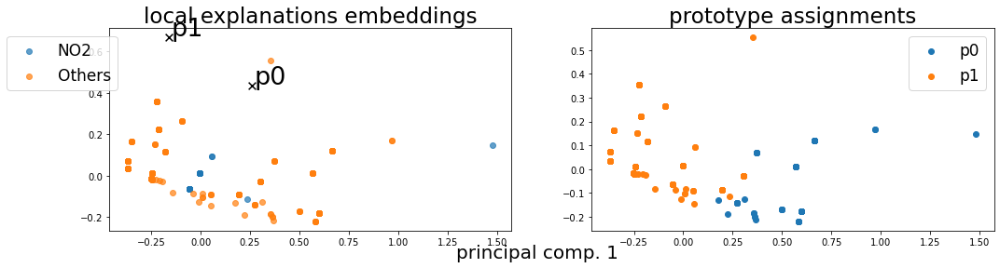

Alpha norms:
tensor([[1.0000, 0.6722],
        [0.7495, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.848798 +- 0.145249
Concept distribution:  (array([0, 1], dtype=int64), array([168, 958], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 2.51139, LEN: 0.067577, AccxC: 0.28, AccO: 0.00, V. Acc: 0.00, V. Loss: 2.39671, V. LEN 0.09
  2: Loss: 1.54707, LEN: 0.067310, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 1.51050, V. LEN 0.09
  3: Loss: 0.99503, LEN: 0.067076, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.83293, V. LEN 0.09
  4: Loss: 0.59640, LEN: 0.066871, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.45236, V. LEN 0.09
  5: Loss: 0.46561, LEN: 0.066618, AccxC: 0.75, AccO: 0.00, V. Acc: 0.78, V. Loss: 0.39310, V. LEN 0.09
  6: Loss: 0.39120, LEN: 0.066436, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.36030, V. LEN 0.09
  7: Loss: 0.33546, LEN: 0.066240, AccxC: 0.75, AccO:

 77: Loss: 0.06304, LEN: 0.054956, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.07889, V. LEN 0.07
 78: Loss: 0.06316, LEN: 0.055335, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.08034, V. LEN 0.07
 79: Loss: 0.06331, LEN: 0.054945, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.07884, V. LEN 0.07


 80: Loss: 0.06363, LEN: 0.056091, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.08086, V. LEN 0.07
 81: Loss: 0.06417, LEN: 0.056485, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.07797, V. LEN 0.07
 82: Loss: 0.06305, LEN: 0.055713, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.07987, V. LEN 0.07
 83: Loss: 0.06322, LEN: 0.056097, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.07796, V. LEN 0.07
 84: Loss: 0.06251, LEN: 0.055327, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.07911, V. LEN 0.07
 85: Loss: 0.06211, LEN: 0.054925, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.07891, V. LEN 0.07
 86: Loss: 0.06212, LEN: 0.055313, AccxC: 0.75, AccO: 0.75, V.

156: Loss: 0.05904, LEN: 0.055712, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.08183, V. LEN 0.07
157: Loss: 0.06148, LEN: 0.058016, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.07902, V. LEN 0.07
158: Loss: 0.05933, LEN: 0.056099, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.08147, V. LEN 0.07
159: Loss: 0.05920, LEN: 0.056100, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.08102, V. LEN 0.07


160: Loss: 0.06044, LEN: 0.056864, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.08266, V. LEN 0.07
161: Loss: 0.05806, LEN: 0.054958, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.07981, V. LEN 0.07
162: Loss: 0.06058, LEN: 0.057237, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.07973, V. LEN 0.07
163: Loss: 0.05977, LEN: 0.056485, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.08127, V. LEN 0.07
164: Loss: 0.05844, LEN: 0.055332, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.08181, V. LEN 0.07
165: Loss: 0.06004, LEN: 0.056863, AccxC: 0.75, AccO: 0.75, V.

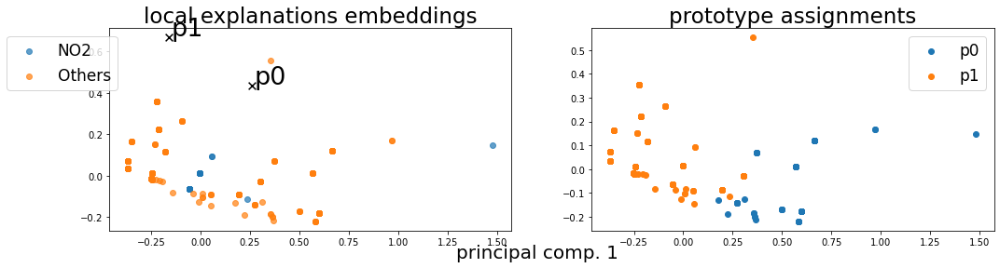

Alpha norms:
tensor([[1.0000, 0.6722],
        [0.7495, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.848798 +- 0.145249
Concept distribution:  (array([0, 1], dtype=int64), array([168, 958], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 0.16914, LEN: 0.067577, AccxC: 0.27, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.19108, V. LEN 0.09
  2: Loss: 0.13664, LEN: 0.067317, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.16226, V. LEN 0.09
  3: Loss: 0.11553, LEN: 0.067085, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.14404, V. LEN 0.09
  4: Loss: 0.09352, LEN: 0.066858, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.11209, V. LEN 0.09
  5: Loss: 0.07810, LEN: 0.066632, AccxC: 0.75, AccO: 0.00, V. Acc: 0.73, V. Loss: 0.10390, V. LEN 0.09
  6: Loss: 0.07527, LEN: 0.066423, AccxC: 0.75, AccO: 0.69, V. Acc: 0.75, V. Loss: 0.09484, V. LEN 0.08
  7: Loss: 0.07253, LEN: 0.066238, AccxC: 0.75, AccO:

 77: Loss: 0.04230, LEN: 0.041900, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.05424, V. LEN 0.05
 78: Loss: 0.04252, LEN: 0.042175, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05414, V. LEN 0.05
 79: Loss: 0.04349, LEN: 0.043040, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05401, V. LEN 0.05


 80: Loss: 0.04141, LEN: 0.041017, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.05399, V. LEN 0.05
 81: Loss: 0.04110, LEN: 0.040671, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.05352, V. LEN 0.05
 82: Loss: 0.04303, LEN: 0.042648, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.05337, V. LEN 0.05
 83: Loss: 0.04219, LEN: 0.041727, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.05341, V. LEN 0.05
 84: Loss: 0.04159, LEN: 0.041130, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.05343, V. LEN 0.05
 85: Loss: 0.04216, LEN: 0.041739, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05315, V. LEN 0.05
 86: Loss: 0.04256, LEN: 0.041454, AccxC: 0.82, AccO: 0.82, V.

156: Loss: 0.04200, LEN: 0.041707, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05333, V. LEN 0.05
157: Loss: 0.04142, LEN: 0.040909, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05432, V. LEN 0.05
158: Loss: 0.04090, LEN: 0.040441, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05250, V. LEN 0.05
159: Loss: 0.03998, LEN: 0.039494, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05427, V. LEN 0.05


160: Loss: 0.04064, LEN: 0.040304, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05411, V. LEN 0.05
161: Loss: 0.03986, LEN: 0.039424, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05297, V. LEN 0.05
162: Loss: 0.04077, LEN: 0.040411, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05302, V. LEN 0.05
163: Loss: 0.03952, LEN: 0.039200, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05150, V. LEN 0.05
164: Loss: 0.03893, LEN: 0.038634, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05152, V. LEN 0.05
165: Loss: 0.03993, LEN: 0.039599, AccxC: 0.82, AccO: 0.82, V.

235: Loss: 0.04174, LEN: 0.041397, AccxC: 0.82, AccO: 0.82, V. Acc: 0.83, V. Loss: 0.05048, V. LEN 0.05
236: Loss: 0.04132, LEN: 0.040987, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05148, V. LEN 0.05
237: Loss: 0.03930, LEN: 0.038931, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05167, V. LEN 0.05
238: Loss: 0.04059, LEN: 0.040278, AccxC: 0.82, AccO: 0.82, V. Acc: 0.83, V. Loss: 0.05089, V. LEN 0.05
239: Loss: 0.03850, LEN: 0.038166, AccxC: 0.83, AccO: 0.83, V. Acc: 0.83, V. Loss: 0.05003, V. LEN 0.05


240: Loss: 0.04132, LEN: 0.040966, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05093, V. LEN 0.05
241: Loss: 0.03941, LEN: 0.039075, AccxC: 0.82, AccO: 0.82, V. Acc: 0.83, V. Loss: 0.04997, V. LEN 0.05
242: Loss: 0.03808, LEN: 0.037640, AccxC: 0.82, AccO: 0.82, V. Acc: 0.83, V. Loss: 0.05014, V. LEN 0.05
243: Loss: 0.03920, LEN: 0.038899, AccxC: 0.83, AccO: 0.83, V. Acc: 0.83, V. Loss: 0.05018, V. LEN 0.05
244: Loss: 0.04035, LEN: 0.040058, AccxC: 0.82, AccO: 0.82, V.

314: Loss: 0.04000, LEN: 0.038570, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05060, V. LEN 0.05
315: Loss: 0.04159, LEN: 0.041267, AccxC: 0.83, AccO: 0.83, V. Acc: 0.82, V. Loss: 0.05104, V. LEN 0.05
316: Loss: 0.03908, LEN: 0.038666, AccxC: 0.83, AccO: 0.83, V. Acc: 0.82, V. Loss: 0.05077, V. LEN 0.05
317: Loss: 0.04095, LEN: 0.040471, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05081, V. LEN 0.05
318: Loss: 0.04244, LEN: 0.042164, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05186, V. LEN 0.05
319: Loss: 0.03900, LEN: 0.038740, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05203, V. LEN 0.05


320: Loss: 0.04111, LEN: 0.040868, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05155, V. LEN 0.05
321: Loss: 0.04003, LEN: 0.039779, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05107, V. LEN 0.05
Early Stopping
Loading model at epoch 220
Best epoch: 220
Trained lasted for 86 seconds
(array([0., 1.], dtype=float32), array([675, 451], dtype=int64))


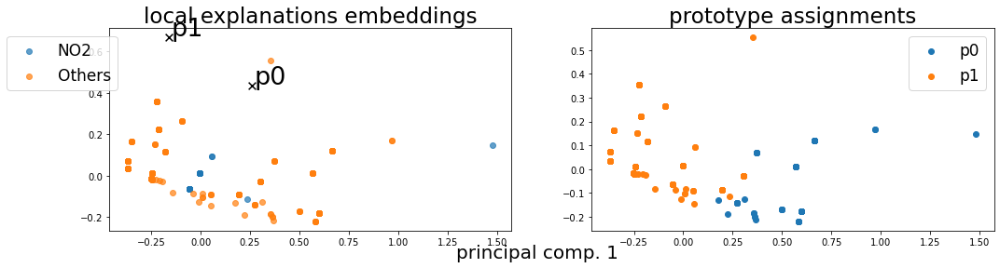

Alpha norms:
tensor([[1.0000, 0.6722],
        [0.7495, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.848798 +- 0.145249
Concept distribution:  (array([0, 1], dtype=int64), array([168, 958], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 0.16904, LEN: 0.067577, AccxC: 0.27, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.19099, V. LEN 0.09
  2: Loss: 0.13659, LEN: 0.067317, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.16220, V. LEN 0.09
  3: Loss: 0.11549, LEN: 0.067085, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.14398, V. LEN 0.09
  4: Loss: 0.09349, LEN: 0.066858, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.11204, V. LEN 0.09
  5: Loss: 0.07808, LEN: 0.066632, AccxC: 0.75, AccO: 0.00, V. Acc: 0.73, V. Loss: 0.10388, V. LEN 0.09
  6: Loss: 0.07524, LEN: 0.066423, AccxC: 0.75, AccO: 0.69, V. Acc: 0.75, V. Loss: 0.09481, V. LEN 0.08
  7: Loss: 0.07250, LEN: 0.066238, AccxC: 0.75, AccO:

 77: Loss: 0.04312, LEN: 0.042685, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.05554, V. LEN 0.05
 78: Loss: 0.04390, LEN: 0.043130, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.05561, V. LEN 0.05
 79: Loss: 0.04415, LEN: 0.043743, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05540, V. LEN 0.05


 80: Loss: 0.04178, LEN: 0.041386, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05522, V. LEN 0.05
 81: Loss: 0.04280, LEN: 0.042439, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.05534, V. LEN 0.05
 82: Loss: 0.04295, LEN: 0.042593, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05512, V. LEN 0.05
 83: Loss: 0.04305, LEN: 0.042516, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.05546, V. LEN 0.05
 84: Loss: 0.04197, LEN: 0.041293, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.05489, V. LEN 0.05
 85: Loss: 0.04209, LEN: 0.041702, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05490, V. LEN 0.05
 86: Loss: 0.04171, LEN: 0.041384, AccxC: 0.82, AccO: 0.82, V.

156: Loss: 0.04147, LEN: 0.041163, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05423, V. LEN 0.05
157: Loss: 0.04095, LEN: 0.040630, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05479, V. LEN 0.05
158: Loss: 0.04096, LEN: 0.040696, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05373, V. LEN 0.05
159: Loss: 0.03998, LEN: 0.039719, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05379, V. LEN 0.05


160: Loss: 0.04127, LEN: 0.041016, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.05380, V. LEN 0.05
161: Loss: 0.03996, LEN: 0.039702, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.05380, V. LEN 0.05
162: Loss: 0.04075, LEN: 0.040472, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05215, V. LEN 0.05
163: Loss: 0.04104, LEN: 0.040813, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.05236, V. LEN 0.05
164: Loss: 0.03858, LEN: 0.038283, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05400, V. LEN 0.05
165: Loss: 0.04119, LEN: 0.040832, AccxC: 0.82, AccO: 0.82, V.

235: Loss: 0.04166, LEN: 0.041386, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05406, V. LEN 0.05
236: Loss: 0.04141, LEN: 0.041153, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05403, V. LEN 0.05
237: Loss: 0.04154, LEN: 0.041241, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05411, V. LEN 0.05
238: Loss: 0.04088, LEN: 0.040657, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05442, V. LEN 0.05
239: Loss: 0.03916, LEN: 0.038854, AccxC: 0.83, AccO: 0.83, V. Acc: 0.81, V. Loss: 0.05462, V. LEN 0.05


240: Loss: 0.04261, LEN: 0.042367, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05490, V. LEN 0.05
241: Loss: 0.03991, LEN: 0.039622, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05538, V. LEN 0.05
242: Loss: 0.03902, LEN: 0.038731, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05465, V. LEN 0.05
243: Loss: 0.04022, LEN: 0.039956, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05433, V. LEN 0.05
244: Loss: 0.04006, LEN: 0.039857, AccxC: 0.82, AccO: 0.82, V.

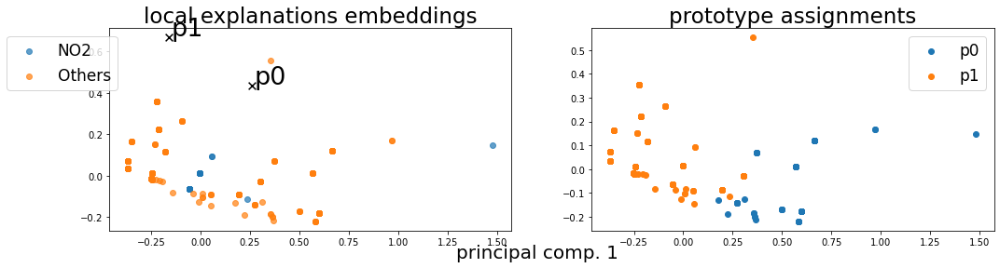

Alpha norms:
tensor([[1.0000, 0.6722],
        [0.7495, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.848798 +- 0.145249
Concept distribution:  (array([0, 1], dtype=int64), array([168, 958], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 0.27785, LEN: 0.067592, AccxC: 0.27, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.29516, V. LEN 0.09
  2: Loss: 0.20419, LEN: 0.067307, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.24100, V. LEN 0.09
  3: Loss: 0.15966, LEN: 0.067077, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.17752, V. LEN 0.09
  4: Loss: 0.12120, LEN: 0.066872, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.13305, V. LEN 0.09
  5: Loss: 0.10237, LEN: 0.066598, AccxC: 0.75, AccO: 0.00, V. Acc: 0.74, V. Loss: 0.12197, V. LEN 0.09
  6: Loss: 0.09575, LEN: 0.066435, AccxC: 0.75, AccO: 0.69, V. Acc: 0.75, V. Loss: 0.11558, V. LEN 0.08
  7: Loss: 0.09052, LEN: 0.066232, AccxC: 0.75, AccO:

 77: Loss: 0.05277, LEN: 0.051200, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.06598, V. LEN 0.06
 78: Loss: 0.05307, LEN: 0.051644, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.06589, V. LEN 0.06
 79: Loss: 0.05352, LEN: 0.052161, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.06612, V. LEN 0.06


 80: Loss: 0.05316, LEN: 0.051803, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.06593, V. LEN 0.06
 81: Loss: 0.05339, LEN: 0.052014, AccxC: 0.78, AccO: 0.78, V. Acc: 0.80, V. Loss: 0.06614, V. LEN 0.06
 82: Loss: 0.05340, LEN: 0.052131, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.06570, V. LEN 0.06
 83: Loss: 0.05340, LEN: 0.052057, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.06600, V. LEN 0.06
 84: Loss: 0.05341, LEN: 0.052071, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.06596, V. LEN 0.06
 85: Loss: 0.05215, LEN: 0.050861, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.06653, V. LEN 0.06
 86: Loss: 0.05230, LEN: 0.051022, AccxC: 0.77, AccO: 0.77, V.

156: Loss: 0.04182, LEN: 0.041147, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05367, V. LEN 0.05
157: Loss: 0.04080, LEN: 0.040040, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05321, V. LEN 0.05
158: Loss: 0.04095, LEN: 0.040192, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05341, V. LEN 0.05
159: Loss: 0.04003, LEN: 0.039391, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05326, V. LEN 0.05


160: Loss: 0.04082, LEN: 0.040068, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05378, V. LEN 0.05
161: Loss: 0.03951, LEN: 0.038837, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05317, V. LEN 0.05
162: Loss: 0.04097, LEN: 0.040259, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05352, V. LEN 0.05
163: Loss: 0.04019, LEN: 0.039428, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05340, V. LEN 0.05
164: Loss: 0.03858, LEN: 0.037891, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05344, V. LEN 0.05
165: Loss: 0.04026, LEN: 0.039542, AccxC: 0.82, AccO: 0.82, V.

235: Loss: 0.04109, LEN: 0.040583, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05389, V. LEN 0.05
236: Loss: 0.04137, LEN: 0.040862, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05382, V. LEN 0.05
237: Loss: 0.04002, LEN: 0.039430, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05363, V. LEN 0.05
238: Loss: 0.04042, LEN: 0.039862, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05379, V. LEN 0.05
239: Loss: 0.03887, LEN: 0.038368, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05382, V. LEN 0.05


240: Loss: 0.04101, LEN: 0.040499, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05334, V. LEN 0.05
241: Loss: 0.03913, LEN: 0.038651, AccxC: 0.83, AccO: 0.83, V. Acc: 0.82, V. Loss: 0.05369, V. LEN 0.05
242: Loss: 0.03789, LEN: 0.037375, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05350, V. LEN 0.05
243: Loss: 0.03935, LEN: 0.038855, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05350, V. LEN 0.05
244: Loss: 0.03991, LEN: 0.039412, AccxC: 0.82, AccO: 0.82, V.

314: Loss: 0.03838, LEN: 0.037998, AccxC: 0.82, AccO: 0.82, V. Acc: 0.83, V. Loss: 0.05074, V. LEN 0.05
315: Loss: 0.04095, LEN: 0.040592, AccxC: 0.83, AccO: 0.83, V. Acc: 0.83, V. Loss: 0.05071, V. LEN 0.05
316: Loss: 0.03882, LEN: 0.038473, AccxC: 0.83, AccO: 0.83, V. Acc: 0.83, V. Loss: 0.05076, V. LEN 0.05
317: Loss: 0.04076, LEN: 0.040366, AccxC: 0.83, AccO: 0.83, V. Acc: 0.83, V. Loss: 0.05065, V. LEN 0.05
318: Loss: 0.04232, LEN: 0.041917, AccxC: 0.83, AccO: 0.83, V. Acc: 0.83, V. Loss: 0.05047, V. LEN 0.05
319: Loss: 0.03877, LEN: 0.038329, AccxC: 0.82, AccO: 0.82, V. Acc: 0.83, V. Loss: 0.05060, V. LEN 0.05


320: Loss: 0.04055, LEN: 0.040181, AccxC: 0.83, AccO: 0.83, V. Acc: 0.82, V. Loss: 0.05377, V. LEN 0.05
321: Loss: 0.04037, LEN: 0.039998, AccxC: 0.82, AccO: 0.82, V. Acc: 0.83, V. Loss: 0.05057, V. LEN 0.05
322: Loss: 0.04171, LEN: 0.041262, AccxC: 0.82, AccO: 0.82, V. Acc: 0.83, V. Loss: 0.05090, V. LEN 0.05
323: Loss: 0.03936, LEN: 0.038961, AccxC: 0.83, AccO: 0.83, V.

393: Loss: 0.04200, LEN: 0.041591, AccxC: 0.83, AccO: 0.83, V. Acc: 0.82, V. Loss: 0.05833, V. LEN 0.06
394: Loss: 0.04085, LEN: 0.040361, AccxC: 0.83, AccO: 0.83, V. Acc: 0.81, V. Loss: 0.05619, V. LEN 0.06
395: Loss: 0.03940, LEN: 0.039026, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05616, V. LEN 0.06
396: Loss: 0.03988, LEN: 0.039506, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05800, V. LEN 0.06
397: Loss: 0.04339, LEN: 0.042935, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05337, V. LEN 0.05
398: Loss: 0.03756, LEN: 0.037174, AccxC: 0.83, AccO: 0.83, V. Acc: 0.83, V. Loss: 0.05154, V. LEN 0.05
399: Loss: 0.03993, LEN: 0.039458, AccxC: 0.83, AccO: 0.83, V. Acc: 0.82, V. Loss: 0.05373, V. LEN 0.05


400: Loss: 0.04077, LEN: 0.040424, AccxC: 0.83, AccO: 0.83, V. Acc: 0.81, V. Loss: 0.05609, V. LEN 0.06
401: Loss: 0.04034, LEN: 0.039934, AccxC: 0.83, AccO: 0.83, V. Acc: 0.81, V. Loss: 0.05618, V. LEN 0.06
402: Loss: 0.04200, LEN: 0.041620, AccxC: 0.82, AccO: 0.82, V.

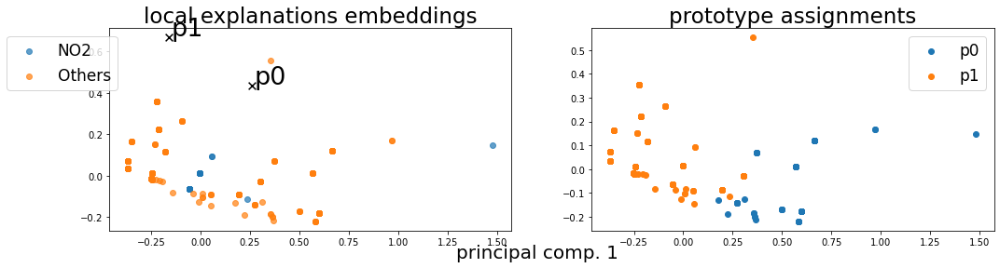

Alpha norms:
tensor([[1.0000, 0.6722],
        [0.7495, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.848798 +- 0.145249
Concept distribution:  (array([0, 1], dtype=int64), array([168, 958], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 1.26710, LEN: 0.067576, AccxC: 0.28, AccO: 0.00, V. Acc: 0.00, V. Loss: 1.23191, V. LEN 0.09
  2: Loss: 0.80656, LEN: 0.067307, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.82111, V. LEN 0.09
  3: Loss: 0.53964, LEN: 0.067075, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.48115, V. LEN 0.09
  4: Loss: 0.34317, LEN: 0.066870, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.29525, V. LEN 0.09
  5: Loss: 0.28068, LEN: 0.066618, AccxC: 0.75, AccO: 0.00, V. Acc: 0.78, V. Loss: 0.27203, V. LEN 0.09
  6: Loss: 0.24268, LEN: 0.066436, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.25458, V. LEN 0.09
  7: Loss: 0.21899, LEN: 0.066240, AccxC: 0.75, AccO:

 77: Loss: 0.06029, LEN: 0.054403, AccxC: 0.75, AccO: 0.74, V. Acc: 0.78, V. Loss: 0.07683, V. LEN 0.07
 78: Loss: 0.06236, LEN: 0.054770, AccxC: 0.75, AccO: 0.74, V. Acc: 0.78, V. Loss: 0.07926, V. LEN 0.07
 79: Loss: 0.06036, LEN: 0.054173, AccxC: 0.75, AccO: 0.74, V. Acc: 0.78, V. Loss: 0.07644, V. LEN 0.07


 80: Loss: 0.06247, LEN: 0.055591, AccxC: 0.75, AccO: 0.74, V. Acc: 0.78, V. Loss: 0.07573, V. LEN 0.07
 81: Loss: 0.06129, LEN: 0.056152, AccxC: 0.75, AccO: 0.74, V. Acc: 0.78, V. Loss: 0.07395, V. LEN 0.07
 82: Loss: 0.06059, LEN: 0.055251, AccxC: 0.75, AccO: 0.74, V. Acc: 0.78, V. Loss: 0.07581, V. LEN 0.07
 83: Loss: 0.06035, LEN: 0.054770, AccxC: 0.75, AccO: 0.74, V. Acc: 0.78, V. Loss: 0.07558, V. LEN 0.07
 84: Loss: 0.06078, LEN: 0.055169, AccxC: 0.75, AccO: 0.74, V. Acc: 0.78, V. Loss: 0.07546, V. LEN 0.07
 85: Loss: 0.05888, LEN: 0.053813, AccxC: 0.75, AccO: 0.74, V. Acc: 0.78, V. Loss: 0.07525, V. LEN 0.07
 86: Loss: 0.05959, LEN: 0.054602, AccxC: 0.75, AccO: 0.74, V.

156: Loss: 0.05831, LEN: 0.055006, AccxC: 0.75, AccO: 0.75, V. Acc: 0.79, V. Loss: 0.07312, V. LEN 0.07
157: Loss: 0.05913, LEN: 0.056444, AccxC: 0.75, AccO: 0.75, V. Acc: 0.79, V. Loss: 0.07148, V. LEN 0.07
158: Loss: 0.05802, LEN: 0.055729, AccxC: 0.75, AccO: 0.75, V. Acc: 0.79, V. Loss: 0.07425, V. LEN 0.07
159: Loss: 0.05702, LEN: 0.054648, AccxC: 0.76, AccO: 0.76, V. Acc: 0.79, V. Loss: 0.07148, V. LEN 0.07

------------------------------------------------------------------------------------
Has double activations  tensor(5)
But only for wrong predictions



160: Loss: 0.05951, LEN: 0.056050, AccxC: 0.75, AccO: 0.75, V. Acc: 0.79, V. Loss: 0.07427, V. LEN 0.07
161: Loss: 0.05622, LEN: 0.053769, AccxC: 0.75, AccO: 0.75, V. Acc: 0.79, V. Loss: 0.07252, V. LEN 0.07
162: Loss: 0.05910, LEN: 0.056493, AccxC: 0.76, AccO: 0.75, V. Acc: 0.79, V. Loss: 0.07239, V. LEN 0.07
163: Loss: 0.05807, LEN: 0.055770, AccxC: 0.75, AccO: 0.75, V. Acc: 0.79, V. Loss: 0.07291, V. LEN 0.07
164: Loss: 0.0

231: Loss: 0.05624, LEN: 0.054583, AccxC: 0.76, AccO: 0.76, V. Acc: 0.80, V. Loss: 0.07244, V. LEN 0.07
232: Loss: 0.05624, LEN: 0.054637, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07128, V. LEN 0.07
233: Loss: 0.05605, LEN: 0.054744, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07111, V. LEN 0.07
Early Stopping
Loading model at epoch 132
Best epoch: 132
Trained lasted for 60 seconds
(array([0., 1.], dtype=float32), array([675, 451], dtype=int64))


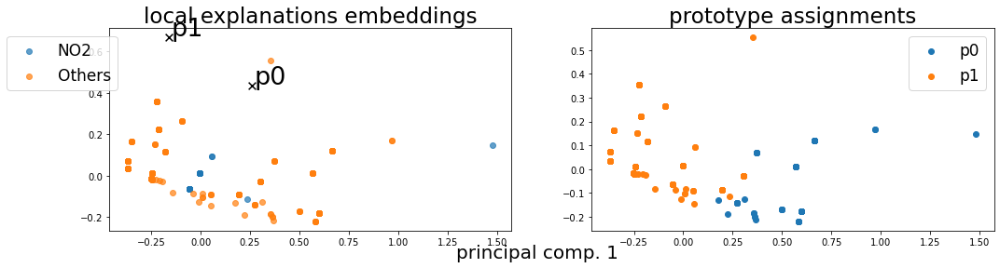

Alpha norms:
tensor([[1.0000, 0.6722],
        [0.7495, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.848798 +- 0.145249
Concept distribution:  (array([0, 1], dtype=int64), array([168, 958], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 2.61157, LEN: 0.067576, AccxC: 0.28, AccO: 0.00, V. Acc: 0.00, V. Loss: 2.50607, V. LEN 0.09
  2: Loss: 1.62381, LEN: 0.067309, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 1.60985, V. LEN 0.09
  3: Loss: 1.05458, LEN: 0.067075, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.89739, V. LEN 0.09
  4: Loss: 0.63810, LEN: 0.066870, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.50380, V. LEN 0.09
  5: Loss: 0.50291, LEN: 0.066617, AccxC: 0.75, AccO: 0.00, V. Acc: 0.78, V. Loss: 0.44752, V. LEN 0.09
  6: Loss: 0.42626, LEN: 0.066436, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.40913, V. LEN 0.09
  7: Loss: 0.37096, LEN: 0.066240, AccxC: 0.75, AccO:

 77: Loss: 0.06984, LEN: 0.054931, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.08332, V. LEN 0.07
 78: Loss: 0.06898, LEN: 0.055363, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.08677, V. LEN 0.07
 79: Loss: 0.06817, LEN: 0.054957, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.08443, V. LEN 0.07


 80: Loss: 0.06920, LEN: 0.056109, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.08412, V. LEN 0.07
 81: Loss: 0.07001, LEN: 0.056492, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.08005, V. LEN 0.07
 82: Loss: 0.06811, LEN: 0.055735, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.08212, V. LEN 0.07
 83: Loss: 0.06894, LEN: 0.056113, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.08070, V. LEN 0.07
 84: Loss: 0.06753, LEN: 0.055340, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.08143, V. LEN 0.07
 85: Loss: 0.06823, LEN: 0.054963, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.08116, V. LEN 0.07
 86: Loss: 0.06658, LEN: 0.055343, AccxC: 0.75, AccO: 0.75, V.

156: Loss: 0.06019, LEN: 0.055711, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.07947, V. LEN 0.07
157: Loss: 0.06245, LEN: 0.058009, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.07818, V. LEN 0.07
158: Loss: 0.06052, LEN: 0.056035, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.08086, V. LEN 0.07
159: Loss: 0.06061, LEN: 0.056007, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.07817, V. LEN 0.07


160: Loss: 0.06171, LEN: 0.056788, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.08260, V. LEN 0.07
161: Loss: 0.05946, LEN: 0.054908, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.07773, V. LEN 0.07
162: Loss: 0.06175, LEN: 0.057248, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.07919, V. LEN 0.07
163: Loss: 0.06054, LEN: 0.056392, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.08006, V. LEN 0.07
164: Loss: 0.05949, LEN: 0.055218, AccxC: 0.75, AccO: 0.75, V. Acc: 0.78, V. Loss: 0.07961, V. LEN 0.07
165: Loss: 0.06096, LEN: 0.056746, AccxC: 0.75, AccO: 0.75, V.

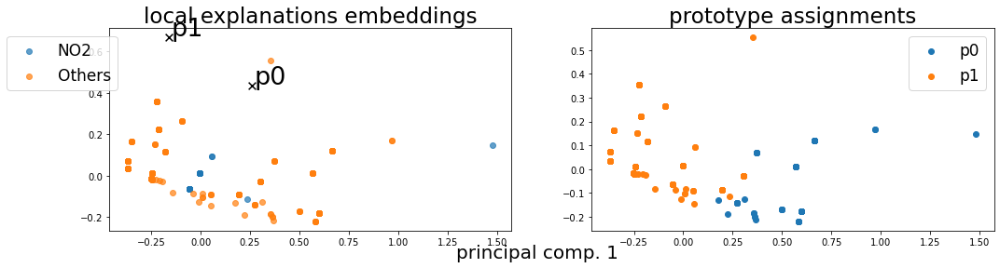

Alpha norms:
tensor([[1.0000, 0.6722],
        [0.7495, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.848798 +- 0.145249
Concept distribution:  (array([0, 1], dtype=int64), array([168, 958], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 1.07359, LEN: 0.067578, AccxC: 0.27, AccO: 0.00, V. Acc: 0.00, V. Loss: 1.12724, V. LEN 0.09
  2: Loss: 0.75668, LEN: 0.067315, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.84007, V. LEN 0.09
  3: Loss: 0.54703, LEN: 0.067087, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.66112, V. LEN 0.09
  4: Loss: 0.33165, LEN: 0.066858, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.35037, V. LEN 0.09
  5: Loss: 0.18052, LEN: 0.066632, AccxC: 0.75, AccO: 0.00, V. Acc: 0.73, V. Loss: 0.27339, V. LEN 0.09
  6: Loss: 0.15177, LEN: 0.066423, AccxC: 0.75, AccO: 0.69, V. Acc: 0.75, V. Loss: 0.18108, V. LEN 0.08
  7: Loss: 0.12329, LEN: 0.066238, AccxC: 0.75, AccO:

 77: Loss: 0.05392, LEN: 0.050724, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.08117, V. LEN 0.06
 78: Loss: 0.05775, LEN: 0.051644, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.08754, V. LEN 0.06
 79: Loss: 0.05479, LEN: 0.052011, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.08402, V. LEN 0.06


 80: Loss: 0.05570, LEN: 0.051852, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.08308, V. LEN 0.06
 81: Loss: 0.05425, LEN: 0.051991, AccxC: 0.78, AccO: 0.78, V. Acc: 0.80, V. Loss: 0.08461, V. LEN 0.06
 82: Loss: 0.05499, LEN: 0.052354, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.08333, V. LEN 0.06
 83: Loss: 0.05737, LEN: 0.052067, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.08692, V. LEN 0.06
 84: Loss: 0.06144, LEN: 0.052290, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.08063, V. LEN 0.06
 85: Loss: 0.05432, LEN: 0.050542, AccxC: 0.78, AccO: 0.78, V. Acc: 0.80, V. Loss: 0.07274, V. LEN 0.06
 86: Loss: 0.05513, LEN: 0.050874, AccxC: 0.77, AccO: 0.77, V.

156: Loss: 0.04373, LEN: 0.041639, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.06363, V. LEN 0.05
157: Loss: 0.04585, LEN: 0.043351, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.06036, V. LEN 0.05
158: Loss: 0.04438, LEN: 0.041459, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05793, V. LEN 0.05
159: Loss: 0.04475, LEN: 0.041972, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.05839, V. LEN 0.05


160: Loss: 0.04555, LEN: 0.042605, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.05956, V. LEN 0.05
161: Loss: 0.04339, LEN: 0.040686, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.06036, V. LEN 0.05
162: Loss: 0.04540, LEN: 0.043131, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.06831, V. LEN 0.05
163: Loss: 0.04831, LEN: 0.041900, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.07027, V. LEN 0.05
164: Loss: 0.04792, LEN: 0.039577, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.06270, V. LEN 0.05
165: Loss: 0.04383, LEN: 0.042380, AccxC: 0.80, AccO: 0.80, V.

235: Loss: 0.04382, LEN: 0.042695, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.05505, V. LEN 0.05
236: Loss: 0.04274, LEN: 0.041242, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.05633, V. LEN 0.05
237: Loss: 0.04173, LEN: 0.040026, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05779, V. LEN 0.05
238: Loss: 0.04330, LEN: 0.041074, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.05720, V. LEN 0.05
239: Loss: 0.04125, LEN: 0.039441, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05679, V. LEN 0.05


240: Loss: 0.04261, LEN: 0.041162, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.06042, V. LEN 0.05
241: Loss: 0.04048, LEN: 0.039411, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05958, V. LEN 0.05
242: Loss: 0.03998, LEN: 0.038665, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.06222, V. LEN 0.05
243: Loss: 0.04046, LEN: 0.039653, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.06226, V. LEN 0.05
244: Loss: 0.04115, LEN: 0.040343, AccxC: 0.81, AccO: 0.81, V.

314: Loss: 0.04078, LEN: 0.038763, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.05767, V. LEN 0.05
315: Loss: 0.04358, LEN: 0.042303, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05959, V. LEN 0.05
316: Loss: 0.04172, LEN: 0.040911, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.05871, V. LEN 0.05
317: Loss: 0.04228, LEN: 0.041307, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.05794, V. LEN 0.05
318: Loss: 0.04364, LEN: 0.042832, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.06013, V. LEN 0.05
319: Loss: 0.04083, LEN: 0.040096, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.06089, V. LEN 0.05


320: Loss: 0.04195, LEN: 0.040957, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.06102, V. LEN 0.05
321: Loss: 0.04141, LEN: 0.040334, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05596, V. LEN 0.05
322: Loss: 0.04300, LEN: 0.042002, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05383, V. LEN 0.05
323: Loss: 0.04099, LEN: 0.040137, AccxC: 0.81, AccO: 0.81, V.

393: Loss: 0.04234, LEN: 0.041760, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.06013, V. LEN 0.05
394: Loss: 0.04160, LEN: 0.040928, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.05912, V. LEN 0.05
395: Loss: 0.04514, LEN: 0.040317, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05939, V. LEN 0.05
396: Loss: 0.04009, LEN: 0.039008, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05647, V. LEN 0.05
397: Loss: 0.04127, LEN: 0.040427, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05508, V. LEN 0.05
398: Loss: 0.03967, LEN: 0.038762, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05544, V. LEN 0.05
399: Loss: 0.04044, LEN: 0.039781, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05511, V. LEN 0.05
Early Stopping
Loading model at epoch 298
Best epoch: 298
Trained lasted for 105 seconds
(array([0., 1.], dtype=float32), array([675, 451], dtype=int64))


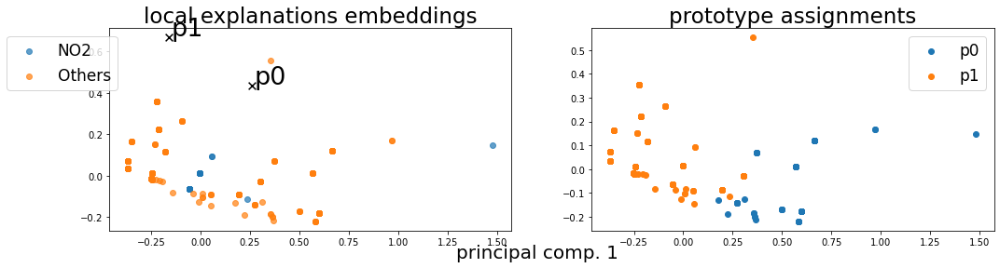

Alpha norms:
tensor([[1.0000, 0.6722],
        [0.7495, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.848798 +- 0.145249
Concept distribution:  (array([0, 1], dtype=int64), array([168, 958], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 1.07354, LEN: 0.067578, AccxC: 0.27, AccO: 0.00, V. Acc: 0.00, V. Loss: 1.12727, V. LEN 0.09
  2: Loss: 0.75663, LEN: 0.067315, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.83993, V. LEN 0.09
  3: Loss: 0.54697, LEN: 0.067087, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.66101, V. LEN 0.09
  4: Loss: 0.33163, LEN: 0.066857, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.35038, V. LEN 0.09
  5: Loss: 0.18052, LEN: 0.066632, AccxC: 0.75, AccO: 0.00, V. Acc: 0.73, V. Loss: 0.27339, V. LEN 0.09
  6: Loss: 0.15176, LEN: 0.066423, AccxC: 0.75, AccO: 0.69, V. Acc: 0.75, V. Loss: 0.18134, V. LEN 0.08
  7: Loss: 0.12318, LEN: 0.066237, AccxC: 0.75, AccO:

 77: Loss: 0.05552, LEN: 0.050984, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.08772, V. LEN 0.06
 78: Loss: 0.05864, LEN: 0.051675, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.08021, V. LEN 0.06
 79: Loss: 0.05613, LEN: 0.052082, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07157, V. LEN 0.06


 80: Loss: 0.05767, LEN: 0.051922, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07222, V. LEN 0.06
 81: Loss: 0.05668, LEN: 0.052332, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.08960, V. LEN 0.06
 82: Loss: 0.06230, LEN: 0.052051, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.09785, V. LEN 0.06
 83: Loss: 0.05848, LEN: 0.051948, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.08605, V. LEN 0.06
 84: Loss: 0.06080, LEN: 0.052065, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07496, V. LEN 0.06
 85: Loss: 0.05618, LEN: 0.050419, AccxC: 0.78, AccO: 0.78, V. Acc: 0.80, V. Loss: 0.06970, V. LEN 0.06
 86: Loss: 0.05566, LEN: 0.050907, AccxC: 0.77, AccO: 0.77, V.

156: Loss: 0.04381, LEN: 0.041621, AccxC: 0.82, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.07535, V. LEN 0.05
157: Loss: 0.04586, LEN: 0.043377, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.07214, V. LEN 0.05
158: Loss: 0.04342, LEN: 0.042032, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.06804, V. LEN 0.05
159: Loss: 0.04352, LEN: 0.042121, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.07222, V. LEN 0.05


160: Loss: 0.04420, LEN: 0.041958, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.07613, V. LEN 0.05
161: Loss: 0.04130, LEN: 0.040016, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.07278, V. LEN 0.05
162: Loss: 0.04494, LEN: 0.043052, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.07285, V. LEN 0.05
163: Loss: 0.04489, LEN: 0.041397, AccxC: 0.81, AccO: 0.81, V. Acc: 0.78, V. Loss: 0.07481, V. LEN 0.05
164: Loss: 0.04376, LEN: 0.038759, AccxC: 0.82, AccO: 0.79, V. Acc: 0.78, V. Loss: 0.06448, V. LEN 0.05
165: Loss: 0.04308, LEN: 0.040843, AccxC: 0.81, AccO: 0.79, V.

235: Loss: 0.04192, LEN: 0.040648, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05900, V. LEN 0.05
236: Loss: 0.04169, LEN: 0.040690, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05918, V. LEN 0.05
237: Loss: 0.04115, LEN: 0.040184, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.06055, V. LEN 0.05
238: Loss: 0.04155, LEN: 0.040660, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.06074, V. LEN 0.05
239: Loss: 0.04009, LEN: 0.038838, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.06088, V. LEN 0.05


240: Loss: 0.04202, LEN: 0.041049, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.06223, V. LEN 0.05
241: Loss: 0.03977, LEN: 0.038890, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.07021, V. LEN 0.05
242: Loss: 0.04050, LEN: 0.038650, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.07161, V. LEN 0.05
243: Loss: 0.04081, LEN: 0.039837, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05997, V. LEN 0.05
244: Loss: 0.04140, LEN: 0.040223, AccxC: 0.82, AccO: 0.82, V.

314: Loss: 0.03912, LEN: 0.038156, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05305, V. LEN 0.05
315: Loss: 0.04254, LEN: 0.041480, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05533, V. LEN 0.05
316: Loss: 0.04041, LEN: 0.039749, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.06243, V. LEN 0.05
317: Loss: 0.04279, LEN: 0.041745, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.06293, V. LEN 0.05
318: Loss: 0.04353, LEN: 0.042846, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.05996, V. LEN 0.05
319: Loss: 0.04048, LEN: 0.039824, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.05742, V. LEN 0.05


320: Loss: 0.04169, LEN: 0.041113, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05631, V. LEN 0.05
321: Loss: 0.04108, LEN: 0.040652, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05696, V. LEN 0.05
322: Loss: 0.04290, LEN: 0.042219, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05775, V. LEN 0.05
323: Loss: 0.04008, LEN: 0.039373, AccxC: 0.82, AccO: 0.82, V.

393: Loss: 0.04297, LEN: 0.042363, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05962, V. LEN 0.05
394: Loss: 0.04115, LEN: 0.040489, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05420, V. LEN 0.05
395: Loss: 0.04051, LEN: 0.039139, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05232, V. LEN 0.05
396: Loss: 0.04071, LEN: 0.039687, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.05203, V. LEN 0.05
397: Loss: 0.04128, LEN: 0.040605, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05579, V. LEN 0.05
398: Loss: 0.03935, LEN: 0.038794, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05576, V. LEN 0.05
399: Loss: 0.04069, LEN: 0.039978, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05520, V. LEN 0.05


400: Loss: 0.04187, LEN: 0.041249, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.05856, V. LEN 0.05
401: Loss: 0.04138, LEN: 0.040713, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.05782, V. LEN 0.05
402: Loss: 0.04113, LEN: 0.040477, AccxC: 0.82, AccO: 0.82, V.

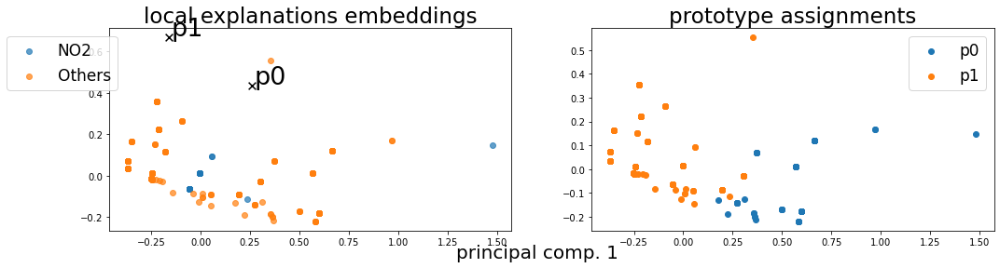

Alpha norms:
tensor([[1.0000, 0.6722],
        [0.7495, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.848798 +- 0.145249
Concept distribution:  (array([0, 1], dtype=int64), array([168, 958], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 1.18020, LEN: 0.067582, AccxC: 0.27, AccO: 0.00, V. Acc: 0.00, V. Loss: 1.22305, V. LEN 0.09
  2: Loss: 0.81444, LEN: 0.067316, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.90384, V. LEN 0.09
  3: Loss: 0.57695, LEN: 0.067085, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.70987, V. LEN 0.09
  4: Loss: 0.34659, LEN: 0.066858, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.38155, V. LEN 0.09
  5: Loss: 0.19508, LEN: 0.066630, AccxC: 0.75, AccO: 0.00, V. Acc: 0.73, V. Loss: 0.28352, V. LEN 0.09
  6: Loss: 0.17408, LEN: 0.066435, AccxC: 0.75, AccO: 0.69, V. Acc: 0.75, V. Loss: 0.20801, V. LEN 0.08
  7: Loss: 0.14664, LEN: 0.066232, AccxC: 0.75, AccO:

 77: Loss: 0.05918, LEN: 0.051226, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.08665, V. LEN 0.06
 78: Loss: 0.06094, LEN: 0.051866, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07758, V. LEN 0.06
 79: Loss: 0.05999, LEN: 0.052425, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07161, V. LEN 0.06


 80: Loss: 0.05958, LEN: 0.051943, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.08017, V. LEN 0.06
 81: Loss: 0.05963, LEN: 0.052441, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.09022, V. LEN 0.06
 82: Loss: 0.05935, LEN: 0.052450, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.10191, V. LEN 0.06
 83: Loss: 0.06266, LEN: 0.052923, AccxC: 0.76, AccO: 0.76, V. Acc: 0.80, V. Loss: 0.08353, V. LEN 0.06
 84: Loss: 0.05949, LEN: 0.052598, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07785, V. LEN 0.06
 85: Loss: 0.05797, LEN: 0.050759, AccxC: 0.78, AccO: 0.78, V. Acc: 0.80, V. Loss: 0.08526, V. LEN 0.06
 86: Loss: 0.05775, LEN: 0.051319, AccxC: 0.77, AccO: 0.77, V.

156: Loss: 0.05633, LEN: 0.051485, AccxC: 0.78, AccO: 0.78, V. Acc: 0.80, V. Loss: 0.08485, V. LEN 0.06
157: Loss: 0.05593, LEN: 0.051530, AccxC: 0.78, AccO: 0.78, V. Acc: 0.81, V. Loss: 0.07658, V. LEN 0.06
158: Loss: 0.05443, LEN: 0.049881, AccxC: 0.78, AccO: 0.78, V. Acc: 0.81, V. Loss: 0.07293, V. LEN 0.06
159: Loss: 0.05291, LEN: 0.048305, AccxC: 0.80, AccO: 0.80, V. Acc: 0.81, V. Loss: 0.07102, V. LEN 0.06


160: Loss: 0.05432, LEN: 0.049212, AccxC: 0.79, AccO: 0.79, V. Acc: 0.81, V. Loss: 0.07505, V. LEN 0.06
161: Loss: 0.05298, LEN: 0.048581, AccxC: 0.79, AccO: 0.79, V. Acc: 0.81, V. Loss: 0.08030, V. LEN 0.06
162: Loss: 0.05491, LEN: 0.050431, AccxC: 0.79, AccO: 0.79, V. Acc: 0.81, V. Loss: 0.08035, V. LEN 0.06
163: Loss: 0.05467, LEN: 0.049295, AccxC: 0.78, AccO: 0.78, V. Acc: 0.81, V. Loss: 0.07920, V. LEN 0.06
164: Loss: 0.05689, LEN: 0.047597, AccxC: 0.79, AccO: 0.79, V. Acc: 0.80, V. Loss: 0.07111, V. LEN 0.06
165: Loss: 0.05444, LEN: 0.049367, AccxC: 0.79, AccO: 0.79, V.

235: Loss: 0.04286, LEN: 0.040816, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05842, V. LEN 0.05
236: Loss: 0.04298, LEN: 0.040955, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05745, V. LEN 0.05
237: Loss: 0.04185, LEN: 0.039629, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05887, V. LEN 0.05
238: Loss: 0.04251, LEN: 0.040322, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05690, V. LEN 0.05
239: Loss: 0.04066, LEN: 0.038540, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05586, V. LEN 0.05


240: Loss: 0.04276, LEN: 0.040929, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05650, V. LEN 0.05
241: Loss: 0.04079, LEN: 0.038714, AccxC: 0.83, AccO: 0.83, V. Acc: 0.82, V. Loss: 0.05660, V. LEN 0.05
242: Loss: 0.04002, LEN: 0.038158, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05704, V. LEN 0.05
243: Loss: 0.04106, LEN: 0.039148, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05768, V. LEN 0.05
244: Loss: 0.04166, LEN: 0.039852, AccxC: 0.82, AccO: 0.82, V.

314: Loss: 0.03967, LEN: 0.038151, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05704, V. LEN 0.05
315: Loss: 0.04262, LEN: 0.041237, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05835, V. LEN 0.05
316: Loss: 0.04058, LEN: 0.039046, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05673, V. LEN 0.05
317: Loss: 0.04248, LEN: 0.040977, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05483, V. LEN 0.05
318: Loss: 0.04364, LEN: 0.041964, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05506, V. LEN 0.05
319: Loss: 0.04048, LEN: 0.038974, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05586, V. LEN 0.05


320: Loss: 0.04262, LEN: 0.040945, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.06171, V. LEN 0.05
321: Loss: 0.04151, LEN: 0.040013, AccxC: 0.83, AccO: 0.83, V. Acc: 0.82, V. Loss: 0.05618, V. LEN 0.05
322: Loss: 0.04293, LEN: 0.041463, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05493, V. LEN 0.05
323: Loss: 0.04078, LEN: 0.039485, AccxC: 0.82, AccO: 0.82, V.

393: Loss: 0.04222, LEN: 0.041216, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05413, V. LEN 0.05
394: Loss: 0.04159, LEN: 0.040463, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05486, V. LEN 0.05
395: Loss: 0.03942, LEN: 0.038253, AccxC: 0.83, AccO: 0.83, V. Acc: 0.83, V. Loss: 0.05190, V. LEN 0.05
396: Loss: 0.03979, LEN: 0.038710, AccxC: 0.82, AccO: 0.82, V. Acc: 0.83, V. Loss: 0.05155, V. LEN 0.05
397: Loss: 0.04105, LEN: 0.039974, AccxC: 0.82, AccO: 0.82, V. Acc: 0.83, V. Loss: 0.05121, V. LEN 0.05
398: Loss: 0.03903, LEN: 0.038060, AccxC: 0.82, AccO: 0.82, V. Acc: 0.83, V. Loss: 0.05173, V. LEN 0.05
399: Loss: 0.04101, LEN: 0.039955, AccxC: 0.83, AccO: 0.83, V. Acc: 0.83, V. Loss: 0.05212, V. LEN 0.05


400: Loss: 0.04226, LEN: 0.041145, AccxC: 0.82, AccO: 0.82, V. Acc: 0.83, V. Loss: 0.05213, V. LEN 0.05
401: Loss: 0.04104, LEN: 0.039909, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05464, V. LEN 0.05
402: Loss: 0.04227, LEN: 0.041227, AccxC: 0.82, AccO: 0.82, V.

472: Loss: 0.04023, LEN: 0.039301, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05595, V. LEN 0.05
473: Loss: 0.04209, LEN: 0.041134, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05581, V. LEN 0.05
474: Loss: 0.04104, LEN: 0.040229, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05498, V. LEN 0.05
475: Loss: 0.04098, LEN: 0.040054, AccxC: 0.83, AccO: 0.83, V. Acc: 0.82, V. Loss: 0.05415, V. LEN 0.05
476: Loss: 0.04130, LEN: 0.040368, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05425, V. LEN 0.05
477: Loss: 0.04046, LEN: 0.039603, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05425, V. LEN 0.05
478: Loss: 0.04034, LEN: 0.039488, AccxC: 0.83, AccO: 0.83, V. Acc: 0.82, V. Loss: 0.05497, V. LEN 0.05
479: Loss: 0.03937, LEN: 0.038605, AccxC: 0.83, AccO: 0.83, V. Acc: 0.82, V. Loss: 0.05500, V. LEN 0.05


480: Loss: 0.03888, LEN: 0.038019, AccxC: 0.83, AccO: 0.83, V. Acc: 0.83, V. Loss: 0.05189, V. LEN 0.05
481: Loss: 0.04196, LEN: 0.041101, AccxC: 0.82, AccO: 0.82, V.

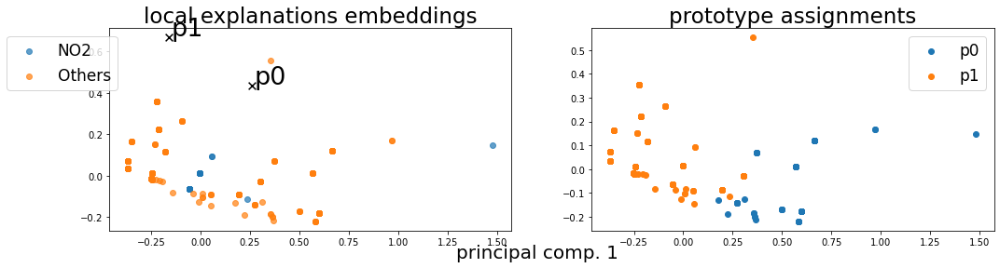

Alpha norms:
tensor([[1.0000, 0.6722],
        [0.7495, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.848798 +- 0.145249
Concept distribution:  (array([0, 1], dtype=int64), array([168, 958], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 2.17017, LEN: 0.067592, AccxC: 0.27, AccO: 0.00, V. Acc: 0.00, V. Loss: 2.17158, V. LEN 0.09
  2: Loss: 1.43609, LEN: 0.067307, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 1.63287, V. LEN 0.09
  3: Loss: 0.99282, LEN: 0.067077, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 1.00074, V. LEN 0.09
  4: Loss: 0.61024, LEN: 0.066872, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.55886, V. LEN 0.09
  5: Loss: 0.42439, LEN: 0.066598, AccxC: 0.75, AccO: 0.00, V. Acc: 0.74, V. Loss: 0.45192, V. LEN 0.09
  6: Loss: 0.35939, LEN: 0.066435, AccxC: 0.75, AccO: 0.69, V. Acc: 0.75, V. Loss: 0.39079, V. LEN 0.08
  7: Loss: 0.30845, LEN: 0.066232, AccxC: 0.75, AccO:

 77: Loss: 0.06594, LEN: 0.051242, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07457, V. LEN 0.06
 78: Loss: 0.06546, LEN: 0.051685, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07205, V. LEN 0.06
 79: Loss: 0.06572, LEN: 0.052425, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07672, V. LEN 0.06


 80: Loss: 0.06496, LEN: 0.051861, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07882, V. LEN 0.06
 81: Loss: 0.06555, LEN: 0.052158, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.08397, V. LEN 0.06
 82: Loss: 0.06485, LEN: 0.052234, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.08282, V. LEN 0.06
 83: Loss: 0.06555, LEN: 0.052363, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07360, V. LEN 0.06
 84: Loss: 0.06555, LEN: 0.052070, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07459, V. LEN 0.06
 85: Loss: 0.06439, LEN: 0.050860, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07133, V. LEN 0.06
 86: Loss: 0.06257, LEN: 0.051102, AccxC: 0.77, AccO: 0.77, V.

156: Loss: 0.05728, LEN: 0.051843, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07014, V. LEN 0.06
157: Loss: 0.05807, LEN: 0.052568, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07017, V. LEN 0.06
158: Loss: 0.05812, LEN: 0.052291, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07423, V. LEN 0.06
159: Loss: 0.05688, LEN: 0.051673, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07267, V. LEN 0.06


160: Loss: 0.05746, LEN: 0.052038, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07481, V. LEN 0.06
161: Loss: 0.05591, LEN: 0.050914, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07037, V. LEN 0.06
162: Loss: 0.05909, LEN: 0.053894, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07196, V. LEN 0.06
163: Loss: 0.05795, LEN: 0.052382, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07412, V. LEN 0.06
164: Loss: 0.06117, LEN: 0.051273, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07356, V. LEN 0.06
165: Loss: 0.05818, LEN: 0.052388, AccxC: 0.77, AccO: 0.77, V.

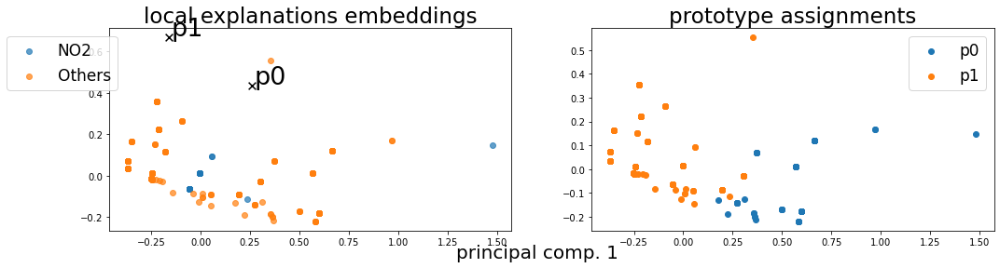

Alpha norms:
tensor([[1.0000, 0.6722],
        [0.7495, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.848798 +- 0.145249
Concept distribution:  (array([0, 1], dtype=int64), array([168, 958], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 3.51779, LEN: 0.067592, AccxC: 0.27, AccO: 0.00, V. Acc: 0.00, V. Loss: 3.44884, V. LEN 0.09
  2: Loss: 2.26123, LEN: 0.067309, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 2.42443, V. LEN 0.09
  3: Loss: 1.50956, LEN: 0.067077, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 1.40433, V. LEN 0.09
  4: Loss: 0.92560, LEN: 0.066873, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.79256, V. LEN 0.09
  5: Loss: 0.70578, LEN: 0.066613, AccxC: 0.75, AccO: 0.00, V. Acc: 0.78, V. Loss: 0.73170, V. LEN 0.09
  6: Loss: 0.59152, LEN: 0.066429, AccxC: 0.75, AccO: 0.72, V. Acc: 0.75, V. Loss: 0.67242, V. LEN 0.09
  7: Loss: 0.52705, LEN: 0.066236, AccxC: 0.75, AccO:

 77: Loss: 0.07572, LEN: 0.051392, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.08181, V. LEN 0.06
 78: Loss: 0.07389, LEN: 0.051780, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.08459, V. LEN 0.06
 79: Loss: 0.07431, LEN: 0.052394, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.08317, V. LEN 0.06


 80: Loss: 0.07296, LEN: 0.051862, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.08781, V. LEN 0.06
 81: Loss: 0.07311, LEN: 0.051975, AccxC: 0.78, AccO: 0.78, V. Acc: 0.80, V. Loss: 0.08479, V. LEN 0.06
 82: Loss: 0.07146, LEN: 0.052393, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.08131, V. LEN 0.06
 83: Loss: 0.07243, LEN: 0.052054, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.08472, V. LEN 0.06
 84: Loss: 0.07238, LEN: 0.052066, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.08020, V. LEN 0.06
 85: Loss: 0.07149, LEN: 0.050864, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.08278, V. LEN 0.06
 86: Loss: 0.06923, LEN: 0.051206, AccxC: 0.77, AccO: 0.77, V.

157: Loss: 0.06086, LEN: 0.052566, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07985, V. LEN 0.06
158: Loss: 0.06006, LEN: 0.052291, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.08514, V. LEN 0.06
159: Loss: 0.05927, LEN: 0.051673, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.08229, V. LEN 0.06


160: Loss: 0.06045, LEN: 0.052037, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.08249, V. LEN 0.06
161: Loss: 0.05838, LEN: 0.050916, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.08044, V. LEN 0.06
162: Loss: 0.06139, LEN: 0.053893, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.08071, V. LEN 0.06
163: Loss: 0.06028, LEN: 0.052310, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.08256, V. LEN 0.06
164: Loss: 0.06185, LEN: 0.051275, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.08570, V. LEN 0.06
165: Loss: 0.06088, LEN: 0.052387, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.08544, V. LEN 0.06
166: Loss: 0.05994, LEN: 0.051843, AccxC: 0.77, AccO: 0.77, V.

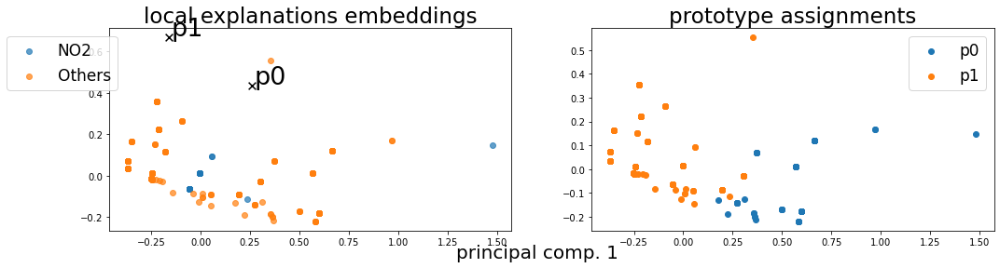

Alpha norms:
tensor([[1.0000, 0.6722],
        [0.7495, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.848798 +- 0.145249
Concept distribution:  (array([0, 1], dtype=int64), array([168, 958], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 2.30335, LEN: 0.067578, AccxC: 0.27, AccO: 0.00, V. Acc: 0.00, V. Loss: 2.40035, V. LEN 0.09
  2: Loss: 1.59920, LEN: 0.067315, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 1.76015, V. LEN 0.09
  3: Loss: 1.13297, LEN: 0.067087, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 1.36275, V. LEN 0.09
  4: Loss: 0.65501, LEN: 0.066858, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.67358, V. LEN 0.09
  5: Loss: 0.31949, LEN: 0.066632, AccxC: 0.75, AccO: 0.00, V. Acc: 0.73, V. Loss: 0.50275, V. LEN 0.09
  6: Loss: 0.25560, LEN: 0.066423, AccxC: 0.75, AccO: 0.69, V. Acc: 0.75, V. Loss: 0.29810, V. LEN 0.08
  7: Loss: 0.19264, LEN: 0.066234, AccxC: 0.75, AccO:

 77: Loss: 0.06203, LEN: 0.050827, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.11105, V. LEN 0.06
 78: Loss: 0.06693, LEN: 0.051666, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.10505, V. LEN 0.06
 79: Loss: 0.05863, LEN: 0.052227, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.08892, V. LEN 0.06


 80: Loss: 0.06139, LEN: 0.051857, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.09599, V. LEN 0.06
 81: Loss: 0.05969, LEN: 0.052150, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.12066, V. LEN 0.06
 82: Loss: 0.07343, LEN: 0.052286, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.11512, V. LEN 0.06
 83: Loss: 0.06493, LEN: 0.052126, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.08911, V. LEN 0.06
 84: Loss: 0.06259, LEN: 0.052184, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.08636, V. LEN 0.06
 85: Loss: 0.06241, LEN: 0.050756, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07960, V. LEN 0.06
 86: Loss: 0.06189, LEN: 0.050929, AccxC: 0.77, AccO: 0.77, V.

156: Loss: 0.05138, LEN: 0.048717, AccxC: 0.79, AccO: 0.79, V. Acc: 0.78, V. Loss: 0.09090, V. LEN 0.06
157: Loss: 0.05457, LEN: 0.049776, AccxC: 0.78, AccO: 0.78, V. Acc: 0.78, V. Loss: 0.09359, V. LEN 0.06
158: Loss: 0.05248, LEN: 0.048985, AccxC: 0.78, AccO: 0.78, V. Acc: 0.78, V. Loss: 0.10848, V. LEN 0.06
159: Loss: 0.05070, LEN: 0.047788, AccxC: 0.79, AccO: 0.79, V. Acc: 0.78, V. Loss: 0.10995, V. LEN 0.06


160: Loss: 0.05206, LEN: 0.047887, AccxC: 0.79, AccO: 0.79, V. Acc: 0.78, V. Loss: 0.11392, V. LEN 0.06
161: Loss: 0.05016, LEN: 0.047316, AccxC: 0.79, AccO: 0.79, V. Acc: 0.78, V. Loss: 0.10354, V. LEN 0.06
162: Loss: 0.05313, LEN: 0.048960, AccxC: 0.79, AccO: 0.79, V. Acc: 0.80, V. Loss: 0.10134, V. LEN 0.06
163: Loss: 0.05320, LEN: 0.046751, AccxC: 0.80, AccO: 0.80, V. Acc: 0.81, V. Loss: 0.07839, V. LEN 0.06
164: Loss: 0.06553, LEN: 0.042482, AccxC: 0.80, AccO: 0.80, V. Acc: 0.81, V. Loss: 0.06875, V. LEN 0.06
165: Loss: 0.05024, LEN: 0.044608, AccxC: 0.80, AccO: 0.80, V.

235: Loss: 0.04284, LEN: 0.040961, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.08540, V. LEN 0.05
236: Loss: 0.04278, LEN: 0.040905, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.10395, V. LEN 0.05
237: Loss: 0.04431, LEN: 0.041026, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.09604, V. LEN 0.05
238: Loss: 0.04337, LEN: 0.041324, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.10470, V. LEN 0.05
239: Loss: 0.04171, LEN: 0.039246, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.10586, V. LEN 0.05


240: Loss: 0.04356, LEN: 0.040665, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.09963, V. LEN 0.05
241: Loss: 0.04212, LEN: 0.039569, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.09124, V. LEN 0.05
242: Loss: 0.04241, LEN: 0.039527, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.09312, V. LEN 0.05
243: Loss: 0.04127, LEN: 0.039813, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.08322, V. LEN 0.05
244: Loss: 0.04180, LEN: 0.040214, AccxC: 0.81, AccO: 0.81, V.

314: Loss: 0.04578, LEN: 0.040013, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.06413, V. LEN 0.05
315: Loss: 0.04503, LEN: 0.043058, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.07999, V. LEN 0.05
316: Loss: 0.04308, LEN: 0.040996, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.08603, V. LEN 0.05
317: Loss: 0.04301, LEN: 0.041784, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.08001, V. LEN 0.05
318: Loss: 0.04522, LEN: 0.044031, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.07917, V. LEN 0.05
319: Loss: 0.04075, LEN: 0.039652, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.08367, V. LEN 0.05


320: Loss: 0.04227, LEN: 0.041160, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.08212, V. LEN 0.05
321: Loss: 0.04242, LEN: 0.040991, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.06893, V. LEN 0.05
322: Loss: 0.04341, LEN: 0.042361, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.07166, V. LEN 0.05
323: Loss: 0.04107, LEN: 0.039811, AccxC: 0.82, AccO: 0.82, V.

393: Loss: 0.04297, LEN: 0.042003, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.07852, V. LEN 0.05
394: Loss: 0.04196, LEN: 0.040904, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.07090, V. LEN 0.05
395: Loss: 0.04440, LEN: 0.040562, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.07710, V. LEN 0.05
396: Loss: 0.04273, LEN: 0.039629, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.06410, V. LEN 0.05
397: Loss: 0.04462, LEN: 0.040713, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.05980, V. LEN 0.05
398: Loss: 0.04290, LEN: 0.039471, AccxC: 0.81, AccO: 0.81, V. Acc: 0.83, V. Loss: 0.05646, V. LEN 0.05
399: Loss: 0.04273, LEN: 0.040758, AccxC: 0.81, AccO: 0.81, V. Acc: 0.83, V. Loss: 0.06246, V. LEN 0.05


400: Loss: 0.04438, LEN: 0.041389, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.06838, V. LEN 0.05
401: Loss: 0.04239, LEN: 0.040058, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.06997, V. LEN 0.05
402: Loss: 0.04532, LEN: 0.042325, AccxC: 0.82, AccO: 0.82, V.

471: Loss: 0.04249, LEN: 0.040455, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.07092, V. LEN 0.05
472: Loss: 0.04173, LEN: 0.040783, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05463, V. LEN 0.05
473: Loss: 0.04344, LEN: 0.041476, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.05614, V. LEN 0.05
474: Loss: 0.04168, LEN: 0.040786, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.06568, V. LEN 0.05
475: Loss: 0.04264, LEN: 0.041551, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.06795, V. LEN 0.05
476: Loss: 0.04096, LEN: 0.040130, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.07207, V. LEN 0.05
477: Loss: 0.04054, LEN: 0.039788, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.07478, V. LEN 0.05
478: Loss: 0.04124, LEN: 0.039660, AccxC: 0.82, AccO: 0.82, V. Acc: 0.78, V. Loss: 0.08172, V. LEN 0.05
479: Loss: 0.04062, LEN: 0.038915, AccxC: 0.82, AccO: 0.80, V. Acc: 0.78, V. Loss: 0.07301, V. LEN 0.05


480: Loss: 0.03952, LEN: 0.038712, AccxC: 0.82, AccO: 0.82, V.

550: Loss: 0.04108, LEN: 0.040564, AccxC: 0.81, AccO: 0.81, V. Acc: 0.83, V. Loss: 0.08366, V. LEN 0.05
551: Loss: 0.04135, LEN: 0.040391, AccxC: 0.81, AccO: 0.81, V. Acc: 0.83, V. Loss: 0.07547, V. LEN 0.05
552: Loss: 0.04301, LEN: 0.042391, AccxC: 0.81, AccO: 0.81, V. Acc: 0.83, V. Loss: 0.07251, V. LEN 0.05
553: Loss: 0.04023, LEN: 0.039326, AccxC: 0.81, AccO: 0.81, V. Acc: 0.83, V. Loss: 0.06492, V. LEN 0.05
554: Loss: 0.04087, LEN: 0.040280, AccxC: 0.81, AccO: 0.81, V. Acc: 0.83, V. Loss: 0.06686, V. LEN 0.05
555: Loss: 0.04281, LEN: 0.041815, AccxC: 0.82, AccO: 0.82, V. Acc: 0.83, V. Loss: 0.06938, V. LEN 0.05
556: Loss: 0.04098, LEN: 0.040352, AccxC: 0.82, AccO: 0.82, V. Acc: 0.83, V. Loss: 0.08663, V. LEN 0.05
557: Loss: 0.04152, LEN: 0.041006, AccxC: 0.81, AccO: 0.81, V. Acc: 0.83, V. Loss: 0.08858, V. LEN 0.05
558: Loss: 0.03938, LEN: 0.038043, AccxC: 0.82, AccO: 0.82, V. Acc: 0.83, V. Loss: 0.09231, V. LEN 0.05
559: Loss: 0.04227, LEN: 0.040378, AccxC: 0.82, AccO: 0.82, V. A

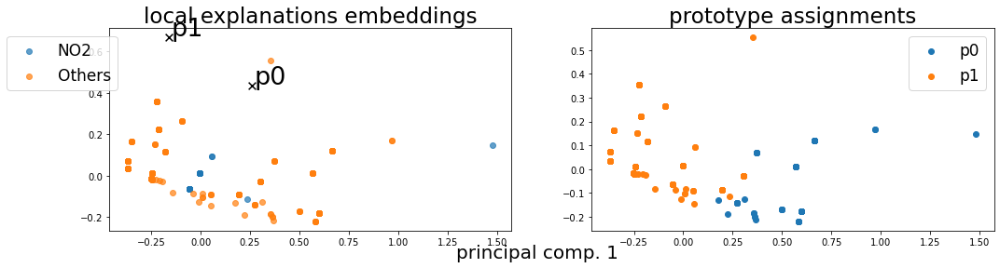

Alpha norms:
tensor([[1.0000, 0.6722],
        [0.7495, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.848798 +- 0.145249
Concept distribution:  (array([0, 1], dtype=int64), array([168, 958], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 2.30339, LEN: 0.067578, AccxC: 0.27, AccO: 0.00, V. Acc: 0.00, V. Loss: 2.40042, V. LEN 0.09
  2: Loss: 1.59921, LEN: 0.067315, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 1.76011, V. LEN 0.09
  3: Loss: 1.13294, LEN: 0.067087, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 1.36267, V. LEN 0.09
  4: Loss: 0.65500, LEN: 0.066858, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.67356, V. LEN 0.09
  5: Loss: 0.31948, LEN: 0.066632, AccxC: 0.75, AccO: 0.00, V. Acc: 0.73, V. Loss: 0.50270, V. LEN 0.09
  6: Loss: 0.25556, LEN: 0.066423, AccxC: 0.75, AccO: 0.69, V. Acc: 0.75, V. Loss: 0.29790, V. LEN 0.08
  7: Loss: 0.19266, LEN: 0.066234, AccxC: 0.75, AccO:

 77: Loss: 0.06176, LEN: 0.051028, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.11068, V. LEN 0.06
 78: Loss: 0.06750, LEN: 0.051678, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.11812, V. LEN 0.06
 79: Loss: 0.05945, LEN: 0.052201, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.09498, V. LEN 0.06


 80: Loss: 0.06093, LEN: 0.051685, AccxC: 0.78, AccO: 0.78, V. Acc: 0.80, V. Loss: 0.09911, V. LEN 0.06
 81: Loss: 0.06031, LEN: 0.052044, AccxC: 0.78, AccO: 0.78, V. Acc: 0.80, V. Loss: 0.09850, V. LEN 0.06
 82: Loss: 0.06759, LEN: 0.052143, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.09941, V. LEN 0.06
 83: Loss: 0.06745, LEN: 0.052419, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.09635, V. LEN 0.06
 84: Loss: 0.06494, LEN: 0.052346, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.08560, V. LEN 0.06
 85: Loss: 0.06228, LEN: 0.050871, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07176, V. LEN 0.06
 86: Loss: 0.05992, LEN: 0.050832, AccxC: 0.77, AccO: 0.77, V.

156: Loss: 0.05665, LEN: 0.050393, AccxC: 0.78, AccO: 0.78, V. Acc: 0.81, V. Loss: 0.12231, V. LEN 0.06
157: Loss: 0.05638, LEN: 0.051211, AccxC: 0.78, AccO: 0.78, V. Acc: 0.81, V. Loss: 0.09337, V. LEN 0.06
158: Loss: 0.05381, LEN: 0.049532, AccxC: 0.78, AccO: 0.78, V. Acc: 0.81, V. Loss: 0.07892, V. LEN 0.06
159: Loss: 0.05255, LEN: 0.048560, AccxC: 0.79, AccO: 0.79, V. Acc: 0.81, V. Loss: 0.11088, V. LEN 0.06


160: Loss: 0.05503, LEN: 0.049508, AccxC: 0.78, AccO: 0.78, V. Acc: 0.81, V. Loss: 0.12326, V. LEN 0.06
161: Loss: 0.05315, LEN: 0.048618, AccxC: 0.78, AccO: 0.78, V. Acc: 0.81, V. Loss: 0.12555, V. LEN 0.06
162: Loss: 0.05436, LEN: 0.050044, AccxC: 0.79, AccO: 0.79, V. Acc: 0.81, V. Loss: 0.10964, V. LEN 0.06
163: Loss: 0.05954, LEN: 0.048865, AccxC: 0.79, AccO: 0.79, V. Acc: 0.81, V. Loss: 0.09726, V. LEN 0.06
164: Loss: 0.07612, LEN: 0.048206, AccxC: 0.79, AccO: 0.79, V. Acc: 0.79, V. Loss: 0.08127, V. LEN 0.06
165: Loss: 0.05254, LEN: 0.048975, AccxC: 0.79, AccO: 0.79, V.

229: Loss: 0.04447, LEN: 0.042178, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.08594, V. LEN 0.05
230: Loss: 0.04379, LEN: 0.041876, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.08284, V. LEN 0.05
231: Loss: 0.04456, LEN: 0.039469, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.07605, V. LEN 0.05
232: Loss: 0.04712, LEN: 0.044839, AccxC: 0.80, AccO: 0.80, V. Acc: 0.82, V. Loss: 0.06999, V. LEN 0.05
233: Loss: 0.04628, LEN: 0.044078, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.08466, V. LEN 0.05
234: Loss: 0.04595, LEN: 0.041471, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.08506, V. LEN 0.05
235: Loss: 0.04376, LEN: 0.041434, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.08245, V. LEN 0.05
236: Loss: 0.04268, LEN: 0.040855, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.08945, V. LEN 0.05
237: Loss: 0.04351, LEN: 0.040066, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.08273, V. LEN 0.05
238: Loss: 0.04537, LEN: 0.042411, AccxC: 0.80, AccO: 0.80, V. A

308: Loss: 0.04299, LEN: 0.041838, AccxC: 0.82, AccO: 0.79, V. Acc: 0.78, V. Loss: 0.07841, V. LEN 0.05
309: Loss: 0.04077, LEN: 0.039696, AccxC: 0.82, AccO: 0.79, V. Acc: 0.78, V. Loss: 0.09175, V. LEN 0.05
310: Loss: 0.04343, LEN: 0.041858, AccxC: 0.82, AccO: 0.79, V. Acc: 0.78, V. Loss: 0.12099, V. LEN 0.05
311: Loss: 0.04573, LEN: 0.039970, AccxC: 0.82, AccO: 0.79, V. Acc: 0.78, V. Loss: 0.14131, V. LEN 0.05
312: Loss: 0.04099, LEN: 0.039745, AccxC: 0.82, AccO: 0.79, V. Acc: 0.78, V. Loss: 0.08298, V. LEN 0.05
313: Loss: 0.04168, LEN: 0.039527, AccxC: 0.82, AccO: 0.80, V. Acc: 0.78, V. Loss: 0.06834, V. LEN 0.05
314: Loss: 0.05814, LEN: 0.039302, AccxC: 0.82, AccO: 0.79, V. Acc: 0.78, V. Loss: 0.08251, V. LEN 0.05
315: Loss: 0.04740, LEN: 0.042037, AccxC: 0.82, AccO: 0.79, V. Acc: 0.78, V. Loss: 0.14067, V. LEN 0.05
316: Loss: 0.04993, LEN: 0.041474, AccxC: 0.81, AccO: 0.79, V. Acc: 0.78, V. Loss: 0.07651, V. LEN 0.05
317: Loss: 0.04537, LEN: 0.041381, AccxC: 0.82, AccO: 0.79, V. A

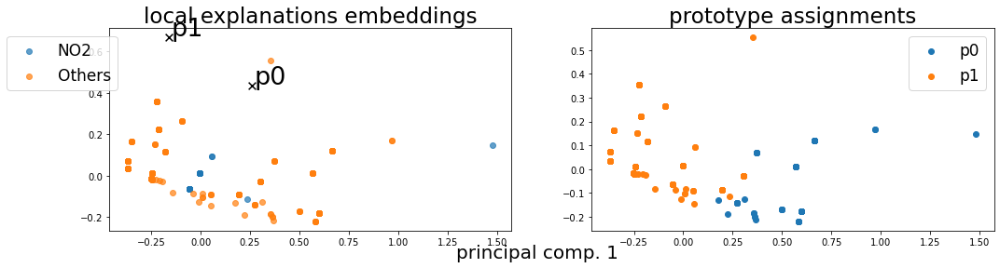

Alpha norms:
tensor([[1.0000, 0.6722],
        [0.7495, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.848798 +- 0.145249
Concept distribution:  (array([0, 1], dtype=int64), array([168, 958], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 2.40733, LEN: 0.067577, AccxC: 0.27, AccO: 0.00, V. Acc: 0.00, V. Loss: 2.48510, V. LEN 0.09
  2: Loss: 1.65647, LEN: 0.067317, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 1.83571, V. LEN 0.09
  3: Loss: 1.17353, LEN: 0.067087, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 1.42806, V. LEN 0.09
  4: Loss: 0.67273, LEN: 0.066863, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.69346, V. LEN 0.09
  5: Loss: 0.34302, LEN: 0.066635, AccxC: 0.75, AccO: 0.00, V. Acc: 0.73, V. Loss: 0.51396, V. LEN 0.09
  6: Loss: 0.28004, LEN: 0.066429, AccxC: 0.75, AccO: 0.69, V. Acc: 0.75, V. Loss: 0.33264, V. LEN 0.08
  7: Loss: 0.21983, LEN: 0.066235, AccxC: 0.75, AccO:

 77: Loss: 0.06554, LEN: 0.051237, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.09323, V. LEN 0.06
 78: Loss: 0.07187, LEN: 0.051831, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.10982, V. LEN 0.06
 79: Loss: 0.06371, LEN: 0.052662, AccxC: 0.76, AccO: 0.76, V. Acc: 0.80, V. Loss: 0.10405, V. LEN 0.06


 80: Loss: 0.06605, LEN: 0.052072, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.10375, V. LEN 0.06
 81: Loss: 0.06519, LEN: 0.052665, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.10314, V. LEN 0.06
 82: Loss: 0.06322, LEN: 0.052328, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.11913, V. LEN 0.06
 83: Loss: 0.07186, LEN: 0.052850, AccxC: 0.76, AccO: 0.76, V. Acc: 0.80, V. Loss: 0.13129, V. LEN 0.06
 84: Loss: 0.06799, LEN: 0.053050, AccxC: 0.76, AccO: 0.76, V. Acc: 0.80, V. Loss: 0.10719, V. LEN 0.06
 85: Loss: 0.06384, LEN: 0.050696, AccxC: 0.78, AccO: 0.78, V. Acc: 0.80, V. Loss: 0.08972, V. LEN 0.06
 86: Loss: 0.06301, LEN: 0.051255, AccxC: 0.77, AccO: 0.77, V.

156: Loss: 0.06005, LEN: 0.051802, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07823, V. LEN 0.06
157: Loss: 0.06041, LEN: 0.052185, AccxC: 0.78, AccO: 0.78, V. Acc: 0.80, V. Loss: 0.08056, V. LEN 0.06
158: Loss: 0.06060, LEN: 0.052114, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.08484, V. LEN 0.06
159: Loss: 0.05849, LEN: 0.051308, AccxC: 0.78, AccO: 0.78, V. Acc: 0.80, V. Loss: 0.09731, V. LEN 0.06


160: Loss: 0.06093, LEN: 0.051964, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.10611, V. LEN 0.06
161: Loss: 0.05735, LEN: 0.050738, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.08913, V. LEN 0.06
162: Loss: 0.06154, LEN: 0.053864, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.09079, V. LEN 0.06
163: Loss: 0.06285, LEN: 0.051907, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.10803, V. LEN 0.06
164: Loss: 0.06680, LEN: 0.050524, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.09072, V. LEN 0.06
165: Loss: 0.05957, LEN: 0.052076, AccxC: 0.77, AccO: 0.77, V.

235: Loss: 0.04834, LEN: 0.043005, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.07283, V. LEN 0.05
236: Loss: 0.04647, LEN: 0.041348, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.06881, V. LEN 0.05
237: Loss: 0.04704, LEN: 0.041409, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.07006, V. LEN 0.05
238: Loss: 0.04787, LEN: 0.041910, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.06952, V. LEN 0.05
239: Loss: 0.04508, LEN: 0.040069, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.07265, V. LEN 0.05


240: Loss: 0.04737, LEN: 0.041420, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.07412, V. LEN 0.05
241: Loss: 0.04604, LEN: 0.040191, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.06757, V. LEN 0.05
242: Loss: 0.04519, LEN: 0.039302, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.06232, V. LEN 0.05
243: Loss: 0.04492, LEN: 0.040046, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.06735, V. LEN 0.05
244: Loss: 0.04522, LEN: 0.040711, AccxC: 0.81, AccO: 0.81, V.

314: Loss: 0.04270, LEN: 0.039082, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.05958, V. LEN 0.05
315: Loss: 0.04524, LEN: 0.041353, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05786, V. LEN 0.05
316: Loss: 0.04223, LEN: 0.038951, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05703, V. LEN 0.05
317: Loss: 0.04528, LEN: 0.041285, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.05599, V. LEN 0.05
318: Loss: 0.04622, LEN: 0.042351, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05591, V. LEN 0.05
319: Loss: 0.04260, LEN: 0.039255, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05901, V. LEN 0.05


320: Loss: 0.04396, LEN: 0.040958, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.06445, V. LEN 0.05
321: Loss: 0.04285, LEN: 0.040174, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.06254, V. LEN 0.05
322: Loss: 0.04452, LEN: 0.041761, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.06191, V. LEN 0.05
323: Loss: 0.04218, LEN: 0.039360, AccxC: 0.82, AccO: 0.82, V.

393: Loss: 0.04311, LEN: 0.041324, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.06240, V. LEN 0.05
394: Loss: 0.04231, LEN: 0.040569, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.06288, V. LEN 0.05
395: Loss: 0.04236, LEN: 0.040312, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.06055, V. LEN 0.05
396: Loss: 0.04148, LEN: 0.038860, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05962, V. LEN 0.05
397: Loss: 0.04223, LEN: 0.039927, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.06044, V. LEN 0.05
398: Loss: 0.04034, LEN: 0.038418, AccxC: 0.83, AccO: 0.83, V. Acc: 0.82, V. Loss: 0.06186, V. LEN 0.05
399: Loss: 0.04237, LEN: 0.040410, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05933, V. LEN 0.05


400: Loss: 0.04337, LEN: 0.041307, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05943, V. LEN 0.05
401: Loss: 0.04236, LEN: 0.039976, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05874, V. LEN 0.05
402: Loss: 0.04302, LEN: 0.041140, AccxC: 0.82, AccO: 0.82, V.

472: Loss: 0.04060, LEN: 0.039172, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05990, V. LEN 0.05
473: Loss: 0.04274, LEN: 0.041021, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05653, V. LEN 0.05
474: Loss: 0.04257, LEN: 0.040933, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05743, V. LEN 0.05
475: Loss: 0.04280, LEN: 0.040586, AccxC: 0.83, AccO: 0.83, V. Acc: 0.82, V. Loss: 0.05776, V. LEN 0.05
476: Loss: 0.04199, LEN: 0.040232, AccxC: 0.83, AccO: 0.83, V. Acc: 0.82, V. Loss: 0.05686, V. LEN 0.05
477: Loss: 0.04112, LEN: 0.039413, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05668, V. LEN 0.05
478: Loss: 0.04121, LEN: 0.039647, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05722, V. LEN 0.05
479: Loss: 0.04020, LEN: 0.038787, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05594, V. LEN 0.05


480: Loss: 0.03994, LEN: 0.038214, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05771, V. LEN 0.05
481: Loss: 0.04293, LEN: 0.041379, AccxC: 0.82, AccO: 0.82, V.

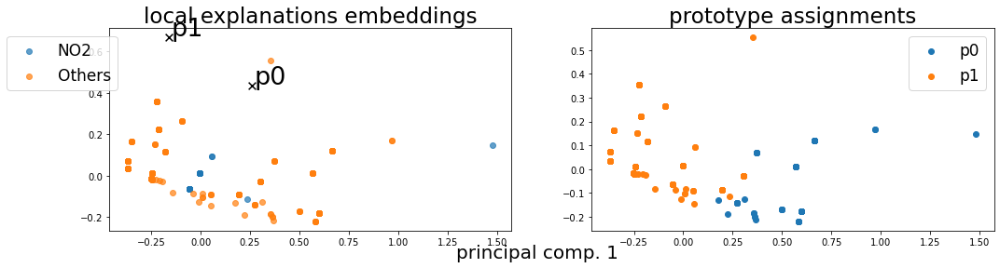

Alpha norms:
tensor([[1.0000, 0.6722],
        [0.7495, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.848798 +- 0.145249
Concept distribution:  (array([0, 1], dtype=int64), array([168, 958], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 3.39780, LEN: 0.067593, AccxC: 0.27, AccO: 0.00, V. Acc: 0.00, V. Loss: 3.42930, V. LEN 0.09
  2: Loss: 2.27412, LEN: 0.067311, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 2.65295, V. LEN 0.09
  3: Loss: 1.58055, LEN: 0.067077, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 1.75363, V. LEN 0.09
  4: Loss: 0.91740, LEN: 0.066868, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.96209, V. LEN 0.09
  5: Loss: 0.51981, LEN: 0.066626, AccxC: 0.75, AccO: 0.00, V. Acc: 0.73, V. Loss: 0.60053, V. LEN 0.09
  6: Loss: 0.43297, LEN: 0.066435, AccxC: 0.75, AccO: 0.69, V. Acc: 0.75, V. Loss: 0.51800, V. LEN 0.08
  7: Loss: 0.39382, LEN: 0.066233, AccxC: 0.75, AccO:

 77: Loss: 0.07335, LEN: 0.051772, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.08794, V. LEN 0.06
 78: Loss: 0.07606, LEN: 0.051846, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.10424, V. LEN 0.06
 79: Loss: 0.07226, LEN: 0.052685, AccxC: 0.76, AccO: 0.76, V. Acc: 0.80, V. Loss: 0.08707, V. LEN 0.06


 80: Loss: 0.07233, LEN: 0.051847, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.08323, V. LEN 0.06
 81: Loss: 0.07192, LEN: 0.052158, AccxC: 0.78, AccO: 0.78, V. Acc: 0.80, V. Loss: 0.09269, V. LEN 0.06
 82: Loss: 0.07147, LEN: 0.052199, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.08936, V. LEN 0.06
 83: Loss: 0.07336, LEN: 0.052573, AccxC: 0.76, AccO: 0.76, V. Acc: 0.80, V. Loss: 0.08671, V. LEN 0.06
 84: Loss: 0.07185, LEN: 0.052071, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.08774, V. LEN 0.06
 85: Loss: 0.07068, LEN: 0.050810, AccxC: 0.78, AccO: 0.78, V. Acc: 0.80, V. Loss: 0.10325, V. LEN 0.06
 86: Loss: 0.06904, LEN: 0.051309, AccxC: 0.77, AccO: 0.77, V.

156: Loss: 0.06058, LEN: 0.051772, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07790, V. LEN 0.06
157: Loss: 0.06265, LEN: 0.052567, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07985, V. LEN 0.06
158: Loss: 0.06164, LEN: 0.052403, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.08400, V. LEN 0.06
159: Loss: 0.06112, LEN: 0.051673, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07461, V. LEN 0.06


160: Loss: 0.06195, LEN: 0.052036, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07414, V. LEN 0.06
161: Loss: 0.05973, LEN: 0.050916, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07617, V. LEN 0.06
162: Loss: 0.06269, LEN: 0.053733, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07464, V. LEN 0.06
163: Loss: 0.06321, LEN: 0.052495, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07393, V. LEN 0.06
164: Loss: 0.07234, LEN: 0.051201, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07803, V. LEN 0.06
165: Loss: 0.06328, LEN: 0.052370, AccxC: 0.77, AccO: 0.77, V.

235: Loss: 0.05855, LEN: 0.053560, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07536, V. LEN 0.06
236: Loss: 0.05845, LEN: 0.052890, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07668, V. LEN 0.06
237: Loss: 0.05602, LEN: 0.050568, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07010, V. LEN 0.06
238: Loss: 0.05823, LEN: 0.052862, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.06814, V. LEN 0.06
239: Loss: 0.05707, LEN: 0.050602, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07206, V. LEN 0.06


240: Loss: 0.05723, LEN: 0.051482, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07523, V. LEN 0.06
241: Loss: 0.05844, LEN: 0.053438, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.06979, V. LEN 0.06
242: Loss: 0.05580, LEN: 0.050611, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07393, V. LEN 0.06
243: Loss: 0.05618, LEN: 0.051387, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.08291, V. LEN 0.06
244: Loss: 0.05673, LEN: 0.052376, AccxC: 0.77, AccO: 0.77, V.

314: Loss: 0.05467, LEN: 0.051164, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07707, V. LEN 0.06
315: Loss: 0.05586, LEN: 0.052239, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.08359, V. LEN 0.06
316: Loss: 0.05521, LEN: 0.052156, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07504, V. LEN 0.06
317: Loss: 0.05523, LEN: 0.051362, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07232, V. LEN 0.06
318: Loss: 0.05638, LEN: 0.053191, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07230, V. LEN 0.06
319: Loss: 0.05417, LEN: 0.051064, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07492, V. LEN 0.06


320: Loss: 0.05514, LEN: 0.052212, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07223, V. LEN 0.06
321: Loss: 0.05412, LEN: 0.051282, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07151, V. LEN 0.06
322: Loss: 0.05610, LEN: 0.053028, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07437, V. LEN 0.06
323: Loss: 0.05422, LEN: 0.051525, AccxC: 0.77, AccO: 0.77, V.

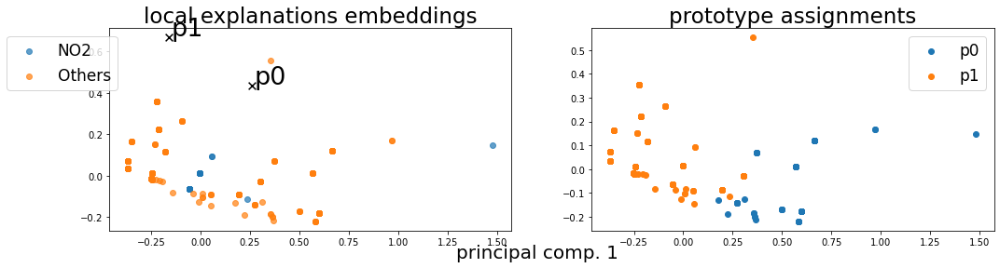

Alpha norms:
tensor([[1.0000, 0.6722],
        [0.7495, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.848798 +- 0.145249
Concept distribution:  (array([0, 1], dtype=int64), array([168, 958], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 4.73998, LEN: 0.067592, AccxC: 0.27, AccO: 0.00, V. Acc: 0.00, V. Loss: 4.71979, V. LEN 0.09
  2: Loss: 3.10904, LEN: 0.067307, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 3.52306, V. LEN 0.09
  3: Loss: 2.12427, LEN: 0.067077, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 2.11869, V. LEN 0.09
  4: Loss: 1.27435, LEN: 0.066872, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 1.13710, V. LEN 0.09
  5: Loss: 0.86171, LEN: 0.066598, AccxC: 0.75, AccO: 0.00, V. Acc: 0.74, V. Loss: 0.90006, V. LEN 0.09
  6: Loss: 0.71744, LEN: 0.066435, AccxC: 0.75, AccO: 0.69, V. Acc: 0.75, V. Loss: 0.76456, V. LEN 0.08
  7: Loss: 0.60442, LEN: 0.066232, AccxC: 0.75, AccO:

 77: Loss: 0.08434, LEN: 0.051312, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.09006, V. LEN 0.06
 78: Loss: 0.08265, LEN: 0.051831, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.10304, V. LEN 0.06
 79: Loss: 0.08199, LEN: 0.052603, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.09117, V. LEN 0.06


 80: Loss: 0.08069, LEN: 0.051741, AccxC: 0.78, AccO: 0.78, V. Acc: 0.80, V. Loss: 0.08814, V. LEN 0.06
 81: Loss: 0.07959, LEN: 0.051972, AccxC: 0.78, AccO: 0.78, V. Acc: 0.80, V. Loss: 0.08669, V. LEN 0.06
 82: Loss: 0.07766, LEN: 0.052285, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07925, V. LEN 0.06
 83: Loss: 0.07950, LEN: 0.052108, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.08539, V. LEN 0.06
 84: Loss: 0.08033, LEN: 0.052061, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.09153, V. LEN 0.06
 85: Loss: 0.07813, LEN: 0.050721, AccxC: 0.78, AccO: 0.78, V. Acc: 0.80, V. Loss: 0.10471, V. LEN 0.06
 86: Loss: 0.07717, LEN: 0.051296, AccxC: 0.77, AccO: 0.77, V.

156: Loss: 0.06355, LEN: 0.051843, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.08125, V. LEN 0.06
157: Loss: 0.06527, LEN: 0.052568, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.08146, V. LEN 0.06
158: Loss: 0.06447, LEN: 0.052290, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.08130, V. LEN 0.06
159: Loss: 0.06310, LEN: 0.051673, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.08369, V. LEN 0.06


160: Loss: 0.06376, LEN: 0.052010, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.08441, V. LEN 0.06
161: Loss: 0.06193, LEN: 0.050914, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.07907, V. LEN 0.06
162: Loss: 0.06500, LEN: 0.053893, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.08043, V. LEN 0.06
163: Loss: 0.06442, LEN: 0.052350, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.08036, V. LEN 0.06
164: Loss: 0.07463, LEN: 0.051272, AccxC: 0.77, AccO: 0.77, V. Acc: 0.80, V. Loss: 0.09086, V. LEN 0.06
165: Loss: 0.06679, LEN: 0.052371, AccxC: 0.77, AccO: 0.77, V.

In [111]:
#"coeff_r1": 0.09,
#"coeff_r2": 0.00099,
            
for r1 in [9e-4, 9e-2, 0.9, 2]:
    for r2 in [9.9e-4, 9e-4, 9e-2, 0.9, 2]: #, 9e-4, 9e-2, 0.9, 2
        batch_sampler = utils.GroupBatchSampler(num_input_graphs=128, drop_last=False, belonging=np.array(belonging_train))
        train_group_loader = DataLoader(dataset_train, batch_sampler=batch_sampler)

        batch_sampler = utils.GroupBatchSampler(num_input_graphs=256, drop_last=False, belonging=np.array(belonging_val))
        val_group_loader = DataLoader(dataset_val, batch_sampler=batch_sampler)

        batch_sampler = utils.GroupBatchSampler(num_input_graphs=256, drop_last=False, belonging=np.array(belonging_test))
        test_group_loader = DataLoader(dataset_test, batch_sampler=batch_sampler)


        torch.manual_seed(42)
        hyper = {
            "len_lr": 0.0005,
            "proto_lr": 0.001,
            "le_emb_lr": 0.001,
            "coeff_divloss": 0.000,
            "coeff_pdist": 0.,
            "coeff_gae": 0.,
            "coeff_r1": r1,
            "coeff_r2": r2,
            "coeff_ce": 0.0,
            "coeff_de": 0.,
            "coeff_logic_loss": 0.00,
            "focal_gamma": 2, #3
            "focal_alpha": -1,
            "ts": 1,
            "te": 1,
            "focal_loss": True,
            "debug_prototypes": False,
            "num_prototypes": 2,
            "dim_prototypes": 10,
            "num_le_features": 14,
            "activation": "leaky",
            "assign_func": "straight_sim",
            "LEN_temperature": 1,
            "remove_attention": True,
            "log_images": True,
            "log_models": True,
            "num_epochs": 2000
        }

        len_model    = models.LEN(hyper["num_prototypes"], 
                                  hyper["LEN_temperature"], 
                                  remove_attention=hyper["remove_attention"]).to(device)
        le_model     = models.LEEmbedder(num_features=hyper["num_le_features"], 
                                         activation=hyper["activation"], 
                                         num_hidden=hyper["dim_prototypes"]).to(device)
        expl         = models.GlobalExplainer(len_model, 
                                       le_model, 
                                       train_group_loader, 
                                       val_group_loader, 
                                       device, 
                                       hyper_params=hyper,
                                       classes_names=mutag_classes_names,
                                       dataset_name="Mutagenicity").to(device)
        expl.iterate(num_epochs=hyper["num_epochs"], log_wandb=False, name_wandb="")

        with open(f'../logs/model_focal_num_proto_6_r1_{r1}_r2_{r2}_Mutagenicity.pkl', 'wb') as handle:
            pickle.dump(expl, handle)

In [152]:
import plotly.graph_objects as go
import pandas as pd
import numpy as np

z = np.zeros((4,5))
for i , r1 in enumerate([9e-4, 9e-2, 0.9, 2]):
    for j , r2 in enumerate([9.9e-4, 9e-4, 9e-2, 0.9, 2]):
        with open(f'../logs/model_focal_num_proto_6_r1_{r1}_r2_{r2}_Mutagenicity.pkl', 'rb') as handle:
            uno = pickle.load(handle)
            z[i,j] = uno.val_metrics[uno.early_stopping.best_epoch-1]["acc_overall"]
        
sh_0, sh_1 = z.shape
x, y = [9.9e-4, 9e-4, 9e-2, 0.9, 2] , [9e-4, 9e-2, 0.9, 2]

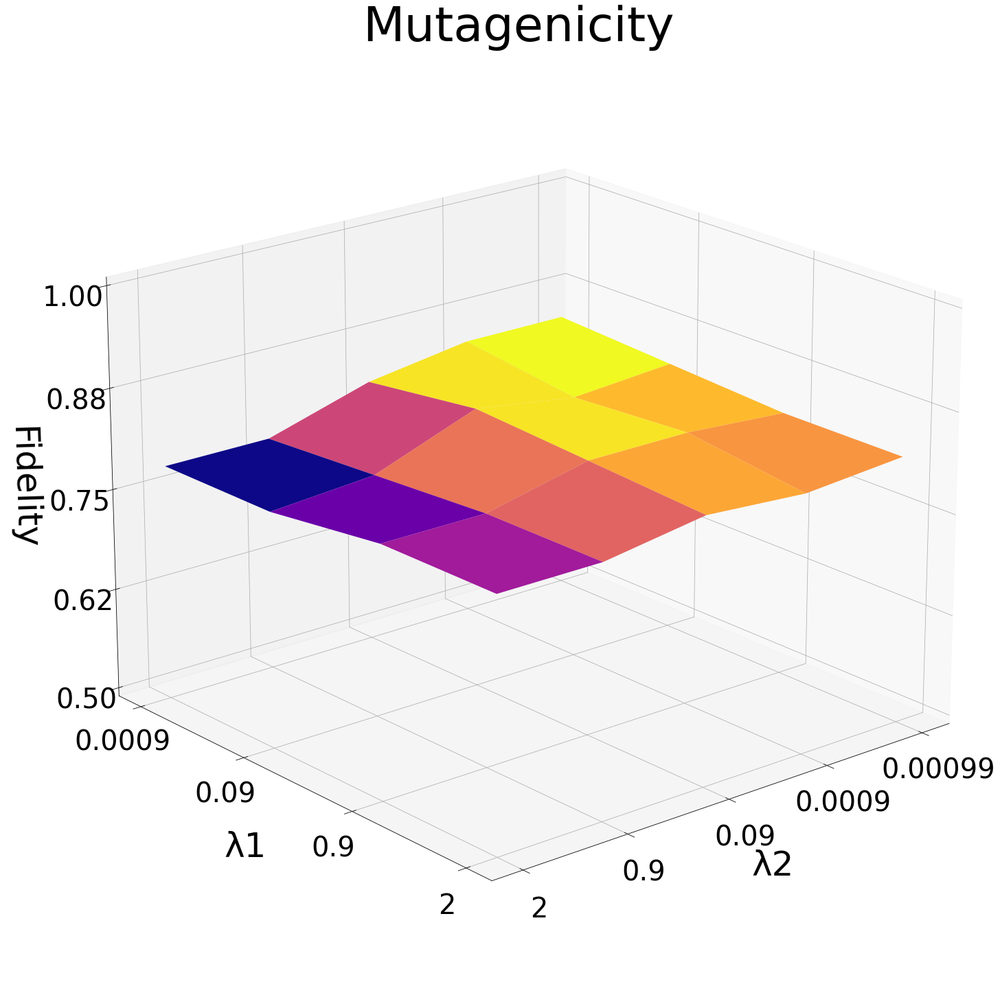

In [153]:
from matplotlib.ticker import LinearLocator

fig, ax = plt.subplots(figsize=(20,20), subplot_kw={"projection": "3d"})

x3, y3 = [1, 2, 3, 4, 5] , [1, 2, 3, 4]
X, Y = np.meshgrid(x3, y3)
Z = z

surf = ax.plot_surface(X, Y, Z, cmap=cm.plasma, linewidth=0, antialiased=True)
ax.set_zlim(0.5, 1.0)
ax.zaxis.set_major_locator(LinearLocator(5))
ax.zaxis.set_major_formatter('{x:.02f}')
ax.view_init(elev=20, azim=50)
ax.set_yticks([1,2,3,4], [str(a) for a in y], size=40)
ax.set_xticks([1,2,3,4,5], [str(a) for a in x], size=40)
ax.tick_params(axis='both', which='major', labelsize=40)
ax.tick_params(axis='both', which='major', pad=20)

mysize = 50
labelpad = 55
ax.set_xlabel("λ2", size=mysize, labelpad=labelpad)
ax.set_ylabel("λ1", size=mysize, labelpad=labelpad)
ax.set_zlabel("Fidelity", size=mysize, labelpad=labelpad, rotation=180)
plt.subplots_adjust(bottom=0.001, left=0.05, right=0.99, top=0.95)

# Add a color bar which maps values to colors.
#cbar = fig.colorbar(surf, shrink=0.5, aspect=6)
#cbar.ax.tick_params(labelsize=mysize) 
plt.title("Mutagenicity", size=mysize+20)
plt.savefig("surface_mutag.pdf")
plt.show()

## Ablation on Discretization

In [ ]:
expls = []
for assign in ["straight_sim", "sim"]:
    batch_sampler = utils.GroupBatchSampler(num_input_graphs=128, drop_last=False, belonging=np.array(belonging_train))
    train_group_loader = DataLoader(dataset_train, batch_sampler=batch_sampler)

    batch_sampler = utils.GroupBatchSampler(num_input_graphs=256, drop_last=False, belonging=np.array(belonging_val))
    val_group_loader = DataLoader(dataset_val, batch_sampler=batch_sampler)

    batch_sampler = utils.GroupBatchSampler(num_input_graphs=256, drop_last=False, belonging=np.array(belonging_test))
    test_group_loader = DataLoader(dataset_test, batch_sampler=batch_sampler)


    torch.manual_seed(42)
    hyper = {
        "len_lr": 0.0005,
        "proto_lr": 0.001,
        "le_emb_lr": 0.001,
        "coeff_divloss": 0.000,
        "coeff_pdist": 0.,
        "coeff_gae": 0.,
        "coeff_r1": 0.09,
        "coeff_r2": 0.00099,
        "coeff_ce": 0.0,
        "coeff_de": 0.,
        "coeff_logic_loss": 0.00,
        "focal_gamma": 2, #3
        "focal_alpha": -1,
        "ts": 1,
        "te": 1,
        "focal_loss": True,
        "debug_prototypes": False,
        "num_prototypes": 2,
        "dim_prototypes": 10,
        "num_le_features": 14,
        "activation": "leaky",
        "assign_func": assign,
        "LEN_temperature": 1,
        "remove_attention": True,
        "log_images": True,
        "log_models": True,
        "num_epochs": 2000
    }

    len_model    = models.LEN(hyper["num_prototypes"], 
                              hyper["LEN_temperature"], 
                              remove_attention=hyper["remove_attention"]).to(device)
    le_model     = models.LEEmbedder(num_features=hyper["num_le_features"], 
                                     activation=hyper["activation"], 
                                     num_hidden=hyper["dim_prototypes"]).to(device)
    expl         = models.GlobalExplainer(len_model, 
                                   le_model, 
                                   train_group_loader, 
                                   val_group_loader, 
                                   device, 
                                   hyper_params=hyper,
                                   classes_names=mutag_classes_names,
                                   dataset_name="Mutagenicity").to(device)
    expl.iterate(num_epochs=hyper["num_epochs"], log_wandb=False, name_wandb="")
    expls.append(expl)
    
    with open(f'../logs/model_assign_{assign}_Mutagenicity.pkl', 'wb') as handle:
        pickle.dump(expl, handle)

#### plots

In [ ]:
metrics = []
for num_p in [2, 4, 6, 8]:
    with open(f'../logs/model_assign_{assign}_Mutagenicity.pkl', 'rb') as handle:
        uno = pickle.load(handle)
        del uno.dataloader
        del uno.val_dataloader
        metrics.append(uno)

In [ ]:
c1 = "#86ac75"
c2 = "#dc8f5a"

plt.plot([e["acc_overall"] for e in metrics], label="W Discretization", color=c1)
plt.plot([e["acc_overall"] for e in metrics], label="W/o Discretization", color=c2)
plt.legend()
plt.title("LEN fidelity")
plt.xlabel("epochs")
plt.ylabel("fidelity (%)")
plt.show()

plt.plot([e["logic_acc_clf"] for e in metrics], label="W Discretization", color=c1)
plt.plot([e["logic_acc_clf"] for e in metrics], label="W/o Discretization", color=c2)
plt.legend()
plt.title("Formula accuracy")
plt.xlabel("epochs")
plt.ylabel("accuracy (%)")
plt.show()

plt.plot([e["concept_vector_entropy"] for e in metrics], label="W Discretization", color=c1)
plt.plot([e["concept_vector_entropy"] for e in metrics], label="W/o Discretization", color=c2)
plt.legend()
plt.title("Formula accuracy")
plt.xlabel("epochs")
plt.ylabel("accuracy (%)")
plt.show()


purity     = np.array([e["concept_purity"] for e in metrics])
std_purity = np.array([e["concept_purity_std"] for e in metrics])
plt.plot(purity, label="W Discretization", color=c1)
plt.fill_between(range(len(purity)), purity-std_purity, purity+std_purity, alpha=0.5, color=c1)

purity     = np.array([e["concept_purity"] for e in metrics])
std_purity = np.array([e["concept_purity_std"] for e in metrics])
plt.plot(purity, label="W/o Discretization", color=c2)
plt.fill_between(range(len(purity)), purity-std_purity, purity+std_purity, alpha=0.5, color=c2)

plt.legend()
plt.title("Concept Purity")
plt.xlabel("epochs")
plt.ylabel("purity (%)")
plt.show()

## Confidence intervals

(array([0., 1.], dtype=float32), array([675, 451], dtype=int64))


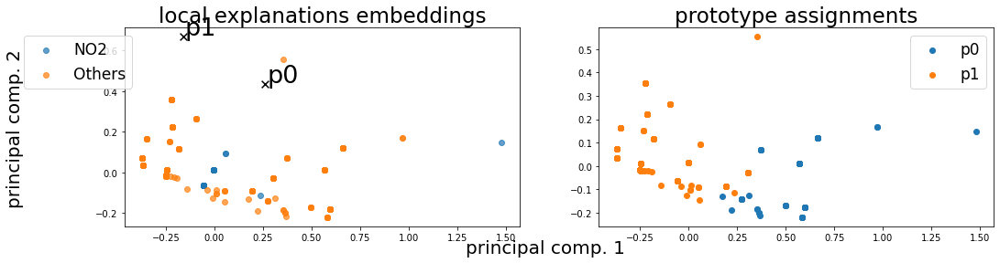

Alpha norms:
tensor([[1.0000, 0.6722],
        [0.7495, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.848798 +- 0.145249
Concept distribution:  (array([0, 1], dtype=int64), array([168, 958], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 0.16945, LEN: 0.067586, AccxC: 0.28, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.19126, V. LEN 0.09
  2: Loss: 0.14036, LEN: 0.067307, AccxC: 0.76, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.16800, V. LEN 0.09
  3: Loss: 0.11722, LEN: 0.067088, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.14394, V. LEN 0.09
  4: Loss: 0.09511, LEN: 0.066908, AccxC: 0.76, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.11639, V. LEN 0.09
  5: Loss: 0.08089, LEN: 0.066614, AccxC: 0.76, AccO: 0.00, V. Acc: 0.73, V. Loss: 0.10444, V. LEN 0.09
  6: Loss: 0.07426, LEN: 0.066420, AccxC: 0.77, AccO: 0.69, V. Acc: 0.75, V. Loss: 0.09576, V. LEN 0.08
  7: Loss: 0.07258, LEN: 0.066168, AccxC: 0.76, AccO:

 77: Loss: 0.04479, LEN: 0.044146, AccxC: 0.80, AccO: 0.80, V. Acc: 0.82, V. Loss: 0.05470, V. LEN 0.05
 78: Loss: 0.04303, LEN: 0.042553, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05474, V. LEN 0.05
 79: Loss: 0.04426, LEN: 0.043696, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.05401, V. LEN 0.05


 80: Loss: 0.04324, LEN: 0.042852, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.05386, V. LEN 0.05
 81: Loss: 0.04218, LEN: 0.041622, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05358, V. LEN 0.05
 82: Loss: 0.04084, LEN: 0.040534, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05404, V. LEN 0.05
 83: Loss: 0.04282, LEN: 0.042458, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05460, V. LEN 0.05
 84: Loss: 0.04177, LEN: 0.041381, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.05458, V. LEN 0.05
 85: Loss: 0.04180, LEN: 0.041465, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05464, V. LEN 0.05
 86: Loss: 0.04210, LEN: 0.041635, AccxC: 0.82, AccO: 0.82, V.

157: Loss: 0.04125, LEN: 0.040905, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.05488, V. LEN 0.05
158: Loss: 0.04066, LEN: 0.040420, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05408, V. LEN 0.05
159: Loss: 0.04042, LEN: 0.040064, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.05392, V. LEN 0.05


160: Loss: 0.04277, LEN: 0.042417, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05396, V. LEN 0.05
161: Loss: 0.03942, LEN: 0.039091, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05386, V. LEN 0.05
162: Loss: 0.04085, LEN: 0.040481, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05392, V. LEN 0.05
163: Loss: 0.04066, LEN: 0.040034, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.05542, V. LEN 0.05
164: Loss: 0.03933, LEN: 0.038965, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.05511, V. LEN 0.05
165: Loss: 0.04252, LEN: 0.042202, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05477, V. LEN 0.05
166: Loss: 0.04079, LEN: 0.040361, AccxC: 0.82, AccO: 0.82, V.

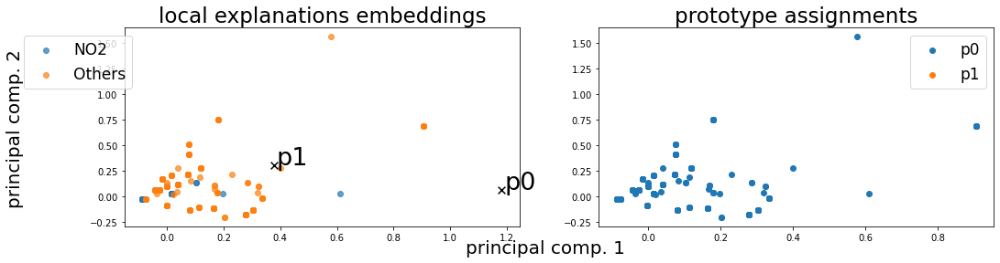

Alpha norms:
tensor([[1.0000, 0.7887],
        [1.0000, 0.7748]], grad_fn=<DivBackward0>)
Concept Purity: 0.599467 +- 0.000000
Concept distribution:  (array([0], dtype=int64), array([1126], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 0.22797, LEN: 0.070948, AccxC: 0.25, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.27157, V. LEN 0.09
  2: Loss: 0.20593, LEN: 0.070413, AccxC: 0.40, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.25993, V. LEN 0.09
  3: Loss: 0.18514, LEN: 0.069888, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.21822, V. LEN 0.09
  4: Loss: 0.15149, LEN: 0.069393, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.17881, V. LEN 0.09
  5: Loss: 0.12173, LEN: 0.068889, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.14275, V. LEN 0.09
  6: Loss: 0.10193, LEN: 0.068546, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.12003, V. LEN 0.09
  7: Loss: 0.08943, LEN: 0.067962, AccxC: 0.75, AccO: 0.00, 

 77: Loss: 0.04128, LEN: 0.040346, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05409, V. LEN 0.05
 78: Loss: 0.04247, LEN: 0.041271, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05377, V. LEN 0.05
 79: Loss: 0.04090, LEN: 0.040130, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05342, V. LEN 0.05


 80: Loss: 0.04224, LEN: 0.041428, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05426, V. LEN 0.05
 81: Loss: 0.04132, LEN: 0.040807, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05542, V. LEN 0.05
 82: Loss: 0.04380, LEN: 0.041686, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.05561, V. LEN 0.05
 83: Loss: 0.04212, LEN: 0.041337, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05463, V. LEN 0.05
 84: Loss: 0.03947, LEN: 0.038667, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05418, V. LEN 0.05
 85: Loss: 0.04371, LEN: 0.043109, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05462, V. LEN 0.05
 86: Loss: 0.04138, LEN: 0.040733, AccxC: 0.82, AccO: 0.82, V.

157: Loss: 0.04041, LEN: 0.039396, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05395, V. LEN 0.05
158: Loss: 0.04094, LEN: 0.040504, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05212, V. LEN 0.05
159: Loss: 0.03946, LEN: 0.038836, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.05015, V. LEN 0.05


160: Loss: 0.03963, LEN: 0.039139, AccxC: 0.81, AccO: 0.81, V. Acc: 0.83, V. Loss: 0.05019, V. LEN 0.05
161: Loss: 0.04022, LEN: 0.039517, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05086, V. LEN 0.05
162: Loss: 0.04345, LEN: 0.042968, AccxC: 0.81, AccO: 0.81, V. Acc: 0.82, V. Loss: 0.05305, V. LEN 0.05
163: Loss: 0.04097, LEN: 0.040492, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05359, V. LEN 0.05
164: Loss: 0.03952, LEN: 0.039079, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.05436, V. LEN 0.05
165: Loss: 0.04000, LEN: 0.039175, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05106, V. LEN 0.05
166: Loss: 0.03981, LEN: 0.039208, AccxC: 0.81, AccO: 0.81, V.

236: Loss: 0.04090, LEN: 0.040352, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05368, V. LEN 0.05
237: Loss: 0.04129, LEN: 0.040819, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05324, V. LEN 0.05
238: Loss: 0.04114, LEN: 0.040622, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05272, V. LEN 0.05
239: Loss: 0.04224, LEN: 0.041813, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.05280, V. LEN 0.05


240: Loss: 0.04030, LEN: 0.039886, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05476, V. LEN 0.05
241: Loss: 0.04158, LEN: 0.041145, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.05352, V. LEN 0.05
242: Loss: 0.04112, LEN: 0.040575, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05326, V. LEN 0.05
243: Loss: 0.04056, LEN: 0.040141, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05304, V. LEN 0.05
244: Loss: 0.04191, LEN: 0.041437, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05283, V. LEN 0.05
245: Loss: 0.04293, LEN: 0.042281, AccxC: 0.81, AccO: 0.81, V.

315: Loss: 0.04235, LEN: 0.041953, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05387, V. LEN 0.05
316: Loss: 0.04024, LEN: 0.039865, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05200, V. LEN 0.05
317: Loss: 0.04129, LEN: 0.040854, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.05397, V. LEN 0.05
318: Loss: 0.04144, LEN: 0.040997, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05317, V. LEN 0.05
319: Loss: 0.04385, LEN: 0.043511, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.05258, V. LEN 0.05


320: Loss: 0.04005, LEN: 0.039167, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.05236, V. LEN 0.05
321: Loss: 0.04029, LEN: 0.039884, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05263, V. LEN 0.05
322: Loss: 0.04248, LEN: 0.042115, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.05231, V. LEN 0.05
323: Loss: 0.04073, LEN: 0.040360, AccxC: 0.80, AccO: 0.80, V. Acc: 0.82, V. Loss: 0.05024, V. LEN 0.05
324: Loss: 0.04357, LEN: 0.043187, AccxC: 0.79, AccO: 0.79, V.

395: Loss: 0.03949, LEN: 0.039178, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05449, V. LEN 0.05
396: Loss: 0.04115, LEN: 0.040893, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05477, V. LEN 0.05
397: Loss: 0.03925, LEN: 0.039006, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05465, V. LEN 0.05
398: Loss: 0.04208, LEN: 0.041843, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05418, V. LEN 0.05
399: Loss: 0.04092, LEN: 0.040633, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.05243, V. LEN 0.05


400: Loss: 0.04084, LEN: 0.040565, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.05246, V. LEN 0.05
401: Loss: 0.04222, LEN: 0.041896, AccxC: 0.80, AccO: 0.80, V. Acc: 0.81, V. Loss: 0.05248, V. LEN 0.05
402: Loss: 0.03930, LEN: 0.038992, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05422, V. LEN 0.05
403: Loss: 0.04191, LEN: 0.041590, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05447, V. LEN 0.05
404: Loss: 0.04000, LEN: 0.039684, AccxC: 0.82, AccO: 0.82, V.

475: Loss: 0.04141, LEN: 0.041152, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05361, V. LEN 0.05
476: Loss: 0.04133, LEN: 0.041067, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05379, V. LEN 0.05
477: Loss: 0.04146, LEN: 0.041178, AccxC: 0.82, AccO: 0.82, V. Acc: 0.83, V. Loss: 0.04677, V. LEN 0.05
478: Loss: 0.03987, LEN: 0.039612, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.05367, V. LEN 0.05
479: Loss: 0.03906, LEN: 0.038843, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05398, V. LEN 0.05


480: Loss: 0.03987, LEN: 0.039665, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05405, V. LEN 0.05
481: Loss: 0.04254, LEN: 0.042254, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.05371, V. LEN 0.05
482: Loss: 0.04290, LEN: 0.042637, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05350, V. LEN 0.05
483: Loss: 0.04290, LEN: 0.042653, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05388, V. LEN 0.05
484: Loss: 0.04098, LEN: 0.040745, AccxC: 0.82, AccO: 0.82, V.

(array([0., 1.], dtype=float32), array([675, 451], dtype=int64))


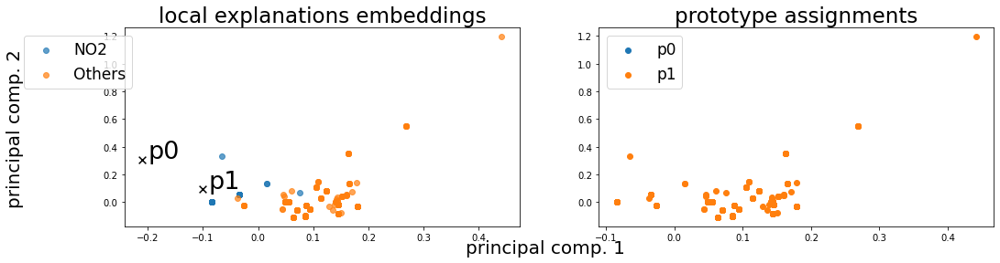

Alpha norms:
tensor([[0.7363, 1.0000],
        [1.0000, 0.9394]], grad_fn=<DivBackward0>)
Concept Purity: 0.599467 +- 0.000000
Concept distribution:  (array([1], dtype=int64), array([1126], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 0.18220, LEN: 0.069519, AccxC: 0.51, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.21103, V. LEN 0.09
  2: Loss: 0.13959, LEN: 0.069075, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.15892, V. LEN 0.09
  3: Loss: 0.10646, LEN: 0.068733, AccxC: 0.74, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.12611, V. LEN 0.09
  4: Loss: 0.08777, LEN: 0.068285, AccxC: 0.74, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.10456, V. LEN 0.09
  5: Loss: 0.07669, LEN: 0.067897, AccxC: 0.76, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.09549, V. LEN 0.09
  6: Loss: 0.07243, LEN: 0.067584, AccxC: 0.76, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.09214, V. LEN 0.09
  7: Loss: 0.07145, LEN: 0.066988, AccxC: 0.78, AccO: 0.00, 

 77: Loss: 0.04350, LEN: 0.043241, AccxC: 0.81, AccO: 0.81, V. Acc: 0.80, V. Loss: 0.05779, V. LEN 0.06
 78: Loss: 0.04365, LEN: 0.043359, AccxC: 0.81, AccO: 0.81, V. Acc: 0.80, V. Loss: 0.05721, V. LEN 0.05
 79: Loss: 0.04343, LEN: 0.043181, AccxC: 0.81, AccO: 0.81, V. Acc: 0.80, V. Loss: 0.05735, V. LEN 0.05


 80: Loss: 0.04254, LEN: 0.042212, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05398, V. LEN 0.05
 81: Loss: 0.04386, LEN: 0.043413, AccxC: 0.81, AccO: 0.81, V. Acc: 0.80, V. Loss: 0.05683, V. LEN 0.05
 82: Loss: 0.04212, LEN: 0.041672, AccxC: 0.82, AccO: 0.82, V. Acc: 0.80, V. Loss: 0.05742, V. LEN 0.06
 83: Loss: 0.04137, LEN: 0.041109, AccxC: 0.81, AccO: 0.81, V. Acc: 0.80, V. Loss: 0.05770, V. LEN 0.06
 84: Loss: 0.04092, LEN: 0.040678, AccxC: 0.82, AccO: 0.82, V. Acc: 0.80, V. Loss: 0.05628, V. LEN 0.05
 85: Loss: 0.04357, LEN: 0.043232, AccxC: 0.82, AccO: 0.82, V. Acc: 0.80, V. Loss: 0.05640, V. LEN 0.05
 86: Loss: 0.04325, LEN: 0.042950, AccxC: 0.81, AccO: 0.81, V.

156: Loss: 0.04286, LEN: 0.042525, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05386, V. LEN 0.05
157: Loss: 0.04099, LEN: 0.040645, AccxC: 0.82, AccO: 0.82, V. Acc: 0.82, V. Loss: 0.05435, V. LEN 0.05
158: Loss: 0.03944, LEN: 0.039158, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05622, V. LEN 0.06
159: Loss: 0.03978, LEN: 0.039515, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05677, V. LEN 0.06


160: Loss: 0.04116, LEN: 0.040870, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.05632, V. LEN 0.06
161: Loss: 0.04102, LEN: 0.040792, AccxC: 0.82, AccO: 0.82, V. Acc: 0.80, V. Loss: 0.05693, V. LEN 0.06
162: Loss: 0.04117, LEN: 0.040829, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.05621, V. LEN 0.06
163: Loss: 0.04126, LEN: 0.040975, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.05687, V. LEN 0.06
164: Loss: 0.04118, LEN: 0.040921, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.05644, V. LEN 0.06
165: Loss: 0.03944, LEN: 0.039165, AccxC: 0.81, AccO: 0.81, V.

235: Loss: 0.04008, LEN: 0.039823, AccxC: 0.83, AccO: 0.80, V. Acc: 0.81, V. Loss: 0.05642, V. LEN 0.06
236: Loss: 0.04119, LEN: 0.040937, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05641, V. LEN 0.06
237: Loss: 0.04202, LEN: 0.041806, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05635, V. LEN 0.06
238: Loss: 0.04176, LEN: 0.041548, AccxC: 0.80, AccO: 0.80, V. Acc: 0.82, V. Loss: 0.05787, V. LEN 0.06
239: Loss: 0.04137, LEN: 0.041127, AccxC: 0.83, AccO: 0.83, V. Acc: 0.82, V. Loss: 0.05796, V. LEN 0.06


240: Loss: 0.04300, LEN: 0.042780, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05685, V. LEN 0.06
241: Loss: 0.04049, LEN: 0.040254, AccxC: 0.83, AccO: 0.83, V. Acc: 0.81, V. Loss: 0.05714, V. LEN 0.06
242: Loss: 0.04032, LEN: 0.039916, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05599, V. LEN 0.06
243: Loss: 0.04020, LEN: 0.039928, AccxC: 0.82, AccO: 0.82, V. Acc: 0.81, V. Loss: 0.05597, V. LEN 0.06
244: Loss: 0.04415, LEN: 0.043881, AccxC: 0.81, AccO: 0.81, V.

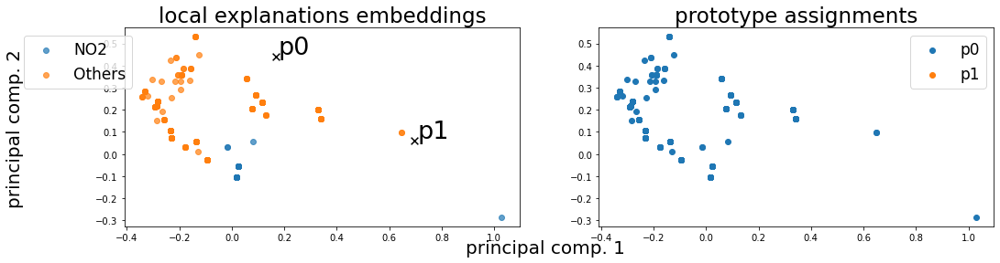

Alpha norms:
tensor([[1.0000, 0.9083],
        [0.7503, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.599467 +- 0.000000
Concept distribution:  (array([0], dtype=int64), array([1126], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 0.28530, LEN: 0.068956, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.35709, V. LEN 0.09
  2: Loss: 0.23610, LEN: 0.068440, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.28022, V. LEN 0.09
  3: Loss: 0.20054, LEN: 0.067880, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.22999, V. LEN 0.09
  4: Loss: 0.16327, LEN: 0.067442, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.19844, V. LEN 0.09
  5: Loss: 0.13268, LEN: 0.067236, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.17179, V. LEN 0.09
  6: Loss: 0.10389, LEN: 0.066768, AccxC: 0.75, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.12668, V. LEN 0.09
  7: Loss: 0.08536, LEN: 0.066523, AccxC: 0.75, AccO: 0.00, 

 78: Loss: 0.04527, LEN: 0.044537, AccxC: 0.80, AccO: 0.80, V. Acc: 0.81, V. Loss: 0.05058, V. LEN 0.05
 79: Loss: 0.04257, LEN: 0.041737, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.04992, V. LEN 0.05


 80: Loss: 0.04397, LEN: 0.043115, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.04989, V. LEN 0.05
 81: Loss: 0.04232, LEN: 0.041477, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.05064, V. LEN 0.05
 82: Loss: 0.04201, LEN: 0.041326, AccxC: 0.80, AccO: 0.80, V. Acc: 0.81, V. Loss: 0.05053, V. LEN 0.05
 83: Loss: 0.04454, LEN: 0.043732, AccxC: 0.80, AccO: 0.80, V. Acc: 0.81, V. Loss: 0.05153, V. LEN 0.05
 84: Loss: 0.04139, LEN: 0.040683, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.05065, V. LEN 0.05
 85: Loss: 0.04147, LEN: 0.040826, AccxC: 0.80, AccO: 0.80, V. Acc: 0.81, V. Loss: 0.05045, V. LEN 0.05
 86: Loss: 0.04098, LEN: 0.040284, AccxC: 0.80, AccO: 0.80, V. Acc: 0.81, V. Loss: 0.05126, V. LEN 0.05
 87: Loss: 0.04167, LEN: 0.040667, AccxC: 0.80, AccO: 0.80, V.

157: Loss: 0.04099, LEN: 0.040502, AccxC: 0.80, AccO: 0.80, V. Acc: 0.81, V. Loss: 0.04829, V. LEN 0.05
158: Loss: 0.04203, LEN: 0.041657, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.04811, V. LEN 0.05
159: Loss: 0.04318, LEN: 0.042703, AccxC: 0.80, AccO: 0.80, V. Acc: 0.81, V. Loss: 0.04809, V. LEN 0.05


160: Loss: 0.04067, LEN: 0.040133, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.04774, V. LEN 0.05
161: Loss: 0.04101, LEN: 0.040349, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.04773, V. LEN 0.05
162: Loss: 0.04018, LEN: 0.039611, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.04759, V. LEN 0.05
163: Loss: 0.04036, LEN: 0.039838, AccxC: 0.80, AccO: 0.80, V. Acc: 0.81, V. Loss: 0.04779, V. LEN 0.05
164: Loss: 0.04016, LEN: 0.039652, AccxC: 0.80, AccO: 0.80, V. Acc: 0.81, V. Loss: 0.04792, V. LEN 0.05
165: Loss: 0.04023, LEN: 0.039728, AccxC: 0.80, AccO: 0.80, V. Acc: 0.81, V. Loss: 0.04796, V. LEN 0.05
166: Loss: 0.04215, LEN: 0.041665, AccxC: 0.81, AccO: 0.81, V.

236: Loss: 0.04214, LEN: 0.041805, AccxC: 0.80, AccO: 0.80, V. Acc: 0.81, V. Loss: 0.04849, V. LEN 0.05
237: Loss: 0.04284, LEN: 0.042471, AccxC: 0.80, AccO: 0.80, V. Acc: 0.81, V. Loss: 0.05061, V. LEN 0.05
238: Loss: 0.04065, LEN: 0.040292, AccxC: 0.79, AccO: 0.79, V. Acc: 0.81, V. Loss: 0.05025, V. LEN 0.05
239: Loss: 0.03934, LEN: 0.039081, AccxC: 0.80, AccO: 0.80, V. Acc: 0.81, V. Loss: 0.04989, V. LEN 0.05


240: Loss: 0.04142, LEN: 0.041101, AccxC: 0.80, AccO: 0.80, V. Acc: 0.81, V. Loss: 0.04832, V. LEN 0.05
241: Loss: 0.04031, LEN: 0.039947, AccxC: 0.80, AccO: 0.80, V. Acc: 0.81, V. Loss: 0.04908, V. LEN 0.05
242: Loss: 0.04191, LEN: 0.041514, AccxC: 0.80, AccO: 0.80, V. Acc: 0.81, V. Loss: 0.04954, V. LEN 0.05
243: Loss: 0.04277, LEN: 0.042380, AccxC: 0.80, AccO: 0.80, V. Acc: 0.81, V. Loss: 0.05083, V. LEN 0.05
244: Loss: 0.04129, LEN: 0.040927, AccxC: 0.80, AccO: 0.80, V. Acc: 0.81, V. Loss: 0.05122, V. LEN 0.05
245: Loss: 0.04426, LEN: 0.043916, AccxC: 0.80, AccO: 0.80, V.

315: Loss: 0.04094, LEN: 0.040615, AccxC: 0.80, AccO: 0.80, V. Acc: 0.81, V. Loss: 0.04840, V. LEN 0.05
316: Loss: 0.04231, LEN: 0.041932, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.04746, V. LEN 0.05
317: Loss: 0.04129, LEN: 0.040883, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.04746, V. LEN 0.05
318: Loss: 0.03923, LEN: 0.038820, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.04766, V. LEN 0.05
319: Loss: 0.04071, LEN: 0.040372, AccxC: 0.80, AccO: 0.80, V. Acc: 0.81, V. Loss: 0.04932, V. LEN 0.05


320: Loss: 0.04212, LEN: 0.041726, AccxC: 0.79, AccO: 0.79, V. Acc: 0.81, V. Loss: 0.05041, V. LEN 0.05
321: Loss: 0.04213, LEN: 0.041770, AccxC: 0.80, AccO: 0.80, V. Acc: 0.81, V. Loss: 0.04858, V. LEN 0.05
Early Stopping
Loading model at epoch 220
Best epoch: 220
Trained lasted for 80 seconds
(array([0., 1.], dtype=float32), array([675, 451], dtype=int64))


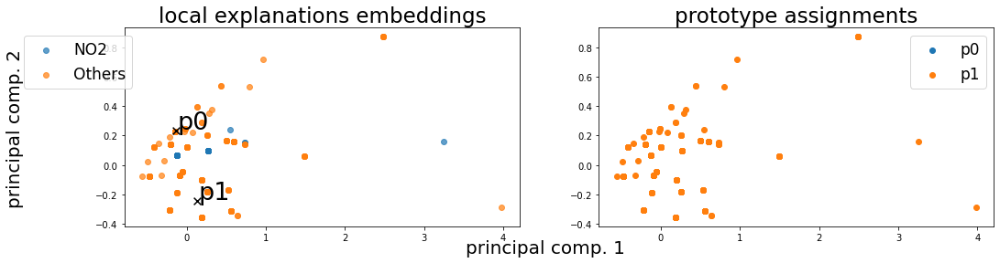

Alpha norms:
tensor([[0.6637, 1.0000],
        [1.0000, 0.6183]], grad_fn=<DivBackward0>)
Concept Purity: 0.599467 +- 0.000000
Concept distribution:  (array([1], dtype=int64), array([1126], dtype=int64))
Logic formulas:
For class 0:
0.0 ()
For class 1:
0.0 ()
Accuracy as classifier:  0.0
LEN fidelity:  tensor(0.)

  1: Loss: 0.21419, LEN: 0.071114, AccxC: 0.25, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.26301, V. LEN 0.09
  2: Loss: 0.19541, LEN: 0.070588, AccxC: 0.26, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.24158, V. LEN 0.09
  3: Loss: 0.17098, LEN: 0.070005, AccxC: 0.27, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.21283, V. LEN 0.09
  4: Loss: 0.14305, LEN: 0.069161, AccxC: 0.37, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.17555, V. LEN 0.09
  5: Loss: 0.11398, LEN: 0.068308, AccxC: 0.58, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.14294, V. LEN 0.09
  6: Loss: 0.09707, LEN: 0.067894, AccxC: 0.67, AccO: 0.00, V. Acc: 0.00, V. Loss: 0.12098, V. LEN 0.09
  7: Loss: 0.08736, LEN: 0.067695, AccxC: 0.66, AccO: 0.00, 

 78: Loss: 0.04442, LEN: 0.043695, AccxC: 0.75, AccO: 0.62, V. Acc: 0.63, V. Loss: 0.05483, V. LEN 0.05
 79: Loss: 0.04670, LEN: 0.045952, AccxC: 0.75, AccO: 0.62, V. Acc: 0.63, V. Loss: 0.05276, V. LEN 0.05


 80: Loss: 0.04470, LEN: 0.043994, AccxC: 0.75, AccO: 0.62, V. Acc: 0.63, V. Loss: 0.05192, V. LEN 0.05
 81: Loss: 0.04396, LEN: 0.043162, AccxC: 0.75, AccO: 0.62, V. Acc: 0.63, V. Loss: 0.05205, V. LEN 0.05
 82: Loss: 0.04576, LEN: 0.044889, AccxC: 0.75, AccO: 0.62, V. Acc: 0.63, V. Loss: 0.05317, V. LEN 0.05
 83: Loss: 0.04465, LEN: 0.043833, AccxC: 0.75, AccO: 0.62, V. Acc: 0.63, V. Loss: 0.05201, V. LEN 0.05
 84: Loss: 0.04366, LEN: 0.043009, AccxC: 0.75, AccO: 0.62, V. Acc: 0.63, V. Loss: 0.05106, V. LEN 0.05
 85: Loss: 0.04345, LEN: 0.042630, AccxC: 0.74, AccO: 0.62, V. Acc: 0.63, V. Loss: 0.05070, V. LEN 0.05
 86: Loss: 0.04604, LEN: 0.045332, AccxC: 0.81, AccO: 0.62, V. Acc: 0.63, V. Loss: 0.05070, V. LEN 0.05
 87: Loss: 0.04449, LEN: 0.043864, AccxC: 0.81, AccO: 0.62, V.

158: Loss: 0.03976, LEN: 0.039218, AccxC: 0.81, AccO: 0.81, V. Acc: 0.83, V. Loss: 0.04693, V. LEN 0.05
159: Loss: 0.04222, LEN: 0.041765, AccxC: 0.81, AccO: 0.81, V. Acc: 0.83, V. Loss: 0.04680, V. LEN 0.05


160: Loss: 0.04149, LEN: 0.041005, AccxC: 0.81, AccO: 0.81, V. Acc: 0.83, V. Loss: 0.04725, V. LEN 0.05
161: Loss: 0.04280, LEN: 0.042279, AccxC: 0.81, AccO: 0.81, V. Acc: 0.83, V. Loss: 0.04661, V. LEN 0.05
162: Loss: 0.04169, LEN: 0.041247, AccxC: 0.81, AccO: 0.81, V. Acc: 0.83, V. Loss: 0.04650, V. LEN 0.05
163: Loss: 0.04066, LEN: 0.040156, AccxC: 0.81, AccO: 0.81, V. Acc: 0.83, V. Loss: 0.04666, V. LEN 0.05
164: Loss: 0.04355, LEN: 0.043154, AccxC: 0.80, AccO: 0.80, V. Acc: 0.83, V. Loss: 0.04770, V. LEN 0.05
165: Loss: 0.04163, LEN: 0.041263, AccxC: 0.80, AccO: 0.80, V. Acc: 0.83, V. Loss: 0.04855, V. LEN 0.05
166: Loss: 0.04105, LEN: 0.040599, AccxC: 0.81, AccO: 0.81, V. Acc: 0.83, V. Loss: 0.04738, V. LEN 0.05
167: Loss: 0.04226, LEN: 0.041785, AccxC: 0.81, AccO: 0.81, V.

238: Loss: 0.04062, LEN: 0.040299, AccxC: 0.81, AccO: 0.81, V. Acc: 0.83, V. Loss: 0.04889, V. LEN 0.05
239: Loss: 0.04101, LEN: 0.040551, AccxC: 0.82, AccO: 0.82, V. Acc: 0.83, V. Loss: 0.05019, V. LEN 0.05


240: Loss: 0.04058, LEN: 0.040266, AccxC: 0.81, AccO: 0.81, V. Acc: 0.83, V. Loss: 0.04730, V. LEN 0.05
241: Loss: 0.04104, LEN: 0.040700, AccxC: 0.82, AccO: 0.82, V. Acc: 0.83, V. Loss: 0.04673, V. LEN 0.05
242: Loss: 0.04199, LEN: 0.041691, AccxC: 0.81, AccO: 0.81, V. Acc: 0.83, V. Loss: 0.04683, V. LEN 0.05
243: Loss: 0.04210, LEN: 0.041812, AccxC: 0.81, AccO: 0.81, V. Acc: 0.83, V. Loss: 0.04835, V. LEN 0.05
244: Loss: 0.04199, LEN: 0.041695, AccxC: 0.81, AccO: 0.81, V. Acc: 0.83, V. Loss: 0.04952, V. LEN 0.05
245: Loss: 0.04261, LEN: 0.042284, AccxC: 0.81, AccO: 0.81, V. Acc: 0.83, V. Loss: 0.04984, V. LEN 0.05
246: Loss: 0.03988, LEN: 0.039490, AccxC: 0.82, AccO: 0.82, V. Acc: 0.83, V. Loss: 0.04895, V. LEN 0.05
247: Loss: 0.04122, LEN: 0.040932, AccxC: 0.81, AccO: 0.81, V.

317: Loss: 0.04103, LEN: 0.040754, AccxC: 0.81, AccO: 0.81, V. Acc: 0.83, V. Loss: 0.04639, V. LEN 0.05
318: Loss: 0.03914, LEN: 0.038595, AccxC: 0.81, AccO: 0.81, V. Acc: 0.83, V. Loss: 0.04718, V. LEN 0.05
319: Loss: 0.04080, LEN: 0.040501, AccxC: 0.81, AccO: 0.81, V. Acc: 0.83, V. Loss: 0.04636, V. LEN 0.05


320: Loss: 0.04027, LEN: 0.040004, AccxC: 0.80, AccO: 0.80, V. Acc: 0.83, V. Loss: 0.04628, V. LEN 0.05
321: Loss: 0.04207, LEN: 0.041774, AccxC: 0.81, AccO: 0.81, V. Acc: 0.83, V. Loss: 0.04708, V. LEN 0.05
322: Loss: 0.04174, LEN: 0.041434, AccxC: 0.81, AccO: 0.81, V. Acc: 0.83, V. Loss: 0.04782, V. LEN 0.05
323: Loss: 0.04079, LEN: 0.040543, AccxC: 0.81, AccO: 0.81, V. Acc: 0.83, V. Loss: 0.04710, V. LEN 0.05
324: Loss: 0.04131, LEN: 0.041017, AccxC: 0.81, AccO: 0.81, V. Acc: 0.83, V. Loss: 0.04703, V. LEN 0.05
325: Loss: 0.04281, LEN: 0.042575, AccxC: 0.80, AccO: 0.80, V. Acc: 0.83, V. Loss: 0.04742, V. LEN 0.05
326: Loss: 0.04027, LEN: 0.040029, AccxC: 0.80, AccO: 0.80, V.

396: Loss: 0.04229, LEN: 0.041981, AccxC: 0.81, AccO: 0.81, V. Acc: 0.83, V. Loss: 0.04802, V. LEN 0.05
397: Loss: 0.04116, LEN: 0.040927, AccxC: 0.81, AccO: 0.81, V. Acc: 0.83, V. Loss: 0.04830, V. LEN 0.05
398: Loss: 0.04269, LEN: 0.042466, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.04800, V. LEN 0.05
399: Loss: 0.04121, LEN: 0.040961, AccxC: 0.80, AccO: 0.80, V. Acc: 0.81, V. Loss: 0.05043, V. LEN 0.05


400: Loss: 0.04300, LEN: 0.042795, AccxC: 0.80, AccO: 0.80, V. Acc: 0.81, V. Loss: 0.05068, V. LEN 0.05
401: Loss: 0.04276, LEN: 0.042586, AccxC: 0.81, AccO: 0.81, V. Acc: 0.83, V. Loss: 0.04851, V. LEN 0.05
402: Loss: 0.04303, LEN: 0.042835, AccxC: 0.80, AccO: 0.80, V. Acc: 0.81, V. Loss: 0.05044, V. LEN 0.05
403: Loss: 0.03944, LEN: 0.039253, AccxC: 0.81, AccO: 0.81, V. Acc: 0.83, V. Loss: 0.04824, V. LEN 0.05
404: Loss: 0.04077, LEN: 0.040550, AccxC: 0.81, AccO: 0.81, V. Acc: 0.83, V. Loss: 0.04786, V. LEN 0.05
405: Loss: 0.04092, LEN: 0.040707, AccxC: 0.81, AccO: 0.81, V.

475: Loss: 0.04035, LEN: 0.040157, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.04765, V. LEN 0.05
476: Loss: 0.03939, LEN: 0.039154, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.04782, V. LEN 0.05
477: Loss: 0.04086, LEN: 0.040689, AccxC: 0.79, AccO: 0.79, V. Acc: 0.81, V. Loss: 0.04979, V. LEN 0.05
478: Loss: 0.03972, LEN: 0.039542, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.04975, V. LEN 0.05
479: Loss: 0.04111, LEN: 0.040938, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.04988, V. LEN 0.05


480: Loss: 0.04158, LEN: 0.041325, AccxC: 0.80, AccO: 0.80, V. Acc: 0.76, V. Loss: 0.05299, V. LEN 0.05
481: Loss: 0.04031, LEN: 0.040132, AccxC: 0.81, AccO: 0.81, V. Acc: 0.81, V. Loss: 0.04925, V. LEN 0.05
482: Loss: 0.03895, LEN: 0.038711, AccxC: 0.81, AccO: 0.81, V. Acc: 0.83, V. Loss: 0.04757, V. LEN 0.05
483: Loss: 0.04145, LEN: 0.041247, AccxC: 0.81, AccO: 0.81, V. Acc: 0.83, V. Loss: 0.04776, V. LEN 0.05
484: Loss: 0.04194, LEN: 0.041714, AccxC: 0.81, AccO: 0.81, V.

In [49]:
expls = []
for i in range(5):
    batch_sampler = utils.GroupBatchSampler(num_input_graphs=128, drop_last=False, belonging=np.array(belonging_train))
    train_group_loader = DataLoader(dataset_train, batch_sampler=batch_sampler)

    batch_sampler = utils.GroupBatchSampler(num_input_graphs=256, drop_last=False, belonging=np.array(belonging_val))
    val_group_loader = DataLoader(dataset_val, batch_sampler=batch_sampler)

    batch_sampler = utils.GroupBatchSampler(num_input_graphs=256, drop_last=False, belonging=np.array(belonging_test))
    test_group_loader = DataLoader(dataset_test, batch_sampler=batch_sampler)


    torch.manual_seed(42 + i*10)
    hyper = {
        "len_lr": 0.0005,
        "proto_lr": 0.001,
        "le_emb_lr": 0.001,
        "coeff_divloss": 0.000,
        "coeff_pdist": 0.,
        "coeff_gae": 0.,
        "coeff_r1": 0.09,
        "coeff_r2": 0.00099,
        "coeff_ce": 0.0,
        "coeff_de": 0.,
        "coeff_logic_loss": 0.00,
        "focal_gamma": 2, #3
        "focal_alpha": -1,
        "ts": 1,
        "te": 1,
        "focal_loss": True,
        "debug_prototypes": False,
        "num_prototypes": 2,
        "dim_prototypes": 10,
        "num_le_features": 14,
        "activation": "leaky",
        "assign_func": "straight_sim",
        "LEN_temperature": 1,
        "remove_attention": True,
        "log_images": True,
        "log_models": True,
        "num_epochs": 2000
    }

    len_model    = models.LEN(hyper["num_prototypes"], 
                              hyper["LEN_temperature"], 
                              remove_attention=hyper["remove_attention"]).to(device)
    le_model     = models.LEEmbedder(num_features=hyper["num_le_features"], 
                                     activation=hyper["activation"], 
                                     num_hidden=hyper["dim_prototypes"]).to(device)
    expl         = models.GlobalExplainer(len_model, 
                                   le_model, 
                                   train_group_loader, 
                                   val_group_loader, 
                                   device, 
                                   hyper_params=hyper,
                                   classes_names=mutag_classes_names,
                                   dataset_name="Mutagenicity").to(device)
    expl.iterate(num_epochs=hyper["num_epochs"], log_wandb=False, name_wandb="")
    expls.append(expl)

Fidelity:
	 0.8190476298332214  @  117
	 0.8285714387893677  @  452
	 0.8190476298332214  @  175
	 0.8285714387893677  @  220
	 0.8285714387893677  @  452
(array([0., 1.], dtype=float32), array([74, 65], dtype=int64))


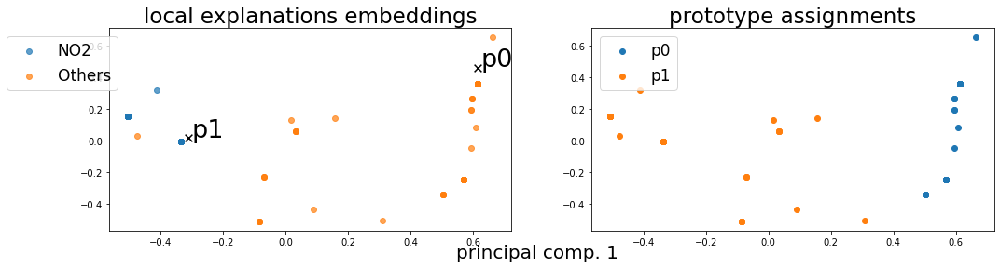

Alpha norms:
tensor([[0.9823, 1.0000],
        [1.0000, 0.4271]], grad_fn=<DivBackward0>)
Concept Purity: 0.906593 +- 0.093407
Concept distribution:  (array([0, 1], dtype=int64), array([48, 91], dtype=int64))
Logic formulas:
For class 0:
0.7959183673469388 (feature001) | ((feature000 & feature001)
For class 1:
0.7959183673469388 (feature000)
Accuracy as classifier:  0.7959
LEN fidelity:  tensor(0.7959)

(array([0., 1.], dtype=float32), array([74, 65], dtype=int64))


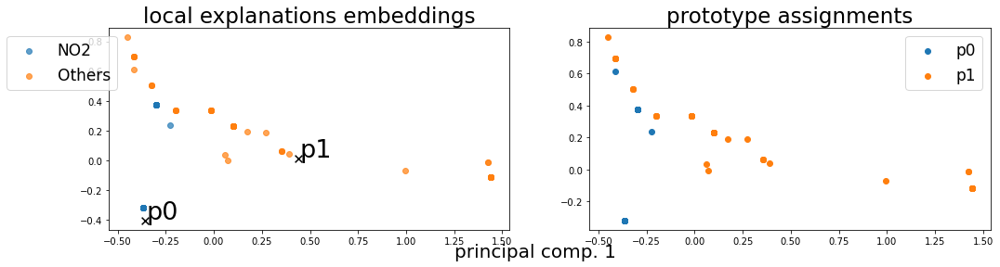

Alpha norms:
tensor([[1.0000, 0.9934],
        [0.9752, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.993333 +- 0.006667
Concept distribution:  (array([0, 1], dtype=int64), array([75, 64], dtype=int64))
Logic formulas:
For class 0:
0.7755102040816326 (feature000) | ((feature001 & feature000)
For class 1:
0.7755102040816326 (feature001)
Accuracy as classifier:  0.7755
LEN fidelity:  tensor(0.7755)

(array([0., 1.], dtype=float32), array([74, 65], dtype=int64))


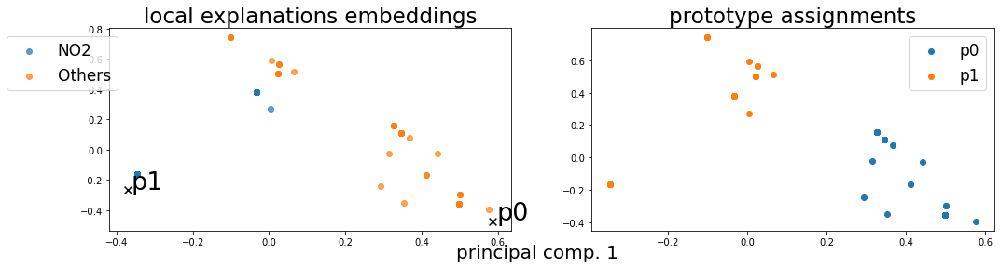

Alpha norms:
tensor([[1.0000, 0.8461],
        [1.0000, 0.8671]], grad_fn=<DivBackward0>)
Concept Purity: 0.920455 +- 0.079545
Concept distribution:  (array([0, 1], dtype=int64), array([51, 88], dtype=int64))
Logic formulas:
For class 0:
0.8061224489795918 ((feature001) | ((feature001 & feature000)
For class 1:
0.8061224489795918 (feature000)
Accuracy as classifier:  0.8061
LEN fidelity:  tensor(0.8061)

(array([0., 1.], dtype=float32), array([74, 65], dtype=int64))


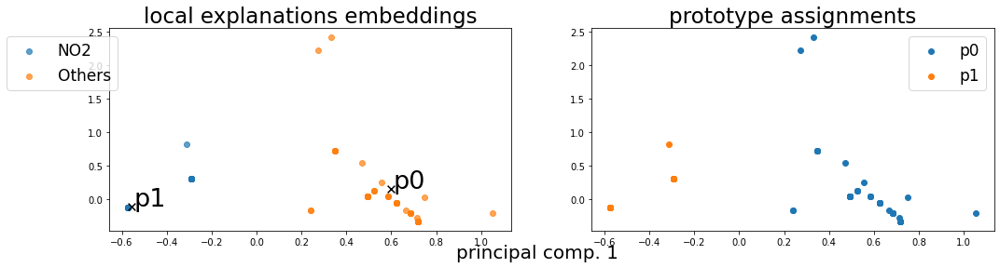

Alpha norms:
tensor([[0.6318, 1.0000],
        [0.3954, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 1.000000 +- 0.000000
Concept distribution:  (array([0, 1], dtype=int64), array([65, 74], dtype=int64))
Logic formulas:
For class 0:
0.7857142857142857 (feature001) | ((feature000 & feature001)
For class 1:
0.7857142857142857 ((feature000)
Accuracy as classifier:  0.7857
LEN fidelity:  tensor(0.7857)

(array([0., 1.], dtype=float32), array([74, 65], dtype=int64))


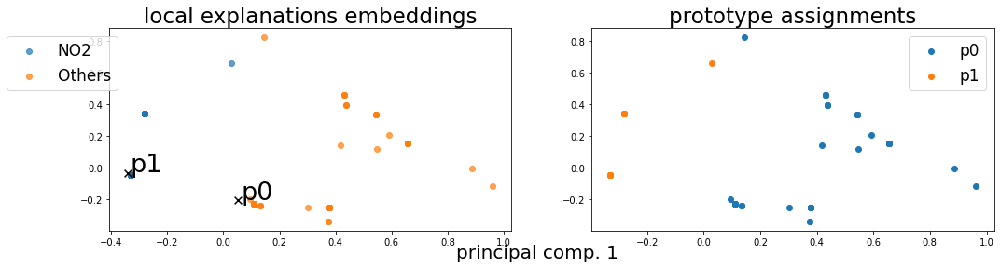

Alpha norms:
tensor([[1.0000, 0.9514],
        [0.6670, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 1.000000 +- 0.000000
Concept distribution:  (array([0, 1], dtype=int64), array([65, 74], dtype=int64))
Logic formulas:
For class 0:
0.7857142857142857 ((feature001) | ((feature001 & feature000)
For class 1:
0.7857142857142857 ((feature000)
Accuracy as classifier:  0.7857
LEN fidelity:  tensor(0.7857)



In [75]:
batch_sampler = utils.GroupBatchSampler(num_input_graphs=128, drop_last=False, belonging=np.array(belonging_train))
train_group_loader = DataLoader(dataset_train, batch_sampler=batch_sampler)

batch_sampler = utils.GroupBatchSampler(num_input_graphs=256, drop_last=False, belonging=np.array(belonging_val))
val_group_loader = DataLoader(dataset_val, batch_sampler=batch_sampler)

batch_sampler = utils.GroupBatchSampler(num_input_graphs=256, drop_last=False, belonging=np.array(belonging_test))
test_group_loader = DataLoader(dataset_test, batch_sampler=batch_sampler)

print("Fidelity:")
for i , m in enumerate(expls):
    print("\t", [e["acc_overall"] for e in m.val_metrics][m.early_stopping.best_epoch-1].item(), " @ ", m.early_stopping.best_epoch)
    
for i , m in enumerate(expls):
    m.inspect_embedding(test_group_loader)

In [126]:
sa = [0.8206, 0.8168, 0.8218, 0.8105, 0.8118] #[0.82, 0.799, 0.8265, 0.8061, 0.8061]
np.mean(sa) , np.std(sa)

(0.8163, 0.004536077600747147)

(array([0., 1.], dtype=float32), array([675, 451], dtype=int64))


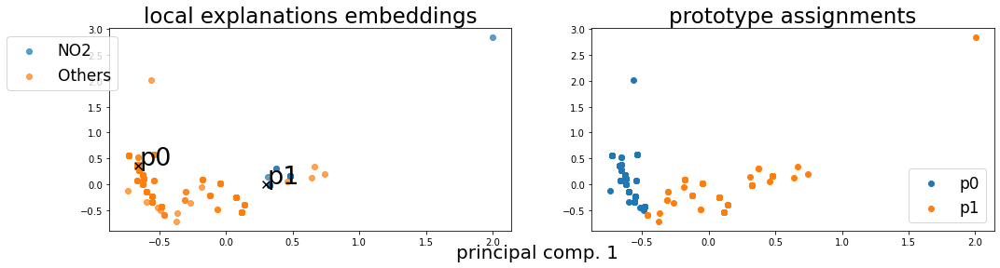

Alpha norms:
tensor([[0.9823, 1.0000],
        [1.0000, 0.4271]], grad_fn=<DivBackward0>)
Concept Purity: 0.957938 +- 0.042062
Concept distribution:  (array([0, 1], dtype=int64), array([389, 737], dtype=int64))
Logic formulas:
For class 0:
0.820577164366374 (feature001) | ((feature000 & feature001)
For class 1:
0.820577164366374 (feature000)
Accuracy as classifier:  0.8206
LEN fidelity:  tensor(0.8206)

(array([0., 1.], dtype=float32), array([675, 451], dtype=int64))


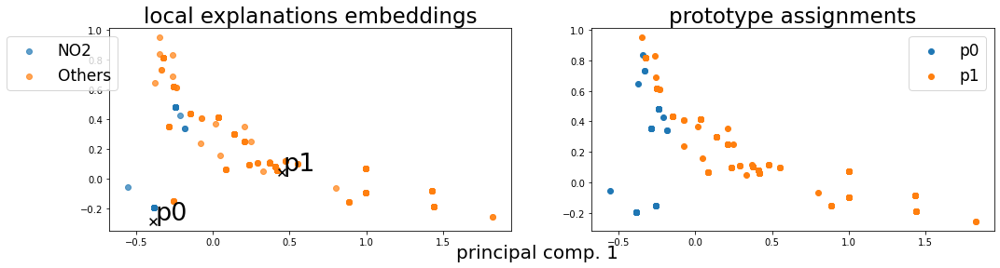

Alpha norms:
tensor([[1.0000, 0.9934],
        [0.9752, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.989130 +- 0.010870
Concept distribution:  (array([0, 1], dtype=int64), array([690, 436], dtype=int64))
Logic formulas:
For class 0:
0.8168130489335006 (feature000) | ((feature001 & feature000)
For class 1:
0.8168130489335006 (feature001)
Accuracy as classifier:  0.8168
LEN fidelity:  tensor(0.8168)

(array([0., 1.], dtype=float32), array([675, 451], dtype=int64))


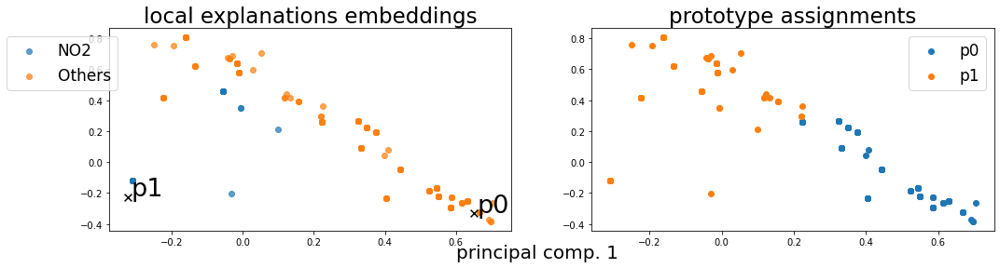

Alpha norms:
tensor([[1.0000, 0.8461],
        [1.0000, 0.8671]], grad_fn=<DivBackward0>)
Concept Purity: 0.960437 +- 0.039563
Concept distribution:  (array([0, 1], dtype=int64), array([393, 733], dtype=int64))
Logic formulas:
For class 0:
0.821831869510665 ((feature001) | ((feature001 & feature000)
For class 1:
0.821831869510665 (feature000)
Accuracy as classifier:  0.8218
LEN fidelity:  tensor(0.8218)

(array([0., 1.], dtype=float32), array([675, 451], dtype=int64))


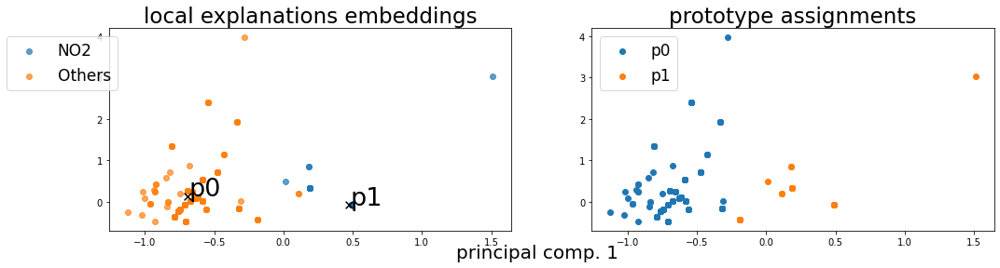

Alpha norms:
tensor([[0.6318, 1.0000],
        [0.3954, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.994143 +- 0.005857
Concept distribution:  (array([0, 1], dtype=int64), array([443, 683], dtype=int64))
Logic formulas:
For class 0:
0.8105395232120451 (feature001) | ((feature000 & feature001)
For class 1:
0.8105395232120451 ((feature000)
Accuracy as classifier:  0.8105
LEN fidelity:  tensor(0.8105)

(array([0., 1.], dtype=float32), array([675, 451], dtype=int64))


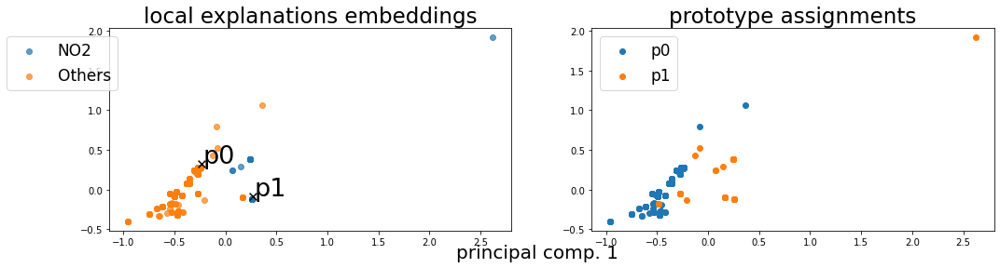

Alpha norms:
tensor([[1.0000, 0.9514],
        [0.6670, 1.0000]], grad_fn=<DivBackward0>)
Concept Purity: 0.988423 +- 0.011577
Concept distribution:  (array([0, 1], dtype=int64), array([435, 691], dtype=int64))
Logic formulas:
For class 0:
0.8117942283563363 ((feature001) | ((feature001 & feature000)
For class 1:
0.8117942283563363 ((feature000)
Accuracy as classifier:  0.8118
LEN fidelity:  tensor(0.8118)



In [125]:
batch_sampler = utils.GroupBatchSampler(num_input_graphs=128, drop_last=False, belonging=np.array(belonging_train))
train_group_loader = DataLoader(dataset_train, batch_sampler=batch_sampler)

batch_sampler = utils.GroupBatchSampler(num_input_graphs=256, drop_last=False, belonging=np.array(belonging_val))
val_group_loader = DataLoader(dataset_val, batch_sampler=batch_sampler)

batch_sampler = utils.GroupBatchSampler(num_input_graphs=256, drop_last=False, belonging=np.array(belonging_test))
test_group_loader = DataLoader(dataset_test, batch_sampler=batch_sampler)


with open(f'mutagenicity_confidence_intervals.pkl', 'rb') as handle:
    mutag_expls = pickle.load(handle)
    
for e in mutag_expls:
    e.inspect_embedding(train_group_loader)